# Emulators: First example

This example illustrates Bayesian inference on a time series, using [Adaptive Covariance MCMC](http://pints.readthedocs.io/en/latest/mcmc_samplers/adaptive_covariance_mcmc.html) with emulator neural networks .

It follows on from [Sampling: First example](../sampling/first-example.ipynb)

Like in the sampling example, I start by importing pints:

In [1]:
import pints

C:\Users\plagl\Anaconda3\lib\site-packages\tensorflow\python\framework\dtypes.py:523: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_qint8 = np.dtype([("qint8", np.int8, 1)])
C:\Users\plagl\Anaconda3\lib\site-packages\tensorflow\python\framework\dtypes.py:524: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_quint8 = np.dtype([("quint8", np.uint8, 1)])
C:\Users\plagl\Anaconda3\lib\site-packages\tensorflow\python\framework\dtypes.py:525: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_qint16 = np.dtype([("qint16", np.int16, 1)])
C:\Users\plagl\Anaconda3\lib\site-packages\tensorflow\python\framework\dtypes.py:526: FutureWarning: Passi

Next, I create a model class using the "Logistic" toy model included in pints:

In [2]:
import pints.toy as toy

class RescaledModel(pints.ForwardModel):
    def __init__(self):
        self.base_model = toy.LogisticModel()
    
    def simulate(self, parameters, times):
        # Run a simulation with the given parameters for the
        # given times and return the simulated values
        r, k = parameters
        r = r / 50
        k = k * 500
        return self.base_model.simulate([r, k], times)
    
    def simulateS1(self, parameters, times):
        # Run a simulation with the given parameters for the
        # given times and return the simulated values
        r, k = parameters
        r = r / 50
        k = k * 500
        return self.base_model.simulateS1([r, k], times)
    
    def n_parameters(self):
        # Return the dimension of the parameter vector
        return 2

# Rescale parameters
#found_parameters = list(found_parameters)
#found_parameters[0] = found_parameters[0] / 50
#found_parameters[1] = found_parameters[1] * 500

# Show score of true solution
#print('Score at true solution: ')
#print(score(true_parameters))

# Compare parameters with original
#print('Found solution:          True parameters:' )
#for k, x in enumerate(found_parameters):
    #print(pints.strfloat(x) + '    ' + pints.strfloat(true_parameters[k]))
    
model = toy.LogisticModel()

In order to generate some test data, I choose an arbitrary set of "true" parameters:

In [3]:
true_parameters = [0.015, 500]
start_parameters = [0.75, 1.0]

And a number of time points at which to sample the time series:

In [4]:
import numpy as np
times = np.linspace(0, 1000, 400)

Using these parameters and time points, I generate an example dataset:

In [5]:
org_values = model.simulate(true_parameters, times)
range_values = max(org_values) - min(org_values)

And make it more realistic by adding gaussian noise:

In [6]:
noise = 0.05 * range_values
print("The noise is:", noise)
values = org_values + np.random.normal(0, noise, org_values.shape)
values = org_values + np.random.normal(0, noise, org_values.shape)

The noise is: 24.898095903089327


Using matplotlib, I look at the noisy time series I just simulated:

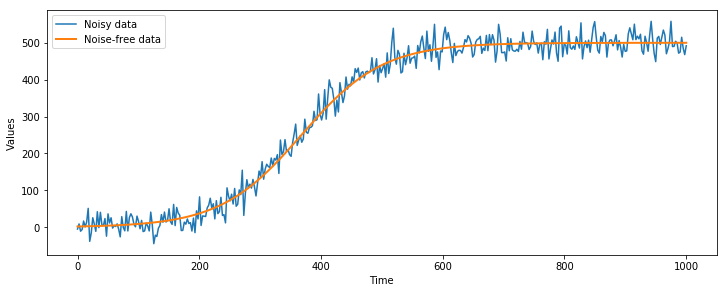

In [7]:
import matplotlib.pyplot as plt

plt.figure(figsize=(12,4.5))
plt.xlabel('Time')
plt.ylabel('Values')
plt.plot(times, values, label='Noisy data')
plt.plot(times, org_values, lw=2, label='Noise-free data')
plt.legend()
plt.show()

Now, I have enough data (a model, a list of times, and a list of values) to formulate a PINTS problem:

In [8]:
model = RescaledModel()
problem = pints.SingleOutputProblem(model, times, values)

I now have some toy data, and a model that can be used for forward simulations. To make it into a probabilistic problem, a _noise model_ needs to be added. This can be done using the `GaussianLogLikelihood` function, which assumes independently distributed Gaussian noise over the data, and can calculate log-likelihoods:

In [9]:
#log_likelihood = pints.GaussianLogLikelihood(problem)
log_likelihood = pints.GaussianKnownSigmaLogLikelihood(problem, noise)

This `log_likelihood` represents the _conditional probability_ $p(y|\theta)$, given a set of parameters $\theta$ and a series of $y=$ `values`, it can calculate the probability of finding those values if the real parameters are $\theta$.

This can be used in a Bayesian inference scheme to find the quantity of interest:

$p(\theta|y) = \frac{p(\theta)p(y|\theta)}{p(y)} \propto p(\theta)p(y|\theta)$

To solve this, a _prior_ is defined, indicating an initial guess about what the parameters should be. 
Similarly as using a _log-likelihood_ (the natural logarithm of a likelihood), this is defined by using a _log-prior_. Hence, the above equation simplifies to:

$\log p(\theta|y) \propto \log p(\theta) + \log p(y|\theta)$

In this example, it is assumed that we don't know too much about the prior except lower and upper bounds for each variable: We assume the first model parameter is somewhere on the interval $[0.01, 0.02]$, the second model parameter on $[400, 600]$, and the standard deviation of the noise is somewhere on $[1, 100]$.

In [10]:
# Create bounds for our parameters and get prior
#bounds = pints.RectangularBoundaries([0.01, 400], [0.02, 600])
bounds = pints.RectangularBoundaries([0.5, 0.8], [1.0, 1.2])
log_prior = pints.UniformLogPrior(bounds)

With this prior, the numerator of Bayes' rule can be defined -- the unnormalised log posterior, $\log \left[ p(y|\theta) p(\theta) \right]$, which is the natural logarithm of the likelihood times the prior:

In [11]:
# Create a posterior log-likelihood (log(likelihood * prior))
log_posterior = pints.LogPosterior(log_likelihood, log_prior)

Finally we create a list of guesses to use as initial positions. We'll run three MCMC chains so we create three initial positions:

In [12]:
xs = [
    np.array(start_parameters) * 0.9,
    np.array(start_parameters) * 1.05,
    np.array(start_parameters) * 1.15,
]

And this gives us everything we need to run an MCMC routine:

In [13]:
chains = pints.mcmc_sample(log_posterior, 3, xs)

Using Haario-Bardenet adaptive covariance MCMC
Generating 3 chains.
Running in sequential mode.
[[0.00675 0.     ]
 [0.      0.009  ]]
[[0.007875 0.      ]
 [0.       0.0105  ]]
[[0.008625 0.      ]
 [0.       0.0115  ]]
Iter. Eval. Accept.   Accept.   Accept.   Time m:s
0     3      0         0         0          0:00.0
[[0.00675 0.     ]
 [0.      0.009  ]]


[[0.007875 0.      ]
 [0.       0.0105  ]]


[[0.008625 0.      ]
 [0.       0.0115  ]]


1     6      0         0         0          0:00.0
[[0.00675 0.     ]
 [0.      0.009  ]]


[[0.007875 0.      ]
 [0.       0.0105  ]]


[[0.008625 0.      ]
 [0.       0.0115  ]]


2     9      0         0         0          0:00.0
[[0.00675 0.     ]
 [0.      0.009  ]]


[[0.007875 0.      ]
 [0.       0.0105  ]]


[[0.008625 0.      ]
 [0.       0.0115  ]]


3     12     0.25      0.25      0.25       0:00.0
[[0.00675 0.     ]
 [0.      0.009  ]]


[[0.007875 0.      ]
 [0.       0.0105  ]]


[[0.008625 0.      ]
 [0.       0.0115  ]]




[[0.00675 0.     ]
 [0.      0.009  ]]


[[0.007875 0.      ]
 [0.       0.0105  ]]


[[0.008625 0.      ]
 [0.       0.0115  ]]


[[0.00675 0.     ]
 [0.      0.009  ]]


[[0.007875 0.      ]
 [0.       0.0105  ]]


[[0.008625 0.      ]
 [0.       0.0115  ]]


[[0.00675 0.     ]
 [0.      0.009  ]]


[[0.007875 0.      ]
 [0.       0.0105  ]]


[[0.008625 0.      ]
 [0.       0.0115  ]]


[[0.00675 0.     ]
 [0.      0.009  ]]


[[0.007875 0.      ]
 [0.       0.0105  ]]


[[0.008625 0.      ]
 [0.       0.0115  ]]


[[0.00675 0.     ]
 [0.      0.009  ]]


[[0.007875 0.      ]
 [0.       0.0105  ]]


[[0.008625 0.      ]
 [0.       0.0115  ]]


80    243    0.0617    0.0247    0.111      0:00.2
[[0.00675 0.     ]
 [0.      0.009  ]]


[[0.007875 0.      ]
 [0.       0.0105  ]]


[[0.008625 0.      ]
 [0.       0.0115  ]]


[[0.00675 0.     ]
 [0.      0.009  ]]


[[0.007875 0.      ]
 [0.       0.0105  ]]


[[0.008625 0.      ]
 [0.       0.0115  ]]


[[0.00675 0.     ]
 [0.      0.0

[[0.00675 0.     ]
 [0.      0.009  ]]


[[0.007875 0.      ]
 [0.       0.0105  ]]


[[0.008625 0.      ]
 [0.       0.0115  ]]


[[0.00675 0.     ]
 [0.      0.009  ]]


[[0.007875 0.      ]
 [0.       0.0105  ]]


[[0.008625 0.      ]
 [0.       0.0115  ]]


[[0.00675 0.     ]
 [0.      0.009  ]]


[[0.007875 0.      ]
 [0.       0.0105  ]]


[[0.008625 0.      ]
 [0.       0.0115  ]]


160   483    0.0373    0.0186    0.0621     0:00.4
[[0.00675 0.     ]
 [0.      0.009  ]]


[[0.007875 0.      ]
 [0.       0.0105  ]]


[[0.008625 0.      ]
 [0.       0.0115  ]]


[[0.00675 0.     ]
 [0.      0.009  ]]


[[0.007875 0.      ]
 [0.       0.0105  ]]


[[0.008625 0.      ]
 [0.       0.0115  ]]


[[0.00675 0.     ]
 [0.      0.009  ]]


[[0.007875 0.      ]
 [0.       0.0105  ]]


[[0.008625 0.      ]
 [0.       0.0115  ]]


[[0.00675 0.     ]
 [0.      0.009  ]]


[[0.007875 0.      ]
 [0.       0.0105  ]]


[[0.008625 0.      ]
 [0.       0.0115  ]]


[[0.00675 0.     ]
 [0.      0.0

[[ 4.43235022e-06 -1.77938512e-06]
 [-1.77938512e-06  5.67412275e-06]]


[[ 2.12644029e-06 -8.94934134e-09]
 [-8.94934134e-09  5.01898608e-06]]


[[ 3.09887206e-06 -8.09814254e-07]
 [-8.09814254e-07  1.51408047e-05]]


[[ 3.94036226e-06 -1.60264032e-06]
 [-1.60264032e-06  5.10773521e-06]]


[[1.89491811e-06 5.48270468e-08]
 [5.48270468e-08 4.93112625e-06]]


[[ 2.82496450e-06 -4.88671089e-07]
 [-4.88671089e-07  1.41332679e-05]]


[[ 3.50899297e-06 -1.44331763e-06]
 [-1.44331763e-06  4.59782961e-06]]


[[1.75596866e-06 3.01889572e-07]
 [3.01889572e-07 5.28120019e-06]]


[[ 2.88038935e-06 -3.18666690e-07]
 [-3.18666690e-07  1.26006483e-05]]


[[ 3.13005956e-06 -1.30003245e-06]
 [-1.30003245e-06  4.13973618e-06]]


[[1.85406552e-06 6.03821367e-07]
 [6.03821367e-07 5.09049913e-06]]


[[ 2.85378491e-06 -1.93381226e-07]
 [-1.93381226e-07  1.12513120e-05]]


[[ 2.79530922e-06 -1.15916573e-06]
 [-1.15916573e-06  3.69404216e-06]]


[[1.88188684e-06 8.01512616e-07]
 [8.01512616e-07 4.84547143e-0

 [-2.70557311e-06  3.64604052e-06]]


[[ 6.55693399e-06 -5.71550330e-06]
 [-5.71550330e-06  7.39485478e-06]]


[[ 7.28077765e-06 -5.43783415e-06]
 [-5.43783415e-06  1.03661134e-05]]


[[ 4.47651900e-06 -2.47366376e-06]
 [-2.47366376e-06  3.52360050e-06]]


[[ 8.11514678e-06 -7.07570645e-06]
 [-7.07570645e-06  8.44294318e-06]]


[[ 6.86132092e-06 -5.12315383e-06]
 [-5.12315383e-06  9.76861344e-06]]


[[ 4.27708153e-06 -2.26466852e-06]
 [-2.26466852e-06  3.39905347e-06]]


[[ 9.41111781e-06 -8.59148313e-06]
 [-8.59148313e-06  1.00548766e-05]]


[[ 7.20705045e-06 -4.72331210e-06]
 [-4.72331210e-06  9.22275707e-06]]


[[ 4.08369088e-06 -2.07607123e-06]
 [-2.07607123e-06  3.27366576e-06]]


[[ 9.01279611e-06 -8.26762109e-06]
 [-8.26762109e-06  9.68052278e-06]]


[[ 7.44957709e-06 -4.36001777e-06]
 [-4.36001777e-06  8.70919977e-06]]


[[ 3.89666915e-06 -1.90565421e-06]
 [-1.90565421e-06  3.14847748e-06]]


[[ 8.62381440e-06 -7.94545374e-06]
 [-7.94545374e-06  9.30734974e-06]]


[[ 7.60519139

 [-1.40177932e-06  1.22770101e-05]]


[[ 9.50959093e-06 -4.34979833e-07]
 [-4.34979833e-07  1.47491137e-05]]


[[ 7.54560954e-06 -7.09964710e-06]
 [-7.09964710e-06  1.14480044e-05]]


380   1143   0.205     0.202     0.21       0:00.9
[[ 4.57161376e-06 -1.58533401e-06]
 [-1.58533401e-06  1.51143326e-05]]


[[ 9.62224055e-06 -1.07421369e-06]
 [-1.07421369e-06  1.49148961e-05]]


[[ 8.18781008e-06 -7.06222397e-06]
 [-7.06222397e-06  1.10214864e-05]]


[[ 4.38711952e-06 -1.73922805e-06]
 [-1.73922805e-06  1.75285850e-05]]


[[ 9.68407118e-06 -1.62692195e-06]
 [-1.62692195e-06  1.50030459e-05]]


[[ 8.71627741e-06 -7.00299808e-06]
 [-7.00299808e-06  1.06084371e-05]]


[[ 4.20991672e-06 -1.86681312e-06]
 [-1.86681312e-06  1.95666606e-05]]


[[ 9.70166704e-06 -2.10244941e-06]
 [-2.10244941e-06  1.50236479e-05]]


[[ 8.94111642e-06 -7.31752870e-06]
 [-7.31752870e-06  1.07802521e-05]]


[[ 4.03976083e-06 -1.97109140e-06]
 [-1.97109140e-06  2.12706004e-05]]


[[ 9.68089151e-06 -2.50918401e-06]


 [-1.89167977e-06  6.91494316e-06]]


[[ 5.63470361e-06 -1.86732224e-06]
 [-1.86732224e-06  5.08305057e-06]]


[[ 8.18219355e-06 -5.05802293e-06]
 [-5.05802293e-06  2.22109596e-05]]


[[ 9.60564390e-06 -1.69576392e-06]
 [-1.69576392e-06  6.78184766e-06]]


[[ 5.69353238e-06 -1.79663616e-06]
 [-1.79663616e-06  4.90020297e-06]]


[[ 8.16138284e-06 -5.01735083e-06]
 [-5.01735083e-06  2.14847800e-05]]


[[ 9.39182662e-06 -1.51633336e-06]
 [-1.51633336e-06  6.64570286e-06]]


[[ 6.14267887e-06 -1.98422394e-06]
 [-1.98422394e-06  4.82153528e-06]]


[[ 8.12212343e-06 -4.96829360e-06]
 [-4.96829360e-06  2.07812367e-05]]


[[ 9.17697326e-06 -1.35206825e-06]
 [-1.35206825e-06  6.50722156e-06]]


[[ 6.52882689e-06 -2.14696454e-06]
 [-2.14696454e-06  4.73904492e-06]]


[[ 8.06655674e-06 -4.91191093e-06]
 [-4.91191093e-06  2.00997826e-05]]


[[ 9.00412621e-06 -1.50210358e-06]
 [-1.50210358e-06  6.52846062e-06]]


[[ 6.85783811e-06 -2.28714112e-06]
 [-2.28714112e-06  4.65337935e-06]]


[[ 8.68547597

 [-7.92008585e-06  1.80999064e-05]]


[[ 5.18277938e-06 -2.43093885e-06]
 [-2.43093885e-06  1.62344530e-05]]


[[ 5.07667817e-05 -2.01935175e-05]
 [-2.01935175e-05  1.75778757e-05]]


[[ 1.51690340e-05 -7.67047468e-06]
 [-7.67047468e-06  1.75490602e-05]]


[[ 5.44155263e-06 -2.35339933e-06]
 [-2.35339933e-06  1.57303742e-05]]


[[ 4.93010690e-05 -1.94791672e-05]
 [-1.94791672e-05  1.71010140e-05]]


[[ 1.47000335e-05 -7.42928280e-06]
 [-7.42928280e-06  1.70156178e-05]]


[[ 5.66626459e-06 -2.27853073e-06]
 [-2.27853073e-06  1.52428435e-05]]


[[ 4.78767363e-05 -1.87935884e-05]
 [-1.87935884e-05  1.66356079e-05]]


[[ 1.42463314e-05 -7.19620428e-06]
 [-7.19620428e-06  1.64990186e-05]]


[[ 5.85969478e-06 -2.20623262e-06]
 [-2.20623262e-06  1.47712872e-05]]


[[ 4.65388833e-05 -1.82157052e-05]
 [-1.82157052e-05  1.61210421e-05]]


[[ 1.38074027e-05 -6.97094529e-06]
 [-6.97094529e-06  1.59987194e-05]]


[[ 5.68737694e-06 -1.99551999e-06]
 [-1.99551999e-06  1.66704217e-05]]


[[ 4.52360872

[[ 8.59756563e-06 -6.61507544e-06]
 [-6.61507544e-06  1.46876861e-05]]


[[9.87131585e-06 6.53946530e-07]
 [6.53946530e-07 8.92353425e-06]]


[[ 1.15487883e-05 -3.64541730e-06]
 [-3.64541730e-06  6.88166540e-06]]


[[ 8.72102822e-06 -7.60555362e-06]
 [-7.60555362e-06  1.80921773e-05]]


[[9.67239758e-06 6.24989929e-07]
 [6.24989929e-07 8.67819028e-06]]


[[ 1.16211629e-05 -3.77862149e-06]
 [-3.77862149e-06  6.83103173e-06]]


[[ 8.82122842e-06 -8.50330651e-06]
 [-8.50330651e-06  2.11900724e-05]]


[[9.47523720e-06 5.97468267e-07]
 [5.97468267e-07 8.43991067e-06]]


[[ 1.13159558e-05 -3.62887247e-06]
 [-3.62887247e-06  6.77171488e-06]]


[[ 8.89997622e-06 -9.31473878e-06]
 [-9.31473878e-06  2.40023378e-05]]


[[9.21555015e-06 6.10153482e-07]
 [6.10153482e-07 8.70197770e-06]]


[[ 1.10187671e-05 -3.48594497e-06]
 [-3.48594497e-06  6.70709207e-06]]


[[ 8.95896061e-06 -1.00458452e-05]
 [-1.00458452e-05  2.65486037e-05]]


[[8.96331505e-06 6.20887665e-07]
 [6.20887665e-07 8.92958014e-06]]




[[ 1.06431871e-05 -1.06010241e-05]
 [-1.06010241e-05  3.25802238e-05]]


[[ 6.44792842e-06 -8.64375280e-07]
 [-8.64375280e-07  7.73606889e-06]]


[[ 5.38762296e-06 -2.78954239e-06]
 [-2.78954239e-06  7.90736705e-06]]


[[ 1.05474932e-05 -9.54368110e-06]
 [-9.54368110e-06  3.54519243e-05]]


[[ 6.28941422e-06 -8.55126484e-07]
 [-8.55126484e-07  7.60028672e-06]]


[[ 5.29818574e-06 -2.82928011e-06]
 [-2.82928011e-06  7.97465713e-06]]


[[ 1.04459235e-05 -8.55310192e-06]
 [-8.55310192e-06  3.80667638e-05]]


[[ 6.13492932e-06 -8.45511986e-07]
 [-8.45511986e-07  7.46523261e-06]]


[[ 5.17771535e-06 -2.83435300e-06]
 [-2.83435300e-06  8.26171358e-06]]


[[ 1.08035103e-05 -9.39134761e-06]
 [-9.39134761e-06  3.89067004e-05]]


[[ 5.98436939e-06 -8.35572514e-07]
 [-8.35572514e-07  7.33102940e-06]]


[[ 5.05982257e-06 -2.83557018e-06]
 [-2.83557018e-06  8.51734014e-06]]


[[ 1.11213833e-05 -1.01560086e-05]
 [-1.01560086e-05  3.96367852e-05]]


[[ 5.83763276e-06 -8.25346040e-07]
 [-8.25346040e

[[ 2.29111479e-05 -8.95721872e-06]
 [-8.95721872e-06  2.61058126e-05]]


[[ 1.05951165e-05 -2.26794366e-06]
 [-2.26794366e-06  7.23463769e-06]]


[[ 1.30441530e-05 -4.49009343e-06]
 [-4.49009343e-06  9.31997064e-06]]


[[ 2.31464178e-05 -9.54218991e-06]
 [-9.54218991e-06  2.63248935e-05]]


[[ 1.07180894e-05 -2.29416949e-06]
 [-2.29416949e-06  7.08472310e-06]]


[[ 1.28361213e-05 -4.09588323e-06]
 [-4.09588323e-06  1.00189693e-05]]


[[ 2.33413241e-05 -1.00770770e-05]
 [-1.00770770e-05  2.65013918e-05]]


[[ 1.15795413e-05 -2.60435609e-06]
 [-2.60435609e-06  7.04056930e-06]]


[[ 1.26289052e-05 -3.72440124e-06]
 [-3.72440124e-06  1.06595696e-05]]


[[ 2.28048068e-05 -9.84158295e-06]
 [-9.84158295e-06  2.60557420e-05]]


[[ 1.18107268e-05 -2.52086736e-06]
 [-2.52086736e-06  6.87983097e-06]]


[[ 1.24226792e-05 -3.37445940e-06]
 [-3.37445940e-06  1.12451762e-05]]


[[ 2.22812035e-05 -9.61193252e-06]
 [-9.61193252e-06  2.56134028e-05]]


[[ 1.23848441e-05 -2.86823033e-06]
 [-2.86823033e-0

 [-1.43152661e-05  2.00518460e-05]]


[[ 1.02876779e-05 -3.10302377e-06]
 [-3.10302377e-06  1.61260279e-05]]


[[ 6.50638227e-06 -2.08315577e-06]
 [-2.08315577e-06  1.01778406e-05]]


[[ 2.23957876e-05 -1.40084692e-05]
 [-1.40084692e-05  1.96243519e-05]]


[[ 1.00839259e-05 -3.02449693e-06]
 [-3.02449693e-06  1.57926022e-05]]


[[ 6.57493293e-06 -2.45340301e-06]
 [-2.45340301e-06  1.07909866e-05]]


[[ 2.20481558e-05 -1.37123246e-05]
 [-1.37123246e-05  1.92063959e-05]]


[[ 9.88406260e-06 -2.94824105e-06]
 [-2.94824105e-06  1.54661754e-05]]


[[ 6.63324479e-06 -2.79796832e-06]
 [-2.79796832e-06  1.13555741e-05]]


[[ 2.16135407e-05 -1.33723908e-05]
 [-1.33723908e-05  1.88648193e-05]]


[[ 9.68802549e-06 -2.87418087e-06]
 [-2.87418087e-06  1.51466031e-05]]


[[ 6.68193020e-06 -3.11819795e-06]
 [-3.11819795e-06  1.18742318e-05]]


[[ 2.11871384e-05 -1.30420396e-05]
 [-1.30420396e-05  1.85280180e-05]]


[[ 9.49575225e-06 -2.80224394e-06]
 [-2.80224394e-06  1.48337434e-05]]


[[ 7.80483833

 [-5.73772505e-06  1.16651253e-05]]


[[ 9.27289907e-06 -2.60486067e-06]
 [-2.60486067e-06  1.03980246e-05]]


[[ 9.52637973e-06 -3.64880101e-06]
 [-3.64880101e-06  7.66043968e-06]]


[[ 8.82666072e-06 -5.61807570e-06]
 [-5.61807570e-06  1.14350599e-05]]


[[ 9.28303847e-06 -2.94218101e-06]
 [-2.94218101e-06  1.09727260e-05]]


[[ 9.37212427e-06 -3.57987595e-06]
 [-3.57987595e-06  7.50907579e-06]]


[[ 8.69014877e-06 -5.50113365e-06]
 [-5.50113365e-06  1.12097100e-05]]


[[ 9.28538447e-06 -3.25731234e-06]
 [-3.25731234e-06  1.15050040e-05]]


[[ 9.21970893e-06 -3.51224420e-06]
 [-3.51224420e-06  7.36082536e-06]]


[[ 1.03084137e-05 -6.18895370e-06]
 [-6.18895370e-06  1.13425952e-05]]


[[ 9.28040776e-06 -3.55134031e-06]
 [-3.55134031e-06  1.19969921e-05]]


[[ 9.11757224e-06 -3.66835423e-06]
 [-3.66835423e-06  7.85030292e-06]]


[[ 1.03836983e-05 -6.11895295e-06]
 [-6.11895295e-06  1.11283644e-05]]


[[ 9.26855611e-06 -3.82530148e-06]
 [-3.82530148e-06  1.24507265e-05]]


[[ 9.01441094


[[ 1.20480455e-05 -5.37867694e-06]
 [-5.37867694e-06  9.15560171e-06]]


[[ 1.63379210e-05 -5.79917608e-06]
 [-5.79917608e-06  1.30401167e-05]]


[[ 7.36789997e-06 -2.45264364e-06]
 [-2.45264364e-06  9.14787945e-06]]


[[ 1.18592287e-05 -5.29428737e-06]
 [-5.29428737e-06  8.99226831e-06]]


[[ 1.60359246e-05 -5.69989600e-06]
 [-5.69989600e-06  1.28372351e-05]]


[[ 7.31697705e-06 -2.29369067e-06]
 [-2.29369067e-06  9.12735020e-06]]


[[ 1.16727714e-05 -5.21095656e-06]
 [-5.21095656e-06  8.83184261e-06]]


[[ 1.57397085e-05 -5.60222317e-06]
 [-5.60222317e-06  1.26368241e-05]]


[[ 7.26387791e-06 -2.14198158e-06]
 [-2.14198158e-06  9.10172313e-06]]


[[ 1.14886749e-05 -5.12868475e-06]
 [-5.12868475e-06  8.67427559e-06]]


[[ 1.54491586e-05 -5.50613702e-06]
 [-5.50613702e-06  1.24388887e-05]]


[[ 7.20876489e-06 -1.99721427e-06]
 [-1.99721427e-06  9.07130689e-06]]


[[ 1.13069384e-05 -5.04747138e-06]
 [-5.04747138e-06  8.51951890e-06]]


[[ 1.51641634e-05 -5.41161699e-06]
 [-5.41161699e-

 [-3.90541532e-06  1.04138821e-05]]


[[ 7.71769724e-06 -1.27709471e-06]
 [-1.27709471e-06  9.55582712e-06]]


[[ 7.94388314e-06 -4.84289565e-06]
 [-4.84289565e-06  1.10169661e-05]]


[[ 9.02180102e-06 -3.98708880e-06]
 [-3.98708880e-06  1.04607213e-05]]


[[ 7.58311039e-06 -1.27075049e-06]
 [-1.27075049e-06  9.73783163e-06]]


[[ 7.87015231e-06 -4.74680360e-06]
 [-4.74680360e-06  1.08256975e-05]]


[[ 8.95850670e-06 -4.06206122e-06]
 [-4.06206122e-06  1.04987423e-05]]


[[ 7.45095165e-06 -1.26396486e-06]
 [-1.26396486e-06  9.90438417e-06]]


[[ 7.91828274e-06 -4.75881756e-06]
 [-4.75881756e-06  1.06847165e-05]]


[[ 8.89307767e-06 -4.13064391e-06]
 [-4.13064391e-06  1.05283940e-05]]


[[ 7.32117590e-06 -1.25676588e-06]
 [-1.25676588e-06  1.00562066e-05]]


[[ 7.95908345e-06 -4.76731087e-06]
 [-4.76731087e-06  1.05446145e-05]]


[[ 8.82567054e-06 -4.19313538e-06]
 [-4.19313538e-06  1.05501060e-05]]


[[ 7.19373892e-06 -1.24918035e-06]
 [-1.24918035e-06  1.01939913e-05]]


[[ 8.18182085

 [-1.01102708e-06  6.83644923e-06]]


[[ 5.77835760e-06 -1.28869544e-07]
 [-1.28869544e-07  8.06436036e-06]]


[[ 1.15391496e-05 -5.52736783e-06]
 [-5.52736783e-06  8.35149478e-06]]


[[ 5.92865122e-06 -1.10913139e-06]
 [-1.10913139e-06  6.77170811e-06]]


[[ 5.71779309e-06 -2.91939033e-08]
 [-2.91939033e-08  8.20028212e-06]]


[[ 1.14832616e-05 -5.54751010e-06]
 [-5.54751010e-06  8.30525081e-06]]


[[ 6.09252993e-06 -1.20177190e-06]
 [-1.20177190e-06  6.70648353e-06]]


[[ 5.69191544e-06 -5.37822680e-08]
 [-5.37822680e-08  8.07348073e-06]]


[[ 1.14238840e-05 -5.56363153e-06]
 [-5.56363153e-06  8.25677147e-06]]


[[ 6.24498062e-06 -1.28917255e-06]
 [-1.28917255e-06  6.64083763e-06]]


[[ 5.66422092e-06 -7.71242124e-08]
 [-7.71242124e-08  7.94856215e-06]]


[[ 1.13612283e-05 -5.57592693e-06]
 [-5.57592693e-06  8.20619815e-06]]


[[ 6.41563569e-06 -1.03524815e-06]
 [-1.03524815e-06  6.72830387e-06]]


[[ 5.59690678e-06 -1.31791102e-07]
 [-1.31791102e-07  7.93529102e-06]]


[[ 1.12954966

 [-3.49012791e-06  1.06402089e-05]]


[[ 5.56596374e-06 -2.71850611e-06]
 [-2.71850611e-06  9.91258302e-06]]


[[ 1.66576931e-05 -7.78963077e-06]
 [-7.78963077e-06  1.43263587e-05]]


1200  3603   0.219     0.229     0.226      0:03.0
[[ 1.38048268e-05 -3.44970512e-06]
 [-3.44970512e-06  1.05767627e-05]]


[[ 5.48467028e-06 -2.67682944e-06]
 [-2.67682944e-06  9.75593763e-06]]


[[ 1.64372983e-05 -7.65082276e-06]
 [-7.65082276e-06  1.41051213e-05]]


[[ 1.35884546e-05 -3.40948092e-06]
 [-3.40948092e-06  1.05110645e-05]]


[[ 5.40449775e-06 -2.63579448e-06]
 [-2.63579448e-06  9.60185569e-06]]


[[ 1.62191639e-05 -7.51478003e-06]
 [-7.51478003e-06  1.38873423e-05]]


[[ 1.33755692e-05 -3.36946677e-06]
 [-3.36946677e-06  1.04432579e-05]]


[[ 5.32543390e-06 -2.59539166e-06]
 [-2.59539166e-06  9.45029384e-06]]


[[ 1.60032946e-05 -7.38143999e-06]
 [-7.38143999e-06  1.36729684e-05]]


[[ 1.31661134e-05 -3.32967346e-06]
 [-3.32967346e-06  1.03734804e-05]]


[[ 5.24746646e-06 -2.55561154e-06]


 [-4.58845422e-06  1.06272731e-05]]


[[ 6.02176318e-06 -3.87954395e-06]
 [-3.87954395e-06  8.05092700e-06]]


[[ 9.65023722e-06 -1.59427780e-06]
 [-1.59427780e-06  6.93417568e-06]]


1280  3843   0.214     0.231     0.223      0:03.2
[[ 9.39211757e-06 -4.47394482e-06]
 [-4.47394482e-06  1.04815075e-05]]


[[ 6.54667038e-06 -4.35099440e-06]
 [-4.35099440e-06  8.38544163e-06]]


[[ 9.50512209e-06 -1.56612810e-06]
 [-1.56612810e-06  6.85073228e-06]]


[[ 9.39512796e-06 -4.61321292e-06]
 [-4.61321292e-06  1.06184460e-05]]


[[ 7.04489511e-06 -4.79917249e-06]
 [-4.79917249e-06  8.70104293e-06]]


[[ 9.36225687e-06 -1.53854067e-06]
 [-1.53854067e-06  6.76795501e-06]]


[[ 9.39375027e-06 -4.74410422e-06]
 [-4.74410422e-06  1.07443951e-05]]


[[ 7.51743307e-06 -5.22494015e-06]
 [-5.22494015e-06  8.99845464e-06]]


[[ 9.22160577e-06 -1.51150267e-06]
 [-1.51150267e-06  6.68585261e-06]]


[[ 9.38818795e-06 -4.86694334e-06]
 [-4.86694334e-06  1.08598023e-05]]


[[ 7.69774399e-06 -4.93897347e-06]


 [-1.88819079e-06  8.18171063e-06]]


[[ 9.08539901e-06 -4.37771195e-06]
 [-4.37771195e-06  1.04177305e-05]]


[[ 3.15364534e-05 -7.39098741e-06]
 [-7.39098741e-06  7.10552753e-06]]


[[ 7.94953455e-06 -1.67498401e-06]
 [-1.67498401e-06  8.25736058e-06]]


[[ 9.22644664e-06 -4.31053510e-06]
 [-4.31053510e-06  1.02665011e-05]]


[[ 3.11435960e-05 -7.34261020e-06]
 [-7.34261020e-06  7.05573556e-06]]


[[ 8.00645910e-06 -1.47033312e-06]
 [-1.47033312e-06  8.32627268e-06]]


[[ 9.35751188e-06 -4.24447194e-06]
 [-4.24447194e-06  1.01175436e-05]]


[[ 3.07547695e-05 -7.29326238e-06]
 [-7.29326238e-06  7.00515438e-06]]


[[ 8.05756843e-06 -1.27394831e-06]
 [-1.27394831e-06  8.38871577e-06]]


[[ 9.26212139e-06 -4.27309485e-06]
 [-4.27309485e-06  1.01723841e-05]]


[[ 3.03699658e-05 -7.24300878e-06]
 [-7.24300878e-06  6.95384131e-06]]


[[ 8.10309814e-06 -1.08554912e-06]
 [-1.08554912e-06  8.44494947e-06]]


[[ 9.16700232e-06 -4.29869291e-06]
 [-4.29869291e-06  1.02206005e-05]]


[[ 2.99891758

[[ 8.10346303e-06 -9.04962653e-07]
 [-9.04962653e-07  8.36801691e-06]]


[[ 1.18042335e-05 -7.22370728e-06]
 [-7.22370728e-06  1.50531741e-05]]


[[ 1.65170001e-05 -2.85300457e-06]
 [-2.85300457e-06  6.51712780e-06]]


[[ 8.01560974e-06 -1.01359210e-06]
 [-1.01359210e-06  8.82862585e-06]]


[[ 1.18157163e-05 -7.02748501e-06]
 [-7.02748501e-06  1.48940083e-05]]


[[ 1.63536400e-05 -2.79782124e-06]
 [-2.79782124e-06  6.42944793e-06]]


[[ 7.92832059e-06 -1.11728521e-06]
 [-1.11728521e-06  9.26654589e-06]]


[[ 1.18221343e-05 -6.83674242e-06]
 [-6.83674242e-06  1.47357202e-05]]


[[ 1.61907666e-05 -2.74386022e-06]
 [-2.74386022e-06  6.34294038e-06]]


[[ 7.84160706e-06 -1.21621072e-06]
 [-1.21621072e-06  9.68256835e-06]]


[[ 1.18237016e-05 -6.65132308e-06]
 [-6.65132308e-06  1.45783370e-05]]


[[ 1.60284257e-05 -2.69109127e-06]
 [-2.69109127e-06  6.25759030e-06]]


[[ 7.93987184e-06 -1.16900887e-06]
 [-1.16900887e-06  9.55175945e-06]]


[[ 1.17751720e-05 -6.66818602e-06]
 [-6.66818602e-0

 [-4.80745386e-06  1.64163330e-05]]


[[ 9.96646352e-06 -6.34752927e-06]
 [-6.34752927e-06  1.43023484e-05]]


[[ 1.68717608e-05 -4.12362794e-06]
 [-4.12362794e-06  1.51945562e-05]]


[[ 1.03959959e-05 -4.64682273e-06]
 [-4.64682273e-06  1.64443803e-05]]


[[ 9.92183537e-06 -6.29079099e-06]
 [-6.29079099e-06  1.41183447e-05]]


[[ 1.68923903e-05 -4.32488383e-06]
 [-4.32488383e-06  1.52546362e-05]]


[[ 1.02910636e-05 -4.49100275e-06]
 [-4.49100275e-06  1.64653260e-05]]


[[ 9.87541204e-06 -6.23406497e-06]
 [-6.23406497e-06  1.39366607e-05]]


[[ 1.66650193e-05 -4.26562694e-06]
 [-4.26562694e-06  1.50491497e-05]]


[[ 1.02426659e-05 -4.60362165e-06]
 [-4.60362165e-06  1.65742375e-05]]


[[ 9.82728541e-06 -6.17737232e-06]
 [-6.17737232e-06  1.37572696e-05]]


[[ 1.64407993e-05 -4.20721938e-06]
 [-4.20721938e-06  1.48465152e-05]]


[[ 1.01925141e-05 -4.71002193e-06]
 [-4.71002193e-06  1.66727443e-05]]


[[ 9.77754416e-06 -6.12073324e-06]
 [-6.12073324e-06  1.35801452e-05]]


[[ 1.62196855

[[ 7.89224423e-06 -2.67795372e-06]
 [-2.67795372e-06  1.50190558e-05]]


[[ 1.07968555e-05 -3.61985655e-06]
 [-3.61985655e-06  1.21658860e-05]]


[[ 1.25753222e-05 -8.91232310e-06]
 [-8.91232310e-06  1.68374225e-05]]


[[ 7.90292968e-06 -2.74448566e-06]
 [-2.74448566e-06  1.49135099e-05]]


1580  4743   0.22      0.227     0.221      0:03.9
[[ 1.07698649e-05 -3.46476770e-06]
 [-3.46476770e-06  1.21091615e-05]]


[[ 1.24163457e-05 -8.77166398e-06]
 [-8.77166398e-06  1.67322995e-05]]


[[ 7.91052237e-06 -2.80748904e-06]
 [-2.80748904e-06  1.48070394e-05]]


[[ 1.07402858e-05 -3.31456396e-06]
 [-3.31456396e-06  1.20505568e-05]]


[[ 1.22593785e-05 -8.63353153e-06]
 [-8.63353153e-06  1.66256228e-05]]


[[ 7.82196141e-06 -2.74892039e-06]
 [-2.74892039e-06  1.46467178e-05]]


[[ 1.06025221e-05 -3.25250619e-06]
 [-3.25250619e-06  1.20474084e-05]]


[[ 1.21043962e-05 -8.49787397e-06]
 [-8.49787397e-06  1.65174923e-05]]


[[ 7.72126837e-06 -2.71629907e-06]
 [-2.71629907e-06  1.44636310e-05]]




 [-5.99398918e-06  1.40868713e-05]]


[[ 9.36680975e-06 -4.00258566e-06]
 [-4.00258566e-06  1.77210837e-05]]


[[ 8.48172016e-06 -3.82460595e-06]
 [-3.82460595e-06  1.33543195e-05]]


[[ 9.60457414e-06 -5.80399297e-06]
 [-5.80399297e-06  1.39682230e-05]]


[[ 9.37613944e-06 -4.04231707e-06]
 [-4.04231707e-06  1.75608773e-05]]


[[ 8.37455544e-06 -3.77594025e-06]
 [-3.77594025e-06  1.31864952e-05]]


[[ 9.69683393e-06 -5.61934408e-06]
 [-5.61934408e-06  1.38496296e-05]]


[[ 9.38213898e-06 -4.07926138e-06]
 [-4.07926138e-06  1.74011578e-05]]


[[ 8.26878717e-06 -3.72791733e-06]
 [-3.72791733e-06  1.30208351e-05]]


[[ 9.78252729e-06 -5.43989736e-06]
 [-5.43989736e-06  1.37311286e-05]]


[[ 9.38493502e-06 -4.11351397e-06]
 [-4.11351397e-06  1.72419596e-05]]


[[ 8.16439661e-06 -3.68052833e-06]
 [-3.68052833e-06  1.28573106e-05]]


[[ 9.86187931e-06 -5.26551162e-06]
 [-5.26551162e-06  1.36127556e-05]]


[[ 9.30492036e-06 -4.10027342e-06]
 [-4.10027342e-06  1.70631119e-05]]


[[ 8.06136527

 [-1.94452264e-05  2.50846546e-05]]


[[ 1.04236858e-05 -1.97949059e-06]
 [-1.97949059e-06  8.05714127e-06]]


[[ 7.66721573e-06 -2.57453565e-06]
 [-2.57453565e-06  1.04843317e-05]]


[[ 2.66723010e-05 -1.96273984e-05]
 [-1.96273984e-05  2.54286612e-05]]


[[ 1.03641042e-05 -1.95104725e-06]
 [-1.95104725e-06  7.95877251e-06]]


[[ 7.69445361e-06 -2.71581263e-06]
 [-2.71581263e-06  1.06025524e-05]]


[[ 2.66104287e-05 -1.97970534e-05]
 [-1.97970534e-05  2.57524942e-05]]


[[ 1.03036211e-05 -1.92306545e-06]
 [-1.92306545e-06  7.86163945e-06]]


[[ 7.71840331e-06 -2.85110456e-06]
 [-2.85110456e-06  1.07132856e-05]]


[[ 2.65429088e-05 -1.99546066e-05]
 [-1.99546066e-05  2.60568070e-05]]


[[ 1.01915950e-05 -1.88983809e-06]
 [-1.88983809e-06  7.77220332e-06]]


[[ 7.73918033e-06 -2.98059305e-06]
 [-2.98059305e-06  1.08167766e-05]]


[[ 2.64699733e-05 -2.01004613e-05]
 [-2.01004613e-05  2.63422343e-05]]


[[ 1.00806419e-05 -1.85726571e-06]
 [-1.85726571e-06  7.68373217e-06]]


[[ 7.68033601

[[ 1.88965760e-05 -1.22859996e-05]
 [-1.22859996e-05  2.69952764e-05]]


[[ 6.97695501e-06 -5.63557695e-08]
 [-5.63557695e-08  7.91577657e-06]]


[[ 9.27366660e-06 -2.68860849e-06]
 [-2.68860849e-06  1.55963158e-05]]


[[ 1.89273061e-05 -1.23672300e-05]
 [-1.23672300e-05  2.68767412e-05]]


[[ 6.95453571e-06 -8.63726574e-08]
 [-8.63726574e-08  7.83727884e-06]]


[[ 9.20334581e-06 -2.61103174e-06]
 [-2.61103174e-06  1.54631832e-05]]


[[ 1.89516331e-05 -1.24421010e-05]
 [-1.24421010e-05  2.67548832e-05]]


[[ 6.93096302e-06 -1.15297397e-07]
 [-1.15297397e-07  7.75937518e-06]]


[[ 9.13294495e-06 -2.53548246e-06]
 [-2.53548246e-06  1.53304491e-05]]


[[ 1.89697822e-05 -1.25108214e-05]
 [-1.25108214e-05  2.66298587e-05]]


[[ 7.02828544e-06 -1.04018090e-07]
 [-1.04018090e-07  7.66778377e-06]]


[[ 9.06248759e-06 -2.46190926e-06]
 [-2.46190926e-06  1.51981380e-05]]


[[ 1.89819723e-05 -1.25735941e-05]
 [-1.25735941e-05  2.65018194e-05]]


[[ 6.95361642e-06 -5.95709950e-08]
 [-5.95709950e-0

 [-2.13639034e-06  1.03241129e-05]]


[[ 8.07307050e-06 -3.22141786e-06]
 [-3.22141786e-06  1.14090620e-05]]


[[ 9.99319259e-06 -5.79511015e-06]
 [-5.79511015e-06  1.42924115e-05]]


[[ 1.26011822e-05 -2.15003067e-06]
 [-2.15003067e-06  1.02409729e-05]]


[[ 7.98692734e-06 -3.19807392e-06]
 [-3.19807392e-06  1.13040586e-05]]


[[ 9.95808507e-06 -5.92380066e-06]
 [-5.92380066e-06  1.46035544e-05]]


[[ 1.24952089e-05 -2.16262791e-06]
 [-2.16262791e-06  1.01579914e-05]]


[[ 7.90164520e-06 -3.17468882e-06]
 [-3.17468882e-06  1.11996883e-05]]


[[ 9.92154999e-06 -6.04646622e-06]
 [-6.04646622e-06  1.49000558e-05]]


[[ 1.24000927e-05 -2.27049255e-06]
 [-2.27049255e-06  1.03991590e-05]]


[[ 7.81721737e-06 -3.15127052e-06]
 [-3.15127052e-06  1.10959577e-05]]


[[ 9.88364787e-06 -6.16328540e-06]
 [-6.16328540e-06  1.51823501e-05]]


[[ 1.23049786e-05 -2.37402402e-06]
 [-2.37402402e-06  1.06292269e-05]]


[[ 7.73363713e-06 -3.12782667e-06]
 [-3.12782667e-06  1.09928730e-05]]


[[ 9.84443743

[[ 1.05027751e-05 -6.22406287e-06]
 [-6.22406287e-06  1.32664149e-05]]


[[ 1.39299645e-05 -4.64858718e-06]
 [-4.64858718e-06  1.05605644e-05]]


[[ 1.22229295e-05 -4.43681838e-06]
 [-4.43681838e-06  1.24377797e-05]]


[[ 1.04105795e-05 -6.19500917e-06]
 [-6.19500917e-06  1.31818584e-05]]


[[ 1.38364736e-05 -4.54249720e-06]
 [-4.54249720e-06  1.04875915e-05]]


[[ 1.21277061e-05 -4.36317575e-06]
 [-4.36317575e-06  1.23112162e-05]]


[[ 1.03188719e-05 -6.16537652e-06]
 [-6.16537652e-06  1.30968358e-05]]


[[ 1.37426530e-05 -4.43883876e-06]
 [-4.43883876e-06  1.04144396e-05]]


[[ 1.20326410e-05 -4.29091674e-06]
 [-4.29091674e-06  1.21858206e-05]]


[[ 1.02276597e-05 -6.13519257e-06]
 [-6.13519257e-06  1.30113856e-05]]


[[ 1.36485386e-05 -4.33755558e-06]
 [-4.33755558e-06  1.03411343e-05]]


[[ 1.19377538e-05 -4.22001281e-06]
 [-4.22001281e-06  1.20615857e-05]]


[[ 1.02010785e-05 -6.04848676e-06]
 [-6.04848676e-06  1.28687580e-05]]


[[ 1.35541653e-05 -4.23859271e-06]
 [-4.23859271e-0

 [-4.20976158e-06  1.16790669e-05]]


[[ 8.06474558e-06 -2.04106331e-06]
 [-2.04106331e-06  1.16996682e-05]]


[[ 1.07971164e-05 -3.77242593e-06]
 [-3.77242593e-06  9.07353058e-06]]


[[ 7.66547037e-06 -4.16359462e-06]
 [-4.16359462e-06  1.15509734e-05]]


[[ 8.07351885e-06 -2.02457430e-06]
 [-2.02457430e-06  1.15717062e-05]]


[[ 1.08711040e-05 -3.78015836e-06]
 [-3.78015836e-06  8.98654741e-06]]


[[ 7.58152264e-06 -4.11794873e-06]
 [-4.11794873e-06  1.14243259e-05]]


[[ 8.08007344e-06 -2.00814287e-06]
 [-2.00814287e-06  1.14451809e-05]]


[[ 1.09400616e-05 -3.78673290e-06]
 [-3.78673290e-06  8.90027294e-06]]


[[ 7.60254597e-06 -4.16659556e-06]
 [-4.16659556e-06  1.13835769e-05]]


[[ 8.08448199e-06 -1.99177120e-06]
 [-1.99177120e-06  1.13200758e-05]]


[[ 1.10041404e-05 -3.79218666e-06]
 [-3.79218666e-06  8.81470499e-06]]


[[ 7.62106362e-06 -4.21265033e-06]
 [-4.21265033e-06  1.13414473e-05]]


[[ 7.99596927e-06 -1.97414297e-06]
 [-1.97414297e-06  1.14474394e-05]]


[[ 1.10634877

[[ 9.32415747e-06 -3.31314719e-06]
 [-3.31314719e-06  1.00677618e-05]]


[[ 8.21355944e-06 -3.51132574e-06]
 [-3.51132574e-06  1.23677634e-05]]


[[ 8.99310188e-06 -2.48196489e-06]
 [-2.48196489e-06  7.55436383e-06]]


[[ 9.22480450e-06 -3.27743586e-06]
 [-3.27743586e-06  9.96035263e-06]]


[[ 8.66964579e-06 -3.42970679e-06]
 [-3.42970679e-06  1.22390951e-05]]


[[ 8.97340633e-06 -2.42043856e-06]
 [-2.42043856e-06  7.48960091e-06]]


[[ 9.12653712e-06 -3.24212344e-06]
 [-3.24212344e-06  9.85411990e-06]]


[[ 8.72788718e-06 -3.50725182e-06]
 [-3.50725182e-06  1.21946989e-05]]


[[ 9.22740847e-06 -2.60889613e-06]
 [-2.60889613e-06  7.54082436e-06]]


[[ 9.02934322e-06 -3.20720530e-06]
 [-3.20720530e-06  9.74905043e-06]]


[[ 8.65116120e-06 -3.51272287e-06]
 [-3.51272287e-06  1.21759312e-05]]


[[ 9.29786548e-06 -2.53484525e-06]
 [-2.53484525e-06  7.47285664e-06]]


[[ 8.93321081e-06 -3.17267683e-06]
 [-3.17267683e-06  9.64513116e-06]]


[[ 8.57492736e-06 -3.51722140e-06]
 [-3.51722140e-0

 [-5.12908479e-06  1.06951120e-05]]


[[ 8.11223706e-06 -4.50882922e-06]
 [-4.50882922e-06  1.88783131e-05]]


[[7.64447383e-06 2.01360238e-07]
 [2.01360238e-07 1.18775685e-05]]


[[ 9.52146705e-06 -5.31097728e-06]
 [-5.31097728e-06  1.08913303e-05]]


[[ 8.05994629e-06 -4.40252421e-06]
 [-4.40252421e-06  1.87896569e-05]]


[[7.56641402e-06 2.15236511e-07]
 [2.15236511e-07 1.19011404e-05]]


[[ 1.01181577e-05 -5.75498592e-06]
 [-5.75498592e-06  1.11360342e-05]]


[[ 7.97798381e-06 -4.38119708e-06]
 [-4.38119708e-06  1.88767644e-05]]


[[7.51950855e-06 1.81006907e-07]
 [1.81006907e-07 1.18088793e-05]]


[[ 1.00382527e-05 -5.58261416e-06]
 [-5.58261416e-06  1.15120475e-05]]


[[ 7.89685643e-06 -4.35958818e-06]
 [-4.35958818e-06  1.89570621e-05]]


[[7.47244150e-06 1.47808185e-07]
 [1.47808185e-07 1.17169458e-05]]


[[ 1.01459172e-05 -5.49338495e-06]
 [-5.49338495e-06  1.13965260e-05]]


[[ 7.81655586e-06 -4.33771135e-06]
 [-4.33771135e-06  1.90307487e-05]]


[[ 7.56785807e-06 -1.15173583

[[ 1.33475043e-05 -6.10194412e-06]
 [-6.10194412e-06  9.15676566e-06]]


[[ 1.31546999e-05 -6.34249666e-06]
 [-6.34249666e-06  1.57975589e-05]]


[[ 7.69541227e-06 -2.23583715e-06]
 [-2.23583715e-06  1.02633559e-05]]


[[ 1.35377499e-05 -6.32727359e-06]
 [-6.32727359e-06  9.31679697e-06]]


[[ 1.31292383e-05 -6.30781096e-06]
 [-6.30781096e-06  1.56448044e-05]]


[[ 7.62238681e-06 -2.20386807e-06]
 [-2.20386807e-06  1.01743194e-05]]


[[ 1.34002591e-05 -6.24700795e-06]
 [-6.24700795e-06  9.77016208e-06]]


[[ 1.31018417e-05 -6.27288137e-06]
 [-6.27288137e-06  1.54934829e-05]]


[[ 7.55001676e-06 -2.17242001e-06]
 [-2.17242001e-06  1.00859000e-05]]


[[ 1.34424973e-05 -6.56023244e-06]
 [-6.56023244e-06  1.04652060e-05]]


[[ 1.30725762e-05 -6.23772298e-06]
 [-6.23772298e-06  1.53435822e-05]]


[[ 7.47829731e-06 -2.14148354e-06]
 [-2.14148354e-06  9.99809754e-06]]


[[ 1.34806723e-05 -6.86254265e-06]
 [-6.86254265e-06  1.11368756e-05]]


[[ 1.30415063e-05 -6.20235048e-06]
 [-6.20235048e-0



[[ 9.96588281e-06 -4.33332907e-06]
 [-4.33332907e-06  1.25828835e-05]]


[[ 1.04681780e-05 -3.66379248e-06]
 [-3.66379248e-06  1.05879754e-05]]


[[ 1.09184294e-05 -6.00484938e-06]
 [-6.00484938e-06  1.10410338e-05]]


[[ 9.86662506e-06 -4.28337563e-06]
 [-4.28337563e-06  1.27896229e-05]]


[[ 1.04466490e-05 -3.68864411e-06]
 [-3.68864411e-06  1.05278551e-05]]


[[ 1.09643203e-05 -6.05064624e-06]
 [-6.05064624e-06  1.10030998e-05]]


[[ 9.76838178e-06 -4.23406771e-06]
 [-4.23406771e-06  1.29876533e-05]]


[[ 1.04236967e-05 -3.71202326e-06]
 [-3.71202326e-06  1.04674487e-05]]


[[ 1.10066722e-05 -6.09387839e-06]
 [-6.09387839e-06  1.09641236e-05]]


[[ 9.67114235e-06 -4.18539583e-06]
 [-4.18539583e-06  1.31771988e-05]]


[[ 1.03993691e-05 -3.73396990e-06]
 [-3.73396990e-06  1.04067774e-05]]


[[ 1.09006169e-05 -6.02125063e-06]
 [-6.02125063e-06  1.08939038e-05]]


[[ 9.57489625e-06 -4.13735066e-06]
 [-4.13735066e-06  1.33584786e-05]]


[[ 1.03737130e-05 -3.75452309e-06]
 [-3.75452309e

 [-5.17691576e-06  1.09683400e-05]]


[[ 8.36983695e-06 -2.23533795e-06]
 [-2.23533795e-06  7.86553622e-06]]


[[ 8.16775536e-06 -3.41274669e-06]
 [-3.41274669e-06  7.62793135e-06]]


[[ 1.25017195e-05 -5.18918341e-06]
 [-5.18918341e-06  1.09620643e-05]]


[[ 8.30658951e-06 -2.17643801e-06]
 [-2.17643801e-06  7.86340667e-06]]


[[ 8.09754852e-06 -3.36607522e-06]
 [-3.36607522e-06  7.57230673e-06]]


[[ 1.24181080e-05 -5.20010931e-06]
 [-5.20010931e-06  1.09538956e-05]]


[[ 8.24361825e-06 -2.11884834e-06]
 [-2.11884834e-06  7.85984984e-06]]


[[ 8.04513435e-06 -3.27296639e-06]
 [-3.27296639e-06  7.63506443e-06]]


[[ 1.23345901e-05 -5.20973123e-06]
 [-5.20973123e-06  1.09438918e-05]]


[[ 8.18092737e-06 -2.06254129e-06]
 [-2.06254129e-06  7.85490891e-06]]


[[ 7.99272948e-06 -3.18196017e-06]
 [-3.18196017e-06  7.69454172e-06]]


[[ 1.22511793e-05 -5.21808609e-06]
 [-5.21808609e-06  1.09321096e-05]]


[[ 8.11852087e-06 -2.00748980e-06]
 [-2.00748980e-06  7.84862604e-06]]


[[ 7.94034396

 [-5.12155504e-06  1.05190420e-05]]


[[ 1.13536157e-05 -2.72510499e-06]
 [-2.72510499e-06  9.00753502e-06]]


[[ 1.03206106e-05 -3.56962156e-06]
 [-3.56962156e-06  7.47511718e-06]]


[[ 1.24683528e-05 -4.99633740e-06]
 [-4.99633740e-06  1.06330590e-05]]


[[ 1.12872130e-05 -2.72137600e-06]
 [-2.72137600e-06  8.93319777e-06]]


[[ 1.02276545e-05 -3.54381883e-06]
 [-3.54381883e-06  7.41568502e-06]]


[[ 1.23756675e-05 -4.87380018e-06]
 [-4.87380018e-06  1.07418716e-05]]


[[ 1.12206594e-05 -2.71725855e-06]
 [-2.71725855e-06  8.85936562e-06]]


[[ 1.01355017e-05 -3.51811077e-06]
 [-3.51811077e-06  7.35660687e-06]]


2520  7563   0.228     0.224     0.23       0:06.2
[[ 1.22922257e-05 -4.95185582e-06]
 [-4.95185582e-06  1.10846924e-05]]


[[ 1.11539720e-05 -2.71276475e-06]
 [-2.71276475e-06  8.78603780e-06]]


[[ 1.00441461e-05 -3.49249948e-06]
 [-3.49249948e-06  7.29788359e-06]]


[[ 1.22089397e-05 -5.02677438e-06]
 [-5.02677438e-06  1.14156741e-05]]


[[ 1.10871672e-05 -2.70790643e-06]


 [-6.23063752e-06  1.71963365e-05]]


[[ 1.08974624e-05 -3.01615430e-06]
 [-3.01615430e-06  1.02238333e-05]]


[[ 1.28040261e-05 -4.88038933e-06]
 [-4.88038933e-06  8.59199078e-06]]


[[ 1.30477404e-05 -6.11146283e-06]
 [-6.11146283e-06  1.71001641e-05]]


[[ 1.07982130e-05 -2.97392487e-06]
 [-2.97392487e-06  1.01940504e-05]]


[[ 1.26915316e-05 -4.88119162e-06]
 [-4.88119162e-06  8.79765945e-06]]


[[ 1.29810377e-05 -5.99456864e-06]
 [-5.99456864e-06  1.70037031e-05]]


[[ 1.06998641e-05 -2.93236210e-06]
 [-2.93236210e-06  1.01633210e-05]]


[[ 1.25799786e-05 -4.88111732e-06]
 [-4.88111732e-06  8.99600784e-06]]


[[ 1.29139393e-05 -5.87991100e-06]
 [-5.87991100e-06  1.69069791e-05]]


[[ 1.06024077e-05 -2.89145450e-06]
 [-2.89145450e-06  1.01316777e-05]]


[[ 1.24693604e-05 -4.88019150e-06]
 [-4.88019150e-06  9.18720918e-06]]


[[ 1.28464688e-05 -5.76744683e-06]
 [-5.76744683e-06  1.68100174e-05]]


[[ 1.05058361e-05 -2.85119076e-06]
 [-2.85119076e-06  1.00991526e-05]]


[[ 1.23596704

 [-3.21189299e-06  1.33412392e-05]]


[[ 8.06370004e-06 -2.60585690e-06]
 [-2.60585690e-06  1.04571257e-05]]


[[ 8.94438349e-06 -3.21714236e-06]
 [-3.21714236e-06  7.22231959e-06]]


[[ 1.47451415e-05 -3.11882643e-06]
 [-3.11882643e-06  1.32720203e-05]]


[[ 8.04537950e-06 -2.52708297e-06]
 [-2.52708297e-06  1.04144857e-05]]


[[ 9.04483397e-06 -3.23821617e-06]
 [-3.23821617e-06  7.16987518e-06]]


[[ 1.46831709e-05 -3.02780253e-06]
 [-3.02780253e-06  1.32024728e-05]]


[[ 8.02620727e-06 -2.45005704e-06]
 [-2.45005704e-06  1.03712657e-05]]


[[ 9.14098578e-06 -3.25816194e-06]
 [-3.25816194e-06  7.11766868e-06]]


[[ 1.46204344e-05 -2.93877990e-06]
 [-2.93877990e-06  1.31326181e-05]]


[[ 8.00621061e-06 -2.37474352e-06]
 [-2.37474352e-06  1.03274893e-05]]


[[ 9.06003470e-06 -3.21407519e-06]
 [-3.21407519e-06  7.11468925e-06]]


[[ 1.45569643e-05 -2.85171799e-06]
 [-2.85171799e-06  1.30624770e-05]]


[[ 7.98541617e-06 -2.30110756e-06]
 [-2.30110756e-06  1.02831800e-05]]


[[ 9.09592877

[[ 1.09683705e-05 -3.52908016e-06]
 [-3.52908016e-06  1.17793323e-05]]


[[1.08932837e-05 2.35940249e-07]
 [2.35940249e-07 1.41393883e-05]]


[[ 8.11014355e-06 -2.09992440e-06]
 [-2.09992440e-06  1.05217489e-05]]


[[ 1.08938073e-05 -3.52131569e-06]
 [-3.52131569e-06  1.16966368e-05]]


[[1.08492369e-05 2.71374694e-07]
 [2.71374694e-07 1.40376152e-05]]


[[ 8.42363275e-06 -2.45840021e-06]
 [-2.45840021e-06  1.07950588e-05]]


[[ 1.08194942e-05 -3.51318961e-06]
 [-3.51318961e-06  1.16142812e-05]]


[[1.08046210e-05 3.05805433e-07]
 [3.05805433e-07 1.39363185e-05]]


[[ 8.72726401e-06 -2.80676854e-06]
 [-2.80676854e-06  1.10592138e-05]]


[[ 1.07454368e-05 -3.50471326e-06]
 [-3.50471326e-06  1.15322701e-05]]


[[1.07594591e-05 3.39254298e-07]
 [3.39254298e-07 1.38355022e-05]]


[[ 9.02125757e-06 -3.14524897e-06]
 [-3.14524897e-06  1.13144214e-05]]


[[ 1.06716406e-05 -3.49589769e-06]
 [-3.49589769e-06  1.14506078e-05]]


[[1.07137740e-05 3.71742682e-07]
 [3.71742682e-07 1.37351700e-05]]


 [-9.57304928e-06  2.13507315e-05]]


[[ 1.21795538e-05 -2.49526266e-06]
 [-2.49526266e-06  1.74624823e-05]]


[[ 7.44426398e-06 -1.73941544e-06]
 [-1.73941544e-06  9.55357571e-06]]


[[ 1.54647974e-05 -9.88221388e-06]
 [-9.88221388e-06  2.14774098e-05]]


[[ 1.20714873e-05 -2.47539405e-06]
 [-2.47539405e-06  1.74340007e-05]]


[[ 7.40299739e-06 -1.69065771e-06]
 [-1.69065771e-06  9.51352173e-06]]


[[ 1.58100667e-05 -1.01816017e-05]
 [-1.01816017e-05  2.15973494e-05]]


[[ 1.19644038e-05 -2.45566601e-06]
 [-2.45566601e-06  1.74035434e-05]]


[[ 7.36166815e-06 -1.64293238e-06]
 [-1.64293238e-06  9.47304189e-06]]


[[ 1.61436722e-05 -1.04714286e-05]
 [-1.04714286e-05  2.17107131e-05]]


[[ 1.18582940e-05 -2.43607796e-06]
 [-2.43607796e-06  1.73711687e-05]]


[[ 7.65440269e-06 -1.65313438e-06]
 [-1.65313438e-06  9.39071084e-06]]


[[ 1.64658751e-05 -1.07519060e-05]
 [-1.07519060e-05  2.18176602e-05]]


[[ 1.17531489e-05 -2.41662930e-06]
 [-2.41662930e-06  1.73369338e-05]]


[[ 7.74379675

 [-1.49080097e-06  1.16013943e-05]]


[[ 8.51356283e-06 -3.95985457e-06]
 [-3.95985457e-06  1.08224215e-05]]


[[ 1.50529100e-05 -6.31534981e-06]
 [-6.31534981e-06  2.32314562e-05]]


[[ 8.75581986e-06 -1.48574584e-06]
 [-1.48574584e-06  1.15012410e-05]]


[[ 8.46504186e-06 -3.99478646e-06]
 [-3.99478646e-06  1.09156745e-05]]


[[ 1.49392814e-05 -6.22625902e-06]
 [-6.22625902e-06  2.30947386e-05]]


[[ 8.68728406e-06 -1.46287854e-06]
 [-1.46287854e-06  1.14135833e-05]]


[[ 8.41650832e-06 -4.02820051e-06]
 [-4.02820051e-06  1.10048375e-05]]


[[ 1.48263630e-05 -6.13855503e-06]
 [-6.13855503e-06  2.29581010e-05]]


[[ 8.61922551e-06 -1.44038766e-06]
 [-1.44038766e-06  1.13264903e-05]]


[[ 8.36797016e-06 -4.06013182e-06]
 [-4.06013182e-06  1.10900053e-05]]


[[ 1.47141535e-05 -6.05221479e-06]
 [-6.05221479e-06  2.28215626e-05]]


[[ 8.55164221e-06 -1.41826672e-06]
 [-1.41826672e-06  1.12399606e-05]]


[[ 8.31943514e-06 -4.09061477e-06]
 [-4.09061477e-06  1.11712705e-05]]


[[ 1.46026518

 [-3.67608783e-06  1.62242927e-05]]


[[ 1.08643549e-05 -2.63618102e-06]
 [-2.63618102e-06  1.06022410e-05]]


[[ 8.47757596e-06 -5.40085918e-06]
 [-5.40085918e-06  1.16587678e-05]]


[[ 1.30788393e-05 -3.67919561e-06]
 [-3.67919561e-06  1.61458203e-05]]


[[ 1.07719204e-05 -2.60800207e-06]
 [-2.60800207e-06  1.05572850e-05]]


[[ 8.49757087e-06 -5.56085979e-06]
 [-5.56085979e-06  1.20181430e-05]]


[[ 1.29862061e-05 -3.68168556e-06]
 [-3.68168556e-06  1.60670037e-05]]


[[ 1.06802861e-05 -2.58016592e-06]
 [-2.58016592e-06  1.05119406e-05]]


[[ 8.73184774e-06 -5.36958725e-06]
 [-5.36958725e-06  1.19823333e-05]]


[[ 1.28940548e-05 -3.68357344e-06]
 [-3.68357344e-06  1.59878638e-05]]


[[ 1.05894452e-05 -2.55266786e-06]
 [-2.55266786e-06  1.04662248e-05]]


[[ 8.95882919e-06 -5.18244422e-06]
 [-5.18244422e-06  1.19456924e-05]]


[[ 1.28023870e-05 -3.68487469e-06]
 [-3.68487469e-06  1.59084212e-05]]


[[ 1.04993908e-05 -2.52550322e-06]
 [-2.52550322e-06  1.04201543e-05]]


[[ 9.27188431

[[ 1.12734237e-05 -5.43755239e-06]
 [-5.43755239e-06  1.72685332e-05]]


[[ 9.88594261e-06 -2.98838648e-06]
 [-2.98838648e-06  1.38280816e-05]]


[[ 8.93248576e-06 -2.65257690e-06]
 [-2.65257690e-06  1.19076911e-05]]


[[ 1.12177071e-05 -5.40591940e-06]
 [-5.40591940e-06  1.71280951e-05]]


[[ 1.02150497e-05 -3.37238125e-06]
 [-3.37238125e-06  1.41174687e-05]]


[[ 8.87450924e-06 -2.66673010e-06]
 [-2.66673010e-06  1.18842795e-05]]


[[ 1.11618119e-05 -5.37432126e-06]
 [-5.37432126e-06  1.69887840e-05]]


[[ 1.05343927e-05 -3.74619253e-06]
 [-3.74619253e-06  1.43975438e-05]]


[[ 8.81674280e-06 -2.68014829e-06]
 [-2.68014829e-06  1.18597784e-05]]


[[ 1.10773754e-05 -5.35809787e-06]
 [-5.35809787e-06  1.69334677e-05]]


[[ 1.07732835e-05 -4.23414190e-06]
 [-4.23414190e-06  1.50999453e-05]]


[[ 8.75918951e-06 -2.69284839e-06]
 [-2.69284839e-06  1.18342195e-05]]


[[ 1.09935066e-05 -5.34152706e-06]
 [-5.34152706e-06  1.68771556e-05]]


[[ 1.07678262e-05 -4.36305718e-06]
 [-4.36305718e-0

[[ 1.28025185e-05 -4.81154496e-06]
 [-4.81154496e-06  1.70902487e-05]]


[[ 1.23108686e-05 -6.04955979e-06]
 [-6.04955979e-06  1.76982864e-05]]


[[ 8.84549525e-06 -4.50748814e-06]
 [-4.50748814e-06  1.57345218e-05]]


[[ 1.27062911e-05 -4.81176481e-06]
 [-4.81176481e-06  1.71094138e-05]]


[[ 1.22446748e-05 -6.08389962e-06]
 [-6.08389962e-06  1.77501409e-05]]


[[ 8.97988668e-06 -4.79416060e-06]
 [-4.79416060e-06  1.61093835e-05]]


[[ 1.26107162e-05 -4.81131950e-06]
 [-4.81131950e-06  1.71257563e-05]]


[[ 1.21784495e-05 -6.11655083e-06]
 [-6.11655083e-06  1.77982715e-05]]


[[ 9.10970270e-06 -5.07304204e-06]
 [-5.07304204e-06  1.64727084e-05]]


3140  9423   0.223     0.223     0.234      0:07.7
[[ 1.25157911e-05 -4.81022591e-06]
 [-4.81022591e-06  1.71393452e-05]]


[[ 1.20987742e-05 -6.14111969e-06]
 [-6.14111969e-06  1.79163198e-05]]


[[ 9.23504053e-06 -5.34428979e-06]
 [-5.34428979e-06  1.68247364e-05]]


[[ 1.24215126e-05 -4.80850060e-06]
 [-4.80850060e-06  1.71502483e-05]]




[[ 9.96543514e-06 -1.58780207e-06]
 [-1.58780207e-06  1.25546870e-05]]


[[ 9.91168715e-06 -5.87265027e-06]
 [-5.87265027e-06  1.30909317e-05]]


[[ 1.15985974e-05 -5.31027166e-06]
 [-5.31027166e-06  1.50487149e-05]]


[[ 9.89254795e-06 -1.62481550e-06]
 [-1.62481550e-06  1.27470059e-05]]


[[ 9.87028915e-06 -5.86739812e-06]
 [-5.86739812e-06  1.30301736e-05]]


[[ 1.15080992e-05 -5.27333089e-06]
 [-5.27333089e-06  1.49356608e-05]]


3220  9663   0.223     0.223     0.233      0:07.9
[[ 9.82013246e-06 -1.66070709e-06]
 [-1.66070709e-06  1.29329245e-05]]


[[ 9.80627464e-06 -5.77802174e-06]
 [-5.77802174e-06  1.30277857e-05]]


[[ 1.14182895e-05 -5.23659475e-06]
 [-5.23659475e-06  1.48233925e-05]]


[[ 9.74818690e-06 -1.69549979e-06]
 [-1.69549979e-06  1.31125765e-05]]


[[ 9.81547539e-06 -5.83602222e-06]
 [-5.83602222e-06  1.30453898e-05]]


[[ 1.13291635e-05 -5.20006318e-06]
 [-5.20006318e-06  1.47119061e-05]]


[[ 9.67670947e-06 -1.72921615e-06]
 [-1.72921615e-06  1.32860929e-05]]




 [-3.64048692e-06  1.17223154e-05]]


[[ 1.07621458e-05 -6.51876569e-06]
 [-6.51876569e-06  1.25770060e-05]]


[[ 1.38622628e-05 -5.89302142e-06]
 [-5.89302142e-06  1.40490464e-05]]


[[ 1.24104109e-05 -3.80836090e-06]
 [-3.80836090e-06  1.19446332e-05]]


[[ 1.07377323e-05 -6.48965217e-06]
 [-6.48965217e-06  1.24846232e-05]]


[[ 1.37686936e-05 -5.78735018e-06]
 [-5.78735018e-06  1.41260539e-05]]


[[ 1.24314313e-05 -3.97169671e-06]
 [-3.97169671e-06  1.21600528e-05]]


[[ 1.07125253e-05 -6.46040531e-06]
 [-6.46040531e-06  1.23928611e-05]]


[[ 1.36756083e-05 -5.68348206e-06]
 [-5.68348206e-06  1.41993862e-05]]


[[ 1.24503454e-05 -4.13058371e-06]
 [-4.13058371e-06  1.23687143e-05]]


[[ 1.06865476e-05 -6.43103228e-06]
 [-6.43103228e-06  1.23017165e-05]]


[[ 1.35830074e-05 -5.58138673e-06]
 [-5.58138673e-06  1.42691235e-05]]


3300  9903   0.224     0.223     0.231748   0:08.1
[[ 1.24672023e-05 -4.28510965e-06]
 [-4.28510965e-06  1.25707554e-05]]


[[ 1.06598216e-05 -6.40154009e-06]


[[ 8.50151318e-06 -5.08974295e-06]
 [-5.08974295e-06  1.27425884e-05]]


[[ 1.18732101e-05 -3.28333832e-06]
 [-3.28333832e-06  1.15467491e-05]]


[[ 1.05031688e-05 -3.22482883e-06]
 [-3.22482883e-06  1.11978122e-05]]


[[ 8.73830433e-06 -5.05028505e-06]
 [-5.05028505e-06  1.26416355e-05]]


[[ 1.18186051e-05 -3.24636095e-06]
 [-3.24636095e-06  1.14583145e-05]]


[[ 1.04241759e-05 -3.15046803e-06]
 [-3.15046803e-06  1.16758914e-05]]


[[ 8.92158063e-06 -5.14103226e-06]
 [-5.14103226e-06  1.26092072e-05]]


[[ 1.17638203e-05 -3.20985645e-06]
 [-3.20985645e-06  1.13705490e-05]]


[[ 1.03524752e-05 -3.17866703e-06]
 [-3.17866703e-06  1.18436507e-05]]


[[ 9.09938808e-06 -5.22898122e-06]
 [-5.22898122e-06  1.25759738e-05]]


[[ 1.17088671e-05 -3.17381814e-06]
 [-3.17381814e-06  1.12834478e-05]]


[[ 1.02811845e-05 -3.20579922e-06]
 [-3.20579922e-06  1.20059461e-05]]


[[ 9.27183561e-06 -5.31418806e-06]
 [-5.31418806e-06  1.25419591e-05]]


[[ 1.16537569e-05 -3.13823943e-06]
 [-3.13823943e-0

 [-8.00135506e-06  1.63752940e-05]]


[[ 7.37228870e-06 -3.70880412e-06]
 [-3.70880412e-06  1.65014832e-05]]


[[ 1.07758161e-05 -2.49229457e-06]
 [-2.49229457e-06  1.07654786e-05]]


[[ 1.58087495e-05 -8.29279831e-06]
 [-8.29279831e-06  1.66791654e-05]]


[[ 7.41738477e-06 -3.51071534e-06]
 [-3.51071534e-06  1.66510628e-05]]


[[ 1.06923167e-05 -2.47721674e-06]
 [-2.47721674e-06  1.07094835e-05]]


[[ 1.57205479e-05 -8.39178426e-06]
 [-8.39178426e-06  1.73089964e-05]]


[[ 7.46052256e-06 -3.31684150e-06]
 [-3.31684150e-06  1.67951135e-05]]


[[ 1.06094742e-05 -2.46219112e-06]
 [-2.46219112e-06  1.06534988e-05]]


[[ 1.56325025e-05 -8.48743154e-06]
 [-8.48743154e-06  1.79219686e-05]]


[[ 7.48809244e-06 -3.46468913e-06]
 [-3.46468913e-06  1.70156696e-05]]


[[ 1.05272835e-05 -2.44721835e-06]
 [-2.44721835e-06  1.05975312e-05]]


[[ 1.55984161e-05 -8.58666538e-06]
 [-8.58666538e-06  1.80933921e-05]]


[[ 7.51410703e-06 -3.60865282e-06]
 [-3.60865282e-06  1.72289927e-05]]


[[ 1.04457393

 [-7.66884000e-06  1.58170530e-05]]


[[ 7.26351990e-06 -3.00128340e-06]
 [-3.00128340e-06  1.21344817e-05]]


[[ 8.42811319e-06 -2.41330941e-06]
 [-2.41330941e-06  9.43556268e-06]]


[[ 1.48133913e-05 -7.60261315e-06]
 [-7.60261315e-06  1.57268868e-05]]


[[ 7.21032565e-06 -2.98883912e-06]
 [-2.98883912e-06  1.20822932e-05]]


[[ 8.36329086e-06 -2.38898930e-06]
 [-2.38898930e-06  9.67870589e-06]]


[[ 1.47008848e-05 -7.53701801e-06]
 [-7.53701801e-06  1.56369452e-05]]


[[ 7.16204137e-06 -3.01952727e-06]
 [-3.01952727e-06  1.23870729e-05]]


[[ 8.31781512e-06 -2.32344477e-06]
 [-2.32344477e-06  9.72151007e-06]]


[[ 1.45892407e-05 -7.47204779e-06]
 [-7.47204779e-06  1.55472340e-05]]


[[ 7.16007471e-06 -3.11786447e-06]
 [-3.11786447e-06  1.25696502e-05]]


[[ 8.28639627e-06 -2.37373235e-06]
 [-2.37373235e-06  9.78908760e-06]]


[[ 1.44784523e-05 -7.40769579e-06]
 [-7.40769579e-06  1.54577588e-05]]


[[ 7.15730783e-06 -3.21356204e-06]
 [-3.21356204e-06  1.27465257e-05]]


[[ 8.25472448

 [-9.83470574e-06  1.50150742e-05]]


[[ 7.79000038e-06 -3.90618925e-06]
 [-3.90618925e-06  1.29568767e-05]]


[[ 7.25627981e-06 -1.33342380e-06]
 [-1.33342380e-06  7.29048216e-06]]


[[ 1.77026043e-05 -9.76742870e-06]
 [-9.76742870e-06  1.49055031e-05]]


[[ 7.75451778e-06 -3.83833023e-06]
 [-3.83833023e-06  1.29199583e-05]]


[[ 7.23875700e-06 -1.29668399e-06]
 [-1.29668399e-06  7.25392424e-06]]


[[ 1.75802440e-05 -9.70056198e-06]
 [-9.70056198e-06  1.47967154e-05]]


[[ 7.71895234e-06 -3.77157637e-06]
 [-3.77157637e-06  1.28823960e-05]]


[[ 7.22080137e-06 -1.26063236e-06]
 [-1.26063236e-06  7.21736554e-06]]


[[ 1.74586513e-05 -9.63410402e-06]
 [-9.63410402e-06  1.46887061e-05]]


[[ 7.68331021e-06 -3.70591004e-06]
 [-3.70591004e-06  1.28442092e-05]]


[[ 7.16596801e-06 -1.24974525e-06]
 [-1.24974525e-06  7.49689187e-06]]


[[ 1.73378230e-05 -9.56805329e-06]
 [-9.56805329e-06  1.45814699e-05]]


[[ 7.64759740e-06 -3.64131390e-06]
 [-3.64131390e-06  1.28054167e-05]]


[[ 7.45583791


[[ 1.96431665e-05 -1.21830311e-05]
 [-1.21830311e-05  1.68333300e-05]]


[[ 8.35082875e-06 -3.18991455e-06]
 [-3.18991455e-06  1.07540978e-05]]


[[ 9.50106370e-06 -2.29129725e-06]
 [-2.29129725e-06  9.63150495e-06]]


[[ 1.96717057e-05 -1.23207585e-05]
 [-1.23207585e-05  1.70056313e-05]]


[[ 8.41970597e-06 -3.27762353e-06]
 [-3.27762353e-06  1.07682645e-05]]


[[ 9.44404998e-06 -2.32390533e-06]
 [-2.32390533e-06  9.73391201e-06]]


[[ 1.96974024e-05 -1.24540111e-05]
 [-1.24540111e-05  1.71721565e-05]]


[[ 8.48609270e-06 -3.36299395e-06]
 [-3.36299395e-06  1.07809079e-05]]


[[ 9.38726141e-06 -2.35552032e-06]
 [-2.35552032e-06  9.83292773e-06]]


[[ 1.97203185e-05 -1.25828756e-05]
 [-1.25828756e-05  1.73330179e-05]]


[[ 8.55003810e-06 -3.44606930e-06]
 [-3.44606930e-06  1.07920613e-05]]


[[ 9.33069944e-06 -2.38616122e-06]
 [-2.38616122e-06  9.92861805e-06]]


[[ 1.97405148e-05 -1.27074371e-05]
 [-1.27074371e-05  1.74883262e-05]]


[[ 8.67105432e-06 -3.37191325e-06]
 [-3.37191325e-

[[ 1.71561417e-05 -1.02927766e-05]
 [-1.02927766e-05  1.56823063e-05]]


[[ 1.17989218e-05 -5.39235787e-06]
 [-5.39235787e-06  1.10621391e-05]]


[[ 1.00908072e-05 -2.75617056e-06]
 [-2.75617056e-06  1.15011660e-05]]


[[ 1.71426698e-05 -1.03269497e-05]
 [-1.03269497e-05  1.56735311e-05]]


[[ 1.19806135e-05 -5.57603871e-06]
 [-5.57603871e-06  1.11661050e-05]]


[[ 1.00278817e-05 -2.72958643e-06]
 [-2.72958643e-06  1.14193046e-05]]


[[ 1.71276267e-05 -1.03592374e-05]
 [-1.03592374e-05  1.56632406e-05]]


[[ 1.21569645e-05 -5.75503335e-06]
 [-5.75503335e-06  1.12665446e-05]]


[[ 9.96525924e-06 -2.70329468e-06]
 [-2.70329468e-06  1.13380147e-05]]


[[ 1.71110495e-05 -1.03896787e-05]
 [-1.03896787e-05  1.56514703e-05]]


[[ 1.23280751e-05 -5.92942716e-06]
 [-5.92942716e-06  1.13635259e-05]]


[[ 9.90293991e-06 -2.67729171e-06]
 [-2.67729171e-06  1.12572926e-05]]


[[ 1.70929746e-05 -1.04183116e-05]
 [-1.04183116e-05  1.56382548e-05]]


[[ 1.24940441e-05 -6.09930412e-06]
 [-6.09930412e-0

 [-9.90991056e-06  1.72142036e-05]]


[[ 1.09558076e-05 -4.12945292e-06]
 [-4.12945292e-06  8.60413765e-06]]


[[ 8.94171390e-06 -3.65286895e-06]
 [-3.65286895e-06  1.18030600e-05]]


[[ 1.60257202e-05 -9.93503860e-06]
 [-9.93503860e-06  1.71998869e-05]]


[[ 1.08995436e-05 -4.12421481e-06]
 [-4.12421481e-06  8.56745567e-06]]


[[ 8.96299502e-06 -3.70889378e-06]
 [-3.70889378e-06  1.17958614e-05]]


[[ 1.59927877e-05 -9.95856070e-06]
 [-9.95856070e-06  1.71840566e-05]]


[[ 1.08433544e-05 -4.11865333e-06]
 [-4.11865333e-06  8.53066714e-06]]


[[ 8.98285775e-06 -3.76329724e-06]
 [-3.76329724e-06  1.17875673e-05]]


[[ 1.59430997e-05 -9.98698107e-06]
 [-9.98698107e-06  1.72110806e-05]]


[[ 1.07872443e-05 -4.11277627e-06]
 [-4.11277627e-06  8.49377847e-06]]


[[ 9.00133145e-06 -3.81610940e-06]
 [-3.81610940e-06  1.17782030e-05]]


[[ 1.58421749e-05 -9.84330421e-06]
 [-9.84330421e-06  1.74098300e-05]]


[[ 1.07312178e-05 -4.10659129e-06]
 [-4.10659129e-06  8.45679593e-06]]


[[ 9.01844495

 [-6.12663850e-06  1.46068468e-05]]


[[ 9.74730769e-06 -3.91062918e-06]
 [-3.91062918e-06  7.83101553e-06]]


[[ 8.35222941e-06 -3.10223043e-06]
 [-3.10223043e-06  8.25832272e-06]]


[[ 1.27770804e-05 -6.08487976e-06]
 [-6.08487976e-06  1.45112008e-05]]


[[ 9.82303436e-06 -3.92656627e-06]
 [-3.92656627e-06  7.78783994e-06]]


[[ 8.37228286e-06 -3.05547022e-06]
 [-3.05547022e-06  8.20610017e-06]]


[[ 1.26854762e-05 -6.04339371e-06]
 [-6.04339371e-06  1.44161198e-05]]


[[ 9.89610147e-06 -3.94175064e-06]
 [-3.94175064e-06  7.74479093e-06]]


[[ 8.39103297e-06 -3.00940546e-06]
 [-3.00940546e-06  8.15415670e-06]]


[[ 1.26505128e-05 -6.03679148e-06]
 [-6.03679148e-06  1.43362984e-05]]


[[ 9.96655962e-06 -3.95619720e-06]
 [-3.95619720e-06  7.70187035e-06]]


[[ 8.40850636e-06 -2.96402580e-06]
 [-2.96402580e-06  8.10249176e-06]]


[[ 1.26149940e-05 -6.02970594e-06]
 [-6.02970594e-06  1.42567177e-05]]


[[ 1.00344586e-05 -3.96992062e-06]
 [-3.96992062e-06  7.65907996e-06]]


[[ 8.42472922

 [-6.76904314e-06  1.31683161e-05]]


[[ 1.15670861e-05 -3.31466474e-06]
 [-3.31466474e-06  9.31159847e-06]]


[[ 1.16296007e-05 -4.59724835e-06]
 [-4.59724835e-06  1.13524880e-05]]


[[ 1.66035163e-05 -6.71866946e-06]
 [-6.71866946e-06  1.30745378e-05]]


[[ 1.14879838e-05 -3.28690191e-06]
 [-3.28690191e-06  9.25018544e-06]]


[[ 1.18820481e-05 -4.90062356e-06]
 [-4.90062356e-06  1.16084556e-05]]


[[ 1.65155666e-05 -6.66869275e-06]
 [-6.66869275e-06  1.29814411e-05]]


[[ 1.14094099e-05 -3.25940002e-06]
 [-3.25940002e-06  9.18914904e-06]]


[[ 1.20900817e-05 -5.18005226e-06]
 [-5.18005226e-06  1.18632542e-05]]


[[ 1.64278253e-05 -6.61910964e-06]
 [-6.61910964e-06  1.28890210e-05]]


[[ 1.13350543e-05 -3.25806922e-06]
 [-3.25806922e-06  9.19226141e-06]]


[[ 1.22924396e-05 -5.45297801e-06]
 [-5.45297801e-06  1.21113997e-05]]


[[ 1.63402970e-05 -6.56991676e-06]
 [-6.56991676e-06  1.27972724e-05]]


[[ 1.12611411e-05 -3.25643692e-06]
 [-3.25643692e-06  9.19437621e-06]]


[[ 1.24892239

 [-8.62319447e-06  2.09717711e-05]]


[[ 1.27951761e-05 -4.62198430e-06]
 [-4.62198430e-06  1.20305732e-05]]


[[ 1.22008149e-05 -5.24095023e-06]
 [-5.24095023e-06  1.97954543e-05]]


[[ 1.85161206e-05 -8.94763578e-06]
 [-8.94763578e-06  2.12407796e-05]]


[[ 1.28916498e-05 -4.57593920e-06]
 [-4.57593920e-06  1.19467435e-05]]


[[ 1.21152693e-05 -5.21425562e-06]
 [-5.21425562e-06  1.98865016e-05]]


[[ 1.87365812e-05 -9.26433018e-06]
 [-9.26433018e-06  2.15019965e-05]]


[[ 1.29747650e-05 -4.48713874e-06]
 [-4.48713874e-06  1.18809285e-05]]


[[ 1.20303335e-05 -5.18760939e-06]
 [-5.18760939e-06  1.99736549e-05]]


[[ 1.89505262e-05 -9.57341145e-06]
 [-9.57341145e-06  2.17555624e-05]]


[[ 1.29410963e-05 -4.34186398e-06]
 [-4.34186398e-06  1.20208535e-05]]


[[ 1.19460030e-05 -5.16101321e-06]
 [-5.16101321e-06  2.00569889e-05]]


4060  12183  0.227     0.231     0.23344    0:09.9
[[ 1.91899500e-05 -9.90914541e-06]
 [-9.90914541e-06  2.20381630e-05]]


[[ 1.29068591e-05 -4.19923096e-06]


 [-5.13406054e-06  1.55295941e-05]]


[[ 1.19053789e-05 -4.63568808e-06]
 [-4.63568808e-06  1.27718589e-05]]


[[ 1.56604936e-05 -6.52273077e-06]
 [-6.52273077e-06  2.54841932e-05]]


[[ 1.39260395e-05 -5.09928444e-06]
 [-5.09928444e-06  1.54235785e-05]]


[[ 1.19400402e-05 -4.66563729e-06]
 [-4.66563729e-06  1.27158131e-05]]


[[ 1.55684964e-05 -6.40044373e-06]
 [-6.40044373e-06  2.56514241e-05]]


[[ 1.38294669e-05 -5.06474207e-06]
 [-5.06474207e-06  1.53182873e-05]]


[[ 1.22805440e-05 -4.89849309e-06]
 [-4.89849309e-06  1.27934228e-05]]


[[ 1.54769165e-05 -6.28009401e-06]
 [-6.28009401e-06  2.58126776e-05]]


[[ 1.37758487e-05 -5.03711764e-06]
 [-5.03711764e-06  1.52129561e-05]]


[[ 1.22374137e-05 -4.78473829e-06]
 [-4.78473829e-06  1.28538248e-05]]


[[ 1.53857541e-05 -6.16165257e-06]
 [-6.16165257e-06  2.59680643e-05]]


[[ 1.37220194e-05 -5.00958357e-06]
 [-5.00958357e-06  1.51083555e-05]]


[[ 1.21940017e-05 -4.67289831e-06]
 [-4.67289831e-06  1.29117217e-05]]


[[ 1.52968488

 [-5.90428661e-06  2.20991704e-05]]


[[ 1.33159651e-05 -5.55117948e-06]
 [-5.55117948e-06  1.47170536e-05]]


[[ 1.30505396e-05 -3.41538104e-06]
 [-3.41538104e-06  1.56176311e-05]]


[[ 1.13261965e-05 -5.86641266e-06]
 [-5.86641266e-06  2.19542048e-05]]


[[ 1.33070900e-05 -5.47229572e-06]
 [-5.47229572e-06  1.46356904e-05]]


[[ 1.30672592e-05 -3.33514265e-06]
 [-3.33514265e-06  1.55402897e-05]]


[[ 1.12492727e-05 -5.82876694e-06]
 [-5.82876694e-06  2.18101600e-05]]


[[ 1.32398078e-05 -5.39708554e-06]
 [-5.39708554e-06  1.45928592e-05]]


[[ 1.29811207e-05 -3.29445038e-06]
 [-3.29445038e-06  1.55156398e-05]]


[[ 1.11830911e-05 -5.80008629e-06]
 [-5.80008629e-06  2.16716484e-05]]


[[ 1.31726651e-05 -5.32291919e-06]
 [-5.32291919e-06  1.45495347e-05]]


[[ 1.28955356e-05 -3.25428752e-06]
 [-3.25428752e-06  1.54900340e-05]]


[[ 1.11172204e-05 -5.77145034e-06]
 [-5.77145034e-06  2.15339513e-05]]


[[ 1.31056655e-05 -5.24978204e-06]
 [-5.24978204e-06  1.45057315e-05]]


[[ 1.28105007

[[ 1.38037960e-05 -5.74373731e-06]
 [-5.74373731e-06  1.43445389e-05]]


[[ 1.17185076e-05 -1.93181784e-06]
 [-1.93181784e-06  1.29222408e-05]]


[[ 1.09738948e-05 -6.30867658e-06]
 [-6.30867658e-06  1.68599617e-05]]


[[ 1.39849575e-05 -5.74607531e-06]
 [-5.74607531e-06  1.42531341e-05]]


[[ 1.17296669e-05 -1.97204488e-06]
 [-1.97204488e-06  1.28656105e-05]]


[[ 1.10797985e-05 -6.33031346e-06]
 [-6.33031346e-06  1.67682862e-05]]


[[ 1.41611276e-05 -5.74783501e-06]
 [-5.74783501e-06  1.41622801e-05]]


[[ 1.23051107e-05 -2.37949343e-06]
 [-2.37949343e-06  1.30483610e-05]]


[[ 1.11825161e-05 -6.35092392e-06]
 [-6.35092392e-06  1.66769350e-05]]


[[ 1.43323930e-05 -5.74902821e-06]
 [-5.74902821e-06  1.40719742e-05]]


[[ 1.28676673e-05 -2.77840162e-06]
 [-2.77840162e-06  1.32261751e-05]]


[[ 1.11412473e-05 -6.23203385e-06]
 [-6.23203385e-06  1.67278471e-05]]


[[ 1.44988388e-05 -5.74966654e-06]
 [-5.74966654e-06  1.39822137e-05]]


[[ 1.33192999e-05 -2.71578533e-06]
 [-2.71578533e-0

[[ 1.24015598e-05 -6.53208427e-06]
 [-6.53208427e-06  1.35934999e-05]]


[[ 1.17502159e-05 -2.04201204e-06]
 [-2.04201204e-06  1.01453850e-05]]


[[ 1.13215788e-05 -6.74306864e-06]
 [-6.74306864e-06  1.49280558e-05]]


[[ 1.23326845e-05 -6.54344579e-06]
 [-6.54344579e-06  1.37113527e-05]]


[[ 1.16717604e-05 -2.02197467e-06]
 [-2.02197467e-06  1.01367224e-05]]


[[ 1.12832777e-05 -6.79974256e-06]
 [-6.79974256e-06  1.51022430e-05]]


[[ 1.23230101e-05 -6.61312410e-06]
 [-6.61312410e-06  1.37953769e-05]]


[[ 1.15938356e-05 -2.00215945e-06]
 [-2.00215945e-06  1.01273190e-05]]


[[ 1.12447312e-05 -6.85465715e-06]
 [-6.85465715e-06  1.52715465e-05]]


[[ 1.24396661e-05 -6.79561697e-06]
 [-6.79561697e-06  1.39606859e-05]]


[[ 1.15164377e-05 -1.98256367e-06]
 [-1.98256367e-06  1.01171909e-05]]


[[ 1.12059476e-05 -6.90784332e-06]
 [-6.90784332e-06  1.54360507e-05]]


[[ 1.25528428e-05 -6.97381031e-06]
 [-6.97381031e-06  1.41213955e-05]]


[[ 1.14395632e-05 -1.96318468e-06]
 [-1.96318468e-0

 [-6.04728103e-06  1.41203431e-05]]


[[ 1.84691914e-05 -5.57816787e-06]
 [-5.57816787e-06  1.22063324e-05]]


[[ 8.89043267e-06 -6.46630117e-06]
 [-6.46630117e-06  1.50116667e-05]]


[[ 1.44768094e-05 -6.04750432e-06]
 [-6.04750432e-06  1.43680666e-05]]


[[ 1.83762341e-05 -5.57249149e-06]
 [-5.57249149e-06  1.21577580e-05]]


[[ 8.85805902e-06 -6.40391060e-06]
 [-6.40391060e-06  1.49252579e-05]]


[[ 1.47291917e-05 -5.71897736e-06]
 [-5.71897736e-06  1.45102097e-05]]


[[ 1.82835076e-05 -5.56643443e-06]
 [-5.56643443e-06  1.21090776e-05]]


[[ 8.82554769e-06 -6.34220101e-06]
 [-6.34220101e-06  1.48392551e-05]]


[[ 1.46309465e-05 -5.68061845e-06]
 [-5.68061845e-06  1.45190676e-05]]


[[ 1.81910157e-05 -5.56000495e-06]
 [-5.56000495e-06  1.20602977e-05]]


[[ 8.77256939e-06 -6.29483213e-06]
 [-6.29483213e-06  1.47446325e-05]]


[[ 1.45333705e-05 -5.64252364e-06]
 [-5.64252364e-06  1.45264610e-05]]


[[ 1.80987622e-05 -5.55321120e-06]
 [-5.55321120e-06  1.20114249e-05]]


[[ 8.71987364

[[ 1.22406415e-05 -4.02321827e-06]
 [-4.02321827e-06  1.10408203e-05]]


[[ 1.32128308e-05 -4.51143230e-06]
 [-4.51143230e-06  1.00169527e-05]]


[[ 6.81627277e-06 -5.07019213e-06]
 [-5.07019213e-06  1.20489288e-05]]


[[ 1.21617037e-05 -4.00722297e-06]
 [-4.00722297e-06  1.10252720e-05]]


[[ 1.31290697e-05 -4.49184986e-06]
 [-4.49184986e-06  9.98019723e-06]]


[[ 6.77496316e-06 -5.03588728e-06]
 [-5.03588728e-06  1.19694746e-05]]


[[ 1.20832727e-05 -3.99119611e-06]
 [-3.99119611e-06  1.10090725e-05]]


[[ 1.31780752e-05 -4.59812204e-06]
 [-4.59812204e-06  1.00504010e-05]]


[[ 6.73917045e-06 -5.02972670e-06]
 [-5.02972670e-06  1.19723171e-05]]


[[ 1.21565804e-05 -3.93630943e-06]
 [-3.93630943e-06  1.09416506e-05]]


[[ 1.32249626e-05 -4.70188711e-06]
 [-4.70188711e-06  1.01183385e-05]]


[[ 6.70350106e-06 -5.02325064e-06]
 [-5.02325064e-06  1.19740615e-05]]


[[ 1.22273774e-05 -3.88216845e-06]
 [-3.88216845e-06  1.08746135e-05]]


[[ 1.31806450e-05 -4.58024801e-06]
 [-4.58024801e-0

 [-4.11551208e-06  9.85399117e-06]]


[[ 1.35817312e-05 -5.72993515e-06]
 [-5.72993515e-06  1.18893862e-05]]


[[ 6.60616765e-06 -2.32463503e-06]
 [-2.32463503e-06  1.20848041e-05]]


[[ 1.08272299e-05 -4.03984023e-06]
 [-4.03984023e-06  9.82441528e-06]]


[[ 1.34941469e-05 -5.70124923e-06]
 [-5.70124923e-06  1.18701736e-05]]


[[ 6.57957112e-06 -2.26841722e-06]
 [-2.26841722e-06  1.21066451e-05]]


[[ 1.08234376e-05 -3.96530984e-06]
 [-3.96530984e-06  9.79458129e-06]]


[[ 1.34071306e-05 -5.67263989e-06]
 [-5.67263989e-06  1.18503247e-05]]


[[ 6.55293511e-06 -2.21311002e-06]
 [-2.21311002e-06  1.21270230e-05]]


[[ 1.08187955e-05 -3.89190477e-06]
 [-3.89190477e-06  9.76449696e-06]]


[[ 1.33206786e-05 -5.64410810e-06]
 [-5.64410810e-06  1.18298538e-05]]


[[ 6.51379693e-06 -2.19777244e-06]
 [-2.19777244e-06  1.20478494e-05]]


[[ 1.08133212e-05 -3.81960906e-06]
 [-3.81960906e-06  9.73416994e-06]]


[[ 1.32351632e-05 -5.62315620e-06]
 [-5.62315620e-06  1.19070143e-05]]


[[ 6.47487135

 [-4.21773371e-06  1.40908817e-05]]


[[ 1.13004908e-05 -4.38187160e-06]
 [-4.38187160e-06  9.35820557e-06]]


[[ 1.11637633e-05 -1.02383968e-06]
 [-1.02383968e-06  1.13432601e-05]]


[[ 1.03281268e-05 -4.31218774e-06]
 [-4.31218774e-06  1.41358256e-05]]


[[ 1.12449274e-05 -4.31716905e-06]
 [-4.31716905e-06  9.37174166e-06]]


[[ 1.11040415e-05 -1.00614082e-06]
 [-1.00614082e-06  1.12793254e-05]]


[[ 1.02653782e-05 -4.25715823e-06]
 [-4.25715823e-06  1.42172634e-05]]


[[ 1.11895026e-05 -4.25336385e-06]
 [-4.25336385e-06  9.38422855e-06]]


[[ 1.10445511e-05 -9.88702072e-07]
 [-9.88702072e-07  1.12156893e-05]]


[[ 1.02557914e-05 -4.17865202e-06]
 [-4.17865202e-06  1.41705479e-05]]


[[ 1.11342186e-05 -4.19044383e-06]
 [-4.19044383e-06  9.39568585e-06]]


[[ 1.09852927e-05 -9.71519822e-07]
 [-9.71519822e-07  1.11523515e-05]]


[[ 1.02455318e-05 -4.10132322e-06]
 [-4.10132322e-06  1.41235540e-05]]


[[ 1.10790772e-05 -4.12839695e-06]
 [-4.12839695e-06  9.40613288e-06]]


[[ 1.09262668

 [-3.26594770e-06  1.09991835e-05]]


[[ 9.68770099e-06 -2.35104505e-06]
 [-2.35104505e-06  1.07168043e-05]]


[[ 1.04117132e-05 -4.08006302e-06]
 [-4.08006302e-06  1.68540808e-05]]


[[ 9.91274252e-06 -3.26421975e-06]
 [-3.26421975e-06  1.10974770e-05]]


[[ 9.79956018e-06 -2.48494552e-06]
 [-2.48494552e-06  1.07755059e-05]]


[[ 1.03605407e-05 -4.01950760e-06]
 [-4.01950760e-06  1.68210568e-05]]


[[ 9.90840684e-06 -3.28987494e-06]
 [-3.28987494e-06  1.10628429e-05]]


[[ 9.83200410e-06 -2.32721356e-06]
 [-2.32721356e-06  1.09170481e-05]]


[[ 1.03907290e-05 -4.10830939e-06]
 [-4.10830939e-06  1.68488674e-05]]


[[ 9.90334028e-06 -3.31476530e-06]
 [-3.31476530e-06  1.10279670e-05]]


[[ 9.82020863e-06 -2.32095091e-06]
 [-2.32095091e-06  1.08484165e-05]]


[[ 1.04194818e-05 -4.19506249e-06]
 [-4.19506249e-06  1.68747577e-05]]


[[ 9.87303682e-06 -3.36350769e-06]
 [-3.36350769e-06  1.11045081e-05]]


[[ 9.80783348e-06 -2.31461822e-06]
 [-2.31461822e-06  1.07802158e-05]]


[[ 1.04468246

[[ 1.04775775e-05 -3.62022673e-06]
 [-3.62022673e-06  1.44766508e-05]]


[[ 1.06898974e-05 -1.88041858e-06]
 [-1.88041858e-06  1.30061961e-05]]


[[ 7.41681925e-06 -2.82502208e-06]
 [-2.82502208e-06  1.31144682e-05]]


[[ 1.05647266e-05 -3.54064849e-06]
 [-3.54064849e-06  1.44053545e-05]]


[[ 1.06633830e-05 -1.89839147e-06]
 [-1.89839147e-06  1.29450610e-05]]


[[ 7.37109483e-06 -2.81345559e-06]
 [-2.81345559e-06  1.30592254e-05]]


[[ 1.06493600e-05 -3.46230379e-06]
 [-3.46230379e-06  1.43342574e-05]]


[[ 1.06365147e-05 -1.91586816e-06]
 [-1.91586816e-06  1.28840488e-05]]


[[ 7.32564877e-06 -2.80188300e-06]
 [-2.80188300e-06  1.30039839e-05]]


[[ 1.08425742e-05 -3.38375241e-06]
 [-3.38375241e-06  1.42553464e-05]]


[[ 1.06093016e-05 -1.93285681e-06]
 [-1.93285681e-06  1.28231623e-05]]


[[ 7.28885674e-06 -2.81861180e-06]
 [-2.81861180e-06  1.30431286e-05]]


4780  14343  0.23      0.228     0.234      0:11.8
[[ 1.10312270e-05 -3.30642737e-06]
 [-3.30642737e-06  1.41767923e-05]]




[[ 9.35688403e-06 -2.87743658e-06]
 [-2.87743658e-06  1.45998385e-05]]


[[ 8.63680874e-06 -2.01958794e-06]
 [-2.01958794e-06  1.20745696e-05]]


[[ 8.17444750e-06 -2.68900498e-06]
 [-2.68900498e-06  1.21669388e-05]]


[[ 9.37353752e-06 -2.84459567e-06]
 [-2.84459567e-06  1.45107052e-05]]


[[ 8.65036292e-06 -2.00830218e-06]
 [-2.00830218e-06  1.19985170e-05]]


[[ 8.35607179e-06 -2.71245322e-06]
 [-2.71245322e-06  1.20972719e-05]]


[[ 9.38913431e-06 -2.81215065e-06]
 [-2.81215065e-06  1.44221090e-05]]


[[ 8.66297624e-06 -1.99707090e-06]
 [-1.99707090e-06  1.19229531e-05]]


[[ 8.30492313e-06 -2.68413847e-06]
 [-2.68413847e-06  1.21052339e-05]]


[[ 9.40369337e-06 -2.78009657e-06]
 [-2.78009657e-06  1.43340469e-05]]


[[ 8.61358441e-06 -1.98842809e-06]
 [-1.98842809e-06  1.18508379e-05]]


[[ 8.25408448e-06 -2.65614670e-06]
 [-2.65614670e-06  1.21120876e-05]]


[[ 9.41723340e-06 -2.74842856e-06]
 [-2.74842856e-06  1.42465158e-05]]


[[ 8.56444501e-06 -1.97979140e-06]
 [-1.97979140e-0

 [-3.29756308e-06  1.32763738e-05]]


[[ 7.76479289e-06 -2.54695853e-06]
 [-2.54695853e-06  9.67146356e-06]]


[[ 7.49841962e-06 -2.73201206e-06]
 [-2.73201206e-06  1.03143637e-05]]


[[ 8.28952179e-06 -3.32614809e-06]
 [-3.32614809e-06  1.32146757e-05]]


[[ 7.90273457e-06 -2.68158045e-06]
 [-2.68158045e-06  9.73266293e-06]]


[[ 7.45852393e-06 -2.71995658e-06]
 [-2.71995658e-06  1.02536238e-05]]


[[ 8.35070065e-06 -3.35393976e-06]
 [-3.35393976e-06  1.31531075e-05]]


[[ 7.89329404e-06 -2.71149612e-06]
 [-2.71149612e-06  9.72652842e-06]]


[[ 7.41879651e-06 -2.70791577e-06]
 [-2.70791577e-06  1.01932256e-05]]


[[ 8.43434791e-06 -3.44046910e-06]
 [-3.44046910e-06  1.31561202e-05]]


[[ 7.88341793e-06 -2.74064137e-06]
 [-2.74064137e-06  9.71975421e-06]]


[[ 7.37923734e-06 -2.69589032e-06]
 [-2.69589032e-06  1.01331674e-05]]


[[ 8.51577519e-06 -3.52511180e-06]
 [-3.52511180e-06  1.31580562e-05]]


[[ 7.87311528e-06 -2.76902847e-06]
 [-2.76902847e-06  9.71235298e-06]]


[[ 7.34488696

[[ 8.05162138e-06 -3.44667648e-06]
 [-3.44667648e-06  1.13626758e-05]]


[[ 8.11824114e-06 -3.59443739e-06]
 [-3.59443739e-06  1.28240943e-05]]


[[ 7.41643397e-06 -2.95993439e-06]
 [-2.95993439e-06  1.34338380e-05]]


5000  15003  0.228     0.229     0.234      0:12.4
[[ 8.17239791e-06 -3.52618970e-06]
 [-3.52618970e-06  1.13520286e-05]]


[[ 8.15455488e-06 -3.68693434e-06]
 [-3.68693434e-06  1.28969507e-05]]


[[ 7.37349923e-06 -2.97734182e-06]
 [-2.97734182e-06  1.37880857e-05]]


[[ 8.29031100e-06 -3.60395903e-06]
 [-3.60395903e-06  1.13407142e-05]]


[[ 8.18957361e-06 -3.77743427e-06]
 [-3.77743427e-06  1.29674728e-05]]


[[ 7.33079932e-06 -2.99419945e-06]
 [-2.99419945e-06  1.41347103e-05]]


[[ 8.40540523e-06 -3.68001115e-06]
 [-3.68001115e-06  1.13287458e-05]]


[[ 8.22331894e-06 -3.86596760e-06]
 [-3.86596760e-06  1.30356990e-05]]


[[ 7.28833318e-06 -3.01051630e-06]
 [-3.01051630e-06  1.44738281e-05]]


[[ 8.51772455e-06 -3.75437237e-06]
 [-3.75437237e-06  1.13161368e-05]]




[[ 9.10776199e-06 -4.03772177e-06]
 [-4.03772177e-06  1.34357308e-05]]


[[ 9.40269655e-06 -3.47257867e-06]
 [-3.47257867e-06  1.56635268e-05]]


[[1.31047222e-05 1.67886712e-07]
 [1.67886712e-07 1.52970399e-05]]


[[ 9.05292373e-06 -3.98816012e-06]
 [-3.98816012e-06  1.39995918e-05]]


[[ 9.37289223e-06 -3.56106790e-06]
 [-3.56106790e-06  1.60010264e-05]]


[[1.31026038e-05 1.40325702e-07]
 [1.40325702e-07 1.52123406e-05]]


[[ 8.99841646e-06 -3.93921130e-06]
 [-3.93921130e-06  1.45520395e-05]]


[[ 9.34293472e-06 -3.64766394e-06]
 [-3.64766394e-06  1.63311244e-05]]


[[1.30995443e-05 1.13260885e-07]
 [1.13260885e-07 1.51280605e-05]]


[[ 9.04541742e-06 -3.88551256e-06]
 [-3.88551256e-06  1.44714842e-05]]


[[ 9.31282919e-06 -3.73239539e-06]
 [-3.73239539e-06  1.66539332e-05]]


[[1.30955614e-05 8.66851052e-08]
 [8.66851052e-08 1.50441983e-05]]


[[ 9.13972473e-06 -3.85057944e-06]
 [-3.85057944e-06  1.43836967e-05]]


[[ 9.28258072e-06 -3.81529043e-06]
 [-3.81529043e-06  1.69695637e-0

[[ 1.17471102e-05 -3.47726908e-06]
 [-3.47726908e-06  1.80891486e-05]]


[[ 1.63781941e-05 -4.77744402e-06]
 [-4.77744402e-06  1.93249662e-05]]


[[ 1.24078940e-05 -6.18391924e-06]
 [-6.18391924e-06  1.51651851e-05]]


[[ 1.17852351e-05 -3.44316690e-06]
 [-3.44316690e-06  1.79809200e-05]]


[[ 1.65278802e-05 -4.56737749e-06]
 [-4.56737749e-06  1.93393318e-05]]


[[ 1.23415917e-05 -6.14217549e-06]
 [-6.14217549e-06  1.50751500e-05]]


[[ 1.17636489e-05 -3.41360172e-06]
 [-3.41360172e-06  1.78733233e-05]]


[[ 1.66736267e-05 -4.36080152e-06]
 [-4.36080152e-06  1.93520160e-05]]


[[ 1.23860770e-05 -6.18631808e-06]
 [-6.18631808e-06  1.50392105e-05]]


[[ 1.17415924e-05 -3.38432439e-06]
 [-3.38432439e-06  1.77663742e-05]]


[[ 1.68154955e-05 -4.15766734e-06]
 [-4.15766734e-06  1.93630489e-05]]


[[ 1.23664691e-05 -6.17435873e-06]
 [-6.17435873e-06  1.49597517e-05]]


[[ 1.17729870e-05 -3.39018049e-06]
 [-3.39018049e-06  1.76653832e-05]]


[[ 1.68850204e-05 -4.00496276e-06]
 [-4.00496276e-0

 [-7.36952556e-06  1.50178237e-05]]


[[ 1.40867152e-05 -6.09613888e-06]
 [-6.09613888e-06  1.78889946e-05]]


[[ 1.48670878e-05 -3.50667288e-06]
 [-3.50667288e-06  2.23431345e-05]]


[[ 1.18401245e-05 -7.35490203e-06]
 [-7.35490203e-06  1.50955589e-05]]


[[ 1.40841324e-05 -6.10340873e-06]
 [-6.10340873e-06  1.78049307e-05]]


[[ 1.49082960e-05 -3.55726002e-06]
 [-3.55726002e-06  2.22481280e-05]]


[[ 1.17741248e-05 -7.34001234e-06]
 [-7.34001234e-06  1.51708034e-05]]


[[ 1.40805813e-05 -6.11010754e-06]
 [-6.11010754e-06  1.77211005e-05]]


[[ 1.49476861e-05 -3.60667795e-06]
 [-3.60667795e-06  2.21532324e-05]]


[[ 1.18815328e-05 -7.37258326e-06]
 [-7.37258326e-06  1.51126194e-05]]


[[ 1.40760797e-05 -6.11624525e-06]
 [-6.11624525e-06  1.76375061e-05]]


[[ 1.49852886e-05 -3.65494437e-06]
 [-3.65494437e-06  2.20584530e-05]]


[[ 1.19861472e-05 -7.40403551e-06]
 [-7.40403551e-06  1.50543964e-05]]


[[ 1.39960149e-05 -6.07903531e-06]
 [-6.07903531e-06  1.75315420e-05]]


[[ 1.50211332

 [-6.74467969e-06  1.44865585e-05]]


[[ 1.30950674e-05 -3.91504255e-06]
 [-3.91504255e-06  2.12722206e-05]]


[[ 1.30992700e-05 -6.15436628e-06]
 [-6.15436628e-06  2.07127484e-05]]


[[ 1.25525989e-05 -6.72731783e-06]
 [-6.72731783e-06  1.44016386e-05]]


[[ 1.30281063e-05 -3.88851097e-06]
 [-3.88851097e-06  2.11464272e-05]]


[[ 1.32710210e-05 -5.93086896e-06]
 [-5.93086896e-06  2.07291029e-05]]


[[ 1.28503469e-05 -6.70979044e-06]
 [-6.70979044e-06  1.43172182e-05]]


[[ 1.29614206e-05 -3.86217865e-06]
 [-3.86217865e-06  2.10213869e-05]]


[[ 1.34387622e-05 -5.71094808e-06]
 [-5.71094808e-06  2.07436984e-05]]


[[ 1.31418630e-05 -6.69210178e-06]
 [-6.69210178e-06  1.42332943e-05]]


[[ 1.28950104e-05 -3.83604390e-06]
 [-3.83604390e-06  2.08970950e-05]]


[[ 1.36025540e-05 -5.49455487e-06]
 [-5.49455487e-06  2.07565657e-05]]


[[ 1.34272387e-05 -6.67425607e-06]
 [-6.67425607e-06  1.41498640e-05]]


[[ 1.28288753e-05 -3.81010504e-06]
 [-3.81010504e-06  2.07735471e-05]]


[[ 1.35411879

[[ 1.11983406e-05 -6.06360902e-06]
 [-6.06360902e-06  1.48801593e-05]]


[[ 1.88811956e-05 -7.07608819e-06]
 [-7.07608819e-06  2.30129877e-05]]


[[ 1.03501872e-05 -3.71188975e-06]
 [-3.71188975e-06  1.50125464e-05]]


[[ 1.13879064e-05 -6.19705642e-06]
 [-6.19705642e-06  1.49042984e-05]]


[[ 1.90253529e-05 -7.26226496e-06]
 [-7.26226496e-06  2.30803036e-05]]


[[ 1.02991796e-05 -3.67857470e-06]
 [-3.67857470e-06  1.49366530e-05]]


[[ 1.15733188e-05 -6.32770660e-06]
 [-6.32770660e-06  1.49269724e-05]]


[[ 1.91656305e-05 -7.44463547e-06]
 [-7.44463547e-06  2.31448201e-05]]


[[ 1.02483599e-05 -3.64559441e-06]
 [-3.64559441e-06  1.48610659e-05]]


5380  16143  0.229     0.229     0.23       0:13.3
[[ 1.17546392e-05 -6.45560042e-06]
 [-6.45560042e-06  1.49482062e-05]]


[[ 1.93020881e-05 -7.62325502e-06]
 [-7.62325502e-06  2.32065829e-05]]


[[ 1.02184572e-05 -3.51441612e-06]
 [-3.51441612e-06  1.51658621e-05]]


[[ 1.19319279e-05 -6.58077822e-06]
 [-6.58077822e-06  1.49680241e-05]]





[[ 1.40158603e-05 -6.84558754e-06]
 [-6.84558754e-06  1.83894792e-05]]


[[ 1.27744286e-05 -3.31033426e-06]
 [-3.31033426e-06  1.69804331e-05]]


[[ 1.38803232e-05 -6.95697132e-06]
 [-6.95697132e-06  1.89478010e-05]]


[[ 1.39341503e-05 -6.80768162e-06]
 [-6.80768162e-06  1.82947333e-05]]


[[ 1.27057127e-05 -3.29148377e-06]
 [-3.29148377e-06  1.68810414e-05]]


[[ 1.38621842e-05 -6.91239861e-06]
 [-6.91239861e-06  1.88370871e-05]]


[[ 1.38529237e-05 -6.76997650e-06]
 [-6.76997650e-06  1.82004019e-05]]


[[ 1.26373358e-05 -3.27273955e-06]
 [-3.27273955e-06  1.67822424e-05]]


[[ 1.38434164e-05 -6.86813674e-06]
 [-6.86813674e-06  1.87270312e-05]]


[[ 1.37721778e-05 -6.73247125e-06]
 [-6.73247125e-06  1.81064842e-05]]


[[ 1.26664956e-05 -3.26303841e-06]
 [-3.26303841e-06  1.66848543e-05]]


[[ 1.37714168e-05 -6.85103258e-06]
 [-6.85103258e-06  1.86764369e-05]]


[[ 1.36919095e-05 -6.69516497e-06]
 [-6.69516497e-06  1.80129795e-05]]


[[ 1.26942774e-05 -3.25328474e-06]
 [-3.25328474e-

 [-2.90978976e-06  1.76971572e-05]]


[[ 1.09780809e-05 -5.26888063e-06]
 [-5.26888063e-06  1.71455157e-05]]


[[ 1.09052908e-05 -2.44396843e-06]
 [-2.44396843e-06  1.24646597e-05]]


[[ 1.36755256e-05 -2.86402565e-06]
 [-2.86402565e-06  1.76154898e-05]]


[[ 1.09143727e-05 -5.23906689e-06]
 [-5.23906689e-06  1.70668540e-05]]


[[ 1.13935547e-05 -2.46103199e-06]
 [-2.46103199e-06  1.23940626e-05]]


[[ 1.36352145e-05 -2.81886655e-06]
 [-2.81886655e-06  1.75340617e-05]]


[[ 1.08510411e-05 -5.20942059e-06]
 [-5.20942059e-06  1.69884162e-05]]


[[ 1.18725444e-05 -2.47763282e-06]
 [-2.47763282e-06  1.23238627e-05]]


[[ 1.35572308e-05 -2.82643992e-06]
 [-2.82643992e-06  1.79250891e-05]]


[[ 1.07880839e-05 -5.17994082e-06]
 [-5.17994082e-06  1.69102035e-05]]


[[ 1.23423905e-05 -2.49377793e-06]
 [-2.49377793e-06  1.22540580e-05]]


[[ 1.34796951e-05 -2.83369148e-06]
 [-2.83369148e-06  1.83080999e-05]]


[[ 1.07654087e-05 -5.09620800e-06]
 [-5.09620800e-06  1.68841800e-05]]


[[ 1.23436557

 [-3.98568576e-06  1.05097012e-05]]


[[ 1.08136967e-05 -6.82765658e-07]
 [-6.82765658e-07  1.99564738e-05]]


[[ 1.06311665e-05 -3.17228519e-06]
 [-3.17228519e-06  1.48982046e-05]]


[[ 1.32972534e-05 -4.20747922e-06]
 [-4.20747922e-06  1.05805293e-05]]


[[ 1.09485408e-05 -8.64946841e-07]
 [-8.64946841e-07  2.00173649e-05]]


[[ 1.08478905e-05 -3.39347351e-06]
 [-3.39347351e-06  1.50187634e-05]]


[[ 1.36715286e-05 -4.42516283e-06]
 [-4.42516283e-06  1.06494348e-05]]


[[ 1.10539669e-05 -7.77683241e-07]
 [-7.77683241e-07  1.99423679e-05]]


[[ 1.10601541e-05 -3.61061669e-06]
 [-3.61061669e-06  1.51362476e-05]]


[[ 1.40384352e-05 -4.63879370e-06]
 [-4.63879370e-06  1.07164466e-05]]


[[ 1.11372181e-05 -7.74626113e-07]
 [-7.74626113e-07  1.98276291e-05]]


[[ 1.10387586e-05 -3.56569644e-06]
 [-3.56569644e-06  1.50629488e-05]]


[[ 1.41791529e-05 -4.71791971e-06]
 [-4.71791971e-06  1.07053358e-05]]


[[ 1.11011333e-05 -8.33876951e-07]
 [-8.33876951e-07  1.98585333e-05]]


[[ 1.10170039

 [-1.64496527e-06  1.69722619e-05]]


[[ 1.06457123e-05 -3.59487367e-06]
 [-3.59487367e-06  1.35365133e-05]]


[[ 1.15967226e-05 -4.23791364e-06]
 [-4.23791364e-06  1.02069835e-05]]


[[ 1.21220722e-05 -1.81624154e-06]
 [-1.81624154e-06  1.70630049e-05]]


[[ 1.06497311e-05 -3.61856503e-06]
 [-3.61856503e-06  1.34894414e-05]]


[[ 1.15318184e-05 -4.21003742e-06]
 [-4.21003742e-06  1.01594846e-05]]


[[ 1.22778176e-05 -2.04796421e-06]
 [-2.04796421e-06  1.72262227e-05]]


[[ 1.06529896e-05 -3.64161570e-06]
 [-3.64161570e-06  1.34422999e-05]]


[[ 1.14672771e-05 -4.18236533e-06]
 [-4.18236533e-06  1.01121397e-05]]


[[ 1.24300989e-05 -2.27558555e-06]
 [-2.27558555e-06  1.73855272e-05]]


[[ 1.05973383e-05 -3.63094103e-06]
 [-3.63094103e-06  1.33855221e-05]]


[[ 1.14030969e-05 -4.15489567e-06]
 [-4.15489567e-06  1.00649492e-05]]


[[ 1.25789658e-05 -2.49916149e-06]
 [-2.49916149e-06  1.75409756e-05]]


[[ 1.05448311e-05 -3.60691626e-06]
 [-3.60691626e-06  1.33105471e-05]]


[[ 1.13392756

 [-6.64419520e-06  1.38279031e-05]]


[[ 1.19306035e-05 -2.77474356e-06]
 [-2.77474356e-06  1.46933574e-05]]


[[ 1.52050457e-05 -3.38033719e-06]
 [-3.38033719e-06  1.37230450e-05]]


[[ 1.28517308e-05 -6.59804851e-06]
 [-6.59804851e-06  1.37510790e-05]]


[[ 1.18881159e-05 -2.79085120e-06]
 [-2.79085120e-06  1.46506609e-05]]


[[ 1.51832187e-05 -3.34162723e-06]
 [-3.34162723e-06  1.36513713e-05]]


[[ 1.28297302e-05 -6.55226436e-06]
 [-6.55226436e-06  1.36746817e-05]]


[[ 1.18455910e-05 -2.80650713e-06]
 [-2.80650713e-06  1.46077542e-05]]


[[ 1.51607932e-05 -3.30336139e-06]
 [-3.30336139e-06  1.35800434e-05]]


[[ 1.28072842e-05 -6.50683951e-06]
 [-6.50683951e-06  1.35987090e-05]]


[[ 1.18387183e-05 -2.80707830e-06]
 [-2.80707830e-06  1.45296175e-05]]


[[ 1.50997930e-05 -3.27281205e-06]
 [-3.27281205e-06  1.35089046e-05]]


[[ 1.27844021e-05 -6.46177078e-06]
 [-6.46177078e-06  1.35231586e-05]]


[[ 1.18312070e-05 -2.80746067e-06]
 [-2.80746067e-06  1.44518805e-05]]


[[ 1.50388652

[[ 1.67571499e-05 -5.61167780e-06]
 [-5.61167780e-06  1.27594629e-05]]


[[ 1.34765865e-05 -3.97181327e-06]
 [-3.97181327e-06  1.52324825e-05]]


[[ 9.55644328e-06 -5.19233785e-06]
 [-5.19233785e-06  1.07577645e-05]]


[[ 1.69424209e-05 -5.59461344e-06]
 [-5.59461344e-06  1.26886059e-05]]


[[ 1.39721691e-05 -3.97266609e-06]
 [-3.97266609e-06  1.51479400e-05]]


[[ 9.50281820e-06 -5.16273966e-06]
 [-5.16273966e-06  1.07744235e-05]]


[[ 1.71235073e-05 -5.57748523e-06]
 [-5.57748523e-06  1.26181456e-05]]


[[ 1.44585267e-05 -3.97325510e-06]
 [-3.97325510e-06  1.50638704e-05]]


[[ 9.45510244e-06 -5.13680039e-06]
 [-5.13680039e-06  1.07156044e-05]]


[[ 1.73004687e-05 -5.56029534e-06]
 [-5.56029534e-06  1.25480799e-05]]


[[ 1.48049072e-05 -3.81531308e-06]
 [-3.81531308e-06  1.50223977e-05]]


[[ 9.40759674e-06 -5.11097552e-06]
 [-5.11097552e-06  1.06571031e-05]]


[[ 1.74733642e-05 -5.54304595e-06]
 [-5.54304595e-06  1.24784066e-05]]


[[ 1.51445253e-05 -3.65979142e-06]
 [-3.65979142e-0

 [-3.85114746e-06  1.46048248e-05]]


[[ 1.45434997e-05 -2.65636065e-06]
 [-2.65636065e-06  1.66327458e-05]]


[[ 8.13382610e-06 -3.32125826e-06]
 [-3.32125826e-06  1.11985395e-05]]


5920  17763  0.227     0.228002  0.231      0:14.6
[[ 1.54984232e-05 -3.79395644e-06]
 [-3.79395644e-06  1.46058141e-05]]


[[ 1.45575945e-05 -2.62237389e-06]
 [-2.62237389e-06  1.65440640e-05]]


[[ 8.23841236e-06 -3.25652553e-06]
 [-3.25652553e-06  1.11504931e-05]]


[[ 1.54275517e-05 -3.73748647e-06]
 [-3.73748647e-06  1.46058849e-05]]


[[ 1.45705549e-05 -2.58879292e-06]
 [-2.58879292e-06  1.64558420e-05]]


[[ 8.34725666e-06 -3.28033512e-06]
 [-3.28033512e-06  1.10998122e-05]]


[[ 1.53569115e-05 -3.68172894e-06]
 [-3.68172894e-06  1.46050527e-05]]


[[ 1.45823992e-05 -2.55561301e-06]
 [-2.55561301e-06  1.63680774e-05]]


[[ 8.45376759e-06 -3.30354449e-06]
 [-3.30354449e-06  1.10492925e-05]]


[[ 1.52865031e-05 -3.62667534e-06]
 [-3.62667534e-06  1.46033329e-05]]


[[ 1.45931455e-05 -2.52282947e-06]


 [-5.56726230e-06  2.01598467e-05]]


[[ 1.18228387e-05 -3.67706406e-06]
 [-3.67706406e-06  1.10693792e-05]]


6000  18003  0.226     0.227     0.231      0:14.8
[[ 1.18239403e-05 -2.57803442e-06]
 [-2.57803442e-06  1.21971006e-05]]


[[ 1.39386585e-05 -5.67915000e-06]
 [-5.67915000e-06  2.05034960e-05]]


[[ 1.17588416e-05 -3.65199054e-06]
 [-3.65199054e-06  1.10265374e-05]]


[[ 1.18578603e-05 -2.55693892e-06]
 [-2.55693892e-06  1.21302686e-05]]


[[ 1.39059523e-05 -5.78883924e-06]
 [-5.78883924e-06  2.08402070e-05]]


[[ 1.16951905e-05 -3.62711059e-06]
 [-3.62711059e-06  1.09837355e-05]]


[[ 1.18904985e-05 -2.53603758e-06]
 [-2.53603758e-06  1.20638071e-05]]


[[ 1.38729435e-05 -5.89636001e-06]
 [-5.89636001e-06  2.11700751e-05]]


[[ 1.16610206e-05 -3.59936242e-06]
 [-3.59936242e-06  1.09251002e-05]]


[[ 1.19218742e-05 -2.51532846e-06]
 [-2.51532846e-06  1.19977139e-05]]


[[ 1.38396392e-05 -6.00174199e-06]
 [-6.00174199e-06  2.14931945e-05]]


[[ 1.16267088e-05 -3.57185531e-06]


 [-5.91681175e-06  1.63399749e-05]]


[[ 1.25441885e-05 -5.31543444e-06]
 [-5.31543444e-06  1.84934713e-05]]


[[ 1.22673590e-05 -3.16598479e-06]
 [-3.16598479e-06  1.46031301e-05]]


[[ 1.15335408e-05 -5.93437369e-06]
 [-5.93437369e-06  1.62800988e-05]]


[[ 1.25031396e-05 -5.36371230e-06]
 [-5.36371230e-06  1.86088377e-05]]


[[ 1.25791208e-05 -3.48421041e-06]
 [-3.48421041e-06  1.48203159e-05]]


[[ 1.15537888e-05 -5.95129210e-06]
 [-5.95129210e-06  1.62202333e-05]]


[[ 1.24620178e-05 -5.41087586e-06]
 [-5.41087586e-06  1.87211949e-05]]


[[ 1.25755529e-05 -3.60262410e-06]
 [-3.60262410e-06  1.50286246e-05]]


[[ 1.15286604e-05 -5.99269763e-06]
 [-5.99269763e-06  1.62750081e-05]]


[[ 1.24208269e-05 -5.45694077e-06]
 [-5.45694077e-06  1.88305862e-05]]


[[ 1.25712917e-05 -3.71887619e-06]
 [-3.71887619e-06  1.52326111e-05]]


[[ 1.14664689e-05 -5.96128505e-06]
 [-5.96128505e-06  1.61880240e-05]]


[[ 1.23795704e-05 -5.50192247e-06]
 [-5.50192247e-06  1.89370543e-05]]


[[ 1.25725479

 [-4.40264741e-06  1.29615565e-05]]


[[ 1.23660862e-05 -6.05239569e-06]
 [-6.05239569e-06  1.78974743e-05]]


[[ 1.33944322e-05 -5.12573514e-06]
 [-5.12573514e-06  1.85752995e-05]]


[[ 9.08359721e-06 -4.60009101e-06]
 [-4.60009101e-06  1.31108757e-05]]


[[ 1.23778103e-05 -5.98740936e-06]
 [-5.98740936e-06  1.78132751e-05]]


[[ 1.36582947e-05 -5.60898404e-06]
 [-5.60898404e-06  1.92503237e-05]]


[[ 9.25479858e-06 -4.79404315e-06]
 [-4.79404315e-06  1.32569873e-05]]


[[ 1.23886143e-05 -5.92313049e-06]
 [-5.92313049e-06  1.77294005e-05]]


[[ 1.39170491e-05 -6.08402019e-06]
 [-6.08402019e-06  1.99132037e-05]]


[[ 9.52281152e-06 -4.79953901e-06]
 [-4.79953901e-06  1.31880898e-05]]


[[ 1.23985127e-05 -5.85955130e-06]
 [-5.85955130e-06  1.76458501e-05]]


[[ 1.42527000e-05 -5.96580907e-06]
 [-5.96580907e-06  1.98226515e-05]]


[[ 9.83841973e-06 -4.94034638e-06]
 [-4.94034638e-06  1.31922607e-05]]


[[ 1.24075200e-05 -5.79666407e-06]
 [-5.79666407e-06  1.75626237e-05]]


[[ 1.46631550

 [-6.54579661e-06  1.61924512e-05]]


[[ 1.15232807e-05 -4.94716963e-06]
 [-4.94716963e-06  1.46760436e-05]]


[[ 1.58330510e-05 -8.04860039e-06]
 [-8.04860039e-06  1.91239256e-05]]


[[ 1.10741539e-05 -6.46729988e-06]
 [-6.46729988e-06  1.61363219e-05]]


[[ 1.14678281e-05 -4.94379754e-06]
 [-4.94379754e-06  1.46782962e-05]]


[[ 1.57801854e-05 -8.05241546e-06]
 [-8.05241546e-06  1.90894086e-05]]


[[ 1.11064106e-05 -6.45237580e-06]
 [-6.45237580e-06  1.60536609e-05]]


[[ 1.14126081e-05 -4.94019347e-06]
 [-4.94019347e-06  1.46796616e-05]]


[[ 1.57272607e-05 -8.05570206e-06]
 [-8.05570206e-06  1.90543438e-05]]


[[ 1.11375017e-05 -6.43731930e-06]
 [-6.43731930e-06  1.59714071e-05]]


[[ 1.15156896e-05 -5.01087169e-06]
 [-5.01087169e-06  1.46580629e-05]]


[[ 1.56742811e-05 -8.05846867e-06]
 [-8.05846867e-06  1.90187422e-05]]


[[ 1.10775990e-05 -6.40372738e-06]
 [-6.40372738e-06  1.58951944e-05]]


[[ 1.15079595e-05 -4.93741986e-06]
 [-4.93741986e-06  1.46187654e-05]]


[[ 1.56905201

 [-4.17916337e-06  1.36497580e-05]]


[[ 1.19167010e-05 -3.34487702e-06]
 [-3.34487702e-06  1.20424381e-05]]


[[ 1.60048794e-05 -7.39118368e-06]
 [-7.39118368e-06  2.02114798e-05]]


[[ 1.22811356e-05 -4.21625774e-06]
 [-4.21625774e-06  1.37202977e-05]]


[[ 1.18622966e-05 -3.33542675e-06]
 [-3.33542675e-06  1.19855846e-05]]


[[ 1.60962374e-05 -7.34542196e-06]
 [-7.34542196e-06  2.01034959e-05]]


[[ 1.22397549e-05 -4.25251502e-06]
 [-4.25251502e-06  1.37889196e-05]]


[[ 1.18080886e-05 -3.32593770e-06]
 [-3.32593770e-06  1.19289598e-05]]


[[ 1.61852073e-05 -7.29997582e-06]
 [-7.29997582e-06  1.99960984e-05]]


[[ 1.21983397e-05 -4.28794671e-06]
 [-4.28794671e-06  1.38556510e-05]]


[[ 1.17540769e-05 -3.31641108e-06]
 [-3.31641108e-06  1.18725631e-05]]


[[ 1.62718227e-05 -7.25484279e-06]
 [-7.25484279e-06  1.98892840e-05]]


[[ 1.21568930e-05 -4.32256414e-06]
 [-4.32256414e-06  1.39205186e-05]]


[[ 1.17002615e-05 -3.30684806e-06]
 [-3.30684806e-06  1.18163943e-05]]


[[ 1.63561168

[[ 9.55846050e-06 -3.66680383e-06]
 [-3.66680383e-06  1.05460177e-05]]


[[ 1.23344135e-05 -3.76283964e-06]
 [-3.76283964e-06  1.22957920e-05]]


[[ 1.45379644e-05 -6.26141763e-06]
 [-6.26141763e-06  1.88823133e-05]]


[[ 9.51284063e-06 -3.65545230e-06]
 [-3.65545230e-06  1.05027327e-05]]


[[ 1.23571194e-05 -3.78476172e-06]
 [-3.78476172e-06  1.22503467e-05]]


[[ 1.45844346e-05 -6.22594588e-06]
 [-6.22594588e-06  1.87819855e-05]]


[[ 9.46741267e-06 -3.64407592e-06]
 [-3.64407592e-06  1.04595465e-05]]


[[ 1.23787667e-05 -3.80612075e-06]
 [-3.80612075e-06  1.22049363e-05]]


[[ 1.46293416e-05 -6.19068931e-06]
 [-6.19068931e-06  1.86822004e-05]]


[[ 9.42217615e-06 -3.63267576e-06]
 [-3.63267576e-06  1.04164602e-05]]


[[ 1.23993713e-05 -3.82692460e-06]
 [-3.82692460e-06  1.21595628e-05]]


[[ 1.45927790e-05 -6.09818759e-06]
 [-6.09818759e-06  1.86691773e-05]]


[[ 9.37713060e-06 -3.62125287e-06]
 [-3.62125287e-06  1.03734745e-05]]


[[ 1.24189488e-05 -3.84718102e-06]
 [-3.84718102e-0

[[ 1.12373925e-05 -2.66328481e-06]
 [-2.66328481e-06  1.33310598e-05]]


[[ 1.27039066e-05 -8.19186702e-06]
 [-8.19186702e-06  2.13034522e-05]]


[[ 9.77457215e-06 -2.96882315e-06]
 [-2.96882315e-06  1.11911148e-05]]


[[ 1.12231743e-05 -2.65399386e-06]
 [-2.65399386e-06  1.32611887e-05]]


[[ 1.26898294e-05 -8.20275502e-06]
 [-8.20275502e-06  2.12462943e-05]]


[[ 1.01055337e-05 -3.10837356e-06]
 [-3.10837356e-06  1.11950228e-05]]


[[ 1.12085577e-05 -2.64470263e-06]
 [-2.64470263e-06  1.31916878e-05]]


[[ 1.26752699e-05 -8.21301458e-06]
 [-8.21301458e-06  2.11888613e-05]]


[[ 1.04306893e-05 -3.24553998e-06]
 [-3.24553998e-06  1.11982467e-05]]


[[ 1.11935498e-05 -2.63541166e-06]
 [-2.63541166e-06  1.31225552e-05]]


[[ 1.26602369e-05 -8.22265519e-06]
 [-8.22265519e-06  2.11311610e-05]]


[[ 1.07501137e-05 -3.38035280e-06]
 [-3.38035280e-06  1.12007974e-05]]


[[ 1.11781578e-05 -2.62612149e-06]
 [-2.62612149e-06  1.30537888e-05]]


[[ 1.26447386e-05 -8.23168622e-06]
 [-8.23168622e-0

 [-4.20655901e-06  1.09466955e-05]]


[[ 1.17007836e-05 -4.27453616e-06]
 [-4.27453616e-06  1.59558786e-05]]


[[ 1.02163748e-05 -6.26842446e-06]
 [-6.26842446e-06  1.78471730e-05]]


[[ 1.10484747e-05 -4.15523140e-06]
 [-4.15523140e-06  1.08964527e-05]]


[[ 1.16431251e-05 -4.26009379e-06]
 [-4.26009379e-06  1.58891622e-05]]


[[ 1.01733814e-05 -6.21114754e-06]
 [-6.21114754e-06  1.78094333e-05]]


[[ 1.11079143e-05 -4.10448419e-06]
 [-4.10448419e-06  1.08464029e-05]]


[[ 1.15857354e-05 -4.24564493e-06]
 [-4.24564493e-06  1.58226240e-05]]


[[ 1.01305064e-05 -6.15443183e-06]
 [-6.15443183e-06  1.77713099e-05]]


[[ 1.12438443e-05 -3.97856253e-06]
 [-3.97856253e-06  1.08455900e-05]]


[[ 1.15286135e-05 -4.23119049e-06]
 [-4.23119049e-06  1.57562651e-05]]


[[ 1.00877504e-05 -6.09827156e-06]
 [-6.09827156e-06  1.77328110e-05]]


[[ 1.13770157e-05 -3.85440593e-06]
 [-3.85440593e-06  1.08441944e-05]]


[[ 1.14717582e-05 -4.21673140e-06]
 [-4.21673140e-06  1.56900862e-05]]


[[ 1.00451140

[[ 1.37010832e-05 -4.62545533e-06]
 [-4.62545533e-06  1.15449563e-05]]


[[ 1.06407116e-05 -4.12751529e-06]
 [-4.12751529e-06  1.43345648e-05]]


[[ 9.72748500e-06 -5.55705136e-06]
 [-5.55705136e-06  1.52090239e-05]]


[[ 1.39867638e-05 -4.86170373e-06]
 [-4.86170373e-06  1.16745780e-05]]


[[ 1.05895654e-05 -4.12785023e-06]
 [-4.12785023e-06  1.43698569e-05]]


[[ 9.94200972e-06 -5.80463520e-06]
 [-5.80463520e-06  1.54180694e-05]]


[[ 1.42672138e-05 -5.09399015e-06]
 [-5.09399015e-06  1.18015375e-05]]


[[ 1.05386455e-05 -4.12795606e-06]
 [-4.12795606e-06  1.44038172e-05]]


[[ 1.01526370e-05 -6.04802846e-06]
 [-6.04802846e-06  1.56230062e-05]]


[[ 1.45425003e-05 -5.32236441e-06]
 [-5.32236441e-06  1.19258697e-05]]


[[ 1.04879512e-05 -4.12783640e-06]
 [-4.12783640e-06  1.44364649e-05]]


[[ 1.03594168e-05 -6.28728397e-06]
 [-6.28728397e-06  1.58238881e-05]]


[[ 1.44689479e-05 -5.31335875e-06]
 [-5.31335875e-06  1.20190371e-05]]


[[ 1.04374817e-05 -4.12749482e-06]
 [-4.12749482e-0

 [-4.17352269e-06  1.11458539e-05]]


[[ 1.12062315e-05 -6.86794964e-06]
 [-6.86794964e-06  1.78040725e-05]]


[[ 1.36825574e-05 -8.83746534e-06]
 [-8.83746534e-06  1.95700040e-05]]


[[ 1.12310578e-05 -4.14537325e-06]
 [-4.14537325e-06  1.11524635e-05]]


[[ 1.11583918e-05 -6.83545269e-06]
 [-6.83545269e-06  1.77127875e-05]]


[[ 1.36293421e-05 -8.73137484e-06]
 [-8.73137484e-06  1.96747933e-05]]


[[ 1.11735518e-05 -4.11743970e-06]
 [-4.11743970e-06  1.11583736e-05]]


[[ 1.11106989e-05 -6.80309530e-06]
 [-6.80309530e-06  1.76219743e-05]]


[[ 1.35762251e-05 -8.62646670e-06]
 [-8.62646670e-06  1.97769006e-05]]


[[ 1.11163421e-05 -4.08972017e-06]
 [-4.08972017e-06  1.11635950e-05]]


[[ 1.11390168e-05 -6.71290274e-06]
 [-6.71290274e-06  1.75659127e-05]]


[[ 1.35232077e-05 -8.52272809e-06]
 [-8.52272809e-06  1.98763627e-05]]


[[ 1.10853562e-05 -4.11481867e-06]
 [-4.11481867e-06  1.11863771e-05]]


[[ 1.11662988e-05 -6.62375322e-06]
 [-6.62375322e-06  1.75097832e-05]]


[[ 1.34702912

 [-5.21156949e-06  1.26860790e-05]]


[[ 9.49328641e-06 -6.68913638e-06]
 [-6.68913638e-06  1.91466174e-05]]


[[ 1.25937953e-05 -7.98494386e-06]
 [-7.98494386e-06  1.85632714e-05]]


[[ 1.37954725e-05 -5.18516439e-06]
 [-5.18516439e-06  1.26208443e-05]]


[[ 9.45374817e-06 -6.68726169e-06]
 [-6.68726169e-06  1.91621361e-05]]


[[ 1.25553225e-05 -7.96266683e-06]
 [-7.96266683e-06  1.84812330e-05]]


[[ 1.37598151e-05 -5.09885769e-06]
 [-5.09885769e-06  1.26567865e-05]]


[[ 9.41432168e-06 -6.68506324e-06]
 [-6.68506324e-06  1.91764045e-05]]


[[ 1.25167815e-05 -7.94031372e-06]
 [-7.94031372e-06  1.83994863e-05]]


[[ 1.37239825e-05 -5.01361436e-06]
 [-5.01361436e-06  1.26915065e-05]]


[[ 9.37500733e-06 -6.68254618e-06]
 [-6.68254618e-06  1.91894413e-05]]


[[ 1.24781754e-05 -7.91788693e-06]
 [-7.91788693e-06  1.83180311e-05]]


[[ 1.37449170e-05 -5.13378365e-06]
 [-5.13378365e-06  1.28590686e-05]]


[[ 9.33580549e-06 -6.67971564e-06]
 [-6.67971564e-06  1.92012652e-05]]


[[ 1.24395072

 [-4.65340516e-06  1.47991419e-05]]


[[ 9.60140869e-06 -6.12371378e-06]
 [-6.12371378e-06  1.77473434e-05]]


[[ 1.05461162e-05 -5.82694862e-06]
 [-5.82694862e-06  1.47838728e-05]]


[[ 1.11772674e-05 -4.61130579e-06]
 [-4.61130579e-06  1.47719507e-05]]


[[ 9.94890733e-06 -6.48933221e-06]
 [-6.48933221e-06  1.80539403e-05]]


[[ 1.04947657e-05 -5.79769519e-06]
 [-5.79769519e-06  1.47084568e-05]]


[[ 1.11270446e-05 -4.56961202e-06]
 [-4.56961202e-06  1.47444076e-05]]


[[ 1.02905592e-05 -6.84900605e-06]
 [-6.84900605e-06  1.83548959e-05]]


[[ 1.04436564e-05 -5.76858863e-06]
 [-5.76858863e-06  1.46334319e-05]]


6800  20403  0.23      0.227     0.228      0:16.9
[[ 1.10742189e-05 -4.54686536e-06]
 [-4.54686536e-06  1.46691904e-05]]


[[ 1.04569579e-05 -6.82514423e-06]
 [-6.82514423e-06  1.82617158e-05]]


[[ 1.03927874e-05 -5.73962821e-06]
 [-5.73962821e-06  1.45587959e-05]]


[[ 1.10216270e-05 -4.52423091e-06]
 [-4.52423091e-06  1.45943633e-05]]


[[ 1.06202613e-05 -6.80129318e-06]


[[ 1.13040006e-05 -4.37561048e-06]
 [-4.37561048e-06  1.21532294e-05]]


[[ 9.41128161e-06 -6.46282635e-06]
 [-6.46282635e-06  1.66398425e-05]]


[[ 1.14035872e-05 -5.93274759e-06]
 [-5.93274759e-06  1.33284950e-05]]


[[ 1.14097374e-05 -4.41853683e-06]
 [-4.41853683e-06  1.21175647e-05]]


[[ 9.39864474e-06 -6.45190251e-06]
 [-6.45190251e-06  1.65690224e-05]]


[[ 1.13458361e-05 -5.90575488e-06]
 [-5.90575488e-06  1.33427772e-05]]


[[ 1.15132773e-05 -4.46058227e-06]
 [-4.46058227e-06  1.20818209e-05]]


[[ 9.38571764e-06 -6.44081369e-06]
 [-6.44081369e-06  1.64984303e-05]]


[[ 1.12883822e-05 -5.87887004e-06]
 [-5.87887004e-06  1.33561566e-05]]


[[ 1.16146487e-05 -4.50175815e-06]
 [-4.50175815e-06  1.20460011e-05]]


[[ 9.37250544e-06 -6.42956301e-06]
 [-6.42956301e-06  1.64280662e-05]]


[[ 1.12312237e-05 -5.85209283e-06]
 [-5.85209283e-06  1.33686462e-05]]


[[ 1.17138797e-05 -4.54207570e-06]
 [-4.54207570e-06  1.20101084e-05]]


[[ 9.35901326e-06 -6.41815357e-06]
 [-6.41815357e-0

 [-3.73567580e-06  1.34118785e-05]]


[[ 8.99121876e-06 -5.66288755e-06]
 [-5.66288755e-06  1.72086962e-05]]


[[ 1.04565991e-05 -4.95318319e-06]
 [-4.95318319e-06  1.62563423e-05]]


[[ 1.21555064e-05 -3.70873678e-06]
 [-3.70873678e-06  1.33509134e-05]]


[[ 8.94586000e-06 -5.63319142e-06]
 [-5.63319142e-06  1.71833974e-05]]


[[ 1.04066181e-05 -4.93137090e-06]
 [-4.93137090e-06  1.61779306e-05]]


[[ 1.21037837e-05 -3.68201750e-06]
 [-3.68201750e-06  1.32901936e-05]]


[[ 8.92285985e-06 -5.57268258e-06]
 [-5.57268258e-06  1.71431517e-05]]


[[ 1.03568657e-05 -4.90963856e-06]
 [-4.90963856e-06  1.60998850e-05]]


[[ 1.20522298e-05 -3.65551599e-06]
 [-3.65551599e-06  1.32297187e-05]]


[[ 8.89975489e-06 -5.51280739e-06]
 [-5.51280739e-06  1.71026448e-05]]


[[ 1.03073409e-05 -4.88798606e-06]
 [-4.88798606e-06  1.60222039e-05]]


[[ 1.20008448e-05 -3.62923029e-06]
 [-3.62923029e-06  1.31694879e-05]]


[[ 8.87654794e-06 -5.45355926e-06]
 [-5.45355926e-06  1.70618829e-05]]


[[ 1.02580429

[[ 1.23455352e-05 -4.38033945e-06]
 [-4.38033945e-06  1.32687787e-05]]


[[ 8.42157499e-06 -5.19326087e-06]
 [-5.19326087e-06  1.57966739e-05]]


[[ 1.00244451e-05 -4.05514483e-06]
 [-4.05514483e-06  1.45341402e-05]]


[[ 1.23001477e-05 -4.37156921e-06]
 [-4.37156921e-06  1.32127322e-05]]


[[ 8.37950622e-06 -5.16063212e-06]
 [-5.16063212e-06  1.59434104e-05]]


[[ 9.98638298e-06 -4.01915197e-06]
 [-4.01915197e-06  1.44812009e-05]]


[[ 1.22548261e-05 -4.36271153e-06]
 [-4.36271153e-06  1.31568665e-05]]


[[ 8.36313854e-06 -5.23208615e-06]
 [-5.23208615e-06  1.62324806e-05]]


[[ 9.93664868e-06 -4.00643050e-06]
 [-4.00643050e-06  1.45570554e-05]]


[[ 1.22095719e-05 -4.35376820e-06]
 [-4.35376820e-06  1.31011816e-05]]


[[ 8.34659743e-06 -5.30220109e-06]
 [-5.30220109e-06  1.65163813e-05]]


[[ 9.96562468e-06 -4.00491164e-06]
 [-4.00491164e-06  1.44884008e-05]]


7000  21003  0.23011   0.227     0.229      0:17.4
[[ 1.21643862e-05 -4.34474097e-06]
 [-4.34474097e-06  1.30456776e-05]]




 [-3.61246727e-06  1.02014554e-05]]


[[ 8.09962247e-06 -4.60146706e-06]
 [-4.60146706e-06  1.59611450e-05]]


[[ 9.99427209e-06 -3.83785296e-06]
 [-3.83785296e-06  1.36433782e-05]]


[[ 1.06886184e-05 -3.59435514e-06]
 [-3.59435514e-06  1.01509672e-05]]


[[ 8.11687578e-06 -4.60188934e-06]
 [-4.60188934e-06  1.58910171e-05]]


[[ 9.98600059e-06 -3.88401680e-06]
 [-3.88401680e-06  1.36779177e-05]]


[[ 1.06353392e-05 -3.57633586e-06]
 [-3.57633586e-06  1.01007313e-05]]


[[ 8.13346806e-06 -4.60207699e-06]
 [-4.60207699e-06  1.58211507e-05]]


[[ 9.97735750e-06 -3.92929676e-06]
 [-3.92929676e-06  1.37112614e-05]]


[[ 1.05823301e-05 -3.55840895e-06]
 [-3.55840895e-06  1.00507465e-05]]


[[ 8.14940847e-06 -4.60203355e-06]
 [-4.60203355e-06  1.57515456e-05]]


[[ 9.96834889e-06 -3.97370391e-06]
 [-3.97370391e-06  1.37434258e-05]]


[[ 1.05295897e-05 -3.54057392e-06]
 [-3.54057392e-06  1.00010114e-05]]


[[ 8.16470608e-06 -4.60176251e-06]
 [-4.60176251e-06  1.56822012e-05]]


[[ 9.92539645

 [-4.54815181e-06  1.48219428e-05]]


[[ 7.12347486e-06 -4.13691963e-06]
 [-4.13691963e-06  1.60290582e-05]]


[[ 9.12549910e-06 -3.40866844e-06]
 [-3.40866844e-06  1.08545823e-05]]


[[ 1.35938701e-05 -4.61939736e-06]
 [-4.61939736e-06  1.48934367e-05]]


[[ 7.09175581e-06 -4.11064062e-06]
 [-4.11064062e-06  1.59589996e-05]]


[[ 9.10444828e-06 -3.37072537e-06]
 [-3.37072537e-06  1.08191517e-05]]


[[ 1.36113794e-05 -4.66878370e-06]
 [-4.66878370e-06  1.48812081e-05]]


[[ 7.06016132e-06 -4.08455122e-06]
 [-4.08455122e-06  1.58892017e-05]]


[[ 9.08326478e-06 -3.33318163e-06]
 [-3.33318163e-06  1.07837184e-05]]


[[ 1.36279620e-05 -4.71720696e-06]
 [-4.71720696e-06  1.48684328e-05]]


[[ 7.02869110e-06 -4.05864989e-06]
 [-4.05864989e-06  1.58196640e-05]]


[[ 9.06195168e-06 -3.29603310e-06]
 [-3.29603310e-06  1.07482842e-05]]


[[ 1.36436310e-05 -4.76467921e-06]
 [-4.76467921e-06  1.48551198e-05]]


[[ 7.21160478e-06 -4.22180653e-06]
 [-4.22180653e-06  1.58955546e-05]]


[[ 9.33240246

 [-3.71405279e-06  1.57463130e-05]]


[[ 6.48430000e-06 -3.92094094e-06]
 [-3.92094094e-06  1.45043876e-05]]


[[ 8.63062775e-06 -3.91197515e-06]
 [-3.91197515e-06  1.00489044e-05]]


[[ 1.19745705e-05 -3.65020820e-06]
 [-3.65020820e-06  1.56868470e-05]]


[[ 6.62313490e-06 -4.18048110e-06]
 [-4.18048110e-06  1.48883743e-05]]


[[ 8.73127263e-06 -3.86714218e-06]
 [-3.86714218e-06  1.00040320e-05]]


[[ 1.19240468e-05 -3.62364690e-06]
 [-3.62364690e-06  1.56184824e-05]]


[[ 6.59477968e-06 -4.16076031e-06]
 [-4.16076031e-06  1.48152916e-05]]


[[ 8.83000906e-06 -3.82278473e-06]
 [-3.82278473e-06  9.95933935e-06]]


[[ 1.18736935e-05 -3.59730296e-06]
 [-3.59730296e-06  1.55503735e-05]]


[[ 6.56691199e-06 -4.14656868e-06]
 [-4.14656868e-06  1.47510170e-05]]


[[ 8.92686066e-06 -3.77889790e-06]
 [-3.77889790e-06  9.91482595e-06]]


[[ 1.18212747e-05 -3.56638730e-06]
 [-3.56638730e-06  1.55030459e-05]]


[[ 6.53913885e-06 -4.13238647e-06]
 [-4.13238647e-06  1.46869794e-05]]


[[ 8.88765971

 [-2.54904116e-06  1.49946794e-05]]


[[ 1.01187098e-05 -5.48452779e-06]
 [-5.48452779e-06  1.39137172e-05]]


[[ 8.88496820e-06 -3.43121959e-06]
 [-3.43121959e-06  1.02826166e-05]]


[[ 1.19112305e-05 -2.51950285e-06]
 [-2.51950285e-06  1.49263357e-05]]


[[ 1.00694198e-05 -5.46113828e-06]
 [-5.46113828e-06  1.39111490e-05]]


[[ 8.87861927e-06 -3.36431943e-06]
 [-3.36431943e-06  1.03000911e-05]]


7300  21903  0.23      0.227     0.228      0:18.2
[[ 1.19111769e-05 -2.49027796e-06]
 [-2.49027796e-06  1.48582834e-05]]


[[ 1.00417371e-05 -5.42807719e-06]
 [-5.42807719e-06  1.38450254e-05]]


[[ 8.87194022e-06 -3.29824078e-06]
 [-3.29824078e-06  1.03168180e-05]]


[[ 1.19105563e-05 -2.46136328e-06]
 [-2.46136328e-06  1.47905217e-05]]


[[ 1.00139820e-05 -5.39524256e-06]
 [-5.39524256e-06  1.37792124e-05]]


[[ 8.86493628e-06 -3.23297470e-06]
 [-3.23297470e-06  1.03328076e-05]]


[[ 1.19093772e-05 -2.43275561e-06]
 [-2.43275561e-06  1.47230494e-05]]


[[ 9.98615684e-06 -5.36263263e-06]


 [-2.34911173e-06  1.43899612e-05]]


[[ 1.22204248e-05 -5.92167527e-06]
 [-5.92167527e-06  1.36064092e-05]]


[[ 1.10523956e-05 -4.10383903e-06]
 [-4.10383903e-06  1.05030407e-05]]


[[ 1.21849061e-05 -2.40022962e-06]
 [-2.40022962e-06  1.43370103e-05]]


[[ 1.22587607e-05 -6.01376481e-06]
 [-6.01376481e-06  1.36898125e-05]]


[[ 1.10563330e-05 -4.08066730e-06]
 [-4.08066730e-06  1.04522014e-05]]


[[ 1.22813404e-05 -2.31653797e-06]
 [-2.31653797e-06  1.43007130e-05]]


[[ 1.22959604e-05 -6.10422821e-06]
 [-6.10422821e-06  1.37713551e-05]]


[[ 1.10596925e-05 -4.05764143e-06]
 [-4.05764143e-06  1.04016116e-05]]


[[ 1.23757903e-05 -2.23395777e-06]
 [-2.23395777e-06  1.42642719e-05]]


[[ 1.23320389e-05 -6.19308511e-06]
 [-6.19308511e-06  1.38510604e-05]]


[[ 1.10624825e-05 -4.03476037e-06]
 [-4.03476037e-06  1.03512699e-05]]


[[ 1.23340471e-05 -2.22790345e-06]
 [-2.22790345e-06  1.41962494e-05]]


[[ 1.22958160e-05 -6.17207957e-06]
 [-6.17207957e-06  1.37872693e-05]]


[[ 1.10647113

 [-3.14256303e-06  1.52249839e-05]]


[[ 1.01094815e-05 -4.19227939e-06]
 [-4.19227939e-06  1.03210959e-05]]


[[ 1.05577962e-05 -3.81698835e-06]
 [-3.81698835e-06  9.14979273e-06]]


[[ 1.35137125e-05 -3.16919121e-06]
 [-3.16919121e-06  1.51863609e-05]]


[[ 1.00683677e-05 -4.17469453e-06]
 [-4.17469453e-06  1.02721930e-05]]


[[ 1.05073096e-05 -3.80284368e-06]
 [-3.80284368e-06  9.14433434e-06]]


[[ 1.34981118e-05 -3.19528623e-06]
 [-3.19528623e-06  1.51475917e-05]]


[[ 1.00326878e-05 -4.14600642e-06]
 [-4.14600642e-06  1.02282631e-05]]


[[ 1.04570662e-05 -3.78872725e-06]
 [-3.78872725e-06  9.13853007e-06]]


[[ 1.34821100e-05 -3.22085467e-06]
 [-3.22085467e-06  1.51086805e-05]]


[[ 1.00076884e-05 -4.14500491e-06]
 [-4.14500491e-06  1.01943290e-05]]


[[ 1.05483357e-05 -3.91010182e-06]
 [-3.91010182e-06  9.23204131e-06]]


[[ 1.34657136e-05 -3.24590300e-06]
 [-3.24590300e-06  1.50696311e-05]]


[[ 9.98258624e-06 -4.14382534e-06]
 [-4.14382534e-06  1.01604129e-05]]


[[ 1.06377928

 [-3.30492568e-06  1.03647533e-05]]


[[ 1.00888278e-05 -3.98112331e-06]
 [-3.98112331e-06  8.80792417e-06]]


[[ 1.39453100e-05 -2.63539360e-06]
 [-2.63539360e-06  1.65236947e-05]]


[[ 1.15020303e-05 -3.38565147e-06]
 [-3.38565147e-06  1.09695562e-05]]


[[ 1.01237426e-05 -3.99872206e-06]
 [-3.99872206e-06  8.78184451e-06]]


[[ 1.39380746e-05 -2.67777628e-06]
 [-2.67777628e-06  1.64952159e-05]]


[[ 1.14609853e-05 -3.46505958e-06]
 [-3.46505958e-06  1.15651475e-05]]


[[ 1.01576902e-05 -4.01588393e-06]
 [-4.01588393e-06  8.75573742e-06]]


[[ 1.39303040e-05 -2.71942593e-06]
 [-2.71942593e-06  1.64663903e-05]]


[[ 1.14206109e-05 -3.54159101e-06]
 [-3.54159101e-06  1.21046966e-05]]


[[ 1.01906831e-05 -4.03261449e-06]
 [-4.03261449e-06  8.72960453e-06]]


[[ 1.39220063e-05 -2.76035124e-06]
 [-2.76035124e-06  1.64372245e-05]]


[[ 1.13802939e-05 -3.61685824e-06]
 [-3.61685824e-06  1.26359230e-05]]


[[ 1.01493500e-05 -4.04166563e-06]
 [-4.04166563e-06  8.79478644e-06]]


[[ 1.38683070

[[ 1.45670937e-05 -2.93590023e-06]
 [-2.93590023e-06  1.52437077e-05]]


[[ 1.17582914e-05 -3.96873829e-06]
 [-3.96873829e-06  1.38510571e-05]]


[[ 1.06351692e-05 -3.78091005e-06]
 [-3.78091005e-06  9.52438203e-06]]


[[ 1.45359121e-05 -2.91005872e-06]
 [-2.91005872e-06  1.51747364e-05]]


[[ 1.18345506e-05 -4.02690882e-06]
 [-4.02690882e-06  1.38299641e-05]]


[[ 1.07270209e-05 -3.71239013e-06]
 [-3.71239013e-06  9.49688718e-06]]


[[ 1.44965996e-05 -2.89362078e-06]
 [-2.89362078e-06  1.51026476e-05]]


[[ 1.19091826e-05 -4.08406465e-06]
 [-4.08406465e-06  1.38085464e-05]]


[[ 1.06762524e-05 -3.69993872e-06]
 [-3.69993872e-06  9.53071664e-06]]


[[ 1.44278409e-05 -2.88792572e-06]
 [-2.88792572e-06  1.52393808e-05]]


[[ 1.19822075e-05 -4.14021778e-06]
 [-4.14021778e-06  1.37868097e-05]]


[[ 1.06257265e-05 -3.68749786e-06]
 [-3.68749786e-06  9.56363040e-06]]


[[ 1.43594124e-05 -2.88218134e-06]
 [-2.88218134e-06  1.53734677e-05]]


[[ 1.20305182e-05 -4.09873888e-06]
 [-4.09873888e-0



[[ 1.34563515e-05 -3.16862943e-06]
 [-3.16862943e-06  1.21382570e-05]]


[[ 9.80527634e-06 -4.17493585e-06]
 [-4.17493585e-06  1.21449740e-05]]


[[ 1.49799352e-05 -3.23357348e-06]
 [-3.23357348e-06  1.52361448e-05]]


[[ 1.34245162e-05 -3.12372769e-06]
 [-3.12372769e-06  1.21086998e-05]]


[[ 9.76266465e-06 -4.14389530e-06]
 [-4.14389530e-06  1.21202683e-05]]


[[ 1.49131159e-05 -3.21905341e-06]
 [-3.21905341e-06  1.51641000e-05]]


[[ 1.33925324e-05 -3.07932486e-06]
 [-3.07932486e-06  1.20790206e-05]]


[[ 9.71753952e-06 -4.13082631e-06]
 [-4.13082631e-06  1.21007644e-05]]


[[ 1.48465792e-05 -3.20459570e-06]
 [-3.20459570e-06  1.50924009e-05]]


[[ 1.33294659e-05 -3.06135385e-06]
 [-3.06135385e-06  1.20509639e-05]]


[[ 9.67262109e-06 -4.11775820e-06]
 [-4.11775820e-06  1.20809958e-05]]


7680  23043  0.232     0.228     0.23       0:19.1
[[ 1.47803240e-05 -3.19020014e-06]
 [-3.19020014e-06  1.50210458e-05]]


[[ 1.32666996e-05 -3.04350137e-06]
 [-3.04350137e-06  1.20227666e-05]]


 [-4.63711256e-06  1.54507441e-05]]


[[ 1.09322412e-05 -2.58191744e-06]
 [-2.58191744e-06  1.29883988e-05]]


[[ 8.80417741e-06 -3.84389996e-06]
 [-3.84389996e-06  1.39113972e-05]]


[[ 1.28297686e-05 -4.63354742e-06]
 [-4.63354742e-06  1.54111696e-05]]


[[ 1.08873676e-05 -2.57055044e-06]
 [-2.57055044e-06  1.29273087e-05]]


[[ 8.87112089e-06 -3.85944223e-06]
 [-3.85944223e-06  1.38563076e-05]]


[[ 1.27793007e-05 -4.62982757e-06]
 [-4.62982757e-06  1.53714726e-05]]


[[ 1.08575311e-05 -2.51946387e-06]
 [-2.51946387e-06  1.29372538e-05]]


[[ 8.93672482e-06 -3.87459382e-06]
 [-3.87459382e-06  1.38013837e-05]]


[[ 1.27289809e-05 -4.62595538e-06]
 [-4.62595538e-06  1.53316566e-05]]


[[ 1.08276359e-05 -2.46898825e-06]
 [-2.46898825e-06  1.29464855e-05]]


[[ 9.00100537e-06 -3.88935962e-06]
 [-3.88935962e-06  1.37466257e-05]]


[[ 1.26788093e-05 -4.62193323e-06]
 [-4.62193323e-06  1.52917250e-05]]


[[ 1.07922216e-05 -2.50488385e-06]
 [-2.50488385e-06  1.30304712e-05]]


[[ 9.06397856

 [-3.91985475e-06  1.61244785e-05]]


[[ 9.72274818e-06 -2.48813929e-06]
 [-2.48813929e-06  1.38171716e-05]]


[[ 1.14458325e-05 -3.11183082e-06]
 [-3.11183082e-06  1.32314213e-05]]


[[ 1.18296514e-05 -3.87896788e-06]
 [-3.87896788e-06  1.60684344e-05]]


[[ 9.68653667e-06 -2.45091267e-06]
 [-2.45091267e-06  1.38225373e-05]]


[[ 1.15590300e-05 -3.17772364e-06]
 [-3.17772364e-06  1.32082625e-05]]


[[ 1.18000429e-05 -3.83848622e-06]
 [-3.83848622e-06  1.60124752e-05]]


[[ 9.64889299e-06 -2.42464327e-06]
 [-2.42464327e-06  1.37861136e-05]]


[[ 1.15325093e-05 -3.11039247e-06]
 [-3.11039247e-06  1.32459989e-05]]


[[ 1.17703344e-05 -3.79840584e-06]
 [-3.79840584e-06  1.59566020e-05]]


[[ 9.61135638e-06 -2.39863716e-06]
 [-2.39863716e-06  1.37495987e-05]]


[[ 1.15058568e-05 -3.04387200e-06]
 [-3.04387200e-06  1.32826250e-05]]


[[ 1.17405285e-05 -3.75872282e-06]
 [-3.75872282e-06  1.59008163e-05]]


[[ 9.57392702e-06 -2.37289177e-06]
 [-2.37289177e-06  1.37129956e-05]]


[[ 1.14790757

[[ 1.20043787e-05 -2.98157342e-06]
 [-2.98157342e-06  1.53758394e-05]]


[[ 8.77894252e-06 -3.01314314e-06]
 [-3.01314314e-06  1.33295424e-05]]


[[ 9.78558381e-06 -2.42509999e-06]
 [-2.42509999e-06  1.24860103e-05]]


[[ 1.20018292e-05 -2.95426916e-06]
 [-2.95426916e-06  1.53075901e-05]]


[[ 8.78465390e-06 -2.98796984e-06]
 [-2.98796984e-06  1.32701141e-05]]


[[ 9.96510547e-06 -2.54019942e-06]
 [-2.54019942e-06  1.24988207e-05]]


[[ 1.20064001e-05 -2.98080932e-06]
 [-2.98080932e-06  1.52631489e-05]]


[[ 8.77488350e-06 -2.91102029e-06]
 [-2.91102029e-06  1.33358687e-05]]


[[ 1.01416851e-05 -2.65357918e-06]
 [-2.65357918e-06  1.25109108e-05]]


[[ 1.21824737e-05 -3.02486896e-06]
 [-3.02486896e-06  1.52065347e-05]]


[[ 8.73715450e-06 -2.92191216e-06]
 [-2.92191216e-06  1.34642099e-05]]


[[ 1.03153564e-05 -2.76525856e-06]
 [-2.76525856e-06  1.25222904e-05]]


[[ 1.23555580e-05 -3.06818161e-06]
 [-3.06818161e-06  1.51500541e-05]]


[[ 8.72647272e-06 -2.94565685e-06]
 [-2.94565685e-0

[[ 1.32429105e-05 -3.88237161e-06]
 [-3.88237161e-06  1.78289908e-05]]


[[ 8.31786350e-06 -3.06765245e-06]
 [-3.06765245e-06  1.25279351e-05]]


[[ 1.00150743e-05 -4.26058542e-06]
 [-4.26058542e-06  1.56021412e-05]]


[[ 1.31859559e-05 -3.89412580e-06]
 [-3.89412580e-06  1.79473156e-05]]


[[ 8.29923823e-06 -3.10541702e-06]
 [-3.10541702e-06  1.26055639e-05]]


[[ 1.00543856e-05 -4.22372386e-06]
 [-4.22372386e-06  1.55332733e-05]]


[[ 1.31319977e-05 -3.84488305e-06]
 [-3.84488305e-06  1.80007046e-05]]


[[ 8.28051662e-06 -3.14252326e-06]
 [-3.14252326e-06  1.26815729e-05]]


[[ 1.00927194e-05 -4.18719418e-06]
 [-4.18719418e-06  1.54646982e-05]]


[[ 1.30782278e-05 -3.79616062e-06]
 [-3.79616062e-06  1.80525801e-05]]


[[ 8.26170084e-06 -3.17897880e-06]
 [-3.17897880e-06  1.27559816e-05]]


[[ 1.01300879e-05 -4.15099333e-06]
 [-4.15099333e-06  1.53964147e-05]]


[[ 1.30246459e-05 -3.74795332e-06]
 [-3.74795332e-06  1.81029612e-05]]


[[ 8.24279305e-06 -3.21479119e-06]
 [-3.21479119e-0

 [-3.77358741e-06  1.66413728e-05]]


[[ 9.50694089e-06 -3.84476326e-06]
 [-3.84476326e-06  1.38595066e-05]]


[[ 1.27351440e-05 -4.95720403e-06]
 [-4.95720403e-06  1.61221475e-05]]


[[ 1.24270467e-05 -3.76471143e-06]
 [-3.76471143e-06  1.67017713e-05]]


[[ 9.47517409e-06 -3.84162779e-06]
 [-3.84162779e-06  1.38132995e-05]]


[[ 1.27302374e-05 -4.87879913e-06]
 [-4.87879913e-06  1.61052642e-05]]


[[ 1.23703113e-05 -3.75579877e-06]
 [-3.75579877e-06  1.67606267e-05]]


[[ 9.44344541e-06 -3.83837295e-06]
 [-3.83837295e-06  1.37671464e-05]]


[[ 1.27248593e-05 -4.80127229e-06]
 [-4.80127229e-06  1.60879322e-05]]


[[ 1.23138368e-05 -3.74685032e-06]
 [-3.74685032e-06  1.68179579e-05]]


[[ 9.41175567e-06 -3.83500056e-06]
 [-3.83500056e-06  1.37210488e-05]]


[[ 1.27190167e-05 -4.72461460e-06]
 [-4.72461460e-06  1.60701586e-05]]


[[ 1.22621893e-05 -3.69822926e-06]
 [-3.69822926e-06  1.69340174e-05]]


[[ 9.38010571e-06 -3.83151242e-06]
 [-3.83151242e-06  1.36750077e-05]]


[[ 1.27127163

[[ 1.13578337e-05 -4.03764702e-06]
 [-4.03764702e-06  1.45646143e-05]]


[[ 9.98472395e-06 -3.87297421e-06]
 [-3.87297421e-06  1.26885608e-05]]


[[ 9.96358694e-06 -3.03925354e-06]
 [-3.03925354e-06  1.32172686e-05]]


[[ 1.13542448e-05 -4.12923740e-06]
 [-4.12923740e-06  1.47479590e-05]]


[[ 1.00307075e-05 -3.74150613e-06]
 [-3.74150613e-06  1.27713615e-05]]


[[ 9.93305499e-06 -3.05371366e-06]
 [-3.05371366e-06  1.32099532e-05]]


[[ 1.13502296e-05 -4.21939440e-06]
 [-4.21939440e-06  1.49281628e-05]]


[[ 1.01716436e-05 -3.94257063e-06]
 [-3.94257063e-06  1.29675947e-05]]


[[ 9.93104422e-06 -3.09360841e-06]
 [-3.09360841e-06  1.32161594e-05]]


[[ 1.13457940e-05 -4.30813409e-06]
 [-4.30813409e-06  1.51052616e-05]]


[[ 1.03102143e-05 -4.14070338e-06]
 [-4.14070338e-06  1.31605844e-05]]


[[ 9.92864500e-06 -3.13282460e-06]
 [-3.13282460e-06  1.32217265e-05]]


[[ 1.13409441e-05 -4.39547237e-06]
 [-4.39547237e-06  1.52792909e-05]]


[[ 1.04464466e-05 -4.33593667e-06]
 [-4.33593667e-0


[[ 1.23194409e-05 -6.18645426e-06]
 [-6.18645426e-06  1.71747820e-05]]


[[ 8.39372403e-06 -2.56278458e-06]
 [-2.56278458e-06  1.28697770e-05]]


[[ 1.15438936e-05 -4.69888799e-06]
 [-4.69888799e-06  1.57588025e-05]]


[[ 1.22891069e-05 -6.21613015e-06]
 [-6.21613015e-06  1.72261987e-05]]


[[ 8.36719316e-06 -2.53279329e-06]
 [-2.53279329e-06  1.28396790e-05]]


[[ 1.17826272e-05 -4.67463765e-06]
 [-4.67463765e-06  1.56869975e-05]]


[[ 1.22586786e-05 -6.24514214e-06]
 [-6.24514214e-06  1.72761974e-05]]


[[ 8.34067850e-06 -2.50310748e-06]
 [-2.50310748e-06  1.28094606e-05]]


[[ 1.20176051e-05 -4.65052542e-06]
 [-4.65052542e-06  1.56155249e-05]]


[[ 1.22281586e-05 -6.27349818e-06]
 [-6.27349818e-06  1.73247956e-05]]


[[ 8.31418096e-06 -2.47372419e-06]
 [-2.47372419e-06  1.27791248e-05]]


8180  24543  0.232     0.229     0.227      0:20.4
[[ 1.20398818e-05 -4.54038402e-06]
 [-4.54038402e-06  1.56470384e-05]]


[[ 1.21975494e-05 -6.30120614e-06]
 [-6.30120614e-06  1.73720107e-05]]



 [-2.92756022e-06  1.36853933e-05]]


[[ 1.19155055e-05 -5.86084898e-06]
 [-5.86084898e-06  1.74517487e-05]]


[[ 8.46260725e-06 -1.78303266e-06]
 [-1.78303266e-06  1.18791267e-05]]


[[ 9.76242159e-06 -2.91152975e-06]
 [-2.91152975e-06  1.36298693e-05]]


[[ 1.20464845e-05 -6.00897138e-06]
 [-6.00897138e-06  1.75375881e-05]]


[[ 8.49869118e-06 -1.75795745e-06]
 [-1.75795745e-06  1.18291475e-05]]


[[ 9.71931982e-06 -2.89559809e-06]
 [-2.89559809e-06  1.35745421e-05]]


[[ 1.21751866e-05 -6.15483102e-06]
 [-6.15483102e-06  1.76215398e-05]]


[[ 8.53393537e-06 -1.73315148e-06]
 [-1.73315148e-06  1.17793635e-05]]


[[ 9.67640619e-06 -2.87976455e-06]
 [-2.87976455e-06  1.35194114e-05]]


[[ 1.23016376e-05 -6.29845292e-06]
 [-6.29845292e-06  1.77036262e-05]]


[[ 8.56834991e-06 -1.70861209e-06]
 [-1.70861209e-06  1.17297741e-05]]


[[ 9.63367992e-06 -2.86402845e-06]
 [-2.86402845e-06  1.34644768e-05]]


[[ 1.24258632e-05 -6.43986183e-06]
 [-6.43986183e-06  1.77838695e-05]]


[[ 8.60194477



[[ 7.41293978e-06 -1.11845225e-06]
 [-1.11845225e-06  1.16089841e-05]]


8320  24963  0.23      0.23      0.228      0:20.8
[[ 8.86829392e-06 -2.63678666e-06]
 [-2.63678666e-06  1.06638299e-05]]


[[ 1.34891837e-05 -6.89078144e-06]
 [-6.89078144e-06  1.58836867e-05]]


[[ 7.45322057e-06 -1.09474904e-06]
 [-1.09474904e-06  1.15613474e-05]]


[[ 8.87969887e-06 -2.63692913e-06]
 [-2.63692913e-06  1.06185543e-05]]


[[ 1.34296485e-05 -6.85695482e-06]
 [-6.85695482e-06  1.58178677e-05]]


[[ 7.49265337e-06 -1.07132238e-06]
 [-1.07132238e-06  1.15138865e-05]]


[[ 9.02399800e-06 -2.84724676e-06]
 [-2.84724676e-06  1.08385222e-05]]


[[ 1.33703745e-05 -6.82330800e-06]
 [-6.82330800e-06  1.57522981e-05]]


[[ 7.58702516e-06 -1.03957526e-06]
 [-1.03957526e-06  1.14676163e-05]]


[[ 9.16597715e-06 -3.05460115e-06]
 [-3.05460115e-06  1.10550720e-05]]


[[ 1.33113605e-05 -6.78983989e-06]
 [-6.78983989e-06  1.56869772e-05]]


[[ 7.67981131e-06 -1.00821582e-06]
 [-1.00821582e-06  1.14215072e-05]]


 [-3.49270288e-06  1.21505017e-05]]


[[ 1.24687896e-05 -6.20934113e-06]
 [-6.20934113e-06  1.61450520e-05]]


[[ 8.97684706e-06 -1.20174755e-06]
 [-1.20174755e-06  1.08960250e-05]]


[[ 9.08289704e-06 -3.49573101e-06]
 [-3.49573101e-06  1.21664113e-05]]


[[ 1.25807229e-05 -6.28157397e-06]
 [-6.28157397e-06  1.61322904e-05]]


[[ 8.97639162e-06 -1.27890302e-06]
 [-1.27890302e-06  1.10182519e-05]]


[[ 9.04706716e-06 -3.49857793e-06]
 [-3.49857793e-06  1.21816180e-05]]


[[ 1.25259961e-05 -6.27369494e-06]
 [-6.27369494e-06  1.63001299e-05]]


[[ 8.97558178e-06 -1.35496771e-06]
 [-1.35496771e-06  1.11383897e-05]]


[[ 9.01135660e-06 -3.50124600e-06]
 [-3.50124600e-06  1.21961306e-05]]


[[ 1.24715035e-05 -6.26567010e-06]
 [-6.26567010e-06  1.64650539e-05]]


[[ 8.97442238e-06 -1.42995335e-06]
 [-1.42995335e-06  1.12564618e-05]]


[[ 9.00470938e-06 -3.47542704e-06]
 [-3.47542704e-06  1.21444494e-05]]


[[ 1.26362466e-05 -6.29518116e-06]
 [-6.29518116e-06  1.64062380e-05]]


[[ 8.97291824

 [-3.28219434e-06  1.03920441e-05]]


[[ 1.75475151e-05 -7.47788046e-06]
 [-7.47788046e-06  1.46524981e-05]]


[[ 8.57967238e-06 -1.68552621e-06]
 [-1.68552621e-06  9.73115866e-06]]


[[ 9.07185338e-06 -3.26995188e-06]
 [-3.26995188e-06  1.04148168e-05]]


[[ 1.75123816e-05 -7.48582072e-06]
 [-7.48582072e-06  1.46266377e-05]]


[[ 8.62425377e-06 -1.77448047e-06]
 [-1.77448047e-06  9.80004921e-06]]


[[ 9.03145484e-06 -3.25774353e-06]
 [-3.25774353e-06  1.04368706e-05]]


[[ 1.74770230e-05 -7.49335714e-06]
 [-7.49335714e-06  1.46005427e-05]]


[[ 8.66789513e-06 -1.86217230e-06]
 [-1.86217230e-06  9.86762727e-06]]


[[ 9.03499648e-06 -3.26979241e-06]
 [-3.26979241e-06  1.04064227e-05]]


[[ 1.74414438e-05 -7.50049488e-06]
 [-7.50049488e-06  1.45742172e-05]]


[[ 8.71060738e-06 -1.94861523e-06]
 [-1.94861523e-06  9.93390787e-06]]


[[ 9.03813177e-06 -3.28154999e-06]
 [-3.28154999e-06  1.03759694e-05]]


[[ 1.74056484e-05 -7.50723903e-06]
 [-7.50723903e-06  1.45476655e-05]]


[[ 8.75240140

 [-3.57643747e-06  1.04035263e-05]]


[[ 1.48985673e-05 -6.53560770e-06]
 [-6.53560770e-06  1.33900160e-05]]


[[ 7.56052140e-06 -2.14919639e-06]
 [-2.14919639e-06  9.56134326e-06]]


[[ 8.77986248e-06 -3.60941097e-06]
 [-3.60941097e-06  1.04216842e-05]]


[[ 1.48635427e-05 -6.54638044e-06]
 [-6.54638044e-06  1.33814043e-05]]


[[ 7.56402812e-06 -2.16942198e-06]
 [-2.16942198e-06  9.54277648e-06]]


[[ 8.77762647e-06 -3.64180269e-06]
 [-3.64180269e-06  1.04391898e-05]]


[[ 1.48284002e-05 -6.55675186e-06]
 [-6.55675186e-06  1.33723808e-05]]


[[ 7.56719036e-06 -2.18929247e-06]
 [-2.18929247e-06  9.52408171e-06]]


[[ 8.77507484e-06 -3.67361916e-06]
 [-3.67361916e-06  1.04560511e-05]]


[[ 1.47931428e-05 -6.56672695e-06]
 [-6.56672695e-06  1.33629514e-05]]


[[ 7.57001265e-06 -2.20881185e-06]
 [-2.20881185e-06  9.50526142e-06]]


[[ 8.77221196e-06 -3.70486687e-06]
 [-3.70486687e-06  1.04722762e-05]]


[[ 1.47577734e-05 -6.57631066e-06]
 [-6.57631066e-06  1.33531219e-05]]


[[ 7.57249944

[[ 7.79049777e-06 -2.96109519e-06]
 [-2.96109519e-06  9.52606370e-06]]


[[ 1.20546095e-05 -5.24531209e-06]
 [-5.24531209e-06  1.22988027e-05]]


[[ 8.74396742e-06 -3.56818543e-06]
 [-3.56818543e-06  1.19388877e-05]]


[[ 7.75744263e-06 -2.96336282e-06]
 [-2.96336282e-06  9.65719957e-06]]


[[ 1.20492095e-05 -5.19331287e-06]
 [-5.19331287e-06  1.22618385e-05]]


[[ 8.81663787e-06 -3.49827874e-06]
 [-3.49827874e-06  1.19124866e-05]]


[[ 7.72452387e-06 -2.96548498e-06]
 [-2.96548498e-06  9.78622001e-06]]


[[ 1.20434119e-05 -5.14180116e-06]
 [-5.14180116e-06  1.22248870e-05]]


[[ 8.90421202e-06 -3.52749741e-06]
 [-3.52749741e-06  1.18756386e-05]]


[[ 7.69174098e-06 -2.96746354e-06]
 [-2.96746354e-06  9.91314823e-06]]


[[ 1.20372223e-05 -5.09077248e-06]
 [-5.09077248e-06  1.21879497e-05]]


[[ 8.99027800e-06 -3.55619122e-06]
 [-3.55619122e-06  1.18388170e-05]]


[[ 7.65909345e-06 -2.96930035e-06]
 [-2.96930035e-06  1.00380072e-05]]


[[ 1.20306463e-05 -5.04022237e-06]
 [-5.04022237e-0

 [-2.92803731e-06  1.30118966e-05]]


[[ 1.24437377e-05 -5.36312228e-06]
 [-5.36312228e-06  1.19536913e-05]]


[[ 9.05146828e-06 -4.19773461e-06]
 [-4.19773461e-06  1.36970253e-05]]


8680  26043  0.231     0.23      0.230273   0:21.7
[[ 8.01201750e-06 -2.91180175e-06]
 [-2.91180175e-06  1.29571677e-05]]


[[ 1.26859140e-05 -5.34414164e-06]
 [-5.34414164e-06  1.19012327e-05]]


[[ 9.02168232e-06 -4.19417925e-06]
 [-4.19417925e-06  1.36590321e-05]]


[[ 7.98140091e-06 -2.89566822e-06]
 [-2.89566822e-06  1.29026617e-05]]


[[ 1.28118132e-05 -5.29660669e-06]
 [-5.29660669e-06  1.18521223e-05]]


[[ 8.99194175e-06 -4.19050919e-06]
 [-4.19050919e-06  1.36210139e-05]]


[[ 7.95088077e-06 -2.87963599e-06]
 [-2.87963599e-06  1.28483778e-05]]


[[ 1.29355576e-05 -5.24949485e-06]
 [-5.24949485e-06  1.18032033e-05]]


[[ 8.96224714e-06 -4.18672611e-06]
 [-4.18672611e-06  1.35829725e-05]]


[[ 7.92045701e-06 -2.86370434e-06]
 [-2.86370434e-06  1.27943151e-05]]


[[ 1.30571713e-05 -5.20280232e-06]


 [-2.40081869e-06  1.08900642e-05]]


[[ 1.40380266e-05 -6.81026217e-06]
 [-6.81026217e-06  1.17546620e-05]]


[[ 8.32911770e-06 -2.28219957e-06]
 [-2.28219957e-06  1.26031181e-05]]


[[ 8.14945551e-06 -2.44476237e-06]
 [-2.44476237e-06  1.08577533e-05]]


[[ 1.39773874e-05 -6.77508034e-06]
 [-6.77508034e-06  1.17434259e-05]]


[[ 8.29856912e-06 -2.26675484e-06]
 [-2.26675484e-06  1.25531224e-05]]


[[ 8.30588150e-06 -2.48803600e-06]
 [-2.48803600e-06  1.08254525e-05]]


[[ 1.39524231e-05 -6.83998011e-06]
 [-6.83998011e-06  1.19393120e-05]]


[[ 8.26810508e-06 -2.25142641e-06]
 [-2.25142641e-06  1.25033042e-05]]


[[ 8.27228067e-06 -2.47154460e-06]
 [-2.47154460e-06  1.07898009e-05]]


[[ 1.39185056e-05 -6.83735866e-06]
 [-6.83735866e-06  1.19146110e-05]]


[[ 8.23772565e-06 -2.23621332e-06]
 [-2.23621332e-06  1.24536632e-05]]


[[ 8.23880546e-06 -2.45517541e-06]
 [-2.45517541e-06  1.07542059e-05]]


[[ 1.38845027e-05 -6.83451095e-06]
 [-6.83451095e-06  1.18897800e-05]]


[[ 8.20743089

 [-2.27935738e-06  9.43147259e-06]]


[[ 1.20157408e-05 -5.50813413e-06]
 [-5.50813413e-06  9.86486769e-06]]


[[ 1.24077768e-05 -3.54593138e-06]
 [-3.54593138e-06  1.06368653e-05]]


[[ 8.20045890e-06 -2.24565898e-06]
 [-2.24565898e-06  9.41862218e-06]]


[[ 1.21510293e-05 -5.64296563e-06]
 [-5.64296563e-06  9.95640822e-06]]


[[ 1.23557666e-05 -3.53517839e-06]
 [-3.53517839e-06  1.06018112e-05]]


[[ 8.16541140e-06 -2.23452928e-06]
 [-2.23452928e-06  9.38072846e-06]]


[[ 1.22804013e-05 -5.71369318e-06]
 [-5.71369318e-06  9.96292380e-06]]


[[ 1.23039692e-05 -3.52443242e-06]
 [-3.52443242e-06  1.05668148e-05]]


[[ 8.13051343e-06 -2.22346060e-06]
 [-2.22346060e-06  9.34297557e-06]]


[[ 1.22445649e-05 -5.68244574e-06]
 [-5.68244574e-06  9.92194352e-06]]


[[ 1.22523839e-05 -3.51369379e-06]
 [-3.51369379e-06  1.05318767e-05]]


[[ 8.09576436e-06 -2.21245254e-06]
 [-2.21245254e-06  9.30536313e-06]]


[[ 1.22087346e-05 -5.65139188e-06]
 [-5.65139188e-06  9.88112397e-06]]


[[ 1.22010099

[[ 1.04914856e-05 -2.86086868e-06]
 [-2.86086868e-06  8.42103818e-06]]


[[ 7.48076816e-06 -3.87574857e-06]
 [-3.87574857e-06  1.29000561e-05]]


[[ 1.39500175e-05 -4.05030196e-06]
 [-4.05030196e-06  8.57040192e-06]]


[[ 1.04474133e-05 -2.86396152e-06]
 [-2.86396152e-06  8.56768042e-06]]


[[ 7.44841821e-06 -3.86008333e-06]
 [-3.86008333e-06  1.31063439e-05]]


[[ 1.39871830e-05 -3.97194623e-06]
 [-3.97194623e-06  8.57129648e-06]]


[[ 1.04147941e-05 -2.80767950e-06]
 [-2.80767950e-06  8.68395656e-06]]


[[ 7.48410539e-06 -4.00217041e-06]
 [-4.00217041e-06  1.34209664e-05]]


[[ 1.39289423e-05 -3.95651628e-06]
 [-3.95651628e-06  8.53558533e-06]]


[[ 1.03822098e-05 -2.75202360e-06]
 [-2.75202360e-06  8.79839856e-06]]


[[ 7.51904983e-06 -4.14226306e-06]
 [-4.14226306e-06  1.37310024e-05]]


[[ 1.38709380e-05 -3.94113904e-06]
 [-3.94113904e-06  8.50001936e-06]]


[[ 1.03496612e-05 -2.69698770e-06]
 [-2.69698770e-06  8.91102610e-06]]


[[ 7.49889439e-06 -4.16731464e-06]
 [-4.16731464e-0

 [-4.35175062e-06  8.84023850e-06]]


[[ 1.01046545e-05 -1.86068150e-06]
 [-1.86068150e-06  1.02198803e-05]]


[[ 8.31667249e-06 -3.30435233e-06]
 [-3.30435233e-06  1.44545510e-05]]


[[ 1.47317176e-05 -4.32408028e-06]
 [-4.32408028e-06  8.85691476e-06]]


[[ 1.01290911e-05 -1.78777235e-06]
 [-1.78777235e-06  1.02379503e-05]]


[[ 8.38615574e-06 -3.41206766e-06]
 [-3.41206766e-06  1.45336130e-05]]


[[ 1.46697981e-05 -4.29660769e-06]
 [-4.29660769e-06  8.87304853e-06]]


[[ 1.01528379e-05 -1.71573896e-06]
 [-1.71573896e-06  1.02554089e-05]]


[[ 8.45443186e-06 -3.51826572e-06]
 [-3.51826572e-06  1.46111172e-05]]


[[ 1.46081366e-05 -4.26933129e-06]
 [-4.26933129e-06  8.88864628e-06]]


[[ 1.01759032e-05 -1.64457263e-06]
 [-1.64457263e-06  1.02722632e-05]]


[[ 8.52151404e-06 -3.62296229e-06]
 [-3.62296229e-06  1.46870809e-05]]


[[ 1.45467323e-05 -4.24224957e-06]
 [-4.24224957e-06  8.90371442e-06]]


[[ 1.01982948e-05 -1.57426473e-06]
 [-1.57426473e-06  1.02885207e-05]]


[[ 8.58741532

 [-4.45863337e-06  1.63636695e-05]]


[[ 1.70029484e-05 -4.72770290e-06]
 [-4.72770290e-06  1.14290705e-05]]


[[ 9.84112229e-06 -1.39115959e-06]
 [-1.39115959e-06  1.03385205e-05]]


[[ 8.31444807e-06 -4.38013313e-06]
 [-4.38013313e-06  1.64658835e-05]]


[[ 1.74093911e-05 -5.10587025e-06]
 [-5.10587025e-06  1.17113517e-05]]


[[ 9.85672566e-06 -1.41626607e-06]
 [-1.41626607e-06  1.03109708e-05]]


[[ 8.29916753e-06 -4.30248183e-06]
 [-4.30248183e-06  1.65661813e-05]]


[[ 1.78099723e-05 -5.47898948e-06]
 [-5.47898948e-06  1.19895759e-05]]


[[ 9.87176794e-06 -1.44099800e-06]
 [-1.44099800e-06  1.02833981e-05]]


[[ 8.27075097e-06 -4.27000453e-06]
 [-4.27000453e-06  1.65230728e-05]]


[[ 1.82047530e-05 -5.84711219e-06]
 [-5.84711219e-06  1.22637852e-05]]


[[ 9.88625586e-06 -1.46535932e-06]
 [-1.46535932e-06  1.02558037e-05]]


9060  27183  0.23099   0.231     0.229      0:22.7
[[ 8.24239724e-06 -4.23778855e-06]
 [-4.23778855e-06  1.64799143e-05]]


[[ 1.85937938e-05 -6.21028950e-06]


 [-4.43309994e-06  1.77573211e-05]]


[[ 1.63673228e-05 -5.09310598e-06]
 [-5.09310598e-06  1.14230523e-05]]


[[ 1.43265948e-05 -4.06949397e-06]
 [-4.06949397e-06  1.28827714e-05]]


[[ 8.57762432e-06 -4.44971546e-06]
 [-4.44971546e-06  1.77154482e-05]]


[[ 1.63758317e-05 -5.23849390e-06]
 [-5.23849390e-06  1.17312026e-05]]


[[ 1.42740060e-05 -4.08141210e-06]
 [-4.08141210e-06  1.29291819e-05]]


[[ 8.57807315e-06 -4.46595725e-06]
 [-4.46595725e-06  1.76734693e-05]]


[[ 1.63836386e-05 -5.38183216e-06]
 [-5.38183216e-06  1.20349859e-05]]


[[ 1.42215730e-05 -4.09302992e-06]
 [-4.09302992e-06  1.29745302e-05]]


[[ 8.58232591e-06 -4.51371023e-06]
 [-4.51371023e-06  1.77074913e-05]]


[[ 1.63907523e-05 -5.52314192e-06]
 [-5.52314192e-06  1.23344474e-05]]


[[ 1.43132934e-05 -4.09598367e-06]
 [-4.09598367e-06  1.29219894e-05]]


[[ 8.58621349e-06 -4.56068895e-06]
 [-4.56068895e-06  1.77404369e-05]]


[[ 1.63971814e-05 -5.66244416e-06]
 [-5.66244416e-06  1.26296317e-05]]


[[ 1.44033222

[[ 8.99005218e-06 -5.12411070e-06]
 [-5.12411070e-06  1.80507956e-05]]


[[ 1.50069548e-05 -5.95402198e-06]
 [-5.95402198e-06  1.46467027e-05]]


[[ 1.38704828e-05 -5.08548774e-06]
 [-5.08548774e-06  1.34779473e-05]]


[[ 8.96799054e-06 -5.19225166e-06]
 [-5.19225166e-06  1.84773837e-05]]


[[ 1.51014830e-05 -6.10818638e-06]
 [-6.10818638e-06  1.47881286e-05]]


[[ 1.39009650e-05 -5.01398325e-06]
 [-5.01398325e-06  1.34487466e-05]]


[[ 8.94588810e-06 -5.25933898e-06]
 [-5.25933898e-06  1.88978788e-05]]


[[ 1.51942664e-05 -6.26016924e-06]
 [-6.26016924e-06  1.49272238e-05]]


[[ 1.40299888e-05 -5.10874461e-06]
 [-5.10874461e-06  1.34633480e-05]]


[[ 8.92374620e-06 -5.32538375e-06]
 [-5.32538375e-06  1.93123438e-05]]


[[ 1.52853238e-05 -6.40999303e-06]
 [-6.40999303e-06  1.50640132e-05]]


[[ 1.41568672e-05 -5.20211657e-06]
 [-5.20211657e-06  1.34772808e-05]]


[[ 8.90156616e-06 -5.39039696e-06]
 [-5.39039696e-06  1.97208410e-05]]


[[ 1.54361051e-05 -6.55373004e-06]
 [-6.55373004e-0

 [-5.14025992e-06  2.01174472e-05]]


[[ 1.85157277e-05 -8.77398678e-06]
 [-8.77398678e-06  1.67964686e-05]]


[[ 1.52313322e-05 -4.07487792e-06]
 [-4.07487792e-06  1.29824507e-05]]


[[ 9.86004474e-06 -5.01696348e-06]
 [-5.01696348e-06  2.01253863e-05]]


[[ 1.85153718e-05 -8.81720518e-06]
 [-8.81720518e-06  1.68084036e-05]]


[[ 1.51890089e-05 -4.10327017e-06]
 [-4.10327017e-06  1.30224336e-05]]


[[ 9.92876909e-06 -4.89505062e-06]
 [-4.89505062e-06  2.01325101e-05]]


[[ 1.86110153e-05 -8.81868566e-06]
 [-8.81868566e-06  1.67461115e-05]]


[[ 1.51466822e-05 -4.13115707e-06]
 [-4.13115707e-06  1.30614475e-05]]


9280  27843  0.231     0.23      0.23       0:23.3
[[ 9.99627047e-06 -4.77450809e-06]
 [-4.77450809e-06  2.01388289e-05]]


[[ 1.87047867e-05 -8.81983428e-06]
 [-8.81983428e-06  1.66840138e-05]]


[[ 1.51043539e-05 -4.15854408e-06]
 [-4.15854408e-06  1.30995036e-05]]


[[ 1.00625621e-05 -4.65532272e-06]
 [-4.65532272e-06  2.01443527e-05]]


[[ 1.87967064e-05 -8.82065525e-06]




[[ 9.90011935e-06 -3.59753002e-06]
 [-3.59753002e-06  1.71474002e-05]]


[[ 1.75441591e-05 -8.43670856e-06]
 [-8.43670856e-06  1.45245063e-05]]


[[ 1.23933044e-05 -4.29524188e-06]
 [-4.29524188e-06  1.33300791e-05]]


[[ 9.88527612e-06 -3.60281398e-06]
 [-3.60281398e-06  1.70909533e-05]]


[[ 1.74813211e-05 -8.41377861e-06]
 [-8.41377861e-06  1.44779356e-05]]


[[ 1.25176799e-05 -4.35427065e-06]
 [-4.35427065e-06  1.33077705e-05]]


[[ 9.87027223e-06 -3.60790455e-06]
 [-3.60790455e-06  1.70346167e-05]]


[[ 1.74084946e-05 -8.37560965e-06]
 [-8.37560965e-06  1.44312377e-05]]


[[ 1.26400468e-05 -4.41240194e-06]
 [-4.41240194e-06  1.32852749e-05]]


[[ 9.85511026e-06 -3.61280402e-06]
 [-3.61280402e-06  1.69783912e-05]]


[[ 1.73359739e-05 -8.33762725e-06]
 [-8.33762725e-06  1.43846208e-05]]


[[ 1.27604263e-05 -4.46964512e-06]
 [-4.46964512e-06  1.32625956e-05]]


[[ 9.83979278e-06 -3.61751464e-06]
 [-3.61751464e-06  1.69222772e-05]]


[[ 1.72637577e-05 -8.29983041e-06]
 [-8.29983041e

 [-4.22636034e-06  1.60090465e-05]]


[[ 1.66552726e-05 -7.06998398e-06]
 [-7.06998398e-06  1.52036058e-05]]


[[ 1.03061163e-05 -4.09581853e-06]
 [-4.09581853e-06  1.19842455e-05]]


[[ 9.36073206e-06 -4.27222880e-06]
 [-4.27222880e-06  1.59788844e-05]]


[[ 1.65870377e-05 -7.05251339e-06]
 [-7.05251339e-06  1.52469625e-05]]


[[ 1.02669872e-05 -4.08130547e-06]
 [-4.08130547e-06  1.19358860e-05]]


[[ 9.43055969e-06 -4.31737284e-06]
 [-4.31737284e-06  1.59485439e-05]]


[[ 1.65190811e-05 -7.03501626e-06]
 [-7.03501626e-06  1.52892439e-05]]


[[ 1.02279914e-05 -4.06683229e-06]
 [-4.06683229e-06  1.18877173e-05]]


[[ 9.49918262e-06 -4.36180004e-06]
 [-4.36180004e-06  1.59180285e-05]]


[[ 1.64514015e-05 -7.01749355e-06]
 [-7.01749355e-06  1.53304621e-05]]


[[ 1.01891284e-05 -4.05239901e-06]
 [-4.05239901e-06  1.18397388e-05]]


[[ 9.56661368e-06 -4.40551790e-06]
 [-4.40551790e-06  1.58873413e-05]]


[[ 1.63839979e-05 -6.99994621e-06]
 [-6.99994621e-06  1.53706291e-05]]


[[ 1.01503981

 [-3.99801507e-06  1.36382046e-05]]


[[ 1.31111089e-05 -6.12264928e-06]
 [-6.12264928e-06  1.27884313e-05]]


[[ 9.66403840e-06 -3.53446092e-06]
 [-3.53446092e-06  1.17664473e-05]]


[[ 8.02417022e-06 -3.99072008e-06]
 [-3.99072008e-06  1.36081369e-05]]


[[ 1.31794056e-05 -6.09229263e-06]
 [-6.09229263e-06  1.27354634e-05]]


[[ 9.79311224e-06 -3.51213674e-06]
 [-3.51213674e-06  1.17178762e-05]]


[[ 8.05983684e-06 -3.93021055e-06]
 [-3.93021055e-06  1.35795168e-05]]


[[ 1.35305945e-05 -6.05964398e-06]
 [-6.05964398e-06  1.26826554e-05]]


[[ 9.92023712e-06 -3.48997010e-06]
 [-3.48997010e-06  1.16695073e-05]]


[[ 8.09478034e-06 -3.87032077e-06]
 [-3.87032077e-06  1.35507856e-05]]


[[ 1.38769332e-05 -6.02719389e-06]
 [-6.02719389e-06  1.26300692e-05]]


[[ 9.92095479e-06 -3.48105296e-06]
 [-3.48105296e-06  1.16217461e-05]]


[[ 8.12900859e-06 -3.81104506e-06]
 [-3.81104506e-06  1.35219458e-05]]


[[ 1.42184707e-05 -5.99494101e-06]
 [-5.99494101e-06  1.25777039e-05]]


[[ 9.92132145

 [-5.89883221e-06  1.09398920e-05]]


[[ 8.82385848e-06 -2.87269030e-06]
 [-2.87269030e-06  1.00770751e-05]]


[[ 7.42516298e-06 -3.22928521e-06]
 [-3.22928521e-06  1.23501606e-05]]


[[ 1.31428754e-05 -5.94932543e-06]
 [-5.94932543e-06  1.09593075e-05]]


[[ 8.78816925e-06 -2.86255334e-06]
 [-2.86255334e-06  1.00391146e-05]]


[[ 7.50052393e-06 -3.26083168e-06]
 [-3.26083168e-06  1.23180758e-05]]


[[ 1.31745140e-05 -5.99898809e-06]
 [-5.99898809e-06  1.09781074e-05]]


[[ 8.75262320e-06 -2.85244452e-06]
 [-2.85244452e-06  1.00012828e-05]]


[[ 7.57469248e-06 -3.29187486e-06]
 [-3.29187486e-06  1.22859688e-05]]


[[ 1.32053096e-05 -6.04782889e-06]
 [-6.04782889e-06  1.09962987e-05]]


[[ 8.71721977e-06 -2.84236385e-06]
 [-2.84236385e-06  9.96357931e-06]]


[[ 7.64768099e-06 -3.32241999e-06]
 [-3.32241999e-06  1.22538410e-05]]


[[ 1.32352716e-05 -6.09585643e-06]
 [-6.09585643e-06  1.10138885e-05]]


[[ 8.68195840e-06 -2.83231133e-06]
 [-2.83231133e-06  9.92600391e-06]]


9580  28743  

 [-3.79383364e-06  1.21635514e-05]]


[[ 1.19388433e-05 -5.37611572e-06]
 [-5.37611572e-06  9.99859944e-06]]


[[ 1.00841663e-05 -3.26431085e-06]
 [-3.26431085e-06  1.12845725e-05]]


[[ 7.36263665e-06 -3.78161767e-06]
 [-3.78161767e-06  1.21244534e-05]]


[[ 1.18906843e-05 -5.36138633e-06]
 [-5.36138633e-06  1.00118926e-05]]


[[ 1.01757446e-05 -3.19356250e-06]
 [-3.19356250e-06  1.12627706e-05]]


[[ 7.33336499e-06 -3.76942478e-06]
 [-3.76942478e-06  1.20854285e-05]]


[[ 1.18497580e-05 -5.35567522e-06]
 [-5.35567522e-06  1.00039845e-05]]


[[ 1.02658459e-05 -3.12358094e-06]
 [-3.12358094e-06  1.12408571e-05]]


[[ 7.30420711e-06 -3.75725510e-06]
 [-3.75725510e-06  1.20464772e-05]]


[[ 1.18089367e-05 -5.34985349e-06]
 [-5.34985349e-06  9.99583573e-06]]


[[ 1.03544858e-05 -3.05435902e-06]
 [-3.05435902e-06  1.12188341e-05]]


[[ 7.27516260e-06 -3.74510875e-06]
 [-3.74510875e-06  1.20075999e-05]]


[[ 1.17635164e-05 -5.32850836e-06]
 [-5.32850836e-06  9.95482370e-06]]


[[ 1.03154153

 [-4.03754420e-06  1.16859330e-05]]


[[ 1.02855385e-05 -4.43338761e-06]
 [-4.43338761e-06  1.07700580e-05]]


[[ 1.04240010e-05 -3.46392401e-06]
 [-3.46392401e-06  1.10952643e-05]]


[[ 7.29699763e-06 -4.00854923e-06]
 [-4.00854923e-06  1.18846880e-05]]


[[ 1.02630493e-05 -4.37294124e-06]
 [-4.37294124e-06  1.08166572e-05]]


[[ 1.06105983e-05 -3.43248886e-06]
 [-3.43248886e-06  1.10510649e-05]]


[[ 7.26770166e-06 -3.97977676e-06]
 [-3.97977676e-06  1.20805970e-05]]


[[ 1.02404926e-05 -4.31309237e-06]
 [-4.31309237e-06  1.08623197e-05]]


[[ 1.07945422e-05 -3.40132559e-06]
 [-3.40132559e-06  1.10070390e-05]]


9720  29163  0.231     0.23      0.23       0:24.4
[[ 7.23852254e-06 -3.95122502e-06]
 [-3.95122502e-06  1.22736888e-05]]


[[ 1.02178701e-05 -4.25383565e-06]
 [-4.25383565e-06  1.09070556e-05]]


[[ 1.09758593e-05 -3.37043187e-06]
 [-3.37043187e-06  1.09631858e-05]]


[[ 7.39942544e-06 -4.02491974e-06]
 [-4.02491974e-06  1.22657736e-05]]


[[ 1.01951834e-05 -4.19516573e-06]


[[ 1.13991924e-05 -3.11706837e-06]
 [-3.11706837e-06  1.05762470e-05]]


[[ 1.02072806e-05 -6.87036026e-06]
 [-6.87036026e-06  1.65788237e-05]]


[[ 8.52881464e-06 -3.36954579e-06]
 [-3.36954579e-06  1.05578955e-05]]


[[ 1.14253256e-05 -3.13579007e-06]
 [-3.13579007e-06  1.05466769e-05]]


[[ 1.01731566e-05 -6.83503666e-06]
 [-6.83503666e-06  1.65181603e-05]]


[[ 8.49532603e-06 -3.35203075e-06]
 [-3.35203075e-06  1.05254300e-05]]


[[ 1.14507584e-05 -3.15417795e-06]
 [-3.15417795e-06  1.05171184e-05]]


[[ 1.01391126e-05 -6.79991874e-06]
 [-6.79991874e-06  1.64576913e-05]]


[[ 8.46196540e-06 -3.33461893e-06]
 [-3.33461893e-06  1.04930124e-05]]


[[ 1.14519610e-05 -3.12948342e-06]
 [-3.12948342e-06  1.04771001e-05]]


[[ 1.01051487e-05 -6.76500516e-06]
 [-6.76500516e-06  1.63974161e-05]]


[[ 8.42873229e-06 -3.31730964e-06]
 [-3.31730964e-06  1.04606433e-05]]


[[ 1.14527681e-05 -3.10498752e-06]
 [-3.10498752e-06  1.04372240e-05]]


[[ 1.00712651e-05 -6.73029457e-06]
 [-6.73029457e-0

[[ 1.10222809e-05 -3.67973730e-06]
 [-3.67973730e-06  1.13490644e-05]]


9860  29583  0.231     0.229     0.23       0:24.7
[[ 1.15250270e-05 -7.83495496e-06]
 [-7.83495496e-06  1.58535958e-05]]


[[ 8.99540745e-06 -4.73668495e-06]
 [-4.73668495e-06  1.24000220e-05]]


[[ 1.09954814e-05 -3.69773496e-06]
 [-3.69773496e-06  1.13632808e-05]]


[[ 1.14783229e-05 -7.80186316e-06]
 [-7.80186316e-06  1.58011067e-05]]


[[ 9.17630317e-06 -4.74825135e-06]
 [-4.74825135e-06  1.23539976e-05]]


[[ 1.09686466e-05 -3.71539110e-06]
 [-3.71539110e-06  1.13769493e-05]]


[[ 1.14318104e-05 -7.76891803e-06]
 [-7.76891803e-06  1.57487373e-05]]


[[ 9.35468903e-06 -4.75952013e-06]
 [-4.75952013e-06  1.23081277e-05]]


[[ 1.09272718e-05 -3.72099837e-06]
 [-3.72099837e-06  1.14648147e-05]]


[[ 1.13854887e-05 -7.73611889e-06]
 [-7.73611889e-06  1.56964879e-05]]


[[ 9.48357479e-06 -4.77919040e-06]
 [-4.77919040e-06  1.22672340e-05]]


[[ 1.08947724e-05 -3.75976469e-06]
 [-3.75976469e-06  1.16622082e-05]]




 [-8.71072380e-06  1.80728412e-05]]


[[ 1.17432976e-05 -5.65498292e-06]
 [-5.65498292e-06  1.29008649e-05]]


[[ 1.45305401e-05 -5.08063386e-06]
 [-5.08063386e-06  1.30154253e-05]]


[[ 1.22628559e-05 -8.71699463e-06]
 [-8.71699463e-06  1.80874541e-05]]


[[ 1.16958844e-05 -5.63386927e-06]
 [-5.63386927e-06  1.28826565e-05]]


[[ 1.44788170e-05 -5.06153834e-06]
 [-5.06153834e-06  1.29630755e-05]]


[[ 1.22327334e-05 -8.72290462e-06]
 [-8.72290462e-06  1.81012988e-05]]


[[ 1.16486653e-05 -5.61282811e-06]
 [-5.61282811e-06  1.28642487e-05]]


[[ 1.44272494e-05 -5.04250947e-06]
 [-5.04250947e-06  1.29109383e-05]]


[[ 1.22025773e-05 -8.72845798e-06]
 [-8.72845798e-06  1.81143842e-05]]


[[ 1.16016393e-05 -5.59185924e-06]
 [-5.59185924e-06  1.28456443e-05]]


[[ 1.43758370e-05 -5.02354708e-06]
 [-5.02354708e-06  1.28590127e-05]]


[[ 1.21723891e-05 -8.73365891e-06]
 [-8.73365891e-06  1.81267193e-05]]


[[ 1.15601544e-05 -5.57946762e-06]
 [-5.57946762e-06  1.28129151e-05]]


[[ 1.43245797

In [14]:
# Revert scaling
scaling_factors = [1/50, 500]
chains_rescaled = np.copy(chains)
chain_rescaled = chains_rescaled[0]
chain_rescaled = chain_rescaled[2000:]

chains = np.array([[[s*f for s,f in zip(samples, scaling_factors)] for samples in chain] for chain in chains])

## Using Pints' diagnostic plots to inspect the results

We can take a further look at the obtained results using Pints's [diagnostic plots](http://pints.readthedocs.io/en/latest/diagnostic_plots.html).

First, we use the [trace](http://pints.readthedocs.io/en/latest/diagnostic_plots.html#pints.plot.trace) method to see if the three chains converged to the same solution.

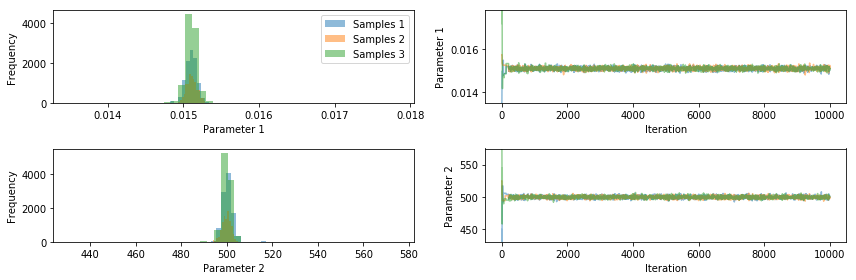

In [15]:
import pints.plot
pints.plot.trace(chains)
plt.show()

Based on this plot, it looks like the three chains become very similar after about 1000 iterations.
To be safe, we throw away the first 2000 samples and continue our analysis with the first chain.

In [16]:
chain = chains[0]
chain = chain[2000:]

We can also look for autocorrelation in the chains, using the [autocorrelation()](http://pints.readthedocs.io/en/latest/diagnostic_plots.html#pints.plot.autocorrelation) method. If everything went well, the samples in the chain should be relatively independent, so the autocorrelation should get quite low when the `lag` on the x-axis increases.

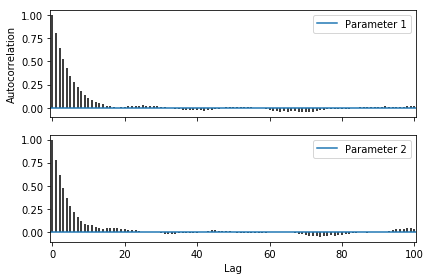

In [17]:
pints.plot.autocorrelation(chain)
plt.show()

Now we can inspect the inferred distribution by plotting histograms:

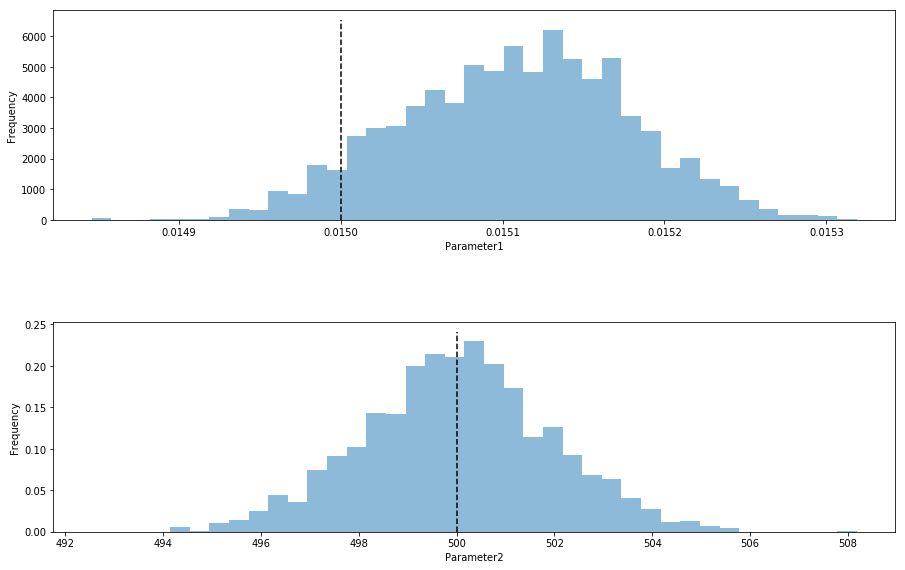

In [18]:
fig, axes = pints.plot.histogram([chain], ref_parameters=true_parameters)

# Show where the sample standard deviation of the generated noise is:
noise_sample_std = np.std(values - org_values)
#axes[-1].axvline(noise_sample_std, color='orange', label='Sample standard deviation of noise')
#axes[-1].legend()

fig.set_size_inches(14, 9)
plt.show()

Here we've analysed each parameter in isolation, but we can also look at correlations between parameters we found using the [pairwise()](http://pints.readthedocs.io/en/latest/diagnostic_plots.html#pints.plot.pairwise) plot.

To speed things up, we'll first apply some _thinning_ to the chain:

In [19]:
thinned_chain = chain[::10]

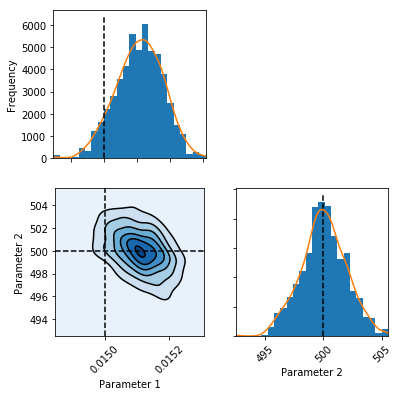

In [20]:
pints.plot.pairwise(thinned_chain, kde=True, ref_parameters=true_parameters)
plt.show()

Finally, we can look at the bit that really matters: The model predictions made from models with the parameters we found (a _posterior predictive check_). Thes can be plotted using the [series()](http://pints.readthedocs.io/en/latest/diagnostic_plots.html#pints.plot.series) method.

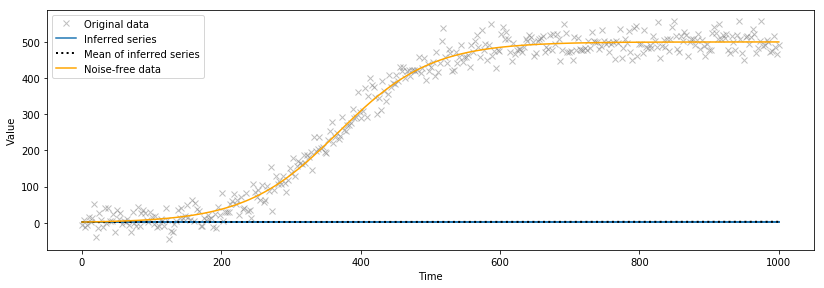

In [21]:
fig, axes = pints.plot.series(chain, problem)

# Customise the plot, and add the original, noise-free data
fig.set_size_inches(12,4.5)
plt.plot(times, org_values, c='orange', label='Noise-free data')
plt.legend()
plt.show()

-1852.9264461925839
[0.75374173 0.99992   ]
-47186.17640768367


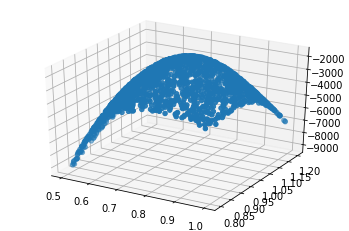

In [22]:
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D 

input_parameters = log_prior.sample(2000)
x = [p[0] for p in input_parameters]
y = [p[1] for p in input_parameters]
input_parameters[:5]

likelihoods = np.apply_along_axis(log_likelihood, 1, input_parameters)
likelihoods[:5]

print(max(likelihoods))
idx = list(likelihoods).index(max(likelihoods))
print(input_parameters[idx])
print(log_likelihood([0.015, 500]))

fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')
ax.scatter(x, y, list(likelihoods))
plt.show()

In [23]:
print(input_parameters[:5])

[[0.95653006 0.92631118]
 [0.52675835 1.15743152]
 [0.63525141 0.82582134]
 [0.84975055 1.01006498]
 [0.65010823 1.14195325]]


In [24]:
from sklearn.preprocessing import StandardScaler, MinMaxScaler
from sklearn.model_selection import train_test_split

X_train, X_valid, y_train, y_valid = train_test_split(input_parameters, likelihoods, test_size=0.3, random_state=0)
emu = pints.MultiLayerNN(problem, X_train, y_train, input_scaler=MinMaxScaler(), output_scaler=StandardScaler())
emu.set_parameters(layers=6, neurons=64, hidden_activation='relu', activation='linear', learning_rate=0.0001)
hist = emu.fit(epochs=500, batch_size=32, X_val=X_valid, y_val=y_valid, verbose=0)
emu.summary()

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_1 (Dense)              (None, 64)                192       
_________________________________________________________________
dense_2 (Dense)              (None, 128)               8320      
_________________________________________________________________
dense_3 (Dense)              (None, 256)               33024     
_________________________________________________________________
dense_4 (Dense)              (None, 128)               32896     
_________________________________________________________________
dense_5 (Dense)              (None, 64)                8256      
_________________________________________________________________
dense_6 (Dense)              (None, 1)                 65        
Total params: 82,753
Trainable params: 82,753
Non-trainable params: 0
_________________________________________________________________


In [25]:
emu([0.015, 500])

array([[-4867000.]], dtype=float32)

In [26]:
log_likelihood([0.015, 500])

-47186.17640768367

dict_keys(['val_loss', 'val_mean_absolute_error', 'loss', 'mean_absolute_error', 'rescaled_mae', 'rescaled_mse', 'val_rescaled_mae', 'val_rescaled_mse'])


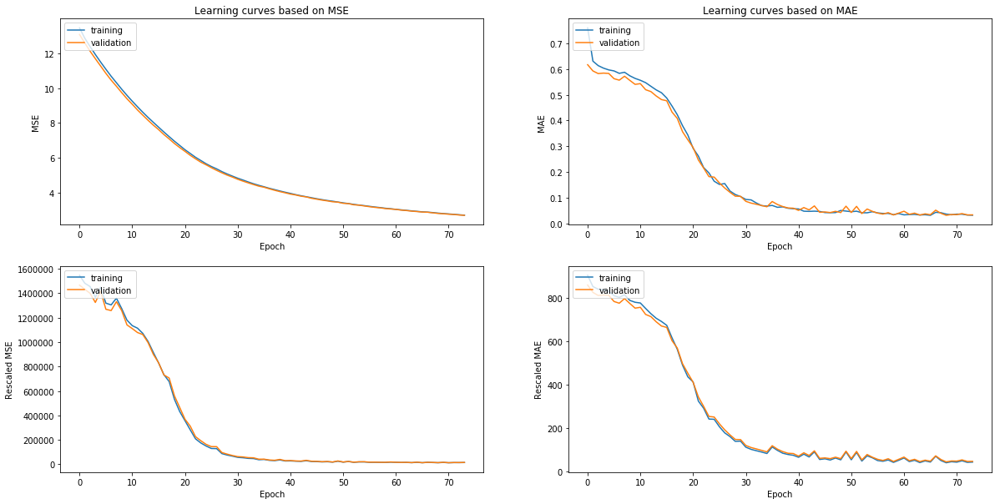

In [27]:
# summarize history for loss
print(hist.history.keys())
fig, ((ax1, ax2), (ax3, ax4)) = plt.subplots(2, 2, figsize=(20,10))                 
ax1.title.set_text('Learning curves based on MSE')
ax2.title.set_text('Learning curves based on MAE')

ax1.plot(hist.history['loss'])
ax1.plot(hist.history['val_loss'])
ax1.set_ylabel('MSE')
ax1.set_xlabel('Epoch')
ax1.legend(['training', 'validation'], loc='upper left')

ax2.plot(hist.history['mean_absolute_error'])
ax2.plot(hist.history['val_mean_absolute_error'])
ax2.set_ylabel('MAE')
ax2.set_xlabel('Epoch')
ax2.legend(['training', 'validation'], loc='upper left')

ax3.plot(hist.history['rescaled_mse'])
ax3.plot(hist.history['val_rescaled_mse'])
ax3.set_ylabel('Rescaled MSE')
ax3.set_xlabel('Epoch')
ax3.legend(['training', 'validation'], loc='upper left')

ax4.plot(hist.history['rescaled_mae'])
ax4.plot(hist.history['val_rescaled_mae'])
ax4.set_ylabel('Rescaled MAE')
ax4.set_xlabel('Epoch')
ax4.legend(['training', 'validation'], loc='upper left')

plt.show()

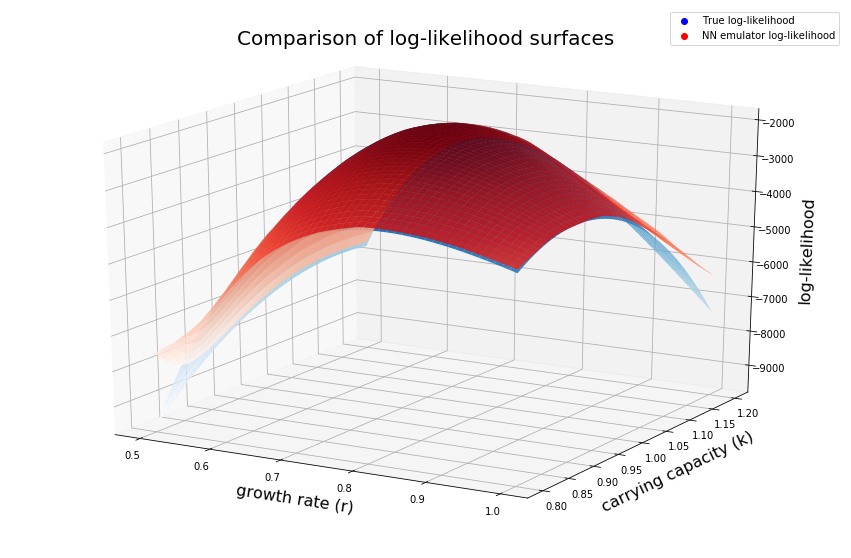

0.011491175466519997

In [28]:
import matplotlib.pyplot as plt
import matplotlib as mpl
from mpl_toolkits.mplot3d import Axes3D 

test_splits = 50 # number of splits along each axis
r_grid, k_grid, test_data = pints.generate_grid(bounds.lower(), bounds.upper(), test_splits)
model_prediction = pints.predict_grid(log_likelihood, test_data)
emu_prediction = pints.predict_grid(emu, test_data)

figsize=(20,10)
angle=(20, 300)
alpha=0.9
fontsize=16
labelpad=10

title = "Comparison of log-likelihood surfaces"
x_label = "growth rate (r)"
y_label = "carrying capacity (k)"
z_label = "log-likelihood"


fig = plt.figure(figsize=(15,10))
ax = plt.axes(projection='3d')
ax.plot_surface(r_grid, k_grid, model_prediction, cmap='Blues', edgecolor='none', alpha=alpha)
ax.plot_surface(r_grid, k_grid, emu_prediction, cmap='Reds', edgecolor='none', alpha=alpha)
#ax.view_init(60, 35)
ax.view_init(*angle)
#ax.set_title('surface')

plt.title(title, fontsize=fontsize*1.25)
ax.set_xlabel(x_label, fontsize=fontsize, labelpad=labelpad)
ax.set_ylabel(y_label, fontsize=fontsize, labelpad=labelpad)
ax.set_zlabel(z_label, fontsize=fontsize, labelpad=labelpad)

fake2Dline1 = mpl.lines.Line2D([0],[0], linestyle="none", c='blue', marker = 'o')
fake2Dline2 = mpl.lines.Line2D([0],[0], linestyle="none", c='red', marker = 'o')
ax.legend([fake2Dline1, fake2Dline2], ["True log-likelihood", "NN emulator log-likelihood"])

plt.show()
mape = np.mean(np.abs((model_prediction - emu_prediction) / model_prediction))
mape

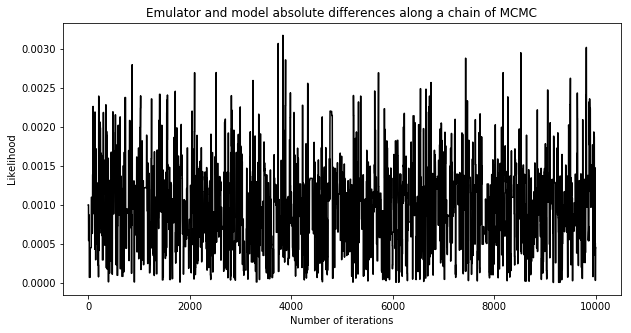

0.00044800678760380073

In [29]:
emu_prediction = np.apply_along_axis(emu, 1, chain_rescaled).flatten()
model_prediction = np.apply_along_axis(log_likelihood, 1, chain_rescaled).flatten()
diffs = (np.abs((model_prediction - emu_prediction) / model_prediction))

iters = np.linspace(0, 10000, len(chain_rescaled))
plt.figure(figsize=(10, 5))
plt.title("Emulator and model absolute differences along a chain of MCMC")
plt.xlabel("Number of iterations")
plt.ylabel("Likelihood")
plt.plot(iters, diffs, color = "Black")
plt.show()

diffs[-1]

In [30]:
print(emu_prediction)

[-1855.8956 -1855.8956 -1855.8956 ... -1853.7219 -1853.7219 -1853.7219]


In [31]:
log_posterior_emu = pints.LogPosterior(emu, log_prior)

In [32]:
chains_emu = pints.mcmc_sample(log_posterior_emu, 3, xs)

Using Haario-Bardenet adaptive covariance MCMC
Generating 3 chains.
Running in sequential mode.
[[0.00675 0.     ]
 [0.      0.009  ]]
[[0.007875 0.      ]
 [0.       0.0105  ]]
[[0.008625 0.      ]
 [0.       0.0115  ]]
Iter. Eval. Accept.   Accept.   Accept.   Time m:s
0     3      0         0         0          0:00.0
[[0.00675 0.     ]
 [0.      0.009  ]]


[[0.007875 0.      ]
 [0.       0.0105  ]]


[[0.008625 0.      ]
 [0.       0.0115  ]]


1     6      0         0         0.5        0:00.0
[[0.00675 0.     ]
 [0.      0.009  ]]


[[0.007875 0.      ]
 [0.       0.0105  ]]


[[0.008625 0.      ]
 [0.       0.0115  ]]


2     9      0         0.333     0.333      0:00.0
[[0.00675 0.     ]
 [0.      0.009  ]]


[[0.007875 0.      ]
 [0.       0.0105  ]]


[[0.008625 0.      ]
 [0.       0.0115  ]]


3     12     0         0.25      0.25       0:00.0
[[0.00675 0.     ]
 [0.      0.009  ]]


[[0.007875 0.      ]
 [0.       0.0105  ]]


[[0.008625 0.      ]
 [0.       0.0115  ]]




[[0.00675 0.     ]
 [0.      0.009  ]]


[[0.007875 0.      ]
 [0.       0.0105  ]]


[[0.008625 0.      ]
 [0.       0.0115  ]]


[[0.00675 0.     ]
 [0.      0.009  ]]


[[0.007875 0.      ]
 [0.       0.0105  ]]


[[0.008625 0.      ]
 [0.       0.0115  ]]


[[0.00675 0.     ]
 [0.      0.009  ]]


[[0.007875 0.      ]
 [0.       0.0105  ]]


[[0.008625 0.      ]
 [0.       0.0115  ]]


80    243    0.0988    0.0494    0.0617     0:00.4
[[0.00675 0.     ]
 [0.      0.009  ]]


[[0.007875 0.      ]
 [0.       0.0105  ]]


[[0.008625 0.      ]
 [0.       0.0115  ]]


[[0.00675 0.     ]
 [0.      0.009  ]]


[[0.007875 0.      ]
 [0.       0.0105  ]]


[[0.008625 0.      ]
 [0.       0.0115  ]]


[[0.00675 0.     ]
 [0.      0.009  ]]


[[0.007875 0.      ]
 [0.       0.0105  ]]


[[0.008625 0.      ]
 [0.       0.0115  ]]


[[0.00675 0.     ]
 [0.      0.009  ]]


[[0.007875 0.      ]
 [0.       0.0105  ]]


[[0.008625 0.      ]
 [0.       0.0115  ]]


[[0.00675 0.     ]
 [0.      0.0

[[0.00675 0.     ]
 [0.      0.009  ]]


[[0.007875 0.      ]
 [0.       0.0105  ]]


[[0.008625 0.      ]
 [0.       0.0115  ]]


[[0.00675 0.     ]
 [0.      0.009  ]]


[[0.007875 0.      ]
 [0.       0.0105  ]]


[[0.008625 0.      ]
 [0.       0.0115  ]]


[[0.00675 0.     ]
 [0.      0.009  ]]


[[0.007875 0.      ]
 [0.       0.0105  ]]


[[0.008625 0.      ]
 [0.       0.0115  ]]


[[0.00675 0.     ]
 [0.      0.009  ]]


[[0.007875 0.      ]
 [0.       0.0105  ]]


[[0.008625 0.      ]
 [0.       0.0115  ]]


[[0.00675 0.     ]
 [0.      0.009  ]]


[[0.007875 0.      ]
 [0.       0.0105  ]]


[[0.008625 0.      ]
 [0.       0.0115  ]]


[[0.00675 0.     ]
 [0.      0.009  ]]


[[0.007875 0.      ]
 [0.       0.0105  ]]


[[0.008625 0.      ]
 [0.       0.0115  ]]


[[0.00675 0.     ]
 [0.      0.009  ]]


[[0.007875 0.      ]
 [0.       0.0105  ]]


[[0.008625 0.      ]
 [0.       0.0115  ]]


[[0.00675 0.     ]
 [0.      0.009  ]]


[[0.007875 0.      ]
 [0.       0.0105  ]]

[[2.24466299e-06 1.71818366e-06]
 [1.71818366e-06 3.43370271e-06]]


[[1.24063907e-06 4.12929506e-07]
 [4.12929506e-07 2.38917022e-06]]


[[ 9.89480837e-06 -6.81848367e-06]
 [-6.81848367e-06  1.77740009e-05]]


[[2.02469153e-06 1.54937665e-06]
 [1.54937665e-06 3.10561194e-06]]


[[1.14996555e-06 3.54814249e-07]
 [3.54814249e-07 2.16508660e-06]]


[[ 9.60183038e-06 -5.61511242e-06]
 [-5.61511242e-06  1.64551363e-05]]


[[2.18517585e-06 1.27734731e-06]
 [1.27734731e-06 2.84676919e-06]]


[[1.10340932e-06 2.15640113e-07]
 [2.15640113e-07 2.12518226e-06]]


[[ 9.21766380e-06 -4.64039872e-06]
 [-4.64039872e-06  1.52031646e-05]]


[[1.98212642e-06 1.21060360e-06]
 [1.21060360e-06 3.09234048e-06]]


[[1.05021377e-06 1.10314395e-07]
 [1.10314395e-07 2.05904454e-06]]


[[ 1.00698307e-05 -6.78122554e-06]
 [-6.78122554e-06  1.76023640e-05]]


[[1.86206635e-06 1.32738854e-06]
 [1.32738854e-06 3.59475794e-06]]


[[9.56255113e-07 1.43134066e-07]
 [1.43134066e-07 2.21780761e-06]]


[[ 9.95743540e-06 

[[ 9.28918388e-06 -6.62460519e-06]
 [-6.62460519e-06  6.73848291e-06]]


[[1.01410011e-06 9.17241836e-07]
 [9.17241836e-07 3.46264827e-06]]


[[ 5.30876904e-06 -4.88368619e-06]
 [-4.88368619e-06  1.25255539e-05]]


[[ 9.40212677e-06 -6.81395994e-06]
 [-6.81395994e-06  6.83656846e-06]]


[[1.19248198e-06 8.02199996e-07]
 [8.02199996e-07 3.24988254e-06]]


[[ 5.11880095e-06 -4.61238206e-06]
 [-4.61238206e-06  1.17244327e-05]]


[[ 9.41785037e-06 -6.91273435e-06]
 [-6.91273435e-06  6.86097519e-06]]


[[1.39621059e-06 7.95081561e-07]
 [7.95081561e-07 3.04687577e-06]]


[[ 4.92297349e-06 -4.35454137e-06]
 [-4.35454137e-06  1.09784025e-05]]


[[ 9.48133792e-06 -7.18719943e-06]
 [-7.18719943e-06  7.19250523e-06]]


[[1.55086852e-06 7.82932496e-07]
 [7.82932496e-07 2.85729084e-06]]


[[ 4.64932829e-06 -4.01794034e-06]
 [-4.01794034e-06  1.03484368e-05]]


[[ 9.23104537e-06 -6.99877631e-06]
 [-6.99877631e-06  6.93926673e-06]]


[[1.76159385e-06 6.51686917e-07]
 [6.51686917e-07 2.69611696e-06]]


[[ 2.44912648e-06 -1.01223225e-06]
 [-1.01223225e-06  7.81797682e-06]]


[[ 2.62997721e-06 -9.62882756e-07]
 [-9.62882756e-07  2.76028506e-06]]


[[ 5.84007682e-06 -6.48963682e-06]
 [-6.48963682e-06  1.29066676e-05]]


[[ 2.32208285e-06 -9.33172668e-07]
 [-9.33172668e-07  7.87169150e-06]]


[[ 2.52342354e-06 -7.65617029e-07]
 [-7.65617029e-07  3.31682190e-06]]


[[ 5.61529887e-06 -6.82695947e-06]
 [-6.82695947e-06  1.79298444e-05]]


[[ 2.20208558e-06 -8.61218425e-07]
 [-8.61218425e-07  7.87537412e-06]]


[[ 2.55377345e-06 -8.07622571e-07]
 [-8.07622571e-07  3.18575300e-06]]


[[ 7.76025495e-06 -9.50329721e-06]
 [-9.50329721e-06  2.07681153e-05]]


[[ 2.08872068e-06 -7.95660833e-07]
 [-7.95660833e-07  7.83700138e-06]]


[[ 2.56618905e-06 -8.39052178e-07]
 [-8.39052178e-07  3.05787593e-06]]


[[ 9.54007084e-06 -1.17249741e-05]
 [-1.17249741e-05  2.30683702e-05]]


[[ 2.67807934e-06 -1.54184822e-06]
 [-1.54184822e-06  8.32001231e-06]]


[[ 2.56344059e-06 -8.61398839e-07]
 [-8.61398839e-0

[[ 4.85647963e-06 -2.29012920e-06]
 [-2.29012920e-06  3.25160387e-06]]


[[ 8.06265606e-06 -5.64453616e-06]
 [-5.64453616e-06  8.87286706e-06]]


[[ 3.50779203e-06 -1.01696576e-06]
 [-1.01696576e-06  8.90322983e-06]]


[[ 4.94458727e-06 -2.39622421e-06]
 [-2.39622421e-06  3.25089081e-06]]


[[ 9.98120473e-06 -5.70366936e-06]
 [-5.70366936e-06  8.52582789e-06]]


[[ 3.51371991e-06 -1.03242302e-06]
 [-1.03242302e-06  8.53614692e-06]]


[[ 5.00299210e-06 -2.47979683e-06]
 [-2.47979683e-06  3.23816739e-06]]


[[ 9.90510496e-06 -6.35443860e-06]
 [-6.35443860e-06  1.04062023e-05]]


[[ 3.50580761e-06 -1.04205523e-06]
 [-1.04205523e-06  8.18435016e-06]]


[[ 5.03542704e-06 -2.54351593e-06]
 [-2.54351593e-06  3.21509255e-06]]


[[ 1.05538776e-05 -7.95847999e-06]
 [-7.95847999e-06  1.32291638e-05]]


[[ 3.48593902e-06 -1.04660197e-06]
 [-1.04660197e-06  7.84724231e-06]]


[[ 5.04522228e-06 -2.58976828e-06]
 [-2.58976828e-06  3.18314085e-06]]


[[ 1.01521742e-05 -7.83733916e-06]
 [-7.83733916e-0

[[ 5.34784902e-06 -2.60480358e-06]
 [-2.60480358e-06  4.59754377e-06]]


[[ 7.71614648e-06 -2.30579136e-06]
 [-2.30579136e-06  4.33577640e-06]]


[[5.30127258e-06 2.28098551e-06]
 [2.28098551e-06 5.55054561e-06]]


[[ 5.15390364e-06 -2.53392942e-06]
 [-2.53392942e-06  4.49342075e-06]]


[[ 7.45975721e-06 -2.10767588e-06]
 [-2.10767588e-06  4.46415891e-06]]


[[5.09732427e-06 2.19260697e-06]
 [2.19260697e-06 5.34483223e-06]]


[[ 4.96702120e-06 -2.46375667e-06]
 [-2.46375667e-06  4.38810112e-06]]


[[ 7.21083696e-06 -1.92589725e-06]
 [-1.92589725e-06  4.56510952e-06]]


[[4.90173472e-06 2.10789758e-06]
 [2.10789758e-06 5.14696227e-06]]


[[ 4.78696243e-06 -2.39442522e-06]
 [-2.39442522e-06  4.28205979e-06]]


[[ 7.41882209e-06 -2.58475994e-06]
 [-2.58475994e-06  5.49917989e-06]]


[[4.71413965e-06 2.02669378e-06]
 [2.02669378e-06 4.95663936e-06]]


[[ 5.88097783e-06 -1.90923244e-06]
 [-1.90923244e-06  4.24001660e-06]]


[[ 7.58216672e-06 -3.16202539e-06]
 [-3.16202539e-06  6.31232284e-0

[[ 2.43843351e-05 -7.33250192e-06]
 [-7.33250192e-06  1.63408441e-05]]


[[ 8.14287433e-06 -3.80131957e-06]
 [-3.80131957e-06  7.13032403e-06]]


[[ 3.60650425e-06 -8.10333351e-07]
 [-8.10333351e-07  4.95224601e-06]]


[[ 2.38603315e-05 -7.41076279e-06]
 [-7.41076279e-06  1.61176694e-05]]


[[ 7.91954774e-06 -3.67624439e-06]
 [-3.67624439e-06  6.88374595e-06]]


[[ 3.52495358e-06 -8.23136848e-07]
 [-8.23136848e-07  4.81887470e-06]]


[[ 2.33337708e-05 -7.46356251e-06]
 [-7.46356251e-06  1.58793814e-05]]


[[ 7.70042874e-06 -3.55531336e-06]
 [-3.55531336e-06  6.64619437e-06]]


[[ 3.59362043e-06 -1.01756075e-06]
 [-1.01756075e-06  4.91267218e-06]]


[[ 2.28062781e-05 -7.49347081e-06]
 [-7.49347081e-06  1.56281983e-05]]


[[ 7.44530874e-06 -3.38175605e-06]
 [-3.38175605e-06  6.65434627e-06]]


[[ 3.75009065e-06 -1.04310106e-06]
 [-1.04310106e-06  4.75612119e-06]]


[[ 2.22793022e-05 -7.50283821e-06]
 [-7.50283821e-06  1.53661301e-05]]


[[ 7.19880723e-06 -3.21799133e-06]
 [-3.21799133e-0

[[ 1.17192359e-05 -2.21194279e-07]
 [-2.21194279e-07  6.13833387e-06]]


[[ 1.48159324e-05 -5.47754717e-06]
 [-5.47754717e-06  2.16917400e-05]]


[[ 5.58115930e-06 -2.45830668e-06]
 [-2.45830668e-06  4.07037660e-06]]


[[ 1.14238989e-05 -2.26046893e-07]
 [-2.26046893e-07  5.94713913e-06]]


[[ 1.43914531e-05 -5.48581923e-06]
 [-5.48581923e-06  2.17933721e-05]]


[[ 5.51151285e-06 -2.31591742e-06]
 [-2.31591742e-06  3.98228941e-06]]


[[ 1.11338656e-05 -2.30009362e-07]
 [-2.30009362e-07  5.76218897e-06]]


[[ 1.39785320e-05 -5.48267495e-06]
 [-5.48267495e-06  2.18432531e-05]]


[[ 5.70679078e-06 -2.24204098e-06]
 [-2.24204098e-06  3.85725483e-06]]


[[ 1.14326252e-05 -1.07427902e-06]
 [-1.07427902e-06  6.70098280e-06]]


[[ 1.35769255e-05 -5.46922138e-06]
 [-5.46922138e-06  2.18462663e-05]]


[[ 5.87290084e-06 -2.17068942e-06]
 [-2.17068942e-06  3.73637244e-06]]


520   1563   0.205     0.209     0.209      0:02.2
[[ 1.16816688e-05 -1.83822465e-06]
 [-1.83822465e-06  7.53985171e-06]]




[[ 5.47782140e-06 -1.05855593e-06]
 [-1.05855593e-06  3.50295814e-06]]


[[ 5.24530968e-06 -5.54153795e-06]
 [-5.54153795e-06  2.23385253e-05]]


[[ 6.36471125e-06 -1.96174448e-06]
 [-1.96174448e-06  4.87797509e-06]]


[[ 6.15271258e-06 -1.77223226e-06]
 [-1.77223226e-06  4.06699463e-06]]


[[ 5.10464035e-06 -5.43401152e-06]
 [-5.43401152e-06  2.19534555e-05]]


[[ 6.27520633e-06 -1.93118570e-06]
 [-1.93118570e-06  4.74455159e-06]]


[[ 6.75991796e-06 -2.42206205e-06]
 [-2.42206205e-06  4.57621837e-06]]


[[ 4.96765110e-06 -5.32679678e-06]
 [-5.32679678e-06  2.15654311e-05]]


[[ 6.18310055e-06 -1.90008392e-06]
 [-1.90008392e-06  4.61477723e-06]]


[[ 7.30434491e-06 -3.01253822e-06]
 [-3.01253822e-06  5.03457248e-06]]


[[ 4.83425871e-06 -5.22005552e-06]
 [-5.22005552e-06  2.11753983e-05]]


[[ 6.08878634e-06 -1.86854201e-06]
 [-1.86854201e-06  4.48855878e-06]]


[[ 7.10019406e-06 -2.95283473e-06]
 [-2.95283473e-06  5.02271631e-06]]


[[ 4.70438073e-06 -5.11393384e-06]
 [-5.11393384e-0

[[ 5.58468722e-06 -1.45597442e-07]
 [-1.45597442e-07  5.31470643e-06]]


[[ 8.82986717e-06 -8.04316793e-06]
 [-8.04316793e-06  1.91077478e-05]]


[[ 5.53811324e-06 -1.02541687e-06]
 [-1.02541687e-06  3.33011187e-06]]


[[ 5.51076452e-06 -2.10203571e-07]
 [-2.10203571e-07  5.23250040e-06]]


[[ 8.59209308e-06 -7.80793304e-06]
 [-7.80793304e-06  1.93037744e-05]]


[[ 5.55371957e-06 -1.12922297e-06]
 [-1.12922297e-06  3.34500009e-06]]


[[ 5.43486646e-06 -2.69337304e-07]
 [-2.69337304e-07  5.14938058e-06]]


[[ 8.36104593e-06 -7.58034490e-06]
 [-7.58034490e-06  1.94564636e-05]]


[[ 5.68148428e-06 -1.30489217e-06]
 [-1.30489217e-06  3.40799831e-06]]


[[ 5.35727359e-06 -3.23359846e-07]
 [-3.23359846e-07  5.06555087e-06]]


[[ 8.13652627e-06 -7.36012266e-06]
 [-7.36012266e-06  1.95691633e-05]]


[[ 5.79092323e-06 -1.46465667e-06]
 [-1.46465667e-06  3.46109424e-06]]


[[ 5.27824532e-06 -3.72610058e-07]
 [-3.72610058e-07  4.98119896e-06]]


[[ 7.91834080e-06 -7.14699718e-06]
 [-7.14699718e-0

[[ 6.64101269e-06 -3.75988013e-07]
 [-3.75988013e-07  5.03460000e-06]]


[[ 8.23341905e-06 -4.14364805e-06]
 [-4.14364805e-06  1.93599253e-05]]


[[ 1.49395876e-05 -1.21223472e-05]
 [-1.21223472e-05  1.38948993e-05]]


[[ 6.47702379e-06 -3.88370762e-07]
 [-3.88370762e-07  5.01108255e-06]]


[[ 8.04410660e-06 -4.09479043e-06]
 [-4.09479043e-06  1.90294333e-05]]


[[ 1.47020929e-05 -1.19087512e-05]
 [-1.19087512e-05  1.36046747e-05]]


[[ 6.40303541e-06 -4.60385761e-07]
 [-4.60385761e-07  4.95829897e-06]]


[[ 7.85885697e-06 -4.04441877e-06]
 [-4.04441877e-06  1.86997042e-05]]


[[ 1.44638425e-05 -1.16961432e-05]
 [-1.16961432e-05  1.33190631e-05]]


[[ 6.24455022e-06 -4.79500858e-07]
 [-4.79500858e-07  5.09247087e-06]]


[[ 7.67760693e-06 -3.99271962e-06]
 [-3.99271962e-06  1.83711290e-05]]


[[ 1.41567945e-05 -1.13478114e-05]
 [-1.13478114e-05  1.30277998e-05]]


[[ 6.09009822e-06 -4.96572921e-07]
 [-4.96572921e-07  5.21012185e-06]]


[[ 7.50029243e-06 -3.93986651e-06]
 [-3.93986651e-0

[[ 4.37153398e-06 -1.02140410e-06]
 [-1.02140410e-06  4.38868540e-06]]


[[ 5.71492428e-06 -2.71515591e-06]
 [-2.71515591e-06  1.47738329e-05]]


[[ 8.01519777e-06 -5.13945746e-06]
 [-5.13945746e-06  6.94263306e-06]]


700   2103   0.215     0.205     0.223      0:03.0
[[ 4.27008190e-06 -1.04683420e-06]
 [-1.04683420e-06  5.03560894e-06]]


[[ 5.61675648e-06 -2.78394959e-06]
 [-2.78394959e-06  1.48817251e-05]]


[[ 7.97930210e-06 -5.11878749e-06]
 [-5.11878749e-06  6.84351548e-06]]


[[ 4.17102283e-06 -1.06926741e-06]
 [-1.06926741e-06  5.63074373e-06]]


[[ 5.67494975e-06 -2.79422331e-06]
 [-2.79422331e-06  1.45562170e-05]]


[[ 7.79480567e-06 -5.02916032e-06]
 [-5.02916032e-06  6.84622636e-06]]


[[ 4.10743195e-06 -1.15890737e-06]
 [-1.15890737e-06  5.86346731e-06]]


[[ 5.72259222e-06 -2.80060987e-06]
 [-2.80060987e-06  1.42374298e-05]]


[[ 7.61463318e-06 -4.94023029e-06]
 [-4.94023029e-06  6.84101145e-06]]


[[ 4.00983921e-06 -1.13680548e-06]
 [-1.13680548e-06  5.78673137e-06]]




[[ 6.42900257e-06 -1.30640941e-06]
 [-1.30640941e-06  5.50201204e-06]]


[[ 4.38238309e-06 -1.02095019e-06]
 [-1.02095019e-06  8.79158374e-06]]


[[ 3.85182682e-06 -8.90012437e-07]
 [-8.90012437e-07  4.43450601e-06]]


[[ 6.32050851e-06 -1.31647191e-06]
 [-1.31647191e-06  5.41863289e-06]]


[[ 4.39536044e-06 -9.76275918e-07]
 [-9.76275918e-07  8.59554702e-06]]


[[ 3.81666617e-06 -8.75734577e-07]
 [-8.75734577e-07  4.33424951e-06]]


[[ 6.21290072e-06 -1.32450733e-06]
 [-1.32450733e-06  5.33536116e-06]]


[[ 4.40296614e-06 -9.33628956e-07]
 [-9.33628956e-07  8.40399924e-06]]


[[ 3.77998520e-06 -8.61528421e-07]
 [-8.61528421e-07  4.23635177e-06]]


[[ 6.16365124e-06 -1.20435121e-06]
 [-1.20435121e-06  5.30250811e-06]]


[[ 4.37353495e-06 -9.07658449e-07]
 [-9.07658449e-07  8.21344894e-06]]


[[ 3.74193006e-06 -8.47404510e-07]
 [-8.47404510e-07  4.14075536e-06]]


[[ 6.42391565e-06 -1.60490090e-06]
 [-1.60490090e-06  5.63978179e-06]]


[[ 4.34164131e-06 -8.82519047e-07]
 [-8.82519047e-0

[[ 7.14015886e-06 -1.54091034e-06]
 [-1.54091034e-06  9.88519144e-06]]


[[ 3.97044426e-06 -9.76343216e-07]
 [-9.76343216e-07  6.23595930e-06]]


[[ 3.27386612e-06 -1.89002939e-06]
 [-1.89002939e-06  5.21917863e-06]]


[[ 6.98581190e-06 -1.50732253e-06]
 [-1.50732253e-06  9.67158408e-06]]


[[ 3.88634530e-06 -9.99084277e-07]
 [-9.99084277e-07  7.15392855e-06]]


[[ 3.21457746e-06 -1.91268442e-06]
 [-1.91268442e-06  5.45558463e-06]]


[[ 7.94130362e-06 -1.30421196e-06]
 [-1.30421196e-06  9.48876472e-06]]


[[ 3.80407113e-06 -1.01943622e-06]
 [-1.01943622e-06  8.00613638e-06]]


[[ 3.33630758e-06 -1.70285953e-06]
 [-1.70285953e-06  5.48606094e-06]]


[[ 8.82796402e-06 -1.11297145e-06]
 [-1.11297145e-06  9.30895596e-06]]


[[ 3.72358203e-06 -1.03753734e-06]
 [-1.03753734e-06  8.79610118e-06]]


[[ 3.44712325e-06 -1.50496897e-06]
 [-1.50496897e-06  5.50951258e-06]]


[[ 9.64947815e-06 -9.33003280e-07]
 [-9.33003280e-07  9.13213562e-06]]


[[ 3.64483910e-06 -1.05351889e-06]
 [-1.05351889e-0

[[ 9.17116319e-06 -2.29588286e-06]
 [-2.29588286e-06  5.52675481e-06]]


[[ 1.07452064e-05 -4.47404733e-07]
 [-4.47404733e-07  1.11293165e-05]]


[[ 9.72937146e-06 -2.40584971e-06]
 [-2.40584971e-06  4.57140213e-06]]


[[ 9.27143734e-06 -2.39514612e-06]
 [-2.39514612e-06  5.48685713e-06]]


[[ 1.12257239e-05 -1.65539843e-07]
 [-1.65539843e-07  1.10052154e-05]]


[[ 9.55144178e-06 -2.33803525e-06]
 [-2.33803525e-06  4.49120596e-06]]


[[ 9.35772427e-06 -2.48628154e-06]
 [-2.48628154e-06  5.44478892e-06]]


[[1.16672068e-05 9.91189172e-08]
 [9.91189172e-08 1.08794732e-05]]


[[ 9.37640921e-06 -2.27242289e-06]
 [-2.27242289e-06  4.41215859e-06]]


[[ 9.43083148e-06 -2.56972151e-06]
 [-2.56972151e-06  5.40072534e-06]]


[[1.20717282e-05 3.47422409e-07]
 [3.47422409e-07 1.07523068e-05]]


[[ 9.20424776e-06 -2.20893229e-06]
 [-2.20893229e-06  4.33425838e-06]]


[[ 9.49152656e-06 -2.64587766e-06]
 [-2.64587766e-06  5.35483206e-06]]


[[1.24412618e-05 5.80181808e-07]
 [5.80181808e-07 1.0623920

 [-3.94174854e-06  4.77889454e-06]]


[[ 7.65453192e-06 -7.46306295e-07]
 [-7.46306295e-07  5.30104995e-06]]


[[ 6.55650405e-06 -3.37460432e-07]
 [-3.37460432e-07  5.45332557e-06]]


[[ 8.15773766e-06 -3.88134805e-06]
 [-3.88134805e-06  4.78621678e-06]]


[[ 7.57782443e-06 -8.47421645e-07]
 [-8.47421645e-07  5.37586547e-06]]


[[ 6.67210749e-06 -3.54630053e-07]
 [-3.54630053e-07  5.34775514e-06]]


[[ 7.99939888e-06 -3.82150622e-06]
 [-3.82150622e-06  4.78940400e-06]]


[[ 7.49977715e-06 -9.41918618e-07]
 [-9.41918618e-07  5.44210972e-06]]


[[ 6.77573148e-06 -3.70512806e-07]
 [-3.70512806e-07  5.24427241e-06]]


[[ 7.84421051e-06 -3.76223849e-06]
 [-3.76223849e-06  4.78870412e-06]]


[[ 7.42053552e-06 -1.03012041e-06]
 [-1.03012041e-06  5.50024746e-06]]


[[ 6.86801653e-06 -3.85173584e-07]
 [-3.85173584e-07  5.14283610e-06]]


[[ 7.69210942e-06 -3.70355881e-06]
 [-3.70355881e-06  4.78435302e-06]]


[[ 7.34023698e-06 -1.11233562e-06]
 [-1.11233562e-06  5.55072168e-06]]


[[ 6.94957319

[[ 4.15994814e-06 -9.36925956e-07]
 [-9.36925956e-07  3.66244862e-06]]


[[ 5.48234145e-06 -1.45374626e-06]
 [-1.45374626e-06  4.26541529e-06]]


[[ 5.44083885e-06 -2.79112556e-06]
 [-2.79112556e-06  6.85314180e-06]]


940   2823   0.209     0.213     0.218916   0:03.9
[[ 4.09596235e-06 -9.49043607e-07]
 [-9.49043607e-07  3.65304789e-06]]


[[ 5.39554221e-06 -1.45311428e-06]
 [-1.45311428e-06  4.22689004e-06]]


[[ 5.34397654e-06 -2.75789666e-06]
 [-2.75789666e-06  6.78494005e-06]]


[[ 4.03268259e-06 -9.59801706e-07]
 [-9.59801706e-07  3.64158224e-06]]


[[ 5.30981504e-06 -1.45148523e-06]
 [-1.45148523e-06  4.18753845e-06]]


[[ 5.24879183e-06 -2.72458608e-06]
 [-2.72458608e-06  6.71577151e-06]]


[[ 3.97473482e-06 -9.34392877e-07]
 [-9.34392877e-07  3.57551777e-06]]


[[ 5.22516243e-06 -1.44891823e-06]
 [-1.44891823e-06  4.14743822e-06]]


[[ 5.15525921e-06 -2.69122373e-06]
 [-2.69122373e-06  6.64574454e-06]]


[[ 3.91724174e-06 -9.09756172e-07]
 [-9.09756172e-07  3.51064894e-06]]




[[ 1.11145018e-05 -5.11624559e-06]
 [-5.11624559e-06  8.31495700e-06]]


[[ 5.59884843e-06 -2.83529660e-06]
 [-2.83529660e-06  8.04761871e-06]]


[[ 7.43699855e-06 -4.43664844e-06]
 [-4.43664844e-06  5.73141222e-06]]


[[ 1.15519502e-05 -5.29120825e-06]
 [-5.29120825e-06  8.27587097e-06]]


[[ 5.50142824e-06 -2.80251174e-06]
 [-2.80251174e-06  7.97896451e-06]]


[[ 7.54575011e-06 -4.47037114e-06]
 [-4.47037114e-06  5.68073052e-06]]


[[ 1.19580407e-05 -5.45318852e-06]
 [-5.45318852e-06  8.23347546e-06]]


[[ 5.40295539e-06 -2.73939644e-06]
 [-2.73939644e-06  7.92193108e-06]]


[[ 7.43339806e-06 -4.38136788e-06]
 [-4.38136788e-06  5.57966548e-06]]


[[ 1.23342393e-05 -5.60279753e-06]
 [-5.60279753e-06  8.18798458e-06]]


[[ 5.30628803e-06 -2.67791272e-06]
 [-2.67791272e-06  7.86280142e-06]]


[[ 7.32227410e-06 -4.29432559e-06]
 [-4.29432559e-06  5.48043085e-06]]


[[ 1.26819499e-05 -5.74062060e-06]
 [-5.74062060e-06  8.13960244e-06]]


[[ 5.21139280e-06 -2.61801242e-06]
 [-2.61801242e-0

[[ 1.86854704e-05 -1.15474242e-05]
 [-1.15474242e-05  1.49154370e-05]]


[[ 4.43283941e-06 -2.42034505e-06]
 [-2.42034505e-06  6.21837750e-06]]


[[ 4.19622315e-06 -3.01747184e-06]
 [-3.01747184e-06  5.00967415e-06]]


[[ 1.85809393e-05 -1.16336462e-05]
 [-1.16336462e-05  1.50278874e-05]]


[[ 5.15868343e-06 -3.50461210e-06]
 [-3.50461210e-06  7.68932794e-06]]


[[ 4.13864988e-06 -2.97985909e-06]
 [-2.97985909e-06  4.93652953e-06]]


[[ 1.83158338e-05 -1.15409163e-05]
 [-1.15409163e-05  1.49696277e-05]]


[[ 5.84346318e-06 -4.53008726e-06]
 [-4.53008726e-06  9.07873821e-06]]


[[ 4.17509653e-06 -2.99499883e-06]
 [-2.99499883e-06  4.89173475e-06]]


[[ 1.80534726e-05 -1.14460346e-05]
 [-1.14460346e-05  1.49053378e-05]]


[[ 5.74501703e-06 -4.51116246e-06]
 [-4.51116246e-06  9.89570483e-06]]


[[ 4.20710934e-06 -3.00753272e-06]
 [-3.00753272e-06  4.84631459e-06]]


[[ 1.80890085e-05 -1.13522978e-05]
 [-1.13522978e-05  1.46770741e-05]]


[[ 5.64823155e-06 -4.49049504e-06]
 [-4.49049504e-0


[[ 5.08891191e-06 -2.88609214e-06]
 [-2.88609214e-06  1.08352314e-05]]


[[ 9.47179071e-06 -4.33209670e-06]
 [-4.33209670e-06  5.75994564e-06]]


[[ 1.12318818e-05 -6.19170138e-06]
 [-6.19170138e-06  9.43040043e-06]]


[[ 5.01980550e-06 -2.85352874e-06]
 [-2.85352874e-06  1.06677260e-05]]


[[ 9.34290362e-06 -4.27331842e-06]
 [-4.27331842e-06  5.66930419e-06]]


[[ 1.16702388e-05 -6.72044798e-06]
 [-6.72044798e-06  9.90980739e-06]]


[[ 4.95134752e-06 -2.82099493e-06]
 [-2.82099493e-06  1.05026400e-05]]


[[ 9.21523681e-06 -4.21508955e-06]
 [-4.21508955e-06  5.58003034e-06]]


[[ 1.20799099e-05 -7.21874639e-06]
 [-7.21874639e-06  1.03594529e-05]]


[[ 4.88354540e-06 -2.78850865e-06]
 [-2.78850865e-06  1.03399471e-05]]


[[ 9.08880352e-06 -4.15741652e-06]
 [-4.15741652e-06  5.49210677e-06]]


1100  3303   0.21      0.221     0.22       0:04.5
[[ 1.24621326e-05 -7.68787218e-06]
 [-7.68787218e-06  1.07806062e-05]]


[[ 4.81640573e-06 -2.75608686e-06]
 [-2.75608686e-06  1.01796208e-05]]





[[ 7.90257289e-06 -4.49193124e-06]
 [-4.49193124e-06  1.72306977e-05]]


[[ 9.89414390e-06 -6.83051000e-06]
 [-6.83051000e-06  1.31363862e-05]]


[[ 8.68157794e-06 -1.64368130e-06]
 [-1.64368130e-06  1.01483062e-05]]


[[ 7.93586497e-06 -4.35094717e-06]
 [-4.35094717e-06  1.69776366e-05]]


[[ 9.98574442e-06 -7.09464825e-06]
 [-7.09464825e-06  1.34795827e-05]]


[[ 9.32925079e-06 -2.05457416e-06]
 [-2.05457416e-06  1.02254839e-05]]


[[ 7.96334444e-06 -4.21453994e-06]
 [-4.21453994e-06  1.67279510e-05]]


[[ 1.01759564e-05 -7.11368086e-06]
 [-7.11368086e-06  1.33112196e-05]]


[[ 9.50256461e-06 -2.40700903e-06]
 [-2.40700903e-06  1.05164844e-05]]


[[ 7.98528629e-06 -4.08255704e-06]
 [-4.08255704e-06  1.64816115e-05]]


[[ 1.03515475e-05 -7.12804068e-06]
 [-7.12804068e-06  1.31440453e-05]]


[[ 9.48693792e-06 -2.40276093e-06]
 [-2.40276093e-06  1.03539254e-05]]


[[ 8.00195470e-06 -3.95485116e-06]
 [-3.95485116e-06  1.62385883e-05]]


[[ 1.05131494e-05 -7.13795282e-06]
 [-7.13795282e

[[ 1.92694912e-05 -6.70252656e-06]
 [-6.70252656e-06  1.10413102e-05]]


[[ 5.74264855e-06 -3.53832064e-06]
 [-3.53832064e-06  1.04105804e-05]]


[[ 7.34311914e-06 -5.05436419e-06]
 [-5.05436419e-06  1.20972307e-05]]


[[ 1.91495531e-05 -6.70417901e-06]
 [-6.70417901e-06  1.09296240e-05]]


[[ 5.66692767e-06 -3.51858448e-06]
 [-3.51858448e-06  1.03334425e-05]]


[[ 7.42053581e-06 -5.13043223e-06]
 [-5.13043223e-06  1.20318530e-05]]


[[ 1.90258091e-05 -6.70243990e-06]
 [-6.70243990e-06  1.08178054e-05]]


[[ 5.59197854e-06 -3.49804043e-06]
 [-3.49804043e-06  1.02548368e-05]]


[[ 7.49063215e-06 -5.20037545e-06]
 [-5.20037545e-06  1.19636131e-05]]


[[ 1.88985077e-05 -6.69747399e-06]
 [-6.69747399e-06  1.07059190e-05]]


[[ 5.51780297e-06 -3.47673823e-06]
 [-3.47673823e-06  1.01748751e-05]]


[[ 7.70919675e-06 -5.30489790e-06]
 [-5.30489790e-06  1.18782603e-05]]


[[ 1.87678869e-05 -6.68943966e-06]
 [-6.68943966e-06  1.05940265e-05]]


[[ 5.44440228e-06 -3.45472559e-06]
 [-3.45472559e-0

[[ 1.55494996e-05 -8.09011607e-06]
 [-8.09011607e-06  1.05946536e-05]]


[[ 7.45889598e-06 -6.98585179e-06]
 [-6.98585179e-06  1.71849810e-05]]


[[ 6.68218405e-06 -3.50031793e-06]
 [-3.50031793e-06  6.47233351e-06]]


1260  3783   0.214     0.221253  0.22       0:05.0
[[ 1.55458931e-05 -7.99301551e-06]
 [-7.99301551e-06  1.04357086e-05]]


[[ 7.36452036e-06 -6.86836104e-06]
 [-6.86836104e-06  1.69280961e-05]]


[[ 6.59107187e-06 -3.45321991e-06]
 [-3.45321991e-06  6.37711430e-06]]


[[ 1.55352489e-05 -7.89664796e-06]
 [-7.89664796e-06  1.02791902e-05]]


[[ 7.27104444e-06 -6.75305589e-06]
 [-6.75305589e-06  1.66751045e-05]]


[[ 6.50106863e-06 -3.40667375e-06]
 [-3.40667375e-06  6.28329079e-06]]


[[ 1.53939225e-05 -7.69495620e-06]
 [-7.69495620e-06  1.01908351e-05]]


[[ 7.22757764e-06 -6.65497277e-06]
 [-6.65497277e-06  1.64208533e-05]]


[[ 6.41216644e-06 -3.36067638e-06]
 [-3.36067638e-06  6.19084356e-06]]


[[ 1.52519295e-05 -7.49891159e-06]
 [-7.49891159e-06  1.01018012e-05]]




 [-3.93059157e-06  5.70318777e-06]]


[[ 9.89542563e-06 -9.27375017e-06]
 [-9.27375017e-06  1.49398600e-05]]


[[ 8.26483795e-06 -4.94289163e-06]
 [-4.94289163e-06  7.21065813e-06]]


[[ 7.61512756e-06 -3.87969027e-06]
 [-3.87969027e-06  5.61986016e-06]]


[[ 1.00641318e-05 -9.35161436e-06]
 [-9.35161436e-06  1.48652022e-05]]


[[ 8.28481736e-06 -4.85859700e-06]
 [-4.85859700e-06  7.10437223e-06]]


[[ 7.55670317e-06 -3.86199547e-06]
 [-3.86199547e-06  5.56557048e-06]]


[[ 9.92364206e-06 -9.18971006e-06]
 [-9.18971006e-06  1.47040511e-05]]


[[ 8.30028426e-06 -4.77591941e-06]
 [-4.77591941e-06  6.99969717e-06]]


[[ 7.45701088e-06 -3.77628340e-06]
 [-3.77628340e-06  5.54783513e-06]]


[[ 9.84385638e-06 -9.02501060e-06]
 [-9.02501060e-06  1.44977584e-05]]


[[ 8.23749148e-06 -4.72918133e-06]
 [-4.72918133e-06  6.90547456e-06]]


[[ 7.45571018e-06 -3.68481142e-06]
 [-3.68481142e-06  5.47706455e-06]]


[[ 9.76331148e-06 -8.86367603e-06]
 [-8.86367603e-06  1.42942858e-05]]


[[ 8.17388713

 [-1.30011545e-06  6.43317448e-06]]


[[ 1.07498734e-05 -8.40576506e-06]
 [-8.40576506e-06  1.48443284e-05]]


[[ 8.31235134e-06 -4.76774176e-06]
 [-4.76774176e-06  6.10306902e-06]]


[[ 8.69409473e-06 -1.23600597e-06]
 [-1.23600597e-06  6.34654445e-06]]


[[ 1.05971308e-05 -8.29220270e-06]
 [-8.29220270e-06  1.46541370e-05]]


[[ 8.37572784e-06 -4.80049529e-06]
 [-4.80049529e-06  6.07120136e-06]]


[[ 8.88488738e-06 -1.17415395e-06]
 [-1.17415395e-06  6.26102907e-06]]


[[ 1.04465990e-05 -8.18011289e-06]
 [-8.18011289e-06  1.44660945e-05]]


[[ 8.43289972e-06 -4.82984690e-06]
 [-4.82984690e-06  6.03819697e-06]]


[[ 9.06376910e-06 -1.11448661e-06]
 [-1.11448661e-06  6.17661639e-06]]


[[ 1.02982459e-05 -8.06947942e-06]
 [-8.06947942e-06  1.42801878e-05]]


[[ 8.31125411e-06 -4.75784046e-06]
 [-4.75784046e-06  6.04990542e-06]]


[[ 9.23118787e-06 -1.05693347e-06]
 [-1.05693347e-06  6.09329444e-06]]


[[ 1.01520398e-05 -7.96028615e-06]
 [-7.96028615e-06  1.40964036e-05]]


[[ 8.19142397


[[ 1.43392946e-05 -4.98152207e-06]
 [-4.98152207e-06  1.39788198e-05]]


[[ 9.82709256e-06 -5.44661640e-06]
 [-5.44661640e-06  1.18606939e-05]]


[[ 1.20286718e-05 -2.36301758e-06]
 [-2.36301758e-06  9.50712826e-06]]


[[ 1.42451044e-05 -4.36462630e-06]
 [-4.36462630e-06  1.65573828e-05]]


[[ 9.78338052e-06 -5.74222568e-06]
 [-5.74222568e-06  1.31588474e-05]]


[[ 1.21050078e-05 -2.25310058e-06]
 [-2.25310058e-06  9.39725813e-06]]


[[ 1.41492772e-05 -3.77198956e-06]
 [-3.77198956e-06  1.90208572e-05]]


[[ 9.73766383e-06 -6.02313736e-06]
 [-6.02313736e-06  1.43971953e-05]]


[[ 1.21733745e-05 -2.14692427e-06]
 [-2.14692427e-06  9.28831946e-06]]


[[ 1.40519231e-05 -3.20281272e-06]
 [-3.20281272e-06  2.13731779e-05]]


[[ 9.69004763e-06 -6.28986775e-06]
 [-6.28986775e-06  1.55777990e-05]]


[[ 1.22340864e-05 -2.04437158e-06]
 [-2.04437158e-06  9.18031717e-06]]


[[ 1.39531482e-05 -2.65632163e-06]
 [-2.65632163e-06  2.36181555e-05]]


1420  4263   0.212     0.221     0.225      0:05.6

[[ 1.63882427e-05 -7.18304261e-06]
 [-7.18304261e-06  2.44530168e-05]]


[[ 8.78997360e-06 -2.37468853e-06]
 [-2.37468853e-06  8.21354777e-06]]


[[1.21532888e-05 8.82751011e-07]
 [8.82751011e-07 1.54388384e-05]]


[[ 1.61862731e-05 -6.99815471e-06]
 [-6.99815471e-06  2.44299988e-05]]


[[ 8.85996076e-06 -2.32282996e-06]
 [-2.32282996e-06  8.10242119e-06]]


[[1.20469606e-05 9.60834872e-07]
 [9.60834872e-07 1.53599257e-05]]


[[ 1.59865334e-05 -6.81824750e-06]
 [-6.81824750e-06  2.43987444e-05]]


[[ 8.92373590e-06 -2.27223308e-06]
 [-2.27223308e-06  7.99282354e-06]]


[[1.18841900e-05 9.67922040e-07]
 [9.67922040e-07 1.52876492e-05]]


[[ 1.57890085e-05 -6.64318250e-06]
 [-6.64318250e-06  2.43596124e-05]]


[[ 8.98153519e-06 -2.22286481e-06]
 [-2.22286481e-06  7.88473378e-06]]


[[1.17236538e-05 9.74354046e-07]
 [9.74354046e-07 1.52126050e-05]]


[[ 1.55936833e-05 -6.47282517e-06]
 [-6.47282517e-06  2.43129495e-05]]


[[ 9.03358711e-06 -2.17469297e-06]
 [-2.17469297e-06  7.77813117e-0

[[ 9.06935295e-06 -2.82121897e-06]
 [-2.82121897e-06  1.65044180e-05]]


[[ 1.02792868e-05 -1.83395078e-06]
 [-1.83395078e-06  9.17516781e-06]]


[[ 8.61237952e-06 -3.33837007e-06]
 [-3.33837007e-06  2.17030165e-05]]


[[ 8.97173035e-06 -2.78033983e-06]
 [-2.78033983e-06  1.62829348e-05]]


[[ 1.04260284e-05 -2.02996182e-06]
 [-2.02996182e-06  9.22274214e-06]]


[[ 8.58158239e-06 -3.42260894e-06]
 [-3.42260894e-06  2.16074900e-05]]


[[ 8.87481600e-06 -2.74010746e-06]
 [-2.74010746e-06  1.60645186e-05]]


[[ 1.05631308e-05 -2.21736326e-06]
 [-2.21736326e-06  9.26509629e-06]]


[[ 8.54894634e-06 -3.50223320e-06]
 [-3.50223320e-06  2.15080564e-05]]


[[ 8.77861732e-06 -2.70051042e-06]
 [-2.70051042e-06  1.58491257e-05]]


[[ 1.06909384e-05 -2.39643821e-06]
 [-2.39643821e-06  9.30242876e-06]]


[[ 8.51455921e-06 -3.57740246e-06]
 [-3.57740246e-06  2.14049136e-05]]


[[ 8.68314109e-06 -2.66153753e-06]
 [-2.66153753e-06  1.56367129e-05]]


[[ 1.08097847e-05 -2.56746122e-06]
 [-2.56746122e-0

[[ 8.22814505e-06 -4.22622589e-06]
 [-4.22622589e-06  2.00840029e-05]]


[[ 5.81632658e-06 -1.69517468e-06]
 [-1.69517468e-06  1.17339858e-05]]


[[ 1.35303194e-05 -7.34122937e-06]
 [-7.34122937e-06  1.48181253e-05]]


[[ 8.16924032e-06 -4.22673795e-06]
 [-4.22673795e-06  1.98839597e-05]]


[[ 5.80452775e-06 -1.74976296e-06]
 [-1.74976296e-06  1.16713347e-05]]


[[ 1.33988218e-05 -7.33886275e-06]
 [-7.33886275e-06  1.48149962e-05]]


[[ 8.10985183e-06 -4.22578154e-06]
 [-4.22578154e-06  1.96849668e-05]]


[[ 5.79120528e-06 -1.80160727e-06]
 [-1.80160727e-06  1.16071494e-05]]


[[ 1.32679038e-05 -7.33407657e-06]
 [-7.33407657e-06  1.48069178e-05]]


[[ 8.05002035e-06 -4.22341596e-06]
 [-4.22341596e-06  1.94870534e-05]]


[[ 5.77642509e-06 -1.85079911e-06]
 [-1.85079911e-06  1.15415147e-05]]


[[ 1.31176682e-05 -7.34808791e-06]
 [-7.34808791e-06  1.51221460e-05]]


[[ 7.98978517e-06 -4.21969862e-06]
 [-4.21969862e-06  1.92902473e-05]]


[[ 5.76025097e-06 -1.89742722e-06]
 [-1.89742722e-0

[[ 4.76442637e-06 -2.56713977e-06]
 [-2.56713977e-06  1.08004839e-05]]


[[ 8.89127779e-06 -5.38866176e-06]
 [-5.38866176e-06  1.31783345e-05]]


[[ 8.23283495e-06 -6.72972302e-06]
 [-6.72972302e-06  2.01670587e-05]]


[[ 4.82559920e-06 -2.62479388e-06]
 [-2.62479388e-06  1.07289544e-05]]


[[ 8.79553435e-06 -5.47232890e-06]
 [-5.47232890e-06  1.42794950e-05]]


[[ 8.20268601e-06 -6.68559243e-06]
 [-6.68559243e-06  1.99318250e-05]]


1620  4863   0.211     0.222     0.22       0:06.4
[[ 4.88284350e-06 -2.67937464e-06]
 [-2.67937464e-06  1.06566625e-05]]


[[ 8.74729371e-06 -5.78204352e-06]
 [-5.78204352e-06  1.63302346e-05]]


[[ 8.17101161e-06 -6.64096978e-06]
 [-6.64096978e-06  1.96991064e-05]]


[[ 4.86789347e-06 -2.60319066e-06]
 [-2.60319066e-06  1.05566675e-05]]


[[ 8.69804601e-06 -6.07797620e-06]
 [-6.07797620e-06  1.82968952e-05]]


[[ 8.13788243e-06 -6.59588965e-06]
 [-6.59588965e-06  1.94688841e-05]]


[[ 4.85192733e-06 -2.52908041e-06]
 [-2.52908041e-06  1.04570624e-05]]






[[ 7.25994436e-06 -5.83206468e-06]
 [-5.83206468e-06  1.69188445e-05]]


[[ 8.85315601e-06 -2.32961972e-06]
 [-2.32961972e-06  1.44910166e-05]]


[[ 1.03695092e-05 -2.27248217e-07]
 [-2.27248217e-07  1.09330019e-05]]


[[ 7.22518845e-06 -5.83873012e-06]
 [-5.83873012e-06  1.68191781e-05]]


[[ 8.85732739e-06 -2.10706639e-06]
 [-2.10706639e-06  1.46317786e-05]]


[[ 1.03012302e-05 -3.37489185e-07]
 [-3.37489185e-07  1.10013095e-05]]


[[ 7.14500912e-06 -5.79787655e-06]
 [-5.79787655e-06  1.67068756e-05]]


[[ 9.39150294e-06 -1.62243121e-06]
 [-1.62243121e-06  1.47728512e-05]]


[[ 1.02322851e-05 -4.43474222e-07]
 [-4.43474222e-07  1.10635895e-05]]


[[ 7.06560336e-06 -5.75673939e-06]
 [-5.75673939e-06  1.65935520e-05]]


[[ 9.90261956e-06 -1.15552989e-06]
 [-1.15552989e-06  1.49039722e-05]]


[[ 1.01627224e-05 -5.45331971e-07]
 [-5.45331971e-07  1.11200531e-05]]


[[ 6.98696757e-06 -5.71534308e-06]
 [-5.71534308e-06  1.64792837e-05]]


[[ 1.03913950e-05 -7.05834728e-07]
 [-7.05834728e

 [-4.30497570e-06  1.90010055e-05]]


[[1.37545133e-05 1.45446194e-06]
 [1.45446194e-06 1.24641644e-05]]


[[ 1.41487777e-05 -2.23892315e-06]
 [-2.23892315e-06  8.85512408e-06]]


[[ 5.67399668e-06 -4.30628527e-06]
 [-4.30628527e-06  1.90010558e-05]]


[[1.39322022e-05 1.31149334e-06]
 [1.31149334e-06 1.23553052e-05]]


[[ 1.45579680e-05 -2.75450960e-06]
 [-2.75450960e-06  9.25135238e-06]]


[[ 5.61631395e-06 -4.30624353e-06]
 [-4.30624353e-06  1.89953552e-05]]


[[1.39018714e-05 1.30393823e-06]
 [1.30393823e-06 1.22033938e-05]]


[[ 1.49476459e-05 -3.25022287e-06]
 [-3.25022287e-06  9.63015118e-06]]


[[ 5.55906347e-06 -4.30490145e-06]
 [-4.30490145e-06  1.89841223e-05]]


[[1.38684577e-05 1.29626791e-06]
 [1.29626791e-06 1.20534030e-05]]


[[ 1.53184232e-05 -3.72665496e-06]
 [-3.72665496e-06  9.99205743e-06]]


[[ 5.49173743e-06 -4.25674402e-06]
 [-4.25674402e-06  1.87700995e-05]]


[[1.38320880e-05 1.28848916e-06]
 [1.28848916e-06 1.19053080e-05]]


[[ 1.57622624e-05 -3.17575439e-06

[[ 1.28683699e-05 -3.71388969e-06]
 [-3.71388969e-06  1.50416877e-05]]


[[ 1.18351968e-05 -1.04986252e-06]
 [-1.04986252e-06  1.66927446e-05]]


[[ 4.30617366e-06 -4.97537042e-06]
 [-4.97537042e-06  2.02985015e-05]]


[[ 1.27176689e-05 -3.64480969e-06]
 [-3.64480969e-06  1.49776728e-05]]


[[ 1.16992212e-05 -1.01610799e-06]
 [-1.01610799e-06  1.65531831e-05]]


[[ 4.26103993e-06 -4.90223522e-06]
 [-4.90223522e-06  2.00773718e-05]]


[[ 1.25687287e-05 -3.57717177e-06]
 [-3.57717177e-06  1.49116232e-05]]


[[ 1.15647699e-05 -9.83280155e-07]
 [-9.83280155e-07  1.64138661e-05]]


[[ 4.34249905e-06 -5.10574562e-06]
 [-5.10574562e-06  2.03539890e-05]]


[[ 1.24215296e-05 -3.51094324e-06]
 [-3.51094324e-06  1.48436339e-05]]


[[ 1.14318275e-05 -9.51354758e-07]
 [-9.51354758e-07  1.62748270e-05]]


[[ 4.41975079e-06 -5.30041116e-06]
 [-5.30041116e-06  2.06146917e-05]]


[[ 1.22760520e-05 -3.44609218e-06]
 [-3.44609218e-06  1.47737975e-05]]


[[ 1.13003787e-05 -9.20308186e-07]
 [-9.20308186e-0

[[1.23511371e-05 2.39884499e-06]
 [2.39884499e-06 1.42484074e-05]]


[[ 6.66134140e-06 -4.02273478e-06]
 [-4.02273478e-06  1.81967912e-05]]


[[ 1.16622523e-05 -3.85408294e-06]
 [-3.85408294e-06  1.55097563e-05]]


[[1.23089534e-05 2.40662013e-06]
 [2.40662013e-06 1.40921706e-05]]


[[ 6.79928624e-06 -4.12891884e-06]
 [-4.12891884e-06  1.80903314e-05]]


[[ 1.18739711e-05 -4.06719341e-06]
 [-4.06719341e-06  1.55173788e-05]]


[[1.22648332e-05 2.41344828e-06]
 [2.41344828e-06 1.39375458e-05]]


[[ 6.93044160e-06 -4.23018478e-06]
 [-4.23018478e-06  1.79826029e-05]]


[[ 1.20748683e-05 -4.27161001e-06]
 [-4.27161001e-06  1.55204032e-05]]


[[1.22188595e-05 2.41936174e-06]
 [2.41936174e-06 1.37845198e-05]]


[[ 7.05501487e-06 -4.32668101e-06]
 [-4.32668101e-06  1.78736829e-05]]


[[ 1.22652767e-05 -4.46758769e-06]
 [-4.46758769e-06  1.55189952e-05]]


[[1.21711128e-05 2.42439185e-06]
 [2.42439185e-06 1.36330794e-05]]


[[ 7.33589163e-06 -4.53555519e-06]
 [-4.53555519e-06  1.78477873e-05]]


[[ 1.00175265e-05 -1.06491737e-06]
 [-1.06491737e-06  1.57962936e-05]]


[[ 1.27797007e-05 -8.97216377e-06]
 [-8.97216377e-06  1.64584544e-05]]


[[ 9.04109114e-06 -2.89137566e-06]
 [-2.89137566e-06  1.57322203e-05]]


[[ 9.90312403e-06 -1.03652309e-06]
 [-1.03652309e-06  1.57343647e-05]]


[[ 1.27191550e-05 -9.00353140e-06]
 [-9.00353140e-06  1.64761398e-05]]


[[ 8.93730421e-06 -2.87764280e-06]
 [-2.87764280e-06  1.58394853e-05]]


[[ 9.79004392e-06 -1.00883904e-06]
 [-1.00883904e-06  1.56703637e-05]]


[[ 1.26572994e-05 -9.03138687e-06]
 [-9.03138687e-06  1.64887811e-05]]


[[ 8.83472957e-06 -2.86361477e-06]
 [-2.86361477e-06  1.59387577e-05]]


[[ 9.72900071e-06 -1.13740610e-06]
 [-1.13740610e-06  1.58614529e-05]]


[[ 1.25941976e-05 -9.05584707e-06]
 [-9.05584707e-06  1.64965539e-05]]


[[ 8.87544379e-06 -2.72648211e-06]
 [-2.72648211e-06  1.58287329e-05]]


[[ 9.66747070e-06 -1.26119385e-06]
 [-1.26119385e-06  1.60416355e-05]]


[[ 1.25299118e-05 -9.07702566e-06]
 [-9.07702566e-0


[[ 9.33430783e-06 -2.81444185e-06]
 [-2.81444185e-06  1.08965972e-05]]


[[ 9.12929345e-06 -5.12385278e-07]
 [-5.12385278e-07  1.19632431e-05]]


[[ 9.09436881e-06 -7.83144772e-06]
 [-7.83144772e-06  1.38627638e-05]]


[[ 9.23914058e-06 -2.80219912e-06]
 [-2.80219912e-06  1.08063651e-05]]


[[ 9.20366698e-06 -5.21072258e-07]
 [-5.21072258e-07  1.18276768e-05]]


[[ 8.99238609e-06 -7.74855334e-06]
 [-7.74855334e-06  1.37265453e-05]]


[[ 9.14483141e-06 -2.78964750e-06]
 [-2.78964750e-06  1.07164148e-05]]


[[ 9.27310493e-06 -5.29326582e-07]
 [-5.29326582e-07  1.16936800e-05]]


[[ 8.89155937e-06 -7.66648452e-06]
 [-7.66648452e-06  1.35914254e-05]]


[[ 9.05137599e-06 -2.77680119e-06]
 [-2.77680119e-06  1.06267609e-05]]


[[ 9.18267748e-06 -5.27862101e-07]
 [-5.27862101e-07  1.15614591e-05]]


[[ 8.79187565e-06 -7.58523471e-06]
 [-7.58523471e-06  1.34574025e-05]]


[[ 8.95876987e-06 -2.76367394e-06]
 [-2.76367394e-06  1.05374175e-05]]


[[ 9.09296224e-06 -5.26310843e-07]
 [-5.26310843e-

[[ 8.14696299e-06 -8.68576993e-07]
 [-8.68576993e-07  9.61632591e-06]]


[[ 8.10626767e-06 -7.53626297e-06]
 [-7.53626297e-06  1.53277354e-05]]


[[ 1.01994894e-05 -5.91304819e-07]
 [-5.91304819e-07  8.82207273e-06]]


[[ 8.23008518e-06 -7.63399224e-07]
 [-7.63399224e-07  9.56049773e-06]]


[[ 8.19937712e-06 -7.58310653e-06]
 [-7.58310653e-06  1.52494874e-05]]


[[ 1.01376599e-05 -5.72455189e-07]
 [-5.72455189e-07  8.72584021e-06]]


[[ 8.30834973e-06 -6.61567143e-07]
 [-6.61567143e-07  9.50415123e-06]]


[[ 8.28730077e-06 -7.62647456e-06]
 [-7.62647456e-06  1.51700493e-05]]


[[ 1.00379648e-05 -5.74713787e-07]
 [-5.74713787e-07  8.63324110e-06]]


[[ 8.82987092e-06 -9.22427703e-07]
 [-9.22427703e-07  9.51458500e-06]]


[[ 8.37019334e-06 -7.66647485e-06]
 [-7.66647485e-06  1.50894829e-05]]


[[ 9.93910748e-06 -5.76752536e-07]
 [-5.76752536e-07  8.54159300e-06]]


[[ 9.33165616e-06 -1.17429092e-06]
 [-1.17429092e-06  9.52228709e-06]]


[[ 8.44820558e-06 -7.70321235e-06]
 [-7.70321235e-0

[[ 9.71425432e-06 -2.11915464e-06]
 [-2.11915464e-06  9.45154779e-06]]


[[ 7.94834470e-06 -7.12564053e-06]
 [-7.12564053e-06  1.45673029e-05]]


[[ 6.90055917e-06 -1.40779095e-06]
 [-1.40779095e-06  9.93837077e-06]]


[[ 9.63310837e-06 -2.11703730e-06]
 [-2.11703730e-06  9.36450888e-06]]


[[ 7.86056902e-06 -7.04684825e-06]
 [-7.04684825e-06  1.44319542e-05]]


[[ 6.88547493e-06 -1.42510774e-06]
 [-1.42510774e-06  9.84628824e-06]]


[[ 9.55231131e-06 -2.11447682e-06]
 [-2.11447682e-06  9.27807887e-06]]


[[ 7.77379117e-06 -6.96895392e-06]
 [-6.96895392e-06  1.42975839e-05]]


[[ 6.86922055e-06 -1.44150631e-06]
 [-1.44150631e-06  9.75486465e-06]]


[[ 9.47187181e-06 -2.11148877e-06]
 [-2.11148877e-06  9.19225912e-06]]


[[ 7.68799948e-06 -6.89194699e-06]
 [-6.89194699e-06  1.41641931e-05]]


[[ 6.85183959e-06 -1.45701346e-06]
 [-1.45701346e-06  9.66410094e-06]]


[[ 9.39179818e-06 -2.10808834e-06]
 [-2.10808834e-06  9.10705076e-06]]


[[ 7.60318243e-06 -6.81581702e-06]
 [-6.81581702e-0

[[ 7.15495532e-06 -6.82046979e-07]
 [-6.82046979e-07  6.96648906e-06]]


[[ 6.98841799e-06 -5.75604900e-06]
 [-5.75604900e-06  1.15571436e-05]]


[[ 5.77764703e-06 -1.12101647e-06]
 [-1.12101647e-06  7.88378789e-06]]


[[ 7.11760195e-06 -7.12294641e-07]
 [-7.12294641e-07  6.92590418e-06]]


[[ 6.93436005e-06 -5.70158399e-06]
 [-5.70158399e-06  1.14345498e-05]]


[[ 5.74005070e-06 -1.12055355e-06]
 [-1.12055355e-06  7.80357702e-06]]


[[ 7.08816438e-06 -7.16248606e-07]
 [-7.16248606e-07  6.85352792e-06]]


[[ 6.88043407e-06 -5.64755350e-06]
 [-5.64755350e-06  1.13132625e-05]]


[[ 5.70233083e-06 -1.11984270e-06]
 [-1.11984270e-06  7.72414529e-06]]


[[ 7.05802210e-06 -7.19905928e-07]
 [-7.19905928e-07  6.78189906e-06]]


[[ 6.82664886e-06 -5.59395636e-06]
 [-5.59395636e-06  1.11932679e-05]]


[[ 5.66450078e-06 -1.11889233e-06]
 [-1.11889233e-06  7.64548632e-06]]


[[ 7.02720585e-06 -7.23275546e-07]
 [-7.23275546e-07  6.71101036e-06]]


[[ 6.76833828e-06 -5.52468231e-06]
 [-5.52468231e-0



[[ 4.51502168e-06 -3.11687651e-07]
 [-3.11687651e-07  4.91183340e-06]]


[[ 9.08135552e-06 -3.84694043e-06]
 [-3.84694043e-06  1.26400502e-05]]


[[ 4.37647343e-06 -1.73546903e-06]
 [-1.73546903e-06  7.52153529e-06]]


[[ 4.49756377e-06 -3.28235624e-07]
 [-3.28235624e-07  4.87220330e-06]]


[[ 9.00307291e-06 -3.76581828e-06]
 [-3.76581828e-06  1.25905810e-05]]


[[ 4.32973407e-06 -1.71669895e-06]
 [-1.71669895e-06  7.44582414e-06]]


[[ 4.47964418e-06 -3.44179593e-07]
 [-3.44179593e-07  4.83273606e-06]]


[[ 8.90708975e-06 -3.72701579e-06]
 [-3.72701579e-06  1.24685476e-05]]


[[ 4.28350812e-06 -1.69814006e-06]
 [-1.69814006e-06  7.37084657e-06]]


[[ 4.46128221e-06 -3.59535474e-07]
 [-3.59535474e-07  4.79343569e-06]]


[[ 8.81215768e-06 -3.68860961e-06]
 [-3.68860961e-06  1.23475913e-05]]


[[ 4.23778978e-06 -1.67978987e-06]
 [-1.67978987e-06  7.29659642e-06]]


[[ 4.44249661e-06 -3.74318803e-07]
 [-3.74318803e-07  4.75430605e-06]]


[[ 8.71826488e-06 -3.65059590e-06]
 [-3.65059590e

[[ 8.09580502e-06 -2.91377279e-06]
 [-2.91377279e-06  5.02203214e-06]]


[[ 9.06825720e-06 -4.40379294e-06]
 [-4.40379294e-06  1.22496196e-05]]


[[ 4.96205876e-06 -2.40134102e-06]
 [-2.40134102e-06  6.91543059e-06]]


[[ 8.31361256e-06 -2.94512786e-06]
 [-2.94512786e-06  4.98194568e-06]]


[[ 9.00904634e-06 -4.39622262e-06]
 [-4.39622262e-06  1.21624373e-05]]


[[ 4.97938437e-06 -2.37996626e-06]
 [-2.37996626e-06  6.84298484e-06]]


[[ 8.28058389e-06 -2.82533076e-06]
 [-2.82533076e-06  5.07505284e-06]]


[[ 8.94972182e-06 -4.38792564e-06]
 [-4.38792564e-06  1.20753297e-05]]


[[ 4.99507165e-06 -2.35874193e-06]
 [-2.35874193e-06  6.77131746e-06]]


[[ 8.24677809e-06 -2.70868363e-06]
 [-2.70868363e-06  5.16411683e-06]]


[[ 8.89030085e-06 -4.37892719e-06]
 [-4.37892719e-06  1.19883142e-05]]


[[ 4.96741573e-06 -2.29702400e-06]
 [-2.29702400e-06  6.75527763e-06]]


[[ 8.21222780e-06 -2.59511221e-06]
 [-2.59511221e-06  5.24924685e-06]]


[[ 8.83080012e-06 -4.36925181e-06]
 [-4.36925181e-0

[[ 7.10748996e-06 -2.32205814e-06]
 [-2.32205814e-06  4.79123801e-06]]


[[ 9.57433640e-06 -7.79708180e-06]
 [-7.79708180e-06  1.57673631e-05]]


[[ 4.28797678e-06 -1.49099569e-06]
 [-1.49099569e-06  5.25884538e-06]]


[[ 7.13405354e-06 -2.38750907e-06]
 [-2.38750907e-06  4.82155683e-06]]


[[ 9.79769941e-06 -8.14701568e-06]
 [-8.14701568e-06  1.61791469e-05]]


[[ 4.29858384e-06 -1.47089073e-06]
 [-1.47089073e-06  5.20475617e-06]]


[[ 7.07174717e-06 -2.38853948e-06]
 [-2.38853948e-06  4.82890076e-06]]


[[ 1.00120380e-05 -8.48434862e-06]
 [-8.48434862e-06  1.65746957e-05]]


[[ 4.46078205e-06 -1.62513688e-06]
 [-1.62513688e-06  5.28979876e-06]]


[[ 7.00986576e-06 -2.38902841e-06]
 [-2.38902841e-06  4.83498676e-06]]


[[ 1.02175897e-05 -8.80940390e-06]
 [-8.80940390e-06  1.69544346e-05]]


[[ 4.61699552e-06 -1.77424993e-06]
 [-1.77424993e-06  5.37107402e-06]]


[[ 6.94840966e-06 -2.38899287e-06]
 [-2.38899287e-06  4.83985321e-06]]


[[ 1.04145865e-05 -9.12249726e-06]
 [-9.12249726e-0

 [-1.74568339e-06  4.77423991e-06]]


[[ 9.81632914e-06 -6.85200274e-06]
 [-6.85200274e-06  1.43098115e-05]]


[[ 4.79833183e-06 -8.49335780e-07]
 [-8.49335780e-07  4.17784464e-06]]


[[ 8.86017674e-06 -1.77256674e-06]
 [-1.77256674e-06  4.73005366e-06]]


[[ 1.00331880e-05 -6.98334156e-06]
 [-6.98334156e-06  1.42914698e-05]]


[[ 4.82110528e-06 -7.53558758e-07]
 [-7.53558758e-07  4.24087177e-06]]


[[ 9.19778375e-06 -1.79825973e-06]
 [-1.79825973e-06  4.68623840e-06]]


[[ 9.93079003e-06 -6.91052285e-06]
 [-6.91052285e-06  1.41984560e-05]]


[[ 5.05991950e-06 -9.60515770e-07]
 [-9.60515770e-07  4.35753262e-06]]


2280  6843   0.212     0.22      0.218      0:08.8
[[ 9.41924930e-06 -1.96741015e-06]
 [-1.96741015e-06  4.74989460e-06]]


[[ 1.00760145e-05 -6.92090618e-06]
 [-6.92090618e-06  1.40800829e-05]]


[[ 5.01371007e-06 -9.70708914e-07]
 [-9.70708914e-07  4.38658110e-06]]


[[ 9.63198991e-06 -2.13097962e-06]
 [-2.13097962e-06  4.81061977e-06]]


[[ 1.02147098e-05 -6.92953795e-06]


[[ 1.31770036e-05 -4.63794946e-06]
 [-4.63794946e-06  7.69893873e-06]]


[[ 1.23287531e-05 -5.37814504e-06]
 [-5.37814504e-06  1.06715211e-05]]


[[ 1.03500844e-05 -3.71402219e-06]
 [-3.71402219e-06  8.79059394e-06]]


[[ 1.31942761e-05 -4.76854606e-06]
 [-4.76854606e-06  7.83109289e-06]]


[[ 1.26856540e-05 -5.35326231e-06]
 [-5.35326231e-06  1.05658824e-05]]


[[ 1.04918172e-05 -3.81724116e-06]
 [-3.81724116e-06  8.78250045e-06]]


[[ 1.30777153e-05 -4.69853715e-06]
 [-4.69853715e-06  7.78220318e-06]]


[[ 1.30292338e-05 -5.32805137e-06]
 [-5.32805137e-06  1.04613008e-05]]


[[ 1.05050968e-05 -3.79336506e-06]
 [-3.79336506e-06  8.69590000e-06]]


[[ 1.29620354e-05 -4.62969299e-06]
 [-4.62969299e-06  7.73322035e-06]]


[[ 1.28981584e-05 -5.27492347e-06]
 [-5.27492347e-06  1.05784376e-05]]


[[ 1.05158604e-05 -3.76944494e-06]
 [-3.76944494e-06  8.61015955e-06]]


[[ 1.28472337e-05 -4.56199227e-06]
 [-4.56199227e-06  7.68415756e-06]]


[[ 1.27684382e-05 -5.22233538e-06]
 [-5.22233538e-0

[[ 9.54803963e-06 -1.89896409e-06]
 [-1.89896409e-06  9.20709953e-06]]


[[ 8.98253571e-06 -3.57279920e-06]
 [-3.57279920e-06  9.38974354e-06]]


[[ 8.65124597e-06 -3.61517934e-06]
 [-3.61517934e-06  7.11475051e-06]]


[[ 9.56283235e-06 -1.89855083e-06]
 [-1.89855083e-06  9.11880538e-06]]


[[ 9.26451137e-06 -3.99170333e-06]
 [-3.99170333e-06  9.85279526e-06]]


[[ 8.56777544e-06 -3.57120120e-06]
 [-3.57120120e-06  7.07131023e-06]]


2380  7143   0.213     0.221     0.219      0:09.2
[[ 9.57531075e-06 -1.89777776e-06]
 [-1.89777776e-06  9.03135049e-06]]


[[ 9.51336844e-06 -3.93306009e-06]
 [-3.93306009e-06  9.75607860e-06]]


[[ 8.48510868e-06 -3.52783135e-06]
 [-3.52783135e-06  7.02777623e-06]]


[[ 9.58554239e-06 -1.89665593e-06]
 [-1.89665593e-06  8.94472729e-06]]


[[ 9.75296121e-06 -3.87539040e-06]
 [-3.87539040e-06  9.66032711e-06]]


[[ 8.40323822e-06 -3.48506023e-06]
 [-3.48506023e-06  6.98416023e-06]]


[[ 9.59359317e-06 -1.89519613e-06]
 [-1.89519613e-06  8.85892828e-06]]




[[ 8.12071089e-06 -2.50340067e-06]
 [-2.50340067e-06  6.73290045e-06]]


[[ 1.47598549e-05 -7.24397977e-06]
 [-7.24397977e-06  1.37572497e-05]]


[[ 5.87846952e-06 -2.25282094e-06]
 [-2.25282094e-06  4.95633917e-06]]


[[ 8.04210803e-06 -2.48191537e-06]
 [-2.48191537e-06  6.67737000e-06]]


[[ 1.49344471e-05 -7.29528585e-06]
 [-7.29528585e-06  1.36694102e-05]]


[[ 5.92612528e-06 -2.14027229e-06]
 [-2.14027229e-06  4.98568959e-06]]


[[ 7.96427831e-06 -2.46058735e-06]
 [-2.46058735e-06  6.62219598e-06]]


[[ 1.51010726e-05 -7.34369696e-06]
 [-7.34369696e-06  1.35815425e-05]]


[[ 5.94658705e-06 -2.18045844e-06]
 [-2.18045844e-06  4.98453842e-06]]


[[ 7.88721408e-06 -2.43941613e-06]
 [-2.43941613e-06  6.56737870e-06]]


[[ 1.52599361e-05 -7.38928993e-06]
 [-7.38928993e-06  1.34936649e-05]]


[[ 5.96531633e-06 -2.21905094e-06]
 [-2.21905094e-06  4.98247172e-06]]


[[ 7.81090777e-06 -2.41840124e-06]
 [-2.41840124e-06  6.51291838e-06]]


[[ 1.54112378e-05 -7.43213981e-06]
 [-7.43213981e-0

[[ 7.57333681e-06 -1.87271337e-06]
 [-1.87271337e-06  5.95264857e-06]]


[[ 1.11176631e-05 -3.97175755e-06]
 [-3.97175755e-06  1.60062546e-05]]


[[ 5.92205256e-06 -1.66586755e-06]
 [-1.66586755e-06  4.50593466e-06]]


[[ 7.50683433e-06 -1.84394813e-06]
 [-1.84394813e-06  5.91289146e-06]]


[[ 1.10400697e-05 -3.91563661e-06]
 [-3.91563661e-06  1.58626933e-05]]


[[ 5.86595878e-06 -1.64375304e-06]
 [-1.64375304e-06  4.49924135e-06]]


[[ 7.44086541e-06 -1.81567308e-06]
 [-1.81567308e-06  5.87318984e-06]]


[[ 1.09626771e-05 -3.86041323e-06]
 [-3.86041323e-06  1.57203472e-05]]


[[ 5.81040119e-06 -1.62197357e-06]
 [-1.62197357e-06  4.49190958e-06]]


[[ 7.37542704e-06 -1.78787925e-06]
 [-1.78787925e-06  5.83354973e-06]]


[[ 1.08854942e-05 -3.80607163e-06]
 [-3.80607163e-06  1.55792078e-05]]


[[ 5.75537471e-06 -1.60052349e-06]
 [-1.60052349e-06  4.48395955e-06]]


[[ 7.31051621e-06 -1.76055785e-06]
 [-1.76055785e-06  5.79397693e-06]]


[[ 1.08085298e-05 -3.75259636e-06]
 [-3.75259636e-0

[[ 7.77379641e-06 -2.92326194e-06]
 [-2.92326194e-06  5.42234092e-06]]


[[ 1.11491963e-05 -3.33560441e-06]
 [-3.33560441e-06  1.22792285e-05]]


[[ 5.37002442e-06 -2.19927562e-06]
 [-2.19927562e-06  7.12563361e-06]]


[[ 7.72301362e-06 -2.90091874e-06]
 [-2.90091874e-06  5.37206533e-06]]


[[ 1.10677744e-05 -3.32558329e-06]
 [-3.32558329e-06  1.21816048e-05]]


[[ 5.31922621e-06 -2.18063678e-06]
 [-2.18063678e-06  7.07735062e-06]]


[[ 7.67228888e-06 -2.87869049e-06]
 [-2.87869049e-06  5.32225625e-06]]


[[ 1.09866820e-05 -3.31524953e-06]
 [-3.31524953e-06  1.20845721e-05]]


[[ 5.26941773e-06 -2.15406333e-06]
 [-2.15406333e-06  7.05503180e-06]]


[[ 7.62162997e-06 -2.85657801e-06]
 [-2.85657801e-06  5.27290945e-06]]


[[ 1.09059249e-05 -3.30461414e-06]
 [-3.30461414e-06  1.19881315e-05]]


[[ 5.22008103e-06 -2.12785976e-06]
 [-2.12785976e-06  7.03208042e-06]]


[[ 7.59995912e-06 -2.82664517e-06]
 [-2.82664517e-06  5.22296106e-06]]


[[ 1.08255083e-05 -3.29368784e-06]
 [-3.29368784e-0

[[ 9.50552308e-06 -1.14452407e-06]
 [-1.14452407e-06  7.67682189e-06]]


[[ 8.32220107e-06 -2.06909066e-06]
 [-2.06909066e-06  1.18222657e-05]]


[[ 4.34365599e-06 -1.67272298e-06]
 [-1.67272298e-06  6.23614725e-06]]


[[ 9.41777142e-06 -1.12397745e-06]
 [-1.12397745e-06  7.67545599e-06]]


[[ 8.54599293e-06 -1.88008194e-06]
 [-1.88008194e-06  1.18067452e-05]]


[[ 4.30584767e-06 -1.65381646e-06]
 [-1.65381646e-06  6.18124915e-06]]


[[ 9.33083873e-06 -1.10381166e-06]
 [-1.10381166e-06  7.67278619e-06]]


[[ 8.76200145e-06 -1.69605583e-06]
 [-1.69605583e-06  1.17895961e-05]]


[[ 4.29119128e-06 -1.67683607e-06]
 [-1.67683607e-06  6.18104590e-06]]


[[ 9.24471740e-06 -1.08401947e-06]
 [-1.08401947e-06  7.66885026e-06]]


[[ 8.97040984e-06 -1.51690333e-06]
 [-1.51690333e-06  1.17708681e-05]]


[[ 4.27619658e-06 -1.69891587e-06]
 [-1.69891587e-06  6.17976796e-06]]


2600  7803   0.212     0.22      0.222      0:09.9
[[ 9.15939990e-06 -1.06459381e-06]
 [-1.06459381e-06  7.66368510e-06]]





[[ 1.01948705e-05 -2.72368657e-06]
 [-2.72368657e-06  1.18003673e-05]]


[[ 5.18998872e-06 -2.90377855e-06]
 [-2.90377855e-06  6.40435806e-06]]


[[ 6.37586452e-06 -1.16515958e-06]
 [-1.16515958e-06  6.57059765e-06]]


[[ 1.01137734e-05 -2.67292210e-06]
 [-2.67292210e-06  1.17405390e-05]]


[[ 5.19984992e-06 -2.86035465e-06]
 [-2.86035465e-06  6.34983250e-06]]


[[ 6.31789225e-06 -1.16595705e-06]
 [-1.16595705e-06  6.64251179e-06]]


[[ 1.00332027e-05 -2.62311030e-06]
 [-2.62311030e-06  1.16803699e-05]]


[[ 5.20855173e-06 -2.81764789e-06]
 [-2.81764789e-06  6.29573751e-06]]


[[ 6.26197944e-06 -1.15924966e-06]
 [-1.15924966e-06  6.58767422e-06]]


[[ 9.95315770e-06 -2.57423311e-06]
 [-2.57423311e-06  1.16198804e-05]]


[[ 5.21612532e-06 -2.77564559e-06]
 [-2.77564559e-06  6.24207053e-06]]


[[ 6.20655092e-06 -1.15253092e-06]
 [-1.15253092e-06  6.53323570e-06]]


[[ 9.87363781e-06 -2.52627282e-06]
 [-2.52627282e-06  1.15590901e-05]]


[[ 5.19390164e-06 -2.80078872e-06]
 [-2.80078872e-

 [-3.57863662e-06  9.50032742e-06]]


[[ 9.48037947e-06 -3.20202694e-06]
 [-3.20202694e-06  1.14683692e-05]]


[[ 4.49367217e-06 -2.21937477e-06]
 [-2.21937477e-06  5.77276651e-06]]


[[ 7.22512068e-06 -3.55672688e-06]
 [-3.55672688e-06  9.47686405e-06]]


[[ 9.41692376e-06 -3.14559021e-06]
 [-3.14559021e-06  1.13957412e-05]]


[[ 4.48048221e-06 -2.28423852e-06]
 [-2.28423852e-06  5.98042767e-06]]


[[ 7.16097717e-06 -3.53482692e-06]
 [-3.53482692e-06  9.45247127e-06]]


[[ 9.35364298e-06 -3.09017626e-06]
 [-3.09017626e-06  1.13232110e-05]]


[[ 4.46691024e-06 -2.34694850e-06]
 [-2.34694850e-06  6.18141451e-06]]


[[ 7.09740165e-06 -3.51294023e-06]
 [-3.51294023e-06  9.42717916e-06]]


[[ 9.29054315e-06 -3.03576617e-06]
 [-3.03576617e-06  1.12507884e-05]]


[[ 4.42756182e-06 -2.32179197e-06]
 [-2.32179197e-06  6.13495671e-06]]


[[ 7.03438925e-06 -3.49107022e-06]
 [-3.49107022e-06  9.40101709e-06]]


[[ 9.34734214e-06 -2.99010531e-06]
 [-2.99010531e-06  1.11504392e-05]]


[[ 4.38855617

[[ 8.69725206e-06 -5.66794392e-06]
 [-5.66794392e-06  1.45253163e-05]]


[[ 7.97284543e-06 -2.57401240e-06]
 [-2.57401240e-06  1.01541363e-05]]


[[ 3.61527387e-06 -1.44148799e-06]
 [-1.44148799e-06  5.35058234e-06]]


[[ 8.83331126e-06 -5.77751806e-06]
 [-5.77751806e-06  1.45148119e-05]]


[[ 7.90287046e-06 -2.54113887e-06]
 [-2.54113887e-06  1.01134318e-05]]


[[ 3.63391309e-06 -1.51090407e-06]
 [-1.51090407e-06  5.43498116e-06]]


[[ 8.96426947e-06 -5.88319997e-06]
 [-5.88319997e-06  1.45022470e-05]]


[[ 7.83350895e-06 -2.50874275e-06]
 [-2.50874275e-06  1.00721933e-05]]


[[ 3.65146207e-06 -1.57820148e-06]
 [-1.57820148e-06  5.51622297e-06]]


[[ 9.09024481e-06 -5.98507882e-06]
 [-5.98507882e-06  1.44876804e-05]]


[[ 7.76475569e-06 -2.47681635e-06]
 [-2.47681635e-06  1.00304423e-05]]


[[ 3.66794780e-06 -1.64342712e-06]
 [-1.64342712e-06  5.59438082e-06]]


[[ 9.01100963e-06 -5.93913750e-06]
 [-5.93913750e-06  1.43815253e-05]]


[[ 7.69660550e-06 -2.44535213e-06]
 [-2.44535213e-0

 [-4.52287256e-06  1.12077187e-05]]


[[ 6.28412485e-06 -1.50853026e-06]
 [-1.50853026e-06  9.20487336e-06]]


[[ 3.61339002e-06 -2.00137322e-06]
 [-2.00137322e-06  6.11424659e-06]]


[[ 1.13605094e-05 -4.48256002e-06]
 [-4.48256002e-06  1.11080238e-05]]


[[ 6.28117150e-06 -1.45886542e-06]
 [-1.45886542e-06  9.14779001e-06]]


[[ 3.64492442e-06 -2.16513460e-06]
 [-2.16513460e-06  6.57753304e-06]]


[[ 1.12598489e-05 -4.44261660e-06]
 [-4.44261660e-06  1.10092382e-05]]


[[ 6.27730752e-06 -1.41029543e-06]
 [-1.41029543e-06  9.09078823e-06]]


[[ 3.67504360e-06 -2.32418713e-06]
 [-2.32418713e-06  7.02742674e-06]]


[[ 1.11600997e-05 -4.40303882e-06]
 [-4.40303882e-06  1.09113534e-05]]


[[ 6.27255823e-06 -1.36279855e-06]
 [-1.36279855e-06  9.03387513e-06]]


[[ 3.70378102e-06 -2.47863248e-06]
 [-2.47863248e-06  7.46421729e-06]]


[[ 1.10612535e-05 -4.36382325e-06]
 [-4.36382325e-06  1.08143610e-05]]


[[ 6.26694842e-06 -1.31635344e-06]
 [-1.31635344e-06  8.97705760e-06]]


[[ 3.73116942

[[ 9.58923857e-06 -4.05819129e-06]
 [-4.05819129e-06  1.09845025e-05]]


[[ 8.61441706e-06 -2.68774778e-06]
 [-2.68774778e-06  9.93790651e-06]]


[[ 4.49223660e-06 -3.56274852e-06]
 [-3.56274852e-06  8.53335919e-06]]


[[ 1.01887407e-05 -4.30416833e-06]
 [-4.30416833e-06  1.10039746e-05]]


[[ 8.62968228e-06 -2.67822943e-06]
 [-2.67822943e-06  9.85275663e-06]]


[[ 4.45819319e-06 -3.53925920e-06]
 [-3.53925920e-06  8.46962001e-06]]


[[ 1.07708808e-05 -4.54300268e-06]
 [-4.54300268e-06  1.10212422e-05]]


[[ 8.64321877e-06 -2.66855019e-06]
 [-2.66855019e-06  9.76833577e-06]]


[[ 4.42436147e-06 -3.51584474e-06]
 [-3.51584474e-06  8.40625832e-06]]


[[ 1.13360310e-05 -4.77484757e-06]
 [-4.77484757e-06  1.10363616e-05]]


[[ 8.65507067e-06 -2.65871591e-06]
 [-2.65871591e-06  9.68463788e-06]]


[[ 4.43607017e-06 -3.47689337e-06]
 [-3.47689337e-06  8.33370282e-06]]


[[ 1.14488526e-05 -4.79229691e-06]
 [-4.79229691e-06  1.09560418e-05]]


[[ 8.66999318e-06 -2.81391131e-06]
 [-2.81391131e-0

[[ 1.24040766e-05 -5.99673240e-06]
 [-5.99673240e-06  1.15607479e-05]]


[[ 8.62820589e-06 -3.20436718e-06]
 [-3.20436718e-06  1.23955030e-05]]


[[ 5.38084589e-06 -2.74102681e-06]
 [-2.74102681e-06  7.78615471e-06]]


[[ 1.23661202e-05 -5.99999858e-06]
 [-5.99999858e-06  1.15042458e-05]]


[[ 8.55700335e-06 -3.20164043e-06]
 [-3.20164043e-06  1.24565651e-05]]


[[ 5.35938415e-06 -2.74460515e-06]
 [-2.74460515e-06  7.74820439e-06]]


[[ 1.23272955e-05 -6.00227884e-06]
 [-6.00227884e-06  1.14474876e-05]]


[[ 8.48637020e-06 -3.19850399e-06]
 [-3.19850399e-06  1.25141669e-05]]


[[ 5.34072434e-06 -2.71805235e-06]
 [-2.71805235e-06  7.68118997e-06]]


[[ 1.22876316e-05 -6.00359893e-06]
 [-6.00359893e-06  1.13904892e-05]]


[[ 8.41630235e-06 -3.19496918e-06]
 [-3.19496918e-06  1.25683909e-05]]


[[ 5.32174880e-06 -2.69178293e-06]
 [-2.69178293e-06  7.61476747e-06]]


[[ 1.22471567e-05 -6.00398403e-06]
 [-6.00398403e-06  1.13332656e-05]]


[[ 8.34679576e-06 -3.19104709e-06]
 [-3.19104709e-0

[[ 1.28389527e-05 -6.94864153e-06]
 [-6.94864153e-06  1.22797370e-05]]


[[ 6.57187570e-06 -2.93296577e-06]
 [-2.93296577e-06  1.04070148e-05]]


[[ 5.53985862e-06 -3.76720497e-06]
 [-3.76720497e-06  9.66231506e-06]]


[[ 1.27290411e-05 -6.88673227e-06]
 [-6.88673227e-06  1.21958310e-05]]


[[ 6.54448630e-06 -2.91434557e-06]
 [-2.91434557e-06  1.03192012e-05]]


[[ 5.55707610e-06 -3.79222243e-06]
 [-3.79222243e-06  9.63019211e-06]]


2980  8943   0.216     0.225     0.228      0:11.2
[[ 1.26788610e-05 -7.01068827e-06]
 [-7.01068827e-06  1.26589219e-05]]


[[ 6.51684254e-06 -2.89577734e-06]
 [-2.89577734e-06  1.02321346e-05]]


[[ 5.57303634e-06 -3.81604061e-06]
 [-3.81604061e-06  9.59748440e-06]]


[[ 1.31018643e-05 -7.02293407e-06]
 [-7.02293407e-06  1.25602069e-05]]


[[ 6.48895527e-06 -2.87726255e-06]
 [-2.87726255e-06  1.01458086e-05]]


[[ 5.58776981e-06 -3.83868725e-06]
 [-3.83868725e-06  9.56421222e-06]]


[[ 1.35120719e-05 -7.03383676e-06]
 [-7.03383676e-06  1.24621914e-05]]




[[ 1.15391314e-05 -4.52674330e-06]
 [-4.52674330e-06  1.15888732e-05]]


[[ 7.32452281e-06 -2.85521867e-06]
 [-2.85521867e-06  9.91695166e-06]]


[[ 4.80172063e-06 -2.76084882e-06]
 [-2.76084882e-06  7.78965350e-06]]


[[ 1.15167389e-05 -4.59567749e-06]
 [-4.59567749e-06  1.16432041e-05]]


[[ 7.26644566e-06 -2.85599158e-06]
 [-2.85599158e-06  9.98721463e-06]]


[[ 4.76588314e-06 -2.74777091e-06]
 [-2.74777091e-06  7.74545134e-06]]


[[ 1.14932667e-05 -4.66220046e-06]
 [-4.66220046e-06  1.16944860e-05]]


[[ 7.39302820e-06 -2.84329819e-06]
 [-2.84329819e-06  9.90323256e-06]]


[[ 4.73027459e-06 -2.73463211e-06]
 [-2.73463211e-06  7.70126418e-06]]


[[ 1.14687462e-05 -4.72636466e-06]
 [-4.72636466e-06  1.17427900e-05]]


[[ 7.51533399e-06 -2.83052056e-06]
 [-2.83052056e-06  9.81996833e-06]]


[[ 4.75144662e-06 -2.69353132e-06]
 [-2.69353132e-06  7.64121328e-06]]


[[ 1.14432082e-05 -4.78822150e-06]
 [-4.78822150e-06  1.17881860e-05]]


[[ 7.78749802e-06 -2.70819766e-06]
 [-2.70819766e-0

[[ 1.03886247e-05 -5.15495176e-06]
 [-5.15495176e-06  1.63948132e-05]]


[[ 6.25071768e-06 -1.75669772e-06]
 [-1.75669772e-06  7.93343352e-06]]


[[ 4.25672572e-06 -2.82288667e-06]
 [-2.82288667e-06  6.99739285e-06]]


[[ 1.05067697e-05 -5.43025527e-06]
 [-5.43025527e-06  1.67516781e-05]]


[[ 6.30798001e-06 -1.69832183e-06]
 [-1.69832183e-06  7.88428930e-06]]


[[ 4.22283508e-06 -2.81627054e-06]
 [-2.81627054e-06  7.10038309e-06]]


[[ 1.06204741e-05 -5.69787738e-06]
 [-5.69787738e-06  1.70972267e-05]]


[[ 6.26190187e-06 -1.64698860e-06]
 [-1.64698860e-06  8.02063504e-06]]


[[ 4.35148369e-06 -2.95830113e-06]
 [-2.95830113e-06  7.20810926e-06]]


[[ 1.07298348e-05 -5.95797548e-06]
 [-5.95797548e-06  1.74316980e-05]]


[[ 6.21610600e-06 -1.59671529e-06]
 [-1.59671529e-06  8.15243162e-06]]


[[ 4.32151813e-06 -2.92569756e-06]
 [-2.92569756e-06  7.15708201e-06]]


[[ 1.08349468e-05 -6.21070402e-06]
 [-6.21070402e-06  1.77553263e-05]]


[[ 6.22417610e-06 -1.59007077e-06]
 [-1.59007077e-0

[[ 1.08159261e-05 -4.63756316e-06]
 [-4.63756316e-06  1.99638166e-05]]


[[ 9.10610142e-06 -5.64360688e-06]
 [-5.64360688e-06  1.81353749e-05]]


[[ 6.73497884e-06 -4.32023849e-06]
 [-4.32023849e-06  8.85394591e-06]]


[[ 1.07582834e-05 -4.57492688e-06]
 [-4.57492688e-06  1.98165395e-05]]


[[ 9.03088032e-06 -5.59716390e-06]
 [-5.59716390e-06  1.79854406e-05]]


[[ 6.79451123e-06 -4.38178726e-06]
 [-4.38178726e-06  8.86270741e-06]]


[[ 1.07006014e-05 -4.51322183e-06]
 [-4.51322183e-06  1.96702119e-05]]


[[ 8.96375096e-06 -5.50683540e-06]
 [-5.50683540e-06  1.80858015e-05]]


[[ 6.81547859e-06 -4.39585657e-06]
 [-4.39585657e-06  8.82209249e-06]]


[[ 1.06428893e-05 -4.45243323e-06]
 [-4.45243323e-06  1.95248307e-05]]


[[ 8.89706399e-06 -5.41799898e-06]
 [-5.41799898e-06  1.81811930e-05]]


[[ 6.83499222e-06 -4.40897468e-06]
 [-4.40897468e-06  8.78128021e-06]]


[[ 1.05851561e-05 -4.39254656e-06]
 [-4.39254656e-06  1.93803926e-05]]


[[ 8.83081768e-06 -5.33062954e-06]
 [-5.33062954e-0

 [-5.08522745e-06  1.72965373e-05]]


[[ 7.00840236e-06 -4.93504106e-06]
 [-4.93504106e-06  2.16532105e-05]]


[[ 5.93590702e-06 -4.44740598e-06]
 [-4.44740598e-06  1.11487216e-05]]


[[ 8.80559921e-06 -5.04985716e-06]
 [-5.04985716e-06  1.71649361e-05]]


[[ 6.99820836e-06 -4.84835300e-06]
 [-4.84835300e-06  2.15205945e-05]]


[[ 5.96177253e-06 -4.45952633e-06]
 [-4.45952633e-06  1.10889233e-05]]


[[ 9.18028720e-06 -4.94443797e-06]
 [-4.94443797e-06  1.70332594e-05]]


[[ 6.95076278e-06 -4.86874989e-06]
 [-4.86874989e-06  2.17070854e-05]]


[[ 5.98620207e-06 -4.47075042e-06]
 [-4.47075042e-06  1.10291097e-05]]


[[ 9.43689312e-06 -5.33007213e-06]
 [-5.33007213e-06  1.74407862e-05]]


[[ 6.96629626e-06 -4.81779139e-06]
 [-4.81779139e-06  2.15306893e-05]]


[[ 6.00922815e-06 -4.48109909e-06]
 [-4.48109909e-06  1.09692895e-05]]


[[ 9.68592201e-06 -5.70550533e-06]
 [-5.70550533e-06  1.78359508e-05]]


[[ 6.98051425e-06 -4.76744101e-06]
 [-4.76744101e-06  2.13557480e-05]]


[[ 5.97470908

[[ 9.08944260e-06 -5.17294646e-06]
 [-5.17294646e-06  1.49981529e-05]]


[[ 7.59425452e-06 -4.34157618e-06]
 [-4.34157618e-06  1.51238986e-05]]


[[ 8.28082644e-06 -4.43175346e-06]
 [-4.43175346e-06  1.12485193e-05]]


[[ 9.03199308e-06 -5.13997422e-06]
 [-5.13997422e-06  1.48813860e-05]]


[[ 7.62277743e-06 -4.33850691e-06]
 [-4.33850691e-06  1.50126108e-05]]


[[ 8.22568698e-06 -4.38281217e-06]
 [-4.38281217e-06  1.11711287e-05]]


[[ 9.03117226e-06 -4.95862773e-06]
 [-4.95862773e-06  1.50296013e-05]]


[[ 7.64960587e-06 -4.33494315e-06]
 [-4.33494315e-06  1.49020625e-05]]


[[ 8.17081062e-06 -4.33448728e-06]
 [-4.33448728e-06  1.10941564e-05]]


[[ 9.02918699e-06 -4.78104475e-06]
 [-4.78104475e-06  1.51722380e-05]]


[[ 7.67477810e-06 -4.33089761e-06]
 [-4.33089761e-06  1.47922505e-05]]


[[ 8.11619832e-06 -4.28677012e-06]
 [-4.28677012e-06  1.10176025e-05]]


[[ 9.02606633e-06 -4.60715638e-06]
 [-4.60715638e-06  1.53094147e-05]]


[[ 7.65027923e-06 -4.32650594e-06]
 [-4.32650594e-0

 [-5.40919421e-06  1.37328310e-05]]


[[ 1.11297856e-05 -5.77904793e-06]
 [-5.77904793e-06  1.58779127e-05]]


[[ 6.36729052e-06 -3.28210438e-06]
 [-3.28210438e-06  9.02037112e-06]]


[[ 1.32297126e-05 -5.38604247e-06]
 [-5.38604247e-06  1.36272975e-05]]


[[ 1.10743626e-05 -5.67919397e-06]
 [-5.67919397e-06  1.58341234e-05]]


[[ 6.33055690e-06 -3.21834958e-06]
 [-3.21834958e-06  9.04461159e-06]]


3300  9903   0.214     0.229     0.228      0:12.4
[[ 1.32073795e-05 -5.36275602e-06]
 [-5.36275602e-06  1.35225549e-05]]


[[ 1.10188510e-05 -5.58101641e-06]
 [-5.58101641e-06  1.57893530e-05]]


[[ 6.29389445e-06 -3.15571756e-06]
 [-3.15571756e-06  9.06710445e-06]]


[[ 1.32466767e-05 -5.55908429e-06]
 [-5.55908429e-06  1.38081129e-05]]


[[ 1.09632605e-05 -5.48448727e-06]
 [-5.48448727e-06  1.57436314e-05]]


[[ 6.25730633e-06 -3.09418919e-06]
 [-3.09418919e-06  9.08788948e-06]]


[[ 1.32833245e-05 -5.74996766e-06]
 [-5.74996766e-06  1.40850159e-05]]


[[ 1.09076005e-05 -5.38957908e-06]


 [-3.97526948e-06  1.15879604e-05]]


[[ 1.50980435e-05 -5.47969983e-06]
 [-5.47969983e-06  1.26049182e-05]]


[[ 8.53632212e-06 -2.82261263e-06]
 [-2.82261263e-06  1.02780520e-05]]


[[ 1.13314146e-05 -3.93517462e-06]
 [-3.93517462e-06  1.15028090e-05]]


[[ 1.50069102e-05 -5.38964577e-06]
 [-5.38964577e-06  1.25791066e-05]]


[[ 8.49721860e-06 -2.83597167e-06]
 [-2.83597167e-06  1.02408062e-05]]


[[ 1.12513050e-05 -3.89554047e-06]
 [-3.89554047e-06  1.14182397e-05]]


[[ 1.49136228e-05 -5.38306789e-06]
 [-5.38306789e-06  1.25295508e-05]]


[[ 8.45797714e-06 -2.84865452e-06]
 [-2.84865452e-06  1.02031584e-05]]


[[ 1.11716889e-05 -3.85636105e-06]
 [-3.85636105e-06  1.13342492e-05]]


[[ 1.48206819e-05 -5.37596872e-06]
 [-5.37596872e-06  1.24795986e-05]]


[[ 8.41860622e-06 -2.86067590e-06]
 [-2.86067590e-06  1.01651233e-05]]


[[ 1.10925649e-05 -3.81763043e-06]
 [-3.81763043e-06  1.12508346e-05]]


[[ 1.47280913e-05 -5.36836182e-06]
 [-5.36836182e-06  1.24292661e-05]]


[[ 8.37911410

[[ 1.34781923e-05 -4.55689517e-06]
 [-4.55689517e-06  1.19458771e-05]]


[[ 1.23266883e-05 -4.39500911e-06]
 [-4.39500911e-06  1.26174494e-05]]


[[ 6.62184262e-06 -3.11438170e-06]
 [-3.11438170e-06  1.00453159e-05]]


[[ 1.33979132e-05 -4.49640816e-06]
 [-4.49640816e-06  1.18752491e-05]]


[[ 1.23848137e-05 -4.31458902e-06]
 [-4.31458902e-06  1.25316298e-05]]


[[ 6.65803792e-06 -3.19713584e-06]
 [-3.19713584e-06  1.00965021e-05]]


[[ 1.33178759e-05 -4.43679446e-06]
 [-4.43679446e-06  1.18048229e-05]]


[[ 1.24400375e-05 -4.23553540e-06]
 [-4.23553540e-06  1.24462898e-05]]


[[ 6.69255648e-06 -3.27754102e-06]
 [-3.27754102e-06  1.01452332e-05]]


[[ 1.32380847e-05 -4.37804075e-06]
 [-4.37804075e-06  1.17346026e-05]]


[[ 1.24924222e-05 -4.15782560e-06]
 [-4.15782560e-06  1.23614287e-05]]


[[ 6.72543411e-06 -3.35564329e-06]
 [-3.35564329e-06  1.01915616e-05]]


[[ 1.31585441e-05 -4.32013391e-06]
 [-4.32013391e-06  1.16645924e-05]]


[[ 1.25420292e-05 -4.08143732e-06]
 [-4.08143732e-0

 [-3.26173446e-06  1.26008984e-05]]


[[ 8.81382994e-06 -3.07786091e-06]
 [-3.07786091e-06  1.01691243e-05]]


[[ 8.24811063e-06 -3.78922296e-06]
 [-3.78922296e-06  1.08849274e-05]]


[[ 1.11636033e-05 -3.23312750e-06]
 [-3.23312750e-06  1.25030538e-05]]


[[ 8.74546891e-06 -3.05354791e-06]
 [-3.05354791e-06  1.00901509e-05]]


[[ 8.18628894e-06 -3.76579623e-06]
 [-3.76579623e-06  1.08151702e-05]]


[[ 1.11026332e-05 -3.20479814e-06]
 [-3.20479814e-06  1.24059839e-05]]


[[ 8.69451951e-06 -3.03210939e-06]
 [-3.03210939e-06  1.00118338e-05]]


[[ 8.12492204e-06 -3.74246152e-06]
 [-3.74246152e-06  1.07457352e-05]]


[[ 1.10417453e-05 -3.17674333e-06]
 [-3.17674333e-06  1.23096823e-05]]


[[ 8.64370934e-06 -3.01080523e-06]
 [-3.01080523e-06  9.93413643e-06]]


[[ 8.06400680e-06 -3.71921957e-06]
 [-3.71921957e-06  1.06766235e-05]]


[[ 1.09809453e-05 -3.14896007e-06]
 [-3.14896007e-06  1.22141430e-05]]


[[ 8.59304148e-06 -2.98963492e-06]
 [-2.98963492e-06  9.85705368e-06]]


[[ 8.00354014

[[ 8.99519768e-06 -1.36558306e-06]
 [-1.36558306e-06  1.04003049e-05]]


[[ 9.51519834e-06 -1.58659203e-06]
 [-1.58659203e-06  9.93696407e-06]]


[[ 1.24785920e-05 -3.58669530e-06]
 [-3.58669530e-06  7.74530597e-06]]


[[ 8.93060665e-06 -1.36379226e-06]
 [-1.36379226e-06  1.03358885e-05]]


[[ 9.60480299e-06 -1.52907342e-06]
 [-1.52907342e-06  9.87284822e-06]]


[[ 1.24169954e-05 -3.55708310e-06]
 [-3.55708310e-06  7.68563947e-06]]


[[ 8.86645148e-06 -1.36188115e-06]
 [-1.36188115e-06  1.02717373e-05]]


[[ 9.69119419e-06 -1.47270488e-06]
 [-1.47270488e-06  9.80904545e-06]]


[[ 1.23553519e-05 -3.52773444e-06]
 [-3.52773444e-06  7.62644248e-06]]


[[ 8.80272977e-06 -1.35985278e-06]
 [-1.35985278e-06  1.02078527e-05]]


[[ 9.77443685e-06 -1.41746630e-06]
 [-1.41746630e-06  9.74555624e-06]]


[[ 1.22936700e-05 -3.49864672e-06]
 [-3.49864672e-06  7.56771126e-06]]


[[ 8.73943918e-06 -1.35771016e-06]
 [-1.35771016e-06  1.01442366e-05]]


[[ 9.75818088e-06 -1.46128439e-06]
 [-1.46128439e-0

[[ 9.96131912e-06 -4.27981963e-06]
 [-4.27981963e-06  1.17592141e-05]]


[[ 8.29939147e-06 -2.30331382e-06]
 [-2.30331382e-06  7.97574843e-06]]


[[ 1.03246640e-05 -4.48279577e-06]
 [-4.48279577e-06  1.12480401e-05]]


[[ 9.88944708e-06 -4.22350962e-06]
 [-4.22350962e-06  1.17994845e-05]]


[[ 8.24508563e-06 -2.27169879e-06]
 [-2.27169879e-06  7.93624987e-06]]


[[ 1.02552664e-05 -4.46522340e-06]
 [-4.46522340e-06  1.11913103e-05]]


[[ 9.84780567e-06 -4.15709657e-06]
 [-4.15709657e-06  1.17436221e-05]]


[[ 8.22106801e-06 -2.30872582e-06]
 [-2.30872582e-06  7.95144492e-06]]


[[ 1.01816971e-05 -4.40937268e-06]
 [-4.40937268e-06  1.12038297e-05]]


[[ 9.80597316e-06 -4.09172242e-06]
 [-4.09172242e-06  1.16876740e-05]]


[[ 8.19664452e-06 -2.34463538e-06]
 [-2.34463538e-06  7.96536651e-06]]


[[ 1.01086298e-05 -4.35428937e-06]
 [-4.35428937e-06  1.12147586e-05]]


[[ 9.76395905e-06 -4.02737086e-06]
 [-4.02737086e-06  1.16316491e-05]]


[[ 8.15596054e-06 -2.32450692e-06]
 [-2.32450692e-0

 [-3.89997182e-06  1.00475686e-05]]


[[ 6.47394888e-06 -1.49634229e-06]
 [-1.49634229e-06  6.78495292e-06]]


[[ 7.67874535e-06 -3.14667398e-06]
 [-3.14667398e-06  7.97110833e-06]]


[[ 8.80192956e-06 -3.88335366e-06]
 [-3.88335366e-06  9.99516047e-06]]


[[ 6.42933281e-06 -1.48689559e-06]
 [-1.48689559e-06  6.73439244e-06]]


[[ 7.69849685e-06 -3.12177999e-06]
 [-3.12177999e-06  7.91077739e-06]]


[[ 8.74223988e-06 -3.86666957e-06]
 [-3.86666957e-06  9.94280146e-06]]


[[ 6.38499598e-06 -1.47749368e-06]
 [-1.47749368e-06  6.68421137e-06]]


[[ 7.64265339e-06 -3.10475306e-06]
 [-3.10475306e-06  7.86885179e-06]]


[[ 8.69870283e-06 -3.87814386e-06]
 [-3.87814386e-06  9.94090832e-06]]


[[ 6.34093720e-06 -1.46813664e-06]
 [-1.46813664e-06  6.63440690e-06]]


[[ 7.58720572e-06 -3.08775844e-06]
 [-3.08775844e-06  7.82698016e-06]]


[[ 8.63335051e-06 -3.85284876e-06]
 [-3.85284876e-06  9.90079137e-06]]


[[ 6.29715526e-06 -1.45882453e-06]
 [-1.45882453e-06  6.58497621e-06]]


[[ 7.53215126

[[ 8.90736138e-06 -3.62641924e-06]
 [-3.62641924e-06  1.04628792e-05]]


[[7.03505231e-06 1.43856931e-07]
 [1.43856931e-07 7.79620728e-06]]


[[ 7.52860156e-06 -5.59211650e-06]
 [-5.59211650e-06  1.12462269e-05]]


3680  11043  0.213     0.228     0.226      0:13.7
[[ 8.84711164e-06 -3.61132295e-06]
 [-3.61132295e-06  1.04068237e-05]]


[[6.98548958e-06 1.54474027e-07]
 [1.54474027e-07 7.78075984e-06]]


[[ 7.51782568e-06 -5.58662688e-06]
 [-5.58662688e-06  1.11909812e-05]]


[[ 8.78083765e-06 -3.58582079e-06]
 [-3.58582079e-06  1.03850965e-05]]


[[6.98893263e-06 2.21068560e-07]
 [2.21068560e-07 7.80469170e-06]]


[[ 7.50645046e-06 -5.58063525e-06]
 [-5.58063525e-06  1.11357250e-05]]


[[ 8.71507111e-06 -3.56049075e-06]
 [-3.56049075e-06  1.03626955e-05]]


[[6.99151606e-06 2.86140933e-07]
 [2.86140933e-07 7.82721194e-06]]


[[ 7.49449091e-06 -5.57415377e-06]
 [-5.57415377e-06  1.10804650e-05]]


[[ 8.64980807e-06 -3.53533182e-06]
 [-3.53533182e-06  1.03396388e-05]]


[[6.99325920e-06

 [-2.53379088e-06  8.55537236e-06]]


[[7.94143952e-06 2.16185278e-07]
 [2.16185278e-07 8.35888353e-06]]


[[ 7.10649533e-06 -5.86547011e-06]
 [-5.86547011e-06  1.10757202e-05]]


[[ 8.65440067e-06 -2.54572823e-06]
 [-2.54572823e-06  8.50847817e-06]]


[[7.89814073e-06 2.34497944e-07]
 [2.34497944e-07 8.32202070e-06]]


[[ 7.05532217e-06 -5.80986454e-06]
 [-5.80986454e-06  1.10818209e-05]]


[[ 8.64599923e-06 -2.55711950e-06]
 [-2.55711950e-06  8.46169346e-06]]


[[7.92713955e-06 2.17224607e-07]
 [2.17224607e-07 8.26294240e-06]]


[[ 7.00451371e-06 -5.75485944e-06]
 [-5.75485944e-06  1.10865669e-05]]


[[ 8.78392912e-06 -2.81718634e-06]
 [-2.81718634e-06  8.78406344e-06]]


[[7.88738582e-06 2.53320376e-07]
 [2.53320376e-07 8.27588846e-06]]


[[ 6.95406746e-06 -5.70044750e-06]
 [-5.70044750e-06  1.10899880e-05]]


[[ 8.91781999e-06 -3.07114837e-06]
 [-3.07114837e-06  9.09828444e-06]]


[[8.02759540e-06 7.06790236e-08]
 [7.06790236e-08 8.37878785e-06]]


[[ 6.92897736e-06 -5.63784773e-06

 [-4.42213914e-06  9.20518461e-06]]


[[ 8.94573220e-06 -5.93359564e-07]
 [-5.93359564e-07  9.79094949e-06]]


[[ 7.32741889e-06 -1.43457818e-06]
 [-1.43457818e-06  7.98777284e-06]]


[[ 5.91023103e-06 -4.37785358e-06]
 [-4.37785358e-06  9.16156390e-06]]


[[ 8.88779330e-06 -5.63642651e-07]
 [-5.63642651e-07  9.79983793e-06]]


[[ 7.51759502e-06 -1.62204705e-06]
 [-1.62204705e-06  8.08959219e-06]]


[[ 5.87230595e-06 -4.33407343e-06]
 [-4.33407343e-06  9.11791704e-06]]


[[ 8.83017428e-06 -5.34521293e-07]
 [-5.34521293e-07  9.80747156e-06]]


[[ 7.53603701e-06 -1.51075300e-06]
 [-1.51075300e-06  8.16380454e-06]]


[[ 5.83458436e-06 -4.29079224e-06]
 [-4.29079224e-06  9.07424951e-06]]


[[ 8.77287440e-06 -5.05985390e-07]
 [-5.05985390e-07  9.81387765e-06]]


[[ 7.55325801e-06 -1.40175386e-06]
 [-1.40175386e-06  8.23549637e-06]]


[[ 5.79706590e-06 -4.24800366e-06]
 [-4.24800366e-06  9.03056664e-06]]


[[ 8.71589291e-06 -4.78025009e-07]
 [-4.78025009e-07  9.81908299e-06]]


[[ 7.75580545

[[ 8.09073851e-06 -1.02273954e-06]
 [-1.02273954e-06  1.20437281e-05]]


[[ 1.12248789e-05 -4.09832027e-06]
 [-4.09832027e-06  8.93771663e-06]]


[[ 6.54766763e-06 -4.50704253e-06]
 [-4.50704253e-06  9.45360536e-06]]


[[ 8.03210451e-06 -1.00463104e-06]
 [-1.00463104e-06  1.22381841e-05]]


[[ 1.12142258e-05 -4.14370215e-06]
 [-4.14370215e-06  8.95205035e-06]]


[[ 6.50291415e-06 -4.47949771e-06]
 [-4.47949771e-06  9.39406502e-06]]


[[ 7.97390209e-06 -9.86812374e-07]
 [-9.86812374e-07  1.24270856e-05]]


[[ 1.12026166e-05 -4.18765118e-06]
 [-4.18765118e-06  8.96512087e-06]]


[[ 6.45845059e-06 -4.45208073e-06]
 [-4.45208073e-06  9.33483165e-06]]


[[ 7.91612805e-06 -9.69279055e-07]
 [-9.69279055e-07  1.26105352e-05]]


[[ 1.11900737e-05 -4.23019435e-06]
 [-4.23019435e-06  8.97695481e-06]]


[[ 6.41427540e-06 -4.42479177e-06]
 [-4.42479177e-06  9.27590493e-06]]


[[ 7.85877921e-06 -9.52026670e-07]
 [-9.52026670e-07  1.27886340e-05]]


[[ 1.11766192e-05 -4.27135823e-06]
 [-4.27135823e-0

[[ 7.60692571e-06 -1.28221142e-06]
 [-1.28221142e-06  1.28975777e-05]]


[[ 8.40907522e-06 -3.13319899e-06]
 [-3.13319899e-06  7.18460533e-06]]


[[ 7.57014175e-06 -4.21734209e-06]
 [-4.21734209e-06  8.07712249e-06]]


[[ 7.73483200e-06 -1.27739577e-06]
 [-1.27739577e-06  1.28044344e-05]]


[[ 8.35525469e-06 -3.10788263e-06]
 [-3.10788263e-06  7.13367529e-06]]


[[ 7.62101125e-06 -4.24408273e-06]
 [-4.24408273e-06  8.04974141e-06]]


[[ 7.85915844e-06 -1.27255156e-06]
 [-1.27255156e-06  1.27119779e-05]]


[[ 8.30173144e-06 -3.08279175e-06]
 [-3.08279175e-06  7.08310706e-06]]


[[ 7.66998372e-06 -4.26980139e-06]
 [-4.26980139e-06  8.02211593e-06]]


[[ 7.80339554e-06 -1.27398147e-06]
 [-1.27398147e-06  1.27285094e-05]]


[[ 8.24850469e-06 -3.05792408e-06]
 [-3.05792408e-06  7.03289810e-06]]


[[ 7.79397377e-06 -4.52420293e-06]
 [-4.52420293e-06  8.41765904e-06]]


3900  11703  0.216     0.228     0.226      0:14.4
[[ 7.74802966e-06 -1.27524778e-06]
 [-1.27524778e-06  1.27433577e-05]]






[[ 9.24334609e-06 -3.96850901e-06]
 [-3.96850901e-06  1.19180398e-05]]


[[ 1.05633732e-05 -2.93983076e-06]
 [-2.93983076e-06  1.29510834e-05]]


[[ 8.66087294e-06 -5.02089395e-07]
 [-5.02089395e-07  1.16238503e-05]]


[[ 9.19624766e-06 -3.95496280e-06]
 [-3.95496280e-06  1.18442045e-05]]


[[ 1.05253761e-05 -2.96675346e-06]
 [-2.96675346e-06  1.29193274e-05]]


[[ 8.87693214e-06 -4.58993105e-07]
 [-4.58993105e-07  1.15461580e-05]]


[[ 9.14922078e-06 -3.94130310e-06]
 [-3.94130310e-06  1.17707447e-05]]


[[ 1.06885387e-05 -3.04651606e-06]
 [-3.04651606e-06  1.28695169e-05]]


[[ 8.81890434e-06 -4.99093578e-07]
 [-4.99093578e-07  1.18009345e-05]]


[[ 9.12446341e-06 -3.89742116e-06]
 [-3.89742116e-06  1.16924003e-05]]


[[ 1.08470997e-05 -3.12425208e-06]
 [-3.12425208e-06  1.28194605e-05]]


[[ 8.76122191e-06 -5.38280990e-07]
 [-5.38280990e-07  1.20490272e-05]]


[[ 9.09930497e-06 -3.85408387e-06]
 [-3.85408387e-06  1.16145441e-05]]


[[ 1.10011427e-05 -3.19999750e-06]
 [-3.19999750e

 [-1.30153588e-06  1.55936511e-05]]


[[ 6.83886745e-06 -3.20170486e-06]
 [-3.20170486e-06  9.59506204e-06]]


[[ 1.12502853e-05 -3.12915850e-06]
 [-3.12915850e-06  1.24368922e-05]]


[[ 9.57693739e-06 -1.36851014e-06]
 [-1.36851014e-06  1.56120082e-05]]


[[ 6.81434690e-06 -3.23171307e-06]
 [-3.23171307e-06  9.64248160e-06]]


[[ 1.12853558e-05 -3.17908254e-06]
 [-3.17908254e-06  1.23937830e-05]]


[[ 9.55322556e-06 -1.43391882e-06]
 [-1.43391882e-06  1.56284031e-05]]


[[ 6.78966354e-06 -3.26075636e-06]
 [-3.26075636e-06  9.68792003e-06]]


[[ 1.13185432e-05 -3.22762235e-06]
 [-3.22762235e-06  1.23503460e-05]]


[[ 9.52905832e-06 -1.49778897e-06]
 [-1.49778897e-06  1.56428767e-05]]


[[ 6.76482343e-06 -3.28885257e-06]
 [-3.28885257e-06  9.73141545e-06]]


[[ 1.13752603e-05 -3.33850522e-06]
 [-3.33850522e-06  1.23931861e-05]]


[[ 9.48157195e-06 -1.41077197e-06]
 [-1.41077197e-06  1.58205714e-05]]


[[ 6.73983257e-06 -3.31601927e-06]
 [-3.31601927e-06  9.77300535e-06]]


[[ 1.14433125

[[ 8.62747308e-06 -1.51269714e-06]
 [-1.51269714e-06  1.39333743e-05]]


[[ 6.84998804e-06 -3.68843034e-06]
 [-3.68843034e-06  1.27431329e-05]]


[[ 9.51946988e-06 -3.67085221e-06]
 [-3.67085221e-06  1.09881685e-05]]


4060  12183  0.218     0.229     0.227      0:15.0
[[ 8.81832645e-06 -1.49940792e-06]
 [-1.49940792e-06  1.38352341e-05]]


[[ 6.80784521e-06 -3.69230220e-06]
 [-3.69230220e-06  1.27990556e-05]]


[[ 9.48993775e-06 -3.68198979e-06]
 [-3.68198979e-06  1.09472227e-05]]


[[ 8.77394335e-06 -1.42735952e-06]
 [-1.42735952e-06  1.39509175e-05]]


[[ 6.76591991e-06 -3.69572706e-06]
 [-3.69572706e-06  1.28525303e-05]]


[[ 9.46009134e-06 -3.69252780e-06]
 [-3.69252780e-06  1.09060597e-05]]


[[ 8.72963081e-06 -1.35669272e-06]
 [-1.35669272e-06  1.40627767e-05]]


[[ 6.72421175e-06 -3.69871414e-06]
 [-3.69871414e-06  1.29036042e-05]]


[[ 9.42994043e-06 -3.70247802e-06]
 [-3.70247802e-06  1.08646884e-05]]


[[ 8.75150515e-06 -1.35036748e-06]
 [-1.35036748e-06  1.39638684e-05]]




[[7.04341160e-06 1.78225228e-08]
 [1.78225228e-08 1.44904768e-05]]


[[ 8.60515871e-06 -4.91006529e-06]
 [-4.91006529e-06  1.47825217e-05]]


[[ 9.22375965e-06 -3.51245231e-06]
 [-3.51245231e-06  8.81861793e-06]]


[[7.24883551e-06 4.16453222e-07]
 [4.16453222e-07 1.50137065e-05]]


[[ 8.56765334e-06 -4.91459221e-06]
 [-4.91459221e-06  1.47459318e-05]]


[[ 9.18066024e-06 -3.47822052e-06]
 [-3.47822052e-06  8.76141514e-06]]


[[7.44924893e-06 8.06688229e-07]
 [8.06688229e-07 1.55245097e-05]]


[[ 8.53010097e-06 -4.91854636e-06]
 [-4.91854636e-06  1.47086749e-05]]


[[ 9.16226779e-06 -3.47379584e-06]
 [-3.47379584e-06  8.70885068e-06]]


[[7.41994285e-06 9.29360308e-07]
 [9.29360308e-07 1.61407188e-05]]


[[ 8.49250638e-06 -4.92193952e-06]
 [-4.92193952e-06  1.46707689e-05]]


[[ 9.14337013e-06 -3.46912622e-06]
 [-3.46912622e-06  8.65654123e-06]]


[[7.37021043e-06 9.34758792e-07]
 [9.34758792e-07 1.60959756e-05]]


[[ 8.45487423e-06 -4.92478328e-06]
 [-4.92478328e-06  1.46322316e-05]]



[[ 9.38797726e-06 -3.97370869e-06]
 [-3.97370869e-06  1.01595990e-05]]


[[ 6.25033141e-06 -1.72430088e-07]
 [-1.72430088e-07  1.42417471e-05]]


[[ 7.10950851e-06 -4.82517283e-06]
 [-4.82517283e-06  1.24087838e-05]]


[[ 9.40317376e-06 -3.95005771e-06]
 [-3.95005771e-06  1.00893721e-05]]


[[ 6.23609232e-06 -1.86325515e-07]
 [-1.86325515e-07  1.41508856e-05]]


[[ 7.06695733e-06 -4.83227800e-06]
 [-4.83227800e-06  1.25675107e-05]]


[[ 9.41715425e-06 -3.92652048e-06]
 [-3.92652048e-06  1.00196399e-05]]


[[ 6.22155259e-06 -1.99914202e-07]
 [-1.99914202e-07  1.40605593e-05]]


[[ 7.03889027e-06 -4.73399196e-06]
 [-4.73399196e-06  1.26813808e-05]]


[[ 9.42994297e-06 -3.90309691e-06]
 [-3.90309691e-06  9.95039886e-06]]


[[ 6.20671999e-06 -2.13201276e-07]
 [-2.13201276e-07  1.39707658e-05]]


[[ 7.01073337e-06 -4.63729633e-06]
 [-4.63729633e-06  1.27916706e-05]]


[[ 9.44156380e-06 -3.87978694e-06]
 [-3.87978694e-06  9.88164542e-06]]


[[ 6.19160217e-06 -2.26191782e-07]
 [-2.26191782e-

[[ 7.66190652e-06 -4.18198892e-07]
 [-4.18198892e-07  1.53929312e-05]]


[[ 9.73694164e-06 -4.08350110e-06]
 [-4.08350110e-06  1.15881399e-05]]


[[ 9.76225533e-06 -1.92117354e-06]
 [-1.92117354e-06  8.66608629e-06]]


4220  12663  0.217     0.227     0.227      0:15.5
[[ 7.68554620e-06 -4.35180644e-07]
 [-4.35180644e-07  1.52922560e-05]]


[[ 9.69524461e-06 -4.03745722e-06]
 [-4.03745722e-06  1.15212410e-05]]


[[ 9.69583649e-06 -1.91113018e-06]
 [-1.91113018e-06  8.62069620e-06]]


[[ 7.70797416e-06 -4.51771057e-07]
 [-4.51771057e-07  1.51922172e-05]]


[[ 9.63807301e-06 -3.97361570e-06]
 [-3.97361570e-06  1.15793414e-05]]


[[ 9.62987451e-06 -1.90111398e-06]
 [-1.90111398e-06  8.57543043e-06]]


[[ 7.72921358e-06 -4.67976707e-07]
 [-4.67976707e-07  1.50928112e-05]]


[[ 9.71061290e-06 -4.09455043e-06]
 [-4.09455043e-06  1.16580971e-05]]


[[ 9.56436625e-06 -1.89112535e-06]
 [-1.89112535e-06  8.53029076e-06]]


[[ 7.74928726e-06 -4.83804065e-07]
 [-4.83804065e-07  1.49940344e-05]]




 [-7.44601226e-07  1.18899924e-05]]


[[ 1.17472613e-05 -4.07049347e-06]
 [-4.07049347e-06  9.85566350e-06]]


[[ 9.21271859e-06 -3.84962361e-06]
 [-3.84962361e-06  9.63956856e-06]]


[[ 1.02060788e-05 -8.48465534e-07]
 [-8.48465534e-07  1.18956374e-05]]


[[ 1.17402115e-05 -4.02224970e-06]
 [-4.02224970e-06  9.79418765e-06]]


[[ 9.19726402e-06 -3.87697918e-06]
 [-3.87697918e-06  9.63448856e-06]]


[[ 1.02714355e-05 -9.50125779e-07]
 [-9.50125779e-07  1.19000644e-05]]


[[ 1.16989309e-05 -4.07571195e-06]
 [-4.07571195e-06  9.89613723e-06]]


[[ 9.18127326e-06 -3.90341563e-06]
 [-3.90341563e-06  9.62861954e-06]]


[[ 1.02458731e-05 -9.85135460e-07]
 [-9.85135460e-07  1.18576334e-05]]


[[ 1.18008937e-05 -4.04384685e-06]
 [-4.04384685e-06  9.82875512e-06]]


[[ 9.16475896e-06 -3.92894949e-06]
 [-3.92894949e-06  9.62197844e-06]]


[[ 1.02198845e-05 -1.01933768e-06]
 [-1.01933768e-06  1.18149720e-05]]


[[ 1.18996776e-05 -4.01225904e-06]
 [-4.01225904e-06  9.76184104e-06]]


[[ 9.14773357



[[ 1.06916102e-05 -2.21161161e-06]
 [-2.21161161e-06  1.03093150e-05]]


[[ 9.10179916e-06 -2.68446846e-06]
 [-2.68446846e-06  7.59021527e-06]]


[[ 7.69766735e-06 -3.69081708e-06]
 [-3.69081708e-06  7.91014334e-06]]


[[ 1.06803698e-05 -2.22108950e-06]
 [-2.22108950e-06  1.02493441e-05]]


[[ 9.04344602e-06 -2.66784940e-06]
 [-2.66784940e-06  7.53960118e-06]]


[[ 7.64981790e-06 -3.66913902e-06]
 [-3.66913902e-06  7.85918964e-06]]


[[ 1.06683835e-05 -2.23017240e-06]
 [-2.23017240e-06  1.01896558e-05]]


[[ 8.98545260e-06 -2.65132437e-06]
 [-2.65132437e-06  7.48932688e-06]]


[[ 7.60224206e-06 -3.64756636e-06]
 [-3.64756636e-06  7.80855346e-06]]


[[ 1.07142045e-05 -2.17992820e-06]
 [-2.17992820e-06  1.01312157e-05]]


[[ 8.92781695e-06 -2.63489299e-06]
 [-2.63489299e-06  7.43939009e-06]]


[[ 7.55493867e-06 -3.62609897e-06]
 [-3.62609897e-06  7.75823304e-06]]


[[ 1.07581188e-05 -2.13050495e-06]
 [-2.13050495e-06  1.00730381e-05]]


[[ 8.87053714e-06 -2.61855489e-06]
 [-2.61855489e

[[ 9.95912661e-06 -2.27635944e-06]
 [-2.27635944e-06  8.41623916e-06]]


[[ 6.93796325e-06 -2.17952633e-06]
 [-2.17952633e-06  6.12513243e-06]]


[[ 5.99305227e-06 -2.51146105e-06]
 [-2.51146105e-06  6.91263332e-06]]


[[ 9.90448474e-06 -2.24158349e-06]
 [-2.24158349e-06  8.39089419e-06]]


[[ 6.89205447e-06 -2.17203578e-06]
 [-2.17203578e-06  6.16129065e-06]]


[[ 5.97100516e-06 -2.44899759e-06]
 [-2.44899759e-06  6.98065020e-06]]


[[ 9.85005418e-06 -2.20730669e-06]
 [-2.20730669e-06  8.36530636e-06]]


[[ 6.84645155e-06 -2.16450110e-06]
 [-2.16450110e-06  6.19616750e-06]]


[[ 5.93952267e-06 -2.44012648e-06]
 [-2.44012648e-06  6.94046365e-06]]


[[ 9.79583564e-06 -2.17352202e-06]
 [-2.17352202e-06  8.33948301e-06]]


[[ 6.80115246e-06 -2.15692387e-06]
 [-2.15692387e-06  6.22978592e-06]]


[[ 5.93505085e-06 -2.40586845e-06]
 [-2.40586845e-06  6.90293148e-06]]


[[ 9.74182981e-06 -2.14022255e-06]
 [-2.14022255e-06  8.31343132e-06]]


[[ 6.75615520e-06 -2.14930568e-06]
 [-2.14930568e-0



[[ 5.86098061e-06 -1.63971024e-06]
 [-1.63971024e-06  5.30038833e-06]]


[[ 5.55787276e-06 -1.73471770e-06]
 [-1.73471770e-06  6.71432427e-06]]


[[ 1.01307653e-05 -2.19658722e-06]
 [-2.19658722e-06  9.32782227e-06]]


[[ 5.82193142e-06 -1.62881972e-06]
 [-1.62881972e-06  5.37706404e-06]]


[[ 5.56623704e-06 -1.82134590e-06]
 [-1.82134590e-06  6.88196270e-06]]


[[ 1.00632794e-05 -2.18242243e-06]
 [-2.18242243e-06  9.41143373e-06]]


[[ 5.79227566e-06 -1.62466479e-06]
 [-1.62466479e-06  5.34615561e-06]]


[[ 5.58800306e-06 -1.89686697e-06]
 [-1.89686697e-06  6.96668263e-06]]


[[ 9.99625249e-06 -2.16834779e-06]
 [-2.16834779e-06  9.49254161e-06]]


[[ 5.76270046e-06 -1.62044924e-06]
 [-1.62044924e-06  5.31539222e-06]]


[[ 5.60883983e-06 -1.97071072e-06]
 [-1.97071072e-06  7.04909302e-06]]


4440  13323  0.218     0.228     0.227      0:16.3
[[ 9.92968146e-06 -2.15436274e-06]
 [-2.15436274e-06  9.57118923e-06]]


[[ 5.73320687e-06 -1.61617467e-06]
 [-1.61617467e-06  5.28477375e-06]]


 [-2.43087387e-06  1.05048255e-05]]


[[ 5.61706871e-06 -2.15980581e-06]
 [-2.15980581e-06  5.27084803e-06]]


[[ 6.43642079e-06 -3.04003197e-06]
 [-3.04003197e-06  7.59665979e-06]]


[[ 8.80959140e-06 -2.32685273e-06]
 [-2.32685273e-06  1.05974530e-05]]


[[ 5.59185033e-06 -2.16066754e-06]
 [-2.16066754e-06  5.25515534e-06]]


[[ 6.39601628e-06 -3.01875388e-06]
 [-3.01875388e-06  7.54696684e-06]]


[[ 8.79831248e-06 -2.22469481e-06]
 [-2.22469481e-06  1.06873148e-05]]


[[ 5.56664450e-06 -2.16132342e-06]
 [-2.16132342e-06  5.23931536e-06]]


[[ 6.35585575e-06 -2.99763481e-06]
 [-2.99763481e-06  7.49760186e-06]]


[[ 8.75975883e-06 -2.19345215e-06]
 [-2.19345215e-06  1.06304443e-05]]


[[ 5.54145323e-06 -2.16177754e-06]
 [-2.16177754e-06  5.22333250e-06]]


[[ 6.31593792e-06 -2.97667346e-06]
 [-2.97667346e-06  7.44856271e-06]]


[[ 8.72120615e-06 -2.16263849e-06]
 [-2.16263849e-06  1.05737752e-05]]


[[ 5.53218167e-06 -2.15692290e-06]
 [-2.15692290e-06  5.19202614e-06]]


[[ 6.27626150

[[ 8.50912720e-06 -3.25405259e-06]
 [-3.25405259e-06  1.03648602e-05]]


[[ 5.23569140e-06 -1.91851503e-06]
 [-1.91851503e-06  5.30646543e-06]]


[[ 7.75251005e-06 -3.40077705e-06]
 [-3.40077705e-06  6.94052158e-06]]


[[ 8.59087740e-06 -3.28758900e-06]
 [-3.28758900e-06  1.03186542e-05]]


[[ 5.20165635e-06 -1.90651702e-06]
 [-1.90651702e-06  5.27259022e-06]]


[[ 7.79310836e-06 -3.31670918e-06]
 [-3.31670918e-06  6.93651887e-06]]


[[ 8.76201632e-06 -3.30560381e-06]
 [-3.30560381e-06  1.02577474e-05]]


[[ 5.16784477e-06 -1.89459152e-06]
 [-1.89459152e-06  5.23892921e-06]]


[[ 7.83223533e-06 -3.23401366e-06]
 [-3.23401366e-06  6.93199807e-06]]


[[ 8.76354287e-06 -3.30314936e-06]
 [-3.30314936e-06  1.01966335e-05]]


[[ 5.13425519e-06 -1.88273813e-06]
 [-1.88273813e-06  5.20548111e-06]]


[[ 8.00914321e-06 -3.28183442e-06]
 [-3.28183442e-06  6.90734416e-06]]


[[ 8.76428547e-06 -3.30045916e-06]
 [-3.30045916e-06  1.01358472e-05]]


[[ 5.10088614e-06 -1.87095646e-06]
 [-1.87095646e-0

[[ 8.33706843e-06 -3.67599516e-06]
 [-3.67599516e-06  1.03595322e-05]]


[[ 5.90984949e-06 -3.88642310e-06]
 [-3.88642310e-06  7.15675560e-06]]


[[ 7.58695760e-06 -2.79814529e-06]
 [-2.79814529e-06  7.19752036e-06]]


[[ 8.29027217e-06 -3.63435784e-06]
 [-3.63435784e-06  1.03332398e-05]]


[[ 5.91165421e-06 -3.88630755e-06]
 [-3.88630755e-06  7.12586433e-06]]


[[ 7.60745520e-06 -2.79301141e-06]
 [-2.79301141e-06  7.15304559e-06]]


[[ 8.24368906e-06 -3.59322726e-06]
 [-3.59322726e-06  1.03065862e-05]]


[[ 5.91292269e-06 -3.88586494e-06]
 [-3.88586494e-06  7.09497368e-06]]


[[ 7.62690712e-06 -2.78774132e-06]
 [-2.78774132e-06  7.10883493e-06]]


[[ 8.22354946e-06 -3.58433637e-06]
 [-3.58433637e-06  1.02456857e-05]]


[[ 5.94374678e-06 -3.95013968e-06]
 [-3.95013968e-06  7.16446930e-06]]


[[ 7.64533240e-06 -2.78233818e-06]
 [-2.78233818e-06  7.06488700e-06]]


[[ 8.20310737e-06 -3.57531584e-06]
 [-3.57531584e-06  1.01851088e-05]]


[[ 5.91955459e-06 -3.90384252e-06]
 [-3.90384252e-0

 [-4.39492278e-06  1.13144521e-05]]


[[ 4.99352413e-06 -2.87977383e-06]
 [-2.87977383e-06  6.34048049e-06]]


[[ 9.44528074e-06 -6.82299475e-06]
 [-6.82299475e-06  1.37319286e-05]]


[[ 8.86235030e-06 -4.55486985e-06]
 [-4.55486985e-06  1.13210983e-05]]


[[ 4.96177886e-06 -2.85811847e-06]
 [-2.85811847e-06  6.31473543e-06]]


[[ 9.45690323e-06 -6.85340060e-06]
 [-6.85340060e-06  1.37194425e-05]]


[[ 8.83338223e-06 -4.45651584e-06]
 [-4.45651584e-06  1.14146968e-05]]


[[ 4.93023580e-06 -2.83664506e-06]
 [-2.83664506e-06  6.28896290e-06]]


[[ 9.46750955e-06 -6.88264286e-06]
 [-6.88264286e-06  1.37060525e-05]]


[[ 8.80423896e-06 -4.35970042e-06]
 [-4.35970042e-06  1.15055231e-05]]


[[ 4.89889367e-06 -2.81535186e-06]
 [-2.81535186e-06  6.26316569e-06]]


[[ 9.40714670e-06 -6.82808239e-06]
 [-6.82808239e-06  1.37251601e-05]]


[[ 8.77492646e-06 -4.26440164e-06]
 [-4.26440164e-06  1.15936239e-05]]


[[ 4.87212188e-06 -2.78152954e-06]
 [-2.78152954e-06  6.27189556e-06]]


[[ 9.34717075

 [-5.23703411e-06  1.62088935e-05]]


[[ 1.06225484e-05 -2.84747409e-06]
 [-2.84747409e-06  1.14262986e-05]]


[[ 4.87440701e-06 -2.53548553e-06]
 [-2.53548553e-06  5.32925225e-06]]


[[ 8.62144335e-06 -5.47124545e-06]
 [-5.47124545e-06  1.63587063e-05]]


[[ 1.06198103e-05 -2.81340788e-06]
 [-2.81340788e-06  1.13566303e-05]]


[[ 4.85731720e-06 -2.53447407e-06]
 [-2.53447407e-06  5.31139826e-06]]


[[ 8.57175339e-06 -5.48454667e-06]
 [-5.48454667e-06  1.66632244e-05]]


[[ 1.06162503e-05 -2.77976713e-06]
 [-2.77976713e-06  1.12873706e-05]]


[[ 4.84015698e-06 -2.53327335e-06]
 [-2.53327335e-06  5.29345119e-06]]


[[ 8.52231597e-06 -5.49713952e-06]
 [-5.49713952e-06  1.69604953e-05]]


[[ 1.06118847e-05 -2.74654637e-06]
 [-2.74654637e-06  1.12185173e-05]]


[[ 4.82292918e-06 -2.53188718e-06]
 [-2.53188718e-06  5.27541440e-06]]


[[ 8.47313036e-06 -5.50903677e-06]
 [-5.50903677e-06  1.72506354e-05]]


4700  14103  0.218     0.23      0.228      0:17.2
[[ 1.06067297e-05 -2.71374021e-06]


[[ 1.11049048e-05 -3.29682137e-06]
 [-3.29682137e-06  9.31965670e-06]]


[[ 5.88882439e-06 -2.71059266e-06]
 [-2.71059266e-06  5.23523157e-06]]


[[ 6.94843850e-06 -4.83222563e-06]
 [-4.83222563e-06  1.40123903e-05]]


[[ 1.13890687e-05 -3.62222720e-06]
 [-3.62222720e-06  9.59824193e-06]]


[[ 5.85701305e-06 -2.68060766e-06]
 [-2.68060766e-06  5.22970146e-06]]


[[ 6.93548612e-06 -4.81953470e-06]
 [-4.81953470e-06  1.39334538e-05]]


[[ 1.16668656e-05 -3.94110681e-06]
 [-3.94110681e-06  9.87071251e-06]]


[[ 5.82533547e-06 -2.65097932e-06]
 [-2.65097932e-06  5.22385271e-06]]


[[ 6.92221878e-06 -4.80669557e-06]
 [-4.80669557e-06  1.38548979e-05]]


[[ 1.16887703e-05 -3.90239504e-06]
 [-3.90239504e-06  9.80964330e-06]]


[[ 5.79379173e-06 -2.62170320e-06]
 [-2.62170320e-06  5.21769199e-06]]


[[ 6.90864369e-06 -4.79371219e-06]
 [-4.79371219e-06  1.37767219e-05]]


[[ 1.16222472e-05 -3.90204262e-06]
 [-3.90204262e-06  9.82192327e-06]]


[[ 5.76238184e-06 -2.59277490e-06]
 [-2.59277490e-0

[[ 9.82084311e-06 -2.06797133e-06]
 [-2.06797133e-06  9.57645598e-06]]


[[ 7.97011846e-06 -3.43495050e-06]
 [-3.43495050e-06  6.79828317e-06]]


[[ 6.00316831e-06 -3.43795286e-06]
 [-3.43795286e-06  1.23214079e-05]]


[[ 9.83690609e-06 -2.12545069e-06]
 [-2.12545069e-06  9.57941006e-06]]


[[ 7.92861804e-06 -3.41898340e-06]
 [-3.41898340e-06  6.75894182e-06]]


[[ 5.97901232e-06 -3.37323852e-06]
 [-3.37323852e-06  1.23761000e-05]]


[[ 9.85187646e-06 -2.18166702e-06]
 [-2.18166702e-06  9.58154140e-06]]


[[ 7.88727227e-06 -3.40304630e-06]
 [-3.40304630e-06  6.71980768e-06]]


[[ 5.94118450e-06 -3.35198468e-06]
 [-3.35198468e-06  1.22979554e-05]]


[[ 9.86577405e-06 -2.23664000e-06]
 [-2.23664000e-06  9.58286569e-06]]


[[ 7.84608160e-06 -3.38713997e-06]
 [-3.38713997e-06  6.68087997e-06]]


[[ 5.90360057e-06 -3.33086675e-06]
 [-3.33086675e-06  1.22203126e-05]]


[[ 9.87861837e-06 -2.29038907e-06]
 [-2.29038907e-06  9.58339835e-06]]


[[ 7.80504641e-06 -3.37126510e-06]
 [-3.37126510e-0

 [-2.13076989e-06  1.07403546e-05]]


[[ 8.06445322e-06 -2.46593713e-06]
 [-2.46593713e-06  6.17537091e-06]]


[[ 7.51666631e-06 -3.73999606e-06]
 [-3.73999606e-06  1.08937641e-05]]


[[ 8.55187352e-06 -2.11305780e-06]
 [-2.11305780e-06  1.06774798e-05]]


[[ 8.07168396e-06 -2.41810997e-06]
 [-2.41810997e-06  6.15453189e-06]]


[[ 7.48698033e-06 -3.73316591e-06]
 [-3.73316591e-06  1.08410689e-05]]


[[ 8.50197643e-06 -2.09551342e-06]
 [-2.09551342e-06  1.06149497e-05]]


[[ 8.16234838e-06 -2.43007407e-06]
 [-2.43007407e-06  6.12103776e-06]]


[[ 7.45726416e-06 -3.72617019e-06]
 [-3.72617019e-06  1.07885133e-05]]


[[ 8.45235071e-06 -2.07813496e-06]
 [-2.07813496e-06  1.05527628e-05]]


[[ 8.42897609e-06 -2.57381695e-06]
 [-2.57381695e-06  6.16207372e-06]]


[[ 7.42752079e-06 -3.71901264e-06]
 [-3.71901264e-06  1.07360989e-05]]


[[ 8.40299521e-06 -2.06092065e-06]
 [-2.06092065e-06  1.04909176e-05]]


[[ 8.58170857e-06 -3.00369350e-06]
 [-3.00369350e-06  7.09041800e-06]]


[[ 7.39775316

 [-2.11629794e-06  9.04331306e-06]]


[[ 7.18109393e-06 -2.18169356e-06]
 [-2.18169356e-06  8.13075441e-06]]


[[ 1.03352303e-05 -3.56474426e-06]
 [-3.56474426e-06  1.20036644e-05]]


[[ 7.02554109e-06 -2.09029361e-06]
 [-2.09029361e-06  8.99019600e-06]]


[[ 7.13735300e-06 -2.17059428e-06]
 [-2.17059428e-06  8.08561462e-06]]


[[ 1.04526517e-05 -3.46365752e-06]
 [-3.46365752e-06  1.19627818e-05]]


[[ 7.11079200e-06 -2.16496509e-06]
 [-2.16496509e-06  8.99362244e-06]]


[[ 7.09387682e-06 -2.15953420e-06]
 [-2.15953420e-06  8.04069200e-06]]


[[ 1.05381751e-05 -3.26978869e-06]
 [-3.26978869e-06  1.20846958e-05]]


[[ 7.19389109e-06 -2.23806799e-06]
 [-2.23806799e-06  8.99628481e-06]]


[[ 7.05066384e-06 -2.14851346e-06]
 [-2.14851346e-06  7.99598603e-06]]


[[ 1.06212748e-05 -3.07930058e-06]
 [-3.07930058e-06  1.22033835e-05]]


[[ 7.27487260e-06 -2.30962623e-06]
 [-2.30962623e-06  8.99819742e-06]]


[[ 7.00771253e-06 -2.13753221e-06]
 [-2.13753221e-06  7.95149619e-06]]


[[ 1.07019903

[[ 7.94253023e-06 -4.11755105e-06]
 [-4.11755105e-06  1.08893559e-05]]


[[ 6.23500317e-06 -2.77440769e-06]
 [-2.77440769e-06  9.40877045e-06]]


[[ 1.37296774e-05 -3.64377170e-06]
 [-3.64377170e-06  1.56216084e-05]]


[[ 7.89924813e-06 -4.09158973e-06]
 [-4.09158973e-06  1.08218006e-05]]


[[ 6.23536666e-06 -2.83588050e-06]
 [-2.83588050e-06  9.50891196e-06]]


[[ 1.36890198e-05 -3.63073631e-06]
 [-3.63073631e-06  1.55267151e-05]]


[[ 7.91531342e-06 -4.04424063e-06]
 [-4.04424063e-06  1.07620539e-05]]


[[ 6.23524465e-06 -2.89599062e-06]
 [-2.89599062e-06  9.60645820e-06]]


[[ 1.36480685e-05 -3.61766495e-06]
 [-3.61766495e-06  1.54323972e-05]]


[[ 7.93047196e-06 -3.99746289e-06]
 [-3.99746289e-06  1.07025939e-05]]


[[ 6.19793729e-06 -2.87252600e-06]
 [-2.87252600e-06  9.56872476e-06]]


[[ 1.36068322e-05 -3.60455932e-06]
 [-3.60455932e-06  1.53386512e-05]]


[[ 7.89131475e-06 -3.96436416e-06]
 [-3.96436416e-06  1.06430521e-05]]


[[ 6.16084900e-06 -2.84927788e-06]
 [-2.84927788e-0

[[ 6.80037883e-06 -3.48626749e-06]
 [-3.48626749e-06  9.18498376e-06]]


[[ 5.44230541e-06 -2.79624213e-06]
 [-2.79624213e-06  9.46763120e-06]]


[[ 1.18224046e-05 -2.97342207e-06]
 [-2.97342207e-06  1.46741147e-05]]


[[ 6.76394668e-06 -3.48435032e-06]
 [-3.48435032e-06  9.19810872e-06]]


[[ 5.40917319e-06 -2.78001515e-06]
 [-2.78001515e-06  9.41169450e-06]]


[[ 1.17532127e-05 -2.96755503e-06]
 [-2.96755503e-06  1.46256720e-05]]


[[ 6.72767614e-06 -3.48220461e-06]
 [-3.48220461e-06  9.21029389e-06]]


[[ 5.37624416e-06 -2.76387777e-06]
 [-2.76387777e-06  9.35607966e-06]]


[[ 1.16844105e-05 -2.96157169e-06]
 [-2.96157169e-06  1.45770175e-05]]


[[ 6.71524230e-06 -3.42146324e-06]
 [-3.42146324e-06  9.20665922e-06]]


[[ 5.34351708e-06 -2.74782957e-06]
 [-2.74782957e-06  9.30078499e-06]]


[[ 1.16159961e-05 -2.95547470e-06]
 [-2.95547470e-06  1.45281589e-05]]


[[ 6.70252990e-06 -3.36158635e-06]
 [-3.36158635e-06  9.20239456e-06]]


[[ 5.31099072e-06 -2.73187013e-06]
 [-2.73187013e-0

[[ 8.31527477e-06 -4.41238819e-06]
 [-4.41238819e-06  1.13271206e-05]]


[[ 6.16467859e-06 -3.07721974e-06]
 [-3.07721974e-06  1.31470050e-05]]


[[ 9.06391181e-06 -2.13166313e-06]
 [-2.13166313e-06  1.20289338e-05]]


[[ 8.36679713e-06 -4.39738665e-06]
 [-4.39738665e-06  1.12591686e-05]]


[[ 6.29407260e-06 -2.98672545e-06]
 [-2.98672545e-06  1.30972142e-05]]


[[ 9.02890041e-06 -2.09751827e-06]
 [-2.09751827e-06  1.19769833e-05]]


[[ 8.41674724e-06 -4.38233210e-06]
 [-4.38233210e-06  1.11916237e-05]]


[[ 6.42061820e-06 -2.89767098e-06]
 [-2.89767098e-06  1.30473594e-05]]


[[ 8.99385754e-06 -2.06384413e-06]
 [-2.06384413e-06  1.19250923e-05]]


[[ 8.49247677e-06 -4.47900468e-06]
 [-4.47900468e-06  1.12429648e-05]]


[[ 6.54435869e-06 -2.81003636e-06]
 [-2.81003636e-06  1.29974457e-05]]


[[ 9.07838190e-06 -2.15348274e-06]
 [-2.15348274e-06  1.19270222e-05]]


5080  15243  0.22      0.23      0.225      0:18.5
[[ 8.56618045e-06 -4.57356646e-06]
 [-4.57356646e-06  1.12925226e-05]]




 [-4.33191775e-06  1.38503271e-05]]


[[ 6.26803094e-06 -2.56010259e-06]
 [-2.56010259e-06  1.09466688e-05]]


[[ 1.18646241e-05 -2.01262944e-06]
 [-2.01262944e-06  2.17701853e-05]]


[[ 8.98904756e-06 -4.27817874e-06]
 [-4.27817874e-06  1.38247740e-05]]


[[ 6.33309095e-06 -2.68333037e-06]
 [-2.68333037e-06  1.10667808e-05]]


[[ 1.17972151e-05 -2.01330516e-06]
 [-2.01330516e-06  2.16727705e-05]]


[[ 8.94699272e-06 -4.22510525e-06]
 [-4.22510525e-06  1.37986676e-05]]


[[ 6.39649599e-06 -2.80411045e-06]
 [-2.80411045e-06  1.11838835e-05]]


[[ 1.17301666e-05 -2.01382003e-06]
 [-2.01382003e-06  2.15755354e-05]]


[[ 8.90504572e-06 -4.17268898e-06]
 [-4.17268898e-06  1.37720202e-05]]


[[ 6.50523934e-06 -2.74874119e-06]
 [-2.74874119e-06  1.11258093e-05]]


[[ 1.16634769e-05 -2.01417699e-06]
 [-2.01417699e-06  2.14784841e-05]]


[[ 8.86320777e-06 -4.12092178e-06]
 [-4.12092178e-06  1.37448436e-05]]


[[ 6.61151822e-06 -2.69417987e-06]
 [-2.69417987e-06  1.10679747e-05]]


[[ 1.15985876

[[ 6.92246511e-06 -3.18369854e-06]
 [-3.18369854e-06  1.16485309e-05]]


[[ 7.98436856e-06 -3.08718371e-06]
 [-3.08718371e-06  1.27268117e-05]]


[[ 9.09274860e-06 -1.61302512e-06]
 [-1.61302512e-06  1.63121059e-05]]


[[ 6.88588776e-06 -3.16820001e-06]
 [-3.16820001e-06  1.15807794e-05]]


[[ 7.95074504e-06 -3.03772831e-06]
 [-3.03772831e-06  1.27146354e-05]]


[[ 9.04626161e-06 -1.63616719e-06]
 [-1.63616719e-06  1.63410970e-05]]


[[ 6.84947240e-06 -3.15275187e-06]
 [-3.15275187e-06  1.15134135e-05]]


[[ 7.91715235e-06 -2.98894886e-06]
 [-2.98894886e-06  1.27017538e-05]]


[[ 8.99995901e-06 -1.65877021e-06]
 [-1.65877021e-06  1.63683719e-05]]


[[ 6.81321878e-06 -3.13735435e-06]
 [-3.13735435e-06  1.14464311e-05]]


[[ 7.95403640e-06 -2.94487537e-06]
 [-2.94487537e-06  1.26329732e-05]]


[[ 8.95384090e-06 -1.68084240e-06]
 [-1.68084240e-06  1.63939598e-05]]


[[ 6.77556130e-06 -3.12832712e-06]
 [-3.12832712e-06  1.14053304e-05]]


[[ 7.98967228e-06 -2.90138687e-06]
 [-2.90138687e-0

 [-2.61547703e-06  1.27691039e-05]]


[[ 9.48501299e-06 -3.01687400e-06]
 [-3.01687400e-06  1.45646590e-05]]


[[ 7.19523011e-06 -3.20349406e-06]
 [-3.20349406e-06  1.09793967e-05]]


[[ 7.21764601e-06 -2.57360289e-06]
 [-2.57360289e-06  1.27687206e-05]]


[[ 9.49102845e-06 -3.05421101e-06]
 [-3.05421101e-06  1.45259995e-05]]


[[ 7.16587621e-06 -3.20958870e-06]
 [-3.20958870e-06  1.09597594e-05]]


[[ 7.18315687e-06 -2.53229853e-06]
 [-2.53229853e-06  1.27674257e-05]]


[[ 9.49625278e-06 -3.09065520e-06]
 [-3.09065520e-06  1.44869921e-05]]


[[ 7.14222230e-06 -3.21797136e-06]
 [-3.21797136e-06  1.09334122e-05]]


[[ 7.14877287e-06 -2.49155661e-06]
 [-2.49155661e-06  1.27652360e-05]]


[[ 9.50070003e-06 -3.12622021e-06]
 [-3.12622021e-06  1.44476460e-05]]


[[ 7.11848121e-06 -3.22597157e-06]
 [-3.22597157e-06  1.09067538e-05]]


[[ 7.11449463e-06 -2.45136988e-06]
 [-2.45136988e-06  1.27621680e-05]]


[[ 9.50438406e-06 -3.16091944e-06]
 [-3.16091944e-06  1.44079704e-05]]


5240  15723  

[[ 7.95176453e-06 -4.16633851e-06]
 [-4.16633851e-06  1.28229046e-05]]


[[ 7.49865701e-06 -3.33741717e-06]
 [-3.33741717e-06  1.09069778e-05]]


[[ 9.65984575e-06 -3.65417207e-06]
 [-3.65417207e-06  1.41624212e-05]]


[[ 7.90492559e-06 -4.15035878e-06]
 [-4.15035878e-06  1.28756583e-05]]


[[ 7.47853324e-06 -3.37827789e-06]
 [-3.37827789e-06  1.09919117e-05]]


[[ 9.76590754e-06 -3.68100355e-06]
 [-3.68100355e-06  1.40923623e-05]]


[[ 7.85836437e-06 -4.13437062e-06]
 [-4.13437062e-06  1.29265532e-05]]


[[ 7.43625759e-06 -3.35559189e-06]
 [-3.35559189e-06  1.09290592e-05]]


[[ 9.75439562e-06 -3.71686613e-06]
 [-3.71686613e-06  1.40797965e-05]]


[[ 7.81207923e-06 -4.11837536e-06]
 [-4.11837536e-06  1.29756194e-05]]


[[ 7.39402167e-06 -3.34120481e-06]
 [-3.34120481e-06  1.08787717e-05]]


[[ 9.74239760e-06 -3.75182275e-06]
 [-3.75182275e-06  1.40664566e-05]]


[[ 7.76606854e-06 -4.10237428e-06]
 [-4.10237428e-06  1.30228864e-05]]


[[ 7.36712771e-06 -3.32514462e-06]
 [-3.32514462e-0

[[ 7.97747652e-06 -2.99263897e-06]
 [-2.99263897e-06  1.03269092e-05]]


[[ 7.83563811e-06 -2.79225640e-06]
 [-2.79225640e-06  1.13798202e-05]]


[[ 9.29207727e-06 -3.25434072e-06]
 [-3.25434072e-06  1.08530052e-05]]


[[ 8.14724977e-06 -3.00502358e-06]
 [-3.00502358e-06  1.02698511e-05]]


[[ 8.06270611e-06 -2.88871644e-06]
 [-2.88871644e-06  1.13590327e-05]]


[[ 9.26297901e-06 -3.22617455e-06]
 [-3.22617455e-06  1.07916686e-05]]


[[ 8.21913018e-06 -2.93397657e-06]
 [-2.93397657e-06  1.02325299e-05]]


[[ 8.28516740e-06 -2.98325713e-06]
 [-2.98325713e-06  1.13378188e-05]]


[[ 9.23374924e-06 -3.19828351e-06]
 [-3.19828351e-06  1.07306670e-05]]


[[ 8.36781930e-06 -3.18655831e-06]
 [-3.18655831e-06  1.05410656e-05]]


[[ 8.50308898e-06 -3.07590625e-06]
 [-3.07590625e-06  1.13161878e-05]]


[[ 9.20439243e-06 -3.17066464e-06]
 [-3.17066464e-06  1.06699990e-05]]


[[ 8.36981368e-06 -3.28287073e-06]
 [-3.28287073e-06  1.07357813e-05]]


[[ 8.71653694e-06 -3.16669119e-06]
 [-3.16669119e-0

[[ 9.77655792e-06 -3.10412287e-06]
 [-3.10412287e-06  9.50280780e-06]]


[[ 8.78862858e-06 -4.25508262e-06]
 [-4.25508262e-06  1.06021786e-05]]


[[ 9.17938168e-06 -3.47602548e-06]
 [-3.47602548e-06  9.15835812e-06]]


[[ 9.72782367e-06 -3.11154850e-06]
 [-3.11154850e-06  9.52123972e-06]]


[[ 8.74379438e-06 -4.23286657e-06]
 [-4.23286657e-06  1.05408737e-05]]


[[ 9.12945075e-06 -3.45974667e-06]
 [-3.45974667e-06  9.10863420e-06]]


[[ 9.67927782e-06 -3.11862728e-06]
 [-3.11862728e-06  9.53868622e-06]]


5400  16203  0.222     0.229402  0.223292   0:19.7
[[ 8.69914778e-06 -4.21075040e-06]
 [-4.21075040e-06  1.04799232e-05]]


[[ 9.10165768e-06 -3.50702305e-06]
 [-3.50702305e-06  9.23103529e-06]]


[[ 9.63092045e-06 -3.12536493e-06]
 [-3.12536493e-06  9.55516368e-06]]


[[ 8.66289366e-06 -4.18441520e-06]
 [-4.18441520e-06  1.04183330e-05]]


[[ 9.07372610e-06 -3.55322056e-06]
 [-3.55322056e-06  9.35063268e-06]]


[[ 9.58275162e-06 -3.13176708e-06]
 [-3.13176708e-06  9.57068831e-06]]




[[ 9.76477417e-06 -4.14965918e-06]
 [-4.14965918e-06  9.54490937e-06]]


[[ 9.24170062e-06 -3.39124301e-06]
 [-3.39124301e-06  8.60292596e-06]]


[[ 9.80665809e-06 -4.52419512e-06]
 [-4.52419512e-06  1.10546815e-05]]


[[ 9.73653629e-06 -4.16762980e-06]
 [-4.16762980e-06  9.55073381e-06]]


[[ 9.26061091e-06 -3.36155881e-06]
 [-3.36155881e-06  8.55386183e-06]]


[[ 9.75837478e-06 -4.49082285e-06]
 [-4.49082285e-06  1.09951019e-05]]


[[ 9.70812893e-06 -4.18499952e-06]
 [-4.18499952e-06  9.55580272e-06]]


[[ 9.23098300e-06 -3.39358939e-06]
 [-3.39358939e-06  8.61247860e-06]]


[[ 9.71027287e-06 -4.45773010e-06]
 [-4.45773010e-06  1.09358178e-05]]


[[ 9.67955711e-06 -4.20177781e-06]
 [-4.20177781e-06  9.56012921e-06]]


[[ 9.20124471e-06 -3.42482497e-06]
 [-3.42482497e-06  8.66947627e-06]]


[[ 9.66235253e-06 -4.42491423e-06]
 [-4.42491423e-06  1.08768280e-05]]


[[ 9.65082578e-06 -4.21797402e-06]
 [-4.21797402e-06  9.56372617e-06]]


[[ 9.17330834e-06 -3.45396962e-06]
 [-3.45396962e-0

[[ 7.40316114e-06 -3.25954061e-06]
 [-3.25954061e-06  8.07116783e-06]]


[[ 7.58476525e-06 -2.83852956e-06]
 [-2.83852956e-06  7.27988793e-06]]


[[ 8.86309634e-06 -3.98857868e-06]
 [-3.98857868e-06  1.03790920e-05]]


[[ 7.37005435e-06 -3.24423032e-06]
 [-3.24423032e-06  8.02553430e-06]]


[[ 7.55114297e-06 -2.83407306e-06]
 [-2.83407306e-06  7.25134872e-06]]


[[ 8.93363868e-06 -3.99088451e-06]
 [-3.99088451e-06  1.03240158e-05]]


[[ 7.33702814e-06 -3.22896839e-06]
 [-3.22896839e-06  7.98015590e-06]]


[[ 7.51759804e-06 -2.82950301e-06]
 [-2.82950301e-06  7.22281831e-06]]


[[ 9.00234534e-06 -3.99288053e-06]
 [-3.99288053e-06  1.02692044e-05]]


[[ 7.30408339e-06 -3.21375500e-06]
 [-3.21375500e-06  7.93503129e-06]]


[[ 7.48413143e-06 -2.82482173e-06]
 [-2.82482173e-06  7.19429854e-06]]


[[ 9.06924402e-06 -3.99457206e-06]
 [-3.99457206e-06  1.02146569e-05]]


[[ 7.27122093e-06 -3.19859036e-06]
 [-3.19859036e-06  7.89015910e-06]]


[[ 7.48982965e-06 -2.81065485e-06]
 [-2.81065485e-0

 [-3.42110934e-06  7.33005546e-06]]


[[ 6.34935040e-06 -2.36235565e-06]
 [-2.36235565e-06  6.01018042e-06]]


[[ 8.69108443e-06 -2.65730003e-06]
 [-2.65730003e-06  9.10293845e-06]]


[[ 6.99271231e-06 -3.44303737e-06]
 [-3.44303737e-06  7.33224484e-06]]


[[ 6.34704679e-06 -2.44170009e-06]
 [-2.44170009e-06  6.22671744e-06]]


[[ 8.67536788e-06 -2.65746440e-06]
 [-2.65746440e-06  9.05726755e-06]]


[[ 6.96799272e-06 -3.39546022e-06]
 [-3.39546022e-06  7.33850414e-06]]


[[ 6.32761045e-06 -2.40650469e-06]
 [-2.40650469e-06  6.21641255e-06]]


[[ 8.65934547e-06 -2.65744864e-06]
 [-2.65744864e-06  9.01178535e-06]]


[[ 6.94323753e-06 -3.34848253e-06]
 [-3.34848253e-06  7.34416535e-06]]


[[ 6.30808951e-06 -2.37175977e-06]
 [-2.37175977e-06  6.20587195e-06]]


[[ 8.64302366e-06 -2.65725592e-06]
 [-2.65725592e-06  8.96649168e-06]]


[[ 6.91844906e-06 -3.30209699e-06]
 [-3.30209699e-06  7.34923857e-06]]


[[ 6.31709554e-06 -2.38515744e-06]
 [-2.38515744e-06  6.18614855e-06]]


[[ 8.62640884

[[ 7.42886500e-06 -2.85540361e-06]
 [-2.85540361e-06  6.56508895e-06]]


[[ 5.94487817e-06 -2.10240055e-06]
 [-2.10240055e-06  5.62845258e-06]]


[[ 8.26983843e-06 -2.24850934e-06]
 [-2.24850934e-06  8.69896172e-06]]


[[ 7.42683117e-06 -2.84810656e-06]
 [-2.84810656e-06  6.52938992e-06]]


[[ 5.93432345e-06 -2.09859703e-06]
 [-2.09859703e-06  5.59899857e-06]]


[[ 8.22282571e-06 -2.23842738e-06]
 [-2.23842738e-06  8.66417957e-06]]


[[ 7.51256813e-06 -2.91777960e-06]
 [-2.91777960e-06  6.54950443e-06]]


[[ 5.92355980e-06 -2.09472084e-06]
 [-2.09472084e-06  5.56968385e-06]]


[[ 8.17608236e-06 -2.22837188e-06]
 [-2.22837188e-06  8.62942665e-06]]


5620  16863  0.223     0.228     0.222      0:20.4
[[ 7.68058863e-06 -2.93116511e-06]
 [-2.93116511e-06  6.51616485e-06]]


[[ 5.91259158e-06 -2.09077353e-06]
 [-2.09077353e-06  5.54050796e-06]]


[[ 8.12960682e-06 -2.21834307e-06]
 [-2.21834307e-06  8.59470480e-06]]


[[ 7.68863570e-06 -2.93146621e-06]
 [-2.93146621e-06  6.48434896e-06]]




[[ 9.04875973e-06 -3.62755754e-06]
 [-3.62755754e-06  6.34163093e-06]]


[[ 6.89909213e-06 -2.67054102e-06]
 [-2.67054102e-06  6.53264931e-06]]


[[ 8.78272697e-06 -2.89452035e-06]
 [-2.89452035e-06  7.17800950e-06]]


[[ 9.06131481e-06 -3.65564282e-06]
 [-3.65564282e-06  6.34247211e-06]]


[[ 6.86073750e-06 -2.65538321e-06]
 [-2.65538321e-06  6.49532910e-06]]


[[ 9.07545030e-06 -3.14693998e-06]
 [-3.14693998e-06  7.34794853e-06]]


[[ 9.07306458e-06 -3.68300838e-06]
 [-3.68300838e-06  6.34288593e-06]]


[[ 6.82259404e-06 -2.64031250e-06]
 [-2.64031250e-06  6.45822610e-06]]


[[ 9.12575710e-06 -3.20421222e-06]
 [-3.20421222e-06  7.36139611e-06]]


[[ 9.05254733e-06 -3.64867698e-06]
 [-3.64867698e-06  6.31228771e-06]]


[[ 6.78466064e-06 -2.62532839e-06]
 [-2.62532839e-06  6.42133903e-06]]


[[ 9.07426274e-06 -3.18674584e-06]
 [-3.18674584e-06  7.32043728e-06]]


[[ 9.02240496e-06 -3.62682413e-06]
 [-3.62682413e-06  6.27627599e-06]]


[[ 6.74693618e-06 -2.61043037e-06]
 [-2.61043037e-0

[[ 8.67808302e-06 -4.12002447e-06]
 [-4.12002447e-06  7.79274280e-06]]


[[ 6.38755332e-06 -2.78963446e-06]
 [-2.78963446e-06  5.53430128e-06]]


[[ 1.01045733e-05 -3.76118197e-06]
 [-3.76118197e-06  1.06183108e-05]]


[[ 8.68941238e-06 -4.11353053e-06]
 [-4.11353053e-06  7.75319445e-06]]


[[ 6.37337118e-06 -2.79775792e-06]
 [-2.79775792e-06  5.52886106e-06]]


[[ 1.01694610e-05 -3.64687870e-06]
 [-3.64687870e-06  1.06286326e-05]]


[[ 8.69998957e-06 -4.10688267e-06]
 [-4.10688267e-06  7.71382159e-06]]


[[ 6.35902083e-06 -2.80556288e-06]
 [-2.80556288e-06  5.52315791e-06]]


[[ 1.02325882e-05 -3.53428962e-06]
 [-3.53428962e-06  1.06380946e-05]]


[[ 8.70982687e-06 -4.10008399e-06]
 [-4.10008399e-06  7.67462380e-06]]


[[ 6.34450611e-06 -2.81305435e-06]
 [-2.81305435e-06  5.51719674e-06]]


[[ 1.05868216e-05 -3.83191952e-06]
 [-3.83191952e-06  1.08224619e-05]]


[[ 8.66674308e-06 -4.08062038e-06]
 [-4.08062038e-06  7.63333169e-06]]


[[ 6.32983082e-06 -2.82023722e-06]
 [-2.82023722e-0

 [-2.08564678e-06  5.37245713e-06]]


[[ 1.09223076e-05 -3.77271432e-06]
 [-3.77271432e-06  1.05685051e-05]]


[[ 8.32505498e-06 -3.53956468e-06]
 [-3.53956468e-06  7.97308705e-06]]


[[ 6.57663399e-06 -2.07418605e-06]
 [-2.07418605e-06  5.34211148e-06]]


[[ 1.09734239e-05 -3.76600683e-06]
 [-3.76600683e-06  1.05106940e-05]]


5780  17343  0.225     0.229     0.225      0:21.0
[[ 8.28594897e-06 -3.53645686e-06]
 [-3.53645686e-06  7.96406229e-06]]


[[ 6.56902582e-06 -2.06278768e-06]
 [-2.06278768e-06  5.31194047e-06]]


[[ 1.10229753e-05 -3.75917344e-06]
 [-3.75917344e-06  1.04531945e-05]]


[[ 8.2393560e-06 -3.5226255e-06]
 [-3.5226255e-06  8.1036138e-06]]


[[ 6.53199413e-06 -2.04962121e-06]
 [-2.04962121e-06  5.31532629e-06]]


[[ 1.10709853e-05 -3.75221677e-06]
 [-3.75221677e-06  1.03960048e-05]]


[[ 8.19302885e-06 -3.50880458e-06]
 [-3.50880458e-06  8.24028419e-06]]


[[ 6.49517477e-06 -2.03654758e-06]
 [-2.03654758e-06  5.31831665e-06]]


[[ 1.11174774e-05 -3.74513938e-06]
 [-3

[[ 7.38062032e-06 -4.04688890e-06]
 [-4.04688890e-06  1.11551324e-05]]


[[ 7.00714854e-06 -2.44855048e-06]
 [-2.44855048e-06  4.68774855e-06]]


[[ 1.28846884e-05 -3.85902108e-06]
 [-3.85902108e-06  1.17038859e-05]]


[[ 7.38941236e-06 -4.02545521e-06]
 [-4.02545521e-06  1.10925133e-05]]


[[ 6.99711098e-06 -2.45603766e-06]
 [-2.45603766e-06  4.67680685e-06]]


[[ 1.28126087e-05 -3.84024961e-06]
 [-3.84024961e-06  1.16675258e-05]]


[[ 7.39759140e-06 -4.00412966e-06]
 [-4.00412966e-06  1.10302522e-05]]


[[ 6.95955351e-06 -2.44733572e-06]
 [-2.44733572e-06  4.66545922e-06]]


[[ 1.27409383e-05 -3.82155304e-06]
 [-3.82155304e-06  1.16310447e-05]]


[[ 7.37474134e-06 -3.98464698e-06]
 [-3.98464698e-06  1.09687963e-05]]


[[ 6.93000869e-06 -2.44017897e-06]
 [-2.44017897e-06  4.64381006e-06]]


[[ 1.26696748e-05 -3.80293132e-06]
 [-3.80293132e-06  1.15944472e-05]]


[[ 7.35181275e-06 -3.96524215e-06]
 [-3.96524215e-06  1.09076867e-05]]


[[ 6.89111215e-06 -2.42734338e-06]
 [-2.42734338e-0

 [-4.35327412e-06  1.14730633e-05]]


[[ 5.66867334e-06 -2.47902236e-06]
 [-2.47902236e-06  6.13686165e-06]]


[[ 1.00929584e-05 -2.86175566e-06]
 [-2.86175566e-06  9.59784977e-06]]


[[ 6.81905054e-06 -4.36506599e-06]
 [-4.36506599e-06  1.15148585e-05]]


[[ 5.64021059e-06 -2.47428812e-06]
 [-2.47428812e-06  6.12855411e-06]]


[[ 1.00428486e-05 -2.84092887e-06]
 [-2.84092887e-06  9.54799404e-06]]


[[ 6.79314429e-06 -4.37638868e-06]
 [-4.37638868e-06  1.15552368e-05]]


[[ 5.61187418e-06 -2.46947935e-06]
 [-2.46947935e-06  6.12000465e-06]]


[[ 9.99295410e-06 -2.82027453e-06]
 [-2.82027453e-06  9.49838023e-06]]


[[ 6.76724986e-06 -4.38724944e-06]
 [-4.38724944e-06  1.15942197e-05]]


[[ 5.58366379e-06 -2.46459762e-06]
 [-2.46459762e-06  6.11121794e-06]]


[[ 9.94327460e-06 -2.79979102e-06]
 [-2.79979102e-06  9.44900742e-06]]


[[ 6.74136871e-06 -4.39765540e-06]
 [-4.39765540e-06  1.16318284e-05]]


[[ 5.58270505e-06 -2.43358890e-06]
 [-2.43358890e-06  6.08694329e-06]]


[[ 9.89380957

 [-4.78551201e-06  1.17465976e-05]]


[[ 7.93238470e-06 -2.97127620e-06]
 [-2.97127620e-06  7.85030361e-06]]


[[ 8.49814462e-06 -2.08356610e-06]
 [-2.08356610e-06  8.64132067e-06]]


[[ 7.84789616e-06 -4.81490253e-06]
 [-4.81490253e-06  1.17402066e-05]]


[[ 8.13412632e-06 -3.12771153e-06]
 [-3.12771153e-06  7.92837788e-06]]


[[ 8.45106723e-06 -2.07378484e-06]
 [-2.07378484e-06  8.61972866e-06]]


5940  17823  0.226     0.229591  0.224      0:21.5
[[ 7.90259899e-06 -4.94337998e-06]
 [-4.94337998e-06  1.19201326e-05]]


[[ 8.33200430e-06 -3.28134649e-06]
 [-3.28134649e-06  8.00466287e-06]]


[[ 8.40425486e-06 -2.06403908e-06]
 [-2.06403908e-06  8.59796642e-06]]


[[ 7.95590395e-06 -5.06941177e-06]
 [-5.06941177e-06  1.20963264e-05]]


[[ 8.52607136e-06 -3.43221864e-06]
 [-3.43221864e-06  8.07918395e-06]]


[[ 8.37904228e-06 -2.08642222e-06]
 [-2.08642222e-06  8.60361130e-06]]


[[ 8.00783128e-06 -5.19303118e-06]
 [-5.19303118e-06  1.22688396e-05]]


[[ 8.71637951e-06 -3.58036504e-06]


[[ 8.22630751e-06 -4.93270022e-06]
 [-4.93270022e-06  1.25455793e-05]]


[[ 7.48384923e-06 -2.71027137e-06]
 [-2.71027137e-06  7.85194715e-06]]


[[ 8.83047043e-06 -2.42156526e-06]
 [-2.42156526e-06  7.73828641e-06]]


[[ 8.24551131e-06 -4.95444868e-06]
 [-4.95444868e-06  1.25134351e-05]]


[[ 7.70308815e-06 -2.83305155e-06]
 [-2.83305155e-06  7.88140927e-06]]


[[ 9.05506156e-06 -2.38182172e-06]
 [-2.38182172e-06  7.69810172e-06]]


[[ 8.26389550e-06 -4.97553544e-06]
 [-4.97553544e-06  1.24810630e-05]]


[[ 7.67354246e-06 -2.78461834e-06]
 [-2.78461834e-06  7.92070618e-06]]


[[ 9.27537963e-06 -2.34259210e-06]
 [-2.34259210e-06  7.65811505e-06]]


[[ 8.28147268e-06 -4.99597029e-06]
 [-4.99597029e-06  1.24484686e-05]]


[[ 7.63651093e-06 -2.76157296e-06]
 [-2.76157296e-06  7.88802112e-06]]


[[ 9.24335719e-06 -2.32406623e-06]
 [-2.32406623e-06  7.61746832e-06]]


[[ 8.27335418e-06 -4.99093941e-06]
 [-4.99093941e-06  1.23932746e-05]]


[[ 7.62175937e-06 -2.79060864e-06]
 [-2.79060864e-0


[[ 8.04810223e-06 -4.89843674e-06]
 [-4.89843674e-06  1.08499558e-05]]


[[ 6.68273781e-06 -2.34124230e-06]
 [-2.34124230e-06  7.05865867e-06]]


[[ 8.04052796e-06 -2.25587182e-06]
 [-2.25587182e-06  9.65788081e-06]]


[[ 8.00957438e-06 -4.86854373e-06]
 [-4.86854373e-06  1.07919504e-05]]


[[ 6.64759286e-06 -2.31790656e-06]
 [-2.31790656e-06  7.09052050e-06]]


[[ 7.99796543e-06 -2.23956312e-06]
 [-2.23956312e-06  9.61448592e-06]]


[[ 7.97119996e-06 -4.83885070e-06]
 [-4.83885070e-06  1.07342521e-05]]


[[ 6.61239079e-06 -2.32200177e-06]
 [-2.32200177e-06  7.26916600e-06]]


[[ 7.95562352e-06 -2.22338858e-06]
 [-2.22338858e-06  9.57122817e-06]]


[[ 7.93062053e-06 -4.83493306e-06]
 [-4.83493306e-06  1.08362944e-05]]


[[ 6.57737138e-06 -2.32588987e-06]
 [-2.32588987e-06  7.44442984e-06]]


[[ 7.94193052e-06 -2.22562545e-06]
 [-2.22562545e-06  9.52563431e-06]]


[[ 7.89023314e-06 -4.83078933e-06]
 [-4.83078933e-06  1.09360035e-05]]


[[ 6.63984340e-06 -2.28419440e-06]
 [-2.28419440e-

[[ 6.75253875e-06 -4.04524002e-06]
 [-4.04524002e-06  1.12144641e-05]]


[[ 7.82495678e-06 -3.62232238e-06]
 [-3.62232238e-06  8.63532506e-06]]


[[ 9.23241434e-06 -3.43628244e-06]
 [-3.43628244e-06  8.77900942e-06]]


[[ 6.71573606e-06 -4.02582389e-06]
 [-4.02582389e-06  1.12471121e-05]]


[[ 7.78375724e-06 -3.60937584e-06]
 [-3.60937584e-06  8.61858427e-06]]


[[ 9.18741447e-06 -3.42568667e-06]
 [-3.42568667e-06  8.74337584e-06]]


[[ 6.68029239e-06 -3.99280123e-06]
 [-3.99280123e-06  1.12846948e-05]]


[[ 7.74277015e-06 -3.59642686e-06]
 [-3.59642686e-06  8.60160528e-06]]


[[ 9.14260586e-06 -3.41506085e-06]
 [-3.41506085e-06  8.70780638e-06]]


[[ 6.64503245e-06 -3.96008243e-06]
 [-3.96008243e-06  1.13209904e-05]]


[[ 7.70199447e-06 -3.58347627e-06]
 [-3.58347627e-06  8.58439309e-06]]


[[ 9.12088787e-06 -3.38136263e-06]
 [-3.38136263e-06  8.66828982e-06]]


[[ 6.60995536e-06 -3.92766447e-06]
 [-3.92766447e-06  1.13560179e-05]]


[[ 7.66142920e-06 -3.57052488e-06]
 [-3.57052488e-0

[[ 7.65497243e-06 -4.47927772e-06]
 [-4.47927772e-06  1.37668787e-05]]


[[ 8.19555550e-06 -3.66698225e-06]
 [-3.66698225e-06  8.37419775e-06]]


[[ 7.64706028e-06 -3.15429193e-06]
 [-3.15429193e-06  9.53785094e-06]]


[[ 7.77674733e-06 -4.56311034e-06]
 [-4.56311034e-06  1.37637189e-05]]


[[ 8.19092691e-06 -3.70284609e-06]
 [-3.70284609e-06  8.40672108e-06]]


[[ 7.61916423e-06 -3.11764074e-06]
 [-3.11764074e-06  9.51397062e-06]]


[[ 7.89607915e-06 -4.64530760e-06]
 [-4.64530760e-06  1.37598009e-05]]


[[ 8.18589186e-06 -3.73790731e-06]
 [-3.73790731e-06  8.43821952e-06]]


[[ 7.62944926e-06 -3.16124219e-06]
 [-3.16124219e-06  9.53322208e-06]]


[[ 8.01300100e-06 -4.72589153e-06]
 [-4.72589153e-06  1.37551373e-05]]


[[ 8.18045738e-06 -3.77217704e-06]
 [-3.77217704e-06  8.46870806e-06]]


[[ 7.59742603e-06 -3.18493603e-06]
 [-3.18493603e-06  9.65889096e-06]]


[[ 8.12754557e-06 -4.80488387e-06]
 [-4.80488387e-06  1.37497408e-05]]


[[ 8.17463038e-06 -3.80566627e-06]
 [-3.80566627e-0

[[ 7.22098723e-06 -3.61213174e-06]
 [-3.61213174e-06  1.14115458e-05]]


[[ 8.32896383e-06 -4.99210778e-06]
 [-4.99210778e-06  1.01190937e-05]]


[[ 8.87736214e-06 -3.88405610e-06]
 [-3.88405610e-06  9.03930102e-06]]


[[ 7.18198681e-06 -3.59248659e-06]
 [-3.59248659e-06  1.13515412e-05]]


[[ 8.43206006e-06 -4.88987713e-06]
 [-4.88987713e-06  1.01026740e-05]]


[[ 8.84085990e-06 -3.88631072e-06]
 [-3.88631072e-06  9.03759967e-06]]


[[ 7.14320085e-06 -3.57295093e-06]
 [-3.57295093e-06  1.12918490e-05]]


[[ 8.53299360e-06 -4.78901975e-06]
 [-4.78901975e-06  1.00859326e-05]]


[[ 8.80119565e-06 -3.86498425e-06]
 [-3.86498425e-06  8.98879331e-06]]


[[ 7.10462814e-06 -3.55352414e-06]
 [-3.55352414e-06  1.12324676e-05]]


[[ 8.82663840e-06 -4.98222505e-06]
 [-4.98222505e-06  1.01727205e-05]]


[[ 8.76166242e-06 -3.84377868e-06]
 [-3.84377868e-06  8.94025530e-06]]


[[ 7.06626749e-06 -3.53420558e-06]
 [-3.53420558e-06  1.11733955e-05]]


[[ 9.05230076e-06 -4.83977336e-06]
 [-4.83977336e-0

 [-3.90068805e-06  1.01983774e-05]]


[[ 1.16457147e-05 -5.63235677e-06]
 [-5.63235677e-06  1.55159163e-05]]


[[ 8.05921440e-06 -3.55943644e-06]
 [-3.55943644e-06  7.57267912e-06]]


[[ 7.79990036e-06 -3.72331316e-06]
 [-3.72331316e-06  1.02043539e-05]]


[[ 1.21401831e-05 -5.67858216e-06]
 [-5.67858216e-06  1.54430296e-05]]


[[ 8.01609978e-06 -3.53972217e-06]
 [-3.53972217e-06  7.53368101e-06]]


[[ 8.05528613e-06 -3.69636071e-06]
 [-3.69636071e-06  1.01496773e-05]]


[[ 1.26259746e-05 -5.72373464e-06]
 [-5.72373464e-06  1.53704291e-05]]


[[ 7.97321897e-06 -3.52012205e-06]
 [-3.52012205e-06  7.49487809e-06]]


[[ 8.30608808e-06 -3.66963018e-06]
 [-3.66963018e-06  1.00952983e-05]]


[[ 1.31032022e-05 -5.76782908e-06]
 [-5.76782908e-06  1.52981146e-05]]


[[ 7.93057071e-06 -3.50063539e-06]
 [-3.50063539e-06  7.45626947e-06]]


[[ 8.50124422e-06 -3.82241515e-06]
 [-3.82241515e-06  1.01651548e-05]]


[[ 1.35719775e-05 -5.81088013e-06]
 [-5.81088013e-06  1.52260857e-05]]


[[ 7.88815371

[[ 8.38927422e-06 -3.84451020e-06]
 [-3.84451020e-06  8.70354138e-06]]


[[ 1.19563877e-05 -4.35684543e-06]
 [-4.35684543e-06  1.41698124e-05]]


[[ 8.07755345e-06 -3.46951562e-06]
 [-3.46951562e-06  6.87171563e-06]]


[[ 8.34944013e-06 -3.81248429e-06]
 [-3.81248429e-06  8.68325574e-06]]


[[ 1.21997434e-05 -4.28257723e-06]
 [-4.28257723e-06  1.41025165e-05]]


[[ 8.05178750e-06 -3.43378685e-06]
 [-3.43378685e-06  6.85192604e-06]]


[[ 8.41400497e-06 -4.03278918e-06]
 [-4.03278918e-06  9.16733946e-06]]


[[ 1.21346475e-05 -4.26236670e-06]
 [-4.26236670e-06  1.40879392e-05]]


[[ 8.02597612e-06 -3.39843574e-06]
 [-3.39843574e-06  6.83206350e-06]]


[[ 8.38230215e-06 -3.95778763e-06]
 [-3.95778763e-06  9.33359682e-06]]


[[ 1.20699046e-05 -4.24223759e-06]
 [-4.24223759e-06  1.40727931e-05]]


[[ 8.00012156e-06 -3.36345823e-06]
 [-3.36345823e-06  6.81213035e-06]]


[[ 8.34209240e-06 -3.94167528e-06]
 [-3.94167528e-06  9.28924835e-06]]


[[ 1.20055129e-05 -4.22218974e-06]
 [-4.22218974e-0

[[ 7.77131652e-06 -3.44358801e-06]
 [-3.44358801e-06  7.85454372e-06]]


[[ 1.10244614e-05 -3.92827787e-06]
 [-3.92827787e-06  1.29183244e-05]]


[[ 8.16101636e-06 -5.15413269e-06]
 [-5.15413269e-06  9.22502537e-06]]


[[ 7.73408460e-06 -3.43082310e-06]
 [-3.43082310e-06  7.82029557e-06]]


[[ 1.09696153e-05 -3.90915837e-06]
 [-3.90915837e-06  1.28504608e-05]]


[[ 8.24344803e-06 -5.37732735e-06]
 [-5.37732735e-06  9.67507704e-06]]


[[ 7.69701086e-06 -3.41806849e-06]
 [-3.41806849e-06  7.78615312e-06]]


[[ 1.09150260e-05 -3.89012362e-06]
 [-3.89012362e-06  1.27829557e-05]]


[[ 8.27730007e-06 -5.33033138e-06]
 [-5.33033138e-06  9.62799618e-06]]


[[ 7.66009491e-06 -3.40532475e-06]
 [-3.40532475e-06  7.75211663e-06]]


[[ 1.08606927e-05 -3.87117336e-06]
 [-3.87117336e-06  1.27158074e-05]]


[[ 8.31014515e-06 -5.28378499e-06]
 [-5.28378499e-06  9.58112395e-06]]


[[ 7.62333633e-06 -3.39259244e-06]
 [-3.39259244e-06  7.71818638e-06]]


[[ 1.08066143e-05 -3.85230733e-06]
 [-3.85230733e-0

 [-2.58957740e-06  9.13466635e-06]]


[[ 9.08950707e-06 -3.33360347e-06]
 [-3.33360347e-06  1.14252676e-05]]


[[ 7.83118294e-06 -5.02397098e-06]
 [-5.02397098e-06  1.27562689e-05]]


[[ 7.76951366e-06 -2.61787533e-06]
 [-2.61787533e-06  9.42442684e-06]]


[[ 9.04576988e-06 -3.29846468e-06]
 [-3.29846468e-06  1.14351853e-05]]


[[ 7.81522163e-06 -4.97188383e-06]
 [-4.97188383e-06  1.27143207e-05]]


[[ 7.73357283e-06 -2.64557768e-06]
 [-2.64557768e-06  9.70905917e-06]]


[[ 9.00222236e-06 -3.26369984e-06]
 [-3.26369984e-06  1.14443072e-05]]


[[ 7.79907754e-06 -4.92034638e-06]
 [-4.92034638e-06  1.26723289e-05]]


[[ 7.80364675e-06 -2.86220203e-06]
 [-2.86220203e-06  1.01369212e-05]]


[[ 8.97746682e-06 -3.19608882e-06]
 [-3.19608882e-06  1.14946364e-05]]


[[ 7.78275452e-06 -4.86935275e-06]
 [-4.86935275e-06  1.26302967e-05]]


[[ 7.87217248e-06 -3.07522684e-06]
 [-3.07522684e-06  1.05574235e-05]]


[[ 8.94880941e-06 -3.23044783e-06]
 [-3.23044783e-06  1.15734296e-05]]


[[ 7.76625639

[[ 9.06865010e-06 -1.96061818e-06]
 [-1.96061818e-06  1.02947923e-05]]


[[ 8.63668766e-06 -3.02683161e-06]
 [-3.02683161e-06  9.91057349e-06]]


[[ 1.29069090e-05 -6.50218900e-06]
 [-6.50218900e-06  1.29880389e-05]]


[[ 9.08920661e-06 -2.00175695e-06]
 [-2.00175695e-06  1.02793891e-05]]


[[ 8.66576798e-06 -2.99511025e-06]
 [-2.99511025e-06  9.86176097e-06]]


[[ 1.28490740e-05 -6.50578605e-06]
 [-6.50578605e-06  1.30613870e-05]]


[[ 9.07870902e-06 -1.98439060e-06]
 [-1.98439060e-06  1.02265454e-05]]


[[ 8.69391017e-06 -2.96372460e-06]
 [-2.96372460e-06  9.81317485e-06]]


[[ 1.27827303e-05 -6.47743761e-06]
 [-6.47743761e-06  1.30198802e-05]]


6480  19443  0.226     0.23      0.227      0:23.4
[[ 9.06787585e-06 -1.96718900e-06]
 [-1.96718900e-06  1.01739716e-05]]


[[ 8.72112763e-06 -2.93267108e-06]
 [-2.93267108e-06  9.76481430e-06]]


[[ 1.27167287e-05 -6.44917925e-06]
 [-6.44917925e-06  1.29783101e-05]]


[[ 9.05053327e-06 -1.99955147e-06]
 [-1.99955147e-06  1.01805198e-05]]




 [-2.91149849e-06  1.23647833e-05]]


[[ 8.09058823e-06 -2.81685448e-06]
 [-2.81685448e-06  9.13010869e-06]]


[[ 1.20812805e-05 -5.61055483e-06]
 [-5.61055483e-06  1.32659077e-05]]


[[ 1.00759053e-05 -2.97983764e-06]
 [-2.97983764e-06  1.25598701e-05]]


[[ 8.05283534e-06 -2.79694020e-06]
 [-2.79694020e-06  9.08804276e-06]]


[[ 1.21613524e-05 -5.64205392e-06]
 [-5.64205392e-06  1.32222827e-05]]


[[ 1.00497392e-05 -3.04693918e-06]
 [-3.04693918e-06  1.27512021e-05]]


[[ 8.01523544e-06 -2.77718602e-06]
 [-2.77718602e-06  9.04614101e-06]]


[[ 1.22394998e-05 -5.67274901e-06]
 [-5.67274901e-06  1.31786202e-05]]


[[ 1.00234347e-05 -3.11281904e-06]
 [-3.11281904e-06  1.29388284e-05]]


[[ 7.97778821e-06 -2.75759048e-06]
 [-2.75759048e-06  9.00440316e-06]]


[[ 1.23157489e-05 -5.70265116e-06]
 [-5.70265116e-06  1.31349233e-05]]


[[ 1.01536002e-05 -3.12498251e-06]
 [-3.12498251e-06  1.28755109e-05]]


[[ 7.94049333e-06 -2.73815218e-06]
 [-2.73815218e-06  8.96282896e-06]]


[[ 1.23901257

 [-3.67502788e-06  1.42442391e-05]]


[[ 8.82752669e-06 -1.63002673e-06]
 [-1.63002673e-06  8.80558884e-06]]


[[ 1.30862553e-05 -4.91543310e-06]
 [-4.91543310e-06  1.27477720e-05]]


[[ 1.07765191e-05 -3.56824957e-06]
 [-3.56824957e-06  1.42638164e-05]]


[[ 8.78775094e-06 -1.60125657e-06]
 [-1.60125657e-06  8.82572018e-06]]


[[ 1.30986498e-05 -4.82190217e-06]
 [-4.82190217e-06  1.27385733e-05]]


[[ 1.07389565e-05 -3.52985139e-06]
 [-3.52985139e-06  1.42105879e-05]]


[[ 8.85177425e-06 -1.65011584e-06]
 [-1.65011584e-06  8.80952869e-06]]


[[ 1.31101409e-05 -4.72957327e-06]
 [-4.72957327e-06  1.27288285e-05]]


[[ 1.07013999e-05 -3.49186269e-06]
 [-3.49186269e-06  1.41574225e-05]]


[[ 8.91431672e-06 -1.69812146e-06]
 [-1.69812146e-06  8.79311341e-06]]


[[ 1.31207424e-05 -4.63843252e-06]
 [-4.63843252e-06  1.27185468e-05]]


[[ 1.06638513e-05 -3.45427913e-06]
 [-3.45427913e-06  1.41043221e-05]]


[[ 9.19781926e-06 -1.75012384e-06]
 [-1.75012384e-06  8.75852495e-06]]


[[ 1.33411517

 [-2.14264017e-06  1.28139707e-05]]


[[ 9.44593806e-06 -2.79077274e-06]
 [-2.79077274e-06  1.00578835e-05]]


[[ 1.13398321e-05 -3.68350078e-06]
 [-3.68350078e-06  1.05373397e-05]]


[[ 1.01068601e-05 -2.20941900e-06]
 [-2.20941900e-06  1.28847306e-05]]


[[ 9.43786960e-06 -2.81137671e-06]
 [-2.81137671e-06  1.00357991e-05]]


[[ 1.12810978e-05 -3.66468272e-06]
 [-3.66468272e-06  1.04838699e-05]]


[[ 1.00982109e-05 -2.27503982e-06]
 [-2.27503982e-06  1.29536980e-05]]


[[ 9.42942060e-06 -2.83150917e-06]
 [-2.83150917e-06  1.00135202e-05]]


[[ 1.12226727e-05 -3.64596106e-06]
 [-3.64596106e-06  1.04306702e-05]]


[[ 1.00459761e-05 -2.25843400e-06]
 [-2.25843400e-06  1.30799992e-05]]


[[ 9.42059752e-06 -2.85117644e-06]
 [-2.85117644e-06  9.99105118e-06]]


[[ 1.11645553e-05 -3.62733532e-06]
 [-3.62733532e-06  1.03777393e-05]]


[[ 9.99401572e-06 -2.24196555e-06]
 [-2.24196555e-06  1.32036334e-05]]


[[ 9.37306955e-06 -2.84045665e-06]
 [-2.84045665e-06  9.95185676e-06]]


[[ 1.11067439

 [-2.76347923e-06  1.59615238e-05]]


[[ 8.08443026e-06 -2.32234871e-06]
 [-2.32234871e-06  8.88716191e-06]]


[[ 1.55433433e-05 -2.46332570e-06]
 [-2.46332570e-06  1.27991665e-05]]


[[ 9.22506174e-06 -2.94101535e-06]
 [-2.94101535e-06  1.60775147e-05]]


[[ 8.27070796e-06 -2.48870805e-06]
 [-2.48870805e-06  8.98081797e-06]]


[[ 1.56481334e-05 -2.65978016e-06]
 [-2.65978016e-06  1.29696426e-05]]


[[ 9.36101222e-06 -3.11564574e-06]
 [-3.11564574e-06  1.61908557e-05]]


[[ 8.45366161e-06 -2.65235876e-06]
 [-2.65235876e-06  9.07254677e-06]]


[[ 1.57504697e-05 -2.85305082e-06]
 [-2.85305082e-06  1.31367899e-05]]


[[ 9.49436051e-06 -3.28740642e-06]
 [-3.28740642e-06  1.63015821e-05]]


[[ 8.47945905e-06 -2.56694311e-06]
 [-2.56694311e-06  9.09989400e-06]]


[[ 1.58503854e-05 -3.04317703e-06]
 [-3.04317703e-06  1.33006515e-05]]


[[ 9.62514011e-06 -3.45633297e-06]
 [-3.45633297e-06  1.64097289e-05]]


[[ 8.50440706e-06 -2.48271389e-06]
 [-2.48271389e-06  9.12633487e-06]]


[[ 1.58803227

 [-3.32621178e-06  1.58071979e-05]]


[[ 9.70538326e-06 -2.51175032e-06]
 [-2.51175032e-06  9.81929796e-06]]


[[ 1.68664722e-05 -1.71353719e-06]
 [-1.71353719e-06  1.52347983e-05]]


[[ 1.12197670e-05 -3.30822365e-06]
 [-3.30822365e-06  1.57260912e-05]]


[[ 9.96638127e-06 -2.55702840e-06]
 [-2.55702840e-06  9.77977781e-06]]


[[ 1.70745769e-05 -1.76119072e-06]
 [-1.76119072e-06  1.51674038e-05]]


[[ 1.11829274e-05 -3.29033886e-06]
 [-3.29033886e-06  1.56454079e-05]]


[[ 1.02228332e-05 -2.60147430e-06]
 [-2.60147430e-06  9.74035266e-06]]


[[ 1.70033552e-05 -1.76816869e-06]
 [-1.76816869e-06  1.51051726e-05]]


[[ 1.11460678e-05 -3.27255675e-06]
 [-3.27255675e-06  1.55651457e-05]]


[[ 1.04747961e-05 -2.64509859e-06]
 [-2.64509859e-06  9.70102317e-06]]


[[ 1.69323374e-05 -1.77494622e-06]
 [-1.77494622e-06  1.50431065e-05]]


[[ 1.11387737e-05 -3.23955833e-06]
 [-3.23955833e-06  1.54905244e-05]]


[[ 1.07223264e-05 -2.68791175e-06]
 [-2.68791175e-06  9.66178997e-06]]


[[ 1.68615242

 [-2.77009626e-06  1.23409875e-05]]


[[ 9.33661093e-06 -2.17699161e-06]
 [-2.17699161e-06  7.80490897e-06]]


[[ 1.55272953e-05 -3.51094963e-06]
 [-3.51094963e-06  1.55642349e-05]]


[[ 9.82787171e-06 -2.75934165e-06]
 [-2.75934165e-06  1.22800399e-05]]


[[ 9.29558256e-06 -2.15922995e-06]
 [-2.15922995e-06  7.77164603e-06]]


[[ 1.54888824e-05 -3.46339341e-06]
 [-3.46339341e-06  1.55061658e-05]]


[[ 9.78310917e-06 -2.74860833e-06]
 [-2.74860833e-06  1.22193877e-05]]


[[ 9.25469954e-06 -2.14162830e-06]
 [-2.14162830e-06  7.73848868e-06]]


[[ 1.54502522e-05 -3.41638624e-06]
 [-3.41638624e-06  1.54481800e-05]]


[[ 9.73460886e-06 -2.72605489e-06]
 [-2.72605489e-06  1.22062902e-05]]


[[ 9.21396179e-06 -2.12418510e-06]
 [-2.12418510e-06  7.70543705e-06]]


[[ 1.54114104e-05 -3.36992214e-06]
 [-3.36992214e-06  1.53902795e-05]]


6800  20403  0.227     0.231     0.227      0:24.5
[[ 9.68634568e-06 -2.70370544e-06]
 [-2.70370544e-06  1.21927584e-05]]


[[ 9.17336925e-06 -2.10689885e-06]


 [-4.26838770e-06  1.34579609e-05]]


[[ 9.47363098e-06 -1.98349205e-06]
 [-1.98349205e-06  7.07607847e-06]]


[[ 1.54772790e-05 -3.28823751e-06]
 [-3.28823751e-06  1.50301319e-05]]


[[ 1.09526445e-05 -4.21712379e-06]
 [-4.21712379e-06  1.34530647e-05]]


[[ 9.50623433e-06 -2.04741040e-06]
 [-2.04741040e-06  7.10789955e-06]]


[[ 1.53986216e-05 -3.27389443e-06]
 [-3.27389443e-06  1.50936412e-05]]


[[ 1.09105710e-05 -4.16642494e-06]
 [-4.16642494e-06  1.34475496e-05]]


[[ 9.53784977e-06 -2.11024747e-06]
 [-2.11024747e-06  7.13886835e-06]]


[[ 1.53203708e-05 -3.25960145e-06]
 [-3.25960145e-06  1.51554026e-05]]


[[ 1.08685772e-05 -4.11628510e-06]
 [-4.11628510e-06  1.34414253e-05]]


[[ 9.56849090e-06 -2.17201665e-06]
 [-2.17201665e-06  7.16899640e-06]]


[[ 1.52931368e-05 -3.13472046e-06]
 [-3.13472046e-06  1.53099563e-05]]


[[ 1.08266640e-05 -4.06669830e-06]
 [-4.06669830e-06  1.34347016e-05]]


[[ 9.59817113e-06 -2.23273114e-06]
 [-2.23273114e-06  7.19829507e-06]]


[[ 1.52655300

 [-4.37335969e-06  1.19680567e-05]]


[[ 9.51341714e-06 -1.29134725e-06]
 [-1.29134725e-06  7.36346260e-06]]


[[ 1.38201178e-05 -2.47008923e-06]
 [-2.47008923e-06  1.47662695e-05]]


[[ 1.10211176e-05 -4.36002018e-06]
 [-4.36002018e-06  1.19453346e-05]]


[[ 9.46527530e-06 -1.28485887e-06]
 [-1.28485887e-06  7.32765385e-06]]


[[ 1.37540756e-05 -2.47378659e-06]
 [-2.47378659e-06  1.47588931e-05]]


[[ 1.09673714e-05 -4.34666062e-06]
 [-4.34666062e-06  1.19223475e-05]]


[[ 9.41738135e-06 -1.27840343e-06]
 [-1.27840343e-06  7.29201483e-06]]


[[ 1.36883341e-05 -2.47730142e-06]
 [-2.47730142e-06  1.47508750e-05]]


[[ 1.09138815e-05 -4.33328201e-06]
 [-4.33328201e-06  1.18991007e-05]]


[[ 9.36973401e-06 -1.27198076e-06]
 [-1.27198076e-06  7.25654478e-06]]


[[ 1.36228922e-05 -2.48063634e-06]
 [-2.48063634e-06  1.47422253e-05]]


[[ 1.08690954e-05 -4.31052002e-06]
 [-4.31052002e-06  1.18389681e-05]]


[[ 9.32233197e-06 -1.26559070e-06]
 [-1.26559070e-06  7.22124298e-06]]


[[ 1.35782966

 [-3.76381779e-06  9.85114743e-06]]


[[ 7.84658082e-06 -1.15351687e-06]
 [-1.15351687e-06  6.00261359e-06]]


[[ 1.18053088e-05 -1.93139006e-06]
 [-1.93139006e-06  1.47582023e-05]]


[[ 9.64533970e-06 -3.75773204e-06]
 [-3.75773204e-06  9.80738829e-06]]


[[ 7.81558154e-06 -1.16001220e-06]
 [-1.16001220e-06  5.99014876e-06]]


[[ 1.17533950e-05 -1.91763723e-06]
 [-1.91763723e-06  1.46860162e-05]]


[[ 9.64190311e-06 -3.70985303e-06]
 [-3.70985303e-06  9.77656758e-06]]


[[ 7.78465553e-06 -1.16635063e-06]
 [-1.16635063e-06  5.97756931e-06]]


[[ 1.17016715e-05 -1.90399532e-06]
 [-1.90399532e-06  1.46141785e-05]]


[[ 9.63803068e-06 -3.66251023e-06]
 [-3.66251023e-06  9.74571826e-06]]


[[ 7.82414036e-06 -1.25120136e-06]
 [-1.25120136e-06  6.05207029e-06]]


[[ 1.16501379e-05 -1.89046334e-06]
 [-1.89046334e-06  1.45426876e-05]]


[[ 9.71973306e-06 -3.72349682e-06]
 [-3.72349682e-06  9.74508803e-06]]


[[ 7.86263250e-06 -1.33470602e-06]
 [-1.33470602e-06  6.12513883e-06]]


[[ 1.15987942

[[ 1.03840265e-05 -4.37007794e-06]
 [-4.37007794e-06  1.08404381e-05]]


[[ 7.81085130e-06 -1.58971802e-06]
 [-1.58971802e-06  8.64145775e-06]]


[[ 1.11273104e-05 -2.39447242e-06]
 [-2.39447242e-06  1.24835185e-05]]


[[ 1.03373383e-05 -4.31729356e-06]
 [-4.31729356e-06  1.09636743e-05]]


[[ 7.84922438e-06 -1.60111057e-06]
 [-1.60111057e-06  8.60297213e-06]]


[[ 1.10720496e-05 -2.38470404e-06]
 [-2.38470404e-06  1.24305055e-05]]


[[ 1.02908345e-05 -4.26508717e-06]
 [-4.26508717e-06  1.10845062e-05]]


[[ 7.88662646e-06 -1.61225139e-06]
 [-1.61225139e-06  8.56463446e-06]]


[[ 1.10170655e-05 -2.37496314e-06]
 [-2.37496314e-06  1.23776672e-05]]


[[ 1.02445148e-05 -4.21345266e-06]
 [-4.21345266e-06  1.12029641e-05]]


[[ 7.85289436e-06 -1.59892303e-06]
 [-1.59892303e-06  8.52645515e-06]]


[[ 1.09623567e-05 -2.36524979e-06]
 [-2.36524979e-06  1.23250038e-05]]


[[ 1.01983787e-05 -4.16238397e-06]
 [-4.16238397e-06  1.13190782e-05]]


[[ 7.81927633e-06 -1.58571510e-06]
 [-1.58571510e-0

 [-5.77836040e-06  1.46145858e-05]]


[[ 7.57738768e-06 -2.20017924e-06]
 [-2.20017924e-06  8.32229595e-06]]


[[ 1.07960011e-05 -2.40181879e-06]
 [-2.40181879e-06  1.04942754e-05]]


[[ 1.10208274e-05 -5.74389470e-06]
 [-5.74389470e-06  1.45425781e-05]]


[[ 7.57888441e-06 -2.16320321e-06]
 [-2.16320321e-06  8.29797566e-06]]


[[ 1.08181452e-05 -2.45379106e-06]
 [-2.45379106e-06  1.04957343e-05]]


[[ 1.10006179e-05 -5.70966005e-06]
 [-5.70966005e-06  1.44709270e-05]]


[[ 7.69362033e-06 -2.28996570e-06]
 [-2.28996570e-06  8.38061729e-06]]


[[ 1.08394204e-05 -2.50486307e-06]
 [-2.50486307e-06  1.04966502e-05]]


[[ 1.09801650e-05 -5.67565468e-06]
 [-5.67565468e-06  1.43996305e-05]]


[[ 7.66609857e-06 -2.33971605e-06]
 [-2.33971605e-06  8.68354629e-06]]


[[ 1.08598390e-05 -2.55504587e-06]
 [-2.55504587e-06  1.04970313e-05]]


[[ 1.09350432e-05 -5.64534708e-06]
 [-5.64534708e-06  1.43282236e-05]]


[[ 7.63860847e-06 -2.38860526e-06]
 [-2.38860526e-06  8.98150792e-06]]


[[ 1.08794129

 [-2.39984089e-06  8.77564921e-06]]


[[ 9.49735467e-06 -4.72127551e-06]
 [-4.72127551e-06  1.44806904e-05]]


[[ 1.08977283e-05 -2.41018070e-06]
 [-2.41018070e-06  1.11943040e-05]]


[[ 9.06582689e-06 -2.38841235e-06]
 [-2.38841235e-06  8.73215052e-06]]


[[ 9.45568865e-06 -4.71504020e-06]
 [-4.71504020e-06  1.44627183e-05]]


[[ 1.09323791e-05 -2.37296244e-06]
 [-2.37296244e-06  1.11459058e-05]]


[[ 9.02384213e-06 -2.37703671e-06]
 [-2.37703671e-06  8.68887080e-06]]


[[ 9.41417872e-06 -4.70866597e-06]
 [-4.70866597e-06  1.44443030e-05]]


[[ 1.09659759e-05 -2.33618227e-06]
 [-2.33618227e-06  1.10976809e-05]]


[[ 8.98203946e-06 -2.36571375e-06]
 [-2.36571375e-06  8.64580894e-06]]


7120  21363  0.228     0.23      0.225811   0:25.7
[[ 9.37282464e-06 -4.70215524e-06]
 [-4.70215524e-06  1.44254519e-05]]


[[ 1.09985327e-05 -2.29983545e-06]
 [-2.29983545e-06  1.10496292e-05]]


[[ 8.94041825e-06 -2.35444324e-06]
 [-2.35444324e-06  8.60296384e-06]]


[[ 9.33162613e-06 -4.69551040e-06]


[[ 7.67608495e-06 -3.76820939e-06]
 [-3.76820939e-06  1.22618256e-05]]


[[ 9.73050335e-06 -2.63452454e-06]
 [-2.63452454e-06  9.54638961e-06]]


[[ 1.07222792e-05 -4.21583588e-06]
 [-4.21583588e-06  1.03149329e-05]]


[[ 7.64934612e-06 -3.73931634e-06]
 [-3.73931634e-06  1.22106466e-05]]


[[ 9.71437970e-06 -2.64247730e-06]
 [-2.64247730e-06  9.51297096e-06]]


[[ 1.07003596e-05 -4.20443086e-06]
 [-4.20443086e-06  1.02668175e-05]]


[[ 7.62263134e-06 -3.71066981e-06]
 [-3.71066981e-06  1.21596320e-05]]


[[ 9.69802199e-06 -2.65018332e-06]
 [-2.65018332e-06  9.47958468e-06]]


[[ 1.06782439e-05 -4.19299021e-06]
 [-4.19299021e-06  1.02189159e-05]]


[[ 7.59594159e-06 -3.68226752e-06]
 [-3.68226752e-06  1.21087820e-05]]


[[ 9.78749951e-06 -2.72512746e-06]
 [-2.72512746e-06  9.48915605e-06]]


[[ 1.06559361e-05 -4.18151505e-06]
 [-4.18151505e-06  1.01712271e-05]]


[[ 7.56927783e-06 -3.65410722e-06]
 [-3.65410722e-06  1.20580965e-05]]


[[ 9.87517300e-06 -2.79882712e-06]
 [-2.79882712e-0

[[ 7.37562107e-06 -3.85133717e-06]
 [-3.85133717e-06  1.24696659e-05]]


[[ 9.87664355e-06 -3.63167153e-06]
 [-3.63167153e-06  9.93054358e-06]]


[[ 1.06845365e-05 -4.44240280e-06]
 [-4.44240280e-06  9.44580142e-06]]


[[ 7.36888681e-06 -3.84298124e-06]
 [-3.84298124e-06  1.24121061e-05]]


[[ 9.85237636e-06 -3.61820730e-06]
 [-3.61820730e-06  9.88247769e-06]]


[[ 1.07634897e-05 -4.51531624e-06]
 [-4.51531624e-06  9.46761189e-06]]


[[ 7.36189615e-06 -3.83456314e-06]
 [-3.83456314e-06  1.23547971e-05]]


[[ 9.82799183e-06 -3.60476723e-06]
 [-3.60476723e-06  9.83464457e-06]]


[[ 1.08407567e-05 -4.58693449e-06]
 [-4.58693449e-06  9.48864292e-06]]


[[ 7.35465326e-06 -3.82608423e-06]
 [-3.82608423e-06  1.22977380e-05]]


[[ 9.80349291e-06 -3.59135162e-06]
 [-3.59135162e-06  9.78704311e-06]]


[[ 1.09163589e-05 -4.65727337e-06]
 [-4.65727337e-06  9.50890511e-06]]


[[ 7.34716227e-06 -3.81754583e-06]
 [-3.81754583e-06  1.22409280e-05]]


[[ 9.77888253e-06 -3.57796076e-06]
 [-3.57796076e-0

[[ 6.31210134e-06 -2.64855589e-06]
 [-2.64855589e-06  1.04176937e-05]]


[[ 9.52335743e-06 -3.82291939e-06]
 [-3.82291939e-06  1.23037381e-05]]


[[ 1.05054690e-05 -4.32221260e-06]
 [-4.32221260e-06  8.84188906e-06]]


[[ 6.30383963e-06 -2.59630137e-06]
 [-2.59630137e-06  1.04348124e-05]]


[[ 9.48434790e-06 -3.81865912e-06]
 [-3.81865912e-06  1.22709011e-05]]


[[ 1.04544336e-05 -4.30044813e-06]
 [-4.30044813e-06  8.79945790e-06]]


7280  21843  0.229     0.23      0.227      0:26.2
[[ 6.27318657e-06 -2.58954235e-06]
 [-2.58954235e-06  1.05484929e-05]]


[[ 9.44545818e-06 -3.81427880e-06]
 [-3.81427880e-06  1.22379599e-05]]


[[ 1.04036485e-05 -4.27879791e-06]
 [-4.27879791e-06  8.75722962e-06]]


[[ 6.24268410e-06 -2.58275884e-06]
 [-2.58275884e-06  1.06599978e-05]]


[[ 9.40668840e-06 -3.80978045e-06]
 [-3.80978045e-06  1.22049175e-05]]


[[ 1.03531124e-05 -4.25726132e-06]
 [-4.25726132e-06  8.71520328e-06]]


[[ 6.21233147e-06 -2.57595153e-06]
 [-2.57595153e-06  1.07693537e-05]]




 [-3.67226479e-06  8.42398253e-06]]


[[ 8.50063785e-06 -2.91028545e-06]
 [-2.91028545e-06  9.53063900e-06]]


[[ 1.06774915e-05 -3.53549288e-06]
 [-3.53549288e-06  1.24445996e-05]]


[[ 8.67186762e-06 -3.64121385e-06]
 [-3.64121385e-06  8.39935952e-06]]


[[ 8.47424557e-06 -2.91305472e-06]
 [-2.91305472e-06  9.50327510e-06]]


[[ 1.06276446e-05 -3.52569280e-06]
 [-3.52569280e-06  1.24089193e-05]]


[[ 8.63998448e-06 -3.61044477e-06]
 [-3.61044477e-06  8.37469861e-06]]


[[ 8.44783776e-06 -2.91564531e-06]
 [-2.91564531e-06  9.47586110e-06]]


[[ 1.05780233e-05 -3.51586898e-06]
 [-3.51586898e-06  1.23731729e-05]]


[[ 8.61579255e-06 -3.57625235e-06]
 [-3.57625235e-06  8.34922017e-06]]


[[ 8.42141594e-06 -2.91805975e-06]
 [-2.91805975e-06  9.44839907e-06]]


[[ 1.05286268e-05 -3.50602225e-06]
 [-3.50602225e-06  1.23373631e-05]]


[[ 8.68692140e-06 -3.62126433e-06]
 [-3.62126433e-06  8.34298779e-06]]


[[ 8.39498160e-06 -2.92030051e-06]
 [-2.92030051e-06  9.42089106e-06]]


[[ 1.04794542

[[ 1.06262097e-05 -4.24742476e-06]
 [-4.24742476e-06  1.39333263e-05]]


[[ 8.26528617e-06 -3.00467132e-06]
 [-3.00467132e-06  7.68972234e-06]]


[[ 8.27610614e-06 -4.05896216e-06]
 [-4.05896216e-06  1.06619846e-05]]


[[ 1.05982142e-05 -4.26722669e-06]
 [-4.26722669e-06  1.39349618e-05]]


[[ 8.22633078e-06 -2.99210333e-06]
 [-2.99210333e-06  7.65588753e-06]]


[[ 8.30585746e-06 -4.17234218e-06]
 [-4.17234218e-06  1.08635285e-05]]


[[ 1.06248881e-05 -4.22646100e-06]
 [-4.22646100e-06  1.38724743e-05]]


[[ 8.18755645e-06 -2.97957786e-06]
 [-2.97957786e-06  7.62218596e-06]]


[[ 8.33478493e-06 -4.28387396e-06]
 [-4.28387396e-06  1.10616250e-05]]


[[ 1.06506740e-05 -4.18609072e-06]
 [-4.18609072e-06  1.38102454e-05]]


[[ 8.14896236e-06 -2.96709489e-06]
 [-2.96709489e-06  7.58861729e-06]]


[[ 8.31420687e-06 -4.26998367e-06]
 [-4.26998367e-06  1.10103396e-05]]


[[ 1.06755838e-05 -4.14611197e-06]
 [-4.14611197e-06  1.37482743e-05]]


[[ 8.11054773e-06 -2.95465439e-06]
 [-2.95465439e-0

[[ 7.24636844e-06 -3.71063476e-06]
 [-3.71063476e-06  9.54802049e-06]]


[[ 1.04000223e-05 -3.84207001e-06]
 [-3.84207001e-06  1.25180693e-05]]


[[ 7.12924200e-06 -2.58316678e-06]
 [-2.58316678e-06  6.32692265e-06]]


7440  22323  0.228     0.230211  0.22712    0:26.8
[[ 7.21717819e-06 -3.70441313e-06]
 [-3.70441313e-06  9.52543209e-06]]


[[ 1.03542515e-05 -3.84534267e-06]
 [-3.84534267e-06  1.25640822e-05]]


[[ 7.09777936e-06 -2.56747015e-06]
 [-2.56747015e-06  6.29982161e-06]]


[[ 7.18807527e-06 -3.69810924e-06]
 [-3.69810924e-06  9.50272778e-06]]


[[ 1.03086624e-05 -3.84838879e-06]
 [-3.84838879e-06  1.26088426e-05]]


[[ 7.07082478e-06 -2.55079841e-06]
 [-2.55079841e-06  6.27186945e-06]]


[[ 7.15905981e-06 -3.69172461e-06]
 [-3.69172461e-06  9.47991034e-06]]


[[ 1.02632547e-05 -3.85121154e-06]
 [-3.85121154e-06  1.26523668e-05]]


[[ 7.04393194e-06 -2.53424973e-06]
 [-2.53424973e-06  6.24403070e-06]]


[[ 7.13013189e-06 -3.68526072e-06]
 [-3.68526072e-06  9.45698252e-06]]




[[ 7.77444595e-06 -4.77702134e-06]
 [-4.77702134e-06  1.20672578e-05]]


[[ 1.11127810e-05 -4.98410715e-06]
 [-4.98410715e-06  1.26483688e-05]]


[[ 7.65102116e-06 -1.54579131e-06]
 [-1.54579131e-06  7.19768635e-06]]


[[ 7.75982083e-06 -4.78084477e-06]
 [-4.78084477e-06  1.20407546e-05]]


[[ 1.10610137e-05 -4.95105809e-06]
 [-4.95105809e-06  1.26362358e-05]]


[[ 7.72146215e-06 -1.63682150e-06]
 [-1.63682150e-06  7.25346754e-06]]


[[ 7.72319029e-06 -4.75632111e-06]
 [-4.75632111e-06  1.19861978e-05]]


[[ 1.10094834e-05 -4.91825779e-06]
 [-4.91825779e-06  1.26236948e-05]]


[[ 7.71030781e-06 -1.68343859e-06]
 [-1.68343859e-06  7.33283812e-06]]


[[ 7.68673226e-06 -4.73193208e-06]
 [-4.73193208e-06  1.19318757e-05]]


[[ 1.09581891e-05 -4.88570417e-06]
 [-4.88570417e-06  1.26107523e-05]]


[[ 7.69895869e-06 -1.72930479e-06]
 [-1.72930479e-06  7.41072407e-06]]


[[ 7.65044598e-06 -4.70767686e-06]
 [-4.70767686e-06  1.18777873e-05]]


[[ 1.09071299e-05 -4.85339515e-06]
 [-4.85339515e-0

[[ 6.72019547e-06 -4.51607993e-06]
 [-4.51607993e-06  1.17194821e-05]]


[[ 9.84886796e-06 -3.53803616e-06]
 [-3.53803616e-06  1.14284344e-05]]


[[ 7.75579851e-06 -2.03548038e-06]
 [-2.03548038e-06  6.84164012e-06]]


[[ 6.69266934e-06 -4.50252174e-06]
 [-4.50252174e-06  1.16773429e-05]]


[[ 9.81400425e-06 -3.49375440e-06]
 [-3.49375440e-06  1.14344675e-05]]


[[ 7.77390327e-06 -2.03384319e-06]
 [-2.03384319e-06  6.81006744e-06]]


[[ 6.66523279e-06 -4.48895251e-06]
 [-4.48895251e-06  1.16352753e-05]]


[[ 9.77919281e-06 -3.44994946e-06]
 [-3.44994946e-06  1.14398909e-05]]


[[ 7.79139208e-06 -2.03213649e-06]
 [-2.03213649e-06  6.77863715e-06]]


[[ 6.63788579e-06 -4.47537302e-06]
 [-4.47537302e-06  1.15932803e-05]]


[[ 9.74443452e-06 -3.40661647e-06]
 [-3.40661647e-06  1.14447130e-05]]


[[ 7.75717522e-06 -2.01822755e-06]
 [-2.01822755e-06  6.75183534e-06]]


[[ 6.61062835e-06 -4.46178407e-06]
 [-4.46178407e-06  1.15513588e-05]]


[[ 9.70973024e-06 -3.36375060e-06]
 [-3.36375060e-0

[[ 5.79834270e-06 -3.81778885e-06]
 [-3.81778885e-06  1.03260452e-05]]


[[ 9.67351953e-06 -3.54029431e-06]
 [-3.54029431e-06  1.15234674e-05]]


[[ 8.86850357e-06 -3.32106647e-06]
 [-3.32106647e-06  7.42732276e-06]]


[[ 5.77685256e-06 -3.80154166e-06]
 [-3.80154166e-06  1.02774368e-05]]


[[ 9.64390126e-06 -3.50338962e-06]
 [-3.50338962e-06  1.14928374e-05]]


[[ 8.88940843e-06 -3.44883777e-06]
 [-3.44883777e-06  7.71829194e-06]]


[[ 5.75540809e-06 -3.78535466e-06]
 [-3.78535466e-06  1.02290583e-05]]


[[ 9.61426966e-06 -3.46685431e-06]
 [-3.46685431e-06  1.14621247e-05]]


[[ 8.90961101e-06 -3.57462386e-06]
 [-3.57462386e-06  8.00474642e-06]]


[[ 5.73400962e-06 -3.76922773e-06]
 [-3.76922773e-06  1.01809084e-05]]


[[ 9.58462630e-06 -3.43068473e-06]
 [-3.43068473e-06  1.14313320e-05]]


[[ 8.92912054e-06 -3.69844762e-06]
 [-3.69844762e-06  8.28673822e-06]]


[[ 5.76435541e-06 -3.81032090e-06]
 [-3.81032090e-06  1.01928575e-05]]


[[ 9.55497273e-06 -3.39487727e-06]
 [-3.39487727e-0

[[ 5.50942088e-06 -3.16503478e-06]
 [-3.16503478e-06  8.51428959e-06]]


[[ 8.53483962e-06 -3.00250203e-06]
 [-3.00250203e-06  9.77999992e-06]]


[[ 9.40538687e-06 -2.99579568e-06]
 [-2.99579568e-06  1.19861978e-05]]


[[ 5.52775240e-06 -3.17514831e-06]
 [-3.17514831e-06  8.48808207e-06]]


[[ 8.58317459e-06 -3.02420376e-06]
 [-3.02420376e-06  9.74812987e-06]]


[[ 9.38373161e-06 -3.02391925e-06]
 [-3.02391925e-06  1.20073079e-05]]


[[ 5.54557427e-06 -3.18497502e-06]
 [-3.18497502e-06  8.46186655e-06]]


[[ 8.63043505e-06 -3.04546032e-06]
 [-3.04546032e-06  9.71627589e-06]]


[[ 9.36196323e-06 -3.05150616e-06]
 [-3.05150616e-06  1.20275776e-05]]


7660  22983  0.229     0.229     0.228      0:27.5
[[ 5.56791388e-06 -3.16446825e-06]
 [-3.16446825e-06  8.42230790e-06]]


[[ 8.67663431e-06 -3.06627716e-06]
 [-3.06627716e-06  9.68443920e-06]]


[[ 9.34008435e-06 -3.07856287e-06]
 [-3.07856287e-06  1.20470180e-05]]


[[ 5.59274367e-06 -3.13893473e-06]
 [-3.13893473e-06  8.38450101e-06]]




[[ 5.58341202e-06 -3.05306164e-06]
 [-3.05306164e-06  7.71686100e-06]]


[[ 8.18338544e-06 -2.62909298e-06]
 [-2.62909298e-06  8.60396697e-06]]


[[ 9.87120512e-06 -3.43033673e-06]
 [-3.43033673e-06  1.12188119e-05]]


[[ 5.68754218e-06 -3.17654451e-06]
 [-3.17654451e-06  7.82611444e-06]]


[[ 8.17926277e-06 -2.62927008e-06]
 [-2.62927008e-06  8.56789949e-06]]


[[ 9.83321742e-06 -3.43196876e-06]
 [-3.43196876e-06  1.12025356e-05]]


[[ 5.84430977e-06 -3.31615847e-06]
 [-3.31615847e-06  7.91932106e-06]]


[[ 8.17483412e-06 -2.62932750e-06]
 [-2.62932750e-06  8.53196200e-06]]


[[ 9.79700482e-06 -3.41117754e-06]
 [-3.41117754e-06  1.11516326e-05]]


[[ 5.98233245e-06 -3.62002778e-06]
 [-3.62002778e-06  8.49833072e-06]]


[[ 8.19438691e-06 -2.63015621e-06]
 [-2.63015621e-06  8.49466371e-06]]


[[ 9.76086952e-06 -3.39052935e-06]
 [-3.39052935e-06  1.11009550e-05]]


[[ 6.11813045e-06 -3.91942470e-06]
 [-3.91942470e-06  9.06874717e-06]]


[[ 8.15634214e-06 -2.61960393e-06]
 [-2.61960393e-0

[[ 6.86092308e-06 -4.81423426e-06]
 [-4.81423426e-06  1.64818030e-05]]


[[ 7.31163664e-06 -3.19940556e-06]
 [-3.19940556e-06  8.75627563e-06]]


[[ 1.02203078e-05 -3.79689006e-06]
 [-3.79689006e-06  9.77801503e-06]]


[[ 6.83239295e-06 -4.79347885e-06]
 [-4.79347885e-06  1.64051967e-05]]


[[ 7.29238083e-06 -3.19035085e-06]
 [-3.19035085e-06  8.71744349e-06]]


[[ 1.01733796e-05 -3.78423642e-06]
 [-3.78423642e-06  9.75521444e-06]]


[[ 6.80396406e-06 -4.77280490e-06]
 [-4.77280490e-06  1.63289479e-05]]


[[ 7.27307488e-06 -3.18128311e-06]
 [-3.18128311e-06  8.67877484e-06]]


[[ 1.01266649e-05 -3.77159436e-06]
 [-3.77159436e-06  9.73230496e-06]]


[[ 6.77563623e-06 -4.75221218e-06]
 [-4.75221218e-06  1.62530551e-05]]


[[ 7.25372037e-06 -3.17220293e-06]
 [-3.17220293e-06  8.64026911e-06]]


[[ 1.00801628e-05 -3.75896428e-06]
 [-3.75896428e-06  9.70928919e-06]]


[[ 6.74740931e-06 -4.73170047e-06]
 [-4.73170047e-06  1.61775164e-05]]


[[ 7.23431887e-06 -3.16311091e-06]
 [-3.16311091e-0

[[ 6.64951615e-06 -4.94091106e-06]
 [-4.94091106e-06  1.42143310e-05]]


[[ 5.97071976e-06 -2.56051758e-06]
 [-2.56051758e-06  7.26305529e-06]]


[[ 9.11045682e-06 -4.01991568e-06]
 [-4.01991568e-06  1.01844233e-05]]


[[ 6.61837809e-06 -4.91807373e-06]
 [-4.91807373e-06  1.41520259e-05]]


[[ 5.94519153e-06 -2.54025182e-06]
 [-2.54025182e-06  7.25688592e-06]]


[[ 9.08335953e-06 -4.02517957e-06]
 [-4.02517957e-06  1.01739427e-05]]


[[ 6.58738817e-06 -4.89534225e-06]
 [-4.89534225e-06  1.40899775e-05]]


[[ 5.91976200e-06 -2.52015991e-06]
 [-2.52015991e-06  7.25048540e-06]]


[[ 9.05624553e-06 -4.03019305e-06]
 [-4.03019305e-06  1.01631637e-05]]


7820  23463  0.229     0.228     0.227      0:28.1
[[ 6.55654568e-06 -4.87271613e-06]
 [-4.87271613e-06  1.40281848e-05]]


[[ 5.89443093e-06 -2.50024027e-06]
 [-2.50024027e-06  7.24385732e-06]]


[[ 9.02911628e-06 -4.03495944e-06]
 [-4.03495944e-06  1.01520912e-05]]


[[ 6.52584990e-06 -4.85019489e-06]
 [-4.85019489e-06  1.39666469e-05]]




[[ 7.62162576e-06 -3.23757948e-06]
 [-3.23757948e-06  9.12589483e-06]]


[[ 7.07304199e-06 -5.06489098e-06]
 [-5.06489098e-06  1.24306223e-05]]


[[ 5.46699877e-06 -2.59822662e-06]
 [-2.59822662e-06  8.96885686e-06]]


[[ 7.58618510e-06 -3.21943117e-06]
 [-3.21943117e-06  9.15881521e-06]]


[[ 7.06292790e-06 -5.08279718e-06]
 [-5.08279718e-06  1.24480117e-05]]


[[ 5.45758633e-06 -2.56794844e-06]
 [-2.56794844e-06  8.94749054e-06]]


[[ 7.55091143e-06 -3.20139726e-06]
 [-3.20139726e-06  9.19087657e-06]]


[[ 7.05264875e-06 -5.10023180e-06]
 [-5.10023180e-06  1.24646169e-05]]


[[ 5.44806873e-06 -2.53798287e-06]
 [-2.53798287e-06  8.92603493e-06]]


[[ 7.51580395e-06 -3.18347694e-06]
 [-3.18347694e-06  9.22208965e-06]]


[[ 7.04220734e-06 -5.11720075e-06]
 [-5.11720075e-06  1.24804482e-05]]


[[ 5.43844787e-06 -2.50832683e-06]
 [-2.50832683e-06  8.90449226e-06]]


[[ 7.48086186e-06 -3.16566940e-06]
 [-3.16566940e-06  9.25246507e-06]]


[[ 7.05536664e-06 -5.12301558e-06]
 [-5.12301558e-0



[[8.37277063e-06 5.18466853e-07]
 [5.18466853e-07 1.67935812e-05]]


[[ 8.00540908e-06 -3.34736023e-06]
 [-3.34736023e-06  1.05548775e-05]]


[[ 6.86824893e-06 -4.67863632e-06]
 [-4.67863632e-06  1.08449851e-05]]


[[8.42941840e-06 5.16726190e-07]
 [5.16726190e-07 1.67155545e-05]]


[[ 8.00458665e-06 -3.39161230e-06]
 [-3.39161230e-06  1.06041638e-05]]


[[ 6.96923304e-06 -4.74940446e-06]
 [-4.74940446e-06  1.08589893e-05]]


[[8.48491283e-06 5.14987552e-07]
 [5.14987552e-07 1.66378964e-05]]


[[ 8.00343091e-06 -3.43510095e-06]
 [-3.43510095e-06  1.06523058e-05]]


[[ 7.06850833e-06 -4.81898088e-06]
 [-4.81898088e-06  1.08723305e-05]]


[[8.45018056e-06 5.20346180e-07]
 [5.20346180e-07 1.65734195e-05]]


[[ 8.00194661e-06 -3.47783501e-06]
 [-3.47783501e-06  1.06993174e-05]]


[[ 7.16609451e-06 -4.88737930e-06]
 [-4.88737930e-06  1.08850175e-05]]


[[8.42374475e-06 4.98806980e-07]
 [4.98806980e-07 1.65249535e-05]]


[[ 8.00013845e-06 -3.51982324e-06]
 [-3.51982324e-06  1.07452126e-05]


[[ 1.10979295e-05 -5.05130657e-06]
 [-5.05130657e-06  1.38718083e-05]]


[[ 6.34480170e-06 -4.28256461e-06]
 [-4.28256461e-06  9.37885450e-06]]


[[8.69048552e-06 4.68190498e-10]
 [4.68190498e-10 1.39131347e-05]]


[[ 1.11055742e-05 -5.05700949e-06]
 [-5.05700949e-06  1.38219516e-05]]


[[ 6.31566320e-06 -4.26311238e-06]
 [-4.26311238e-06  9.33606401e-06]]


[[8.69883020e-06 1.21966041e-08]
 [1.21966041e-08 1.38515959e-05]]


[[ 1.11126384e-05 -5.06241717e-06]
 [-5.06241717e-06  1.37721970e-05]]


[[ 6.30721652e-06 -4.25255873e-06]
 [-4.25255873e-06  9.29691900e-06]]


[[8.70668744e-06 2.37615715e-08]
 [2.37615715e-08 1.37903203e-05]]


[[ 1.11191298e-05 -5.06753353e-06]
 [-5.06753353e-06  1.37225455e-05]]


[[ 6.27981292e-06 -4.22303242e-06]
 [-4.22303242e-06  9.30864450e-06]]


[[8.71406376e-06 3.51648818e-08]
 [3.51648818e-08 1.37293071e-05]]


[[ 1.11250563e-05 -5.07236242e-06]
 [-5.07236242e-06  1.36729977e-05]]


[[ 6.26805435e-06 -4.17028930e-06]
 [-4.17028930e-06  9.32936873e-

 [-3.40610329e-06  9.15360996e-06]]


[[ 1.38531824e-05 -1.86670485e-06]
 [-1.86670485e-06  1.47213348e-05]]


[[ 9.97801496e-06 -4.68972918e-06]
 [-4.68972918e-06  1.42265026e-05]]


[[ 5.73492213e-06 -3.43614458e-06]
 [-3.43614458e-06  9.14033779e-06]]


[[ 1.39657260e-05 -1.86218003e-06]
 [-1.86218003e-06  1.46535987e-05]]


[[ 9.93215886e-06 -4.66484138e-06]
 [-4.66484138e-06  1.42514566e-05]]


[[ 5.78019636e-06 -3.46562474e-06]
 [-3.46562474e-06  9.12686207e-06]]


[[ 1.40761211e-05 -1.85763893e-06]
 [-1.85763893e-06  1.45861789e-05]]


[[ 9.88651645e-06 -4.64010030e-06]
 [-4.64010030e-06  1.42754619e-05]]


[[ 5.82459952e-06 -3.49455033e-06]
 [-3.49455033e-06  9.11318625e-06]]


[[ 1.41843930e-05 -1.85308197e-06]
 [-1.85308197e-06  1.45190741e-05]]


[[ 9.84108672e-06 -4.61550495e-06]
 [-4.61550495e-06  1.42985305e-05]]


[[ 6.09709275e-06 -3.48394170e-06]
 [-3.48394170e-06  9.07130644e-06]]


[[ 1.42905667e-05 -1.84850958e-06]
 [-1.84850958e-06  1.44522827e-05]]


[[ 9.79586867

[[ 8.76962303e-06 -4.36739996e-06]
 [-4.36739996e-06  1.32522969e-05]]


[[ 8.75082228e-06 -4.45147944e-06]
 [-4.45147944e-06  9.83494136e-06]]


[[ 1.53936202e-05 -4.03617773e-06]
 [-4.03617773e-06  1.41508845e-05]]


[[ 8.73002640e-06 -4.34925314e-06]
 [-4.34925314e-06  1.31970302e-05]]


[[ 8.85468202e-06 -4.36990036e-06]
 [-4.36990036e-06  9.81577914e-06]]


[[ 1.53594107e-05 -4.03271976e-06]
 [-4.03271976e-06  1.40921792e-05]]


[[ 8.69304547e-06 -4.33616657e-06]
 [-4.33616657e-06  1.31518085e-05]]


[[ 8.82050020e-06 -4.33935699e-06]
 [-4.33935699e-06  9.78782028e-06]]


[[ 1.53250273e-05 -4.02914002e-06]
 [-4.02914002e-06  1.40336906e-05]]


[[ 8.65620885e-06 -4.32307814e-06]
 [-4.32307814e-06  1.31066573e-05]]


[[ 8.78641880e-06 -4.30905213e-06]
 [-4.30905213e-06  9.75983547e-06]]


[[ 1.52904738e-05 -4.02544037e-06]
 [-4.02544037e-06  1.39754184e-05]]


[[ 8.61951611e-06 -4.30998844e-06]
 [-4.30998844e-06  1.30615776e-05]]


[[ 8.75243788e-06 -4.27898377e-06]
 [-4.27898377e-0

[[ 9.04936203e-06 -4.46741522e-06]
 [-4.46741522e-06  1.14510889e-05]]


[[ 8.10193781e-06 -3.52822466e-06]
 [-3.52822466e-06  9.75314853e-06]]


[[ 1.52199373e-05 -4.02381535e-06]
 [-4.02381535e-06  1.47984310e-05]]


[[ 9.00852086e-06 -4.44954353e-06]
 [-4.44954353e-06  1.14111608e-05]]


[[ 8.06674136e-06 -3.50709845e-06]
 [-3.50709845e-06  9.72219776e-06]]


[[ 1.51576469e-05 -4.00469559e-06]
 [-4.00469559e-06  1.47308657e-05]]


[[ 8.98978169e-06 -4.42662410e-06]
 [-4.42662410e-06  1.13593018e-05]]


[[ 8.03169170e-06 -3.48611598e-06]
 [-3.48611598e-06  9.69126651e-06]]


[[ 1.50955795e-05 -3.98567131e-06]
 [-3.98567131e-06  1.46636136e-05]]


[[ 8.97092499e-06 -4.40383469e-06]
 [-4.40383469e-06  1.13076809e-05]]


[[ 7.99678828e-06 -3.46527616e-06]
 [-3.46527616e-06  9.66035584e-06]]


[[ 1.50337347e-05 -3.96674198e-06]
 [-3.96674198e-06  1.45966733e-05]]


[[ 8.95195320e-06 -4.38117447e-06]
 [-4.38117447e-06  1.12562972e-05]]


[[ 7.96203057e-06 -3.44457789e-06]
 [-3.44457789e-0

[[ 7.53491294e-06 -2.61040899e-06]
 [-2.61040899e-06  9.54490514e-06]]


[[ 1.36841967e-05 -4.73668602e-06]
 [-4.73668602e-06  1.64252367e-05]]


[[ 8.89928267e-06 -4.64041060e-06]
 [-4.64041060e-06  1.05768998e-05]]


[[ 7.50302044e-06 -2.59769816e-06]
 [-2.59769816e-06  9.50174484e-06]]


[[ 1.36531552e-05 -4.75929386e-06]
 [-4.75929386e-06  1.64129081e-05]]


[[ 8.91400498e-06 -4.64683500e-06]
 [-4.64683500e-06  1.05424954e-05]]


[[ 7.47125364e-06 -2.58505366e-06]
 [-2.58505366e-06  9.45878162e-06]]


[[ 1.36219736e-05 -4.78139598e-06]
 [-4.78139598e-06  1.64000695e-05]]


[[ 8.94953414e-06 -4.69790430e-06]
 [-4.69790430e-06  1.05630476e-05]]


[[ 7.43961217e-06 -2.57247511e-06]
 [-2.57247511e-06  9.41601458e-06]]


[[ 1.35906551e-05 -4.80299846e-06]
 [-4.80299846e-06  1.63867285e-05]]


[[ 8.98420789e-06 -4.74808154e-06]
 [-4.74808154e-06  1.05828824e-05]]


8200  24603  0.229972  0.228     0.227      0:29.4
[[ 7.40809563e-06 -2.55996213e-06]
 [-2.55996213e-06  9.37344282e-06]]




[[ 6.86735219e-06 -2.57579116e-06]
 [-2.57579116e-06  1.01428470e-05]]


[[ 1.40956450e-05 -3.24947603e-06]
 [-3.24947603e-06  1.87589120e-05]]


[[ 1.07529304e-05 -7.42644449e-06]
 [-7.42644449e-06  1.38142521e-05]]


[[ 6.90840816e-06 -2.73522259e-06]
 [-2.73522259e-06  1.05024565e-05]]


[[ 1.41619334e-05 -3.14134153e-06]
 [-3.14134153e-06  1.87408916e-05]]


[[ 1.07056043e-05 -7.39812743e-06]
 [-7.39812743e-06  1.37718003e-05]]


[[ 6.94862211e-06 -2.89237195e-06]
 [-2.89237195e-06  1.08567409e-05]]


[[ 1.41838193e-05 -3.04057979e-06]
 [-3.04057979e-06  1.87429138e-05]]


[[ 1.06584835e-05 -7.36989246e-06]
 [-7.36989246e-06  1.37293617e-05]]


[[ 6.98800393e-06 -3.04726402e-06]
 [-3.04726402e-06  1.12057587e-05]]


[[ 1.42048259e-05 -2.94106473e-06]
 [-2.94106473e-06  1.87441402e-05]]


[[ 1.06115671e-05 -7.34173964e-06]
 [-7.34173964e-06  1.36869379e-05]]


[[ 7.01370536e-06 -3.02900823e-06]
 [-3.02900823e-06  1.11553179e-05]]


[[ 1.42249644e-05 -2.84278337e-06]
 [-2.84278337e-0

[[ 8.64245081e-06 -5.91381586e-06]
 [-5.91381586e-06  1.25288162e-05]]


[[ 8.25167602e-06 -2.59819817e-06]
 [-2.59819817e-06  1.07418956e-05]]


[[ 1.23087411e-05 -2.77692080e-06]
 [-2.77692080e-06  1.69837583e-05]]


[[ 8.60618084e-06 -5.89871560e-06]
 [-5.89871560e-06  1.25211407e-05]]


[[ 8.30336967e-06 -2.62644156e-06]
 [-2.62644156e-06  1.07113610e-05]]


[[ 1.23615602e-05 -2.74546519e-06]
 [-2.74546519e-06  1.69103795e-05]]


[[ 8.57005251e-06 -5.88358012e-06]
 [-5.88358012e-06  1.25130600e-05]]


[[ 8.35402484e-06 -2.65419526e-06]
 [-2.65419526e-06  1.06808048e-05]]


[[ 1.24131604e-05 -2.71432433e-06]
 [-2.71432433e-06  1.68373076e-05]]


[[ 8.53406539e-06 -5.86841052e-06]
 [-5.86841052e-06  1.25045799e-05]]


[[ 8.40365366e-06 -2.68146482e-06]
 [-2.68146482e-06  1.06502284e-05]]


[[ 1.24635565e-05 -2.68349521e-06]
 [-2.68349521e-06  1.67645416e-05]]


[[ 8.49821903e-06 -5.85320790e-06]
 [-5.85320790e-06  1.24957062e-05]]


[[ 8.45226812e-06 -2.70825574e-06]
 [-2.70825574e-0

 [-2.54233136e-06  1.50845759e-05]]


[[ 8.54175344e-06 -5.67943349e-06]
 [-5.67943349e-06  1.14517063e-05]]


[[ 8.26993190e-06 -2.67460404e-06]
 [-2.67460404e-06  1.04446518e-05]]


[[ 1.23296625e-05 -2.53039127e-06]
 [-2.53039127e-06  1.50167397e-05]]


[[ 8.50367223e-06 -5.65336088e-06]
 [-5.65336088e-06  1.14010469e-05]]


8360  25083  0.229     0.229     0.227      0:30.0
[[ 8.25890400e-06 -2.70127293e-06]
 [-2.70127293e-06  1.04549191e-05]]


[[ 1.23377668e-05 -2.51851030e-06]
 [-2.51851030e-06  1.49492135e-05]]


[[ 8.47032223e-06 -5.64343016e-06]
 [-5.64343016e-06  1.13988497e-05]]


[[ 8.24769176e-06 -2.72747273e-06]
 [-2.72747273e-06  1.04646259e-05]]


[[ 1.23452639e-05 -2.50668812e-06]
 [-2.50668812e-06  1.48819959e-05]]


[[ 8.43708077e-06 -5.63340582e-06]
 [-5.63340582e-06  1.13962222e-05]]


[[ 8.23629817e-06 -2.75320877e-06]
 [-2.75320877e-06  1.04737794e-05]]


[[ 1.23521617e-05 -2.49492444e-06]
 [-2.49492444e-06  1.48150854e-05]]


[[ 8.40305622e-06 -5.60337038e-06]


[[ 7.64465191e-06 -2.34942168e-06]
 [-2.34942168e-06  9.53207345e-06]]


[[ 1.12525823e-05 -2.29217248e-06]
 [-2.29217248e-06  1.31264945e-05]]


[[ 7.40106821e-06 -4.92735970e-06]
 [-4.92735970e-06  9.81135931e-06]]


[[ 7.62771378e-06 -2.34004186e-06]
 [-2.34004186e-06  9.48944964e-06]]


[[ 1.12029934e-05 -2.28054882e-06]
 [-2.28054882e-06  1.30699412e-05]]


[[ 7.38894508e-06 -4.92146747e-06]
 [-4.92146747e-06  9.77985728e-06]]


[[ 7.61069806e-06 -2.33069451e-06]
 [-2.33069451e-06  9.44701919e-06]]


[[ 1.11536229e-05 -2.26899019e-06]
 [-2.26899019e-06  1.30136252e-05]]


[[ 7.37668918e-06 -4.91545744e-06]
 [-4.91545744e-06  9.74838739e-06]]


[[ 7.57885588e-06 -2.33079858e-06]
 [-2.33079858e-06  9.45421000e-06]]


[[ 1.11044700e-05 -2.25749618e-06]
 [-2.25749618e-06  1.29575458e-05]]


[[ 7.36430280e-06 -4.90933148e-06]
 [-4.90933148e-06  9.71695050e-06]]


[[ 7.56636702e-06 -2.28607389e-06]
 [-2.28607389e-06  9.46666261e-06]]


[[ 1.10555336e-05 -2.24606639e-06]
 [-2.24606639e-0

[[ 9.19342890e-06 -2.38420663e-06]
 [-2.38420663e-06  1.34633861e-05]]


[[ 7.94744061e-06 -4.18423171e-06]
 [-4.18423171e-06  8.98979219e-06]]


[[ 6.88573954e-06 -1.85859239e-06]
 [-1.85859239e-06  8.17153931e-06]]


[[ 9.17815354e-06 -2.44397889e-06]
 [-2.44397889e-06  1.35958531e-05]]


[[ 7.93973953e-06 -4.16011997e-06]
 [-4.16011997e-06  8.95074306e-06]]


[[ 6.85708203e-06 -1.84590351e-06]
 [-1.84590351e-06  8.14442857e-06]]


[[ 9.15665838e-06 -2.44107647e-06]
 [-2.44107647e-06  1.35384800e-05]]


[[ 7.93182618e-06 -4.13616601e-06]
 [-4.13616601e-06  8.91186150e-06]]


[[ 6.82853607e-06 -1.83331131e-06]
 [-1.83331131e-06  8.11735751e-06]]


[[ 9.14642028e-06 -2.46043431e-06]
 [-2.46043431e-06  1.35079626e-05]]


[[ 8.01355975e-06 -4.25913368e-06]
 [-4.25913368e-06  9.04286209e-06]]


[[ 6.80010130e-06 -1.82081498e-06]
 [-1.82081498e-06  8.09032669e-06]]


[[ 9.13595605e-06 -2.47943511e-06]
 [-2.47943511e-06  1.34773176e-05]]


[[ 7.97828372e-06 -4.24442971e-06]
 [-4.24442971e-0

 [-2.08239618e-06  7.39413673e-06]]


[[ 8.79068707e-06 -3.11425465e-06]
 [-3.11425465e-06  1.32464579e-05]]


[[ 8.46711541e-06 -4.91628505e-06]
 [-4.91628505e-06  1.11735974e-05]]


[[ 6.17491811e-06 -2.12871331e-06]
 [-2.12871331e-06  7.41389532e-06]]


[[ 8.75418972e-06 -3.10965000e-06]
 [-3.10965000e-06  1.32206676e-05]]


[[ 8.59780455e-06 -4.92610111e-06]
 [-4.92610111e-06  1.11298868e-05]]


8520  25563  0.228     0.228     0.227      0:30.5
[[ 6.27498444e-06 -1.99759537e-06]
 [-1.99759537e-06  7.49700894e-06]]


[[ 8.71783434e-06 -3.10498420e-06]
 [-3.10498420e-06  1.31947003e-05]]


[[ 8.72641039e-06 -4.93559194e-06]
 [-4.93559194e-06  1.10863207e-05]]


[[ 6.24717732e-06 -1.98761365e-06]
 [-1.98761365e-06  7.47841626e-06]]


[[ 8.68162050e-06 -3.10025826e-06]
 [-3.10025826e-06  1.31685594e-05]]


[[ 8.85295585e-06 -4.94476154e-06]
 [-4.94476154e-06  1.10428990e-05]]


[[ 6.21949505e-06 -1.97768679e-06]
 [-1.97768679e-06  7.45977693e-06]]


[[ 8.64554775e-06 -3.09547320e-06]


 [-2.69921017e-06  8.98215877e-06]]


[[ 7.70375273e-06 -3.06596011e-06]
 [-3.06596011e-06  1.14190211e-05]]


[[ 9.07294503e-06 -5.35611650e-06]
 [-5.35611650e-06  1.08487135e-05]]


[[ 6.23720628e-06 -2.72216707e-06]
 [-2.72216707e-06  8.96415676e-06]]


[[ 7.67121225e-06 -3.05732219e-06]
 [-3.05732219e-06  1.13839285e-05]]


[[ 9.03520272e-06 -5.33710083e-06]
 [-5.33710083e-06  1.08097449e-05]]


[[ 6.26505326e-06 -2.74471217e-06]
 [-2.74471217e-06  8.94604332e-06]]


[[ 7.63880426e-06 -3.04867949e-06]
 [-3.04867949e-06  1.13488570e-05]]


[[ 8.99760871e-06 -5.31812916e-06]
 [-5.31812916e-06  1.07708716e-05]]


[[ 6.29228484e-06 -2.76685012e-06]
 [-2.76685012e-06  8.92782069e-06]]


[[ 7.60652829e-06 -3.04003242e-06]
 [-3.04003242e-06  1.13138077e-05]]


[[ 8.96016250e-06 -5.29920165e-06]
 [-5.29920165e-06  1.07320936e-05]]


[[ 6.31890820e-06 -2.78858548e-06]
 [-2.78858548e-06  8.90949106e-06]]


[[ 7.57438386e-06 -3.03138139e-06]
 [-3.03138139e-06  1.12787819e-05]]


[[ 8.92286361


[[ 5.99560900e-06 -2.41933122e-06]
 [-2.41933122e-06  8.59916281e-06]]


[[ 7.73394067e-06 -3.19962781e-06]
 [-3.19962781e-06  1.01571320e-05]]


[[ 8.29848972e-06 -4.08332234e-06]
 [-4.08332234e-06  1.11433854e-05]]


[[ 5.97311699e-06 -2.41147774e-06]
 [-2.41147774e-06  8.56323273e-06]]


[[ 7.70336893e-06 -3.20000765e-06]
 [-3.20000765e-06  1.01715191e-05]]


[[ 8.34935143e-06 -4.05622925e-06]
 [-4.05622925e-06  1.10951638e-05]]


[[ 5.95069095e-06 -2.40363463e-06]
 [-2.40363463e-06  8.52744604e-06]]


[[ 7.69290552e-06 -3.14548626e-06]
 [-3.14548626e-06  1.01960533e-05]]


[[ 8.39921510e-06 -4.02933753e-06]
 [-4.02933753e-06  1.10471501e-05]]


[[ 5.92833088e-06 -2.39580207e-06]
 [-2.39580207e-06  8.49180223e-06]]


[[ 7.68228197e-06 -3.09156492e-06]
 [-3.09156492e-06  1.02198665e-05]]


[[ 8.40527704e-06 -4.02736982e-06]
 [-4.02736982e-06  1.10042133e-05]]


[[ 5.90603679e-06 -2.38798023e-06]
 [-2.38798023e-06  8.45630081e-06]]


[[ 7.67150085e-06 -3.03823773e-06]
 [-3.03823773e-

[[ 8.11361551e-06 -4.14028488e-06]
 [-4.14028488e-06  1.24198029e-05]]


[[ 7.38880108e-06 -2.85627812e-06]
 [-2.85627812e-06  8.82190829e-06]]


[[ 6.62299827e-06 -2.51209051e-06]
 [-2.51209051e-06  8.49318874e-06]]


[[ 8.07800902e-06 -4.12279520e-06]
 [-4.12279520e-06  1.23750603e-05]]


8680  26043  0.229     0.228     0.228      0:31.1
[[ 7.49593615e-06 -2.77966457e-06]
 [-2.77966457e-06  8.81253796e-06]]


[[ 6.63953833e-06 -2.46389256e-06]
 [-2.46389256e-06  8.48611695e-06]]


[[ 8.04256107e-06 -4.10537743e-06]
 [-4.10537743e-06  1.23304312e-05]]


[[ 7.60136878e-06 -2.70395480e-06]
 [-2.70395480e-06  8.80295170e-06]]


[[ 6.65560432e-06 -2.41623562e-06]
 [-2.41623562e-06  8.47881148e-06]]


[[ 8.00727095e-06 -4.08803129e-06]
 [-4.08803129e-06  1.22859158e-05]]


[[ 7.61922248e-06 -2.69475397e-06]
 [-2.69475397e-06  8.76441347e-06]]


[[ 6.67120192e-06 -2.36911436e-06]
 [-2.36911436e-06  8.47127573e-06]]


[[ 7.97213795e-06 -4.07075651e-06]
 [-4.07075651e-06  1.22415144e-05]]




[[ 7.10296513e-06 -1.84432392e-06]
 [-1.84432392e-06  1.32848331e-05]]


[[ 6.65966260e-06 -2.80955104e-06]
 [-2.80955104e-06  8.25975576e-06]]


[[ 6.95432158e-06 -3.52969181e-06]
 [-3.52969181e-06  1.02543644e-05]]


[[ 7.17680565e-06 -1.80119860e-06]
 [-1.80119860e-06  1.32383840e-05]]


[[ 6.69548986e-06 -2.84009757e-06]
 [-2.84009757e-06  8.25184770e-06]]


[[ 6.92946456e-06 -3.51843711e-06]
 [-3.51843711e-06  1.02126270e-05]]


[[ 7.24940114e-06 -1.75857128e-06]
 [-1.75857128e-06  1.31920393e-05]]


[[ 6.78302828e-06 -2.84573166e-06]
 [-2.84573166e-06  8.21851934e-06]]


[[ 6.94485340e-06 -3.49177243e-06]
 [-3.49177243e-06  1.01706967e-05]]


[[ 7.32076529e-06 -1.71643698e-06]
 [-1.71643698e-06  1.31457994e-05]]


[[ 6.79956526e-06 -2.95687022e-06]
 [-2.95687022e-06  8.51299457e-06]]


[[ 6.95977444e-06 -3.46532470e-06]
 [-3.46532470e-06  1.01289286e-05]]


[[ 7.39091167e-06 -1.67479083e-06]
 [-1.67479083e-06  1.30996646e-05]]


[[ 6.81562495e-06 -3.06643509e-06]
 [-3.06643509e-0

[[ 6.88858878e-06 -2.89608311e-06]
 [-2.89608311e-06  8.40542161e-06]]


[[ 9.62563714e-06 -4.97682442e-06]
 [-4.97682442e-06  1.66145238e-05]]


[[ 8.82891137e-06 -2.63941966e-06]
 [-2.63941966e-06  1.25939713e-05]]


[[ 6.85855303e-06 -2.88319427e-06]
 [-2.88319427e-06  8.37882947e-06]]


[[ 9.58374446e-06 -4.95715568e-06]
 [-4.95715568e-06  1.65900127e-05]]


[[ 9.07131605e-06 -2.62617264e-06]
 [-2.62617264e-06  1.25390613e-05]]


[[ 6.82865031e-06 -2.87036479e-06]
 [-2.87036479e-06  8.35226755e-06]]


[[ 9.54203664e-06 -4.93755637e-06]
 [-4.93755637e-06  1.65651929e-05]]


[[ 9.31020247e-06 -2.61299941e-06]
 [-2.61299941e-06  1.24843945e-05]]


[[ 6.79888001e-06 -2.85759438e-06]
 [-2.85759438e-06  8.32573650e-06]]


[[ 9.50051286e-06 -4.91802633e-06]
 [-4.91802633e-06  1.65400695e-05]]


[[ 9.54560789e-06 -2.59989953e-06]
 [-2.59989953e-06  1.24299698e-05]]


[[ 6.76924155e-06 -2.84488275e-06]
 [-2.84488275e-06  8.29923694e-06]]


[[ 9.45917229e-06 -4.89856540e-06]
 [-4.89856540e-0

[[ 9.91263965e-06 -2.38398878e-06]
 [-2.38398878e-06  1.09664113e-05]]


[[ 7.98651360e-06 -3.04795281e-06]
 [-3.04795281e-06  8.98021438e-06]]


[[ 8.04243940e-06 -4.08560970e-06]
 [-4.08560970e-06  1.42410495e-05]]


[[ 9.87234481e-06 -2.36948219e-06]
 [-2.36948219e-06  1.09249936e-05]]


[[ 7.95185400e-06 -3.03426097e-06]
 [-3.03426097e-06  8.94693041e-06]]


[[ 8.03585805e-06 -4.07895682e-06]
 [-4.07895682e-06  1.41835252e-05]]


[[ 9.83220381e-06 -2.35507561e-06]
 [-2.35507561e-06  1.08837047e-05]]


[[ 7.91734705e-06 -3.02063347e-06]
 [-3.02063347e-06  8.91374369e-06]]


[[ 8.02905995e-06 -4.07223712e-06]
 [-4.07223712e-06  1.41262171e-05]]


[[ 9.79221617e-06 -2.34076825e-06]
 [-2.34076825e-06  1.08425446e-05]]


[[ 7.88299208e-06 -3.00706998e-06]
 [-3.00706998e-06  8.88065421e-06]]


[[ 8.02204821e-06 -4.06545173e-06]
 [-4.06545173e-06  1.40691245e-05]]


[[ 9.75173885e-06 -2.35332949e-06]
 [-2.35332949e-06  1.10470295e-05]]


[[ 7.84878840e-06 -2.99357018e-06]
 [-2.99357018e-0

 [-2.25760602e-06  1.04165939e-05]]


[[ 7.82128863e-06 -3.32592172e-06]
 [-3.32592172e-06  9.14506540e-06]]


[[ 9.05000932e-06 -2.50452390e-06]
 [-2.50452390e-06  1.34036168e-05]]


[[ 8.76680712e-06 -2.29605326e-06]
 [-2.29605326e-06  1.04340151e-05]]


[[ 7.78782172e-06 -3.30499972e-06]
 [-3.30499972e-06  9.21511276e-06]]


[[ 9.02195273e-06 -2.49562626e-06]
 [-2.49562626e-06  1.33459375e-05]]


[[ 8.76573351e-06 -2.33391494e-06]
 [-2.33391494e-06  1.04508197e-05]]


[[ 7.75449863e-06 -3.28422609e-06]
 [-3.28422609e-06  9.28390516e-06]]


[[ 8.99392349e-06 -2.48675095e-06]
 [-2.48675095e-06  1.32885090e-05]]


[[ 8.76434618e-06 -2.37119732e-06]
 [-2.37119732e-06  1.04670153e-05]]


[[ 7.72131872e-06 -3.26359967e-06]
 [-3.26359967e-06  9.35145647e-06]]


[[ 8.96592231e-06 -2.47789804e-06]
 [-2.47789804e-06  1.32313300e-05]]


[[ 8.76264928e-06 -2.40790657e-06]
 [-2.40790657e-06  1.04826092e-05]]


[[ 7.68828141e-06 -3.24311931e-06]
 [-3.24311931e-06  9.41778039e-06]]


[[ 8.93794989

[[ 1.01464552e-05 -3.30352021e-06]
 [-3.30352021e-06  1.01418675e-05]]


[[ 9.38631801e-06 -3.70975329e-06]
 [-3.70975329e-06  1.00382297e-05]]


[[ 7.54301456e-06 -2.24466549e-06]
 [-2.24466549e-06  1.10739481e-05]]


[[ 1.01386546e-05 -3.37173998e-06]
 [-3.37173998e-06  1.02872664e-05]]


[[ 9.37480119e-06 -3.69710427e-06]
 [-3.69710427e-06  9.99532653e-06]]


[[ 7.52833136e-06 -2.22954517e-06]
 [-2.22954517e-06  1.10278493e-05]]


[[ 1.01334907e-05 -3.43289381e-06]
 [-3.43289381e-06  1.03915052e-05]]


[[ 9.36308560e-06 -3.68448185e-06]
 [-3.68448185e-06  9.95260801e-06]]


[[ 7.51355892e-06 -2.21453790e-06]
 [-2.21453790e-06  1.09819381e-05]]


[[ 1.00965843e-05 -3.44884645e-06]
 [-3.44884645e-06  1.04860236e-05]]


[[ 9.35117428e-06 -3.67188615e-06]
 [-3.67188615e-06  9.91007332e-06]]


[[ 7.54115079e-06 -2.21094045e-06]
 [-2.21094045e-06  1.09351747e-05]]


[[ 1.00735825e-05 -3.40755740e-06]
 [-3.40755740e-06  1.04748055e-05]]


[[ 9.33907023e-06 -3.65931730e-06]
 [-3.65931730e-0

[[ 1.35538206e-05 -2.39381816e-06]
 [-2.39381816e-06  9.52968462e-06]]


[[ 8.88796469e-06 -3.53900143e-06]
 [-3.53900143e-06  9.13644066e-06]]


[[ 7.71276553e-06 -2.91380259e-06]
 [-2.91380259e-06  1.27557150e-05]]


[[ 1.35085901e-05 -2.40774270e-06]
 [-2.40774270e-06  9.53381855e-06]]


[[ 8.85202705e-06 -3.53236778e-06]
 [-3.53236778e-06  9.12986083e-06]]


[[ 7.68603705e-06 -2.89676227e-06]
 [-2.89676227e-06  1.27041017e-05]]


[[ 1.34634455e-05 -2.42139892e-06]
 [-2.42139892e-06  9.53754800e-06]]


[[ 8.81840408e-06 -3.51222686e-06]
 [-3.51222686e-06  9.09623406e-06]]


[[ 7.65937028e-06 -2.87983509e-06]
 [-2.87983509e-06  1.26526862e-05]]


[[ 1.34183875e-05 -2.43478980e-06]
 [-2.43478980e-06  9.54087808e-06]]


[[ 8.78489006e-06 -3.49221639e-06]
 [-3.49221639e-06  9.06270606e-06]]


[[ 7.63276542e-06 -2.86302020e-06]
 [-2.86302020e-06  1.26014680e-05]]


[[ 1.33734165e-05 -2.44791830e-06]
 [-2.44791830e-06  9.54381388e-06]]


[[ 8.75148485e-06 -3.47233544e-06]
 [-3.47233544e-0

 [-2.32213296e-06  9.30725527e-06]]


[[ 9.17467886e-06 -3.67381408e-06]
 [-3.67381408e-06  1.01898471e-05]]


[[ 9.69133660e-06 -5.08546466e-06]
 [-5.08546466e-06  1.89448389e-05]]


9060  27183  0.229     0.229     0.227      0:32.4
[[ 1.09366361e-05 -2.30287510e-06]
 [-2.30287510e-06  9.29093764e-06]]


[[ 9.15110914e-06 -3.68728481e-06]
 [-3.68728481e-06  1.02005199e-05]]


[[ 9.93265903e-06 -5.24151102e-06]
 [-5.24151102e-06  1.89755489e-05]]


[[ 1.08934864e-05 -2.28378055e-06]
 [-2.28378055e-06  9.27449006e-06]]


[[ 9.12750779e-06 -3.70044761e-06]
 [-3.70044761e-06  1.02106825e-05]]


[[ 9.94109730e-06 -5.23977604e-06]
 [-5.23977604e-06  1.89027412e-05]]


[[ 1.08504929e-05 -2.26484792e-06]
 [-2.26484792e-06  9.25791483e-06]]


[[ 9.10387610e-06 -3.71330597e-06]
 [-3.71330597e-06  1.02203413e-05]]


[[ 9.94906374e-06 -5.23787183e-06]
 [-5.23787183e-06  1.88301783e-05]]


[[ 1.08070072e-05 -2.25733865e-06]
 [-2.25733865e-06  9.21991182e-06]]


[[ 9.06532724e-06 -3.68612620e-06]


[[ 1.09316326e-05 -3.12701761e-06]
 [-3.12701761e-06  8.62899107e-06]]


[[ 1.06447435e-05 -1.61264036e-06]
 [-1.61264036e-06  1.16490566e-05]]


[[ 1.01432668e-05 -5.07346519e-06]
 [-5.07346519e-06  1.77143985e-05]]


[[ 1.09728395e-05 -3.17983904e-06]
 [-3.17983904e-06  8.64202416e-06]]


[[ 1.05994472e-05 -1.60653609e-06]
 [-1.60653609e-06  1.16052756e-05]]


[[ 1.01036944e-05 -5.05797991e-06]
 [-5.05797991e-06  1.76491166e-05]]


[[ 1.10131204e-05 -3.23186864e-06]
 [-3.23186864e-06  8.65457670e-06]]


[[ 1.05543463e-05 -1.60045169e-06]
 [-1.60045169e-06  1.15616341e-05]]


[[ 1.00642620e-05 -5.04250935e-06]
 [-5.04250935e-06  1.75840301e-05]]


[[ 1.10524858e-05 -3.28311472e-06]
 [-3.28311472e-06  8.66665443e-06]]


[[ 1.05094399e-05 -1.59438712e-06]
 [-1.59438712e-06  1.15181319e-05]]


[[ 1.00249694e-05 -5.02705391e-06]
 [-5.02705391e-06  1.75191389e-05]]


[[ 1.10909462e-05 -3.33358551e-06]
 [-3.33358551e-06  8.67826305e-06]]


[[ 1.04647271e-05 -1.58834234e-06]
 [-1.58834234e-0

 [-3.56274898e-06  8.48318818e-06]]


[[ 9.68416804e-06 -1.67005704e-06]
 [-1.67005704e-06  1.04408701e-05]]


[[ 9.27665621e-06 -4.48462344e-06]
 [-4.48462344e-06  1.50993275e-05]]


[[ 1.08228640e-05 -3.56270847e-06]
 [-3.56270847e-06  8.50136317e-06]]


[[ 9.65138591e-06 -1.65304981e-06]
 [-1.65304981e-06  1.04082384e-05]]


[[ 9.23922578e-06 -4.46239267e-06]
 [-4.46239267e-06  1.50402284e-05]]


[[ 1.07810452e-05 -3.56254011e-06]
 [-3.56254011e-06  8.51899993e-06]]


[[ 9.61867430e-06 -1.63620001e-06]
 [-1.63620001e-06  1.03756480e-05]]


[[ 9.20194003e-06 -4.44028476e-06]
 [-4.44028476e-06  1.49813415e-05]]


[[ 1.07393716e-05 -3.56224554e-06]
 [-3.56224554e-06  8.53610474e-06]]


[[ 9.58603350e-06 -1.61950625e-06]
 [-1.61950625e-06  1.03430995e-05]]


[[ 9.16479846e-06 -4.41829894e-06]
 [-4.41829894e-06  1.49226661e-05]]


[[ 1.06978427e-05 -3.56182641e-06]
 [-3.56182641e-06  8.55268384e-06]]


[[ 9.55468166e-06 -1.61114554e-06]
 [-1.61114554e-06  1.02993904e-05]]


[[ 9.12780060

 [-3.29081444e-06  7.65658136e-06]]


[[ 8.50060304e-06 -1.59084993e-06]
 [-1.59084993e-06  1.39173420e-05]]


[[ 7.97248046e-06 -3.68299629e-06]
 [-3.68299629e-06  1.26266377e-05]]


[[ 9.02348412e-06 -3.27837343e-06]
 [-3.27837343e-06  7.63907190e-06]]


[[ 8.47658919e-06 -1.59936276e-06]
 [-1.59936276e-06  1.38778262e-05]]


[[ 7.95161269e-06 -3.64802778e-06]
 [-3.64802778e-06  1.26022995e-05]]


[[ 8.98542853e-06 -3.26597331e-06]
 [-3.26597331e-06  7.62151176e-06]]


[[ 8.45257740e-06 -1.60771015e-06]
 [-1.60771015e-06  1.38383163e-05]]


[[ 7.93072576e-06 -3.61337334e-06]
 [-3.61337334e-06  1.25778198e-05]]


[[ 8.94753533e-06 -3.25361401e-06]
 [-3.25361401e-06  7.60390225e-06]]


[[ 8.42856852e-06 -1.61589391e-06]
 [-1.61589391e-06  1.37988137e-05]]


[[ 7.90647019e-06 -3.61763123e-06]
 [-3.61763123e-06  1.25656046e-05]]


[[ 8.95810396e-06 -3.24469223e-06]
 [-3.24469223e-06  7.57219888e-06]]


[[ 8.40456340e-06 -1.62391585e-06]
 [-1.62391585e-06  1.37593197e-05]]


[[ 7.89722918



[[ 8.16448021e-06 -1.66039879e-06]
 [-1.66039879e-06  1.25054271e-05]]


[[ 7.64757208e-06 -4.22100315e-06]
 [-4.22100315e-06  1.24989104e-05]]


[[ 8.69746579e-06 -2.55862172e-06]
 [-2.55862172e-06  7.44418356e-06]]


[[ 8.16767844e-06 -1.64071185e-06]
 [-1.64071185e-06  1.24569395e-05]]


[[ 7.73715884e-06 -4.26637061e-06]
 [-4.26637061e-06  1.24789323e-05]]


[[ 8.66086750e-06 -2.54552741e-06]
 [-2.54552741e-06  7.46931448e-06]]


[[ 8.17054605e-06 -1.62121603e-06]
 [-1.62121603e-06  1.24086237e-05]]


[[ 7.82533587e-06 -4.31101181e-06]
 [-4.31101181e-06  1.24587640e-05]]


[[ 8.77804520e-06 -2.32900553e-06]
 [-2.32900553e-06  7.71330009e-06]]


[[ 8.24762724e-06 -1.72088355e-06]
 [-1.72088355e-06  1.24579720e-05]]


[[ 7.91211801e-06 -4.35493441e-06]
 [-4.35493441e-06  1.24384088e-05]]


[[ 8.89342694e-06 -2.11514354e-06]
 [-2.11514354e-06  7.95392134e-06]]


[[ 8.32343919e-06 -1.81922752e-06]
 [-1.81922752e-06  1.25062528e-05]]


[[ 7.99751995e-06 -4.39814601e-06]
 [-4.39814601e

 [-4.92347443e-06  1.17321468e-05]]


[[ 1.20096243e-05 -9.92127373e-07]
 [-9.92127373e-07  1.08361477e-05]]


[[ 9.21692436e-06 -3.27688482e-06]
 [-3.27688482e-06  1.25406591e-05]]


[[ 8.72071897e-06 -4.89894651e-06]
 [-4.89894651e-06  1.17047718e-05]]


[[ 1.19828878e-05 -1.02630195e-06]
 [-1.02630195e-06  1.08524988e-05]]


[[ 9.17823072e-06 -3.26355138e-06]
 [-3.26355138e-06  1.24915575e-05]]


[[ 8.68471934e-06 -4.87455543e-06]
 [-4.87455543e-06  1.16773294e-05]]


[[ 1.19325498e-05 -1.02055874e-06]
 [-1.02055874e-06  1.08661005e-05]]


[[ 9.13970182e-06 -3.25027115e-06]
 [-3.25027115e-06  1.24426352e-05]]


[[ 8.65094019e-06 -4.84716654e-06]
 [-4.84716654e-06  1.16456770e-05]]


[[ 1.18824264e-05 -1.01485203e-06]
 [-1.01485203e-06  1.08791474e-05]]


[[ 9.10133695e-06 -3.23704394e-06]
 [-3.23704394e-06  1.23938917e-05]]


[[ 8.61728235e-06 -4.81995243e-06]
 [-4.81995243e-06  1.16140134e-05]]


[[ 1.18325166e-05 -1.00918156e-06]
 [-1.00918156e-06  1.08916460e-05]]


[[ 9.06313542

[[ 1.04836271e-05 -3.96611157e-07]
 [-3.96611157e-07  1.06206003e-05]]


[[ 7.66281297e-06 -3.03677920e-06]
 [-3.03677920e-06  1.06656519e-05]]


[[ 9.69821065e-06 -5.04219086e-06]
 [-5.04219086e-06  1.08843006e-05]]


[[ 1.04598757e-05 -3.68363770e-07]
 [-3.68363770e-07  1.06111509e-05]]


[[ 7.64148349e-06 -3.03940240e-06]
 [-3.03940240e-06  1.06428276e-05]]


[[ 9.74736111e-06 -5.03823796e-06]
 [-5.03823796e-06  1.08419859e-05]]


[[ 1.04241458e-05 -3.85125958e-07]
 [-3.85125958e-07  1.06081295e-05]]


[[ 7.62015469e-06 -3.04188615e-06]
 [-3.04188615e-06  1.06199176e-05]]


[[ 9.73440886e-06 -5.03505534e-06]
 [-5.03505534e-06  1.08080894e-05]]


[[ 1.03885003e-05 -4.01663811e-07]
 [-4.01663811e-07  1.06047747e-05]]


[[ 7.58843635e-06 -3.03137513e-06]
 [-3.03137513e-06  1.06001445e-05]]


[[ 9.72127863e-06 -5.03173644e-06]
 [-5.03173644e-06  1.07742408e-05]]


[[ 1.03529394e-05 -4.17979587e-07]
 [-4.17979587e-07  1.06010907e-05]]


[[ 7.55685125e-06 -3.02089017e-06]
 [-3.02089017e-0

 [-1.66109224e-06  1.16331205e-05]]


[[ 9.84330730e-06 -3.11435520e-06]
 [-3.11435520e-06  1.08997818e-05]]


[[ 8.66788091e-06 -4.40636025e-06]
 [-4.40636025e-06  9.10051207e-06]]


[[ 1.1449583e-05 -1.6529904e-06]
 [-1.6529904e-06  1.1584594e-05]]


[[ 9.81249294e-06 -3.10997934e-06]
 [-3.10997934e-06  1.08615137e-05]]


[[ 8.64123715e-06 -4.42423051e-06]
 [-4.42423051e-06  9.20032359e-06]]


[[ 1.14343861e-05 -1.64493264e-06]
 [-1.64493264e-06  1.15362729e-05]]


[[ 9.78172357e-06 -3.10555015e-06]
 [-3.10555015e-06  1.08233475e-05]]


[[ 8.63307678e-06 -4.43799227e-06]
 [-4.43799227e-06  9.19913177e-06]]


[[ 1.14189819e-05 -1.63691867e-06]
 [-1.63691867e-06  1.14881563e-05]]


[[ 9.75099971e-06 -3.10106848e-06]
 [-3.10106848e-06  1.07852833e-05]]


[[ 8.62471844e-06 -4.45142716e-06]
 [-4.45142716e-06  9.19763496e-06]]


[[ 1.14033738e-05 -1.62894823e-06]
 [-1.62894823e-06  1.14402433e-05]]


[[ 9.72032187e-06 -3.09653515e-06]
 [-3.09653515e-06  1.07473211e-05]]


[[ 8.61616496e-06

[[ 1.01966260e-05 -2.34830051e-06]
 [-2.34830051e-06  1.06681968e-05]]


[[ 9.60666143e-06 -3.39922676e-06]
 [-3.39922676e-06  1.06301194e-05]]


[[ 9.13936456e-06 -4.81374440e-06]
 [-4.81374440e-06  9.35368269e-06]]


[[ 1.01735120e-05 -2.35460302e-06]
 [-2.35460302e-06  1.06371956e-05]]


[[ 9.56711634e-06 -3.39067299e-06]
 [-3.39067299e-06  1.06602588e-05]]


[[ 9.10476566e-06 -4.80792884e-06]
 [-4.80792884e-06  9.37377961e-06]]


[[ 1.01671166e-05 -2.39003674e-06]
 [-2.39003674e-06  1.06498878e-05]]


[[ 9.52773482e-06 -3.38210898e-06]
 [-3.38210898e-06  1.06896536e-05]]


[[ 9.07028451e-06 -4.80201988e-06]
 [-4.80201988e-06  9.39330174e-06]]


[[ 1.01604500e-05 -2.42494533e-06]
 [-2.42494533e-06  1.06620537e-05]]


[[ 9.48851620e-06 -3.37353514e-06]
 [-3.37353514e-06  1.07183121e-05]]


[[ 9.03314076e-06 -4.78331780e-06]
 [-4.78331780e-06  9.35699728e-06]]


[[ 1.01535159e-05 -2.45933417e-06]
 [-2.45933417e-06  1.06736995e-05]]


[[ 9.44945981e-06 -3.36495191e-06]
 [-3.36495191e-0

[[ 9.09595080e-06 -2.20835991e-06]
 [-2.20835991e-06  8.95634059e-06]]


[[ 8.78079558e-06 -3.28549834e-06]
 [-3.28549834e-06  1.04399626e-05]]


[[ 7.81888370e-06 -4.37294356e-06]
 [-4.37294356e-06  8.82336335e-06]]


[[ 9.08717596e-06 -2.20898041e-06]
 [-2.20898041e-06  8.92251094e-06]]


[[ 8.74465672e-06 -3.27348340e-06]
 [-3.27348340e-06  1.04063854e-05]]


[[ 7.80197487e-06 -4.41016935e-06]
 [-4.41016935e-06  8.98437595e-06]]


[[ 9.07819864e-06 -2.20951742e-06]
 [-2.20951742e-06  8.88879637e-06]]


[[ 8.70866780e-06 -3.26150574e-06]
 [-3.26150574e-06  1.03728692e-05]]


[[ 7.83486986e-06 -4.40359405e-06]
 [-4.40359405e-06  8.94923063e-06]]


[[ 9.06902172e-06 -2.20997196e-06]
 [-2.20997196e-06  8.85519664e-06]]


[[ 8.67282819e-06 -3.24956533e-06]
 [-3.24956533e-06  1.03394146e-05]]


[[ 7.81393122e-06 -4.39378605e-06]
 [-4.39378605e-06  8.91831483e-06]]


[[ 9.05964802e-06 -2.21034506e-06]
 [-2.21034506e-06  8.82171147e-06]]


[[ 8.63713729e-06 -3.23766211e-06]
 [-3.23766211e-0

 [-2.38506977e-06  8.76501556e-06]]


[[ 8.47171805e-06 -3.32541734e-06]
 [-3.32541734e-06  8.95993080e-06]]


[[ 9.99445703e-06 -3.54856393e-06]
 [-3.54856393e-06  9.51059234e-06]]


[[ 9.32375750e-06 -2.36287081e-06]
 [-2.36287081e-06  8.74878145e-06]]


[[ 8.57065212e-06 -3.34645577e-06]
 [-3.34645577e-06  8.93194400e-06]]


[[ 9.96114988e-06 -3.54254791e-06]
 [-3.54254791e-06  9.48066024e-06]]


9600  28803  0.229     0.229     0.226      0:34.3
[[ 9.33484944e-06 -2.40462065e-06]
 [-2.40462065e-06  8.76612486e-06]]


[[ 8.66806694e-06 -3.36711922e-06]
 [-3.36711922e-06  8.90400016e-06]]


[[ 9.92791663e-06 -3.53648586e-06]
 [-3.53648586e-06  9.45077653e-06]]


[[ 9.29704528e-06 -2.39932768e-06]
 [-2.39932768e-06  8.75836456e-06]]


[[ 8.76397814e-06 -3.38741167e-06]
 [-3.38741167e-06  8.87609971e-06]]


[[ 9.89475751e-06 -3.53037856e-06]
 [-3.53037856e-06  9.42094165e-06]]


[[ 9.25939346e-06 -2.39401866e-06]
 [-2.39401866e-06  8.75040226e-06]]


[[ 8.85840122e-06 -3.40733706e-06]


 [-3.30021003e-06  8.96651378e-06]]


[[ 8.20024369e-06 -1.99141446e-06]
 [-1.99141446e-06  9.38847593e-06]]


[[ 8.63968977e-06 -4.08495298e-06]
 [-4.08495298e-06  9.97680625e-06]]


[[ 8.83244873e-06 -3.30223243e-06]
 [-3.30223243e-06  8.94625267e-06]]


[[ 8.16828197e-06 -1.98845925e-06]
 [-1.98845925e-06  9.36507737e-06]]


[[ 8.61009008e-06 -4.08337179e-06]
 [-4.08337179e-06  9.97459744e-06]]


[[ 8.81058924e-06 -3.30411810e-06]
 [-3.30411810e-06  8.92593936e-06]]


[[ 8.13643905e-06 -1.98547331e-06]
 [-1.98547331e-06  9.34165125e-06]]


[[ 8.58056505e-06 -4.08167199e-06]
 [-4.08167199e-06  9.97207846e-06]]


[[ 8.78870193e-06 -3.30586866e-06]
 [-3.30586866e-06  8.90557521e-06]]


[[ 8.10471456e-06 -1.98245712e-06]
 [-1.98245712e-06  9.31819874e-06]]


[[ 8.56880002e-06 -4.10321967e-06]
 [-4.10321967e-06  9.99345214e-06]]


[[ 8.76678789e-06 -3.30748574e-06]
 [-3.30748574e-06  8.88516155e-06]]


[[ 8.07310812e-06 -1.97941116e-06]
 [-1.97941116e-06  9.29472096e-06]]


[[ 8.55689060

 [-4.16911551e-06  1.04461149e-05]]


[[ 7.77922235e-06 -2.89536403e-06]
 [-2.89536403e-06  8.28778653e-06]]


[[ 9.24514154e-06 -2.72898391e-06]
 [-2.72898391e-06  8.50400051e-06]]


[[ 7.81184749e-06 -4.13476276e-06]
 [-4.13476276e-06  1.04588894e-05]]


[[ 7.80418555e-06 -2.92407870e-06]
 [-2.92407870e-06  8.28274705e-06]]


[[ 9.20746100e-06 -2.71896573e-06]
 [-2.71896573e-06  8.47453966e-06]]


[[ 7.81550801e-06 -4.16135059e-06]
 [-4.16135059e-06  1.04690857e-05]]


[[ 7.82857888e-06 -2.95234128e-06]
 [-2.95234128e-06  8.27749131e-06]]


[[ 9.16993535e-06 -2.70897963e-06]
 [-2.70897963e-06  8.44515706e-06]]


[[ 7.81886081e-06 -4.18747099e-06]
 [-4.18747099e-06  1.04788045e-05]]


[[ 7.85240857e-06 -2.98015640e-06]
 [-2.98015640e-06  8.27202218e-06]]


[[ 9.13256396e-06 -2.69902555e-06]
 [-2.69902555e-06  8.41585272e-06]]


[[ 7.80679105e-06 -4.18628063e-06]
 [-4.18628063e-06  1.04485891e-05]]


[[ 7.83562420e-06 -2.98910672e-06]
 [-2.98910672e-06  8.26714279e-06]]


[[ 9.09534618

[[ 8.76531708e-06 -3.31326140e-06]
 [-3.31326140e-06  9.39470391e-06]]


[[ 9.64056940e-06 -1.61253497e-06]
 [-1.61253497e-06  1.25889741e-05]]


[[ 8.67880603e-06 -1.63859264e-06]
 [-1.63859264e-06  9.04716445e-06]]


[[ 8.73224133e-06 -3.29331170e-06]
 [-3.29331170e-06  9.37108972e-06]]


[[ 9.61262588e-06 -1.62377384e-06]
 [-1.62377384e-06  1.25651982e-05]]


[[ 8.68087275e-06 -1.62753138e-06]
 [-1.62753138e-06  9.01067465e-06]]


[[ 8.69928032e-06 -3.27349706e-06]
 [-3.27349706e-06  9.34745277e-06]]


[[ 9.58470470e-06 -1.63482052e-06]
 [-1.63482052e-06  1.25412949e-05]]


[[ 8.68262440e-06 -1.61655162e-06]
 [-1.61655162e-06  8.97433222e-06]]


[[ 8.66643374e-06 -3.25381648e-06]
 [-3.25381648e-06  9.32379414e-06]]


[[ 9.55680653e-06 -1.64567701e-06]
 [-1.64567701e-06  1.25172666e-05]]


[[ 8.68406483e-06 -1.60565274e-06]
 [-1.60565274e-06  8.93813657e-06]]


[[ 8.63370131e-06 -3.23426898e-06]
 [-3.23426898e-06  9.30011491e-06]]


[[ 9.56261562e-06 -1.66804125e-06]
 [-1.66804125e-0

[[ 8.94248569e-06 -1.78864305e-06]
 [-1.78864305e-06  9.98281272e-06]]


[[ 9.19058415e-06 -3.28070588e-06]
 [-3.28070588e-06  8.50701665e-06]]


[[ 8.97053327e-06 -1.20840938e-06]
 [-1.20840938e-06  1.18306802e-05]]


[[ 8.92890891e-06 -1.78919488e-06]
 [-1.78919488e-06  9.94481699e-06]]


[[ 9.19683405e-06 -3.31859985e-06]
 [-3.31859985e-06  8.53248028e-06]]


[[ 8.95631704e-06 -1.17651326e-06]
 [-1.17651326e-06  1.18150305e-05]]


[[ 8.91520230e-06 -1.78968065e-06]
 [-1.78968065e-06  9.90695661e-06]]


[[ 9.20270266e-06 -3.35592013e-06]
 [-3.35592013e-06  8.55734953e-06]]


[[ 8.94197793e-06 -1.14496846e-06]
 [-1.14496846e-06  1.17991807e-05]]


[[ 8.90136796e-06 -1.79010116e-06]
 [-1.79010116e-06  9.86923117e-06]]


[[ 9.20819449e-06 -3.39267253e-06]
 [-3.39267253e-06  8.58163089e-06]]


[[ 8.92751795e-06 -1.11377171e-06]
 [-1.11377171e-06  1.17831339e-05]]


[[ 8.88740791e-06 -1.79045721e-06]
 [-1.79045721e-06  9.83164031e-06]]


[[ 9.21331402e-06 -3.42886284e-06]
 [-3.42886284e-0

[[ 1.01058258e-05 -4.50838030e-06]
 [-4.50838030e-06  1.07487920e-05]]


[[ 1.13405418e-05 -2.52449448e-06]
 [-2.52449448e-06  1.23211404e-05]]


[[ 8.66721592e-06 -1.67183561e-06]
 [-1.67183561e-06  1.02439933e-05]]


[[ 1.00918322e-05 -4.51916763e-06]
 [-4.51916763e-06  1.07364385e-05]]


[[ 1.13195304e-05 -2.53202668e-06]
 [-2.53202668e-06  1.22837298e-05]]


[[ 8.63485459e-06 -1.67665105e-06]
 [-1.67665105e-06  1.02498345e-05]]


[[ 1.00510737e-05 -4.50105761e-06]
 [-4.50105761e-06  1.06930990e-05]]


[[ 1.12984027e-05 -2.53938368e-06]
 [-2.53938368e-06  1.22463710e-05]]


[[ 8.60260368e-06 -1.68135257e-06]
 [-1.68135257e-06  1.02552670e-05]]


[[ 1.00104815e-05 -4.48302030e-06]
 [-4.48302030e-06  1.06499361e-05]]


[[ 1.12771607e-05 -2.54656738e-06]
 [-2.54656738e-06  1.22090647e-05]]


[[ 8.57046292e-06 -1.68594142e-06]
 [-1.68594142e-06  1.02602958e-05]]


[[ 9.97005479e-06 -4.46505539e-06]
 [-4.46505539e-06  1.06069490e-05]]


[[ 1.12558067e-05 -2.55357968e-06]
 [-2.55357968e-0

[[ 8.37597397e-06 -3.60258848e-06]
 [-3.60258848e-06  9.42456548e-06]]


[[ 1.12565323e-05 -2.23653568e-06]
 [-2.23653568e-06  1.06404585e-05]]


[[ 9.37780603e-06 -2.74425121e-06]
 [-2.74425121e-06  1.03356676e-05]]


[[ 8.34318119e-06 -3.58673732e-06]
 [-3.58673732e-06  9.38787349e-06]]


[[ 1.12150613e-05 -2.22311985e-06]
 [-2.22311985e-06  1.06020469e-05]]


[[ 9.53907858e-06 -2.88567574e-06]
 [-2.88567574e-06  1.04106140e-05]]


[[ 8.31051420e-06 -3.57096154e-06]
 [-3.57096154e-06  9.35132052e-06]]


[[ 1.12920366e-05 -2.39301830e-06]
 [-2.39301830e-06  1.08206805e-05]]


[[ 9.51285029e-06 -2.93899948e-06]
 [-2.93899948e-06  1.07098221e-05]]


[[ 8.27797255e-06 -3.55526076e-06]
 [-3.55526076e-06  9.31490609e-06]]


[[ 1.13399682e-05 -2.59676457e-06]
 [-2.59676457e-06  1.12634056e-05]]


[[ 9.65073920e-06 -2.98356399e-06]
 [-2.98356399e-06  1.06845510e-05]]


[[ 8.24555578e-06 -3.53963457e-06]
 [-3.53963457e-06  9.27862972e-06]]


[[ 1.14595083e-05 -2.72002685e-06]
 [-2.72002685e-0

[[ 6.80884480e-06 -3.11149897e-06]
 [-3.11149897e-06  9.68352725e-06]]


[[ 1.15633819e-05 -4.26479175e-06]
 [-4.26479175e-06  1.20458995e-05]]


[[ 1.11391920e-05 -4.39408455e-06]
 [-4.39408455e-06  1.06558970e-05]]


9980  29943  0.227     0.229     0.228      0:35.6
[[ 6.78204013e-06 -3.10875270e-06]
 [-3.10875270e-06  9.78955992e-06]]


[[ 1.15258083e-05 -4.27165077e-06]
 [-4.27165077e-06  1.20611208e-05]]


[[ 1.11353803e-05 -4.40391360e-06]
 [-4.40391360e-06  1.06313734e-05]]


[[ 6.75533988e-06 -3.10593873e-06]
 [-3.10593873e-06  9.89399021e-06]]


[[ 1.14883155e-05 -4.27828797e-06]
 [-4.27828797e-06  1.20757659e-05]]


[[ 1.11312531e-05 -4.41348055e-06]
 [-4.41348055e-06  1.06068015e-05]]


[[ 6.73073954e-06 -3.09675849e-06]
 [-3.09675849e-06  9.85831488e-06]]


[[ 1.14509038e-05 -4.28470584e-06]
 [-4.28470584e-06  1.20898416e-05]]


[[ 1.11446109e-05 -4.42971022e-06]
 [-4.42971022e-06  1.05838986e-05]]


[[ 6.70621860e-06 -3.08758889e-06]
 [-3.08758889e-06  9.82275156e-06]]




In [33]:
# Revert scaling
scaling_factors = [1/50, 500]
chains_emu_rescaled = np.copy(chains_emu)
chain_emu_rescaled = chains_emu_rescaled[0]
chain_emu_rescaled = chain_emu_rescaled[2000:]

chains_emu = np.array([[[s*f for s,f in zip(samples, scaling_factors)] for samples in chain] for chain in chains_emu])

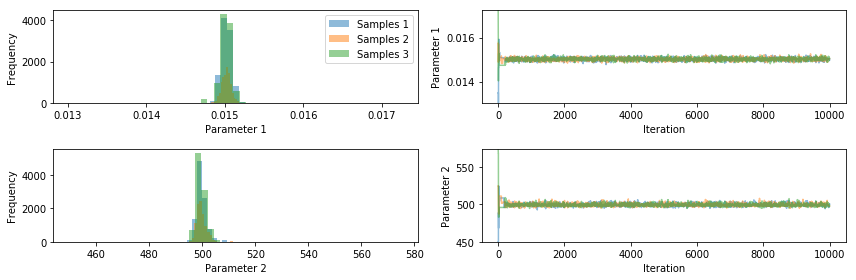

In [34]:
pints.plot.trace(chains_emu)
plt.show()

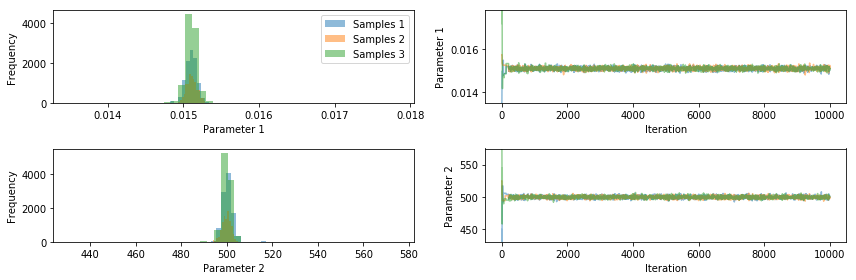

In [35]:
pints.plot.trace(chains)
plt.show()

In [36]:
chain_emu = chains_emu[0]
chain_emu = chain_emu[2000:]
chain = chains[0]
chain = chain[2000:]

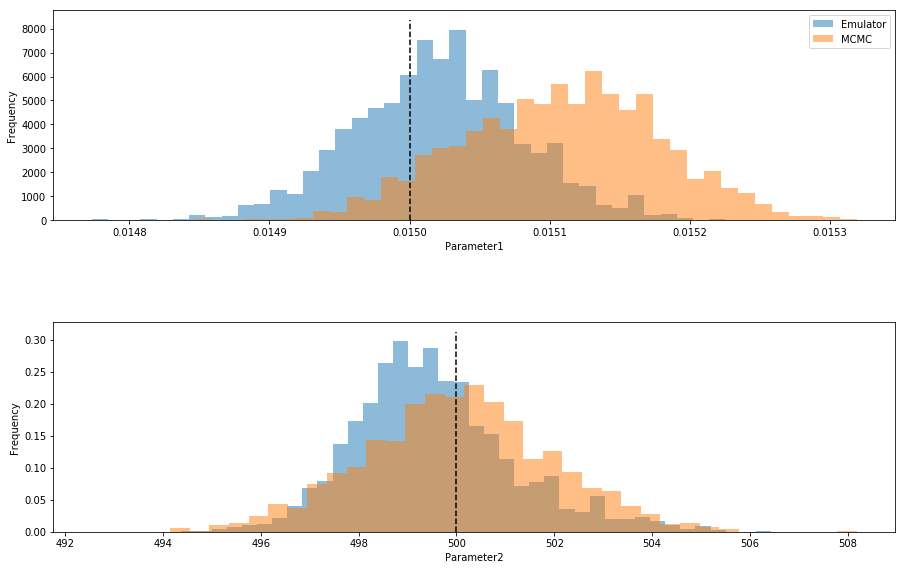

In [37]:
fig, axes = pints.plot.histogram([chain_emu, chain], ref_parameters=true_parameters, sample_names=["Emulator", "MCMC"])
fig.set_size_inches(14, 9)
plt.show()

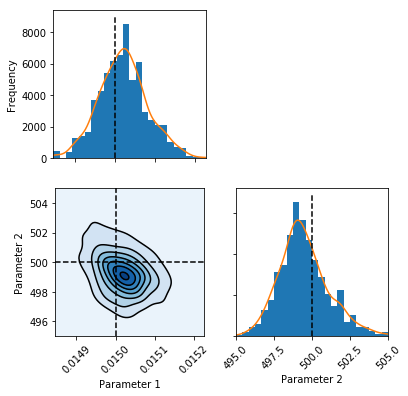

In [38]:
thinned_chain_emu = chain_emu[::10]
pints.plot.pairwise(thinned_chain_emu, kde=True, ref_parameters=true_parameters)
plt.show()

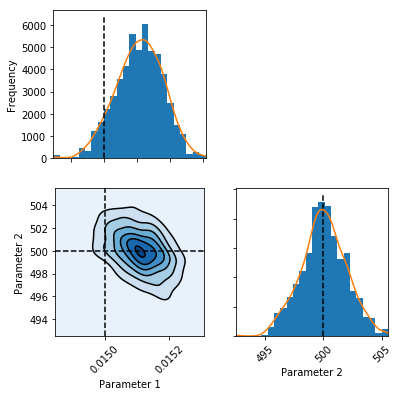

In [39]:
pints.plot.pairwise(thinned_chain, kde=True, ref_parameters=true_parameters)
plt.show()

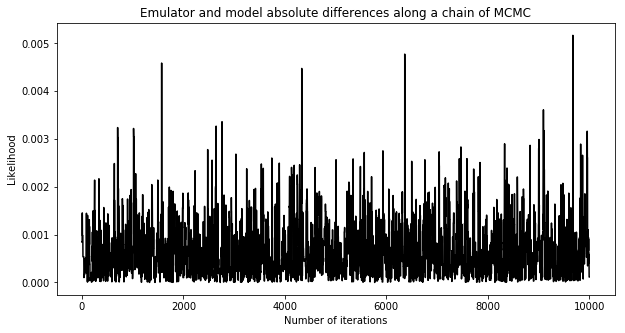

0.00011405614417525952

In [40]:
emu_prediction = np.apply_along_axis(emu, 1, chain_emu_rescaled).flatten()
model_prediction = np.apply_along_axis(log_likelihood, 1, chain_rescaled).flatten()
diffs = (np.abs((model_prediction - emu_prediction) / model_prediction))

iters = np.linspace(0, 10000, len(chain_emu_rescaled))
plt.figure(figsize=(10, 5))
plt.title("Emulator and model absolute differences along a chain of MCMC")
plt.xlabel("Number of iterations")
plt.ylabel("Likelihood")
plt.plot(iters, diffs, color = "Black")
plt.show()

diffs[-1]

In [41]:
chain_emu

array([[1.50619638e-02, 4.99062186e+02],
       [1.50619638e-02, 4.99062186e+02],
       [1.50619638e-02, 4.99062186e+02],
       ...,
       [1.50481139e-02, 4.99543800e+02],
       [1.49755579e-02, 5.00615704e+02],
       [1.49755579e-02, 5.00615704e+02]])

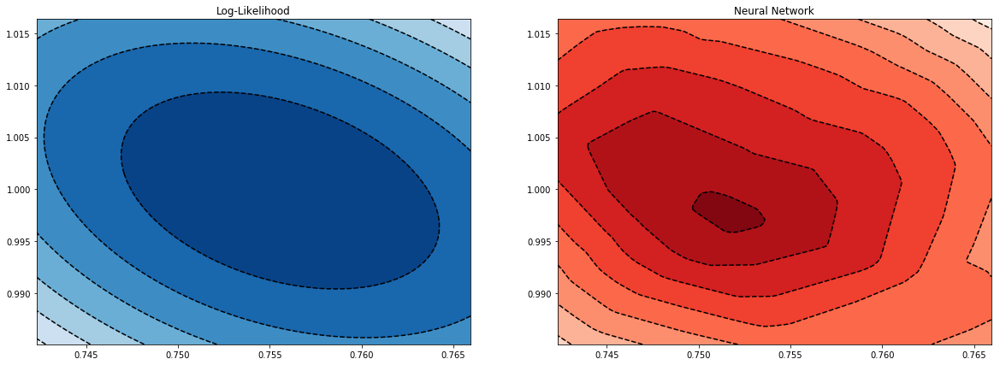

In [42]:
# Create grid of parameters
x = [p[0] for p in chain_rescaled]
y = [p[1] for p in chain_rescaled]
xmin, xmax = np.min(x), np.max(x)
ymin, ymax = np.min(y), np.max(y)
xx, yy = np.mgrid[xmin:xmax:100j, ymin:ymax:100j]
params = [list(n) for n in zip(xx, yy)]
ll = np.apply_along_axis(log_likelihood, 1, params)
ll_emu = np.apply_along_axis(emu, 1, params)
ll_emu = [list(e[0][0]) for e in ll_emu]

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,7))
ax1.title.set_text('Log-Likelihood')
ax2.title.set_text('Neural Network')
ax1.contourf(xx, yy, ll, cmap='Blues', extent=[xmin, xmax, ymin, ymax])
ax1.contour(xx, yy, ll, colors='k')
ax2.contourf(xx, yy, ll_emu, cmap='Reds', extent=[xmin, xmax, ymin, ymax])
ax2.contour(xx, yy, ll_emu, colors='k')
plt.show()

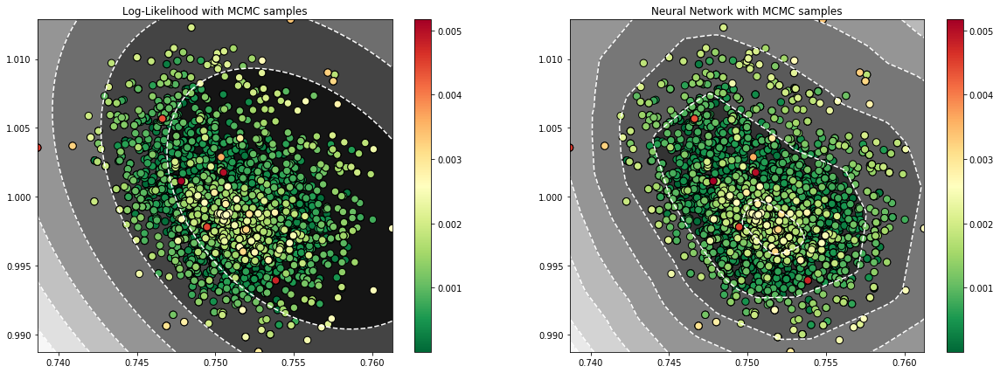

In [43]:
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,7))
ax1.title.set_text('Log-Likelihood with MCMC samples')
ax2.title.set_text('Neural Network with MCMC samples')                                                                  

# Create grid of parameters
x = [p[0] for p in chain_emu_rescaled]
y = [p[1] for p in chain_emu_rescaled]
xmin, xmax = np.min(x), np.max(x)
ymin, ymax = np.min(y), np.max(y)
xx, yy = np.mgrid[xmin:xmax:100j, ymin:ymax:100j]
params = [list(n) for n in zip(xx, yy)]
ll = np.apply_along_axis(log_likelihood, 1, params)
ll_emu = np.apply_along_axis(emu, 1, params)
ll_emu = [list(e[0][0]) for e in ll_emu]

# Sort according to differences in log-likelihood
idx = diffs.argsort()
x_sorted = np.array(x)[idx]
y_sorted = np.array(y)[idx]
diffs_sorted = diffs[idx]

# Add contour lines of log-likelihood
ax1.contourf(xx, yy, ll, cmap='Greys', extent=[xmin, xmax, ymin, ymax])
ax1.contour(xx, yy, ll, colors='w')

# Plot chain_emu    
ax1.set_xlim([xmin, xmax])                                                                           
ax1.set_ylim([ymin, ymax])
im1 = ax1.scatter(x_sorted, y_sorted, c=diffs_sorted, s=70, edgecolor='k', cmap="RdYlGn_r")

# Add contour lines of emulated likelihood
ax2.contourf(xx, yy, ll_emu, cmap='Greys', extent=[xmin, xmax, ymin, ymax])
ax2.contour(xx, yy, ll_emu, colors='w')

# Plot chain_emu    
ax2.set_xlim([xmin, xmax])                                                                           
ax2.set_ylim([ymin, ymax])
im2 = ax2.scatter(x_sorted, y_sorted, c=diffs_sorted, s=70, edgecolor='k', cmap="RdYlGn_r")

fig.colorbar(im1, ax=ax1)
fig.colorbar(im2, ax=ax2)
plt.show()

Running...
Using Emulated Metropolis MCMC
Generating 3 chains.
Running in sequential mode.
Iter. Eval. Accept.   Accept.   Accept.   Time m:s
0     3      0         0         0          0:00.0
1     6      0.5       0         0          0:00.0
2     9      0.333     0         0          0:00.0
3     12     0.25      0         0          0:00.0
20    63     0.238     0.0952    0.19       0:00.1
40    123    0.146     0.195122  0.171      0:00.1
60    183    0.164     0.18      0.213      0:00.1
80    243    0.16      0.21      0.259      0:00.2
100   303    0.149     0.198     0.238      0:00.2
120   363    0.14      0.19      0.231405   0:00.3
140   423    0.141844  0.191     0.234      0:00.3
160   483    0.155     0.186     0.261      0:00.4
180   543    0.166     0.188     0.243      0:00.4
200   603    0.194     0.184     0.238806   0:00.5
220   663    0.176     0.181     0.239819   0:00.5
240   723    0.178     0.183     0.232      0:00.6
260   783    0.18      0.18      0.241    

c:\users\plagl\pints\pints\_mcmc\_emulated_metropolis.py:154: RuntimeWarning: invalid value encountered in double_scalars
  if ((self._f(self._proposed) * alpha2) / (self._f(self._current) * alpha1)) > u2:


1400  4203   0.186     0.171     0.189      0:03.1
1420  4263   0.186     0.17      0.189      0:03.2
1440  4323   0.185982  0.17      0.189      0:03.2
1460  4383   0.185     0.17      0.187      0:03.3
1480  4443   0.187     0.172     0.187711   0:03.3


c:\users\plagl\pints\pints\_mcmc\_emulated_metropolis.py:154: RuntimeWarning: invalid value encountered in double_scalars
  if ((self._f(self._proposed) * alpha2) / (self._f(self._current) * alpha1)) > u2:


1500  4503   0.185     0.172     0.188      0:03.4
1520  4563   0.187     0.173     0.187      0:03.4
1540  4623   0.189     0.173     0.186      0:03.5
1560  4683   0.188     0.172     0.184      0:03.5
1580  4743   0.188     0.173308  0.183      0:03.6
1600  4803   0.187     0.172     0.184      0:03.6
1620  4863   0.187     0.173     0.186      0:03.7
1640  4923   0.186     0.172     0.184      0:03.7
1660  4983   0.185     0.175     0.184      0:03.7
1680  5043   0.186     0.176     0.183      0:03.8
1700  5103   0.184     0.176     0.183      0:03.8
1720  5163   0.184     0.177     0.184      0:03.9
1740  5223   0.183     0.177     0.182      0:03.9
1760  5283   0.181     0.177     0.181      0:04.0
1780  5343   0.181     0.179     0.182      0:04.0
1800  5403   0.181     0.179     0.182121   0:04.1
1820  5463   0.18      0.178     0.18067    0:04.1
1840  5523   0.179     0.179     0.183      0:04.2
1860  5583   0.178     0.179     0.184      0:04.2
1880  5643   0.177     0.178   

4760  14283  0.173     0.175     0.184      0:10.7
4780  14343  0.173     0.174     0.183      0:10.8
4800  14403  0.173     0.174     0.183      0:10.8
4820  14463  0.173     0.174     0.183      0:10.9
4840  14523  0.172     0.174     0.18302    0:10.9
4860  14583  0.172     0.174     0.183      0:11.0
4880  14643  0.172     0.175     0.183      0:11.0
4900  14703  0.172     0.175     0.182      0:11.1
4920  14763  0.172     0.175     0.18228    0:11.1
4940  14823  0.173     0.175     0.181947   0:11.2
4960  14883  0.173     0.175     0.183      0:11.2
4980  14943  0.172     0.176     0.183      0:11.3
5000  15003  0.173     0.176     0.183      0:11.3
5020  15063  0.173     0.176     0.183      0:11.4
5040  15123  0.172     0.176     0.182      0:11.4
5060  15183  0.172     0.177     0.182      0:11.5
5080  15243  0.172     0.177     0.182      0:11.5
5100  15303  0.171731  0.176632  0.181141   0:11.6
5120  15363  0.172     0.177     0.182      0:11.6
5140  15423  0.171562  0.177   

8040  24123  0.173     0.176     0.179      0:18.5
8060  24183  0.174     0.176     0.178      0:18.5
8080  24243  0.174     0.176     0.178      0:18.6
8100  24303  0.174     0.176     0.178      0:18.6
8120  24363  0.174     0.176     0.178      0:18.7
8140  24423  0.174     0.176     0.178      0:18.7
8160  24483  0.174     0.176     0.178      0:18.8
8180  24543  0.174     0.176     0.178      0:18.8
8200  24603  0.174     0.176     0.178      0:18.9
8220  24663  0.174     0.176     0.178      0:18.9
8240  24723  0.174     0.175     0.177527   0:19.0
8260  24783  0.174     0.175     0.177      0:19.0
8280  24843  0.173     0.176     0.177      0:19.0
8300  24903  0.173     0.176     0.176      0:19.1
8320  24963  0.174     0.176     0.177      0:19.1
8340  25023  0.174     0.176     0.177      0:19.2
8360  25083  0.174     0.177     0.177      0:19.2
8380  25143  0.173249  0.177     0.177      0:19.3
8400  25203  0.173     0.177     0.177      0:19.3
8420  25263  0.173     0.177   

c:\users\plagl\pints\pints\_mcmc\_emulated_metropolis.py:154: RuntimeWarning: invalid value encountered in double_scalars
  if ((self._f(self._proposed) * alpha2) / (self._f(self._current) * alpha1)) > u2:


9740  29223  0.174     0.177     0.178      0:22.2
9760  29283  0.174     0.177     0.178      0:22.3
9780  29343  0.174     0.177     0.178      0:22.3
9800  29403  0.174     0.178     0.178      0:22.4
9820  29463  0.174     0.178     0.178      0:22.4
9840  29523  0.174     0.178     0.178      0:22.4
9860  29583  0.174     0.178     0.178      0:22.5
9880  29643  0.174     0.178     0.177      0:22.5
9900  29703  0.174     0.178     0.177      0:22.6
9920  29763  0.174     0.177     0.177      0:22.6
9940  29823  0.173725  0.177     0.177      0:22.7
9960  29883  0.174     0.177     0.178      0:22.7
9980  29943  0.174     0.177     0.178      0:22.8
10000 30003  0.174     0.178     0.177      0:22.8
10020 30063  0.174     0.177627  0.178      0:22.8
10040 30123  0.174     0.178     0.177572   0:22.9
10060 30183  0.174     0.178     0.178      0:22.9
10080 30243  0.174     0.178     0.178      0:23.0
10100 30303  0.174     0.178     0.178      0:23.0
10120 30363  0.173     0.178   

12960 38883  0.173     0.178     0.172      0:29.2
12980 38943  0.173     0.178     0.172      0:29.3
13000 39003  0.173     0.178     0.172      0:29.3
13020 39063  0.173     0.178     0.173      0:29.4
13040 39123  0.173     0.178     0.173      0:29.4
13060 39183  0.173     0.178     0.172      0:29.5
13080 39243  0.173687  0.178     0.172311   0:29.5
13100 39303  0.174     0.178     0.172      0:29.5
13120 39363  0.174     0.178     0.172      0:29.6
13140 39423  0.174     0.178     0.172      0:29.6
13160 39483  0.173619  0.178     0.172      0:29.7
13180 39543  0.174     0.178     0.172      0:29.7
13200 39603  0.174     0.178     0.172      0:29.8
13220 39663  0.17389   0.178     0.173      0:29.8
13240 39723  0.174     0.179     0.17257    0:29.8
13260 39783  0.173818  0.179     0.173      0:29.9
13280 39843  0.174     0.179     0.173      0:29.9
13300 39903  0.174     0.179     0.173      0:30.0
13320 39963  0.174     0.179     0.173      0:30.0
13340 40023  0.174     0.178   

c:\users\plagl\pints\pints\_mcmc\_emulated_metropolis.py:154: RuntimeWarning: invalid value encountered in double_scalars
  if ((self._f(self._proposed) * alpha2) / (self._f(self._current) * alpha1)) > u2:


16160 48483  0.176     0.176     0.174      0:36.2
16180 48543  0.176     0.176     0.174      0:36.3
16200 48603  0.175483  0.176     0.174      0:36.3
16220 48663  0.176     0.176438  0.174      0:36.4
16240 48723  0.175     0.176467  0.174      0:36.4
16260 48783  0.175     0.176     0.174      0:36.5
16280 48843  0.175     0.176     0.174      0:36.5
16300 48903  0.175204  0.176     0.174      0:36.6
16320 48963  0.175     0.176     0.174      0:36.6
16340 49023  0.175     0.176     0.174      0:36.6
16360 49083  0.175     0.177     0.174      0:36.7
16380 49143  0.175     0.177     0.174      0:36.7
16400 49203  0.175     0.177     0.174      0:36.8
16420 49263  0.175     0.177     0.174      0:36.8
16440 49323  0.175     0.177     0.174      0:36.9
16460 49383  0.174959  0.177     0.174      0:36.9
16480 49443  0.175     0.177     0.174      0:36.9
16500 49503  0.175     0.177     0.174      0:37.0
16520 49563  0.175     0.177     0.174      0:37.0
16540 49623  0.175     0.176652

19440 58323  0.173     0.174     0.173      0:44.2
19460 58383  0.173     0.174     0.173      0:44.2
19480 58443  0.174     0.174     0.173      0:44.3
19500 58503  0.173427  0.174     0.173      0:44.3
19520 58563  0.174     0.174     0.173      0:44.3
19540 58623  0.174     0.174249  0.173      0:44.4
19560 58683  0.173713  0.174     0.173      0:44.4
19580 58743  0.174     0.174     0.173      0:44.5
19600 58803  0.174     0.174     0.173      0:44.5
19620 58863  0.173     0.174     0.172876   0:44.6
19640 58923  0.173     0.174     0.173      0:44.6
19660 58983  0.173     0.174     0.173      0:44.7
19680 59043  0.173     0.174     0.173      0:44.7
19700 59103  0.173     0.174     0.173      0:44.8
19720 59163  0.173     0.174     0.173      0:44.8
19740 59223  0.173     0.174     0.173      0:44.9
19760 59283  0.173     0.174     0.173      0:44.9
19780 59343  0.173     0.174157  0.173      0:45.0
19800 59403  0.173     0.174     0.173      0:45.0
19820 59463  0.173     0.174   

c:\users\plagl\pints\pints\_mcmc\_emulated_metropolis.py:154: RuntimeWarning: invalid value encountered in double_scalars
  if ((self._f(self._proposed) * alpha2) / (self._f(self._current) * alpha1)) > u2:


20140 60423  0.173     0.175     0.173      0:45.9
20160 60483  0.173     0.175     0.173      0:45.9
20180 60543  0.172489  0.175     0.173      0:46.0
20200 60603  0.173     0.174     0.173      0:46.0
20220 60663  0.173     0.175     0.173      0:46.1
20240 60723  0.173     0.175     0.173      0:46.1
20260 60783  0.172     0.175     0.173      0:46.2
20280 60843  0.172     0.175     0.173      0:46.2
20300 60903  0.172     0.175     0.173      0:46.2
20320 60963  0.172     0.175     0.173      0:46.3
20340 61023  0.172     0.175     0.173      0:46.3
20360 61083  0.172     0.175     0.173      0:46.4
20380 61143  0.172     0.175     0.173      0:46.4
20400 61203  0.172     0.175     0.173      0:46.5
20420 61263  0.172     0.175     0.173      0:46.5
20440 61323  0.172     0.175     0.173      0:46.6
20460 61383  0.172     0.175     0.173      0:46.6
20480 61443  0.172     0.175     0.173      0:46.7
20500 61503  0.172     0.175     0.173      0:46.7
20520 61563  0.172     0.175   

23420 70263  0.171897  0.175     0.174      0:53.9
23440 70323  0.172     0.175     0.174      0:53.9
23460 70383  0.172     0.175     0.174      0:54.0
23480 70443  0.172     0.175     0.174      0:54.0
23500 70503  0.172     0.174     0.174      0:54.1
23520 70563  0.172     0.174     0.174      0:54.1
23540 70623  0.172     0.174     0.174      0:54.2
23560 70683  0.171682  0.174     0.174      0:54.2
23580 70743  0.172     0.174     0.173784   0:54.3
23600 70803  0.172     0.174     0.174      0:54.3
23620 70863  0.172     0.174     0.173913   0:54.4
23640 70923  0.172     0.174     0.174      0:54.4
23660 70983  0.172     0.174253  0.174      0:54.5
23680 71043  0.172     0.174     0.174      0:54.5
23700 71103  0.172     0.174     0.174      0:54.6
23720 71163  0.172     0.174     0.174      0:54.6
23740 71223  0.172     0.174     0.174      0:54.7
23760 71283  0.172     0.174     0.174      0:54.7
23780 71343  0.172     0.174     0.173584   0:54.8
23800 71403  0.172     0.174   

26700 80103  0.172     0.174     0.172      1:02.3
26720 80163  0.172     0.174     0.172      1:02.3
26740 80223  0.172     0.174     0.172      1:02.4
26760 80283  0.172     0.174     0.172      1:02.4
26780 80343  0.171     0.174     0.172      1:02.5
26800 80403  0.171     0.174     0.172      1:02.5
26820 80463  0.171     0.174     0.172      1:02.6
26840 80523  0.171     0.173764  0.172      1:02.6
26860 80583  0.171     0.174     0.172      1:02.7
26880 80643  0.171385  0.174     0.172129   1:02.7
26900 80703  0.171     0.173711  0.172      1:02.8
26920 80763  0.171     0.174     0.172      1:02.9
26940 80823  0.171     0.174     0.172      1:02.9
26960 80883  0.171     0.174     0.172      1:03.0
26980 80943  0.171     0.174     0.172      1:03.0
27000 81003  0.171364  0.174     0.172      1:03.1
27020 81063  0.171     0.174     0.172      1:03.1
27040 81123  0.171     0.174     0.172183   1:03.2
27060 81183  0.171     0.174     0.172      1:03.2
27080 81243  0.171     0.174   

29940 89823  0.171     0.174     0.172      1:10.8
29960 89883  0.171     0.174     0.172      1:10.9
29980 89943  0.171     0.175     0.172      1:11.0
30000 90000  0.171     0.174     0.172      1:11.0
Halting: Maximum number of iterations (30000) reached.
Done!
R-hat:
[1.0006097569758174, 1.001513903107743]


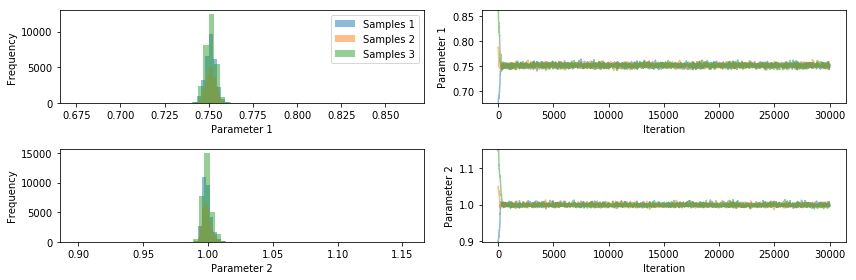

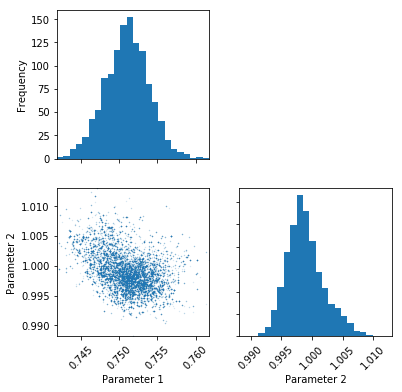

In [52]:
# Choose starting points for 3 mcmc chains
x0s = [
    np.array(start_parameters) * 0.9,
    np.array(start_parameters) * 1.05, #1.1
    np.array(start_parameters) * 1.15,
]
# Choose a covariance matrix for the proposal step
#sigma0 = [0.01, 0.01] #np.abs(true_parameters) * 5e-3
#sigma0 = [0.1*0.75, 0.1] #np.abs(true_parameters) * 5e-3
sigma0 = [[ 1.01547594e-05, -2.58358260e-06], [-2.58358260e-06,  1.22093040e-05]]

# Create mcmc routine
mcmc = pints.MCMCController(log_posterior_emu, 3, x0s, sigma0=sigma0, method=pints.EmulatedMetropolisMCMC, f=log_posterior)

# Add stopping criterion
mcmc.set_max_iterations(30000)

# Disable logging mode
#mcmc.set_log_to_screen(False)

# Run!
print('Running...')
emulated_chains = mcmc.run()
print('Done!')

# Show traces and histograms
pints.plot.trace(emulated_chains)

# Discard warm up
emulated_chains_thinned = emulated_chains[:, 10000:, :]

# Check convergence using rhat criterion
print('R-hat:')
print(pints.rhat_all_params(emulated_chains_thinned))

# Look at distribution in chain 0
pints.plot.pairwise(emulated_chains_thinned[0])

# Show graphs
plt.show()

Running...
Using Metropolis random walk MCMC
Generating 3 chains.
Running in sequential mode.
Iter. Eval. Accept.   Accept.   Accept.   Time m:s
0     3      0         0         0          0:00.0
1     6      0.5       0         0.5        0:00.0
2     9      0.333     0         0.667      0:00.0
3     12     0.5       0.25      0.5        0:00.0
20    63     0.429     0.571     0.571      0:00.0
40    123    0.512     0.561     0.537      0:00.0
60    183    0.492     0.525     0.59       0:00.0
80    243    0.494     0.531     0.58       0:00.1
100   303    0.485     0.535     0.594      0:00.1
120   363    0.512     0.562     0.612      0:00.1
140   423    0.532     0.553     0.638      0:00.1
160   483    0.528     0.552795  0.615      0:00.1
180   543    0.53      0.547     0.602      0:00.1
200   603    0.537     0.522     0.612      0:00.1
220   663    0.534     0.525     0.62       0:00.2
240   723    0.544     0.548     0.61       0:00.2
260   783    0.548     0.548     0.602 

3240  9723   0.573     0.575     0.575      0:02.2
3260  9783   0.573     0.575897  0.575      0:02.2
3280  9843   0.572     0.577     0.575      0:02.2
3300  9903   0.573     0.577     0.577      0:02.2
3320  9963   0.573     0.577     0.577      0:02.3
3340  10023  0.573481  0.576     0.576      0:02.3
3360  10083  0.573     0.576     0.577      0:02.3
3380  10143  0.573     0.576     0.576      0:02.3
3400  10203  0.572     0.575713  0.577      0:02.3
3420  10263  0.572055  0.576     0.575      0:02.3
3440  10323  0.572     0.577     0.575      0:02.3
3460  10383  0.571     0.576     0.575      0:02.4
3480  10443  0.571     0.577     0.576      0:02.4
3500  10503  0.571     0.576     0.577      0:02.4
3520  10563  0.571     0.577     0.577      0:02.4
3540  10623  0.57      0.578     0.577      0:02.4
3560  10683  0.570907  0.578     0.577      0:02.4
3580  10743  0.570511  0.577     0.577      0:02.4
3600  10803  0.57      0.578     0.577      0:02.5
3620  10863  0.571113  0.578   

6720  20163  0.562     0.577     0.569      0:04.6
6740  20223  0.562     0.576     0.57       0:04.6
6760  20283  0.562     0.576     0.57       0:04.6
6780  20343  0.562     0.576     0.57       0:04.7
6800  20403  0.562     0.576     0.571      0:04.7
6820  20463  0.563     0.575     0.57       0:04.7
6840  20523  0.563     0.575     0.57       0:04.7
6860  20583  0.562746  0.575     0.570325   0:04.7
6880  20643  0.563     0.575     0.57       0:04.7
6900  20703  0.562     0.576     0.569      0:04.7
6920  20763  0.563     0.575     0.57       0:04.8
6940  20823  0.563     0.575     0.57       0:04.8
6960  20883  0.562     0.575     0.570033   0:04.8
6980  20943  0.563     0.575     0.571      0:04.8
7000  21003  0.563     0.574     0.57       0:04.8
7020  21063  0.563     0.574     0.571      0:04.8
7040  21123  0.563     0.574     0.57       0:04.8
7060  21183  0.562     0.573998  0.571      0:04.9
7080  21243  0.56235   0.574     0.571      0:04.9
7100  21303  0.563     0.575   

10200 30603  0.564     0.569454  0.569      0:07.0
10220 30663  0.564     0.569     0.568731   0:07.0
10240 30723  0.564     0.57      0.569      0:07.1
10260 30783  0.564     0.569925  0.569      0:07.1
10280 30843  0.564     0.57      0.569      0:07.1
10300 30903  0.564     0.57      0.569071   0:07.1
10320 30963  0.564     0.57      0.57       0:07.1
10340 31023  0.563     0.57      0.57       0:07.1
10360 31083  0.564     0.57      0.57       0:07.1
10380 31143  0.564     0.57      0.57       0:07.1
10400 31203  0.564     0.57      0.569      0:07.2
10420 31263  0.563     0.569715  0.569      0:07.2
10440 31323  0.563356  0.569773  0.569      0:07.2
10460 31383  0.563     0.57      0.569      0:07.2
10480 31443  0.564     0.57      0.569      0:07.2
10500 31503  0.564     0.57      0.569      0:07.2
10520 31563  0.564     0.57      0.569      0:07.2
10540 31623  0.564     0.57      0.569      0:07.3
10560 31683  0.564     0.57      0.569      0:07.3
10580 31743  0.564     0.57    

13500 40503  0.564     0.572     0.568      0:09.3
13520 40563  0.564     0.571     0.568      0:09.3
13540 40623  0.564     0.571     0.568      0:09.3
13560 40683  0.564     0.571     0.568      0:09.3
13580 40743  0.564     0.571     0.569      0:09.3
13600 40803  0.564     0.571     0.569      0:09.3
13620 40863  0.564     0.571     0.568901   0:09.4
13640 40923  0.564     0.571     0.569      0:09.4
13660 40983  0.564     0.571     0.569      0:09.4
13680 41043  0.564     0.571     0.568745   0:09.4
13700 41103  0.563     0.571     0.569      0:09.4
13720 41163  0.564     0.571     0.569      0:09.4
13740 41223  0.563     0.571     0.569      0:09.4
13760 41283  0.563     0.571     0.569      0:09.5
13780 41343  0.563     0.571     0.569      0:09.5
13800 41403  0.563     0.571118  0.569      0:09.5
13820 41463  0.563     0.571     0.569      0:09.5
13840 41523  0.563     0.571     0.569323   0:09.5
13860 41583  0.563     0.571     0.569      0:09.5
13880 41643  0.563     0.571   

16720 50163  0.564     0.569     0.568      0:11.5
16740 50223  0.564     0.569     0.569      0:11.5
16760 50283  0.564     0.569     0.569      0:11.5
16780 50343  0.564     0.569     0.568      0:11.5
16800 50403  0.564     0.569     0.568359   0:11.5
16820 50463  0.564     0.569     0.568      0:11.5
16840 50523  0.564     0.569     0.568      0:11.5
16860 50583  0.565     0.569     0.568      0:11.6
16880 50643  0.564     0.569     0.569      0:11.6
16900 50703  0.564     0.569     0.569      0:11.6
16920 50763  0.564     0.569     0.568938   0:11.6
16940 50823  0.564     0.568     0.569      0:11.6
16960 50883  0.564     0.568     0.569      0:11.6
16980 50943  0.564     0.569     0.569      0:11.6
17000 51003  0.564     0.568     0.569      0:11.7
17020 51063  0.564     0.568     0.569      0:11.7
17040 51123  0.564     0.568     0.569      0:11.7
17060 51183  0.564     0.568     0.569      0:11.7
17080 51243  0.564721  0.568     0.569      0:11.7
17100 51303  0.565     0.568   

19960 59883  0.564     0.569     0.571      0:13.7
19980 59943  0.564     0.569     0.570542   0:13.7
20000 60003  0.564     0.569     0.571      0:13.7
20020 60063  0.564     0.568     0.571      0:13.7
20040 60123  0.564     0.569     0.57       0:13.7
20060 60183  0.564     0.569     0.571      0:13.7
20080 60243  0.564     0.569     0.571      0:13.7
20100 60303  0.564     0.569     0.571      0:13.8
20120 60363  0.564     0.569     0.571      0:13.8
20140 60423  0.564     0.569     0.571      0:13.8
20160 60483  0.564     0.569     0.571      0:13.8
20180 60543  0.564     0.569     0.571      0:13.8
20200 60603  0.564     0.569     0.571      0:13.8
20220 60663  0.565     0.569     0.571      0:13.8
20240 60723  0.564399  0.568549  0.571      0:13.9
20260 60783  0.564     0.569     0.571      0:13.9
20280 60843  0.564     0.569     0.57       0:13.9
20300 60903  0.564     0.569     0.57       0:13.9
20320 60963  0.564     0.569     0.57       0:13.9
20340 61023  0.564     0.569   

23200 69603  0.564     0.569     0.57       0:15.9
23220 69663  0.564     0.569     0.570475   0:15.9
23240 69723  0.565     0.569     0.571      0:15.9
23260 69783  0.565     0.569365  0.57       0:15.9
23280 69843  0.565     0.569     0.57       0:15.9
23300 69903  0.564     0.569246  0.57       0:15.9
23320 69963  0.564384  0.569     0.57       0:15.9
23340 70023  0.564     0.569     0.57       0:15.9
23360 70083  0.564     0.569     0.57       0:16.0
23380 70143  0.564     0.569     0.570121   0:16.0
23400 70203  0.564     0.569     0.57       0:16.0
23420 70263  0.564     0.56919   0.57       0:16.0
23440 70323  0.564     0.569131  0.57       0:16.0
23460 70383  0.564     0.569     0.57       0:16.0
23480 70443  0.564     0.569     0.57       0:16.0
23500 70503  0.564     0.569     0.57       0:16.1
23520 70563  0.564     0.569     0.57       0:16.1
23540 70623  0.564     0.569     0.57       0:16.1
23560 70683  0.564     0.569     0.57       0:16.1
23580 70743  0.565     0.569   

26680 80043  0.564     0.57      0.568      0:18.2
26700 80103  0.564     0.57      0.568      0:18.3
26720 80163  0.564163  0.57      0.568      0:18.3
26740 80223  0.564     0.57      0.568      0:18.3
26760 80283  0.564     0.57      0.568      0:18.3
26780 80343  0.564     0.570255  0.568      0:18.3
26800 80403  0.564     0.57      0.568      0:18.3
26820 80463  0.564     0.57      0.568      0:18.3
26840 80523  0.564     0.57      0.568      0:18.3
26860 80583  0.564     0.57      0.567961   0:18.4
26880 80643  0.564     0.57      0.568022   0:18.4
26900 80703  0.564     0.570016  0.568      0:18.4
26920 80763  0.564     0.57      0.567921   0:18.4
26940 80823  0.564     0.569912  0.568      0:18.4
26960 80883  0.564     0.57      0.568      0:18.4
26980 80943  0.564286  0.57      0.568      0:18.4
27000 81003  0.564     0.57      0.568      0:18.5
27020 81063  0.564     0.57      0.568      0:18.5
27040 81123  0.564     0.57      0.568      0:18.5
27060 81183  0.564059  0.57    

29900 89703  0.564     0.57      0.566      0:20.4
29920 89763  0.564     0.57      0.566      0:20.4
29940 89823  0.563909  0.57      0.566247   0:20.5
29960 89883  0.564     0.57      0.566      0:20.5
29980 89943  0.564     0.57      0.566292   0:20.5
30000 90000  0.564     0.57      0.566      0:20.5
Halting: Maximum number of iterations (30000) reached.
Done!
R-hat:
[1.0006400095109966, 1.0001084748879285]


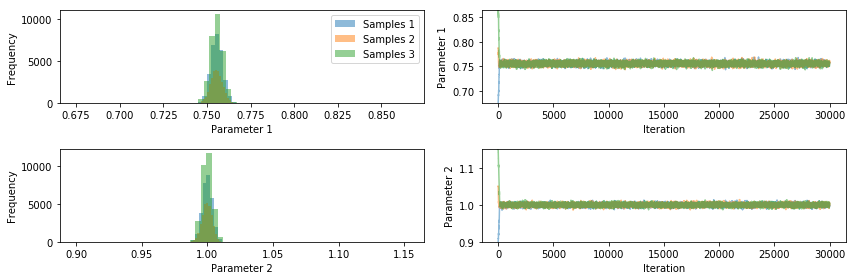

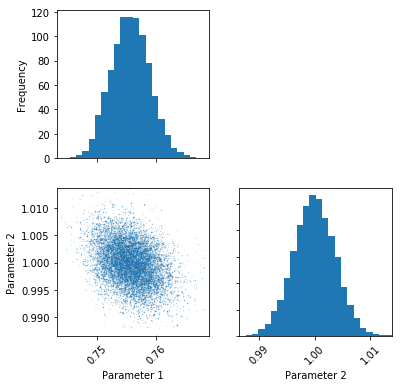

In [51]:
# Choose starting points for 3 mcmc chains
x0s = [
    np.array(start_parameters) * 0.9,
    np.array(start_parameters) * 1.05, #1.1
    np.array(start_parameters) * 1.15,
]
# Choose a covariance matrix for the proposal step
#sigma0 = [0.01, 0.01] #np.abs(true_parameters) * 5e-5
sigma0 = [[ 1.01547594e-05, -2.58358260e-06], [-2.58358260e-06,  1.22093040e-05]]

# Create mcmc routine
mcmc = pints.MCMCController(log_posterior, 3, x0s, sigma0=sigma0, method=pints.MetropolisRandomWalkMCMC)

# Add stopping criterion
mcmc.set_max_iterations(30000)

# Disable logging mode
#mcmc.set_log_to_screen(False)

# Run!
print('Running...')
metropolis_chains = mcmc.run()
print('Done!')

# Show traces and histograms
pints.plot.trace(metropolis_chains)

# Discard warm up
metropolis_chains_thinned = metropolis_chains[:, 10000:, :]

# Check convergence using rhat criterion
print('R-hat:')
print(pints.rhat_all_params(metropolis_chains_thinned))

# Look at distribution in chain 0
pints.plot.pairwise(metropolis_chains_thinned[0])

# Show graphs
plt.show()

Running...
Using Haario-Bardenet adaptive covariance MCMC
Generating 3 chains.
Running in sequential mode.
[[0.00675 0.     ]
 [0.      0.009  ]]
[[0.007875 0.      ]
 [0.       0.0105  ]]
[[0.008625 0.      ]
 [0.       0.0115  ]]
Iter. Eval. Accept.   Accept.   Accept.   Time m:s
0     3      0         0         0          0:00.0
[[0.00675 0.     ]
 [0.      0.009  ]]


[[0.007875 0.      ]
 [0.       0.0105  ]]


[[0.008625 0.      ]
 [0.       0.0115  ]]


1     6      0.5       0.5       0          0:00.0
[[0.00675 0.     ]
 [0.      0.009  ]]


[[0.007875 0.      ]
 [0.       0.0105  ]]


[[0.008625 0.      ]
 [0.       0.0115  ]]


2     9      0.333     0.333     0          0:00.0
[[0.00675 0.     ]
 [0.      0.009  ]]


[[0.007875 0.      ]
 [0.       0.0105  ]]


[[0.008625 0.      ]
 [0.       0.0115  ]]


3     12     0.25      0.25      0.25       0:00.0
[[0.00675 0.     ]
 [0.      0.009  ]]


[[0.007875 0.      ]
 [0.       0.0105  ]]


[[0.008625 0.      ]
 [0.       0.

 [0.      0.009  ]]


[[0.007875 0.      ]
 [0.       0.0105  ]]


[[0.008625 0.      ]
 [0.       0.0115  ]]


[[0.00675 0.     ]
 [0.      0.009  ]]


[[0.007875 0.      ]
 [0.       0.0105  ]]


[[0.008625 0.      ]
 [0.       0.0115  ]]


[[0.00675 0.     ]
 [0.      0.009  ]]


[[0.007875 0.      ]
 [0.       0.0105  ]]


[[0.008625 0.      ]
 [0.       0.0115  ]]


[[0.00675 0.     ]
 [0.      0.009  ]]


[[0.007875 0.      ]
 [0.       0.0105  ]]


[[0.008625 0.      ]
 [0.       0.0115  ]]


[[0.00675 0.     ]
 [0.      0.009  ]]


[[0.007875 0.      ]
 [0.       0.0105  ]]


[[0.008625 0.      ]
 [0.       0.0115  ]]


[[0.00675 0.     ]
 [0.      0.009  ]]


[[0.007875 0.      ]
 [0.       0.0105  ]]


[[0.008625 0.      ]
 [0.       0.0115  ]]


[[0.00675 0.     ]
 [0.      0.009  ]]


[[0.007875 0.      ]
 [0.       0.0105  ]]


[[0.008625 0.      ]
 [0.       0.0115  ]]


[[0.00675 0.     ]
 [0.      0.009  ]]


[[0.007875 0.      ]
 [0.       0.0105  ]]


[[0.008625 0.   

 [0.      0.009  ]]


[[0.007875 0.      ]
 [0.       0.0105  ]]


[[0.008625 0.      ]
 [0.       0.0115  ]]


[[0.00675 0.     ]
 [0.      0.009  ]]


[[0.007875 0.      ]
 [0.       0.0105  ]]


[[0.008625 0.      ]
 [0.       0.0115  ]]


[[0.00675 0.     ]
 [0.      0.009  ]]


[[0.007875 0.      ]
 [0.       0.0105  ]]


[[0.008625 0.      ]
 [0.       0.0115  ]]


[[0.00675 0.     ]
 [0.      0.009  ]]


[[0.007875 0.      ]
 [0.       0.0105  ]]


[[0.008625 0.      ]
 [0.       0.0115  ]]


[[0.00675 0.     ]
 [0.      0.009  ]]


[[0.007875 0.      ]
 [0.       0.0105  ]]


[[0.008625 0.      ]
 [0.       0.0115  ]]


[[0.00675 0.     ]
 [0.      0.009  ]]


[[0.007875 0.      ]
 [0.       0.0105  ]]


[[0.008625 0.      ]
 [0.       0.0115  ]]


[[0.00675 0.     ]
 [0.      0.009  ]]


[[0.007875 0.      ]
 [0.       0.0105  ]]


[[0.008625 0.      ]
 [0.       0.0115  ]]


[[0.00675 0.     ]
 [0.      0.009  ]]


[[0.007875 0.      ]
 [0.       0.0105  ]]


[[0.008625 0.   

 [-2.29564923e-06  9.25574172e-06]]


[[ 7.65812493e-07 -5.50982503e-08]
 [-5.50982503e-08  1.13485660e-05]]


[[1.40665243e-05 3.97272073e-06]
 [3.97272073e-06 7.32720162e-06]]


[[ 9.16667088e-06 -2.40530517e-06]
 [-2.40530517e-06  8.47775667e-06]]


[[ 7.38337573e-07 -1.67615003e-07]
 [-1.67615003e-07  1.06027063e-05]]


[[1.27526031e-05 3.60839681e-06]
 [3.60839681e-06 7.62242513e-06]]


[[ 9.30797014e-06 -2.44714119e-06]
 [-2.44714119e-06  7.76537553e-06]]


[[ 6.70222343e-07 -1.60098705e-07]
 [-1.60098705e-07  1.05311294e-05]]


[[1.15749449e-05 3.28067868e-06]
 [3.28067868e-06 7.71640323e-06]]


[[ 9.26453066e-06 -2.43919431e-06]
 [-2.43919431e-06  7.11383645e-06]]


[[ 6.66905049e-07 -2.40654993e-07]
 [-2.40654993e-07  9.72591802e-06]]


[[1.05179573e-05 2.98559192e-06]
 [2.98559192e-06 7.66322751e-06]]


[[ 8.43093718e-06 -2.20086884e-06]
 [-2.20086884e-06  6.57354002e-06]]


[[ 6.37831556e-07 -3.32229972e-07]
 [-3.32229972e-07  9.25950685e-06]]


[[9.56800427e-06 2.71962000e-

 [-9.80712484e-08  6.12775185e-06]]


[[1.21494706e-05 1.55281818e-06]
 [1.55281818e-06 1.42257420e-05]]


[[ 8.28384004e-06 -8.41111211e-06]
 [-8.41111211e-06  1.79552859e-05]]


[[ 4.53928794e-06 -2.03810504e-07]
 [-2.03810504e-07  5.96775852e-06]]


[[1.17492701e-05 1.72429614e-06]
 [1.72429614e-06 1.37203293e-05]]


[[ 8.37281972e-06 -8.24394594e-06]
 [-8.24394594e-06  1.71431950e-05]]


[[ 4.36192814e-06 -2.91931574e-07]
 [-2.91931574e-07  5.79956713e-06]]


[[1.13462144e-05 1.85946194e-06]
 [1.85946194e-06 1.32175187e-05]]


[[ 8.40142579e-06 -8.05705872e-06]
 [-8.05705872e-06  1.63625120e-05]]


[[ 4.36650684e-06 -6.30621972e-07]
 [-6.30621972e-07  6.02167189e-06]]


[[1.09432744e-05 1.96340990e-06]
 [1.96340990e-06 1.27200091e-05]]


[[ 8.37934682e-06 -7.85483449e-06]
 [-7.85483449e-06  1.56129550e-05]]


[[ 4.34655522e-06 -9.13521417e-07]
 [-9.13521417e-07  6.17659377e-06]]


[[1.05429118e-05 2.04057903e-06]
 [2.04057903e-06 1.22300009e-05]]


[[ 8.31496487e-06 -7.64101345e-06

 [8.15653903e-06 1.23980663e-05]]


[[ 4.70528847e-06 -2.63545648e-06]
 [-2.63545648e-06  1.37822242e-05]]


[[ 9.40187388e-06 -2.18061601e-07]
 [-2.18061601e-07  1.05505864e-05]]


[[1.05276646e-05 7.81158055e-06]
 [7.81158055e-06 1.19864512e-05]]


[[ 4.62073067e-06 -2.80963704e-06]
 [-2.80963704e-06  1.39822978e-05]]


[[ 9.04374745e-06 -2.42996046e-07]
 [-2.42996046e-07  1.01881912e-05]]


[[1.01103499e-05 7.48278581e-06]
 [7.48278581e-06 1.15857762e-05]]


[[ 4.53166114e-06 -2.95450536e-06]
 [-2.95450536e-06  1.41150213e-05]]


[[ 8.69947692e-06 -2.64232945e-07]
 [-2.64232945e-07  9.83657075e-06]]


[[9.71056291e-06 7.16930494e-06]
 [7.16930494e-06 1.11960795e-05]]


[[ 4.43894003e-06 -3.07315740e-06]
 [-3.07315740e-06  1.41881978e-05]]


[[ 8.74944935e-06 -6.46837727e-07]
 [-6.46837727e-07  9.83405889e-06]]


[[9.57507672e-06 6.69209265e-06]
 [6.69209265e-06 1.08985724e-05]]


[[ 4.29639547e-06 -3.14476248e-06]
 [-3.14476248e-06  1.47317119e-05]]


[[ 8.42447526e-06 -5.17825969e-

[[ 1.83044074e-05 -9.19705481e-06]
 [-9.19705481e-06  1.31249064e-05]]


[[ 7.77828162e-06 -3.98639538e-06]
 [-3.98639538e-06  1.37351916e-05]]


[[ 9.29085601e-06 -1.58771616e-06]
 [-1.58771616e-06  8.23026405e-06]]


[[ 1.89289772e-05 -1.05177085e-05]
 [-1.05177085e-05  1.48352538e-05]]


[[ 7.97918453e-06 -4.00979204e-06]
 [-4.00979204e-06  1.33323485e-05]]


[[ 9.27093911e-06 -1.54750795e-06]
 [-1.54750795e-06  7.95778908e-06]]


[[ 1.94515533e-05 -1.16862991e-05]
 [-1.16862991e-05  1.63460510e-05]]


[[ 8.14320491e-06 -4.02225343e-06]
 [-4.02225343e-06  1.29402370e-05]]


[[ 9.23299043e-06 -1.50790360e-06]
 [-1.50790360e-06  7.69485746e-06]]


[[ 1.98812743e-05 -1.27155371e-05]
 [-1.27155371e-05  1.76740313e-05]]


[[ 8.27370598e-06 -4.02486160e-06]
 [-4.02486160e-06  1.25586870e-05]]


[[ 1.00616497e-05 -1.95856082e-06]
 [-1.95856082e-06  7.66158512e-06]]


[[ 2.02265530e-05 -1.36171495e-05]
 [-1.36171495e-05  1.88346314e-05]]


[[ 8.04778016e-06 -4.18568276e-06]
 [-4.18568276e-0



[[ 8.98632504e-06 -3.13267182e-06]
 [-3.13267182e-06  2.17570280e-05]]


[[ 1.51978548e-05 -6.74339725e-06]
 [-6.74339725e-06  1.45895993e-05]]


[[ 1.10547953e-05 -9.02956082e-06]
 [-9.02956082e-06  1.26944212e-05]]


[[ 8.73105932e-06 -3.09220826e-06]
 [-3.09220826e-06  2.19682396e-05]]


[[ 1.56134943e-05 -7.40250932e-06]
 [-7.40250932e-06  1.50245797e-05]]


[[ 1.07402120e-05 -8.72134916e-06]
 [-8.72134916e-06  1.32836523e-05]]


[[ 8.48336245e-06 -3.05017344e-06]
 [-3.05017344e-06  2.21258325e-05]]


[[ 1.59685564e-05 -7.99362579e-06]
 [-7.99362579e-06  1.53982910e-05]]


[[ 1.04350017e-05 -8.42523340e-06]
 [-8.42523340e-06  1.38013179e-05]]


[[ 8.24300245e-06 -3.00677946e-06]
 [-3.00677946e-06  2.22342518e-05]]


[[ 1.62677460e-05 -8.52169094e-06]
 [-8.52169094e-06  1.57154663e-05]]


[[ 1.03391442e-05 -8.06222699e-06]
 [-8.06222699e-06  1.34802876e-05]]


[[ 8.14922221e-06 -3.05295752e-06]
 [-3.05295752e-06  2.17215420e-05]]


[[ 1.65154459e-05 -8.99131874e-06]
 [-8.99131874e



[[ 8.19735078e-06 -5.76613671e-06]
 [-5.76613671e-06  1.74683087e-05]]


[[ 2.26274326e-05 -1.17082572e-05]
 [-1.17082572e-05  1.25512610e-05]]


[[ 4.55225010e-06 -9.75351726e-07]
 [-9.75351726e-07  6.08380325e-06]]


[[ 7.99248229e-06 -5.58795485e-06]
 [-5.58795485e-06  1.73082140e-05]]


[[ 2.23441380e-05 -1.19113841e-05]
 [-1.19113841e-05  1.30912154e-05]]


[[ 4.57700076e-06 -1.22107903e-06]
 [-1.22107903e-06  6.45011320e-06]]


[[ 7.79290854e-06 -5.41611321e-06]
 [-5.41611321e-06  1.71381777e-05]]


[[ 2.20537936e-05 -1.20840163e-05]
 [-1.20840163e-05  1.35737443e-05]]


[[ 6.16958617e-06 -2.03131180e-06]
 [-2.03131180e-06  6.70049877e-06]]


[[ 7.60314422e-06 -5.32663322e-06]
 [-5.32663322e-06  1.69963817e-05]]


[[ 2.17573462e-05 -1.22282932e-05]
 [-1.22282932e-05  1.40026613e-05]]


[[ 6.53348579e-06 -1.70995032e-06]
 [-1.70995032e-06  6.67057153e-06]]


[[ 7.87306248e-06 -6.23364143e-06]
 [-6.23364143e-06  1.89134086e-05]]


[[ 2.14556752e-05 -1.23462240e-05]
 [-1.23462240e

 [-8.83903159e-07  6.22541193e-06]]


[[ 1.13836874e-05 -4.51176050e-06]
 [-4.51176050e-06  1.97999413e-05]]


[[ 1.07888690e-05 -5.67056502e-06]
 [-5.67056502e-06  1.35711914e-05]]


[[ 5.75123338e-06 -9.16134514e-07]
 [-9.16134514e-07  6.15439512e-06]]


[[ 1.14564223e-05 -4.38039540e-06]
 [-4.38039540e-06  1.93459735e-05]]


[[ 1.06620587e-05 -5.56605846e-06]
 [-5.56605846e-06  1.32641127e-05]]


[[ 5.65508834e-06 -9.45192910e-07]
 [-9.45192910e-07  6.08179157e-06]]


[[ 1.15121750e-05 -4.25344630e-06]
 [-4.25344630e-06  1.89028594e-05]]


[[ 1.05327741e-05 -5.46288549e-06]
 [-5.46288549e-06  1.29641895e-05]]


[[ 5.55961059e-06 -9.71269953e-07]
 [-9.71269953e-07  6.00779504e-06]]


[[ 1.15520819e-05 -4.13074379e-06]
 [-4.13074379e-06  1.84703296e-05]]


[[ 1.03064997e-05 -5.43704139e-06]
 [-5.43704139e-06  1.32930843e-05]]


[[ 5.45457106e-06 -9.52314882e-07]
 [-9.52314882e-07  5.87017836e-06]]


[[ 1.15772158e-05 -4.01212566e-06]
 [-4.01212566e-06  1.80481216e-05]]


[[ 1.00849537

 [-4.91674246e-06  9.63860074e-06]]


[[ 1.28025531e-05 -2.36810485e-06]
 [-2.36810485e-06  5.88924015e-06]]


[[ 6.76293624e-06 -5.10459892e-06]
 [-5.10459892e-06  1.10267537e-05]]


820   2463   0.218     0.199     0.23       0:01.9
[[ 1.32965099e-05 -4.79212720e-06]
 [-4.79212720e-06  9.43670720e-06]]


[[ 1.32170076e-05 -2.46781450e-06]
 [-2.46781450e-06  5.79784984e-06]]


[[ 6.67255860e-06 -5.08144844e-06]
 [-5.08144844e-06  1.09310738e-05]]


[[ 1.33627077e-05 -4.67112975e-06]
 [-4.67112975e-06  9.23920777e-06]]


[[ 1.35938580e-05 -2.55910176e-06]
 [-2.55910176e-06  5.70710999e-06]]


[[ 6.58200064e-06 -5.05529397e-06]
 [-5.05529397e-06  1.08318112e-05]]


[[ 1.34130568e-05 -4.55362979e-06]
 [-4.55362979e-06  9.04600360e-06]]


[[ 1.33079935e-05 -2.50984600e-06]
 [-2.50984600e-06  6.02872591e-06]]


[[ 6.49135877e-06 -5.02635391e-06]
 [-5.02635391e-06  1.07292901e-05]]


[[ 1.34485322e-05 -4.43951150e-06]
 [-4.43951150e-06  8.85699814e-06]]


[[ 1.35905050e-05 -3.29477594e-06]


 [-2.23562284e-06  1.46808426e-05]]


[[ 1.09834400e-05 -6.15439404e-06]
 [-6.15439404e-06  1.02594110e-05]]


[[ 8.71801080e-06 -3.98480064e-06]
 [-3.98480064e-06  1.02214487e-05]]


[[ 6.58339218e-06 -2.06165292e-06]
 [-2.06165292e-06  1.44419159e-05]]


[[ 1.07791610e-05 -6.02675075e-06]
 [-6.02675075e-06  1.00632478e-05]]


[[ 8.56167254e-06 -3.92052597e-06]
 [-3.92052597e-06  1.00346442e-05]]


[[ 6.79003467e-06 -1.89627498e-06]
 [-1.89627498e-06  1.42059885e-05]]


[[ 1.05786352e-05 -5.90198975e-06]
 [-5.90198975e-06  9.87090677e-06]]


[[ 8.40797332e-06 -3.85703314e-06]
 [-3.85703314e-06  9.85114095e-06]]


[[ 6.97948729e-06 -1.73910715e-06]
 [-1.73910715e-06  1.39730706e-05]]


[[ 1.03817992e-05 -5.78003881e-06]
 [-5.78003881e-06  9.68231375e-06]]


[[ 8.24802263e-06 -3.76938051e-06]
 [-3.76938051e-06  9.69436155e-06]]


[[ 7.15262746e-06 -1.58978406e-06]
 [-1.58978406e-06  1.37431696e-05]]


[[ 1.01885904e-05 -5.66082774e-06]
 [-5.66082774e-06  9.49739604e-06]]


[[ 8.09116440

[[7.87854803e-06 5.16640453e-09]
 [5.16640453e-09 2.24380626e-05]]


[[ 1.62159262e-05 -7.28235679e-06]
 [-7.28235679e-06  1.55614400e-05]]


[[ 1.21490907e-05 -5.66470415e-06]
 [-5.66470415e-06  8.41675617e-06]]


[[7.74044564e-06 7.96240989e-08]
 [7.96240989e-08 2.29275270e-05]]


[[ 1.61648213e-05 -7.06068538e-06]
 [-7.06068538e-06  1.53081959e-05]]


[[ 1.20561104e-05 -5.79548718e-06]
 [-5.79548718e-06  8.68732599e-06]]


[[7.60475195e-06 1.49961186e-07]
 [1.49961186e-07 2.33750376e-05]]


[[ 1.61057823e-05 -6.84643925e-06]
 [-6.84643925e-06  1.50586294e-05]]


[[ 1.18579787e-05 -5.68659880e-06]
 [-5.68659880e-06  8.52871985e-06]]


[[7.47142746e-06 2.16359159e-07]
 [2.16359159e-07 2.37826314e-05]]


[[ 1.60392956e-05 -6.63935298e-06]
 [-6.63935298e-06  1.48127100e-05]]


[[ 1.16628068e-05 -5.57988715e-06]
 [-5.57988715e-06  8.37312156e-06]]


[[7.34043318e-06 2.78992016e-07]
 [2.78992016e-07 2.41522581e-05]]


[[ 1.57531384e-05 -6.50153289e-06]
 [-6.50153289e-06  1.45816518e-05]]


[[ 1.07590957e-05 -2.47701756e-06]
 [-2.47701756e-06  6.94646524e-06]]


[[ 6.40944166e-06 -1.11516331e-06]
 [-1.11516331e-06  1.51719100e-05]]


[[ 1.23018657e-05 -6.54020426e-06]
 [-6.54020426e-06  1.43920496e-05]]


[[ 1.05950598e-05 -2.41695229e-06]
 [-2.41695229e-06  6.84072349e-06]]


[[ 6.46459717e-06 -1.15438459e-06]
 [-1.15438459e-06  1.49311175e-05]]


[[ 1.21922262e-05 -6.33746111e-06]
 [-6.33746111e-06  1.42233299e-05]]


[[ 1.04332304e-05 -2.35855593e-06]
 [-2.35855593e-06  6.73639767e-06]]


[[ 6.51311561e-06 -1.19090990e-06]
 [-1.19090990e-06  1.46939335e-05]]


[[ 1.20810590e-05 -6.14142089e-06]
 [-6.14142089e-06  1.40549274e-05]]


[[ 1.02735919e-05 -2.30177681e-06]
 [-2.30177681e-06  6.63347808e-06]]


[[ 6.55531679e-06 -1.22485868e-06]
 [-1.22485868e-06  1.44603152e-05]]


[[ 1.19685141e-05 -5.95185213e-06]
 [-5.95185213e-06  1.38869304e-05]]


[[ 1.04051432e-05 -2.23416918e-06]
 [-2.23416918e-06  6.52188299e-06]]


[[ 6.59150739e-06 -1.25634561e-06]
 [-1.25634561e-0

 [-1.77110280e-06  1.46123940e-05]]


[[ 5.91519320e-06 -3.91405424e-06]
 [-3.91405424e-06  1.14228410e-05]]


[[ 1.36823627e-05 -5.04042696e-06]
 [-5.04042696e-06  1.02918768e-05]]


[[ 8.21445920e-06 -1.69786891e-06]
 [-1.69786891e-06  1.44028648e-05]]


[[ 5.87585921e-06 -3.76670918e-06]
 [-3.76670918e-06  1.13580842e-05]]


[[ 1.35497770e-05 -4.87537343e-06]
 [-4.87537343e-06  1.01993681e-05]]


[[ 8.14596539e-06 -1.62730924e-06]
 [-1.62730924e-06  1.41959478e-05]]


[[ 5.83534104e-06 -3.62455950e-06]
 [-3.62455950e-06  1.12904886e-05]]


[[ 1.34165024e-05 -4.71579339e-06]
 [-4.71579339e-06  1.01059853e-05]]


[[ 8.07651398e-06 -1.55932960e-06]
 [-1.55932960e-06  1.39916280e-05]]


[[ 5.79372042e-06 -3.48742503e-06]
 [-3.48742503e-06  1.12202336e-05]]


[[ 1.32826478e-05 -4.56150250e-06]
 [-4.56150250e-06  1.00118242e-05]]


[[ 8.00619146e-06 -1.49383907e-06]
 [-1.49383907e-06  1.37898897e-05]]


[[ 5.75107559e-06 -3.35513183e-06]
 [-3.35513183e-06  1.11474913e-05]]


[[ 1.31483166

 [-2.05163675e-06  1.10053585e-05]]


[[6.81805557e-06 7.42763705e-07]
 [7.42763705e-07 1.24629218e-05]]


[[ 1.02607646e-05 -4.91462709e-06]
 [-4.91462709e-06  8.53144988e-06]]


[[ 6.91842837e-06 -2.02278016e-06]
 [-2.02278016e-06  1.08530135e-05]]


[[6.74133020e-06 6.54963256e-07]
 [6.54963256e-07 1.24725767e-05]]


[[ 1.04214715e-05 -5.11876974e-06]
 [-5.11876974e-06  8.64518769e-06]]


1240  3723   0.217     0.213     0.229      0:02.8
[[ 6.81190216e-06 -1.99429790e-06]
 [-1.99429790e-06  1.07025622e-05]]


[[6.66495338e-06 5.70911244e-07]
 [5.70911244e-07 1.24758673e-05]]


[[ 1.02626410e-05 -5.01730401e-06]
 [-5.01730401e-06  8.72698926e-06]]


[[ 6.70706966e-06 -1.96618651e-06]
 [-1.96618651e-06  1.05539902e-05]]


[[6.58894685e-06 4.90472343e-07]
 [4.90472343e-07 1.24730931e-05]]


[[ 1.01062855e-05 -4.91814870e-06]
 [-4.91814870e-06  8.80087509e-06]]


[[ 6.60390318e-06 -1.93844251e-06]
 [-1.93844251e-06  1.04072830e-05]]


[[6.51333108e-06 4.13515874e-07]
 [4.13515874e-07 1



[[ 1.18188994e-05 -8.21302711e-06]
 [-8.21302711e-06  1.30414622e-05]]


[[ 1.55042134e-05 -7.40501084e-06]
 [-7.40501084e-06  1.69111887e-05]]


[[ 1.52767501e-05 -6.59008728e-06]
 [-6.59008728e-06  1.96763778e-05]]


[[ 1.16723889e-05 -8.15385543e-06]
 [-8.15385543e-06  1.29851859e-05]]


[[ 1.56120890e-05 -7.21202888e-06]
 [-7.21202888e-06  1.66815344e-05]]


[[ 1.50899943e-05 -6.44065655e-06]
 [-6.44065655e-06  1.94536849e-05]]


[[ 1.15903430e-05 -8.12685295e-06]
 [-8.12685295e-06  1.28897534e-05]]


1320  3963   0.219     0.213     0.233      0:03.0
[[ 1.57084115e-05 -7.02445202e-06]
 [-7.02445202e-06  1.64547948e-05]]


[[ 1.49049465e-05 -6.29503925e-06]
 [-6.29503925e-06  1.92323947e-05]]


[[ 1.15068928e-05 -8.09751535e-06]
 [-8.09751535e-06  1.27929444e-05]]


[[ 1.57936597e-05 -6.84212146e-06]
 [-6.84212146e-06  1.62309416e-05]]


[[ 1.47216142e-05 -6.15312943e-06]
 [-6.15312943e-06  1.90125449e-05]]


[[ 1.14221400e-05 -8.06596174e-06]
 [-8.06596174e-06  1.26948657e-05]]


 [-4.33029760e-06  1.20262822e-05]]


[[ 1.28496085e-05 -7.03070529e-06]
 [-7.03070529e-06  1.73819678e-05]]


[[ 1.20081543e-05 -8.02586446e-06]
 [-8.02586446e-06  1.31505634e-05]]


[[ 7.62241052e-06 -4.34330287e-06]
 [-4.34330287e-06  1.19361326e-05]]


[[ 1.31385262e-05 -7.34763177e-06]
 [-7.34763177e-06  1.75036225e-05]]


[[ 1.23762563e-05 -8.01469206e-06]
 [-8.01469206e-06  1.29834486e-05]]


1400  4203   0.217     0.21      0.233      0:03.2
[[ 7.58109074e-06 -4.35401864e-06]
 [-4.35401864e-06  1.18450364e-05]]


[[ 1.34099208e-05 -7.64816221e-06]
 [-7.64816221e-06  1.76131103e-05]]


[[ 1.27237780e-05 -8.00078825e-06]
 [-8.00078825e-06  1.28182364e-05]]


[[ 7.53849520e-06 -4.36253979e-06]
 [-4.36253979e-06  1.17530732e-05]]


[[ 1.32526043e-05 -7.51339392e-06]
 [-7.51339392e-06  1.73842427e-05]]


[[ 1.30514664e-05 -7.98427743e-06]
 [-7.98427743e-06  1.26549138e-05]]


[[ 7.54545425e-06 -4.44843709e-06]
 [-4.44843709e-06  1.17781938e-05]]


[[ 1.30966705e-05 -7.38134304e-06]


 [-1.37073919e-06  9.22147896e-06]]


[[ 1.10776666e-05 -4.24278308e-06]
 [-4.24278308e-06  8.80682204e-06]]


[[ 8.18810670e-06 -3.37590218e-06]
 [-3.37590218e-06  1.73658818e-05]]


[[ 8.97892127e-06 -1.54628162e-06]
 [-1.54628162e-06  9.24352644e-06]]


[[ 1.14812131e-05 -4.01267484e-06]
 [-4.01267484e-06  8.73992446e-06]]


[[ 8.58710989e-06 -3.10350954e-06]
 [-3.10350954e-06  1.72288780e-05]]


1480  4443   0.221472  0.212     0.23       0:03.4
[[ 9.10425686e-06 -1.71407851e-06]
 [-1.71407851e-06  9.26124987e-06]]


[[ 1.18640184e-05 -3.79048311e-06]
 [-3.79048311e-06  8.67252374e-06]]


[[ 8.96662921e-06 -2.84109791e-06]
 [-2.84109791e-06  1.70910919e-05]]


[[ 9.22110502e-06 -1.87438801e-06]
 [-1.87438801e-06  9.27482291e-06]]


[[ 1.22267994e-05 -3.57596379e-06]
 [-3.57596379e-06  8.60466712e-06]]


[[ 9.32733057e-06 -2.58835261e-06]
 [-2.58835261e-06  1.69526099e-05]]


[[ 9.11275385e-06 -1.87668726e-06]
 [-1.87668726e-06  9.19283870e-06]]


[[ 1.25702510e-05 -3.36888004e-06]




[[ 9.35777064e-06 -1.37929655e-06]
 [-1.37929655e-06  1.27133193e-05]]


[[ 1.57682374e-05 -5.86136654e-06]
 [-5.86136654e-06  1.02550645e-05]]


[[ 1.70216086e-05 -9.14441687e-06]
 [-9.14441687e-06  1.39639624e-05]]


[[ 9.24207654e-06 -1.37319772e-06]
 [-1.37319772e-06  1.25648931e-05]]


[[ 1.56241849e-05 -5.96092887e-06]
 [-5.96092887e-06  1.06108286e-05]]


[[ 1.69287292e-05 -9.21248816e-06]
 [-9.21248816e-06  1.40506265e-05]]


[[ 9.12775788e-06 -1.36686594e-06]
 [-1.36686594e-06  1.24179873e-05]]


1560  4683   0.225     0.214606  0.226      0:03.6
[[ 1.54804279e-05 -6.05451381e-06]
 [-6.05451381e-06  1.09489159e-05]]


[[ 1.68336790e-05 -9.27470317e-06]
 [-9.27470317e-06  1.41290349e-05]]


[[ 9.01480062e-06 -1.36031286e-06]
 [-1.36031286e-06  1.22725939e-05]]


[[ 1.53370065e-05 -6.14232815e-06]
 [-6.14232815e-06  1.12699158e-05]]


[[ 1.66852051e-05 -9.29078414e-06]
 [-9.29078414e-06  1.42042275e-05]]


[[ 8.90319079e-06 -1.35354978e-06]
 [-1.35354978e-06  1.21287046e-05]]


[[ 1.64928789e-05 -6.87926085e-06]
 [-6.87926085e-06  1.43460920e-05]]


[[ 1.34056679e-05 -7.23104169e-06]
 [-7.23104169e-06  1.60227449e-05]]


[[ 1.71260442e-05 -5.16023182e-06]
 [-5.16023182e-06  1.34642645e-05]]


1640  4923   0.229     0.216     0.225      0:03.8
[[ 1.63033500e-05 -6.75675594e-06]
 [-6.75675594e-06  1.42237335e-05]]


[[ 1.32518046e-05 -7.07991112e-06]
 [-7.07991112e-06  1.60280718e-05]]


[[ 1.69492710e-05 -5.09039762e-06]
 [-5.09039762e-06  1.32933702e-05]]


[[ 1.61157969e-05 -6.63674368e-06]
 [-6.63674368e-06  1.41014617e-05]]


[[ 1.30995401e-05 -6.93225932e-06]
 [-6.93225932e-06  1.60280434e-05]]


[[ 1.67737803e-05 -5.02158615e-06]
 [-5.02158615e-06  1.31247098e-05]]


[[ 1.59302061e-05 -6.51916761e-06]
 [-6.51916761e-06  1.39793144e-05]]


[[ 1.29488635e-05 -6.78800082e-06]
 [-6.78800082e-06  1.60228678e-05]]


[[ 1.65995813e-05 -4.95378085e-06]
 [-4.95378085e-06  1.29582533e-05]]


[[ 1.57465638e-05 -6.40397266e-06]
 [-6.40397266e-06  1.38573278e-05]]




 [-3.69189806e-06  9.06911993e-06]]


1720  5163   0.227     0.218     0.222545   0:03.9
[[ 1.17602790e-05 -4.49081227e-06]
 [-4.49081227e-06  1.11053907e-05]]


[[ 8.88139723e-06 -2.96388338e-06]
 [-2.96388338e-06  8.21669215e-06]]


[[ 7.91069730e-06 -3.64660755e-06]
 [-3.64660755e-06  8.96301055e-06]]


[[ 1.18624159e-05 -4.78540839e-06]
 [-4.78540839e-06  1.14644020e-05]]


[[ 8.78351990e-06 -2.86562702e-06]
 [-2.86562702e-06  8.44768155e-06]]


[[ 7.81814379e-06 -3.61695160e-06]
 [-3.61695160e-06  8.90052848e-06]]


[[ 1.19572160e-05 -5.06770541e-06]
 [-5.06770541e-06  1.18067286e-05]]


[[ 8.68660501e-06 -2.77012917e-06]
 [-2.77012917e-06  8.66761338e-06]]


[[ 7.72664721e-06 -3.58729948e-06]
 [-3.58729948e-06  8.83766902e-06]]


[[ 1.20449255e-05 -5.33807691e-06]
 [-5.33807691e-06  1.21328904e-05]]


[[ 8.59064692e-06 -2.67731619e-06]
 [-2.67731619e-06  8.87683417e-06]]


[[ 7.63619666e-06 -3.55766039e-06]
 [-3.55766039e-06  8.77446622e-06]]


[[ 1.21257832e-05 -5.59688606e-06]


 [-5.22451757e-06  1.56048238e-05]]


[[ 7.68141170e-06 -2.03596791e-06]
 [-2.03596791e-06  1.57618542e-05]]


[[ 1.25605511e-05 -5.54325384e-06]
 [-5.54325384e-06  8.78806164e-06]]


[[ 9.01804818e-06 -5.04960841e-06]
 [-5.04960841e-06  1.55381038e-05]]


[[ 7.60745821e-06 -2.05331805e-06]
 [-2.05331805e-06  1.56715336e-05]]


[[ 1.25055397e-05 -5.45230741e-06]
 [-5.45230741e-06  8.68968774e-06]]


[[ 8.94752030e-06 -5.08216715e-06]
 [-5.08216715e-06  1.55850329e-05]]


[[ 7.53399422e-06 -2.06946697e-06]
 [-2.06946697e-06  1.55800049e-05]]


[[ 1.24489564e-05 -5.36306769e-06]
 [-5.36306769e-06  8.59237022e-06]]


[[ 8.85480734e-06 -5.02316183e-06]
 [-5.02316183e-06  1.53993267e-05]]


[[ 7.45002379e-06 -2.03759715e-06]
 [-2.03759715e-06  1.54029374e-05]]


[[ 1.23908752e-05 -5.27549890e-06]
 [-5.27549890e-06  8.49609940e-06]]


[[ 8.89984626e-06 -5.36997510e-06]
 [-5.36997510e-06  1.63139355e-05]]


[[ 7.36694630e-06 -2.00628950e-06]
 [-2.00628950e-06  1.52278396e-05]]


[[ 1.23313679

 [-5.35766612e-06  1.46309857e-05]]


[[ 8.41125595e-06 -5.22632641e-06]
 [-5.22632641e-06  1.50205248e-05]]


[[ 7.01618999e-06 -4.49853382e-06]
 [-4.49853382e-06  1.31940992e-05]]


[[ 9.35282330e-06 -5.29337573e-06]
 [-5.29337573e-06  1.48244694e-05]]


[[ 8.38320307e-06 -4.98474435e-06]
 [-4.98474435e-06  1.53184309e-05]]


[[ 7.02760159e-06 -4.53871271e-06]
 [-4.53871271e-06  1.31330989e-05]]


[[ 9.25568885e-06 -5.21802127e-06]
 [-5.21802127e-06  1.46702886e-05]]


[[ 8.35388654e-06 -4.75021516e-06]
 [-4.75021516e-06  1.56019116e-05]]


[[ 7.03674183e-06 -4.57628618e-06]
 [-4.57628618e-06  1.30707107e-05]]


[[ 9.15945566e-06 -5.14388927e-06]
 [-5.14388927e-06  1.45175440e-05]]


[[ 8.32335925e-06 -4.52255472e-06]
 [-4.52255472e-06  1.58713982e-05]]


[[ 7.04368854e-06 -4.61133594e-06]
 [-4.61133594e-06  1.30070012e-05]]


[[ 9.06411868e-06 -5.07095715e-06]
 [-5.07095715e-06  1.43662274e-05]]


[[ 8.29167253e-06 -4.30158353e-06]
 [-4.30158353e-06  1.61273107e-05]]


[[ 7.04851737


[[ 1.21089425e-05 -2.82275360e-06]
 [-2.82275360e-06  1.85517729e-05]]


[[ 1.51248365e-05 -6.27554671e-06]
 [-6.27554671e-06  1.44414879e-05]]


[[ 6.95147850e-06 -2.50195849e-06]
 [-2.50195849e-06  1.40912404e-05]]


[[ 1.22108468e-05 -2.66228478e-06]
 [-2.66228478e-06  1.84121149e-05]]


[[ 1.54002639e-05 -6.35370670e-06]
 [-6.35370670e-06  1.43284376e-05]]


[[ 7.05968594e-06 -2.63743781e-06]
 [-2.63743781e-06  1.40760276e-05]]


[[ 1.23062287e-05 -2.50656025e-06]
 [-2.50656025e-06  1.82725227e-05]]


[[ 1.56625068e-05 -6.42762446e-06]
 [-6.42762446e-06  1.42155859e-05]]


[[ 7.16245871e-06 -2.76767838e-06]
 [-2.76767838e-06  1.40577747e-05]]


[[ 1.23952875e-05 -2.35545783e-06]
 [-2.35545783e-06  1.81330307e-05]]


[[ 1.57260468e-05 -6.32788287e-06]
 [-6.32788287e-06  1.40585910e-05]]


[[ 7.25995673e-06 -2.89282611e-06]
 [-2.89282611e-06  1.40365912e-05]]


[[ 1.23186014e-05 -2.35366500e-06]
 [-2.35366500e-06  1.79385908e-05]]


[[ 1.57834788e-05 -6.22991029e-06]
 [-6.22991029e-


[[ 9.49511761e-06 -6.26981145e-07]
 [-6.26981145e-07  1.30241283e-05]]


[[ 1.59770425e-05 -7.19861776e-06]
 [-7.19861776e-06  1.07638900e-05]]


[[ 9.89702808e-06 -6.57209204e-06]
 [-6.57209204e-06  1.39063079e-05]]


[[ 9.50642245e-06 -6.68931484e-07]
 [-6.68931484e-07  1.29019838e-05]]


[[ 1.58293955e-05 -7.02594709e-06]
 [-7.02594709e-06  1.09650889e-05]]


[[ 1.02404280e-05 -6.66668445e-06]
 [-6.66668445e-06  1.38152908e-05]]


[[ 9.51508441e-06 -7.09344310e-07]
 [-7.09344310e-07  1.27807675e-05]]


[[ 1.56828147e-05 -6.85726810e-06]
 [-6.85726810e-06  1.11570602e-05]]


[[ 1.05701034e-05 -6.75657736e-06]
 [-6.75657736e-06  1.37239614e-05]]


[[ 9.52118977e-06 -7.48260997e-07]
 [-7.48260997e-07  1.26604786e-05]]


[[ 1.55296030e-05 -6.75877533e-06]
 [-6.75877533e-06  1.10640984e-05]]


[[ 1.08864315e-05 -6.84190561e-06]
 [-6.84190561e-06  1.36323531e-05]]


[[ 9.52482255e-06 -7.85721897e-07]
 [-7.85721897e-07  1.25411162e-05]]


[[ 1.53777134e-05 -6.66190205e-06]
 [-6.66190205e-

 [-1.00633320e-05  2.05076189e-05]]


[[ 1.29127670e-05 -2.77616602e-06]
 [-2.77616602e-06  1.06482038e-05]]


[[ 1.11001325e-05 -4.51601245e-06]
 [-4.51601245e-06  1.55130324e-05]]


[[ 1.75406309e-05 -1.02404072e-05]
 [-1.02404072e-05  2.05818810e-05]]


[[ 1.28793687e-05 -2.65010858e-06]
 [-2.65010858e-06  1.06232642e-05]]


[[ 1.10190269e-05 -4.48377012e-06]
 [-4.48377012e-06  1.53541487e-05]]


[[ 1.76233863e-05 -1.04094896e-05]
 [-1.04094896e-05  2.06490939e-05]]


[[ 1.35720249e-05 -3.21450841e-06]
 [-3.21450841e-06  1.09329198e-05]]


[[ 1.09380169e-05 -4.45154234e-06]
 [-4.45154234e-06  1.51968660e-05]]


[[ 1.74602452e-05 -1.02371643e-05]
 [-1.02371643e-05  2.05778625e-05]]


[[ 1.42394370e-05 -3.76011806e-06]
 [-3.76011806e-06  1.12301861e-05]]


[[ 1.09283620e-05 -4.46571327e-06]
 [-4.46571327e-06  1.50701623e-05]]


[[ 1.72983644e-05 -1.00680307e-05]
 [-1.00680307e-05  2.05042444e-05]]


[[ 1.48822699e-05 -4.28742095e-06]
 [-4.28742095e-06  1.15153966e-05]]


[[ 1.09165397

 [-5.81933756e-06  1.45392447e-05]]


[[ 1.29617695e-05 -7.90611709e-06]
 [-7.90611709e-06  2.47390382e-05]]


[[ 1.17281657e-05 -2.20997776e-06]
 [-2.20997776e-06  1.44931750e-05]]


[[ 1.02711117e-05 -5.67502030e-06]
 [-5.67502030e-06  1.45253406e-05]]


[[ 1.28267961e-05 -7.82333428e-06]
 [-7.82333428e-06  2.44813864e-05]]


[[ 1.16655651e-05 -2.18479310e-06]
 [-2.18479310e-06  1.43420672e-05]]


[[ 1.02136833e-05 -5.53398541e-06]
 [-5.53398541e-06  1.45087283e-05]]


[[ 1.26932656e-05 -7.74144594e-06]
 [-7.74144594e-06  2.42264900e-05]]


[[ 1.16023969e-05 -2.15992281e-06]
 [-2.15992281e-06  1.41925788e-05]]


[[ 1.01558405e-05 -5.39616021e-06]
 [-5.39616021e-06  1.44894977e-05]]


[[ 1.25611623e-05 -7.66044205e-06]
 [-7.66044205e-06  2.39743186e-05]]


[[ 1.15386934e-05 -2.13536248e-06]
 [-2.13536248e-06  1.40446919e-05]]


[[ 1.00976096e-05 -5.26147366e-06]
 [-5.26147366e-06  1.44677364e-05]]


[[ 1.26768321e-05 -7.57484678e-06]
 [-7.57484678e-06  2.37245918e-05]]


[[ 1.14744861

 [-5.58438929e-06  1.88574141e-05]]


[[ 1.25280789e-05 -6.53120346e-06]
 [-6.53120346e-06  1.93543982e-05]]


[[ 6.49096801e-06 -3.31218295e-06]
 [-3.31218295e-06  9.02211281e-06]]


[[ 8.92719691e-06 -5.57053742e-06]
 [-5.57053742e-06  1.86888927e-05]]


[[ 1.25549895e-05 -6.34714177e-06]
 [-6.34714177e-06  1.92466272e-05]]


[[ 6.46517627e-06 -3.35153758e-06]
 [-3.35153758e-06  9.06273850e-06]]


[[ 8.91322843e-06 -5.55595879e-06]
 [-5.55595879e-06  1.85216583e-05]]


[[ 1.25784878e-05 -6.16738832e-06]
 [-6.16738832e-06  1.91381738e-05]]


[[ 6.46039973e-06 -3.47295969e-06]
 [-3.47295969e-06  9.36680044e-06]]


[[ 8.89784786e-06 -5.54067910e-06]
 [-5.54067910e-06  1.83557068e-05]]


[[ 1.29594199e-05 -6.13732700e-06]
 [-6.13732700e-06  1.89454337e-05]]


[[ 6.45443722e-06 -3.58996190e-06]
 [-3.58996190e-06  9.65965609e-06]]


[[ 8.88110236e-06 -5.52472343e-06]
 [-5.52472343e-06  1.81910341e-05]]


[[ 1.33260603e-05 -6.10691762e-06]
 [-6.10691762e-06  1.87546681e-05]]


[[ 6.44732686

 [-3.13722224e-06  1.07735917e-05]]


[[ 1.12015086e-05 -7.13920274e-06]
 [-7.13920274e-06  2.08624483e-05]]


[[ 1.21010427e-05 -3.90455264e-06]
 [-3.90455264e-06  1.17142676e-05]]


[[ 6.04812341e-06 -3.09843059e-06]
 [-3.09843059e-06  1.06689679e-05]]


[[ 1.12143533e-05 -6.90659395e-06]
 [-6.90659395e-06  2.08644897e-05]]


[[ 1.19815939e-05 -3.85700371e-06]
 [-3.85700371e-06  1.16699310e-05]]


[[ 6.00904168e-06 -3.06018542e-06]
 [-3.06018542e-06  1.05653620e-05]]


[[ 1.11454015e-05 -6.95531932e-06]
 [-6.95531932e-06  2.09801636e-05]]


[[ 1.18633466e-05 -3.81011297e-06]
 [-3.81011297e-06  1.16246161e-05]]


[[ 6.59131663e-06 -3.32739709e-06]
 [-3.32739709e-06  1.05982191e-05]]


[[ 1.12413636e-05 -7.06440739e-06]
 [-7.06440739e-06  2.09250596e-05]]


[[ 1.17698237e-05 -3.81609401e-06]
 [-3.81609401e-06  1.15874766e-05]]


[[ 6.53142833e-06 -3.26088009e-06]
 [-3.26088009e-06  1.06891247e-05]]


[[ 1.13322499e-05 -7.16885093e-06]
 [-7.16885093e-06  2.08674773e-05]]


[[ 1.16767715

 [-5.37734246e-06  1.19786626e-05]]


[[ 1.24678905e-05 -4.80337817e-06]
 [-4.80337817e-06  1.34425501e-05]]


[[ 6.70083735e-06 -3.62791086e-06]
 [-3.62791086e-06  1.34343296e-05]]


[[ 9.91967865e-06 -5.39733646e-06]
 [-5.39733646e-06  1.19669398e-05]]


[[ 1.23739792e-05 -4.81026027e-06]
 [-4.81026027e-06  1.34160205e-05]]


[[ 6.72347423e-06 -3.66541924e-06]
 [-3.66541924e-06  1.33638090e-05]]


[[ 9.87196364e-06 -5.41572681e-06]
 [-5.41572681e-06  1.19532985e-05]]


[[ 1.22804729e-05 -4.81603259e-06]
 [-4.81603259e-06  1.33877312e-05]]


[[ 6.71811035e-06 -3.75858221e-06]
 [-3.75858221e-06  1.35098364e-05]]


[[ 9.82377778e-06 -5.43255756e-06]
 [-5.43255756e-06  1.19377984e-05]]


[[ 1.21873780e-05 -4.82072698e-06]
 [-4.82072698e-06  1.33577400e-05]]


[[ 6.71163518e-06 -3.84831633e-06]
 [-3.84831633e-06  1.36490516e-05]]


[[ 9.76303545e-06 -5.48305783e-06]
 [-5.48305783e-06  1.21277378e-05]]


[[ 1.20947006e-05 -4.82437454e-06]
 [-4.82437454e-06  1.33261033e-05]]


[[ 6.70408301

 [-7.53202480e-06  1.29611818e-05]]


[[ 9.24023052e-06 -3.32283897e-06]
 [-3.32283897e-06  9.83499241e-06]]


[[ 1.23371071e-05 -6.90113015e-06]
 [-6.90113015e-06  1.23758569e-05]]


[[ 1.18865459e-05 -7.45525360e-06]
 [-7.45525360e-06  1.28395957e-05]]


[[ 9.18784395e-06 -3.33542394e-06]
 [-3.33542394e-06  9.79606479e-06]]


[[ 1.24105364e-05 -6.98944813e-06]
 [-6.98944813e-06  1.23821646e-05]]


[[ 1.18628524e-05 -7.38338893e-06]
 [-7.38338893e-06  1.27171967e-05]]


[[ 9.13529250e-06 -3.34704582e-06]
 [-3.34704582e-06  9.75647757e-06]]


[[ 1.24796219e-05 -7.07397745e-06]
 [-7.07397745e-06  1.23860521e-05]]


[[ 1.18376910e-05 -7.31224266e-06]
 [-7.31224266e-06  1.25959956e-05]]


[[ 9.08259083e-06 -3.35773041e-06]
 [-3.35773041e-06  9.71625739e-06]]


[[ 1.24008273e-05 -7.02353423e-06]
 [-7.02353423e-06  1.22751807e-05]]


[[ 1.17499587e-05 -7.17452374e-06]
 [-7.17452374e-06  1.26606982e-05]]


[[ 9.02975323e-06 -3.36750298e-06]
 [-3.36750298e-06  9.67543021e-06]]


[[ 1.23220426

 [-2.58193707e-06  1.14302852e-05]]


[[ 8.86571726e-06 -5.43861935e-06]
 [-5.43861935e-06  1.07636931e-05]]


[[ 9.23966426e-06 -4.03593996e-06]
 [-4.03593996e-06  1.33015850e-05]]


[[ 1.17892825e-05 -2.56108153e-06]
 [-2.56108153e-06  1.13243264e-05]]


[[ 8.82438242e-06 -5.41295249e-06]
 [-5.41295249e-06  1.06783517e-05]]


[[ 9.26640955e-06 -3.84809812e-06]
 [-3.84809812e-06  1.33765776e-05]]


[[ 1.20258257e-05 -2.68034841e-06]
 [-2.68034841e-06  1.12776727e-05]]


[[ 8.78267215e-06 -5.38706407e-06]
 [-5.38706407e-06  1.05935454e-05]]


[[ 9.29079564e-06 -3.66484924e-06]
 [-3.66484924e-06  1.34471455e-05]]


[[ 1.22536562e-05 -2.79580989e-06]
 [-2.79580989e-06  1.12303670e-05]]


[[ 8.74060468e-06 -5.36096508e-06]
 [-5.36096508e-06  1.05092743e-05]]


[[ 9.22716930e-06 -3.53765973e-06]
 [-3.53765973e-06  1.36947938e-05]]


[[ 1.25846905e-05 -3.63194204e-06]
 [-3.63194204e-06  1.27944704e-05]]


[[ 8.69819778e-06 -5.33466622e-06]
 [-5.33466622e-06  1.04255383e-05]]


[[ 9.16372264

 [-3.87709986e-06  1.00658210e-05]]


[[ 2.44279982e-05 -1.20933852e-05]
 [-1.20933852e-05  1.86691330e-05]]


[[ 1.36782914e-05 -3.34294876e-06]
 [-3.34294876e-06  1.38039679e-05]]


[[ 7.90914529e-06 -3.91827772e-06]
 [-3.91827772e-06  1.00137701e-05]]


[[ 2.47665511e-05 -1.21053542e-05]
 [-1.21053542e-05  1.85249913e-05]]


[[ 1.35542699e-05 -3.30821212e-06]
 [-3.30821212e-06  1.36922489e-05]]


[[ 7.98064671e-06 -3.95767205e-06]
 [-3.95767205e-06  9.96147767e-06]]


[[ 2.50916825e-05 -1.21149758e-05]
 [-1.21149758e-05  1.83817158e-05]]


[[ 1.34472824e-05 -3.29764020e-06]
 [-3.29764020e-06  1.35897321e-05]]


[[ 8.04885599e-06 -3.99532579e-06]
 [-3.99532579e-06  9.90895938e-06]]


[[ 2.54037106e-05 -1.21223140e-05]
 [-1.21223140e-05  1.82393072e-05]]


[[ 1.34207011e-05 -3.17782837e-06]
 [-3.17782837e-06  1.35487375e-05]]


[[ 8.10220352e-06 -4.12139811e-06]
 [-4.12139811e-06  1.00265782e-05]]


[[ 2.55407315e-05 -1.19790908e-05]
 [-1.19790908e-05  1.80752771e-05]]


[[ 1.33926137

 [-4.30778758e-06  1.41618888e-05]]


[[ 8.67689534e-06 -4.49935824e-06]
 [-4.49935824e-06  1.26814884e-05]]


[[ 2.74085758e-05 -1.13422554e-05]
 [-1.13422554e-05  1.45114636e-05]]


[[ 1.29112424e-05 -4.26997250e-06]
 [-4.26997250e-06  1.40346863e-05]]


[[ 8.62917598e-06 -4.42551058e-06]
 [-4.42551058e-06  1.26045375e-05]]


[[ 2.74902868e-05 -1.13343462e-05]
 [-1.13343462e-05  1.44080377e-05]]


[[ 1.28403335e-05 -4.23249006e-06]
 [-4.23249006e-06  1.39086555e-05]]


[[ 8.58135592e-06 -4.35294097e-06]
 [-4.35294097e-06  1.25276346e-05]]


[[ 2.75300666e-05 -1.14027336e-05]
 [-1.14027336e-05  1.43796653e-05]]


[[ 1.27692725e-05 -4.19533742e-06]
 [-4.19533742e-06  1.37837854e-05]]


[[ 8.53344590e-06 -4.28162653e-06]
 [-4.28162653e-06  1.24507913e-05]]


[[ 2.75643562e-05 -1.14674493e-05]
 [-1.14674493e-05  1.43497486e-05]]


[[ 1.26980756e-05 -4.15851173e-06]
 [-4.15851173e-06  1.36600650e-05]]


[[ 8.47926065e-06 -4.32768862e-06]
 [-4.32768862e-06  1.26574956e-05]]


[[ 2.75933001

 [-3.56782463e-06  1.05092723e-05]]


[[ 8.53823906e-06 -5.22905092e-06]
 [-5.22905092e-06  1.90108199e-05]]


[[ 2.52130813e-05 -6.85181402e-06]
 [-6.85181402e-06  1.02654633e-05]]


[[ 1.04404824e-05 -3.58766955e-06]
 [-3.58766955e-06  1.04702178e-05]]


[[ 8.49052278e-06 -5.28702090e-06]
 [-5.28702090e-06  1.92358480e-05]]


[[ 2.50508089e-05 -6.70275601e-06]
 [-6.70275601e-06  1.03056048e-05]]


[[ 1.03966364e-05 -3.60643424e-06]
 [-3.60643424e-06  1.04305750e-05]]


[[ 8.42285320e-06 -5.23620342e-06]
 [-5.23620342e-06  1.90686752e-05]]


[[ 2.48889490e-05 -6.55660178e-06]
 [-6.55660178e-06  1.03430893e-05]]


[[ 1.03523406e-05 -3.62414474e-06]
 [-3.62414474e-06  1.03903661e-05]]


[[ 8.35566912e-06 -5.18591906e-06]
 [-5.18591906e-06  1.89029710e-05]]


[[ 2.47057286e-05 -6.44996121e-06]
 [-6.44996121e-06  1.03177973e-05]]


[[ 1.03076143e-05 -3.64082653e-06]
 [-3.64082653e-06  1.03496127e-05]]


[[ 8.28896829e-06 -5.13616160e-06]
 [-5.13616160e-06  1.87387225e-05]]


[[ 2.45235294

 [-7.22707668e-06  2.23773839e-05]]


[[ 1.50545400e-05 -1.78020318e-06]
 [-1.78020318e-06  1.12721429e-05]]


[[ 9.57308576e-06 -9.24586132e-07]
 [-9.24586132e-07  1.72347909e-05]]


[[ 8.41220246e-06 -7.17886096e-06]
 [-7.17886096e-06  2.21865955e-05]]


[[ 1.49393356e-05 -1.72716541e-06]
 [-1.72716541e-06  1.12671501e-05]]


[[ 9.57131701e-06 -1.02540042e-06]
 [-1.02540042e-06  1.72313585e-05]]


[[ 8.40439668e-06 -7.13082490e-06]
 [-7.13082490e-06  2.19974480e-05]]


[[ 1.48248915e-05 -1.67524757e-06]
 [-1.67524757e-06  1.12606027e-05]]


[[ 9.56816404e-06 -1.12344253e-06]
 [-1.12344253e-06  1.72254406e-05]]


[[ 8.39827333e-06 -7.02343374e-06]
 [-7.02343374e-06  2.18381130e-05]]


[[ 1.47112052e-05 -1.62442814e-06]
 [-1.62442814e-06  1.12525428e-05]]


[[ 9.56366388e-06 -1.21877047e-06]
 [-1.21877047e-06  1.72171037e-05]]


[[ 8.92882921e-06 -7.22156490e-06]
 [-7.22156490e-06  2.17601408e-05]]


[[ 1.45982744e-05 -1.57468598e-06]
 [-1.57468598e-06  1.12430116e-05]]


[[ 9.55785281

[[ 1.17588808e-05 -3.02501951e-06]
 [-3.02501951e-06  1.60759585e-05]]


[[ 6.98731972e-06 -5.64233946e-06]
 [-5.64233946e-06  2.18188788e-05]]


[[ 2.39337834e-05 -5.39671784e-06]
 [-5.39671784e-06  1.59346802e-05]]


[[ 1.16776957e-05 -2.99247853e-06]
 [-2.99247853e-06  1.59415943e-05]]


[[ 6.93205153e-06 -5.58874704e-06]
 [-5.58874704e-06  2.16406011e-05]]


[[ 2.37719394e-05 -5.30370729e-06]
 [-5.30370729e-06  1.58520565e-05]]


[[ 1.15968987e-05 -2.96033650e-06]
 [-2.96033650e-06  1.58083604e-05]]


[[ 6.87416852e-06 -5.54967859e-06]
 [-5.54967859e-06  2.15220124e-05]]


[[ 2.36107982e-05 -5.21230554e-06]
 [-5.21230554e-06  1.57692558e-05]]


[[ 1.15164917e-05 -2.92858788e-06]
 [-2.92858788e-06  1.56762476e-05]]


[[ 6.81677162e-06 -5.51080710e-06]
 [-5.51080710e-06  2.14033476e-05]]


[[ 2.34689813e-05 -5.06387039e-06]
 [-5.06387039e-06  1.58186740e-05]]


3020  9063   0.23      0.226     0.225422   0:06.9
[[ 1.14364768e-05 -2.89722721e-06]
 [-2.89722721e-06  1.55452464e-05]]






[[ 1.85542149e-05 -3.77941319e-06]
 [-3.77941319e-06  2.14959232e-05]]


[[ 9.37888664e-06 -3.82925766e-06]
 [-3.82925766e-06  1.21976513e-05]]


[[ 9.64212891e-06 -4.90829824e-06]
 [-4.90829824e-06  1.54017440e-05]]


[[ 1.84101384e-05 -3.76021634e-06]
 [-3.76021634e-06  2.13297745e-05]]


[[ 9.36806195e-06 -3.83188818e-06]
 [-3.83188818e-06  1.21133451e-05]]


[[ 9.72089267e-06 -4.86019055e-06]
 [-4.86019055e-06  1.52731637e-05]]


[[ 1.82784733e-05 -3.72426602e-06]
 [-3.72426602e-06  2.11521719e-05]]


[[ 9.35620278e-06 -3.83391844e-06]
 [-3.83391844e-06  1.20294657e-05]]


[[ 9.79632458e-06 -4.81261248e-06]
 [-4.81261248e-06  1.51456805e-05]]


[[ 1.81475639e-05 -3.68869861e-06]
 [-3.68869861e-06  2.09760770e-05]]


[[ 9.40860339e-06 -3.92929069e-06]
 [-3.92929069e-06  1.20531380e-05]]


[[ 9.86849870e-06 -4.76555740e-06]
 [-4.76555740e-06  1.50192851e-05]]


[[ 1.80174097e-05 -3.65350949e-06]
 [-3.65350949e-06  2.08014770e-05]]


3100  9303   0.229     0.226     0.226      0:07.

[[ 1.32210378e-05 -5.67535631e-06]
 [-5.67535631e-06  1.29005526e-05]]


[[ 8.40018239e-06 -3.08602368e-06]
 [-3.08602368e-06  1.31664657e-05]]


[[ 1.13331425e-05 -3.67146494e-06]
 [-3.67146494e-06  1.50245976e-05]]


[[ 1.32090051e-05 -5.54967167e-06]
 [-5.54967167e-06  1.28586362e-05]]


[[ 8.49993345e-06 -3.14465353e-06]
 [-3.14465353e-06  1.30998365e-05]]


[[ 1.12760141e-05 -3.69566644e-06]
 [-3.69566644e-06  1.49826899e-05]]


[[ 1.31954855e-05 -5.42634181e-06]
 [-5.42634181e-06  1.28160184e-05]]


[[ 8.59607272e-06 -3.20141055e-06]
 [-3.20141055e-06  1.30330838e-05]]


[[ 1.12187737e-05 -3.71877104e-06]
 [-3.71877104e-06  1.49397938e-05]]


[[ 1.31805183e-05 -5.30532490e-06]
 [-5.30532490e-06  1.27727227e-05]]


[[ 8.68867738e-06 -3.25633378e-06]
 [-3.25633378e-06  1.29662200e-05]]


[[ 1.11614322e-05 -3.74080303e-06]
 [-3.74080303e-06  1.48959399e-05]]


[[ 1.31641420e-05 -5.18657986e-06]
 [-5.18657986e-06  1.27287723e-05]]


[[ 8.77782313e-06 -3.30946155e-06]
 [-3.30946155e-0


[[ 1.17453240e-05 -2.71239704e-06]
 [-2.71239704e-06  8.68589510e-06]]


[[ 1.10926306e-05 -3.23204609e-06]
 [-3.23204609e-06  1.51142705e-05]]


[[ 1.40908465e-05 -6.82166178e-06]
 [-6.82166178e-06  1.74582667e-05]]


[[ 1.16567658e-05 -2.67328466e-06]
 [-2.67328466e-06  8.66004758e-06]]


[[ 1.12927898e-05 -3.16473136e-06]
 [-3.16473136e-06  1.49976546e-05]]


[[ 1.40715981e-05 -6.74292165e-06]
 [-6.74292165e-06  1.73226340e-05]]


[[ 1.15688358e-05 -2.63477321e-06]
 [-2.63477321e-06  8.63369630e-06]]


[[ 1.14670288e-05 -3.03947063e-06]
 [-3.03947063e-06  1.49135290e-05]]


[[ 1.40509784e-05 -6.66521340e-06]
 [-6.66521340e-06  1.71880328e-05]]


3260  9783   0.227     0.228     0.222      0:07.5
[[ 1.14815305e-05 -2.59685307e-06]
 [-2.59685307e-06  8.60685728e-06]]


[[ 1.16355372e-05 -2.91685562e-06]
 [-2.91685562e-06  1.48294986e-05]]


[[ 1.40290241e-05 -6.58852211e-06]
 [-6.58852211e-06  1.70544560e-05]]


[[ 1.13948463e-05 -2.55951479e-06]
 [-2.55951479e-06  8.57954617e-06]]



[[ 1.41911431e-05 -5.32510724e-06]
 [-5.32510724e-06  1.89053489e-05]]


[[ 1.37016649e-05 -3.28864007e-06]
 [-3.28864007e-06  1.27595670e-05]]


[[ 1.42099252e-05 -4.05367550e-06]
 [-4.05367550e-06  1.30956343e-05]]


[[ 1.46017008e-05 -5.16818829e-06]
 [-5.16818829e-06  1.87796450e-05]]


[[ 1.37160334e-05 -3.47306189e-06]
 [-3.47306189e-06  1.30168034e-05]]


[[ 1.41090653e-05 -4.05277493e-06]
 [-4.05277493e-06  1.30707755e-05]]


[[ 1.45242839e-05 -4.99419809e-06]
 [-4.99419809e-06  1.90824366e-05]]


[[ 1.36298938e-05 -3.47299444e-06]
 [-3.47299444e-06  1.29459338e-05]]


[[ 1.40062204e-05 -4.07005057e-06]
 [-4.07005057e-06  1.32227003e-05]]


[[ 1.44468801e-05 -4.82373544e-06]
 [-4.82373544e-06  1.93755754e-05]]


[[ 1.35440890e-05 -3.47248921e-06]
 [-3.47248921e-06  1.28751204e-05]]


[[ 1.39040624e-05 -4.08639855e-06]
 [-4.08639855e-06  1.33693216e-05]]


[[ 1.43694993e-05 -4.65673706e-06]
 [-4.65673706e-06  1.96592573e-05]]


[[ 1.34586222e-05 -3.47155689e-06]
 [-3.47155689e-0

 [-5.11419208e-06  1.31963311e-05]]


[[ 1.52732990e-05 -6.61730643e-06]
 [-6.61730643e-06  1.57621329e-05]]


[[ 1.33115744e-05 -6.85317683e-06]
 [-6.85317683e-06  1.95740511e-05]]


[[ 1.37080126e-05 -5.08759291e-06]
 [-5.08759291e-06  1.31325472e-05]]


[[ 1.51534293e-05 -6.56492740e-06]
 [-6.56492740e-06  1.56668954e-05]]


[[ 1.32819815e-05 -6.95479481e-06]
 [-6.95479481e-06  1.97429246e-05]]


[[ 1.36049595e-05 -5.06099566e-06]
 [-5.06099566e-06  1.30686535e-05]]


[[ 1.50345224e-05 -6.51297605e-06]
 [-6.51297605e-06  1.55719778e-05]]


[[ 1.32514558e-05 -7.05316743e-06]
 [-7.05316743e-06  1.99054006e-05]]


[[ 1.35026633e-05 -5.03440365e-06]
 [-5.03440365e-06  1.30046607e-05]]


[[ 1.49165705e-05 -6.46144875e-06]
 [-6.46144875e-06  1.54773845e-05]]


[[ 1.32554524e-05 -6.95331740e-06]
 [-6.95331740e-06  1.97675772e-05]]


[[ 1.34011190e-05 -5.00782015e-06]
 [-5.00782015e-06  1.29405792e-05]]


[[ 1.47995656e-05 -6.41034190e-06]
 [-6.41034190e-06  1.53831200e-05]]


[[ 1.32577299

 [-5.39453905e-06  1.34914308e-05]]


[[ 1.01816805e-05 -7.37372595e-06]
 [-7.37372595e-06  2.18461528e-05]]


[[ 1.57194027e-05 -4.05224801e-06]
 [-4.05224801e-06  1.23271371e-05]]


[[ 1.69432569e-05 -5.28351281e-06]
 [-5.28351281e-06  1.34036022e-05]]


[[ 1.01366029e-05 -7.39528190e-06]
 [-7.39528190e-06  2.18610311e-05]]


[[ 1.56530904e-05 -4.24792415e-06]
 [-4.24792415e-06  1.31667293e-05]]


[[ 1.68223661e-05 -5.22738013e-06]
 [-5.22738013e-06  1.33236678e-05]]


[[ 1.00913652e-05 -7.41545962e-06]
 [-7.41545962e-06  2.18729670e-05]]


[[ 1.56347792e-05 -4.36227161e-06]
 [-4.36227161e-06  1.32761433e-05]]


[[ 1.67022774e-05 -5.17192681e-06]
 [-5.17192681e-06  1.32440025e-05]]


[[ 1.00459767e-05 -7.43428908e-06]
 [-7.43428908e-06  2.18820282e-05]]


[[ 1.56150350e-05 -4.47345207e-06]
 [-4.47345207e-06  1.33814458e-05]]


[[ 1.65743117e-05 -5.13500374e-06]
 [-5.13500374e-06  1.31509731e-05]]


[[ 1.00004465e-05 -7.45179966e-06]
 [-7.45179966e-06  2.18882811e-05]]


[[ 1.55938938


[[ 9.41856875e-06 -5.23460469e-06]
 [-5.23460469e-06  1.65101046e-05]]


[[ 1.46743646e-05 -5.29542948e-06]
 [-5.29542948e-06  1.96177654e-05]]


3600  10803  0.224     0.223     0.222      0:08.3
[[ 1.42331978e-05 -5.95149387e-06]
 [-5.95149387e-06  1.01345003e-05]]


[[ 9.39305115e-06 -5.19669653e-06]
 [-5.19669653e-06  1.63846630e-05]]


[[ 1.45665837e-05 -5.23350484e-06]
 [-5.23350484e-06  1.95927460e-05]]


[[ 1.41426052e-05 -5.91389856e-06]
 [-5.91389856e-06  1.00607857e-05]]


[[ 9.36703415e-06 -5.15905460e-06]
 [-5.15905460e-06  1.62601959e-05]]


[[ 1.44595838e-05 -5.17238988e-06]
 [-5.17238988e-06  1.95660416e-05]]


[[ 1.40524507e-05 -5.87647988e-06]
 [-5.87647988e-06  9.98759402e-06]]


[[ 9.34053242e-06 -5.12167724e-06]
 [-5.12167724e-06  1.61366955e-05]]


[[ 1.43533596e-05 -5.11207315e-06]
 [-5.11207315e-06  1.95376946e-05]]


[[ 1.39627348e-05 -5.83923820e-06]
 [-5.83923820e-06  9.91492192e-06]]


[[ 9.31356033e-06 -5.08456276e-06]
 [-5.08456276e-06  1.60141541e-05]]




[[ 1.17852027e-05 -3.41530969e-06]
 [-3.41530969e-06  9.44454890e-06]]


[[ 8.26657254e-06 -3.83403531e-06]
 [-3.83403531e-06  1.14740441e-05]]


[[ 1.07201601e-05 -4.59184494e-06]
 [-4.59184494e-06  1.47538112e-05]]


[[ 1.17177729e-05 -3.42687017e-06]
 [-3.42687017e-06  9.43983594e-06]]


[[ 8.20461774e-06 -3.80541043e-06]
 [-3.80541043e-06  1.14115116e-05]]


[[ 1.06402349e-05 -4.55674417e-06]
 [-4.55674417e-06  1.46443606e-05]]


[[ 1.16505481e-05 -3.43778734e-06]
 [-3.43778734e-06  9.43417279e-06]]


[[ 8.14313785e-06 -3.77700333e-06]
 [-3.77700333e-06  1.13491082e-05]]


[[ 1.05609161e-05 -4.52192271e-06]
 [-4.52192271e-06  1.45357322e-05]]


[[ 1.15835312e-05 -3.44807463e-06]
 [-3.44807463e-06  9.42758180e-06]]


[[ 8.08212915e-06 -3.74881234e-06]
 [-3.74881234e-06  1.12868382e-05]]


[[ 1.04821990e-05 -4.48737823e-06]
 [-4.48737823e-06  1.44279198e-05]]


[[ 1.15167255e-05 -3.45774521e-06]
 [-3.45774521e-06  9.42008489e-06]]


[[ 8.02158794e-06 -3.72083577e-06]
 [-3.72083577e-

[[ 1.08412423e-05 -4.70023163e-06]
 [-4.70023163e-06  1.28303713e-05]]


[[ 1.18144956e-05 -8.55066191e-06]
 [-8.55066191e-06  2.58629144e-05]]


[[ 9.38274162e-06 -3.57029458e-06]
 [-3.57029458e-06  8.16749226e-06]]


[[ 1.11474492e-05 -4.35518167e-06]
 [-4.35518167e-06  1.29848284e-05]]


[[ 1.20344036e-05 -8.60582042e-06]
 [-8.60582042e-06  2.57173875e-05]]


[[ 9.44662518e-06 -3.50761369e-06]
 [-3.50761369e-06  8.11704174e-06]]


[[ 1.10661706e-05 -4.34296179e-06]
 [-4.34296179e-06  1.32569544e-05]]


[[ 1.22481278e-05 -8.65882016e-06]
 [-8.65882016e-06  2.55722892e-05]]


[[ 9.42391624e-06 -3.57049801e-06]
 [-3.57049801e-06  8.22457471e-06]]


[[ 1.09854901e-05 -4.33054051e-06]
 [-4.33054051e-06  1.35216076e-05]]


[[ 1.24557834e-05 -8.70970372e-06]
 [-8.70970372e-06  2.54276263e-05]]


[[ 9.40068617e-06 -3.63160071e-06]
 [-3.63160071e-06  8.32883077e-06]]


[[ 1.10527016e-05 -4.50389397e-06]
 [-4.50389397e-06  1.37059603e-05]]


[[ 1.26574834e-05 -8.75851298e-06]
 [-8.75851298e-0

 [-4.04229348e-06  8.14624600e-06]]


[[ 1.26874636e-05 -6.22007863e-06]
 [-6.22007863e-06  2.00416840e-05]]


[[ 9.92508844e-06 -4.14911686e-06]
 [-4.14911686e-06  2.35126845e-05]]


[[ 9.32509001e-06 -4.05915825e-06]
 [-4.05915825e-06  8.11748903e-06]]


[[ 1.26423090e-05 -6.15713285e-06]
 [-6.15713285e-06  1.99021390e-05]]


[[ 9.88092683e-06 -4.02063210e-06]
 [-4.02063210e-06  2.36836846e-05]]


[[ 9.32618897e-06 -4.07522457e-06]
 [-4.07522457e-06  8.08850168e-06]]


[[ 1.25961516e-05 -6.08972200e-06]
 [-6.08972200e-06  1.97681317e-05]]


[[ 9.83668503e-06 -3.89453144e-06]
 [-3.89453144e-06  2.38484384e-05]]


[[ 9.32627704e-06 -4.09050838e-06]
 [-4.09050838e-06  8.05929221e-06]]


[[ 1.25496704e-05 -6.02314066e-06]
 [-6.02314066e-06  1.96349625e-05]]


[[ 9.79236968e-06 -3.77077577e-06]
 [-3.77077577e-06  2.40070664e-05]]


[[ 9.26741712e-06 -4.06557156e-06]
 [-4.06557156e-06  8.00317814e-06]]


[[ 1.25028779e-05 -5.95737769e-06]
 [-5.95737769e-06  1.95026275e-05]]


[[ 9.74798724

 [-3.79268971e-06  8.20782867e-06]]


[[ 1.50867148e-05 -7.25917666e-06]
 [-7.25917666e-06  1.67573417e-05]]


[[ 1.31235850e-05 -3.51394829e-06]
 [-3.51394829e-06  1.72180827e-05]]


[[ 9.08918149e-06 -4.04159586e-06]
 [-4.04159586e-06  8.49789741e-06]]


[[ 1.50036255e-05 -7.29757391e-06]
 [-7.29757391e-06  1.69600606e-05]]


[[ 1.32752242e-05 -3.40910778e-06]
 [-3.40910778e-06  1.71200131e-05]]


[[ 9.23916598e-06 -4.28471631e-06]
 [-4.28471631e-06  8.78083345e-06]]


[[ 1.49207832e-05 -7.33439117e-06]
 [-7.33439117e-06  1.71566595e-05]]


[[ 1.34222248e-05 -3.30617773e-06]
 [-3.30617773e-06  1.70222956e-05]]


[[ 9.38496414e-06 -4.52215178e-06]
 [-4.52215178e-06  9.05676278e-06]]


[[ 1.48381913e-05 -7.36965911e-06]
 [-7.36965911e-06  1.73472514e-05]]


[[ 1.33471231e-05 -3.30065098e-06]
 [-3.30065098e-06  1.69154931e-05]]


[[ 9.38501185e-06 -4.54185547e-06]
 [-4.54185547e-06  9.03204711e-06]]


[[ 1.47558530e-05 -7.40340786e-06]
 [-7.40340786e-06  1.75319475e-05]]


[[ 1.32722671

 [-3.98343131e-06  1.67618367e-05]]


[[ 8.07712127e-06 -4.15820657e-06]
 [-4.15820657e-06  9.55729646e-06]]


[[ 1.77701018e-05 -1.03258734e-05]
 [-1.03258734e-05  2.44102408e-05]]


[[ 1.31788512e-05 -3.93994747e-06]
 [-3.93994747e-06  1.66723507e-05]]


[[ 8.04072224e-06 -4.09909527e-06]
 [-4.09909527e-06  9.53140886e-06]]


[[ 1.76541909e-05 -1.02955121e-05]
 [-1.02955121e-05  2.44179970e-05]]


[[ 1.30930904e-05 -3.89699412e-06]
 [-3.89699412e-06  1.65830971e-05]]


[[ 8.00429158e-06 -4.04083113e-06]
 [-4.04083113e-06  9.50511635e-06]]


[[ 1.76629925e-05 -1.02903550e-05]
 [-1.02903550e-05  2.42791481e-05]]


[[ 1.30469722e-05 -3.88637001e-06]
 [-3.88637001e-06  1.64716501e-05]]


[[ 7.96783373e-06 -3.98340189e-06]
 [-3.98340189e-06  9.47843040e-06]]


[[ 1.76698357e-05 -1.02842758e-05]
 [-1.02842758e-05  2.41408202e-05]]


[[ 1.30005274e-05 -3.87558235e-06]
 [-3.87558235e-06  1.63609236e-05]]


[[ 7.91471271e-06 -3.99398221e-06]
 [-3.99398221e-06  9.85651262e-06]]


[[ 1.75531386

 [-3.12167159e-06  9.18300489e-06]]


[[ 2.00796715e-05 -1.19284649e-05]
 [-1.19284649e-05  2.07565958e-05]]


[[ 1.12234604e-05 -3.66184159e-06]
 [-3.66184159e-06  1.65780389e-05]]


[[ 6.91814087e-06 -3.11207879e-06]
 [-3.11207879e-06  9.14008593e-06]]


[[ 1.99653829e-05 -1.17758128e-05]
 [-1.17758128e-05  2.07914486e-05]]


[[ 1.11558821e-05 -3.60836560e-06]
 [-3.60836560e-06  1.65316481e-05]]


[[ 6.87660249e-06 -3.10238313e-06]
 [-3.10238313e-06  9.09717493e-06]]


[[ 1.98372954e-05 -1.16842664e-05]
 [-1.16842664e-05  2.06526483e-05]]


[[ 1.10886331e-05 -3.55566093e-06]
 [-3.55566093e-06  1.64846149e-05]]


[[ 6.83526464e-06 -3.09258780e-06]
 [-3.09258780e-06  9.05427608e-06]]


[[ 1.97099601e-05 -1.15935015e-05]
 [-1.15935015e-05  2.05147456e-05]]


[[ 1.10217130e-05 -3.50371646e-06]
 [-3.50371646e-06  1.64369578e-05]]


[[ 6.79412722e-06 -3.08269590e-06]
 [-3.08269590e-06  9.01139344e-06]]


[[ 1.95833737e-05 -1.15035106e-05]
 [-1.15035106e-05  2.03777352e-05]]


[[ 1.09551217

 [-4.17450176e-06  1.16126207e-05]]


[[ 1.91210411e-05 -9.79326067e-06]
 [-9.79326067e-06  1.97878639e-05]]


[[ 1.23558403e-05 -4.83387287e-06]
 [-4.83387287e-06  1.87738713e-05]]


[[ 7.00229892e-06 -4.14977715e-06]
 [-4.14977715e-06  1.15694412e-05]]


[[ 1.89948882e-05 -9.72122056e-06]
 [-9.72122056e-06  1.96542306e-05]]


[[ 1.23321529e-05 -4.85384669e-06]
 [-4.85384669e-06  1.86902831e-05]]


[[ 6.95435888e-06 -4.12517026e-06]
 [-4.12517026e-06  1.15260558e-05]]


[[ 1.88695433e-05 -9.64974904e-06]
 [-9.64974904e-06  1.95214975e-05]]


[[ 1.23077827e-05 -4.87294422e-06]
 [-4.87294422e-06  1.86066492e-05]]


[[ 6.90675108e-06 -4.10068103e-06]
 [-4.10068103e-06  1.14824731e-05]]


[[ 1.87450017e-05 -9.57884118e-06]
 [-9.57884118e-06  1.93896590e-05]]


[[ 1.22827465e-05 -4.89118200e-06]
 [-4.89118200e-06  1.85229787e-05]]


[[ 6.85947320e-06 -4.07630938e-06]
 [-4.07630938e-06  1.14387016e-05]]


[[ 1.86212588e-05 -9.50849210e-06]
 [-9.50849210e-06  1.92587091e-05]]


[[ 1.22570608

[[ 5.35141247e-06 -2.71011853e-06]
 [-2.71011853e-06  1.24143550e-05]]


[[ 1.22458220e-05 -6.72300816e-06]
 [-6.72300816e-06  1.32551619e-05]]


[[ 1.42012774e-05 -5.18795458e-06]
 [-5.18795458e-06  1.79831198e-05]]


[[ 5.32785653e-06 -2.75853558e-06]
 [-2.75853558e-06  1.26741191e-05]]


[[ 1.21754271e-05 -6.69068805e-06]
 [-6.69068805e-06  1.31785753e-05]]


[[ 1.41577153e-05 -5.09667277e-06]
 [-5.09667277e-06  1.79186128e-05]]


[[ 5.39859155e-06 -2.76471950e-06]
 [-2.76471950e-06  1.25933981e-05]]


[[ 1.21053429e-05 -6.65840825e-06]
 [-6.65840825e-06  1.31023330e-05]]


[[ 1.41137296e-05 -5.00678801e-06]
 [-5.00678801e-06  1.78537618e-05]]


[[ 5.46737511e-06 -2.77051968e-06]
 [-2.77051968e-06  1.25131606e-05]]


[[ 1.20355697e-05 -6.62617103e-06]
 [-6.62617103e-06  1.30264353e-05]]


[[ 1.41421766e-05 -4.94065035e-06]
 [-4.94065035e-06  1.77400093e-05]]


[[ 5.53424117e-06 -2.77594354e-06]
 [-2.77594354e-06  1.24334044e-05]]


[[ 1.19661078e-05 -6.59397859e-06]
 [-6.59397859e-0

 [-3.95609435e-06  1.42611452e-05]]


[[ 1.13408175e-05 -6.98761799e-06]
 [-6.98761799e-06  1.42047238e-05]]


[[ 1.23154984e-05 -6.81572084e-06]
 [-6.81572084e-06  2.19335102e-05]]


[[ 1.09806734e-05 -4.21465013e-06]
 [-4.21465013e-06  1.44068593e-05]]


[[ 1.12806544e-05 -6.94094880e-06]
 [-6.94094880e-06  1.41088720e-05]]


[[ 1.22606881e-05 -6.69121524e-06]
 [-6.69121524e-06  2.20032225e-05]]


[[ 1.12383005e-05 -4.46758759e-06]
 [-4.46758759e-06  1.45483151e-05]]


[[ 1.12206857e-05 -6.89459469e-06]
 [-6.89459469e-06  1.40136806e-05]]


[[ 1.22058749e-05 -6.56862359e-06]
 [-6.56862359e-06  2.20695261e-05]]


[[ 1.11802851e-05 -4.46307847e-06]
 [-4.46307847e-06  1.44870541e-05]]


[[ 1.11609131e-05 -6.84855353e-06]
 [-6.84855353e-06  1.39191451e-05]]


[[ 1.21510640e-05 -6.44791808e-06]
 [-6.44791808e-06  2.21324847e-05]]


[[ 1.11224300e-05 -4.45825578e-06]
 [-4.45825578e-06  1.44257191e-05]]


[[ 1.11013381e-05 -6.80282322e-06]
 [-6.80282322e-06  1.38252607e-05]]


[[ 1.20702799

 [-6.37302787e-06  1.87968112e-05]]


[[ 9.79177938e-06 -4.49071467e-06]
 [-4.49071467e-06  1.22383454e-05]]


[[ 8.42820383e-06 -5.65896509e-06]
 [-5.65896509e-06  1.25652306e-05]]


[[ 1.02539724e-05 -6.33896290e-06]
 [-6.33896290e-06  1.86792847e-05]]


[[ 9.85267684e-06 -4.58505198e-06]
 [-4.58505198e-06  1.22791640e-05]]


[[ 8.38844867e-06 -5.63091567e-06]
 [-5.63091567e-06  1.24871638e-05]]


[[ 1.01945987e-05 -6.30501790e-06]
 [-6.30501790e-06  1.85624547e-05]]


[[ 9.91148364e-06 -4.67709621e-06]
 [-4.67709621e-06  1.23180786e-05]]


[[ 8.34874585e-06 -5.60292865e-06]
 [-5.60292865e-06  1.24095528e-05]]


[[ 1.01355098e-05 -6.27119353e-06]
 [-6.27119353e-06  1.84463178e-05]]


[[ 9.96828167e-06 -4.75963341e-06]
 [-4.75963341e-06  1.23412284e-05]]


[[ 8.30909795e-06 -5.57500532e-06]
 [-5.57500532e-06  1.23323953e-05]]


[[ 1.01059726e-05 -6.15875046e-06]
 [-6.15875046e-06  1.84546964e-05]]


[[ 1.01588150e-05 -4.90860798e-06]
 [-4.90860798e-06  1.23860527e-05]]


[[ 8.26950748

 [-3.86818943e-06  1.01240074e-05]]


[[ 1.13019503e-05 -7.09853849e-06]
 [-7.09853849e-06  1.50938284e-05]]


[[ 1.57041546e-05 -6.50323018e-06]
 [-6.50323018e-06  1.82030480e-05]]


4520  13563  0.23      0.226     0.228      0:10.3
[[ 1.57145844e-05 -3.80248313e-06]
 [-3.80248313e-06  1.00726014e-05]]


[[ 1.12619309e-05 -7.08459090e-06]
 [-7.08459090e-06  1.50256934e-05]]


[[ 1.56014241e-05 -6.45256353e-06]
 [-6.45256353e-06  1.81723396e-05]]


[[ 1.57157352e-05 -3.73774662e-06]
 [-3.73774662e-06  1.00213407e-05]]


[[ 1.12217289e-05 -7.07030662e-06]
 [-7.07030662e-06  1.49576061e-05]]


[[ 1.54993752e-05 -6.40234041e-06]
 [-6.40234041e-06  1.81406675e-05]]


[[ 1.57155054e-05 -3.67396623e-06]
 [-3.67396623e-06  9.97022683e-06]]


[[ 1.11813517e-05 -7.05569367e-06]
 [-7.05569367e-06  1.48895717e-05]]


[[ 1.53980034e-05 -6.35255642e-06]
 [-6.35255642e-06  1.81080538e-05]]


[[ 1.56323706e-05 -3.62868662e-06]
 [-3.62868662e-06  9.92649787e-06]]


[[ 1.11408062e-05 -7.04075993e-06]


 [-3.63998349e-06  8.79519027e-06]]


[[ 1.00586042e-05 -7.00894737e-06]
 [-7.00894737e-06  1.55154089e-05]]


[[ 1.05889279e-05 -5.62608001e-06]
 [-5.62608001e-06  1.55538863e-05]]


[[ 1.26158748e-05 -3.61430111e-06]
 [-3.61430111e-06  8.74079138e-06]]


[[ 1.00132273e-05 -6.99789628e-06]
 [-6.99789628e-06  1.54739304e-05]]


[[ 1.05232787e-05 -5.60403207e-06]
 [-5.60403207e-06  1.55178157e-05]]


[[ 1.25696349e-05 -3.58154126e-06]
 [-3.58154126e-06  8.68630483e-06]]


[[ 9.96789138e-06 -6.98647043e-06]
 [-6.98647043e-06  1.54319560e-05]]


[[ 1.04580233e-05 -5.58194172e-06]
 [-5.58194172e-06  1.54811399e-05]]


[[ 1.25232374e-05 -3.54911884e-06]
 [-3.54911884e-06  8.63214923e-06]]


[[ 9.92259966e-06 -6.97467823e-06]
 [-6.97467823e-06  1.53894991e-05]]


[[ 1.03931597e-05 -5.55981174e-06]
 [-5.55981174e-06  1.54438740e-05]]


[[ 1.24766893e-05 -3.51703000e-06]
 [-3.51703000e-06  8.57832276e-06]]


[[ 9.87735518e-06 -6.96252796e-06]
 [-6.96252796e-06  1.53465731e-05]]


[[ 1.04321471

[[ 1.27119631e-05 -4.55584305e-06]
 [-4.55584305e-06  1.47366064e-05]]


[[ 1.21317600e-05 -4.92387425e-06]
 [-4.92387425e-06  1.23603798e-05]]


[[ 9.17195829e-06 -4.52508867e-06]
 [-4.52508867e-06  1.34755839e-05]]


[[ 1.28504585e-05 -4.72443675e-06]
 [-4.72443675e-06  1.48196219e-05]]


[[ 1.20621961e-05 -4.84300998e-06]
 [-4.84300998e-06  1.25665642e-05]]


[[ 9.12353941e-06 -4.43130969e-06]
 [-4.43130969e-06  1.37843295e-05]]


[[ 1.29852210e-05 -4.88938667e-06]
 [-4.88938667e-06  1.48998130e-05]]


[[ 1.19929802e-05 -4.76330721e-06]
 [-4.76330721e-06  1.27677326e-05]]


[[ 9.07530279e-06 -4.33897544e-06]
 [-4.33897544e-06  1.40859791e-05]]


[[ 1.31163122e-05 -5.05075007e-06]
 [-5.05075007e-06  1.49772281e-05]]


[[ 1.19269028e-05 -4.78380610e-06]
 [-4.78380610e-06  1.29223465e-05]]


[[ 9.09239925e-06 -4.33645600e-06]
 [-4.33645600e-06  1.40039373e-05]]


[[ 1.32437927e-05 -5.20858340e-06]
 [-5.20858340e-06  1.50519150e-05]]


[[ 1.18744492e-05 -4.82146130e-06]
 [-4.82146130e-0

 [-4.02332163e-06  1.15343986e-05]]


4780  14343  0.23      0.229     0.226      0:10.9
[[ 1.99835772e-05 -3.45210091e-06]
 [-3.45210091e-06  1.61349752e-05]]


[[ 1.00292165e-05 -2.73317634e-06]
 [-2.73317634e-06  1.03232201e-05]]


[[ 8.46031076e-06 -4.00299265e-06]
 [-4.00299265e-06  1.14641532e-05]]


[[ 1.99508440e-05 -3.40133237e-06]
 [-3.40133237e-06  1.60411980e-05]]


[[ 9.99323116e-06 -2.66139442e-06]
 [-2.66139442e-06  1.03641383e-05]]


[[ 8.40884748e-06 -3.97350531e-06]
 [-3.97350531e-06  1.13982719e-05]]


[[ 2.02798035e-05 -3.70223501e-06]
 [-3.70223501e-06  1.61674495e-05]]


[[ 9.95712725e-06 -2.59076764e-06]
 [-2.59076764e-06  1.04034407e-05]]


[[ 8.35768862e-06 -3.94426043e-06]
 [-3.94426043e-06  1.13327293e-05]]


[[ 2.06008540e-05 -3.99709919e-06]
 [-3.99709919e-06  1.62899904e-05]]


[[ 9.92091009e-06 -2.52127951e-06]
 [-2.52127951e-06  1.04411555e-05]]


[[ 8.30683253e-06 -3.91525577e-06]
 [-3.91525577e-06  1.12675243e-05]]


[[ 2.09141219e-05 -4.28601718e-06]


 [-4.43955425e-06  1.37368911e-05]]


[[ 1.17454252e-05 -3.13754532e-06]
 [-3.13754532e-06  1.29339165e-05]]


[[ 9.76820154e-06 -3.62642541e-06]
 [-3.62642541e-06  9.46802387e-06]]


[[ 1.68023382e-05 -4.52519986e-06]
 [-4.52519986e-06  1.37026180e-05]]


[[ 1.16720538e-05 -3.11932956e-06]
 [-3.11932956e-06  1.28569060e-05]]


[[ 9.73298062e-06 -3.62100561e-06]
 [-3.62100561e-06  9.41998425e-06]]


[[ 1.69408106e-05 -4.60887116e-06]
 [-4.60887116e-06  1.36679107e-05]]


[[ 1.15991467e-05 -3.10121161e-06]
 [-3.10121161e-06  1.27803351e-05]]


[[ 9.69765669e-06 -3.61540240e-06]
 [-3.61540240e-06  9.37210839e-06]]


[[ 1.70753321e-05 -4.69059911e-06]
 [-4.69059911e-06  1.36327805e-05]]


[[ 1.15271963e-05 -3.07292649e-06]
 [-3.07292649e-06  1.27758527e-05]]


[[ 9.64186902e-06 -3.61457522e-06]
 [-3.61457522e-06  9.40523471e-06]]


[[ 1.70837598e-05 -4.68938522e-06]
 [-4.68938522e-06  1.35539428e-05]]


[[ 1.14556951e-05 -3.04493296e-06]
 [-3.04493296e-06  1.27704473e-05]]


[[ 9.58637402

 [-4.52597252e-06  1.10269794e-05]]


[[ 1.30214685e-05 -5.65890740e-06]
 [-5.65890740e-06  1.33264984e-05]]


[[ 8.62080948e-06 -5.15067940e-06]
 [-5.15067940e-06  1.26532565e-05]]


[[ 1.56932213e-05 -4.50201560e-06]
 [-4.50201560e-06  1.09721538e-05]]


[[ 1.29429385e-05 -5.62688101e-06]
 [-5.62688101e-06  1.32475422e-05]]


[[ 8.57654274e-06 -5.11749187e-06]
 [-5.11749187e-06  1.25745897e-05]]


[[ 1.56239585e-05 -4.50667920e-06]
 [-4.50667920e-06  1.09414043e-05]]


[[ 1.28648756e-05 -5.59501820e-06]
 [-5.59501820e-06  1.31690375e-05]]


[[ 8.53244030e-06 -5.08452898e-06]
 [-5.08452898e-06  1.24964210e-05]]


[[ 1.55547824e-05 -4.51090737e-06]
 [-4.51090737e-06  1.09103838e-05]]


[[ 1.27872772e-05 -5.56331839e-06]
 [-5.56331839e-06  1.30909821e-05]]


[[ 8.47933767e-06 -5.05404688e-06]
 [-5.05404688e-06  1.24887980e-05]]


[[ 1.54856971e-05 -4.51470802e-06]
 [-4.51470802e-06  1.08790999e-05]]


[[ 1.27101406e-05 -5.53178102e-06]
 [-5.53178102e-06  1.30133736e-05]]


[[ 8.42657207

 [-3.55095108e-06  1.09946140e-05]]


[[ 9.63082354e-06 -4.63935256e-06]
 [-4.63935256e-06  1.06189061e-05]]


[[ 9.96038693e-06 -6.22914698e-06]
 [-6.22914698e-06  1.23566375e-05]]


[[ 1.05854423e-05 -3.51828674e-06]
 [-3.51828674e-06  1.10163990e-05]]


[[ 9.59449089e-06 -4.61672424e-06]
 [-4.61672424e-06  1.05549794e-05]]


[[ 9.89900756e-06 -6.18909506e-06]
 [-6.18909506e-06  1.23528727e-05]]


[[ 1.06498951e-05 -3.51106922e-06]
 [-3.51106922e-06  1.09500944e-05]]


[[ 9.55810342e-06 -4.59416476e-06]
 [-4.59416476e-06  1.04914358e-05]]


[[ 9.83801380e-06 -6.14931524e-06]
 [-6.14931524e-06  1.23482415e-05]]


[[ 1.08667349e-05 -3.45678794e-06]
 [-3.45678794e-06  1.08863626e-05]]


[[ 9.52166502e-06 -4.57167460e-06]
 [-4.57167460e-06  1.04282730e-05]]


[[ 9.77740317e-06 -6.10980553e-06]
 [-6.10980553e-06  1.23427603e-05]]


[[ 1.10787400e-05 -3.40324903e-06]
 [-3.40324903e-06  1.08229852e-05]]


[[ 9.48517947e-06 -4.54925422e-06]
 [-4.54925422e-06  1.03654887e-05]]


[[ 9.71717321

 [-4.52666994e-06  1.06944964e-05]]


[[ 9.50884318e-06 -3.41252906e-06]
 [-3.41252906e-06  1.10426434e-05]]


[[ 1.28070300e-05 -3.18267351e-06]
 [-3.18267351e-06  9.54304737e-06]]


[[ 1.08649106e-05 -4.51853586e-06]
 [-4.51853586e-06  1.06308131e-05]]


[[ 9.49457469e-06 -3.36465258e-06]
 [-3.36465258e-06  1.09918933e-05]]


5100  15303  0.228     0.228     0.228      0:11.6
[[ 1.29246355e-05 -3.04474831e-06]
 [-3.04474831e-06  9.55647812e-06]]


[[ 1.10294814e-05 -4.51021492e-06]
 [-4.51021492e-06  1.05675066e-05]]


[[ 9.47986184e-06 -3.31740344e-06]
 [-3.31740344e-06  1.09412562e-05]]


[[ 1.30391251e-05 -2.90912439e-06]
 [-2.90912439e-06  9.56895243e-06]]


[[ 1.09920083e-05 -4.55500078e-06]
 [-4.55500078e-06  1.06781130e-05]]


[[ 9.42280257e-06 -3.30619161e-06]
 [-3.30619161e-06  1.09741432e-05]]


[[ 1.31505479e-05 -2.77576942e-06]
 [-2.77576942e-06  9.58048710e-06]]


[[ 1.09544051e-05 -4.59862752e-06]
 [-4.59862752e-06  1.07858992e-05]]


[[ 9.36848775e-06 -3.30811327e-06]


 [-2.72368694e-06  1.37045574e-05]]


[[ 1.16143003e-05 -4.04209813e-06]
 [-4.04209813e-06  9.26038711e-06]]


[[ 1.41524477e-05 -6.15637064e-06]
 [-6.15637064e-06  1.37664325e-05]]


[[ 1.21807725e-05 -2.67578101e-06]
 [-2.67578101e-06  1.37136041e-05]]


[[ 1.16065281e-05 -4.03904794e-06]
 [-4.03904794e-06  9.21173736e-06]]


[[ 1.43684102e-05 -6.25933586e-06]
 [-6.25933586e-06  1.37483948e-05]]


[[ 1.21228794e-05 -2.68734203e-06]
 [-2.68734203e-06  1.36796399e-05]]


[[ 1.15609467e-05 -4.02949425e-06]
 [-4.02949425e-06  9.16505087e-06]]


[[ 1.45794085e-05 -6.35997740e-06]
 [-6.35997740e-06  1.37296830e-05]]


[[ 1.20651537e-05 -2.69849768e-06]
 [-2.69849768e-06  1.36452957e-05]]


[[ 1.15282156e-05 -3.98468434e-06]
 [-3.98468434e-06  9.12094181e-06]]


[[ 1.47855182e-05 -6.45833039e-06]
 [-6.45833039e-06  1.37103108e-05]]


[[ 1.20075967e-05 -2.70925457e-06]
 [-2.70925457e-06  1.36105810e-05]]


[[ 1.14952390e-05 -3.94039703e-06]
 [-3.94039703e-06  9.07696875e-06]]


[[ 1.49868136

 [-5.29364852e-06  1.45607094e-05]]


[[ 1.40305363e-05 -5.14762864e-06]
 [-5.14762864e-06  1.14935494e-05]]


[[ 9.31705357e-06 -1.77912358e-06]
 [-1.77912358e-06  1.30302804e-05]]


[[ 1.31974827e-05 -5.21778880e-06]
 [-5.21778880e-06  1.45012253e-05]]


[[ 1.39489205e-05 -5.10166529e-06]
 [-5.10166529e-06  1.15209787e-05]]


[[ 9.28308433e-06 -1.82392714e-06]
 [-1.82392714e-06  1.30933114e-05]]


[[ 1.31880828e-05 -5.14291931e-06]
 [-5.14291931e-06  1.44417738e-05]]


[[ 1.38677744e-05 -5.05616328e-06]
 [-5.05616328e-06  1.15470920e-05]]


[[ 9.24906223e-06 -1.86779545e-06]
 [-1.86779545e-06  1.31542746e-05]]


[[ 1.31779096e-05 -5.06902755e-06]
 [-5.06902755e-06  1.43823587e-05]]


[[ 1.39349667e-05 -5.14553763e-06]
 [-5.14553763e-06  1.15732733e-05]]


[[ 9.21499074e-06 -1.91074232e-06]
 [-1.91074232e-06  1.32132032e-05]]


[[ 1.31669780e-05 -4.99610114e-06]
 [-4.99610114e-06  1.43229838e-05]]


[[ 1.38672242e-05 -5.12909680e-06]
 [-5.12909680e-06  1.15171711e-05]]


[[ 9.18087325

 [-4.38754182e-06  1.49496021e-05]]


[[ 1.31275937e-05 -6.98406253e-06]
 [-6.98406253e-06  1.20624572e-05]]


[[ 9.49083688e-06 -2.02948732e-06]
 [-2.02948732e-06  1.17118598e-05]]


[[ 1.11222964e-05 -4.36153169e-06]
 [-4.36153169e-06  1.48609898e-05]]


[[ 1.31138783e-05 -7.03936178e-06]
 [-7.03936178e-06  1.21368195e-05]]


[[ 9.44094617e-06 -2.00712583e-06]
 [-2.00712583e-06  1.16592088e-05]]


[[ 1.10563700e-05 -4.33567878e-06]
 [-4.33567878e-06  1.47729130e-05]]


[[ 1.30994882e-05 -7.09318396e-06]
 [-7.09318396e-06  1.22090085e-05]]


[[ 9.39128174e-06 -1.98502156e-06]
 [-1.98502156e-06  1.16066779e-05]]


[[ 1.10455587e-05 -4.44237866e-06]
 [-4.44237866e-06  1.50057127e-05]]


[[ 1.32940600e-05 -7.21581883e-06]
 [-7.21581883e-06  1.22362696e-05]]


[[ 9.34184310e-06 -1.96317147e-06]
 [-1.96317147e-06  1.15542686e-05]]


[[ 1.10341663e-05 -4.54686947e-06]
 [-4.54686947e-06  1.52333206e-05]]


[[ 1.34842398e-05 -7.33576696e-06]
 [-7.33576696e-06  1.22621890e-05]]


[[ 9.28723207

 [-3.17426371e-06  1.42995553e-05]]


[[ 1.26774907e-05 -6.18306907e-06]
 [-6.18306907e-06  1.54607574e-05]]


[[ 1.37173034e-05 -7.70185464e-06]
 [-7.70185464e-06  1.52874248e-05]]


[[ 9.78726473e-06 -3.27309242e-06]
 [-3.27309242e-06  1.43800404e-05]]


[[ 1.26273164e-05 -6.15357895e-06]
 [-6.15357895e-06  1.53718843e-05]]


[[ 1.36515462e-05 -7.71577946e-06]
 [-7.71577946e-06  1.54341731e-05]]


[[ 9.81271360e-06 -3.36995430e-06]
 [-3.36995430e-06  1.44581184e-05]]


[[ 1.25771582e-05 -6.12418554e-06]
 [-6.12418554e-06  1.52835209e-05]]


[[ 1.35860095e-05 -7.72892843e-06]
 [-7.72892843e-06  1.55772740e-05]]


[[ 9.83703956e-06 -3.46487760e-06]
 [-3.46487760e-06  1.45338267e-05]]


[[ 1.25270196e-05 -6.09488920e-06]
 [-6.09488920e-06  1.51956642e-05]]


[[ 1.35206940e-05 -7.74131446e-06]
 [-7.74131446e-06  1.57167824e-05]]


[[ 9.79550651e-06 -3.49882783e-06]
 [-3.49882783e-06  1.46303127e-05]]


[[ 1.24769036e-05 -6.06569027e-06]
 [-6.06569027e-06  1.51083114e-05]]


[[ 1.34556003


[[ 1.18910991e-05 -6.16237993e-06]
 [-6.16237993e-06  1.66963566e-05]]


[[ 9.37949698e-06 -3.10979704e-06]
 [-3.10979704e-06  1.14889256e-05]]


[[ 1.26382656e-05 -4.05705906e-06]
 [-4.05705906e-06  1.16169969e-05]]


[[ 1.19084726e-05 -6.15350286e-06]
 [-6.15350286e-06  1.66076109e-05]]


[[ 9.33814483e-06 -3.08834939e-06]
 [-3.08834939e-06  1.14229304e-05]]


[[ 1.29108782e-05 -4.04941647e-06]
 [-4.04941647e-06  1.15501419e-05]]


[[ 1.19247387e-05 -6.14436542e-06]
 [-6.14436542e-06  1.65192940e-05]]


[[ 9.39585167e-06 -3.03758373e-06]
 [-3.03758373e-06  1.13660781e-05]]


[[ 1.31778588e-05 -4.04163403e-06]
 [-4.04163403e-06  1.14836748e-05]]


[[ 1.19399160e-05 -6.13497285e-06]
 [-6.13497285e-06  1.64314045e-05]]


[[ 9.45191685e-06 -2.98749953e-06]
 [-2.98749953e-06  1.13094515e-05]]


[[ 1.34392884e-05 -4.03371476e-06]
 [-4.03371476e-06  1.14175934e-05]]


[[ 1.19540225e-05 -6.12533030e-06]
 [-6.12533030e-06  1.63439409e-05]]


[[ 9.50636553e-06 -2.93808822e-06]
 [-2.93808822e-

 [-4.59136961e-06  1.05651615e-05]]


[[ 1.46458154e-05 -3.67905407e-06]
 [-3.67905407e-06  1.64405382e-05]]


[[ 9.19402810e-06 -5.49497611e-06]
 [-5.49497611e-06  1.40736995e-05]]


[[ 1.47811230e-05 -4.57311537e-06]
 [-4.57311537e-06  1.08632948e-05]]


[[ 1.45890812e-05 -3.65418911e-06]
 [-3.65418911e-06  1.63462168e-05]]


[[ 9.15583875e-06 -5.45123173e-06]
 [-5.45123173e-06  1.40023524e-05]]


[[ 1.46960853e-05 -4.55487390e-06]
 [-4.55487390e-06  1.11555479e-05]]


[[ 1.45323617e-05 -3.62951225e-06]
 [-3.62951225e-06  1.62524443e-05]]


[[ 9.11770338e-06 -5.40788308e-06]
 [-5.40788308e-06  1.39313118e-05]]


[[ 1.46115451e-05 -4.53664621e-06]
 [-4.53664621e-06  1.14420041e-05]]


[[ 1.44756606e-05 -3.60502187e-06]
 [-3.60502187e-06  1.61592172e-05]]


[[ 9.07962363e-06 -5.36492616e-06]
 [-5.36492616e-06  1.38605773e-05]]


[[ 1.45274995e-05 -4.51843330e-06]
 [-4.51843330e-06  1.17227452e-05]]


[[ 1.44189814e-05 -3.58071638e-06]
 [-3.58071638e-06  1.60665326e-05]]


[[ 9.04160114

 [-4.69206482e-06  1.25085834e-05]]


[[ 1.20295545e-05 -4.45642911e-06]
 [-4.45642911e-06  1.51592354e-05]]


[[ 8.65157370e-06 -5.69932604e-06]
 [-5.69932604e-06  1.27552382e-05]]


[[ 1.09307624e-05 -4.66556715e-06]
 [-4.66556715e-06  1.24372323e-05]]


[[ 1.19988797e-05 -4.44863348e-06]
 [-4.44863348e-06  1.50808204e-05]]


[[ 8.84309233e-06 -5.88808322e-06]
 [-5.88808322e-06  1.28856489e-05]]


[[ 1.10070030e-05 -4.77539420e-06]
 [-4.77539420e-06  1.25004865e-05]]


[[ 1.19679501e-05 -4.44068196e-06]
 [-4.44068196e-06  1.50027686e-05]]


[[ 9.03075079e-06 -6.07321994e-06]
 [-6.07321994e-06  1.30129843e-05]]


[[ 1.10623867e-05 -4.65470478e-06]
 [-4.65470478e-06  1.25028582e-05]]


[[ 1.19367719e-05 -4.43257780e-06]
 [-4.43257780e-06  1.49250789e-05]]


[[ 9.26017479e-06 -6.11075744e-06]
 [-6.11075744e-06  1.29572136e-05]]


[[ 1.11161010e-05 -4.53578187e-06]
 [-4.53578187e-06  1.25043758e-05]]


[[ 1.19099831e-05 -4.41585026e-06]
 [-4.41585026e-06  1.48416116e-05]]


[[ 9.34865019

 [-3.05039652e-06  1.13947776e-05]]


[[ 1.09718824e-05 -5.08412354e-06]
 [-5.08412354e-06  1.19261275e-05]]


[[ 1.05202563e-05 -5.12073079e-06]
 [-5.12073079e-06  1.42482342e-05]]


[[ 1.23065202e-05 -3.16521037e-06]
 [-3.16521037e-06  1.16012714e-05]]


[[ 1.10010997e-05 -5.04450407e-06]
 [-5.04450407e-06  1.18598648e-05]]


[[ 1.04972062e-05 -5.15433299e-06]
 [-5.15433299e-06  1.42748352e-05]]


[[ 1.23004702e-05 -3.27786997e-06]
 [-3.27786997e-06  1.18035128e-05]]


[[ 1.10291167e-05 -5.00523549e-06]
 [-5.00523549e-06  1.17939700e-05]]


[[ 1.04738767e-05 -5.18703444e-06]
 [-5.18703444e-06  1.43000712e-05]]


[[ 1.22937364e-05 -3.38840498e-06]
 [-3.38840498e-06  1.20015618e-05]]


[[ 1.10559522e-05 -4.96631434e-06]
 [-4.96631434e-06  1.17284412e-05]]


[[ 1.04502741e-05 -5.21884847e-06]
 [-5.21884847e-06  1.43239641e-05]]


[[ 1.22863311e-05 -3.49684470e-06]
 [-3.49684470e-06  1.21954774e-05]]


[[ 1.10816248e-05 -4.92773719e-06]
 [-4.92773719e-06  1.16632762e-05]]


[[ 1.04264047

 [-4.14239897e-06  1.39678960e-05]]


[[ 9.79690921e-06 -2.84311744e-06]
 [-2.84311744e-06  9.31143122e-06]]


[[ 9.56879294e-06 -3.92075634e-06]
 [-3.92075634e-06  9.63406519e-06]]


[[ 9.53278977e-06 -4.09539995e-06]
 [-4.09539995e-06  1.40338961e-05]]


[[ 9.80208147e-06 -2.85321398e-06]
 [-2.85321398e-06  9.27043539e-06]]


[[ 9.51506745e-06 -3.89868766e-06]
 [-3.89868766e-06  9.59432947e-06]]


[[ 9.48402947e-06 -4.09889895e-06]
 [-4.09889895e-06  1.41026146e-05]]


[[ 9.80655042e-06 -2.86296101e-06]
 [-2.86296101e-06  9.22954774e-06]]


[[ 9.46164928e-06 -3.87674584e-06]
 [-3.87674584e-06  9.55466034e-06]]


[[ 9.52944619e-06 -4.02578216e-06]
 [-4.02578216e-06  1.40488999e-05]]


[[ 9.81032776e-06 -2.87236386e-06]
 [-2.87236386e-06  9.18876906e-06]]


[[ 9.40853667e-06 -3.85493013e-06]
 [-3.85493013e-06  9.51505921e-06]]


[[ 9.52517281e-06 -3.93816221e-06]
 [-3.93816221e-06  1.40559565e-05]]


[[ 9.81342505e-06 -2.88142781e-06]
 [-2.88142781e-06  9.14810013e-06]]


[[ 9.35572781

 [-2.64311398e-06  1.34948038e-05]]


[[ 1.09099105e-05 -6.54310545e-06]
 [-6.54310545e-06  1.91186083e-05]]


[[ 1.06139098e-05 -4.80656053e-06]
 [-4.80656053e-06  1.01644383e-05]]


[[ 9.43892229e-06 -2.73761191e-06]
 [-2.73761191e-06  1.36690760e-05]]


[[ 1.10212103e-05 -6.45249642e-06]
 [-6.45249642e-06  1.90292588e-05]]


[[ 1.05979635e-05 -4.82919322e-06]
 [-4.82919322e-06  1.01644083e-05]]


[[ 9.43367719e-06 -2.83036185e-06]
 [-2.83036185e-06  1.38395920e-05]]


[[ 1.11299696e-05 -6.36300264e-06]
 [-6.36300264e-06  1.89402265e-05]]


[[ 1.05816288e-05 -4.85114940e-06]
 [-4.85114940e-06  1.01637508e-05]]


5920  17763  0.23      0.227     0.232      0:13.5
[[ 9.43303603e-06 -2.88144453e-06]
 [-2.88144453e-06  1.38487081e-05]]


[[ 1.12362245e-05 -6.27461093e-06]
 [-6.27461093e-06  1.88515117e-05]]


[[ 1.05649135e-05 -4.87243914e-06]
 [-4.87243914e-06  1.01624766e-05]]


[[ 9.43182304e-06 -2.93149596e-06]
 [-2.93149596e-06  1.38568168e-05]]


[[ 1.11812485e-05 -6.20124156e-06]


 [-3.17495524e-06  1.81505448e-05]]


[[ 7.74911540e-06 -4.14072415e-06]
 [-4.14072415e-06  1.38534336e-05]]


[[ 1.14949733e-05 -3.51881127e-06]
 [-3.51881127e-06  9.63865817e-06]]


[[ 9.23540225e-06 -3.15510241e-06]
 [-3.15510241e-06  1.80549390e-05]]


[[ 7.72001240e-06 -4.11894762e-06]
 [-4.11894762e-06  1.37770699e-05]]


[[ 1.15428084e-05 -3.59246137e-06]
 [-3.59246137e-06  9.66331371e-06]]


[[ 9.19192582e-06 -3.11550067e-06]
 [-3.11550067e-06  1.80211388e-05]]


[[ 7.69092270e-06 -4.09728169e-06]
 [-4.09728169e-06  1.37011347e-05]]


[[ 1.15891502e-05 -3.66467336e-06]
 [-3.66467336e-06  9.68697405e-06]]


[[ 9.14861142e-06 -3.07636570e-06]
 [-3.07636570e-06  1.79868044e-05]]


[[ 7.66184787e-06 -4.07572585e-06]
 [-4.07572585e-06  1.36256253e-05]]


[[ 1.16340209e-05 -3.73546684e-06]
 [-3.73546684e-06  9.70965441e-06]]


[[ 9.12213634e-06 -3.07286620e-06]
 [-3.07286620e-06  1.78951416e-05]]


[[ 7.63278949e-06 -4.05427961e-06]
 [-4.05427961e-06  1.35505393e-05]]


[[ 1.15737347

[[ 1.07996959e-05 -3.29181734e-06]
 [-3.29181734e-06  1.15982029e-05]]


[[ 1.01006901e-05 -3.22913428e-06]
 [-3.22913428e-06  9.28122934e-06]]


[[ 7.27852670e-06 -2.52933469e-06]
 [-2.52933469e-06  1.59924209e-05]]


[[ 1.07447907e-05 -3.25974502e-06]
 [-3.25974502e-06  1.15818940e-05]]


[[ 1.01021414e-05 -3.19156042e-06]
 [-3.19156042e-06  9.23742587e-06]]


[[ 7.25398500e-06 -2.50224326e-06]
 [-2.50224326e-06  1.59164093e-05]]


[[ 1.06901457e-05 -3.22800487e-06]
 [-3.22800487e-06  1.15651615e-05]]


[[ 1.00772019e-05 -3.28966198e-06]
 [-3.28966198e-06  9.62714265e-06]]


[[ 7.22941333e-06 -2.47544740e-06]
 [-2.47544740e-06  1.58406959e-05]]


[[ 1.06425858e-05 -3.19442425e-06]
 [-3.19442425e-06  1.15250877e-05]]


[[ 1.00520705e-05 -3.38595593e-06]
 [-3.38595593e-06  1.00098840e-05]]


[[ 7.18992137e-06 -2.46239949e-06]
 [-2.46239949e-06  1.57584066e-05]]


[[ 1.05951717e-05 -3.16120445e-06]
 [-3.16120445e-06  1.14849841e-05]]


[[ 9.99940781e-06 -3.37304737e-06]
 [-3.37304737e-0

 [-3.97355837e-06  1.66264249e-05]]


[[ 1.05075886e-05 -3.51185241e-06]
 [-3.51185241e-06  1.20871318e-05]]


[[ 1.02863084e-05 -3.90842722e-06]
 [-3.90842722e-06  9.85700306e-06]]


[[ 7.07774435e-06 -3.94970657e-06]
 [-3.94970657e-06  1.65363436e-05]]


[[ 1.05368474e-05 -3.57746609e-06]
 [-3.57746609e-06  1.21046375e-05]]


[[ 1.02369500e-05 -3.86714032e-06]
 [-3.86714032e-06  9.86594295e-06]]


[[ 7.04236203e-06 -3.91731123e-06]
 [-3.91731123e-06  1.64864394e-05]]


[[ 1.05650108e-05 -3.64180095e-06]
 [-3.64180095e-06  1.21211473e-05]]


[[ 1.01877944e-05 -3.82629886e-06]
 [-3.82629886e-06  9.87415792e-06]]


[[ 7.00714255e-06 -3.88521355e-06]
 [-3.88521355e-06  1.64363801e-05]]


[[ 1.05920954e-05 -3.70487421e-06]
 [-3.70487421e-06  1.21366766e-05]]


[[ 1.01388414e-05 -3.78589795e-06]
 [-3.78589795e-06  9.88165942e-06]]


[[ 6.97208534e-06 -3.85341054e-06]
 [-3.85341054e-06  1.63861713e-05]]


[[ 1.05698724e-05 -3.67958261e-06]
 [-3.67958261e-06  1.20716050e-05]]


[[ 1.01284276

[[ 1.09315354e-05 -4.21098779e-06]
 [-4.21098779e-06  9.42693656e-06]]


[[ 8.18959546e-06 -3.97020516e-06]
 [-3.97020516e-06  1.42181037e-05]]


[[ 1.24025161e-05 -5.49298902e-06]
 [-5.49298902e-06  1.67061325e-05]]


[[ 1.09224484e-05 -4.11117158e-06]
 [-4.11117158e-06  9.49583006e-06]]


[[ 8.32971311e-06 -3.99478998e-06]
 [-3.99478998e-06  1.41530455e-05]]


[[ 1.25456181e-05 -5.48283775e-06]
 [-5.48283775e-06  1.66180151e-05]]


[[ 1.10255121e-05 -4.03159389e-06]
 [-4.03159389e-06  9.46511651e-06]]


[[ 8.46708585e-06 -4.01874685e-06]
 [-4.01874685e-06  1.40882209e-05]]


[[ 1.26856835e-05 -5.47253377e-06]
 [-5.47253377e-06  1.65303615e-05]]


[[ 1.09672365e-05 -3.99966058e-06]
 [-3.99966058e-06  9.51321973e-06]]


[[ 8.60175044e-06 -4.04208462e-06]
 [-4.04208462e-06  1.40236298e-05]]


[[ 1.28227536e-05 -5.46208018e-06]
 [-5.46208018e-06  1.64431691e-05]]


[[ 1.09092688e-05 -3.96801213e-06]
 [-3.96801213e-06  9.55999646e-06]]


[[ 8.73374314e-06 -4.06481203e-06]
 [-4.06481203e-0

 [-1.43904123e-06  1.60580478e-05]]


[[ 1.06140167e-05 -4.64935948e-06]
 [-4.64935948e-06  1.58144687e-05]]


[[ 1.27653957e-05 -3.07220941e-06]
 [-3.07220941e-06  1.18319213e-05]]


[[ 9.03237256e-06 -1.42241741e-06]
 [-1.42241741e-06  1.59958019e-05]]


[[ 1.06738030e-05 -4.71300291e-06]
 [-4.71300291e-06  1.57972516e-05]]


[[ 1.27686383e-05 -2.94905045e-06]
 [-2.94905045e-06  1.19284171e-05]]


[[ 8.98752992e-06 -1.40597915e-06]
 [-1.40597915e-06  1.59336445e-05]]


[[ 1.07320247e-05 -4.77535864e-06]
 [-4.77535864e-06  1.57794127e-05]]


[[ 1.27280523e-05 -2.93714137e-06]
 [-2.93714137e-06  1.18652795e-05]]


[[ 8.94289513e-06 -1.38972439e-06]
 [-1.38972439e-06  1.58715777e-05]]


[[ 1.08447980e-05 -4.78767911e-06]
 [-4.78767911e-06  1.57036009e-05]]


[[ 1.27109396e-05 -2.90232190e-06]
 [-2.90232190e-06  1.18091637e-05]]


[[ 8.89846744e-06 -1.37365110e-06]
 [-1.37365110e-06  1.58096037e-05]]


[[ 1.09551485e-05 -4.79953021e-06]
 [-4.79953021e-06  1.56281116e-05]]


[[ 1.27002989

[[ 1.14608939e-05 -5.22466184e-06]
 [-5.22466184e-06  1.52419296e-05]]


[[ 1.11252511e-05 -2.41310992e-06]
 [-2.41310992e-06  1.22102887e-05]]


[[ 8.76317842e-06 -2.47365304e-06]
 [-2.47365304e-06  1.38203640e-05]]


[[ 1.14338541e-05 -5.30984580e-06]
 [-5.30984580e-06  1.55395729e-05]]


[[ 1.11319129e-05 -2.47605788e-06]
 [-2.47605788e-06  1.22330597e-05]]


[[ 8.71920690e-06 -2.47102578e-06]
 [-2.47102578e-06  1.37921810e-05]]


[[ 1.14066046e-05 -5.39337837e-06]
 [-5.39337837e-06  1.58316146e-05]]


[[ 1.11378460e-05 -2.53786651e-06]
 [-2.53786651e-06  1.22547843e-05]]


[[ 8.67544674e-06 -2.46830207e-06]
 [-2.46830207e-06  1.37636746e-05]]


[[ 1.17134620e-05 -5.62658524e-06]
 [-5.62658524e-06  1.59343569e-05]]


[[ 1.11430618e-05 -2.59855059e-06]
 [-2.59855059e-06  1.22754781e-05]]


[[ 8.63189704e-06 -2.46548363e-06]
 [-2.46548363e-06  1.37348516e-05]]


[[ 1.20147865e-05 -5.85577040e-06]
 [-5.85577040e-06  1.60345750e-05]]


[[ 1.11525482e-05 -2.71538150e-06]
 [-2.71538150e-0



[[ 9.90308418e-06 -4.10486721e-06]
 [-4.10486721e-06  1.43566742e-05]]


[[ 1.04457360e-05 -2.77284306e-06]
 [-2.77284306e-06  1.42458014e-05]]


[[ 1.10784039e-05 -4.22360258e-06]
 [-4.22360258e-06  1.52693037e-05]]


[[ 9.93619189e-06 -4.11323374e-06]
 [-4.11323374e-06  1.42917512e-05]]


[[ 1.03960790e-05 -2.76327657e-06]
 [-2.76327657e-06  1.41757268e-05]]


[[ 1.10208201e-05 -4.19464740e-06]
 [-4.19464740e-06  1.52614171e-05]]


[[ 9.96822999e-06 -4.12124170e-06]
 [-4.12124170e-06  1.42270651e-05]]


[[ 1.03466327e-05 -2.75370880e-06]
 [-2.75370880e-06  1.41059768e-05]]


[[ 1.09635379e-05 -4.16591798e-06]
 [-4.16591798e-06  1.52528144e-05]]


[[ 9.99921373e-06 -4.12889638e-06]
 [-4.12889638e-06  1.41626160e-05]]


[[ 1.02973967e-05 -2.74414033e-06]
 [-2.74414033e-06  1.40365504e-05]]


[[ 1.09065554e-05 -4.13741234e-06]
 [-4.13741234e-06  1.52435076e-05]]


[[ 9.98162515e-06 -4.09116835e-06]
 [-4.09116835e-06  1.40955656e-05]]


[[ 1.02483703e-05 -2.73457170e-06]
 [-2.73457170e

 [-2.31115610e-06  1.25174114e-05]]


[[ 1.09569037e-05 -5.54608667e-06]
 [-5.54608667e-06  1.61496994e-05]]


[[ 1.00383202e-05 -5.70909495e-06]
 [-5.70909495e-06  1.68448929e-05]]


[[ 9.21878581e-06 -2.38646318e-06]
 [-2.38646318e-06  1.26921763e-05]]


[[ 1.09279163e-05 -5.59815926e-06]
 [-5.59815926e-06  1.62985966e-05]]


[[ 1.00239061e-05 -5.75512019e-06]
 [-5.75512019e-06  1.69085398e-05]]


[[ 9.20218559e-06 -2.46046221e-06]
 [-2.46046221e-06  1.28635179e-05]]


[[ 1.09389701e-05 -5.66580259e-06]
 [-5.66580259e-06  1.63514573e-05]]


[[ 1.00091742e-05 -5.80011307e-06]
 [-5.80011307e-06  1.69702740e-05]]


[[ 9.18534637e-06 -2.53316980e-06]
 [-2.53316980e-06  1.30314807e-05]]


[[ 1.08819480e-05 -5.63629813e-06]
 [-5.63629813e-06  1.63072490e-05]]


[[ 9.99413033e-06 -5.84408742e-06]
 [-5.84408742e-06  1.70301221e-05]]


6580  19743  0.232     0.227     0.234      0:15.0
[[ 9.16827288e-06 -2.60460234e-06]
 [-2.60460234e-06  1.31961089e-05]]


[[ 1.08381188e-05 -5.60246961e-06]


 [-2.57237762e-06  1.76179302e-05]]


[[ 1.21656238e-05 -5.34242556e-06]
 [-5.34242556e-06  1.71844148e-05]]


[[ 9.90472954e-06 -5.18774476e-06]
 [-5.18774476e-06  1.43479757e-05]]


[[ 9.80717991e-06 -2.61288909e-06]
 [-2.61288909e-06  1.76345022e-05]]


[[ 1.23375918e-05 -5.63413547e-06]
 [-5.63413547e-06  1.75296340e-05]]


[[ 9.89072775e-06 -5.17434032e-06]
 [-5.17434032e-06  1.42785821e-05]]


[[ 9.95952039e-06 -2.71283525e-06]
 [-2.71283525e-06  1.76066572e-05]]


[[ 1.25062297e-05 -5.92101324e-06]
 [-5.92101324e-06  1.78685545e-05]]


[[ 9.87641528e-06 -5.16086778e-06]
 [-5.16086778e-06  1.42095039e-05]]


6660  19983  0.233     0.227     0.233      0:15.2
[[ 9.92826011e-06 -2.73042425e-06]
 [-2.73042425e-06  1.75649198e-05]]


[[ 1.26715806e-05 -6.20311907e-06]
 [-6.20311907e-06  1.82012569e-05]]


[[ 9.86179780e-06 -5.14732896e-06]
 [-5.14732896e-06  1.41407400e-05]]


[[ 9.89695535e-06 -2.74759432e-06]
 [-2.74759432e-06  1.75228930e-05]]


[[ 1.28336871e-05 -6.48051250e-06]


[[ 1.02096534e-05 -3.93576834e-06]
 [-3.93576834e-06  1.17162963e-05]]


[[ 9.64022867e-06 -3.42561086e-06]
 [-3.42561086e-06  1.82248184e-05]]


[[ 1.05243188e-05 -5.55249146e-06]
 [-5.55249146e-06  1.55612909e-05]]


[[ 1.02891609e-05 -4.02041623e-06]
 [-4.02041623e-06  1.17394447e-05]]


[[ 9.68559793e-06 -3.59197860e-06]
 [-3.59197860e-06  1.84878581e-05]]


[[ 1.05416435e-05 -5.52348213e-06]
 [-5.52348213e-06  1.54813589e-05]]


[[ 1.05157405e-05 -4.15760018e-06]
 [-4.15760018e-06  1.17682942e-05]]


[[ 9.80626774e-06 -3.60503074e-06]
 [-3.60503074e-06  1.83987213e-05]]


[[ 1.05581462e-05 -5.49462946e-06]
 [-5.49462946e-06  1.54018447e-05]]


[[ 1.07382726e-05 -4.29244984e-06]
 [-4.29244984e-06  1.17960794e-05]]


[[ 9.92456090e-06 -3.61769194e-06]
 [-3.61769194e-06  1.83099909e-05]]


[[ 1.05738389e-05 -5.46593255e-06]
 [-5.46593255e-06  1.53227462e-05]]


[[ 1.06831356e-05 -4.26867419e-06]
 [-4.26867419e-06  1.19609683e-05]]


6740  20223  0.232     0.227     0.234      0:15.4



[[ 9.73074080e-06 -3.89464095e-06]
 [-3.89464095e-06  1.58436360e-05]]


[[ 1.14139120e-05 -5.24578395e-06]
 [-5.24578395e-06  1.26516794e-05]]


[[ 8.52321202e-06 -3.36402534e-06]
 [-3.36402534e-06  1.16085146e-05]]


[[ 9.86948404e-06 -4.00441036e-06]
 [-4.00441036e-06  1.58520654e-05]]


[[ 1.13921015e-05 -5.23466511e-06]
 [-5.23466511e-06  1.25938861e-05]]


[[ 8.48417348e-06 -3.35272123e-06]
 [-3.35272123e-06  1.15570688e-05]]


6820  20463  0.231     0.227     0.234      0:15.6
[[ 1.00055919e-05 -4.11229201e-06]
 [-4.11229201e-06  1.58595439e-05]]


[[ 1.13407994e-05 -5.22978944e-06]
 [-5.22978944e-06  1.25998911e-05]]


[[ 8.44675296e-06 -3.31789028e-06]
 [-3.31789028e-06  1.15520989e-05]]


[[ 1.01390981e-05 -4.21830939e-06]
 [-4.21830939e-06  1.58660858e-05]]


[[ 1.12896946e-05 -5.22471729e-06]
 [-5.22471729e-06  1.26051510e-05]]


[[ 8.41415728e-06 -3.30595426e-06]
 [-3.30595426e-06  1.14955785e-05]]


[[ 1.02700356e-05 -4.32248571e-06]
 [-4.32248571e-06  1.58717052e-05]]



 [-6.13596324e-06  1.58922340e-05]]


[[ 1.28899566e-05 -5.05234236e-06]
 [-5.05234236e-06  1.24063636e-05]]


[[ 7.24233484e-06 -2.90460638e-06]
 [-2.90460638e-06  1.04144823e-05]]


[[ 1.32563112e-05 -6.17782064e-06]
 [-6.17782064e-06  1.60017385e-05]]


[[ 1.28249097e-05 -5.02535516e-06]
 [-5.02535516e-06  1.23534832e-05]]


[[ 7.20567706e-06 -2.89013100e-06]
 [-2.89013100e-06  1.03830921e-05]]


6900  20703  0.231     0.227     0.233      0:15.8
[[ 1.32169207e-05 -6.21872623e-06]
 [-6.21872623e-06  1.61087612e-05]]


[[ 1.27601958e-05 -4.99852123e-06]
 [-4.99852123e-06  1.23007750e-05]]


[[ 7.16920809e-06 -2.87572789e-06]
 [-2.87572789e-06  1.03516483e-05]]


[[ 1.31774534e-05 -6.25869249e-06]
 [-6.25869249e-06  1.62133345e-05]]


[[ 1.27143407e-05 -5.00076245e-06]
 [-5.00076245e-06  1.22790228e-05]]


[[ 7.13292693e-06 -2.86139668e-06]
 [-2.86139668e-06  1.03201534e-05]]


[[ 1.31379125e-05 -6.29773177e-06]
 [-6.29773177e-06  1.63154906e-05]]


[[ 1.26685327e-05 -5.00271413e-06]




[[ 8.74645072e-06 -5.61703253e-06]
 [-5.61703253e-06  1.24612694e-05]]


[[ 1.19357087e-05 -5.11469374e-06]
 [-5.11469374e-06  1.45849440e-05]]


[[ 1.07528865e-05 -4.50642398e-06]
 [-4.50642398e-06  1.02492956e-05]]


[[ 8.79187922e-06 -5.56907670e-06]
 [-5.56907670e-06  1.24029845e-05]]


[[ 1.19054307e-05 -5.09856306e-06]
 [-5.09856306e-06  1.45147261e-05]]


[[ 1.07030235e-05 -4.47616445e-06]
 [-4.47616445e-06  1.02116336e-05]]


[[ 8.83617914e-06 -5.52156387e-06]
 [-5.52156387e-06  1.23449541e-05]]


6980  20943  0.231     0.227     0.234      0:15.9
[[ 1.18750097e-05 -5.08241887e-06]
 [-5.08241887e-06  1.44448364e-05]]


[[ 1.06533737e-05 -4.44613597e-06]
 [-4.44613597e-06  1.01740254e-05]]


[[ 8.87936541e-06 -5.47448973e-06]
 [-5.47448973e-06  1.22871772e-05]]


[[ 1.18444494e-05 -5.06626223e-06]
 [-5.06626223e-06  1.43752735e-05]]


[[ 1.06039362e-05 -4.41633655e-06]
 [-4.41633655e-06  1.01364720e-05]]


[[ 8.86723093e-06 -5.51276652e-06]
 [-5.51276652e-06  1.23586585e-05]]


 [-4.14462181e-06  1.25768852e-05]]


[[ 1.14680071e-05 -5.77484245e-06]
 [-5.77484245e-06  1.28383519e-05]]


[[ 9.37535601e-06 -4.84911942e-06]
 [-4.84911942e-06  1.10642384e-05]]


[[ 1.10477858e-05 -4.16467317e-06]
 [-4.16467317e-06  1.25224302e-05]]


[[ 1.14567904e-05 -5.80825617e-06]
 [-5.80825617e-06  1.28584615e-05]]


[[ 9.32880584e-06 -4.82571479e-06]
 [-4.82571479e-06  1.10117337e-05]]


[[ 1.10018136e-05 -4.18994805e-06]
 [-4.18994805e-06  1.26917474e-05]]


[[ 1.13996423e-05 -5.77906223e-06]
 [-5.77906223e-06  1.27973314e-05]]


[[ 9.28248970e-06 -4.80242109e-06]
 [-4.80242109e-06  1.09594687e-05]]


[[ 1.09480683e-05 -4.16225443e-06]
 [-4.16225443e-06  1.26687624e-05]]


[[ 1.13427842e-05 -5.75001862e-06]
 [-5.75001862e-06  1.27364815e-05]]


[[ 9.23640639e-06 -4.77923784e-06]
 [-4.77923784e-06  1.09074424e-05]]


[[ 1.08945844e-05 -4.13476894e-06]
 [-4.13476894e-06  1.26454926e-05]]


[[ 1.13425060e-05 -5.73159618e-06]
 [-5.73159618e-06  1.26748147e-05]]


[[ 9.19055473



[[ 8.95161164e-06 -3.94507045e-06]
 [-3.94507045e-06  1.23859106e-05]]


[[ 1.22875965e-05 -4.96665689e-06]
 [-4.96665689e-06  1.27690461e-05]]


[[ 1.10619704e-05 -4.97527753e-06]
 [-4.97527753e-06  1.36853180e-05]]


[[ 9.11834020e-06 -3.93817039e-06]
 [-3.93817039e-06  1.23252924e-05]]


[[ 1.22270927e-05 -4.93634599e-06]
 [-4.93634599e-06  1.27913435e-05]]


[[ 1.11186494e-05 -4.88956731e-06]
 [-4.88956731e-06  1.36509478e-05]]


[[ 9.19279082e-06 -3.93060585e-06]
 [-3.93060585e-06  1.22654154e-05]]


[[ 1.21668902e-05 -4.90624425e-06]
 [-4.90624425e-06  1.28126828e-05]]


[[ 1.11739407e-05 -4.80489262e-06]
 [-4.80489262e-06  1.36164203e-05]]


[[ 9.26568376e-06 -3.92296135e-06]
 [-3.92296135e-06  1.22058283e-05]]


[[ 1.21069874e-05 -4.87635001e-06]
 [-4.87635001e-06  1.28330774e-05]]


[[ 1.12278625e-05 -4.72124212e-06]
 [-4.72124212e-06  1.35817397e-05]]


[[ 9.33703881e-06 -3.91523847e-06]
 [-3.91523847e-06  1.21465300e-05]]


[[ 1.20473828e-05 -4.84666166e-06]
 [-4.84666166e

 [-4.60427965e-06  1.12081203e-05]]


[[ 8.19624950e-06 -3.40522874e-06]
 [-3.40522874e-06  1.00265979e-05]]


7220  21663  0.230439  0.226     0.234      0:16.5
[[ 1.02954561e-05 -4.75810906e-06]
 [-4.75810906e-06  1.42202218e-05]]


[[ 1.08485956e-05 -4.55542251e-06]
 [-4.55542251e-06  1.11627915e-05]]


[[ 8.15732628e-06 -3.38632182e-06]
 [-3.38632182e-06  9.98050230e-06]]


[[ 1.02680015e-05 -4.75563742e-06]
 [-4.75563742e-06  1.41691368e-05]]


[[ 1.08337762e-05 -4.47343035e-06]
 [-4.47343035e-06  1.11998676e-05]]


[[ 8.11752682e-06 -3.37293686e-06]
 [-3.37293686e-06  9.96250346e-06]]


[[ 1.02404565e-05 -4.75297254e-06]
 [-4.75297254e-06  1.41181220e-05]]


[[ 1.08909551e-05 -4.38195188e-06]
 [-4.38195188e-06  1.11884255e-05]]


[[ 8.07792323e-06 -3.35958671e-06]
 [-3.35958671e-06  9.94428924e-06]]


[[ 1.05380126e-05 -4.95187296e-06]
 [-4.95187296e-06  1.41906638e-05]]


[[ 1.09467632e-05 -4.29161321e-06]
 [-4.29161321e-06  1.11766121e-05]]


[[ 8.03851452e-06 -3.34627151e-06]



[[ 9.30553711e-06 -3.63797106e-06]
 [-3.63797106e-06  1.22289852e-05]]


[[ 1.01795008e-05 -3.43197091e-06]
 [-3.43197091e-06  8.61647448e-06]]


[[ 1.19531745e-05 -3.87465257e-06]
 [-3.87465257e-06  1.64911956e-05]]


[[ 9.32564807e-06 -3.72150475e-06]
 [-3.72150475e-06  1.23257145e-05]]


[[ 1.02162142e-05 -3.41045449e-06]
 [-3.41045449e-06  8.57462416e-06]]


[[ 1.18959393e-05 -3.87342570e-06]
 [-3.87342570e-06  1.66768755e-05]]


[[ 9.34501964e-06 -3.80363547e-06]
 [-3.80363547e-06  1.24204373e-05]]


[[ 1.02519021e-05 -3.38909128e-06]
 [-3.38909128e-06  8.53297935e-06]]


[[ 1.18389771e-05 -3.87203232e-06]
 [-3.87203232e-06  1.68590367e-05]]


[[ 9.36366183e-06 -3.88438004e-06]
 [-3.88438004e-06  1.25131787e-05]]


[[ 1.02865781e-05 -3.36788005e-06]
 [-3.36788005e-06  8.49153904e-06]]


[[ 1.17822867e-05 -3.87047495e-06]
 [-3.87047495e-06  1.70377227e-05]]


[[ 9.31915819e-06 -3.85550764e-06]
 [-3.85550764e-06  1.25305306e-05]]


[[ 1.03202555e-05 -3.34681958e-06]
 [-3.34681958e-

 [-3.08851722e-06  8.84181883e-06]]


[[ 1.12202432e-05 -3.10600853e-06]
 [-3.10600853e-06  1.77122774e-05]]


[[ 7.75173387e-06 -3.27393940e-06]
 [-3.27393940e-06  1.08270304e-05]]


[[ 1.01960539e-05 -3.07855226e-06]
 [-3.07855226e-06  8.83194227e-06]]


[[ 1.12273843e-05 -3.11600361e-06]
 [-3.11600361e-06  1.76365387e-05]]


[[ 7.71517022e-06 -3.25317689e-06]
 [-3.25317689e-06  1.07971886e-05]]


[[ 1.01473382e-05 -3.06858787e-06]
 [-3.06858787e-06  8.82179474e-06]]


[[ 1.12338942e-05 -3.12570675e-06]
 [-3.12570675e-06  1.75610750e-05]]


[[ 7.67877687e-06 -3.23256405e-06]
 [-3.23256405e-06  1.07672745e-05]]


[[ 1.00988555e-05 -3.05862452e-06]
 [-3.05862452e-06  8.81138074e-06]]


[[ 1.12397817e-05 -3.13512180e-06]
 [-3.13512180e-06  1.74858859e-05]]


[[ 7.64255307e-06 -3.21209967e-06]
 [-3.21209967e-06  1.07372905e-05]]


[[ 1.00975357e-05 -3.02546004e-06]
 [-3.02546004e-06  8.77567956e-06]]


[[ 1.12450559e-05 -3.14425253e-06]
 [-3.14425253e-06  1.74109709e-05]]


[[ 7.60649805

[[ 8.90071673e-06 -2.60664737e-06]
 [-2.60664737e-06  9.59537466e-06]]


[[ 1.24247534e-05 -3.55104974e-06]
 [-3.55104974e-06  1.12111272e-05]]


[[ 1.03801763e-05 -3.68898644e-06]
 [-3.68898644e-06  1.52188261e-05]]


[[ 8.92640524e-06 -2.57917529e-06]
 [-2.57917529e-06  9.55235235e-06]]


[[ 1.24087719e-05 -3.62169984e-06]
 [-3.62169984e-06  1.13324773e-05]]


[[ 1.03302711e-05 -3.67468938e-06]
 [-3.67468938e-06  1.52354115e-05]]


[[ 8.95130802e-06 -2.55198126e-06]
 [-2.55198126e-06  9.50950984e-06]]


[[ 1.23924463e-05 -3.69115940e-06]
 [-3.69115940e-06  1.14515455e-05]]


[[ 1.02806094e-05 -3.66042887e-06]
 [-3.66042887e-06  1.52510507e-05]]


[[ 8.97543541e-06 -2.52506250e-06]
 [-2.52506250e-06  9.46684655e-06]]


[[ 1.23757825e-05 -3.75944252e-06]
 [-3.75944252e-06  1.15683595e-05]]


[[ 1.02311898e-05 -3.64620508e-06]
 [-3.64620508e-06  1.52657566e-05]]


[[ 8.99879759e-06 -2.49841627e-06]
 [-2.49841627e-06  9.42436187e-06]]


[[ 1.23587862e-05 -3.82656320e-06]
 [-3.82656320e-0

 [-4.62057073e-06  1.59344934e-05]]


[[ 9.55217199e-06 -2.26265190e-06]
 [-2.26265190e-06  9.85835308e-06]]


[[ 1.09002064e-05 -2.56433520e-06]
 [-2.56433520e-06  1.21003368e-05]]


[[ 1.07836405e-05 -4.79100180e-06]
 [-4.79100180e-06  1.60464590e-05]]


[[ 9.51763706e-06 -2.27349397e-06]
 [-2.27349397e-06  9.85306763e-06]]


[[ 1.08486019e-05 -2.56320633e-06]
 [-2.56320633e-06  1.22515477e-05]]


[[ 1.09270473e-05 -4.95876334e-06]
 [-4.95876334e-06  1.61560808e-05]]


[[ 9.48316324e-06 -2.28407615e-06]
 [-2.28407615e-06  9.84740741e-06]]


[[ 1.07972431e-05 -2.56197644e-06]
 [-2.56197644e-06  1.24000240e-05]]


[[ 1.09099937e-05 -4.90440356e-06]
 [-4.90440356e-06  1.61053065e-05]]


[[ 9.44875126e-06 -2.29440173e-06]
 [-2.29440173e-06  9.84137814e-06]]


[[ 1.08100313e-05 -2.46371968e-06]
 [-2.46371968e-06  1.24553175e-05]]


[[ 1.08926862e-05 -4.85060091e-06]
 [-4.85060091e-06  1.60545256e-05]]


[[ 9.41440183e-06 -2.30447394e-06]
 [-2.30447394e-06  9.83498545e-06]]


[[ 1.07584164

[[ 1.05738650e-05 -4.68122403e-06]
 [-4.68122403e-06  1.36411181e-05]]


[[ 1.19300421e-05 -5.55774776e-06]
 [-5.55774776e-06  1.47531422e-05]]


[[ 1.07734515e-05 -2.90128232e-06]
 [-2.90128232e-06  1.57179745e-05]]


[[ 1.05517358e-05 -4.68012568e-06]
 [-4.68012568e-06  1.35921508e-05]]


[[ 1.22817077e-05 -5.61290834e-06]
 [-5.61290834e-06  1.46992789e-05]]


[[ 1.08233787e-05 -3.06129212e-06]
 [-3.06129212e-06  1.59418361e-05]]


[[ 1.05294465e-05 -4.67883184e-06]
 [-4.67883184e-06  1.35432693e-05]]


[[ 1.26277978e-05 -5.66702804e-06]
 [-5.66702804e-06  1.46455214e-05]]


[[ 1.08721047e-05 -3.21887905e-06]
 [-3.21887905e-06  1.61617819e-05]]


[[ 1.05070003e-05 -4.67734539e-06]
 [-4.67734539e-06  1.34944747e-05]]


[[ 1.29683769e-05 -5.72011937e-06]
 [-5.72011937e-06  1.45918707e-05]]


[[ 1.08239865e-05 -3.20353518e-06]
 [-3.20353518e-06  1.60849311e-05]]


[[ 1.04844007e-05 -4.67566918e-06]
 [-4.67566918e-06  1.34457680e-05]]


[[ 1.29805446e-05 -5.85152408e-06]
 [-5.85152408e-0

 [-2.29523206e-06  1.23234117e-05]]


[[ 1.09428239e-05 -4.89423981e-06]
 [-4.89423981e-06  1.24007658e-05]]


[[ 1.15681359e-05 -6.86641274e-06]
 [-6.86641274e-06  1.59675186e-05]]


[[ 8.59468603e-06 -2.28616523e-06]
 [-2.28616523e-06  1.22704507e-05]]


[[ 1.09163035e-05 -4.91483750e-06]
 [-4.91483750e-06  1.24180783e-05]]


[[ 1.16133014e-05 -6.90168842e-06]
 [-6.90168842e-06  1.59380109e-05]]


[[ 8.55467020e-06 -2.27712519e-06]
 [-2.27712519e-06  1.22176945e-05]]


[[ 1.08896730e-05 -4.93492407e-06]
 [-4.93492407e-06  1.24345920e-05]]


[[ 1.16104636e-05 -6.98728046e-06]
 [-6.98728046e-06  1.61312257e-05]]


[[ 8.51484103e-06 -2.26811197e-06]
 [-2.26811197e-06  1.21651425e-05]]


[[ 1.08629354e-05 -4.95450595e-06]
 [-4.95450595e-06  1.24503178e-05]]


[[ 1.16405715e-05 -7.01021865e-06]
 [-7.01021865e-06  1.60918604e-05]]


[[ 8.47519765e-06 -2.25912561e-06]
 [-2.25912561e-06  1.21127943e-05]]


[[ 1.08360934e-05 -4.97358947e-06]
 [-4.97358947e-06  1.24652662e-05]]


[[ 1.16697340



[[ 8.76799145e-06 -4.36131292e-06]
 [-4.36131292e-06  1.19057970e-05]]


[[ 1.23406511e-05 -6.65520550e-06]
 [-6.65520550e-06  1.61717254e-05]]


[[ 1.04340664e-05 -3.89068366e-06]
 [-3.89068366e-06  1.22995625e-05]]


[[ 8.78208722e-06 -4.37413297e-06]
 [-4.37413297e-06  1.18699744e-05]]


[[ 1.24304235e-05 -6.65165052e-06]
 [-6.65165052e-06  1.61010093e-05]]


[[ 1.03851055e-05 -3.87291108e-06]
 [-3.87291108e-06  1.22601441e-05]]


[[ 8.79559836e-06 -4.38658012e-06]
 [-4.38658012e-06  1.18341348e-05]]


[[ 1.25183844e-05 -6.64785329e-06]
 [-6.64785329e-06  1.60305820e-05]]


[[ 1.03363781e-05 -3.85521873e-06]
 [-3.85521873e-06  1.22207424e-05]]


7800  23403  0.231     0.23      0.234      0:17.8
[[ 8.76522455e-06 -4.32997047e-06]
 [-4.32997047e-06  1.18976190e-05]]


[[ 1.26045559e-05 -6.64381744e-06]
 [-6.64381744e-06  1.59604427e-05]]


[[ 1.02878831e-05 -3.83760628e-06]
 [-3.83760628e-06  1.21813588e-05]]


[[ 8.73489358e-06 -4.27396820e-06]
 [-4.27396820e-06  1.19596859e-05]]


 [-2.90393605e-06  1.00406369e-05]]


[[ 1.15948757e-05 -5.23229900e-06]
 [-5.23229900e-06  1.45488060e-05]]


[[ 1.27541192e-05 -7.16863836e-06]
 [-7.16863836e-06  1.38148074e-05]]


[[ 8.60466170e-06 -2.91264447e-06]
 [-2.91264447e-06  1.00204828e-05]]


[[ 1.15909022e-05 -5.24418465e-06]
 [-5.24418465e-06  1.45072534e-05]]


[[ 1.27274126e-05 -7.16178047e-06]
 [-7.16178047e-06  1.37719397e-05]]


[[ 8.58293405e-06 -2.92110463e-06]
 [-2.92110463e-06  1.00001762e-05]]


[[ 1.15864818e-05 -5.25567648e-06]
 [-5.25567648e-06  1.44656533e-05]]


[[ 1.27005279e-05 -7.15470798e-06]
 [-7.15470798e-06  1.37290748e-05]]


[[ 8.56113832e-06 -2.92931969e-06]
 [-2.92931969e-06  9.97972019e-06]]


[[ 1.15816208e-05 -5.26677956e-06]
 [-5.26677956e-06  1.44240083e-05]]


[[ 1.26734687e-05 -7.14742425e-06]
 [-7.14742425e-06  1.36862146e-05]]


[[ 8.53927645e-06 -2.93729273e-06]
 [-2.93729273e-06  9.95911776e-06]]


[[ 1.15276683e-05 -5.24110604e-06]
 [-5.24110604e-06  1.43943446e-05]]


[[ 1.26462389


[[ 1.11370647e-05 -6.19119179e-06]
 [-6.19119179e-06  1.27514852e-05]]


[[ 1.30141763e-05 -4.66670502e-06]
 [-4.66670502e-06  1.41107784e-05]]


[[ 1.26372608e-05 -7.16152086e-06]
 [-7.16152086e-06  1.23514043e-05]]


[[ 1.10894506e-05 -6.17463563e-06]
 [-6.17463563e-06  1.27292544e-05]]


[[ 1.29601773e-05 -4.66808561e-06]
 [-4.66808561e-06  1.41293537e-05]]


[[ 1.25845919e-05 -7.10486283e-06]
 [-7.10486283e-06  1.23877852e-05]]


[[ 1.10420238e-05 -6.15804528e-06]
 [-6.15804528e-06  1.27067876e-05]]


[[ 1.29063743e-05 -4.66924703e-06]
 [-4.66924703e-06  1.41470654e-05]]


[[ 1.25321167e-05 -7.04868868e-06]
 [-7.04868868e-06  1.24231293e-05]]


[[ 1.10107839e-05 -6.16349429e-06]
 [-6.16349429e-06  1.27058798e-05]]


[[ 1.28527670e-05 -4.67019233e-06]
 [-4.67019233e-06  1.41639249e-05]]


[[ 1.24740635e-05 -7.01801964e-06]
 [-7.01801964e-06  1.30053193e-05]]


[[ 1.09795070e-05 -6.16860353e-06]
 [-6.16860353e-06  1.27044405e-05]]


[[ 1.27993551e-05 -4.67092451e-06]
 [-4.67092451e-

[[ 1.03178206e-05 -6.67200124e-06]
 [-6.67200124e-06  1.19383848e-05]]


[[ 1.06631201e-05 -3.87750099e-06]
 [-3.87750099e-06  1.12043609e-05]]


[[ 1.19164442e-05 -5.40448134e-06]
 [-5.40448134e-06  1.24487866e-05]]


[[ 1.03549488e-05 -6.67541252e-06]
 [-6.67541252e-06  1.18971713e-05]]


[[ 1.06290242e-05 -3.87344767e-06]
 [-3.87344767e-06  1.11654569e-05]]


[[ 1.18983194e-05 -5.33437094e-06]
 [-5.33437094e-06  1.24471014e-05]]


[[ 1.03911254e-05 -6.67849414e-06]
 [-6.67849414e-06  1.18560242e-05]]


[[ 1.05949501e-05 -3.86928651e-06]
 [-3.86928651e-06  1.11266184e-05]]


[[ 1.18799419e-05 -5.26500423e-06]
 [-5.26500423e-06  1.24449128e-05]]


[[ 1.04263622e-05 -6.68125059e-06]
 [-6.68125059e-06  1.18149444e-05]]


[[ 1.05608988e-05 -3.86501919e-06]
 [-3.86501919e-06  1.10878462e-05]]


[[ 1.18613158e-05 -5.19637383e-06]
 [-5.19637383e-06  1.24422280e-05]]


[[ 1.04606707e-05 -6.68368628e-06]
 [-6.68368628e-06  1.17739327e-05]]


[[ 1.05268716e-05 -3.86064738e-06]
 [-3.86064738e-0

 [-4.40014379e-06  1.18696545e-05]]


[[ 1.34480703e-05 -4.61921821e-06]
 [-4.61921821e-06  1.45193293e-05]]


[[ 1.24903221e-05 -6.77080258e-06]
 [-6.77080258e-06  1.36447441e-05]]


[[ 1.03747314e-05 -4.38570605e-06]
 [-4.38570605e-06  1.18165754e-05]]


[[ 1.33913124e-05 -4.59342869e-06]
 [-4.59342869e-06  1.44573847e-05]]


[[ 1.25509661e-05 -6.69642730e-06]
 [-6.69642730e-06  1.35982719e-05]]


[[ 1.03530829e-05 -4.37128343e-06]
 [-4.37128343e-06  1.17637319e-05]]


[[ 1.33347749e-05 -4.56780160e-06]
 [-4.56780160e-06  1.43956870e-05]]


[[ 1.26102521e-05 -6.62279421e-06]
 [-6.62279421e-06  1.35518701e-05]]


[[ 1.03312992e-05 -4.35687632e-06]
 [-4.35687632e-06  1.17111229e-05]]


[[ 1.32784570e-05 -4.54233577e-06]
 [-4.54233577e-06  1.43342356e-05]]


[[ 1.25571916e-05 -6.58441615e-06]
 [-6.58441615e-06  1.35038753e-05]]


[[ 1.03093831e-05 -4.34248513e-06]
 [-4.34248513e-06  1.16587475e-05]]


[[ 1.32223581e-05 -4.51703005e-06]
 [-4.51703005e-06  1.42730296e-05]]


[[ 1.25043355


[[ 1.04453911e-05 -5.13203890e-06]
 [-5.13203890e-06  1.22661010e-05]]


[[ 1.32017654e-05 -5.54628518e-06]
 [-5.54628518e-06  9.81304670e-06]]


[[ 1.33509058e-05 -6.26633249e-06]
 [-6.26633249e-06  1.47703323e-05]]


[[ 1.04294844e-05 -5.11897171e-06]
 [-5.11897171e-06  1.22136377e-05]]


[[ 1.31449363e-05 -5.52285605e-06]
 [-5.52285605e-06  9.76940978e-06]]


[[ 1.32902769e-05 -6.23543363e-06]
 [-6.23543363e-06  1.47554818e-05]]


[[ 1.04133644e-05 -5.10587162e-06]
 [-5.10587162e-06  1.21613866e-05]]


[[ 1.30883407e-05 -5.49951888e-06]
 [-5.49951888e-06  9.72596550e-06]]


[[ 1.32299273e-05 -6.20469934e-06]
 [-6.20469934e-06  1.47402248e-05]]


[[ 1.04480035e-05 -5.15042423e-06]
 [-5.15042423e-06  1.21620824e-05]]


[[ 1.30319777e-05 -5.47627341e-06]
 [-5.47627341e-06  9.68271303e-06]]


[[ 1.31698558e-05 -6.17412866e-06]
 [-6.17412866e-06  1.47245677e-05]]


[[ 1.04817381e-05 -5.19415569e-06]
 [-5.19415569e-06  1.21622666e-05]]


[[ 1.29758465e-05 -5.45311934e-06]
 [-5.45311934e-

 [-5.76421341e-06  1.33555612e-05]]


[[ 1.06073693e-05 -5.02016927e-06]
 [-5.02016927e-06  1.48592210e-05]]


[[ 1.12649868e-05 -4.49731404e-06]
 [-4.49731404e-06  1.27100928e-05]]


[[ 1.20617948e-05 -5.78485417e-06]
 [-5.78485417e-06  1.33240511e-05]]


[[ 1.05615592e-05 -4.99059557e-06]
 [-4.99059557e-06  1.48139355e-05]]


[[ 1.12851811e-05 -4.41148467e-06]
 [-4.41148467e-06  1.27129166e-05]]


[[ 1.20135624e-05 -5.74659287e-06]
 [-5.74659287e-06  1.32870098e-05]]


[[ 1.05159401e-05 -4.96121978e-06]
 [-4.96121978e-06  1.47686604e-05]]


[[ 1.13046409e-05 -4.32664064e-06]
 [-4.32664064e-06  1.27151835e-05]]


[[ 1.19654947e-05 -5.70861660e-06]
 [-5.70861660e-06  1.32499294e-05]]


[[ 1.04705114e-05 -4.93204042e-06]
 [-4.93204042e-06  1.47233975e-05]]


[[ 1.13531617e-05 -4.43473403e-06]
 [-4.43473403e-06  1.28212545e-05]]


[[ 1.19175915e-05 -5.67092304e-06]
 [-5.67092304e-06  1.32128119e-05]]


[[ 1.04252724e-05 -4.90305603e-06]
 [-4.90305603e-06  1.46781486e-05]]


[[ 1.14005608

 [-5.30932961e-06  1.31540672e-05]]


[[ 1.01656164e-05 -4.23775449e-06]
 [-4.23775449e-06  1.28549006e-05]]


[[ 1.07928465e-05 -3.76233450e-06]
 [-3.76233450e-06  1.07352448e-05]]


[[ 1.03627849e-05 -5.28962704e-06]
 [-5.28962704e-06  1.31060079e-05]]


[[ 1.01658361e-05 -4.19603559e-06]
 [-4.19603559e-06  1.28083176e-05]]


[[ 1.10551280e-05 -3.76065640e-06]
 [-3.76065640e-06  1.06877399e-05]]


[[ 1.03412706e-05 -5.21768043e-06]
 [-5.21768043e-06  1.31396865e-05]]


[[ 1.01656430e-05 -4.15471058e-06]
 [-4.15471058e-06  1.27618469e-05]]


[[ 1.12077835e-05 -3.89956705e-06]
 [-3.89956705e-06  1.07596885e-05]]


[[ 1.03196297e-05 -5.14649445e-06]
 [-5.14649445e-06  1.31723811e-05]]


[[ 1.01650428e-05 -4.11377577e-06]
 [-4.11377577e-06  1.27154890e-05]]


[[ 1.11574508e-05 -3.88203508e-06]
 [-3.88203508e-06  1.07113357e-05]]


[[ 1.02978651e-05 -5.07606166e-06]
 [-5.07606166e-06  1.32041036e-05]]


[[ 1.01194989e-05 -4.09606385e-06]
 [-4.09606385e-06  1.26627990e-05]]


[[ 1.11073478

 [-4.04977091e-06  1.39196721e-05]]


[[ 9.86659144e-06 -3.63702666e-06]
 [-3.63702666e-06  1.08184982e-05]]


[[ 1.14793899e-05 -4.63738255e-06]
 [-4.63738255e-06  1.17452666e-05]]


[[ 8.41926436e-06 -4.09396582e-06]
 [-4.09396582e-06  1.39181803e-05]]


[[ 9.82752434e-06 -3.61308422e-06]
 [-3.61308422e-06  1.07819634e-05]]


[[ 1.14504825e-05 -4.66404354e-06]
 [-4.66404354e-06  1.17930954e-05]]


[[ 8.38793645e-06 -4.03739611e-06]
 [-4.03739611e-06  1.40891463e-05]]


[[ 9.78365567e-06 -3.59840849e-06]
 [-3.59840849e-06  1.07938361e-05]]


[[ 1.22390513e-05 -4.72245465e-06]
 [-4.72245465e-06  1.17478887e-05]]


[[ 8.35669475e-06 -3.98142443e-06]
 [-3.98142443e-06  1.42572578e-05]]


[[ 9.73998583e-06 -3.58378633e-06]
 [-3.58378633e-06  1.08051196e-05]]


[[ 1.30165549e-05 -4.77989420e-06]
 [-4.77989420e-06  1.17028205e-05]]


[[ 8.32553934e-06 -3.92604496e-06]
 [-3.92604496e-06  1.44225469e-05]]


[[ 9.69651392e-06 -3.56921759e-06]
 [-3.56921759e-06  1.08158217e-05]]


[[ 1.37831118


[[ 1.00295511e-05 -5.91533589e-06]
 [-5.91533589e-06  1.64192391e-05]]


[[ 1.18993305e-05 -5.07008745e-06]
 [-5.07008745e-06  1.13025846e-05]]


[[ 1.76858911e-05 -6.17909841e-06]
 [-6.17909841e-06  1.21655902e-05]]


[[ 1.00533312e-05 -5.94472336e-06]
 [-5.94472336e-06  1.63916440e-05]]


[[ 1.19327465e-05 -5.10134893e-06]
 [-5.10134893e-06  1.12859036e-05]]


[[ 1.78364751e-05 -6.09708122e-06]
 [-6.09708122e-06  1.21245404e-05]]


[[ 1.00763984e-05 -5.97348478e-06]
 [-5.97348478e-06  1.63637716e-05]]


[[ 1.19652469e-05 -5.13199257e-06]
 [-5.13199257e-06  1.12690006e-05]]


[[ 1.79843481e-05 -6.01591792e-06]
 [-6.01591792e-06  1.20835608e-05]]


[[ 1.00469235e-05 -5.99644497e-06]
 [-5.99644497e-06  1.64513805e-05]]


[[ 1.19968428e-05 -5.16202545e-06]
 [-5.16202545e-06  1.12518795e-05]]


[[ 1.81295409e-05 -5.93560029e-06]
 [-5.93560029e-06  1.20426520e-05]]


[[ 1.00174463e-05 -6.01886290e-06]
 [-6.01886290e-06  1.65371734e-05]]


[[ 1.20275450e-05 -5.19145460e-06]
 [-5.19145460e-

 [-4.48768778e-06  1.47828313e-05]]


[[ 1.02733383e-05 -3.84879666e-06]
 [-3.84879666e-06  1.81984448e-05]]


[[ 1.36304219e-05 -6.16367993e-06]
 [-6.16367993e-06  1.28251156e-05]]


[[ 2.20842740e-05 -4.49953098e-06]
 [-4.49953098e-06  1.48881957e-05]]


[[ 1.02386577e-05 -3.87870756e-06]
 [-3.87870756e-06  1.83238026e-05]]


[[ 1.37841603e-05 -6.22346169e-06]
 [-6.22346169e-06  1.28038515e-05]]


[[ 2.19925524e-05 -4.51104192e-06]
 [-4.51104192e-06  1.49915831e-05]]


[[ 1.02040385e-05 -3.90807079e-06]
 [-3.90807079e-06  1.84467846e-05]]


[[ 1.39353232e-05 -6.28220835e-06]
 [-6.28220835e-06  1.27823709e-05]]


[[ 2.19011911e-05 -4.52222460e-06]
 [-4.52222460e-06  1.50930157e-05]]


[[ 1.01694812e-05 -3.93689252e-06]
 [-3.93689252e-06  1.85674178e-05]]


[[ 1.40839392e-05 -6.33993144e-06]
 [-6.33993144e-06  1.27606777e-05]]


[[ 2.18101889e-05 -4.53308298e-06]
 [-4.53308298e-06  1.51925158e-05]]


[[ 1.04057858e-05 -3.86193251e-06]
 [-3.86193251e-06  1.84972117e-05]]


[[ 1.42300363

 [-6.10097980e-06  1.92848526e-05]]


[[ 1.05156737e-05 -3.14961635e-06]
 [-3.14961635e-06  1.55172599e-05]]


[[ 1.52371141e-05 -6.36088907e-06]
 [-6.36088907e-06  1.24099540e-05]]


[[ 1.87894481e-05 -6.03270842e-06]
 [-6.03270842e-06  1.93086755e-05]]


[[ 1.05150468e-05 -3.12153055e-06]
 [-3.12153055e-06  1.54535740e-05]]


[[ 1.54134646e-05 -6.29648982e-06]
 [-6.29648982e-06  1.23609201e-05]]


[[ 1.87226441e-05 -5.96510515e-06]
 [-5.96510515e-06  1.93314409e-05]]


[[ 1.05140236e-05 -3.09369497e-06]
 [-3.09369497e-06  1.53901333e-05]]


[[ 1.55868966e-05 -6.23269744e-06]
 [-6.23269744e-06  1.23120571e-05]]


[[ 1.86560005e-05 -5.89816377e-06]
 [-5.89816377e-06  1.93531623e-05]]


[[ 1.05126093e-05 -3.06610737e-06]
 [-3.06610737e-06  1.53269368e-05]]


[[ 1.57574420e-05 -6.16950637e-06]
 [-6.16950637e-06  1.22633646e-05]]


[[ 1.85895178e-05 -5.83187808e-06]
 [-5.83187808e-06  1.93738527e-05]]


[[ 1.05108092e-05 -3.03876553e-06]
 [-3.03876553e-06  1.52639839e-05]]


[[ 1.59251327



[[ 1.50029953e-05 -4.12386727e-06]
 [-4.12386727e-06  1.56189516e-05]]


[[ 1.04475149e-05 -5.47237529e-06]
 [-5.47237529e-06  1.89406231e-05]]


[[ 1.35895600e-05 -3.70865648e-06]
 [-3.70865648e-06  1.02749192e-05]]


[[ 1.50060835e-05 -4.13494672e-06]
 [-4.13494672e-06  1.55630862e-05]]


[[ 1.04047198e-05 -5.46085358e-06]
 [-5.46085358e-06  1.89122094e-05]]


[[ 1.35504549e-05 -3.71326683e-06]
 [-3.71326683e-06  1.02514520e-05]]


[[ 1.50085602e-05 -4.14572362e-06]
 [-4.14572362e-06  1.55073612e-05]]


[[ 1.03620900e-05 -5.44927520e-06]
 [-5.44927520e-06  1.88834488e-05]]


[[ 1.35113470e-05 -3.71767551e-06]
 [-3.71767551e-06  1.02279025e-05]]


[[ 1.50104337e-05 -4.15620154e-06]
 [-4.15620154e-06  1.54517768e-05]]


[[ 1.03241998e-05 -5.41244414e-06]
 [-5.41244414e-06  1.88241735e-05]]


[[ 1.34722379e-05 -3.72188501e-06]
 [-3.72188501e-06  1.02042728e-05]]


[[ 1.50117117e-05 -4.16638405e-06]
 [-4.16638405e-06  1.53963335e-05]]


[[ 1.02864137e-05 -5.37589005e-06]
 [-5.37589005e

 [-4.45232718e-06  1.11525233e-05]]


[[ 1.29073525e-05 -5.54144478e-06]
 [-5.54144478e-06  1.60287041e-05]]


[[ 1.03550156e-05 -4.82617411e-06]
 [-4.82617411e-06  1.83704433e-05]]


[[ 1.34867514e-05 -4.46300387e-06]
 [-4.46300387e-06  1.11175161e-05]]


[[ 1.28515973e-05 -5.51654725e-06]
 [-5.51654725e-06  1.59617149e-05]]


[[ 1.03104205e-05 -4.80788612e-06]
 [-4.80788612e-06  1.83108219e-05]]


[[ 1.34947819e-05 -4.47337360e-06]
 [-4.47337360e-06  1.10825472e-05]]


[[ 1.27960855e-05 -5.49176681e-06]
 [-5.49176681e-06  1.58949986e-05]]


[[ 1.02660190e-05 -4.78965573e-06]
 [-4.78965573e-06  1.82512891e-05]]


[[ 1.35022003e-05 -4.48344000e-06]
 [-4.48344000e-06  1.10476174e-05]]


[[ 1.27428245e-05 -5.47121986e-06]
 [-5.47121986e-06  1.58307584e-05]]


[[ 1.02218102e-05 -4.77148289e-06]
 [-4.77148289e-06  1.81918462e-05]]


[[ 1.35090146e-05 -4.49320669e-06]
 [-4.49320669e-06  1.10127275e-05]]


[[ 1.26897787e-05 -5.45073503e-06]
 [-5.45073503e-06  1.57667604e-05]]


[[ 1.01777934

 [-3.48880620e-06  1.53864538e-05]]


[[ 1.29461698e-05 -4.83107453e-06]
 [-4.83107453e-06  1.40225549e-05]]


[[ 1.09721451e-05 -3.96784771e-06]
 [-3.96784771e-06  1.39359589e-05]]


[[ 8.28069817e-06 -3.46261386e-06]
 [-3.46261386e-06  1.53278924e-05]]


[[ 1.30073914e-05 -4.98860689e-06]
 [-4.98860689e-06  1.42337489e-05]]


[[ 1.09395703e-05 -3.91768046e-06]
 [-3.91768046e-06  1.39495879e-05]]


[[ 8.26636824e-06 -3.47942970e-06]
 [-3.47942970e-06  1.53088365e-05]]


[[ 1.30673357e-05 -5.14391174e-06]
 [-5.14391174e-06  1.44416761e-05]]


[[ 1.10247354e-05 -3.98352685e-06]
 [-3.98352685e-06  1.39411048e-05]]


[[ 8.32337285e-06 -3.44448475e-06]
 [-3.44448475e-06  1.52470411e-05]]


[[ 1.30223018e-05 -5.10089270e-06]
 [-5.10089270e-06  1.44174483e-05]]


[[ 1.11083867e-05 -4.04837166e-06]
 [-4.04837166e-06  1.39322134e-05]]


[[ 8.37932921e-06 -3.40986466e-06]
 [-3.40986466e-06  1.51854798e-05]]


[[ 1.29773674e-05 -5.05824157e-06]
 [-5.05824157e-06  1.43929986e-05]]


[[ 1.11905409

 [-2.22367691e-06  1.68708443e-05]]


[[ 9.08628068e-06 -3.70877845e-06]
 [-3.70877845e-06  1.38257093e-05]]


[[ 1.16095107e-05 -5.34234499e-06]
 [-5.34234499e-06  1.39709580e-05]]


[[ 1.07497814e-05 -2.25875978e-06]
 [-2.25875978e-06  1.68843588e-05]]


[[ 9.04816110e-06 -3.69488713e-06]
 [-3.69488713e-06  1.37709788e-05]]


[[ 1.15610251e-05 -5.33764776e-06]
 [-5.33764776e-06  1.41557178e-05]]


[[ 1.07266017e-05 -2.29330723e-06]
 [-2.29330723e-06  1.68970780e-05]]


[[ 9.01020012e-06 -3.68103898e-06]
 [-3.68103898e-06  1.37164474e-05]]


[[ 1.15127393e-05 -5.33281475e-06]
 [-5.33281475e-06  1.43375750e-05]]


[[ 1.07033262e-05 -2.32732495e-06]
 [-2.32732495e-06  1.69090117e-05]]


[[ 8.97239711e-06 -3.66723396e-06]
 [-3.66723396e-06  1.36621145e-05]]


[[ 1.14646525e-05 -5.32784791e-06]
 [-5.32784791e-06  1.45165606e-05]]


[[ 1.06799571e-05 -2.36081856e-06]
 [-2.36081856e-06  1.69201696e-05]]


[[ 8.93475144e-06 -3.65347203e-06]
 [-3.65347203e-06  1.36079795e-05]]


[[ 1.14167640


[[ 7.80345805e-06 -2.60252459e-06]
 [-2.60252459e-06  1.18530308e-05]]


[[ 1.21055777e-05 -6.80631025e-06]
 [-6.80631025e-06  1.53918524e-05]]


[[ 8.47651636e-06 -2.47106022e-06]
 [-2.47106022e-06  1.52926059e-05]]


[[ 7.78257322e-06 -2.55636751e-06]
 [-2.55636751e-06  1.19011246e-05]]


[[ 1.20653924e-05 -6.78398128e-06]
 [-6.78398128e-06  1.53300642e-05]]


[[ 8.44812140e-06 -2.47951012e-06]
 [-2.47951012e-06  1.52735673e-05]]


[[ 7.76167296e-06 -2.51070928e-06]
 [-2.51070928e-06  1.19481687e-05]]


[[ 1.20252834e-05 -6.76169175e-06]
 [-6.76169175e-06  1.52685104e-05]]


[[ 8.42391717e-06 -2.44023315e-06]
 [-2.44023315e-06  1.52776756e-05]]


[[ 7.74075827e-06 -2.46554513e-06]
 [-2.46554513e-06  1.19941747e-05]]


[[ 1.19852511e-05 -6.73944197e-06]
 [-6.73944197e-06  1.52071902e-05]]


[[ 8.39971677e-06 -2.40137100e-06]
 [-2.40137100e-06  1.52811753e-05]]


[[ 7.71983010e-06 -2.42087033e-06]
 [-2.42087033e-06  1.20391546e-05]]


[[ 1.19452960e-05 -6.71723227e-06]
 [-6.71723227e-



[[ 9.01906249e-06 -3.23648616e-06]
 [-3.23648616e-06  1.13257463e-05]]


[[ 1.16896127e-05 -6.02024300e-06]
 [-6.02024300e-06  1.37373291e-05]]


[[ 1.11518692e-05 -4.89964279e-06]
 [-4.89964279e-06  1.59998899e-05]]


[[ 9.04396123e-06 -3.22909561e-06]
 [-3.22909561e-06  1.12782807e-05]]


[[ 1.16440041e-05 -6.00151045e-06]
 [-6.00151045e-06  1.36905496e-05]]


[[ 1.11094672e-05 -4.87712465e-06]
 [-4.87712465e-06  1.59325196e-05]]


[[ 9.08475142e-06 -3.25544914e-06]
 [-3.25544914e-06  1.12506511e-05]]


[[ 1.15985580e-05 -5.98280076e-06]
 [-5.98280076e-06  1.36438738e-05]]


[[ 1.10672060e-05 -4.85471812e-06]
 [-4.85471812e-06  1.58654349e-05]]


[[ 9.07586456e-06 -3.25895003e-06]
 [-3.25895003e-06  1.12129812e-05]]


[[ 1.15604276e-05 -5.98273570e-06]
 [-5.98273570e-06  1.36436539e-05]]


[[ 1.10212041e-05 -4.84550919e-06]
 [-4.84550919e-06  1.59284055e-05]]


[[ 9.06676439e-06 -3.26228900e-06]
 [-3.26228900e-06  1.11753881e-05]]


[[ 1.15223673e-05 -5.98245615e-06]
 [-5.98245615e


[[ 1.14417905e-05 -5.16430281e-06]
 [-5.16430281e-06  1.63100972e-05]]


[[ 8.18310304e-06 -2.41638899e-06]
 [-2.41638899e-06  1.05299787e-05]]


[[ 9.85100912e-06 -4.74760236e-06]
 [-4.74760236e-06  1.19807713e-05]]


[[ 1.16664755e-05 -5.53160629e-06]
 [-5.53160629e-06  1.67957764e-05]]


[[ 8.15692032e-06 -2.36300564e-06]
 [-2.36300564e-06  1.07077488e-05]]


[[ 9.80966951e-06 -4.73283386e-06]
 [-4.73283386e-06  1.20312969e-05]]


[[ 1.17694736e-05 -5.82152932e-06]
 [-5.82152932e-06  1.73693531e-05]]


[[ 8.14397968e-06 -2.33999353e-06]
 [-2.33999353e-06  1.06704073e-05]]


[[ 9.76850493e-06 -4.71808414e-06]
 [-4.71808414e-06  1.20807531e-05]]


[[ 1.22900112e-05 -6.22611577e-06]
 [-6.22611577e-06  1.76189829e-05]]


[[ 8.13091319e-06 -2.31718998e-06]
 [-2.31718998e-06  1.06331595e-05]]


[[ 9.75609278e-06 -4.70770860e-06]
 [-4.70770860e-06  1.20328878e-05]]


[[ 1.28035086e-05 -6.62534866e-06]
 [-6.62534866e-06  1.78648189e-05]]


[[ 8.11772293e-06 -2.29459317e-06]
 [-2.29459317e-



[[ 1.24263368e-05 -4.98149896e-06]
 [-4.98149896e-06  1.61033924e-05]]


[[ 9.03321151e-06 -1.17493649e-06]
 [-1.17493649e-06  1.03861523e-05]]


[[ 9.32989369e-06 -3.95521558e-06]
 [-3.95521558e-06  1.01693871e-05]]


[[ 1.24191297e-05 -4.99707167e-06]
 [-4.99707167e-06  1.60653333e-05]]


[[ 9.09255090e-06 -1.30309644e-06]
 [-1.30309644e-06  1.05245849e-05]]


[[ 9.31098632e-06 -3.92001024e-06]
 [-3.92001024e-06  1.01436797e-05]]


[[ 1.24115760e-05 -5.01227183e-06]
 [-5.01227183e-06  1.60271884e-05]]


[[ 9.07887515e-06 -1.26097195e-06]
 [-1.26097195e-06  1.05351305e-05]]


[[ 9.29198946e-06 -3.88511097e-06]
 [-3.88511097e-06  1.01179392e-05]]


[[ 1.24036802e-05 -5.02710362e-06]
 [-5.02710362e-06  1.59889600e-05]]


9340  28023  0.23      0.229     0.23       0:21.4
[[ 9.04553069e-06 -1.22279987e-06]
 [-1.22279987e-06  1.07161218e-05]]


[[ 9.27290494e-06 -3.85051513e-06]
 [-3.85051513e-06  1.00921670e-05]]


[[ 1.23954472e-05 -5.04157121e-06]
 [-5.04157121e-06  1.59506508e-05]]




[[ 9.68017401e-06 -1.59964990e-06]
 [-1.59964990e-06  1.19091023e-05]]


[[ 8.94774178e-06 -3.48705268e-06]
 [-3.48705268e-06  8.27404667e-06]]


[[ 1.23742475e-05 -4.41174955e-06]
 [-4.41174955e-06  1.42867972e-05]]


9420  28263  0.231     0.229     0.229      0:21.6
[[ 9.73684003e-06 -1.68064638e-06]
 [-1.68064638e-06  1.19384894e-05]]


[[ 8.93763165e-06 -3.45353324e-06]
 [-3.45353324e-06  8.25262224e-06]]


[[ 1.23406935e-05 -4.41986605e-06]
 [-4.41986605e-06  1.42659138e-05]]


[[ 9.79245556e-06 -1.76056782e-06]
 [-1.76056782e-06  1.19670916e-05]]


[[ 8.91949855e-06 -3.48795660e-06]
 [-3.48795660e-06  8.34233733e-06]]


[[ 1.23071305e-05 -4.42772665e-06]
 [-4.42772665e-06  1.42447952e-05]]


[[ 9.84703191e-06 -1.83942502e-06]
 [-1.83942502e-06  1.19949178e-05]]


[[ 8.90128214e-06 -3.52182644e-06]
 [-3.52182644e-06  8.43063589e-06]]


[[ 1.22735597e-05 -4.43533429e-06]
 [-4.43533429e-06  1.42234452e-05]]


[[ 9.84954066e-06 -1.90278855e-06]
 [-1.90278855e-06  1.20604332e-05]]




[[ 1.05179795e-05 -1.74623981e-06]
 [-1.74623981e-06  1.38315430e-05]]


[[ 1.29603323e-05 -5.63306802e-06]
 [-5.63306802e-06  1.21340783e-05]]


[[ 1.32271311e-05 -4.17408215e-06]
 [-4.17408215e-06  1.45894410e-05]]


[[ 1.04817573e-05 -1.76397745e-06]
 [-1.76397745e-06  1.38572286e-05]]


[[ 1.31842562e-05 -5.69677484e-06]
 [-5.69677484e-06  1.21109509e-05]]


[[ 1.31795065e-05 -4.12175338e-06]
 [-4.12175338e-06  1.46946571e-05]]


9500  28503  0.232     0.229     0.22966    0:21.8
[[ 1.04765643e-05 -1.77000080e-06]
 [-1.77000080e-06  1.38042623e-05]]


[[ 1.34049295e-05 -5.75948970e-06]
 [-5.75948970e-06  1.20876944e-05]]


[[ 1.31320218e-05 -4.06993575e-06]
 [-4.06993575e-06  1.47980525e-05]]


[[ 1.04710747e-05 -1.77588790e-06]
 [-1.77588790e-06  1.37514810e-05]]


[[ 1.36223854e-05 -5.82122292e-06]
 [-5.82122292e-06  1.20643113e-05]]


[[ 1.30846769e-05 -4.01862463e-06]
 [-4.01862463e-06  1.48996466e-05]]


[[ 1.04652924e-05 -1.78164026e-06]
 [-1.78164026e-06  1.36988842e-05]]


 [-1.10086229e-06  1.23305015e-05]]


[[ 1.27195568e-05 -6.26619415e-06]
 [-6.26619415e-06  1.18625894e-05]]


[[ 1.17309076e-05 -2.87596823e-06]
 [-2.87596823e-06  1.46385740e-05]]


[[ 1.08884213e-05 -1.09162409e-06]
 [-1.09162409e-06  1.22798480e-05]]


[[ 1.26739641e-05 -6.24070503e-06]
 [-6.24070503e-06  1.18135532e-05]]


[[ 1.17272714e-05 -2.94898705e-06]
 [-2.94898705e-06  1.47386831e-05]]


[[ 1.08462497e-05 -1.10205826e-06]
 [-1.10205826e-06  1.23072342e-05]]


[[ 1.26285050e-05 -6.21531943e-06]
 [-6.21531943e-06  1.17647228e-05]]


[[ 1.18538796e-05 -2.99460177e-06]
 [-2.99460177e-06  1.46968154e-05]]


[[ 1.08042316e-05 -1.11232525e-06]
 [-1.11232525e-06  1.23338603e-05]]


[[ 1.25831794e-05 -6.19003694e-06]
 [-6.19003694e-06  1.17160972e-05]]


[[ 1.18053484e-05 -2.98325022e-06]
 [-2.98325022e-06  1.46382190e-05]]


[[ 1.07623665e-05 -1.12242678e-06]
 [-1.12242678e-06  1.23597348e-05]]


[[ 1.25379872e-05 -6.16485715e-06]
 [-6.16485715e-06  1.16676755e-05]]


[[ 1.17570170

 [-1.36705565e-06  1.10343149e-05]]


[[ 1.20533215e-05 -5.71435254e-06]
 [-5.71435254e-06  1.39606418e-05]]


[[ 1.26730408e-05 -5.16026294e-06]
 [-5.16026294e-06  1.73095496e-05]]


[[ 9.72984153e-06 -1.33260342e-06]
 [-1.33260342e-06  1.09999658e-05]]


[[ 1.20755075e-05 -5.71195758e-06]
 [-5.71195758e-06  1.39094149e-05]]


[[ 1.26209005e-05 -5.13913147e-06]
 [-5.13913147e-06  1.72490493e-05]]


[[ 9.94512687e-06 -1.38751244e-06]
 [-1.38751244e-06  1.09689959e-05]]


[[ 1.20549120e-05 -5.71340699e-06]
 [-5.71340699e-06  1.38735921e-05]]


[[ 1.25689781e-05 -5.11808746e-06]
 [-5.11808746e-06  1.71887137e-05]]


[[ 1.01574167e-05 -1.44169627e-06]
 [-1.44169627e-06  1.09380381e-05]]


[[ 1.20341637e-05 -5.71464551e-06]
 [-5.71464551e-06  1.38377432e-05]]


[[ 1.25219877e-05 -5.11096731e-06]
 [-5.11096731e-06  1.71591755e-05]]


[[ 1.03667412e-05 -1.49516208e-06]
 [-1.49516208e-06  1.09070933e-05]]


[[ 1.20132653e-05 -5.71567573e-06]
 [-5.71567573e-06  1.38018697e-05]]


[[ 1.24751549

 [-4.54019472e-06  1.59801700e-05]]


[[ 1.34181245e-05 -2.87733226e-06]
 [-2.87733226e-06  1.08537423e-05]]


[[ 1.05811818e-05 -5.99610254e-06]
 [-5.99610254e-06  1.37098882e-05]]


[[ 1.23227801e-05 -4.56710280e-06]
 [-4.56710280e-06  1.59850745e-05]]


[[ 1.33634715e-05 -2.85829589e-06]
 [-2.85829589e-06  1.10028567e-05]]


[[ 1.06205277e-05 -6.06256022e-06]
 [-6.06256022e-06  1.37539563e-05]]


[[ 1.22754394e-05 -4.55716241e-06]
 [-4.55716241e-06  1.59443572e-05]]


[[ 1.33101855e-05 -2.85258683e-06]
 [-2.85258683e-06  1.09832336e-05]]


[[ 1.05771723e-05 -6.03451977e-06]
 [-6.03451977e-06  1.37876945e-05]]


[[ 1.22282702e-05 -4.54719182e-06]
 [-4.54719182e-06  1.59036072e-05]]


[[ 1.32625348e-05 -2.87167512e-06]
 [-2.87167512e-06  1.10769294e-05]]


[[ 1.05339962e-05 -6.00662219e-06]
 [-6.00662219e-06  1.38205571e-05]]


[[ 1.21812718e-05 -4.53719174e-06]
 [-4.53719174e-06  1.58628262e-05]]


[[ 1.32150264e-05 -2.89043282e-06]
 [-2.89043282e-06  1.11691034e-05]]


[[ 1.04909986

[[ 1.10217947e-05 -4.17616005e-06]
 [-4.17616005e-06  1.50329729e-05]]


[[ 1.04040265e-05 -6.32923669e-06]
 [-6.32923669e-06  1.25794214e-05]]


[[ 1.33397907e-05 -5.13605511e-06]
 [-5.13605511e-06  1.34446983e-05]]


[[ 1.10014285e-05 -4.16451820e-06]
 [-4.16451820e-06  1.49729125e-05]]


[[ 1.03794755e-05 -6.28719022e-06]
 [-6.28719022e-06  1.25430179e-05]]


[[ 1.32962459e-05 -5.11468551e-06]
 [-5.11468551e-06  1.33899510e-05]]


[[ 1.09614138e-05 -4.11143259e-06]
 [-4.11143259e-06  1.51839978e-05]]


[[ 1.03548811e-05 -6.24544986e-06]
 [-6.24544986e-06  1.25066443e-05]]


[[ 1.32527935e-05 -5.09340794e-06]
 [-5.09340794e-06  1.33354299e-05]]


[[ 1.09215256e-05 -4.05886014e-06]
 [-4.05886014e-06  1.53919986e-05]]


[[ 1.03127376e-05 -6.21948076e-06]
 [-6.21948076e-06  1.24648218e-05]]


[[ 1.32094338e-05 -5.07222197e-06]
 [-5.07222197e-06  1.32811341e-05]]


[[ 1.08817636e-05 -4.00679628e-06]
 [-4.00679628e-06  1.55969459e-05]]


[[ 1.02707681e-05 -6.19362337e-06]
 [-6.19362337e-0

[[ 1.01318029e-05 -3.88155797e-06]
 [-3.88155797e-06  1.37690616e-05]]


[[ 1.07897299e-05 -5.39152590e-06]
 [-5.39152590e-06  1.16258557e-05]]


[[ 1.15704471e-05 -4.63333798e-06]
 [-4.63333798e-06  1.10403035e-05]]


9900  29703  0.231     0.228     0.229      0:22.7
[[ 1.00937443e-05 -3.86756273e-06]
 [-3.86756273e-06  1.37142465e-05]]


[[ 1.07493216e-05 -5.39126276e-06]
 [-5.39126276e-06  1.17186207e-05]]


[[ 1.15488102e-05 -4.54711662e-06]
 [-4.54711662e-06  1.11755197e-05]]


[[ 1.00558179e-05 -3.85361099e-06]
 [-3.85361099e-06  1.36596488e-05]]


[[ 1.07090526e-05 -5.39082599e-06]
 [-5.39082599e-06  1.18098721e-05]]


[[ 1.15270578e-05 -4.46179571e-06]
 [-4.46179571e-06  1.13087234e-05]]


[[ 1.00180234e-05 -3.83970271e-06]
 [-3.83970271e-06  1.36052678e-05]]


[[ 1.06712144e-05 -5.35610419e-06]
 [-5.35610419e-06  1.17917344e-05]]


[[ 1.15051923e-05 -4.37736706e-06]
 [-4.37736706e-06  1.14399348e-05]]


[[ 9.98036042e-06 -3.82583781e-06]
 [-3.82583781e-06  1.35511026e-05]]





[[ 1.15187213e-05 -3.10401420e-06]
 [-3.10401420e-06  1.49488173e-05]]


[[ 1.09196429e-05 -4.63727425e-06]
 [-4.63727425e-06  1.33592600e-05]]


[[ 1.12891241e-05 -6.61239817e-06]
 [-6.61239817e-06  1.39269818e-05]]


[[ 1.14943899e-05 -3.11884374e-06]
 [-3.11884374e-06  1.49223021e-05]]


9980  29943  0.232     0.229     0.23       0:22.9
[[ 1.09282696e-05 -4.65167335e-06]
 [-4.65167335e-06  1.33261741e-05]]


[[ 1.12441482e-05 -6.58945388e-06]
 [-6.58945388e-06  1.38954232e-05]]


[[ 1.14699799e-05 -3.13339232e-06]
 [-3.13339232e-06  1.48956235e-05]]


[[ 1.09364368e-05 -4.66574694e-06]
 [-4.66574694e-06  1.32930562e-05]]


[[ 1.11993519e-05 -6.56657352e-06]
 [-6.56657352e-06  1.38637956e-05]]


[[ 1.14454930e-05 -3.14766291e-06]
 [-3.14766291e-06  1.48687842e-05]]


[[ 1.09154090e-05 -4.69077410e-06]
 [-4.69077410e-06  1.33227183e-05]]


[[ 1.11547345e-05 -6.54375706e-06]
 [-6.54375706e-06  1.38321009e-05]]


[[ 1.13995953e-05 -3.13384220e-06]
 [-3.13384220e-06  1.48135179e-05]]



[[ 1.28231126e-05 -3.50186888e-06]
 [-3.50186888e-06  1.47453753e-05]]


[[ 1.22788375e-05 -7.15788797e-06]
 [-7.15788797e-06  1.32115230e-05]]


[[ 1.05118000e-05 -3.16722953e-06]
 [-3.16722953e-06  1.25315178e-05]]


[[ 1.27903159e-05 -3.53338908e-06]
 [-3.53338908e-06  1.47974050e-05]]


[[ 1.22599656e-05 -7.22746921e-06]
 [-7.22746921e-06  1.34762581e-05]]


[[ 1.04892728e-05 -3.11621377e-06]
 [-3.11621377e-06  1.25558015e-05]]


[[ 1.28564951e-05 -3.64900704e-06]
 [-3.64900704e-06  1.48813761e-05]]


[[ 1.22848315e-05 -7.24241690e-06]
 [-7.24241690e-06  1.34482511e-05]]


[[ 1.04475104e-05 -3.10464674e-06]
 [-3.10464674e-06  1.25080034e-05]]


[[ 1.29214632e-05 -3.76311412e-06]
 [-3.76311412e-06  1.49638566e-05]]


[[ 1.23090027e-05 -7.25695154e-06]
 [-7.25695154e-06  1.34201491e-05]]


[[ 1.04059156e-05 -3.09311930e-06]
 [-3.09311930e-06  1.24603792e-05]]


[[ 1.29852329e-05 -3.87572496e-06]
 [-3.87572496e-06  1.50448618e-05]]


[[ 1.23324868e-05 -7.27107769e-06]
 [-7.27107769e-0



[[ 1.09263014e-05 -6.49197726e-06]
 [-6.49197726e-06  1.16534245e-05]]


[[ 1.19906120e-05 -5.15477301e-06]
 [-5.15477301e-06  1.37827959e-05]]


[[ 1.45807590e-05 -5.76549071e-06]
 [-5.76549071e-06  1.60046110e-05]]


[[ 1.09426515e-05 -6.46026932e-06]
 [-6.46026932e-06  1.16074309e-05]]


[[ 1.19462681e-05 -5.14813271e-06]
 [-5.14813271e-06  1.37825198e-05]]


[[ 1.45757138e-05 -5.73320669e-06]
 [-5.73320669e-06  1.59422946e-05]]


[[ 1.09584571e-05 -6.42873598e-06]
 [-6.42873598e-06  1.15616192e-05]]


[[ 1.19020757e-05 -5.14140813e-06]
 [-5.14140813e-06  1.37818081e-05]]


[[ 1.45702650e-05 -5.70112734e-06]
 [-5.70112734e-06  1.58802180e-05]]


[[ 1.09737241e-05 -6.39737617e-06]
 [-6.39737617e-06  1.15159889e-05]]


[[ 1.18580344e-05 -5.13460049e-06]
 [-5.13460049e-06  1.37806662e-05]]


[[ 1.45644177e-05 -5.66925122e-06]
 [-5.66925122e-06  1.58183803e-05]]


[[ 1.09884587e-05 -6.36618879e-06]
 [-6.36618879e-06  1.14705393e-05]]


[[ 1.18141438e-05 -5.12771104e-06]
 [-5.12771104e

 [-5.64235517e-06  1.43831271e-05]]


[[ 1.35174640e-05 -5.36801774e-06]
 [-5.36801774e-06  1.51692978e-05]]


[[ 1.04865656e-05 -5.10671873e-06]
 [-5.10671873e-06  1.04191626e-05]]


[[ 1.17119850e-05 -5.67325395e-06]
 [-5.67325395e-06  1.44669977e-05]]


[[ 1.34963858e-05 -5.38132085e-06]
 [-5.38132085e-06  1.51457649e-05]]


[[ 1.04457405e-05 -5.09018240e-06]
 [-5.09018240e-06  1.03943710e-05]]


[[ 1.16854397e-05 -5.70360512e-06]
 [-5.70360512e-06  1.45494112e-05]]


[[ 1.34751337e-05 -5.39429558e-06]
 [-5.39429558e-06  1.51220354e-05]]


[[ 1.04050733e-05 -5.07368296e-06]
 [-5.07368296e-06  1.03695476e-05]]


[[ 1.16588429e-05 -5.73341430e-06]
 [-5.73341430e-06  1.46303826e-05]]


[[ 1.34537106e-05 -5.40694546e-06]
 [-5.40694546e-06  1.50981126e-05]]


[[ 1.03645635e-05 -5.05722050e-06]
 [-5.05722050e-06  1.03446935e-05]]


[[ 1.16321959e-05 -5.76268706e-06]
 [-5.76268706e-06  1.47099266e-05]]


[[ 1.34321191e-05 -5.41927401e-06]
 [-5.41927401e-06  1.50739993e-05]]


[[ 1.03242105

 [-5.96614904e-06  1.70478022e-05]]


[[ 1.08336259e-05 -4.65645830e-06]
 [-4.65645830e-06  9.75017481e-06]]


[[ 1.12991944e-05 -5.77568369e-06]
 [-5.77568369e-06  1.47857218e-05]]


[[ 1.27355035e-05 -5.94012806e-06]
 [-5.94012806e-06  1.69810791e-05]]


[[ 1.08761682e-05 -4.63972718e-06]
 [-4.63972718e-06  9.71164363e-06]]


[[ 1.13067472e-05 -5.74227765e-06]
 [-5.74227765e-06  1.47293756e-05]]


[[ 1.26933934e-05 -5.91423067e-06]
 [-5.91423067e-06  1.69146182e-05]]


[[ 1.09178656e-05 -4.62304991e-06]
 [-4.62304991e-06  9.67326687e-06]]


[[ 1.13138572e-05 -5.70908909e-06]
 [-5.70908909e-06  1.46732387e-05]]


[[ 1.26513872e-05 -5.88845621e-06]
 [-5.88845621e-06  1.68484186e-05]]


[[ 1.11803866e-05 -4.58137090e-06]
 [-4.58137090e-06  9.63680165e-06]]


[[ 1.13205295e-05 -5.67611645e-06]
 [-5.67611645e-06  1.46173104e-05]]


[[ 1.26094849e-05 -5.86280403e-06]
 [-5.86280403e-06  1.67824793e-05]]


[[ 1.12956539e-05 -4.49219124e-06]
 [-4.49219124e-06  9.63035676e-06]]


[[ 1.13267693


[[ 1.11278125e-05 -4.61875987e-06]
 [-4.61875987e-06  9.86993993e-06]]


[[ 1.05947845e-05 -5.32849852e-06]
 [-5.32849852e-06  1.21751838e-05]]


[[ 1.27997747e-05 -4.99299881e-06]
 [-4.99299881e-06  1.47348137e-05]]


[[ 1.10897246e-05 -4.60437119e-06]
 [-4.60437119e-06  9.83360681e-06]]


[[ 1.06341856e-05 -5.22149427e-06]
 [-5.22149427e-06  1.22185175e-05]]


[[ 1.27499297e-05 -4.97650929e-06]
 [-4.97650929e-06  1.46955589e-05]]


[[ 1.10517439e-05 -4.59001021e-06]
 [-4.59001021e-06  9.79739906e-06]]


[[ 1.06031948e-05 -5.19006614e-06]
 [-5.19006614e-06  1.21813159e-05]]


[[ 1.27002796e-05 -4.96006079e-06]
 [-4.96006079e-06  1.46563137e-05]]


[[ 1.10138704e-05 -4.57567705e-06]
 [-4.57567705e-06  9.76131634e-06]]


[[ 1.05722425e-05 -5.15884899e-06]
 [-5.15884899e-06  1.21441774e-05]]


[[ 1.26508237e-05 -4.94365335e-06]
 [-4.94365335e-06  1.46170792e-05]]


[[ 1.09761041e-05 -4.56137183e-06]
 [-4.56137183e-06  9.72535829e-06]]


[[ 1.05413292e-05 -5.12784130e-06]
 [-5.12784130e-

 [-6.08838954e-06  1.24756737e-05]]


[[ 1.28190466e-05 -4.25635548e-06]
 [-4.25635548e-06  1.24574789e-05]]


[[ 1.13926061e-05 -4.12053557e-06]
 [-4.12053557e-06  9.51604771e-06]]


[[ 1.10772217e-05 -6.16832147e-06]
 [-6.16832147e-06  1.26733864e-05]]


[[ 1.28273942e-05 -4.24957263e-06]
 [-4.24957263e-06  1.24103554e-05]]


[[ 1.15405157e-05 -4.28631023e-06]
 [-4.28631023e-06  9.65065669e-06]]


[[ 1.10771694e-05 -6.24712433e-06]
 [-6.24712433e-06  1.28683854e-05]]


[[ 1.28352509e-05 -4.24273945e-06]
 [-4.24273945e-06  1.23634061e-05]]


[[ 1.16122886e-05 -4.35547614e-06]
 [-4.35547614e-06  9.67601968e-06]]


[[ 1.10767785e-05 -6.32480906e-06]
 [-6.32480906e-06  1.30606969e-05]]


[[ 1.28426223e-05 -4.23585673e-06]
 [-4.23585673e-06  1.23166304e-05]]


[[ 1.18326909e-05 -4.49834258e-06]
 [-4.49834258e-06  9.73431770e-06]]


[[ 1.10760531e-05 -6.40138650e-06]
 [-6.40138650e-06  1.32503468e-05]]


[[ 1.28495139e-05 -4.22892529e-06]
 [-4.22892529e-06  1.22700279e-05]]


[[ 1.18181267

[[ 1.19012323e-05 -3.99295745e-06]
 [-3.99295745e-06  1.21204213e-05]]


[[ 1.13161593e-05 -4.37509846e-06]
 [-4.37509846e-06  1.08837530e-05]]


[[ 1.24935718e-05 -7.27997702e-06]
 [-7.27997702e-06  1.47119244e-05]]


[[ 1.18744183e-05 -4.00047942e-06]
 [-4.00047942e-06  1.21003980e-05]]


[[ 1.13874654e-05 -4.46438278e-06]
 [-4.46438278e-06  1.09393007e-05]]


[[ 1.24701671e-05 -7.22403756e-06]
 [-7.22403756e-06  1.46846022e-05]]


[[ 1.18475580e-05 -4.00779202e-06]
 [-4.00779202e-06  1.20802421e-05]]


[[ 1.14575914e-05 -4.55248657e-06]
 [-4.55248657e-06  1.09938663e-05]]


[[ 1.24466581e-05 -7.16853382e-06]
 [-7.16853382e-06  1.46571545e-05]]


[[ 1.18206529e-05 -4.01489748e-06]
 [-4.01489748e-06  1.20599558e-05]]


[[ 1.14233465e-05 -4.52769673e-06]
 [-4.52769673e-06  1.09557823e-05]]


[[ 1.24230469e-05 -7.11346237e-06]
 [-7.11346237e-06  1.46295835e-05]]


[[ 1.17937042e-05 -4.02179804e-06]
 [-4.02179804e-06  1.20395413e-05]]


[[ 1.13891561e-05 -4.50305975e-06]
 [-4.50305975e-0

[[ 1.12585730e-05 -4.99715518e-06]
 [-4.99715518e-06  1.35699204e-05]]


[[ 1.08914643e-05 -5.01407391e-06]
 [-5.01407391e-06  1.37001492e-05]]


[[ 1.14015482e-05 -2.95565078e-06]
 [-2.95565078e-06  1.04895918e-05]]


[[ 1.12398704e-05 -5.02485964e-06]
 [-5.02485964e-06  1.36060731e-05]]


[[ 1.09534902e-05 -5.04813031e-06]
 [-5.04813031e-06  1.36744582e-05]]


10640 31923  0.231     0.23      0.23       0:24.4
[[ 1.14591638e-05 -2.99686007e-06]
 [-2.99686007e-06  1.04761456e-05]]


[[ 1.12210481e-05 -5.05209044e-06]
 [-5.05209044e-06  1.36413960e-05]]


[[ 1.10144644e-05 -5.08163836e-06]
 [-5.08163836e-06  1.36486559e-05]]


[[ 1.15157640e-05 -3.03749932e-06]
 [-3.03749932e-06  1.04625415e-05]]


[[ 1.12021081e-05 -5.07885231e-06]
 [-5.07885231e-06  1.36758978e-05]]


[[ 1.10743977e-05 -5.11460347e-06]
 [-5.11460347e-06  1.36227441e-05]]


[[ 1.15713592e-05 -3.07757400e-06]
 [-3.07757400e-06  1.04487816e-05]]


[[ 1.11830523e-05 -5.10514995e-06]
 [-5.10514995e-06  1.37095870e-05]]




 [-1.72276632e-06  1.26376222e-05]]


[[ 1.34998816e-05 -4.69679128e-06]
 [-4.69679128e-06  1.47621636e-05]]


[[ 1.05533923e-05 -5.18070823e-06]
 [-5.18070823e-06  1.32082829e-05]]


[[ 1.11395635e-05 -1.67857478e-06]
 [-1.67857478e-06  1.26264941e-05]]


[[ 1.34485896e-05 -4.68025873e-06]
 [-4.68025873e-06  1.47082575e-05]]


[[ 1.05234526e-05 -5.18865841e-06]
 [-5.18865841e-06  1.32295923e-05]]


[[ 1.11336822e-05 -1.63484565e-06]
 [-1.63484565e-06  1.26151193e-05]]


[[ 1.33974922e-05 -4.66377860e-06]
 [-4.66377860e-06  1.46545387e-05]]


[[ 1.04935468e-05 -5.19636204e-06]
 [-5.19636204e-06  1.32502610e-05]]


[[ 1.11275379e-05 -1.59157486e-06]
 [-1.59157486e-06  1.26035012e-05]]


[[ 1.34518653e-05 -4.70735743e-06]
 [-4.70735743e-06  1.46337117e-05]]


[[ 1.04636756e-05 -5.20382177e-06]
 [-5.20382177e-06  1.32702959e-05]]


[[ 1.11211337e-05 -1.54875836e-06]
 [-1.54875836e-06  1.25916428e-05]]


[[ 1.35052080e-05 -4.75029103e-06]
 [-4.75029103e-06  1.46126908e-05]]


[[ 1.04232846


[[ 9.68143734e-06 -1.85581860e-06]
 [-1.85581860e-06  1.16175258e-05]]


[[ 1.22263339e-05 -3.88017308e-06]
 [-3.88017308e-06  1.26510211e-05]]


[[ 9.25271447e-06 -4.12603546e-06]
 [-4.12603546e-06  1.25747803e-05]]


[[ 9.71061366e-06 -1.88853721e-06]
 [-1.88853721e-06  1.15968029e-05]]


[[ 1.22012707e-05 -3.87863816e-06]
 [-3.87863816e-06  1.26105654e-05]]


[[ 9.22083758e-06 -4.13891057e-06]
 [-4.13891057e-06  1.27507027e-05]]


[[ 9.73916703e-06 -1.92082256e-06]
 [-1.92082256e-06  1.15759773e-05]]


[[ 1.21761371e-05 -3.87700662e-06]
 [-3.87700662e-06  1.25702048e-05]]


[[ 9.22873781e-06 -4.04038482e-06]
 [-4.04038482e-06  1.28592308e-05]]


[[ 9.71692490e-06 -1.96563181e-06]
 [-1.96563181e-06  1.17109166e-05]]


[[ 1.21509346e-05 -3.87527964e-06]
 [-3.87527964e-06  1.25299395e-05]]


[[ 9.34397797e-06 -4.29405937e-06]
 [-4.29405937e-06  1.32906919e-05]]


[[ 9.69465306e-06 -2.00986609e-06]
 [-2.00986609e-06  1.18439537e-05]]


[[ 1.21256649e-05 -3.87345839e-06]
 [-3.87345839e-


[[ 1.19385891e-05 -3.19048918e-06]
 [-3.19048918e-06  1.22173859e-05]]


[[ 1.12159934e-05 -5.78098654e-06]
 [-5.78098654e-06  1.85632124e-05]]


[[ 1.11655907e-05 -1.44089825e-06]
 [-1.44089825e-06  1.42899734e-05]]


[[ 1.18947357e-05 -3.18017639e-06]
 [-3.18017639e-06  1.21726268e-05]]


[[ 1.12112038e-05 -5.79229571e-06]
 [-5.79229571e-06  1.85215156e-05]]


[[ 1.13108136e-05 -1.50475648e-06]
 [-1.50475648e-06  1.42609225e-05]]


[[ 1.18696891e-05 -3.19880929e-06]
 [-3.19880929e-06  1.21724490e-05]]


[[ 1.12061418e-05 -5.80330584e-06]
 [-5.80330584e-06  1.84797570e-05]]


[[ 1.14540382e-05 -1.56783731e-06]
 [-1.56783731e-06  1.42317888e-05]]


[[ 1.18445835e-05 -3.21713477e-06]
 [-3.21713477e-06  1.21719177e-05]]


[[ 1.12008108e-05 -5.81402005e-06]
 [-5.81402005e-06  1.84379383e-05]]


[[ 1.14592238e-05 -1.64834609e-06]
 [-1.64834609e-06  1.43301061e-05]]


[[ 1.17996486e-05 -3.20943780e-06]
 [-3.20943780e-06  1.21837257e-05]]


[[ 1.11952139e-05 -5.82444146e-06]
 [-5.82444146e-

 [-3.46066456e-06  1.53571610e-05]]


[[ 1.14153855e-05 -3.74532262e-06]
 [-3.74532262e-06  1.15060555e-05]]


[[ 1.22470376e-05 -4.80847447e-06]
 [-4.80847447e-06  1.81836811e-05]]


[[ 1.34483714e-05 -3.46502316e-06]
 [-3.46502316e-06  1.53236369e-05]]


[[ 1.13938837e-05 -3.74725223e-06]
 [-3.74725223e-06  1.14741751e-05]]


[[ 1.22046174e-05 -4.81350318e-06]
 [-4.81350318e-06  1.82436337e-05]]


[[ 1.34093921e-05 -3.46923163e-06]
 [-3.46923163e-06  1.52900526e-05]]


[[ 1.13722979e-05 -3.74905132e-06]
 [-3.74905132e-06  1.14423272e-05]]


[[ 1.22111019e-05 -4.85659719e-06]
 [-4.85659719e-06  1.82454082e-05]]


[[ 1.33860499e-05 -3.42926184e-06]
 [-3.42926184e-06  1.52576738e-05]]


[[ 1.13506299e-05 -3.75072134e-06]
 [-3.75072134e-06  1.14105122e-05]]


[[ 1.22171588e-05 -4.89905790e-06]
 [-4.89905790e-06  1.82466343e-05]]


[[ 1.33625873e-05 -3.38964982e-06]
 [-3.38964982e-06  1.52252238e-05]]


[[ 1.13288812e-05 -3.75226373e-06]
 [-3.75226373e-06  1.13787309e-05]]


[[ 1.21708952

 [-4.03606209e-06  1.34911862e-05]]


[[ 1.12781090e-05 -2.76679905e-06]
 [-2.76679905e-06  1.11116536e-05]]


[[ 1.04813582e-05 -3.33518739e-06]
 [-3.33518739e-06  1.77546262e-05]]


[[ 1.31071083e-05 -4.22309463e-06]
 [-4.22309463e-06  1.36216228e-05]]


[[ 1.12845677e-05 -2.71979883e-06]
 [-2.71979883e-06  1.10966187e-05]]


[[ 1.04417126e-05 -3.32344239e-06]
 [-3.32344239e-06  1.76964716e-05]]


[[ 1.32811621e-05 -4.40787688e-06]
 [-4.40787688e-06  1.37501837e-05]]


[[ 1.12906292e-05 -2.67325563e-06]
 [-2.67325563e-06  1.10814368e-05]]


[[ 1.04022188e-05 -3.31173576e-06]
 [-3.31173576e-06  1.76384715e-05]]


[[ 1.34528537e-05 -4.59042927e-06]
 [-4.59042927e-06  1.38768869e-05]]


[[ 1.12962979e-05 -2.62716558e-06]
 [-2.62716558e-06  1.10661098e-05]]


[[ 1.03628763e-05 -3.30006740e-06]
 [-3.30006740e-06  1.75806257e-05]]


[[ 1.36222052e-05 -4.77077210e-06]
 [-4.77077210e-06  1.40017498e-05]]


[[ 1.13015781e-05 -2.58152482e-06]
 [-2.58152482e-06  1.10506399e-05]]


[[ 1.03236844

[[ 1.40951787e-05 -5.17660519e-06]
 [-5.17660519e-06  1.46655068e-05]]


[[ 1.19340363e-05 -2.37437733e-06]
 [-2.37437733e-06  1.18751245e-05]]


[[ 8.07597235e-06 -2.37532325e-06]
 [-2.37532325e-06  1.39797260e-05]]


[[ 1.40899135e-05 -5.28475604e-06]
 [-5.28475604e-06  1.49503030e-05]]


[[ 1.19261029e-05 -2.34947432e-06]
 [-2.34947432e-06  1.18371535e-05]]


[[ 8.04555359e-06 -2.36675507e-06]
 [-2.36675507e-06  1.39295122e-05]]


[[ 1.40843074e-05 -5.39153086e-06]
 [-5.39153086e-06  1.52314463e-05]]


[[ 1.19179202e-05 -2.32478676e-06]
 [-2.32478676e-06  1.17992763e-05]]


[[ 8.01525083e-06 -2.35821672e-06]
 [-2.35821672e-06  1.38794715e-05]]


[[ 1.40783645e-05 -5.49694229e-06]
 [-5.49694229e-06  1.55089703e-05]]


[[ 1.19094915e-05 -2.30031290e-06]
 [-2.30031290e-06  1.17614930e-05]]


[[ 7.98506363e-06 -2.34970809e-06]
 [-2.34970809e-06  1.38296034e-05]]


[[ 1.40720887e-05 -5.60100288e-06]
 [-5.60100288e-06  1.57829084e-05]]


[[ 1.19335043e-05 -2.31708768e-06]
 [-2.31708768e-0

 [-2.92644818e-06  1.31926597e-05]]


[[ 1.24437001e-05 -4.98764561e-06]
 [-4.98764561e-06  1.46215528e-05]]


[[ 1.25788111e-05 -2.89440537e-06]
 [-2.89440537e-06  1.26383445e-05]]


[[ 7.60634412e-06 -2.92175501e-06]
 [-2.92175501e-06  1.31559364e-05]]


[[ 1.24371305e-05 -4.95378043e-06]
 [-4.95378043e-06  1.45722991e-05]]


[[ 1.25490904e-05 -2.83528582e-06]
 [-2.83528582e-06  1.27234881e-05]]


[[ 7.58082997e-06 -2.91703245e-06]
 [-2.91703245e-06  1.31192567e-05]]


[[ 1.24302846e-05 -4.92015779e-06]
 [-4.92015779e-06  1.45231905e-05]]


[[ 1.25193514e-05 -2.77675348e-06]
 [-2.77675348e-06  1.28073123e-05]]


[[ 7.55539006e-06 -2.91228096e-06]
 [-2.91228096e-06  1.30826211e-05]]


[[ 1.24004938e-05 -4.91738714e-06]
 [-4.91738714e-06  1.44832249e-05]]


[[ 1.24895952e-05 -2.71880336e-06]
 [-2.71880336e-06  1.28898297e-05]]


[[ 7.53002428e-06 -2.90750101e-06]
 [-2.90750101e-06  1.30460303e-05]]


[[ 1.23706897e-05 -4.91450919e-06]
 [-4.91450919e-06  1.44433021e-05]]


[[ 1.25209212

 [-2.66258986e-06  1.25055111e-05]]


[[ 1.43498574e-05 -6.58221317e-06]
 [-6.58221317e-06  1.51363097e-05]]


[[ 1.13982494e-05 -2.82287033e-06]
 [-2.82287033e-06  1.17734691e-05]]


[[ 7.59007335e-06 -2.64014004e-06]
 [-2.64014004e-06  1.24682617e-05]]


[[ 1.45196612e-05 -6.68285448e-06]
 [-6.68285448e-06  1.51498911e-05]]


[[ 1.14013970e-05 -2.85398419e-06]
 [-2.85398419e-06  1.17673468e-05]]


[[ 7.57789421e-06 -2.61786868e-06]
 [-2.61786868e-06  1.24310824e-05]]


[[ 1.46871514e-05 -6.78217831e-06]
 [-6.78217831e-06  1.51628965e-05]]


[[ 1.14041907e-05 -2.88466872e-06]
 [-2.88466872e-06  1.17609645e-05]]


[[ 7.56564018e-06 -2.59577441e-06]
 [-2.59577441e-06  1.23939735e-05]]


[[ 1.46322648e-05 -6.75588239e-06]
 [-6.75588239e-06  1.51206448e-05]]


[[ 1.14066344e-05 -2.91492792e-06]
 [-2.91492792e-06  1.17543252e-05]]


[[ 7.55331244e-06 -2.57385585e-06]
 [-2.57385585e-06  1.23569352e-05]]


[[ 1.45775862e-05 -6.72969316e-06]
 [-6.72969316e-06  1.50784454e-05]]


[[ 1.14087321

[[ 1.23225852e-05 -5.90658552e-06]
 [-5.90658552e-06  1.40677297e-05]]


[[ 9.79484537e-06 -3.00530696e-06]
 [-3.00530696e-06  1.14525376e-05]]


[[ 7.92416931e-06 -3.60944718e-06]
 [-3.60944718e-06  1.18252082e-05]]


[[ 1.23054650e-05 -5.91843682e-06]
 [-5.91843682e-06  1.40551402e-05]]


[[ 9.76460857e-06 -2.98872978e-06]
 [-2.98872978e-06  1.14145044e-05]]


[[ 7.90628419e-06 -3.59320664e-06]
 [-3.59320664e-06  1.17818260e-05]]


[[ 1.22881955e-05 -5.92999157e-06]
 [-5.92999157e-06  1.40423022e-05]]


[[ 9.73443953e-06 -2.97225526e-06]
 [-2.97225526e-06  1.13765804e-05]]


[[ 7.88838013e-06 -3.57704824e-06]
 [-3.57704824e-06  1.17386028e-05]]


[[ 1.22707788e-05 -5.94125282e-06]
 [-5.94125282e-06  1.40292188e-05]]


[[ 9.70433835e-06 -2.95588271e-06]
 [-2.95588271e-06  1.13387655e-05]]


[[ 7.87045786e-06 -3.56097152e-06]
 [-3.56097152e-06  1.16955379e-05]]


[[ 1.22377626e-05 -5.89059797e-06]
 [-5.89059797e-06  1.40410855e-05]]


[[ 9.67430511e-06 -2.93961144e-06]
 [-2.93961144e-0



[[ 8.79841492e-06 -4.25554269e-06]
 [-4.25554269e-06  1.38669621e-05]]


[[ 1.19554172e-05 -5.33926299e-06]
 [-5.33926299e-06  1.52747690e-05]]


[[ 9.71385469e-06 -4.12659910e-06]
 [-4.12659910e-06  1.18187667e-05]]


[[ 8.77962694e-06 -4.24534485e-06]
 [-4.24534485e-06  1.38177709e-05]]


[[ 1.19850742e-05 -5.32581586e-06]
 [-5.32581586e-06  1.52186488e-05]]


[[ 9.70338186e-06 -4.13251811e-06]
 [-4.13251811e-06  1.17925485e-05]]


[[ 8.76080705e-06 -4.23514398e-06]
 [-4.23514398e-06  1.37687482e-05]]


[[ 1.20140716e-05 -5.31237224e-06]
 [-5.31237224e-06  1.51627357e-05]]


[[ 9.69275915e-06 -4.13825766e-06]
 [-4.13825766e-06  1.17662984e-05]]


[[ 8.74195616e-06 -4.22494041e-06]
 [-4.22494041e-06  1.37198933e-05]]


[[ 1.20424159e-05 -5.29893244e-06]
 [-5.29893244e-06  1.51070289e-05]]


[[ 9.68198852e-06 -4.14381959e-06]
 [-4.14381959e-06  1.17400175e-05]]


[[ 8.72455688e-06 -4.17100749e-06]
 [-4.17100749e-06  1.37664075e-05]]


[[ 1.19985358e-05 -5.26915900e-06]
 [-5.26915900e

 [-4.05290449e-06  1.29617816e-05]]


[[ 1.15245593e-05 -5.06525953e-06]
 [-5.06525953e-06  1.32172761e-05]]


[[ 1.23462912e-05 -6.45063475e-06]
 [-6.45063475e-06  1.29089645e-05]]


[[ 9.12079401e-06 -4.04697557e-06]
 [-4.04697557e-06  1.29203813e-05]]


[[ 1.15078219e-05 -5.05041739e-06]
 [-5.05041739e-06  1.31690344e-05]]


[[ 1.23282390e-05 -6.46027451e-06]
 [-6.46027451e-06  1.29019341e-05]]


[[ 9.09962951e-06 -4.04100221e-06]
 [-4.04100221e-06  1.28790884e-05]]


[[ 1.14909568e-05 -5.03560234e-06]
 [-5.03560234e-06  1.31209692e-05]]


[[ 1.23100514e-05 -6.46963141e-06]
 [-6.46963141e-06  1.28946304e-05]]


[[ 9.07845197e-06 -4.03498504e-06]
 [-4.03498504e-06  1.28379027e-05]]


[[ 1.14739657e-05 -5.02081449e-06]
 [-5.02081449e-06  1.30730799e-05]]


[[ 1.22917303e-05 -6.47870836e-06]
 [-6.47870836e-06  1.28870565e-05]]


[[ 9.05726210e-06 -4.02892474e-06]
 [-4.02892474e-06  1.27968243e-05]]


[[ 1.14568508e-05 -5.00605394e-06]
 [-5.00605394e-06  1.30253657e-05]]


[[ 1.22732777

 [-5.69481126e-06  1.64685489e-05]]


[[ 1.29795753e-05 -6.32746538e-06]
 [-6.32746538e-06  1.20202330e-05]]


[[ 9.58295891e-06 -4.52909961e-06]
 [-4.52909961e-06  1.27130807e-05]]


[[ 1.40286776e-05 -5.66333617e-06]
 [-5.66333617e-06  1.64182345e-05]]


[[ 1.30387391e-05 -6.31716620e-06]
 [-6.31716620e-06  1.19775975e-05]]


[[ 9.60683861e-06 -4.63739090e-06]
 [-4.63739090e-06  1.29303765e-05]]


[[ 1.39878145e-05 -5.63205581e-06]
 [-5.63205581e-06  1.63680325e-05]]


[[ 1.30968974e-05 -6.30681019e-06]
 [-6.30681019e-06  1.19351095e-05]]


[[ 9.71126599e-06 -4.74817996e-06]
 [-4.74817996e-06  1.29997670e-05]]


[[ 1.39470250e-05 -5.60096885e-06]
 [-5.60096885e-06  1.63179431e-05]]


[[ 1.31540597e-05 -6.29639828e-06]
 [-6.29639828e-06  1.18927685e-05]]


[[ 9.81427785e-06 -4.85761723e-06]
 [-4.85761723e-06  1.30680401e-05]]


[[ 1.39063096e-05 -5.57007401e-06]
 [-5.57007401e-06  1.62679663e-05]]


[[ 1.32102357e-05 -6.28593138e-06]
 [-6.28593138e-06  1.18505740e-05]]


[[ 9.91588712

[[ 1.17545694e-05 -7.49752951e-06]
 [-7.49752951e-06  1.51047224e-05]]


[[ 1.44671879e-05 -6.34366951e-06]
 [-6.34366951e-06  1.61871263e-05]]


[[ 1.29197469e-05 -6.56446985e-06]
 [-6.56446985e-06  1.27687491e-05]]


[[ 1.17476869e-05 -7.54801851e-06]
 [-7.54801851e-06  1.52173686e-05]]


[[ 1.44805631e-05 -6.37667640e-06]
 [-6.37667640e-06  1.61754973e-05]]


[[ 1.29009334e-05 -6.53293933e-06]
 [-6.53293933e-06  1.27239430e-05]]


[[ 1.17405654e-05 -7.59774992e-06]
 [-7.59774992e-06  1.53283680e-05]]


[[ 1.44934033e-05 -6.40914943e-06]
 [-6.40914943e-06  1.61635629e-05]]


[[ 1.28819813e-05 -6.50158067e-06]
 [-6.50158067e-06  1.26792890e-05]]


[[ 1.19046867e-05 -7.63622614e-06]
 [-7.63622614e-06  1.52934496e-05]]


[[ 1.45057142e-05 -6.44109364e-06]
 [-6.44109364e-06  1.61513270e-05]]


[[ 1.28628927e-05 -6.47039283e-06]
 [-6.47039283e-06  1.26347866e-05]]


[[ 1.21071522e-05 -7.72783893e-06]
 [-7.72783893e-06  1.52955489e-05]]


[[ 1.44891767e-05 -6.35890432e-06]
 [-6.35890432e-0

 [-5.52261848e-06  1.42592090e-05]]


[[ 1.18634692e-05 -5.97012052e-06]
 [-5.97012052e-06  1.41445861e-05]]


[[ 1.41568927e-05 -7.23789927e-06]
 [-7.23789927e-06  1.35284865e-05]]


[[ 1.35630836e-05 -5.49369125e-06]
 [-5.49369125e-06  1.42080714e-05]]


[[ 1.18448535e-05 -5.94898638e-06]
 [-5.94898638e-06  1.40930046e-05]]


[[ 1.43979922e-05 -7.25365693e-06]
 [-7.25365693e-06  1.34852077e-05]]


[[ 1.36007027e-05 -5.46493499e-06]
 [-5.46493499e-06  1.41571166e-05]]


[[ 1.18261270e-05 -5.92792575e-06]
 [-5.92792575e-06  1.40416139e-05]]


[[ 1.46360680e-05 -7.26904929e-06]
 [-7.26904929e-06  1.34420448e-05]]


[[ 1.36375484e-05 -5.43634857e-06]
 [-5.43634857e-06  1.41063440e-05]]


[[ 1.18072916e-05 -5.90693837e-06]
 [-5.90693837e-06  1.39904131e-05]]


[[ 1.46296361e-05 -7.35413202e-06]
 [-7.35413202e-06  1.36582514e-05]]


[[ 1.36736284e-05 -5.40793090e-06]
 [-5.40793090e-06  1.40557529e-05]]


[[ 1.17883489e-05 -5.88602400e-06]
 [-5.88602400e-06  1.39394017e-05]]


[[ 1.46228861

 [-6.87837060e-06  1.39915493e-05]]


[[ 1.12487755e-05 -4.57843333e-06]
 [-4.57843333e-06  1.28991510e-05]]


[[ 1.15062056e-05 -5.14200480e-06]
 [-5.14200480e-06  1.23995700e-05]]


[[ 1.35879950e-05 -6.90551961e-06]
 [-6.90551961e-06  1.40246298e-05]]


[[ 1.12087437e-05 -4.55359583e-06]
 [-4.55359583e-06  1.29341886e-05]]


[[ 1.15597211e-05 -5.14105813e-06]
 [-5.14105813e-06  1.23578336e-05]]


[[ 1.35708009e-05 -6.93219064e-06]
 [-6.93219064e-06  1.40569801e-05]]


[[ 1.11688533e-05 -4.52890932e-06]
 [-4.52890932e-06  1.29685035e-05]]


[[ 1.15311954e-05 -5.10527166e-06]
 [-5.10527166e-06  1.23347230e-05]]


[[ 1.35534369e-05 -6.95838825e-06]
 [-6.95838825e-06  1.40886074e-05]]


[[ 1.11291040e-05 -4.50437282e-06]
 [-4.50437282e-06  1.30021027e-05]]


[[ 1.15026771e-05 -5.06974106e-06]
 [-5.06974106e-06  1.23115398e-05]]


[[ 1.35359054e-05 -6.98411693e-06]
 [-6.98411693e-06  1.41195189e-05]]


[[ 1.10894951e-05 -4.47998532e-06]
 [-4.47998532e-06  1.30349931e-05]]


[[ 1.15666826

[[ 1.05490820e-05 -4.15069725e-06]
 [-4.15069725e-06  1.17041164e-05]]


[[ 1.22388691e-05 -5.32094295e-06]
 [-5.32094295e-06  1.16696938e-05]]


[[ 1.18968478e-05 -6.34940606e-06]
 [-6.34940606e-06  1.21502795e-05]]


[[ 1.05130674e-05 -4.14488824e-06]
 [-4.14488824e-06  1.17011773e-05]]


[[ 1.22030763e-05 -5.29031811e-06]
 [-5.29031811e-06  1.16427154e-05]]


[[ 1.18836071e-05 -6.38379129e-06]
 [-6.38379129e-06  1.22167112e-05]]


[[ 1.04771693e-05 -4.13903404e-06]
 [-4.13903404e-06  1.16979644e-05]]


[[ 1.21673536e-05 -5.25988778e-06]
 [-5.25988778e-06  1.16157259e-05]]


[[ 1.18701998e-05 -6.41763612e-06]
 [-6.41763612e-06  1.22821019e-05]]


[[ 1.04413875e-05 -4.13313530e-06]
 [-4.13313530e-06  1.16944808e-05]]


[[ 1.21317010e-05 -5.22965063e-06]
 [-5.22965063e-06  1.15887262e-05]]


[[ 1.18566279e-05 -6.45094557e-06]
 [-6.45094557e-06  1.23464612e-05]]


[[ 1.04057217e-05 -4.12719268e-06]
 [-4.12719268e-06  1.16907295e-05]]


[[ 1.20961188e-05 -5.19960535e-06]
 [-5.19960535e-0

 [-5.52191726e-06  1.15368334e-05]]


[[ 1.32120403e-05 -7.03135126e-06]
 [-7.03135126e-06  1.42743212e-05]]


[[ 9.95023976e-06 -3.12399212e-06]
 [-3.12399212e-06  1.10372467e-05]]


[[ 1.36325442e-05 -5.48691090e-06]
 [-5.48691090e-06  1.15914807e-05]]


[[ 1.31859135e-05 -6.94891370e-06]
 [-6.94891370e-06  1.43746360e-05]]


[[ 9.91564240e-06 -3.12535051e-06]
 [-3.12535051e-06  1.11240208e-05]]


[[ 1.35859137e-05 -5.48062865e-06]
 [-5.48062865e-06  1.16226905e-05]]


[[ 1.31597276e-05 -6.86718814e-06]
 [-6.86718814e-06  1.44734925e-05]]


[[ 9.89388748e-06 -3.08535586e-06]
 [-3.08535586e-06  1.11430210e-05]]


[[ 1.35394356e-05 -5.47427231e-06]
 [-5.47427231e-06  1.16532613e-05]]


[[ 1.31334840e-05 -6.78616895e-06]
 [-6.78616895e-06  1.45709041e-05]]


[[ 9.87211153e-06 -3.04571402e-06]
 [-3.04571402e-06  1.11615267e-05]]


[[ 1.34931095e-05 -5.46784288e-06]
 [-5.46784288e-06  1.16831993e-05]]


[[ 1.31071840e-05 -6.70585056e-06]
 [-6.70585056e-06  1.46668840e-05]]


[[ 9.85031538

 [-7.49280938e-06  1.65930891e-05]]


[[ 1.33315917e-05 -6.93643667e-06]
 [-6.93643667e-06  1.67907351e-05]]


[[ 1.23037130e-05 -4.71505387e-06]
 [-4.71505387e-06  1.10190813e-05]]


[[ 1.37156327e-05 -7.51975832e-06]
 [-7.51975832e-06  1.66717044e-05]]


[[ 1.32842313e-05 -6.92389550e-06]
 [-6.92389550e-06  1.70452406e-05]]


[[ 1.25562869e-05 -4.75808297e-06]
 [-4.75808297e-06  1.09916476e-05]]


[[ 1.36872383e-05 -7.54622344e-06]
 [-7.54622344e-06  1.67490438e-05]]


[[ 1.32370397e-05 -6.91131148e-06]
 [-6.91131148e-06  1.72965649e-05]]


[[ 1.25117322e-05 -4.73191998e-06]
 [-4.73191998e-06  1.11154909e-05]]


[[ 1.36587981e-05 -7.57220931e-06]
 [-7.57220931e-06  1.68251190e-05]]


[[ 1.31900164e-05 -6.89868539e-06]
 [-6.89868539e-06  1.75447360e-05]]


[[ 1.24673360e-05 -4.70591729e-06]
 [-4.70591729e-06  1.12377137e-05]]


[[ 1.36303132e-05 -7.59772046e-06]
 [-7.59772046e-06  1.68999417e-05]]


[[ 1.31431608e-05 -6.88601803e-06]
 [-6.88601803e-06  1.77897817e-05]]


[[ 1.24230977

 [-7.09819889e-06  1.82360131e-05]]


[[ 1.23630518e-05 -4.59216301e-06]
 [-4.59216301e-06  1.16111285e-05]]


[[ 1.34420557e-05 -7.63543494e-06]
 [-7.63543494e-06  1.70558185e-05]]


[[ 1.37835189e-05 -7.09198182e-06]
 [-7.09198182e-06  1.82222171e-05]]


[[ 1.23268973e-05 -4.56012913e-06]
 [-4.56012913e-06  1.15999958e-05]]


[[ 1.34159557e-05 -7.57805155e-06]
 [-7.57805155e-06  1.70361200e-05]]


[[ 1.37413438e-05 -7.08565061e-06]
 [-7.08565061e-06  1.82081045e-05]]


[[ 1.22908165e-05 -4.52832281e-06]
 [-4.52832281e-06  1.15886867e-05]]


[[ 1.33897936e-05 -7.52109083e-06]
 [-7.52109083e-06  1.70161984e-05]]


[[ 1.36992709e-05 -7.07920668e-06]
 [-7.07920668e-06  1.81936791e-05]]


[[ 1.22548096e-05 -4.49674239e-06]
 [-4.49674239e-06  1.15772035e-05]]


[[ 1.33635710e-05 -7.46454969e-06]
 [-7.46454969e-06  1.69960567e-05]]


[[ 1.36573003e-05 -7.07265140e-06]
 [-7.07265140e-06  1.81789446e-05]]


[[ 1.22188767e-05 -4.46538627e-06]
 [-4.46538627e-06  1.15655484e-05]]


[[ 1.33582834

 [-7.02574803e-06  1.66063672e-05]]


[[ 1.24367479e-05 -6.87493754e-06]
 [-6.87493754e-06  1.66303897e-05]]


[[ 1.21043437e-05 -3.87225967e-06]
 [-3.87225967e-06  1.03415299e-05]]


[[ 1.20576510e-05 -7.04189998e-06]
 [-7.04189998e-06  1.65571675e-05]]


[[ 1.24145261e-05 -6.84195844e-06]
 [-6.84195844e-06  1.65744649e-05]]


[[ 1.20648116e-05 -3.85565119e-06]
 [-3.85565119e-06  1.03069533e-05]]


[[ 1.21842903e-05 -7.05770107e-06]
 [-7.05770107e-06  1.65080748e-05]]


[[ 1.23922278e-05 -6.80915881e-06]
 [-6.80915881e-06  1.65187186e-05]]


[[ 1.20275260e-05 -3.83662988e-06]
 [-3.83662988e-06  1.02752147e-05]]


[[ 1.22126427e-05 -7.10691561e-06]
 [-7.10691561e-06  1.65263551e-05]]


[[ 1.23501517e-05 -6.79367439e-06]
 [-6.79367439e-06  1.64975550e-05]]


[[ 1.19903347e-05 -3.81771485e-06]
 [-3.81771485e-06  1.02435554e-05]]


[[ 1.22403831e-05 -7.15542424e-06]
 [-7.15542424e-06  1.65440218e-05]]


[[ 1.23082131e-05 -6.77818365e-06]
 [-6.77818365e-06  1.64762004e-05]]


[[ 1.19532378

[[ 1.13606731e-05 -5.30219550e-06]
 [-5.30219550e-06  1.39474014e-05]]


[[ 1.05696850e-05 -3.12095913e-06]
 [-3.12095913e-06  1.03385036e-05]]


[[ 1.13036869e-05 -7.27017128e-06]
 [-7.27017128e-06  1.80217690e-05]]


[[ 1.13416929e-05 -5.27989448e-06]
 [-5.27989448e-06  1.38985147e-05]]


[[ 1.05323695e-05 -3.11316482e-06]
 [-3.11316482e-06  1.03659349e-05]]


[[ 1.12885107e-05 -7.22112310e-06]
 [-7.22112310e-06  1.79795908e-05]]


[[ 1.13226301e-05 -5.25769842e-06]
 [-5.25769842e-06  1.38497997e-05]]


[[ 1.05196817e-05 -3.11782764e-06]
 [-3.11782764e-06  1.03391747e-05]]


[[ 1.12732128e-05 -7.17241598e-06]
 [-7.17241598e-06  1.79374104e-05]]


[[ 1.13034860e-05 -5.23560674e-06]
 [-5.23560674e-06  1.38012558e-05]]


[[ 1.05068649e-05 -3.12236254e-06]
 [-3.12236254e-06  1.03124400e-05]]


[[ 1.12577948e-05 -7.12404750e-06]
 [-7.12404750e-06  1.78952290e-05]]


[[ 1.12842621e-05 -5.21361890e-06]
 [-5.21361890e-06  1.37528824e-05]]


[[ 1.04939210e-05 -3.12677077e-06]
 [-3.12677077e-0

 [-5.31900895e-06  1.87847969e-05]]


[[ 1.17898560e-05 -6.35908085e-06]
 [-6.35908085e-06  1.63653056e-05]]


[[ 1.07024805e-05 -4.20486902e-06]
 [-4.20486902e-06  1.28072443e-05]]


[[ 1.01032767e-05 -5.30343764e-06]
 [-5.30343764e-06  1.87664438e-05]]


[[ 1.19010281e-05 -6.43362408e-06]
 [-6.43362408e-06  1.63690734e-05]]


[[ 1.07256706e-05 -4.26114891e-06]
 [-4.26114891e-06  1.28449587e-05]]


[[ 1.00678015e-05 -5.28789939e-06]
 [-5.28789939e-06  1.87478180e-05]]


[[ 1.20107245e-05 -6.50721627e-06]
 [-6.50721627e-06  1.63723935e-05]]


[[ 1.07483475e-05 -4.31672563e-06]
 [-4.31672563e-06  1.28819531e-05]]


[[ 1.00324519e-05 -5.27239425e-06]
 [-5.27239425e-06  1.87289227e-05]]


[[ 1.21189581e-05 -6.57986574e-06]
 [-6.57986574e-06  1.63752705e-05]]


[[ 1.07705161e-05 -4.37160529e-06]
 [-4.37160529e-06  1.29182341e-05]]


[[ 9.99722741e-06 -5.25692227e-06]
 [-5.25692227e-06  1.87097613e-05]]


[[ 1.20817649e-05 -6.55084809e-06]
 [-6.55084809e-06  1.63233848e-05]]


[[ 1.07921813

[[ 1.06152115e-05 -5.24773971e-06]
 [-5.24773971e-06  1.79243521e-05]]


[[ 1.05162470e-05 -3.21155716e-06]
 [-3.21155716e-06  1.18257168e-05]]


[[ 1.00503557e-05 -4.46962873e-06]
 [-4.46962873e-06  1.70972094e-05]]


[[ 1.06834509e-05 -5.30774111e-06]
 [-5.30774111e-06  1.79195953e-05]]


[[ 1.05208043e-05 -3.18020530e-06]
 [-3.18020530e-06  1.17937836e-05]]


[[ 1.00155751e-05 -4.45657388e-06]
 [-4.45657388e-06  1.70493303e-05]]


[[ 1.06546386e-05 -5.28889284e-06]
 [-5.28889284e-06  1.78565523e-05]]


[[ 1.05250534e-05 -3.14910612e-06]
 [-3.14910612e-06  1.17618964e-05]]


[[ 9.98091453e-06 -4.44354683e-06]
 [-4.44354683e-06  1.70015357e-05]]


[[ 1.06258675e-05 -5.27011302e-06]
 [-5.27011302e-06  1.77937342e-05]]


[[ 1.04980451e-05 -3.12301372e-06]
 [-3.12301372e-06  1.17430117e-05]]


[[ 9.94637352e-06 -4.43054761e-06]
 [-4.43054761e-06  1.69538260e-05]]


[[ 1.06002230e-05 -5.23974530e-06]
 [-5.23974530e-06  1.77430559e-05]]


[[ 1.05904225e-05 -3.07177812e-06]
 [-3.07177812e-0

[[ 1.10361752e-05 -3.26334236e-06]
 [-3.26334236e-06  9.91864165e-06]]


[[ 1.01436443e-05 -4.15537138e-06]
 [-4.15537138e-06  1.77781411e-05]]


[[ 9.68662488e-06 -4.15308907e-06]
 [-4.15308907e-06  1.50272649e-05]]


[[ 1.10254327e-05 -3.31300955e-06]
 [-3.31300955e-06  1.00175776e-05]]


[[ 1.01436579e-05 -4.19658205e-06]
 [-4.19658205e-06  1.78033302e-05]]


[[ 9.65507101e-06 -4.14002294e-06]
 [-4.14002294e-06  1.49755398e-05]]


[[ 1.11803619e-05 -3.32448921e-06]
 [-3.32448921e-06  9.98523373e-06]]


[[ 1.01434227e-05 -4.23725624e-06]
 [-4.23725624e-06  1.78278180e-05]]


[[ 9.78966201e-06 -4.26016346e-06]
 [-4.26016346e-06  1.50307189e-05]]


[[ 1.12283870e-05 -3.34476819e-06]
 [-3.34476819e-06  9.96194078e-06]]


[[ 1.01429415e-05 -4.27739864e-06]
 [-4.27739864e-06  1.78516112e-05]]


[[ 9.78013444e-06 -4.18436016e-06]
 [-4.18436016e-06  1.51276990e-05]]


[[ 1.12756316e-05 -3.36475185e-06]
 [-3.36475185e-06  9.93864880e-06]]


[[ 1.01422168e-05 -4.31701389e-06]
 [-4.31701389e-0

 [-3.76384838e-06  1.55627614e-05]]


[[ 1.19656417e-05 -4.67871864e-06]
 [-4.67871864e-06  1.19811926e-05]]


[[ 9.78939329e-06 -5.04762460e-06]
 [-5.04762460e-06  1.60175377e-05]]


[[ 9.52188304e-06 -3.76210765e-06]
 [-3.76210765e-06  1.55236862e-05]]


[[ 1.19397305e-05 -4.65635823e-06]
 [-4.65635823e-06  1.19416752e-05]]


[[ 9.76143961e-06 -5.03740102e-06]
 [-5.03740102e-06  1.59704367e-05]]


[[ 9.49711546e-06 -3.76029369e-06]
 [-3.76029369e-06  1.54846431e-05]]


[[ 1.19111026e-05 -4.64627063e-06]
 [-4.64627063e-06  1.19029138e-05]]


[[ 9.73354156e-06 -5.02716211e-06]
 [-5.02716211e-06  1.59234410e-05]]


[[ 9.46714463e-06 -3.76806519e-06]
 [-3.76806519e-06  1.55683113e-05]]


[[ 1.18824851e-05 -4.63617579e-06]
 [-4.63617579e-06  1.18642693e-05]]


[[ 9.70569924e-06 -5.01690829e-06]
 [-5.01690829e-06  1.58765507e-05]]


[[ 9.43725774e-06 -3.77566365e-06]
 [-3.77566365e-06  1.56507242e-05]]


[[ 1.18538787e-05 -4.62607404e-06]
 [-4.62607404e-06  1.18257413e-05]]


[[ 9.67791275

[[ 9.35654010e-06 -3.83027235e-06]
 [-3.83027235e-06  1.60958845e-05]]


[[ 1.01104500e-05 -3.91872154e-06]
 [-3.91872154e-06  1.11514243e-05]]


[[ 1.19259004e-05 -6.11495221e-06]
 [-6.11495221e-06  1.51417356e-05]]


[[ 9.35547279e-06 -3.83736954e-06]
 [-3.83736954e-06  1.60531842e-05]]


[[ 1.01172899e-05 -3.85465169e-06]
 [-3.85465169e-06  1.11732920e-05]]


[[ 1.19558009e-05 -6.22788884e-06]
 [-6.22788884e-06  1.53414793e-05]]


[[ 9.35419100e-06 -3.84430009e-06]
 [-3.84430009e-06  1.60105424e-05]]


[[ 1.01238144e-05 -3.79115763e-06]
 [-3.79115763e-06  1.11946620e-05]]


[[ 1.19851009e-05 -6.33949645e-06]
 [-6.33949645e-06  1.55387681e-05]]


[[ 9.32606914e-06 -3.85527083e-06]
 [-3.85527083e-06  1.60898325e-05]]


[[ 1.01300267e-05 -3.72823487e-06]
 [-3.72823487e-06  1.12155389e-05]]


[[ 1.20138061e-05 -6.44978630e-06]
 [-6.44978630e-06  1.57336230e-05]]


12740 38223  0.23      0.233     0.231      0:29.3
[[ 9.30063866e-06 -3.87131986e-06]
 [-3.87131986e-06  1.61581554e-05]]




 [-4.29203745e-06  1.44831421e-05]]


[[ 1.29518759e-05 -4.71083462e-06]
 [-4.71083462e-06  1.26482247e-05]]


[[ 1.43741224e-05 -7.64496523e-06]
 [-7.64496523e-06  1.57785261e-05]]


[[ 1.07039997e-05 -4.27864039e-06]
 [-4.27864039e-06  1.44339430e-05]]


[[ 1.29781885e-05 -4.73275473e-06]
 [-4.73275473e-06  1.26249787e-05]]


[[ 1.43475814e-05 -7.64019867e-06]
 [-7.64019867e-06  1.57441818e-05]]


[[ 1.06692049e-05 -4.26528023e-06]
 [-4.26528023e-06  1.43849100e-05]]


[[ 1.29475981e-05 -4.72752509e-06]
 [-4.72752509e-06  1.25899533e-05]]


[[ 1.43209730e-05 -7.63529888e-06]
 [-7.63529888e-06  1.57098178e-05]]


[[ 1.06648182e-05 -4.32529162e-06]
 [-4.32529162e-06  1.45069247e-05]]


[[ 1.29170161e-05 -4.72223672e-06]
 [-4.72223672e-06  1.25549909e-05]]


[[ 1.42942987e-05 -7.63026737e-06]
 [-7.63026737e-06  1.56754352e-05]]


[[ 1.06602219e-05 -4.38457572e-06]
 [-4.38457572e-06  1.46273240e-05]]


[[ 1.28864430e-05 -4.71689037e-06]
 [-4.71689037e-06  1.25200915e-05]]


[[ 1.42675598

 [-4.78349016e-06  1.20519969e-05]]


[[ 1.26528001e-05 -5.87478346e-06]
 [-5.87478346e-06  1.35496290e-05]]


[[ 1.17258872e-05 -5.68893597e-06]
 [-5.68893597e-06  1.56645837e-05]]


[[ 1.13317607e-05 -4.80649781e-06]
 [-4.80649781e-06  1.21502386e-05]]


[[ 1.26648249e-05 -5.91460641e-06]
 [-5.91460641e-06  1.35677529e-05]]


12900 38703  0.23      0.232     0.23       0:29.6
[[ 1.16854570e-05 -5.66901762e-06]
 [-5.66901762e-06  1.56187862e-05]]


[[ 1.12931129e-05 -4.78130718e-06]
 [-4.78130718e-06  1.22793149e-05]]


[[ 1.26764243e-05 -5.95387643e-06]
 [-5.95387643e-06  1.35853668e-05]]


[[ 1.16511880e-05 -5.65596343e-06]
 [-5.65596343e-06  1.55719200e-05]]


[[ 1.12585624e-05 -4.73958952e-06]
 [-4.73958952e-06  1.23817472e-05]]


[[ 1.26876025e-05 -5.99259832e-06]
 [-5.99259832e-06  1.36024757e-05]]


[[ 1.16169973e-05 -5.64291015e-06]
 [-5.64291015e-06  1.55251694e-05]]


[[ 1.12241023e-05 -4.69819137e-06]
 [-4.69819137e-06  1.24828247e-05]]


[[ 1.26983637e-05 -6.03077689e-06]


 [-5.72658352e-06  1.39154951e-05]]


[[ 1.01591791e-05 -5.74416747e-06]
 [-5.74416747e-06  1.59459990e-05]]


[[ 1.04311092e-05 -3.34824201e-06]
 [-3.34824201e-06  1.09527352e-05]]


[[ 1.14265211e-05 -5.73026074e-06]
 [-5.73026074e-06  1.38878659e-05]]


12980 38943  0.23      0.232     0.23       0:29.8
[[ 1.06225229e-05 -5.71031590e-06]
 [-5.71031590e-06  1.58916100e-05]]


[[ 1.04496355e-05 -3.32133252e-06]
 [-3.32133252e-06  1.09194679e-05]]


[[ 1.14140944e-05 -5.73376496e-06]
 [-5.73376496e-06  1.38601945e-05]]


[[ 1.12207027e-05 -5.89455775e-06]
 [-5.89455775e-06  1.59024917e-05]]


[[ 1.04677244e-05 -3.29462241e-06]
 [-3.29462241e-06  1.08862865e-05]]


[[ 1.13755528e-05 -5.71780021e-06]
 [-5.71780021e-06  1.38332639e-05]]


[[ 1.11923552e-05 -5.82805012e-06]
 [-5.82805012e-06  1.60575836e-05]]


[[ 1.04853800e-05 -3.26811025e-06]
 [-3.26811025e-06  1.08531910e-05]]


[[ 1.15089317e-05 -5.69485382e-06]
 [-5.69485382e-06  1.37858019e-05]]


[[ 1.12433686e-05 -5.77869411e-06]


 [-4.11144601e-06  1.18734597e-05]]


[[ 9.92019383e-06 -5.19766588e-06]
 [-5.19766588e-06  1.21486251e-05]]


[[ 1.10372955e-05 -4.52422087e-06]
 [-4.52422087e-06  1.46662310e-05]]


[[ 1.11468905e-05 -4.12068970e-06]
 [-4.12068970e-06  1.18430074e-05]]


[[ 9.88944507e-06 -5.17840330e-06]
 [-5.17840330e-06  1.21077318e-05]]


[[ 1.11003868e-05 -4.69683354e-06]
 [-4.69683354e-06  1.49668211e-05]]


[[ 1.11617705e-05 -4.12974205e-06]
 [-4.12974205e-06  1.18125912e-05]]


[[ 9.85878110e-06 -5.15921762e-06]
 [-5.15921762e-06  1.20669758e-05]]


[[ 1.11625701e-05 -4.86756254e-06]
 [-4.86756254e-06  1.52639722e-05]]


[[ 1.11762367e-05 -4.13860483e-06]
 [-4.13860483e-06  1.17822114e-05]]


[[ 9.82820179e-06 -5.14010849e-06]
 [-5.14010849e-06  1.20263564e-05]]


[[ 1.12238536e-05 -5.03642334e-06]
 [-5.03642334e-06  1.55577129e-05]]


[[ 1.11902929e-05 -4.14727979e-06]
 [-4.14727979e-06  1.17518683e-05]]


[[ 9.79457627e-06 -5.12221163e-06]
 [-5.12221163e-06  1.20180475e-05]]


[[ 1.13028989

 [-4.84455257e-06  1.22929635e-05]]


[[ 1.08835357e-05 -4.56147451e-06]
 [-4.56147451e-06  1.28040243e-05]]


[[ 1.21659116e-05 -5.66957616e-06]
 [-5.66957616e-06  1.69719354e-05]]


[[ 1.15682559e-05 -4.82521098e-06]
 [-4.82521098e-06  1.22600757e-05]]


[[ 1.09170838e-05 -4.53138570e-06]
 [-4.53138570e-06  1.27633420e-05]]


[[ 1.22100059e-05 -5.75158967e-06]
 [-5.75158967e-06  1.70340688e-05]]


[[ 1.15296750e-05 -4.80595544e-06]
 [-4.80595544e-06  1.22272400e-05]]


[[ 1.09500348e-05 -4.50149985e-06]
 [-4.50149985e-06  1.27227800e-05]]


13140 39423  0.23      0.233     0.23       0:30.2
[[ 1.22533651e-05 -5.83262963e-06]
 [-5.83262963e-06  1.70951703e-05]]


[[ 1.14912215e-05 -4.78678551e-06]
 [-4.78678551e-06  1.21944568e-05]]


[[ 1.09823940e-05 -4.47181557e-06]
 [-4.47181557e-06  1.26823379e-05]]


[[ 1.22959957e-05 -5.91270416e-06]
 [-5.91270416e-06  1.71552490e-05]]


[[ 1.14528951e-05 -4.76770078e-06]
 [-4.76770078e-06  1.21617261e-05]]


[[ 1.10141667e-05 -4.44233147e-06]


 [-4.64092266e-06  1.42586324e-05]]


[[ 1.08035639e-05 -4.11481552e-06]
 [-4.11481552e-06  1.22783023e-05]]


[[ 1.26953678e-05 -5.59074163e-06]
 [-5.59074163e-06  1.53146852e-05]]


[[ 1.03780574e-05 -4.67233439e-06]
 [-4.67233439e-06  1.43732151e-05]]


[[ 1.07925434e-05 -4.12973591e-06]
 [-4.12973591e-06  1.22690961e-05]]


[[ 1.26618236e-05 -5.57909836e-06]
 [-5.57909836e-06  1.52682815e-05]]


[[ 1.03563547e-05 -4.70331786e-06]
 [-4.70331786e-06  1.44862973e-05]]


[[ 1.08779173e-05 -3.99269361e-06]
 [-3.99269361e-06  1.23513877e-05]]


[[ 1.26283298e-05 -5.56744530e-06]
 [-5.56744530e-06  1.52219994e-05]]


13220 39663  0.23      0.233     0.23       0:30.4
[[ 1.03346347e-05 -4.73387674e-06]
 [-4.73387674e-06  1.45978916e-05]]


[[ 1.08859824e-05 -4.01010973e-06]
 [-4.01010973e-06  1.23307397e-05]]


[[ 1.25948866e-05 -5.55578282e-06]
 [-5.55578282e-06  1.51758387e-05]]


[[ 1.05272520e-05 -4.75052559e-06]
 [-4.75052559e-06  1.45529985e-05]]


[[ 1.08937142e-05 -4.02725571e-06]



[[ 1.15472727e-05 -5.05985577e-06]
 [-5.05985577e-06  1.50118505e-05]]


[[ 1.11564393e-05 -4.53636788e-06]
 [-4.53636788e-06  1.25073498e-05]]


[[ 1.19836173e-05 -4.65113528e-06]
 [-4.65113528e-06  1.57594119e-05]]


[[ 1.15129845e-05 -5.05047854e-06]
 [-5.05047854e-06  1.49735385e-05]]


[[ 1.11219394e-05 -4.50513002e-06]
 [-4.50513002e-06  1.25421323e-05]]


[[ 1.19580261e-05 -4.66069794e-06]
 [-4.66069794e-06  1.57488220e-05]]


13300 39903  0.23      0.233     0.23       0:30.6
[[ 1.14787814e-05 -5.04108108e-06]
 [-5.04108108e-06  1.49352733e-05]]


[[ 1.11001990e-05 -4.51139855e-06]
 [-4.51139855e-06  1.25287796e-05]]


[[ 1.19324215e-05 -4.67005672e-06]
 [-4.67005672e-06  1.57379795e-05]]


[[ 1.14446634e-05 -5.03166383e-06]
 [-5.03166383e-06  1.48970554e-05]]


[[ 1.10784256e-05 -4.51750013e-06]
 [-4.51750013e-06  1.25152761e-05]]


[[ 1.19068041e-05 -4.67921351e-06]
 [-4.67921351e-06  1.57268871e-05]]


[[ 1.14106304e-05 -5.02222719e-06]
 [-5.02222719e-06  1.48588853e-05]]



 [-5.01176869e-06  1.24844388e-05]]


[[ 1.19655074e-05 -6.30684977e-06]
 [-6.30684977e-06  1.86950155e-05]]


[[ 1.10022045e-05 -4.44886409e-06]
 [-4.44886409e-06  1.35307424e-05]]


[[ 1.13427560e-05 -4.98873197e-06]
 [-4.98873197e-06  1.24743268e-05]]


[[ 1.19252268e-05 -6.28661125e-06]
 [-6.28661125e-06  1.86468703e-05]]


[[ 1.09668407e-05 -4.43321444e-06]
 [-4.43321444e-06  1.34853552e-05]]


[[ 1.13056748e-05 -4.96581529e-06]
 [-4.96581529e-06  1.24640339e-05]]


[[ 1.18850834e-05 -6.26643497e-06]
 [-6.26643497e-06  1.85987893e-05]]


[[ 1.09315860e-05 -4.41762263e-06]
 [-4.41762263e-06  1.34401214e-05]]


[[ 1.12687124e-05 -4.94301796e-06]
 [-4.94301796e-06  1.24535624e-05]]


[[ 1.18450767e-05 -6.24632075e-06]
 [-6.24632075e-06  1.85507730e-05]]


[[ 1.08964402e-05 -4.40208843e-06]
 [-4.40208843e-06  1.33950407e-05]]


[[ 1.12318685e-05 -4.92033928e-06]
 [-4.92033928e-06  1.24429141e-05]]


[[ 1.18052062e-05 -6.22626842e-06]
 [-6.22626842e-06  1.85028218e-05]]


[[ 1.08614030

[[ 1.12378949e-05 -4.84795390e-06]
 [-4.84795390e-06  1.40314469e-05]]


[[ 1.30103062e-05 -5.40689666e-06]
 [-5.40689666e-06  1.32734171e-05]]


[[ 1.14476055e-05 -5.07008960e-06]
 [-5.07008960e-06  1.54232182e-05]]


[[ 1.12001988e-05 -4.83240856e-06]
 [-4.83240856e-06  1.39946905e-05]]


[[ 1.30143611e-05 -5.48776726e-06]
 [-5.48776726e-06  1.34341911e-05]]


[[ 1.14092281e-05 -5.05241462e-06]
 [-5.05241462e-06  1.53768840e-05]]


[[ 1.11626306e-05 -4.81691118e-06]
 [-4.81691118e-06  1.39579897e-05]]


[[ 1.30180820e-05 -5.56769842e-06]
 [-5.56769842e-06  1.35930406e-05]]


[[ 1.17251292e-05 -5.18896051e-06]
 [-5.18896051e-06  1.53917667e-05]]


[[ 1.11696524e-05 -4.79938385e-06]
 [-4.79938385e-06  1.39111490e-05]]


[[ 1.30214721e-05 -5.64669788e-06]
 [-5.64669788e-06  1.37499815e-05]]


[[ 1.17290745e-05 -5.17857888e-06]
 [-5.17857888e-06  1.53412155e-05]]


[[ 1.11763518e-05 -4.78192522e-06]
 [-4.78192522e-06  1.38644674e-05]]


[[ 1.29793883e-05 -5.62103261e-06]
 [-5.62103261e-0

 [-3.37899388e-06  1.34689826e-05]]


[[ 1.21455475e-05 -4.91893243e-06]
 [-4.91893243e-06  1.23586257e-05]]


[[ 1.08298708e-05 -4.55289935e-06]
 [-4.55289935e-06  1.78395639e-05]]


[[ 9.80046332e-06 -3.41014436e-06]
 [-3.41014436e-06  1.35209719e-05]]


[[ 1.21325926e-05 -4.89080983e-06]
 [-4.89080983e-06  1.23221585e-05]]


[[ 1.09200408e-05 -4.66430768e-06]
 [-4.66430768e-06  1.79067202e-05]]


[[ 9.78610490e-06 -3.44090537e-06]
 [-3.44090537e-06  1.35721360e-05]]


[[ 1.21194965e-05 -4.86286054e-06]
 [-4.86286054e-06  1.22857822e-05]]


[[ 1.08869432e-05 -4.66728059e-06]
 [-4.66728059e-06  1.79467239e-05]]


[[ 9.77167191e-06 -3.47128017e-06]
 [-3.47128017e-06  1.36224822e-05]]


[[ 1.21062609e-05 -4.83508344e-06]
 [-4.83508344e-06  1.22494968e-05]]


[[ 1.08898361e-05 -4.71681301e-06]
 [-4.71681301e-06  1.79945766e-05]]


[[ 9.75663069e-06 -3.49090990e-06]
 [-3.49090990e-06  1.36321606e-05]]


[[ 1.20928876e-05 -4.80747740e-06]
 [-4.80747740e-06  1.22133021e-05]]


[[ 1.08924563

 [-6.20346773e-06  1.43648165e-05]]


[[ 1.02195765e-05 -4.15850247e-06]
 [-4.15850247e-06  1.51963107e-05]]


[[ 1.16778480e-05 -4.83144017e-06]
 [-4.83144017e-06  1.32320450e-05]]


[[ 1.39428106e-05 -6.25091281e-06]
 [-6.25091281e-06  1.44337239e-05]]


[[ 1.01999087e-05 -4.13241394e-06]
 [-4.13241394e-06  1.51559639e-05]]


[[ 1.16813881e-05 -4.81157115e-06]
 [-4.81157115e-06  1.31882376e-05]]


[[ 1.39357766e-05 -6.29774370e-06]
 [-6.29774370e-06  1.45016202e-05]]


[[ 1.01802114e-05 -4.10649496e-06]
 [-4.10649496e-06  1.51156846e-05]]


[[ 1.16846332e-05 -4.79179428e-06]
 [-4.79179428e-06  1.31445761e-05]]


[[ 1.39285034e-05 -6.34396554e-06]
 [-6.34396554e-06  1.45685142e-05]]


[[ 1.01604852e-05 -4.08074440e-06]
 [-4.08074440e-06  1.50754731e-05]]


[[ 1.16885432e-05 -4.79882337e-06]
 [-4.79882337e-06  1.31130815e-05]]


[[ 1.38867935e-05 -6.34137340e-06]
 [-6.34137340e-06  1.45925355e-05]]


[[ 1.01489687e-05 -4.08042797e-06]
 [-4.08042797e-06  1.50330896e-05]]


[[ 1.16921544

 [-4.63483879e-06  1.32294642e-05]]


[[ 1.48005613e-05 -7.61000164e-06]
 [-7.61000164e-06  1.51060229e-05]]


[[ 1.08176787e-05 -5.09857794e-06]
 [-5.09857794e-06  1.42393561e-05]]


[[ 1.12588522e-05 -4.61944445e-06]
 [-4.61944445e-06  1.31855517e-05]]


[[ 1.47683269e-05 -7.62557447e-06]
 [-7.62557447e-06  1.51542837e-05]]


[[ 1.08018780e-05 -5.08259100e-06]
 [-5.08259100e-06  1.41920719e-05]]


[[ 1.12214329e-05 -4.60410189e-06]
 [-4.60410189e-06  1.31417867e-05]]


[[ 1.47360884e-05 -7.64082364e-06]
 [-7.64082364e-06  1.52017285e-05]]


[[ 1.07859967e-05 -5.06665154e-06]
 [-5.06665154e-06  1.41449467e-05]]


[[ 1.11841395e-05 -4.58881093e-06]
 [-4.58881093e-06  1.30981687e-05]]


[[ 1.47038468e-05 -7.65575208e-06]
 [-7.65575208e-06  1.52483644e-05]]


[[ 1.07700361e-05 -5.05075943e-06]
 [-5.05075943e-06  1.40979799e-05]]


[[ 1.11469718e-05 -4.57357139e-06]
 [-4.57357139e-06  1.30546972e-05]]


[[ 1.46716027e-05 -7.67036268e-06]
 [-7.67036268e-06  1.52941985e-05]]


[[ 1.07539972

 [-4.46550557e-06  1.42664447e-05]]


[[ 1.32996657e-05 -7.76061416e-06]
 [-7.76061416e-06  1.55234115e-05]]


[[ 9.67734417e-06 -4.35508444e-06]
 [-4.35508444e-06  1.24842631e-05]]


[[ 1.00372199e-05 -4.41684316e-06]
 [-4.41684316e-06  1.42595559e-05]]


[[ 1.33048666e-05 -7.82100127e-06]
 [-7.82100127e-06  1.56225054e-05]]


[[ 9.65309011e-06 -4.32848093e-06]
 [-4.32848093e-06  1.24619699e-05]]


[[ 1.01465279e-05 -4.44826920e-06]
 [-4.44826920e-06  1.42272167e-05]]


[[ 1.33097245e-05 -7.88061662e-06]
 [-7.88061662e-06  1.57202717e-05]]


[[ 9.62886591e-06 -4.30204723e-06]
 [-4.30204723e-06  1.24396255e-05]]


[[ 1.02545267e-05 -4.47928535e-06]
 [-4.47928535e-06  1.41948876e-05]]


[[ 1.33142428e-05 -7.93946663e-06]
 [-7.93946663e-06  1.58167217e-05]]


[[ 9.60467182e-06 -4.27578222e-06]
 [-4.27578222e-06  1.24172310e-05]]


[[ 1.03612272e-05 -4.50989503e-06]
 [-4.50989503e-06  1.41625693e-05]]


[[ 1.33184247e-05 -7.99755766e-06]
 [-7.99755766e-06  1.59118665e-05]]


[[ 9.60151594

 [-5.21634994e-06  1.48565399e-05]]


[[ 1.34296144e-05 -8.04520734e-06]
 [-8.04520734e-06  1.60487181e-05]]


[[ 1.18222410e-05 -4.17171715e-06]
 [-4.17171715e-06  1.38862960e-05]]


[[ 1.02899403e-05 -5.27957749e-06]
 [-5.27957749e-06  1.49103427e-05]]


[[ 1.34218730e-05 -8.07968160e-06]
 [-8.07968160e-06  1.60975591e-05]]


[[ 1.17858184e-05 -4.17494355e-06]
 [-4.17494355e-06  1.39517725e-05]]


[[ 1.03184918e-05 -5.34206355e-06]
 [-5.34206355e-06  1.49632880e-05]]


[[ 1.34139164e-05 -8.11363847e-06]
 [-8.11363847e-06  1.61455660e-05]]


[[ 1.17772096e-05 -4.20858001e-06]
 [-4.20858001e-06  1.39799580e-05]]


[[ 1.03465359e-05 -5.40381414e-06]
 [-5.40381414e-06  1.50153831e-05]]


[[ 1.34057470e-05 -8.14708235e-06]
 [-8.14708235e-06  1.61927460e-05]]


[[ 1.17687608e-05 -4.25778216e-06]
 [-4.25778216e-06  1.40646876e-05]]


[[ 1.03740771e-05 -5.46483525e-06]
 [-5.46483525e-06  1.50666355e-05]]


[[ 1.33973671e-05 -8.18001764e-06]
 [-8.18001764e-06  1.62391064e-05]]


[[ 1.17601398

 [-3.94155392e-06  1.26755981e-05]]


[[ 1.37515283e-05 -7.19781997e-06]
 [-7.19781997e-06  1.56715729e-05]]


[[ 1.25839730e-05 -5.01405097e-06]
 [-5.01405097e-06  1.30750923e-05]]


[[ 9.06425644e-06 -3.92710569e-06]
 [-3.92710569e-06  1.26344824e-05]]


[[ 1.38043039e-05 -7.25031247e-06]
 [-7.25031247e-06  1.56792441e-05]]


[[ 1.25436745e-05 -4.98992853e-06]
 [-4.98992853e-06  1.30866704e-05]]


[[ 9.03844884e-06 -3.91271537e-06]
 [-3.91271537e-06  1.25935000e-05]]


[[ 1.38562605e-05 -7.30213031e-06]
 [-7.30213031e-06  1.56865014e-05]]


[[ 1.25035033e-05 -4.96593659e-06]
 [-4.96593659e-06  1.30978519e-05]]


[[ 9.01270103e-06 -3.89838270e-06]
 [-3.89838270e-06  1.25526505e-05]]


[[ 1.39074053e-05 -7.35327905e-06]
 [-7.35327905e-06  1.56933485e-05]]


[[ 1.24634588e-05 -4.94207436e-06]
 [-4.94207436e-06  1.31086404e-05]]


13960 41883  0.231     0.232     0.231      0:32.1
[[ 8.98701296e-06 -3.88410742e-06]
 [-3.88410742e-06  1.25119335e-05]]


[[ 1.39353657e-05 -7.31906808e-06]


 [-4.13304859e-06  1.20478923e-05]]


[[ 1.03884621e-05 -3.51098392e-06]
 [-3.51098392e-06  1.81722277e-05]]


[[ 1.29967099e-05 -6.63719714e-06]
 [-6.63719714e-06  1.47495364e-05]]


[[ 1.23848640e-05 -4.11615184e-06]
 [-4.11615184e-06  1.20087072e-05]]


14040 42123  0.231     0.232     0.231      0:32.3
[[ 1.03584646e-05 -3.46782733e-06]
 [-3.46782733e-06  1.83613619e-05]]


[[ 1.29554672e-05 -6.60571167e-06]
 [-6.60571167e-06  1.47727160e-05]]


[[ 1.23843460e-05 -4.09933314e-06]
 [-4.09933314e-06  1.19696503e-05]]


[[ 1.03285402e-05 -3.42502098e-06]
 [-3.42502098e-06  1.85482423e-05]]


[[ 1.30513835e-05 -6.76982399e-06]
 [-6.76982399e-06  1.49737149e-05]]


[[ 1.23835678e-05 -4.08259207e-06]
 [-4.08259207e-06  1.19307212e-05]]


[[ 1.02986890e-05 -3.38256234e-06]
 [-3.38256234e-06  1.87328871e-05]]


[[ 1.30186618e-05 -6.74442115e-06]
 [-6.74442115e-06  1.49257131e-05]]


[[ 1.23825320e-05 -4.06592823e-06]
 [-4.06592823e-06  1.18919195e-05]]


[[ 1.02689109e-05 -3.34044888e-06]


 [-1.98517889e-06  1.79602815e-05]]


[[ 1.31353215e-05 -5.53782424e-06]
 [-5.53782424e-06  1.29212737e-05]]


[[ 1.14344297e-05 -3.24990427e-06]
 [-3.24990427e-06  1.24724179e-05]]


[[ 9.86354509e-06 -1.99469366e-06]
 [-1.99469366e-06  1.79334722e-05]]


[[ 1.32358867e-05 -5.50953829e-06]
 [-5.50953829e-06  1.28798244e-05]]


[[ 1.13973660e-05 -3.23367971e-06]
 [-3.23367971e-06  1.25534781e-05]]


[[ 9.83933956e-06 -2.00407274e-06]
 [-2.00407274e-06  1.79065441e-05]]


[[ 1.33351845e-05 -5.48141243e-06]
 [-5.48141243e-06  1.28385075e-05]]


[[ 1.14234017e-05 -3.21698320e-06]
 [-3.21698320e-06  1.25131010e-05]]


[[ 9.81516202e-06 -2.01331725e-06]
 [-2.01331725e-06  1.78794992e-05]]


[[ 1.34332253e-05 -5.45344567e-06]
 [-5.45344567e-06  1.27973225e-05]]


[[ 1.14489393e-05 -3.20038192e-06]
 [-3.20038192e-06  1.24728534e-05]]


[[ 9.79101272e-06 -2.02242833e-06]
 [-2.02242833e-06  1.78523391e-05]]


[[ 1.34711885e-05 -5.49486116e-06]
 [-5.49486116e-06  1.27984178e-05]]


[[ 1.14739831

 [-3.93379534e-06  1.16247905e-05]]


[[ 1.30297411e-05 -6.36184518e-06]
 [-6.36184518e-06  2.27208054e-05]]


[[ 1.22692213e-05 -5.17577849e-06]
 [-5.17577849e-06  1.25606244e-05]]


[[ 1.11507458e-05 -3.92632225e-06]
 [-3.92632225e-06  1.15930081e-05]]


[[ 1.29885212e-05 -6.35153683e-06]
 [-6.35153683e-06  2.27399494e-05]]


[[ 1.22302618e-05 -5.16222910e-06]
 [-5.16222910e-06  1.25311813e-05]]


[[ 1.11182726e-05 -3.91577293e-06]
 [-3.91577293e-06  1.15566023e-05]]


[[ 1.29474296e-05 -6.34119503e-06]
 [-6.34119503e-06  2.27584261e-05]]


[[ 1.21914244e-05 -5.14870303e-06]
 [-5.14870303e-06  1.25017612e-05]]


[[ 1.10858818e-05 -3.90524395e-06]
 [-3.90524395e-06  1.15203081e-05]]


[[ 1.29064659e-05 -6.33082032e-06]
 [-6.33082032e-06  2.27762417e-05]]


[[ 1.21527090e-05 -5.13520034e-06]
 [-5.13520034e-06  1.24723644e-05]]


[[ 1.10535733e-05 -3.89473534e-06]
 [-3.89473534e-06  1.14841250e-05]]


[[ 1.28656297e-05 -6.32041325e-06]
 [-6.32041325e-06  2.27934023e-05]]


[[ 1.21141150

[[ 1.46784797e-05 -6.39492389e-06]
 [-6.39492389e-06  2.11823939e-05]]


[[ 1.15763230e-05 -5.75614351e-06]
 [-5.75614351e-06  1.20892190e-05]]


[[ 9.23696054e-06 -3.54920995e-06]
 [-3.54920995e-06  1.11286193e-05]]


[[ 1.46605866e-05 -6.34866678e-06]
 [-6.34866678e-06  2.11356946e-05]]


[[ 1.15875103e-05 -5.72400147e-06]
 [-5.72400147e-06  1.20537685e-05]]


[[ 9.32011454e-06 -3.66924998e-06]
 [-3.66924998e-06  1.12455537e-05]]


[[ 1.46425602e-05 -6.30272676e-06]
 [-6.30272676e-06  2.10890065e-05]]


[[ 1.16322829e-05 -5.72699752e-06]
 [-5.72699752e-06  1.20203410e-05]]


[[ 9.40226363e-06 -3.78804456e-06]
 [-3.78804456e-06  1.13611140e-05]]


[[ 1.46244021e-05 -6.25710173e-06]
 [-6.25710173e-06  2.10423305e-05]]


[[ 1.16763759e-05 -5.72984429e-06]
 [-5.72984429e-06  1.19869868e-05]]


[[ 9.46980374e-06 -3.69095634e-06]
 [-3.69095634e-06  1.13976817e-05]]


[[ 1.46061141e-05 -6.21178955e-06]
 [-6.21178955e-06  2.09956676e-05]]


[[ 1.17197947e-05 -5.73254319e-06]
 [-5.73254319e-0

 [-4.56846459e-06  1.87515908e-05]]


[[ 1.23724782e-05 -5.46280861e-06]
 [-5.46280861e-06  1.07494979e-05]]


[[ 9.93593540e-06 -3.02338020e-06]
 [-3.02338020e-06  1.18082198e-05]]


[[ 1.20990569e-05 -4.54553062e-06]
 [-4.54553062e-06  1.87736973e-05]]


[[ 1.23349663e-05 -5.44905373e-06]
 [-5.44905373e-06  1.07209480e-05]]


[[ 9.96570724e-06 -3.01650977e-06]
 [-3.01650977e-06  1.17702137e-05]]


[[ 1.20607811e-05 -4.52272443e-06]
 [-4.52272443e-06  1.87951982e-05]]


[[ 1.22975614e-05 -5.43531877e-06]
 [-5.43531877e-06  1.06924517e-05]]


[[ 9.99498269e-06 -3.00964315e-06]
 [-3.00964315e-06  1.17323310e-05]]


[[ 1.20918225e-05 -4.57010252e-06]
 [-4.57010252e-06  1.87893855e-05]]


[[ 1.22602631e-05 -5.42160383e-06]
 [-5.42160383e-06  1.06640091e-05]]


[[ 1.00237660e-05 -3.00278044e-06]
 [-3.00278044e-06  1.16945715e-05]]


[[ 1.21223110e-05 -4.61692586e-06]
 [-4.61692586e-06  1.87832378e-05]]


[[ 1.22230713e-05 -5.40790899e-06]
 [-5.40790899e-06  1.06356203e-05]]


[[ 1.00520613

 [-2.36262937e-06  1.09550420e-05]]


[[ 1.16764383e-05 -4.33124915e-06]
 [-4.33124915e-06  1.76375249e-05]]


[[ 1.13937033e-05 -4.37764895e-06]
 [-4.37764895e-06  9.92932666e-06]]


[[ 1.27621466e-05 -2.32929138e-06]
 [-2.32929138e-06  1.09864901e-05]]


[[ 1.16408972e-05 -4.31060060e-06]
 [-4.31060060e-06  1.76027513e-05]]


[[ 1.13680376e-05 -4.41438799e-06]
 [-4.41438799e-06  1.01320399e-05]]


[[ 1.27274137e-05 -2.32164091e-06]
 [-2.32164091e-06  1.09511291e-05]]


[[ 1.16054588e-05 -4.29006248e-06]
 [-4.29006248e-06  1.75679498e-05]]


[[ 1.13423848e-05 -4.45068055e-06]
 [-4.45068055e-06  1.03325839e-05]]


[[ 1.26927533e-05 -2.31401638e-06]
 [-2.31401638e-06  1.09158833e-05]]


[[ 1.15701228e-05 -4.26963416e-06]
 [-4.26963416e-06  1.75331212e-05]]


[[ 1.13167454e-05 -4.48653021e-06]
 [-4.48653021e-06  1.05309756e-05]]


[[ 1.26581653e-05 -2.30641767e-06]
 [-2.30641767e-06  1.08807525e-05]]


[[ 1.15348892e-05 -4.24931499e-06]
 [-4.24931499e-06  1.74982666e-05]]


[[ 1.12911198

 [-3.32383185e-06  1.32122625e-05]]


[[ 1.18631237e-05 -4.75967498e-06]
 [-4.75967498e-06  1.68244908e-05]]


[[ 1.08840996e-05 -4.22369631e-06]
 [-4.22369631e-06  1.02184780e-05]]


[[ 1.26322928e-05 -3.31849287e-06]
 [-3.31849287e-06  1.31701194e-05]]


[[ 1.18261819e-05 -4.74350633e-06]
 [-4.74350633e-06  1.67712351e-05]]


[[ 1.08500405e-05 -4.22742961e-06]
 [-4.22742961e-06  1.05330798e-05]]


[[ 1.27057482e-05 -3.31313713e-06]
 [-3.31313713e-06  1.31281118e-05]]


[[ 1.17893529e-05 -4.72739598e-06]
 [-4.72739598e-06  1.67181478e-05]]


[[ 1.09629850e-05 -4.22323428e-06]
 [-4.22323428e-06  1.04998821e-05]]


[[ 1.27782348e-05 -3.30776490e-06]
 [-3.30776490e-06  1.30862391e-05]]


[[ 1.17526366e-05 -4.71134371e-06]
 [-4.71134371e-06  1.66652284e-05]]


[[ 1.10746161e-05 -4.21899259e-06]
 [-4.21899259e-06  1.04667885e-05]]


[[ 1.28497604e-05 -3.30237646e-06]
 [-3.30237646e-06  1.30445009e-05]]


[[ 1.17220676e-05 -4.69989136e-06]
 [-4.69989136e-06  1.66136479e-05]]


[[ 1.11849441



[[ 1.00381532e-05 -3.80795269e-06]
 [-3.80795269e-06  9.65609868e-06]]


[[ 1.21661856e-05 -3.68730198e-06]
 [-3.68730198e-06  1.23927418e-05]]


[[ 1.07035951e-05 -3.89776600e-06]
 [-3.89776600e-06  1.69464566e-05]]


[[ 1.00078067e-05 -3.79394357e-06]
 [-3.79394357e-06  9.62714499e-06]]


[[ 1.21916214e-05 -3.71351355e-06]
 [-3.71351355e-06  1.23755631e-05]]


[[ 1.06696728e-05 -3.88800057e-06]
 [-3.88800057e-06  1.69164937e-05]]


[[ 9.97742174e-06 -3.77865254e-06]
 [-3.77865254e-06  9.60255716e-06]]


[[ 1.22165641e-05 -3.73939762e-06]
 [-3.73939762e-06  1.23582968e-05]]


[[ 1.06358584e-05 -3.87824954e-06]
 [-3.87824954e-06  1.68864732e-05]]


[[ 9.96022742e-06 -3.76988566e-06]
 [-3.76988566e-06  9.57260307e-06]]


[[ 1.22410179e-05 -3.76495682e-06]
 [-3.76495682e-06  1.23409440e-05]]


[[ 1.06512375e-05 -3.87623971e-06]
 [-3.87623971e-06  1.68346722e-05]]


[[ 9.94299492e-06 -3.76112602e-06]
 [-3.76112602e-06  9.54274123e-06]]


[[ 1.22649871e-05 -3.79019376e-06]
 [-3.79019376e

 [-6.88855051e-06  1.27600385e-05]]


[[ 1.20381751e-05 -4.46026390e-06]
 [-4.46026390e-06  1.26432329e-05]]


[[ 9.36057781e-06 -3.44510771e-06]
 [-3.44510771e-06  1.47361333e-05]]


[[ 1.36149141e-05 -6.87238111e-06]
 [-6.87238111e-06  1.27213314e-05]]


[[ 1.20050121e-05 -4.42944357e-06]
 [-4.42944357e-06  1.26560317e-05]]


[[ 9.33490196e-06 -3.43699749e-06]
 [-3.43699749e-06  1.46911602e-05]]


[[ 1.35885422e-05 -6.85622712e-06]
 [-6.85622712e-06  1.26827368e-05]]


[[ 1.19680767e-05 -4.42453744e-06]
 [-4.42453744e-06  1.26801199e-05]]


[[ 9.33214662e-06 -3.44197174e-06]
 [-3.44197174e-06  1.46537490e-05]]


[[ 1.35621471e-05 -6.84008873e-06]
 [-6.84008873e-06  1.26442544e-05]]


[[ 1.19312520e-05 -4.41958856e-06]
 [-4.41958856e-06  1.27037206e-05]]


[[ 9.32922849e-06 -3.44682863e-06]
 [-3.44682863e-06  1.46163988e-05]]


[[ 1.35357298e-05 -6.82396612e-06]
 [-6.82396612e-06  1.26058839e-05]]


[[ 1.18945379e-05 -4.41459745e-06]
 [-4.41459745e-06  1.27268379e-05]]


[[ 9.32614921

 [-2.79530880e-06  1.30637151e-05]]


[[ 1.38398591e-05 -5.88042875e-06]
 [-5.88042875e-06  1.29856627e-05]]


[[ 1.27578999e-05 -5.26140467e-06]
 [-5.26140467e-06  1.39913909e-05]]


[[ 9.15527786e-06 -2.78690577e-06]
 [-2.78690577e-06  1.30222561e-05]]


[[ 1.38697375e-05 -5.79364399e-06]
 [-5.79364399e-06  1.30072640e-05]]


[[ 1.27270220e-05 -5.27595337e-06]
 [-5.27595337e-06  1.40483555e-05]]


[[ 9.15425480e-06 -2.81207685e-06]
 [-2.81207685e-06  1.30221693e-05]]


[[ 1.39507707e-05 -5.85412909e-06]
 [-5.85412909e-06  1.30157100e-05]]


[[ 1.26961823e-05 -5.29025708e-06]
 [-5.29025708e-06  1.41044941e-05]]


[[ 9.21981053e-06 -2.86002156e-06]
 [-2.86002156e-06  1.30150047e-05]]


[[ 1.40307504e-05 -5.91391951e-06]
 [-5.91391951e-06  1.30238134e-05]]


[[ 1.26653812e-05 -5.30431789e-06]
 [-5.30431789e-06  1.41598133e-05]]


[[ 9.28455551e-06 -2.90745149e-06]
 [-2.90745149e-06  1.30076465e-05]]


[[ 1.41096848e-05 -5.97302071e-06]
 [-5.97302071e-06  1.30315774e-05]]


[[ 1.26346188

[[ 9.56794275e-06 -3.46040530e-06]
 [-3.46040530e-06  1.33328700e-05]]


[[ 1.24341028e-05 -4.74792965e-06]
 [-4.74792965e-06  1.29829104e-05]]


[[ 1.09339849e-05 -4.63189751e-06]
 [-4.63189751e-06  1.17108301e-05]]


[[ 9.56196012e-06 -3.38966951e-06]
 [-3.38966951e-06  1.34377883e-05]]


[[ 1.23947573e-05 -4.73291017e-06]
 [-4.73291017e-06  1.29418342e-05]]


[[ 1.09176334e-05 -4.63442949e-06]
 [-4.63442949e-06  1.16899615e-05]]


[[ 9.53232577e-06 -3.37175276e-06]
 [-3.37175276e-06  1.34780835e-05]]


[[ 1.23555379e-05 -4.71793880e-06]
 [-4.71793880e-06  1.29008897e-05]]


[[ 1.09012190e-05 -4.63684474e-06]
 [-4.63684474e-06  1.16690575e-05]]


14860 44583  0.23      0.231     0.231      0:34.1
[[ 9.50278246e-06 -3.35393888e-06]
 [-3.35393888e-06  1.35177262e-05]]


[[ 1.23164442e-05 -4.70301537e-06]
 [-4.70301537e-06  1.28600763e-05]]


[[ 1.08762460e-05 -4.62447834e-06]
 [-4.62447834e-06  1.16326911e-05]]


[[ 9.49534476e-06 -3.38777443e-06]
 [-3.38777443e-06  1.35622504e-05]]




[[ 9.35508432e-06 -2.33413105e-06]
 [-2.33413105e-06  1.27047057e-05]]


[[ 1.04901736e-05 -3.91004996e-06]
 [-3.91004996e-06  1.14859896e-05]]


[[ 1.12481750e-05 -3.90497553e-06]
 [-3.90497553e-06  1.12488171e-05]]


[[ 9.34278602e-06 -2.33467226e-06]
 [-2.33467226e-06  1.26682724e-05]]


[[ 1.04570946e-05 -3.89771814e-06]
 [-3.89771814e-06  1.14497754e-05]]


[[ 1.12133621e-05 -3.89823038e-06]
 [-3.89823038e-06  1.12605519e-05]]


[[ 9.33041868e-06 -2.33516200e-06]
 [-2.33516200e-06  1.26319326e-05]]


[[ 1.04241213e-05 -3.88542573e-06]
 [-3.88542573e-06  1.14136768e-05]]


[[ 1.11789624e-05 -3.88703933e-06]
 [-3.88703933e-06  1.12263086e-05]]


[[ 9.33574553e-06 -2.31206882e-06]
 [-2.31206882e-06  1.25992235e-05]]


[[ 1.03912533e-05 -3.87317258e-06]
 [-3.87317258e-06  1.13776934e-05]]


[[ 1.11446666e-05 -3.87587709e-06]
 [-3.87587709e-06  1.11921668e-05]]


[[ 9.34083660e-06 -2.28914842e-06]
 [-2.28914842e-06  1.25665740e-05]]


[[ 1.03584903e-05 -3.86095858e-06]
 [-3.86095858e-0

 [-5.83290439e-06  1.77088050e-05]]


[[ 9.66773037e-06 -3.64052009e-06]
 [-3.64052009e-06  1.02622756e-05]]


[[ 1.03551195e-05 -3.52639730e-06]
 [-3.52639730e-06  1.16465779e-05]]


[[ 1.28383238e-05 -5.83206097e-06]
 [-5.83206097e-06  1.78419143e-05]]


[[ 9.67428791e-06 -3.59260487e-06]
 [-3.59260487e-06  1.02660289e-05]]


[[ 1.04437403e-05 -3.51507794e-06]
 [-3.51507794e-06  1.16099727e-05]]


[[ 1.27995842e-05 -5.83111048e-06]
 [-5.83111048e-06  1.79734153e-05]]


[[ 9.68059273e-06 -3.54507108e-06]
 [-3.54507108e-06  1.02695444e-05]]


[[ 1.05313186e-05 -3.50379609e-06]
 [-3.50379609e-06  1.15734840e-05]]


[[ 1.28224378e-05 -5.80067811e-06]
 [-5.80067811e-06  1.79192521e-05]]


[[ 9.78379412e-06 -3.59919035e-06]
 [-3.59919035e-06  1.02691417e-05]]


[[ 1.05564257e-05 -3.55178114e-06]
 [-3.55178114e-06  1.15969104e-05]]


[[ 1.28448227e-05 -5.77041857e-06]
 [-5.77041857e-06  1.78652467e-05]]


[[ 9.88582847e-06 -3.65272783e-06]
 [-3.65272783e-06  1.02685403e-05]]


[[ 1.05810876

 [-5.98672498e-06  1.60901781e-05]]


[[ 1.00258229e-05 -4.56498285e-06]
 [-4.56498285e-06  1.14099162e-05]]


[[ 1.04669455e-05 -3.98385784e-06]
 [-3.98385784e-06  1.13371680e-05]]


[[ 1.36996685e-05 -6.06271981e-06]
 [-6.06271981e-06  1.62034938e-05]]


[[ 9.99779666e-06 -4.55933727e-06]
 [-4.55933727e-06  1.13963133e-05]]


[[ 1.05992481e-05 -4.09397570e-06]
 [-4.09397570e-06  1.13926913e-05]]


[[ 1.37112392e-05 -6.13788079e-06]
 [-6.13788079e-06  1.63154257e-05]]


[[ 9.98615244e-06 -4.59549927e-06]
 [-4.59549927e-06  1.14899384e-05]]


[[ 1.07557499e-05 -4.08122974e-06]
 [-4.08122974e-06  1.13570005e-05]]


[[ 1.37224324e-05 -6.21221433e-06]
 [-6.21221433e-06  1.64259848e-05]]


[[ 9.97442208e-06 -4.63123098e-06]
 [-4.63123098e-06  1.15824575e-05]]


[[ 1.07258885e-05 -4.06219097e-06]
 [-4.06219097e-06  1.13316265e-05]]


[[ 1.37332513e-05 -6.28572679e-06]
 [-6.28572679e-06  1.65351818e-05]]


[[ 9.96260663e-06 -4.66653577e-06]
 [-4.66653577e-06  1.16738792e-05]]


[[ 1.06960979

 [-3.73467199e-06  9.82472996e-06]]


[[ 1.16348490e-05 -5.77758273e-06]
 [-5.77758273e-06  1.49253625e-05]]


[[ 1.08589111e-05 -4.24553999e-06]
 [-4.24553999e-06  1.27487264e-05]]


[[ 1.06884658e-05 -3.72219017e-06]
 [-3.72219017e-06  9.80165912e-06]]


[[ 1.16072190e-05 -5.77236501e-06]
 [-5.77236501e-06  1.48976522e-05]]


[[ 1.08317009e-05 -4.23071357e-06]
 [-4.23071357e-06  1.27092827e-05]]


[[ 1.06551760e-05 -3.70975293e-06]
 [-3.70975293e-06  9.77861380e-06]]


[[ 1.15796221e-05 -5.76708383e-06]
 [-5.76708383e-06  1.48699116e-05]]


[[ 1.08045349e-05 -4.21594381e-06]
 [-4.21594381e-06  1.26699615e-05]]


[[ 1.06219910e-05 -3.69736010e-06]
 [-3.69736010e-06  9.75559421e-06]]


[[ 1.15520586e-05 -5.76173990e-06]
 [-5.76173990e-06  1.48421417e-05]]


[[ 1.07774134e-05 -4.20123048e-06]
 [-4.20123048e-06  1.26307623e-05]]


[[ 1.06746092e-05 -3.67253337e-06]
 [-3.67253337e-06  9.72718877e-06]]


[[ 1.15175765e-05 -5.74750014e-06]
 [-5.74750014e-06  1.48046587e-05]]


[[ 1.07503363


[[ 1.01612498e-05 -3.41539982e-06]
 [-3.41539982e-06  1.23169132e-05]]


[[ 1.03717836e-05 -3.53438785e-06]
 [-3.53438785e-06  1.07793538e-05]]


[[ 1.03325401e-05 -4.58089701e-06]
 [-4.58089701e-06  1.47675098e-05]]


[[ 1.03211493e-05 -3.39467742e-06]
 [-3.39467742e-06  1.22791050e-05]]


[[ 1.05800277e-05 -3.58005504e-06]
 [-3.58005504e-06  1.07591512e-05]]


[[ 1.03004802e-05 -4.56347954e-06]
 [-4.56347954e-06  1.48195100e-05]]


[[ 1.04793543e-05 -3.37408306e-06]
 [-3.37408306e-06  1.22414126e-05]]


[[ 1.07861204e-05 -3.62522605e-06]
 [-3.62522605e-06  1.07389294e-05]]


[[ 1.02685208e-05 -4.54613661e-06]
 [-4.54613661e-06  1.48707374e-05]]


[[ 1.06199189e-05 -3.38499245e-06]
 [-3.38499245e-06  1.22059579e-05]]


[[ 1.09900779e-05 -3.66990466e-06]
 [-3.66990466e-06  1.07186888e-05]]


[[ 1.02366615e-05 -4.52886785e-06]
 [-4.52886785e-06  1.49211983e-05]]


[[ 1.07589640e-05 -3.39573438e-06]
 [-3.39573438e-06  1.21705985e-05]]


[[ 1.11070369e-05 -3.52757759e-06]
 [-3.52757759e-



[[ 9.72708140e-06 -3.83267160e-06]
 [-3.83267160e-06  1.49758076e-05]]


[[ 1.12553563e-05 -4.69444808e-06]
 [-4.69444808e-06  1.52854144e-05]]


[[ 1.07690706e-05 -3.80692925e-06]
 [-3.80692925e-06  1.36713300e-05]]


[[ 9.70398635e-06 -3.82076501e-06]
 [-3.82076501e-06  1.49293408e-05]]


[[ 1.12210379e-05 -4.68295820e-06]
 [-4.68295820e-06  1.52536356e-05]]


[[ 1.07400986e-05 -3.82891075e-06]
 [-3.82891075e-06  1.38859951e-05]]


[[ 9.68091996e-06 -3.80889593e-06]
 [-3.80889593e-06  1.48830201e-05]]


[[ 1.12487488e-05 -4.72446947e-06]
 [-4.72446947e-06  1.52565371e-05]]


[[ 1.07111901e-05 -3.85061382e-06]
 [-3.85061382e-06  1.40983928e-05]]


[[ 9.65788242e-06 -3.79706423e-06]
 [-3.79706423e-06  1.48368449e-05]]


[[ 1.12141610e-05 -4.70853542e-06]
 [-4.70853542e-06  1.52144239e-05]]


[[ 1.06823451e-05 -3.87204064e-06]
 [-3.87204064e-06  1.43085405e-05]]


[[ 9.63487392e-06 -3.78526979e-06]
 [-3.78526979e-06  1.47908147e-05]]


[[ 1.11796799e-05 -4.69265934e-06]
 [-4.69265934e

 [-6.18245466e-06  1.73527148e-05]]


[[ 1.10554866e-05 -5.24223038e-06]
 [-5.24223038e-06  1.60487551e-05]]


[[ 1.36344593e-05 -4.64845290e-06]
 [-4.64845290e-06  1.39459369e-05]]


[[ 1.16383466e-05 -6.14514634e-06]
 [-6.14514634e-06  1.73030934e-05]]


[[ 1.10608868e-05 -5.27311355e-06]
 [-5.27311355e-06  1.60551355e-05]]


[[ 1.36067389e-05 -4.64775933e-06]
 [-4.64775933e-06  1.39157578e-05]]


[[ 1.16306903e-05 -6.17978239e-06]
 [-6.17978239e-06  1.73511086e-05]]


[[ 1.10660256e-05 -5.30360910e-06]
 [-5.30360910e-06  1.60611499e-05]]


[[ 1.35790162e-05 -4.64698341e-06]
 [-4.64698341e-06  1.38855932e-05]]


[[ 1.16228828e-05 -6.21397865e-06]
 [-6.21397865e-06  1.73983463e-05]]


[[ 1.10709052e-05 -5.33372006e-06]
 [-5.33372006e-06  1.60668016e-05]]


[[ 1.35512915e-05 -4.64612593e-06]
 [-4.64612593e-06  1.38554436e-05]]


[[ 1.16149259e-05 -6.24773859e-06]
 [-6.24773859e-06  1.74448130e-05]]


[[ 1.10755280e-05 -5.36344945e-06]
 [-5.36344945e-06  1.60720940e-05]]


[[ 1.35152254

 [-5.09079504e-06  1.68973805e-05]]


[[ 1.25242521e-05 -3.94667320e-06]
 [-3.94667320e-06  1.33263848e-05]]


[[ 1.22221569e-05 -6.58243048e-06]
 [-6.58243048e-06  1.65700354e-05]]


[[ 1.12173080e-05 -5.12283286e-06]
 [-5.12283286e-06  1.69069347e-05]]


[[ 1.24863325e-05 -3.93669250e-06]
 [-3.93669250e-06  1.32921579e-05]]


[[ 1.22224413e-05 -6.51629224e-06]
 [-6.51629224e-06  1.65742944e-05]]


[[ 1.12194498e-05 -5.15447675e-06]
 [-5.15447675e-06  1.69160796e-05]]


[[ 1.24485269e-05 -3.92672949e-06]
 [-3.92672949e-06  1.32579955e-05]]


[[ 1.22224910e-05 -6.45064275e-06]
 [-6.45064275e-06  1.65781994e-05]]


[[ 1.12213587e-05 -5.18572978e-06]
 [-5.18572978e-06  1.69248187e-05]]


[[ 1.24108351e-05 -3.91678420e-06]
 [-3.91678420e-06  1.32238979e-05]]


[[ 1.22223082e-05 -6.38547870e-06]
 [-6.38547870e-06  1.65817536e-05]]


[[ 1.11960041e-05 -5.17954222e-06]
 [-5.17954222e-06  1.68830316e-05]]


[[ 1.23732568e-05 -3.90685665e-06]
 [-3.90685665e-06  1.31898649e-05]]


[[ 1.22218952

 [-7.66757219e-06  1.72612265e-05]]


[[ 1.17934035e-05 -6.66068991e-06]
 [-6.66068991e-06  1.67765439e-05]]


[[ 1.06489013e-05 -3.69550818e-06]
 [-3.69550818e-06  1.33022398e-05]]


[[ 1.24873931e-05 -7.64376067e-06]
 [-7.64376067e-06  1.72161340e-05]]


[[ 1.17754752e-05 -6.65858962e-06]
 [-6.65858962e-06  1.67434010e-05]]


[[ 1.06230042e-05 -3.66779926e-06]
 [-3.66779926e-06  1.33004589e-05]]


[[ 1.24490183e-05 -7.62002476e-06]
 [-7.62002476e-06  1.71711330e-05]]


[[ 1.17574903e-05 -6.65638310e-06]
 [-6.65638310e-06  1.67102481e-05]]


[[ 1.05971458e-05 -3.64027694e-06]
 [-3.64027694e-06  1.32984436e-05]]


[[ 1.24107630e-05 -7.59636420e-06]
 [-7.59636420e-06  1.71262234e-05]]


[[ 1.17381131e-05 -6.66449275e-06]
 [-6.66449275e-06  1.67075847e-05]]


[[ 1.05713261e-05 -3.61294000e-06]
 [-3.61294000e-06  1.32961959e-05]]


[[ 1.23726267e-05 -7.57277877e-06]
 [-7.57277877e-06  1.70814054e-05]]


[[ 1.17186933e-05 -6.67240183e-06]
 [-6.67240183e-06  1.67046308e-05]]


[[ 1.05455454


[[ 1.03466569e-05 -2.99628761e-06]
 [-2.99628761e-06  1.33136486e-05]]


[[ 1.53641435e-05 -5.49385701e-06]
 [-5.49385701e-06  1.66793927e-05]]


[[ 1.40562628e-05 -8.60223640e-06]
 [-8.60223640e-06  1.91401187e-05]]


[[ 1.03263359e-05 -2.98907017e-06]
 [-2.98907017e-06  1.32731927e-05]]


[[ 1.53736965e-05 -5.43958527e-06]
 [-5.43958527e-06  1.66530385e-05]]


[[ 1.40131966e-05 -8.57639976e-06]
 [-8.57639976e-06  1.92048642e-05]]


[[ 1.02960272e-05 -2.98513240e-06]
 [-2.98513240e-06  1.32529979e-05]]


[[ 1.53828734e-05 -5.38571097e-06]
 [-5.38571097e-06  1.66266146e-05]]


[[ 1.39702640e-05 -8.55064010e-06]
 [-8.55064010e-06  1.92686539e-05]]


[[ 1.02658044e-05 -2.98117491e-06]
 [-2.98117491e-06  1.32327406e-05]]


[[ 1.53916775e-05 -5.33223145e-06]
 [-5.33223145e-06  1.66001223e-05]]


[[ 1.39972760e-05 -8.60034795e-06]
 [-8.60034795e-06  1.92921473e-05]]


[[ 1.02356673e-05 -2.97719795e-06]
 [-2.97719795e-06  1.32124216e-05]]


[[ 1.54001121e-05 -5.27914408e-06]
 [-5.27914408e-

 [-4.40301614e-06  1.53270174e-05]]


[[ 1.46986040e-05 -7.85032368e-06]
 [-7.85032368e-06  1.76771457e-05]]


[[ 9.51032027e-06 -3.02721117e-06]
 [-3.02721117e-06  1.32333253e-05]]


[[ 1.39575164e-05 -4.38745776e-06]
 [-4.38745776e-06  1.52834540e-05]]


[[ 1.47683769e-05 -7.86166586e-06]
 [-7.86166586e-06  1.76340283e-05]]


[[ 9.55091637e-06 -3.00592595e-06]
 [-3.00592595e-06  1.31949828e-05]]


[[ 1.39162403e-05 -4.37196037e-06]
 [-4.37196037e-06  1.52400055e-05]]


[[ 1.48372346e-05 -7.87275751e-06]
 [-7.87275751e-06  1.75909780e-05]]


[[ 9.59096209e-06 -2.98478000e-06]
 [-2.98478000e-06  1.31567462e-05]]


[[ 1.38750835e-05 -4.35652369e-06]
 [-4.35652369e-06  1.51966717e-05]]


[[ 1.48717508e-05 -7.85404002e-06]
 [-7.85404002e-06  1.75376036e-05]]


[[ 9.63046176e-06 -2.96377242e-06]
 [-2.96377242e-06  1.31186153e-05]]


[[ 1.38340458e-05 -4.34114746e-06]
 [-4.34114746e-06  1.51534522e-05]]


[[ 1.48275784e-05 -7.83146419e-06]
 [-7.83146419e-06  1.74856348e-05]]


[[ 9.66941968

 [-3.86377963e-06  1.39136818e-05]]


[[ 1.36526394e-05 -6.92043415e-06]
 [-6.92043415e-06  1.68407348e-05]]


[[ 1.18377565e-05 -2.47529809e-06]
 [-2.47529809e-06  1.47959041e-05]]


[[ 1.17137692e-05 -3.85648204e-06]
 [-3.85648204e-06  1.38719264e-05]]


[[ 1.36301759e-05 -6.89847700e-06]
 [-6.89847700e-06  1.67894931e-05]]


[[ 1.18057067e-05 -2.47806340e-06]
 [-2.47806340e-06  1.47774001e-05]]


[[ 1.17104273e-05 -3.84917978e-06]
 [-3.84917978e-06  1.38302961e-05]]


[[ 1.36076654e-05 -6.87659293e-06]
 [-6.87659293e-06  1.67384092e-05]]


[[ 1.17737314e-05 -2.48075754e-06]
 [-2.48075754e-06  1.47587917e-05]]


[[ 1.17068992e-05 -3.84187303e-06]
 [-3.84187303e-06  1.37887904e-05]]


[[ 1.35851089e-05 -6.85478167e-06]
 [-6.85478167e-06  1.66874826e-05]]


[[ 1.17418306e-05 -2.48338111e-06]
 [-2.48338111e-06  1.47400802e-05]]


[[ 1.17454064e-05 -3.82437660e-06]
 [-3.82437660e-06  1.37472598e-05]]


[[ 1.35625071e-05 -6.83304296e-06]
 [-6.83304296e-06  1.66367128e-05]]


[[ 1.17100041


[[ 1.30245575e-05 -3.96091631e-06]
 [-3.96091631e-06  1.40071489e-05]]


[[ 1.15495435e-05 -5.59290458e-06]
 [-5.59290458e-06  1.39946599e-05]]


[[ 1.14396594e-05 -1.96221370e-06]
 [-1.96221370e-06  1.24616126e-05]]


[[ 1.29903960e-05 -3.94844965e-06]
 [-3.94844965e-06  1.39646670e-05]]


[[ 1.15379313e-05 -5.59574000e-06]
 [-5.59574000e-06  1.39689214e-05]]


[[ 1.15196722e-05 -2.00262886e-06]
 [-2.00262886e-06  1.24425267e-05]]


[[ 1.29563068e-05 -3.93602399e-06]
 [-3.93602399e-06  1.39223155e-05]]


[[ 1.15450206e-05 -5.59766794e-06]
 [-5.59766794e-06  1.39350149e-05]]


[[ 1.15987435e-05 -2.04263874e-06]
 [-2.04263874e-06  1.24233858e-05]]


[[ 1.29222901e-05 -3.92363920e-06]
 [-3.92363920e-06  1.38800939e-05]]


[[ 1.15518330e-05 -5.59947533e-06]
 [-5.59947533e-06  1.39011611e-05]]


[[ 1.16768807e-05 -2.08224629e-06]
 [-2.08224629e-06  1.24041909e-05]]


[[ 1.28839990e-05 -3.91103600e-06]
 [-3.91103600e-06  1.38384845e-05]]


[[ 1.15583707e-05 -5.60116323e-06]
 [-5.60116323e-



[[ 1.24388558e-05 -4.45869188e-06]
 [-4.45869188e-06  1.36389850e-05]]


[[ 1.15384043e-05 -5.15785065e-06]
 [-5.15785065e-06  1.27860335e-05]]


[[ 1.09599533e-05 -3.13537833e-06]
 [-3.13537833e-06  1.22061189e-05]]


[[ 1.24852093e-05 -4.43924373e-06]
 [-4.43924373e-06  1.35981355e-05]]


[[ 1.15227420e-05 -5.14351662e-06]
 [-5.14351662e-06  1.27474270e-05]]


[[ 1.09857107e-05 -3.18048024e-06]
 [-3.18048024e-06  1.22197584e-05]]


[[ 1.25159329e-05 -4.50846907e-06]
 [-4.50846907e-06  1.36567275e-05]]


[[ 1.15070114e-05 -5.12921881e-06]
 [-5.12921881e-06  1.27089382e-05]]


[[ 1.10110331e-05 -3.22511411e-06]
 [-3.22511411e-06  1.22330505e-05]]


[[ 1.25461484e-05 -4.57698289e-06]
 [-4.57698289e-06  1.37145373e-05]]


[[ 1.14841578e-05 -5.09043005e-06]
 [-5.09043005e-06  1.27157388e-05]]


[[ 1.10359241e-05 -3.26928340e-06]
 [-3.26928340e-06  1.22459982e-05]]


[[ 1.25758600e-05 -4.64479043e-06]
 [-4.64479043e-06  1.37715710e-05]]


[[ 1.14613018e-05 -5.05190071e-06]
 [-5.05190071e

 [-4.53378385e-06  1.37568052e-05]]


[[ 1.01160537e-05 -4.57072926e-06]
 [-4.57072926e-06  1.16180525e-05]]


[[ 1.32894661e-05 -3.51155569e-06]
 [-3.51155569e-06  1.25886541e-05]]


[[ 1.15072758e-05 -4.56699297e-06]
 [-4.56699297e-06  1.37636203e-05]]


[[ 1.01199041e-05 -4.52778746e-06]
 [-4.52778746e-06  1.16077272e-05]]


[[ 1.32536952e-05 -3.52540491e-06]
 [-3.52540491e-06  1.26888828e-05]]


[[ 1.15177824e-05 -4.59981817e-06]
 [-4.59981817e-06  1.37701234e-05]]


[[ 1.01235356e-05 -4.48515244e-06]
 [-4.48515244e-06  1.15972845e-05]]


[[ 1.32180075e-05 -3.53906456e-06]
 [-3.53906456e-06  1.27879726e-05]]


[[ 1.15279845e-05 -4.63226237e-06]
 [-4.63226237e-06  1.37763174e-05]]


[[ 1.01269503e-05 -4.44282221e-06]
 [-4.44282221e-06  1.15867256e-05]]


[[ 1.31824029e-05 -3.55253613e-06]
 [-3.55253613e-06  1.28859323e-05]]


[[ 1.15378846e-05 -4.66432843e-06]
 [-4.66432843e-06  1.37822049e-05]]


[[ 1.01122439e-05 -4.42846435e-06]
 [-4.42846435e-06  1.15518303e-05]]


[[ 1.31468814

[[ 9.39082766e-06 -4.61954590e-06]
 [-4.61954590e-06  1.26050223e-05]]


[[ 1.06649371e-05 -2.95164981e-06]
 [-2.95164981e-06  1.06800724e-05]]


[[ 1.25606299e-05 -5.14881218e-06]
 [-5.14881218e-06  1.39522427e-05]]


[[ 9.36270351e-06 -4.60462987e-06]
 [-4.60462987e-06  1.25757929e-05]]


[[ 1.06414559e-05 -2.98271979e-06]
 [-2.98271979e-06  1.08336107e-05]]


[[ 1.25322382e-05 -5.15615269e-06]
 [-5.15615269e-06  1.39657966e-05]]


[[ 9.33466428e-06 -4.58976539e-06]
 [-4.58976539e-06  1.25466004e-05]]


[[ 1.06190320e-05 -2.96651080e-06]
 [-2.96651080e-06  1.08064966e-05]]


[[ 1.25038766e-05 -5.16333377e-06]
 [-5.16333377e-06  1.39789758e-05]]


[[ 9.30670971e-06 -4.57495228e-06]
 [-4.57495228e-06  1.25174449e-05]]


[[ 1.05966188e-05 -2.95039464e-06]
 [-2.95039464e-06  1.07794322e-05]]


[[ 1.24688710e-05 -5.14273029e-06]
 [-5.14273029e-06  1.39468543e-05]]


[[ 9.27883955e-06 -4.56019033e-06]
 [-4.56019033e-06  1.24883267e-05]]


[[ 1.06124717e-05 -2.94375884e-06]
 [-2.94375884e-0

[[ 1.18420031e-05 -4.48702213e-06]
 [-4.48702213e-06  1.18546903e-05]]


[[ 9.89153095e-06 -5.19195220e-06]
 [-5.19195220e-06  1.33379670e-05]]


[[ 1.07447682e-05 -4.33886038e-06]
 [-4.33886038e-06  1.23542518e-05]]


[[ 1.18198204e-05 -4.49615674e-06]
 [-4.49615674e-06  1.18574383e-05]]


[[ 9.89491315e-06 -5.16244835e-06]
 [-5.16244835e-06  1.33038520e-05]]


[[ 1.07185886e-05 -4.33517578e-06]
 [-4.33517578e-06  1.23316107e-05]]


[[ 1.17878348e-05 -4.47861013e-06]
 [-4.47861013e-06  1.18266716e-05]]


[[ 9.89808725e-06 -5.13311750e-06]
 [-5.13311750e-06  1.32698055e-05]]


[[ 1.06924524e-05 -4.33144654e-06]
 [-4.33144654e-06  1.23089520e-05]]


[[ 1.17559257e-05 -4.46114111e-06]
 [-4.46114111e-06  1.17959698e-05]]


[[ 9.90105508e-06 -5.10395863e-06]
 [-5.10395863e-06  1.32358273e-05]]


[[ 1.06663596e-05 -4.32767313e-06]
 [-4.32767313e-06  1.22862765e-05]]


16240 48723  0.231     0.231636  0.23       0:37.3
[[ 1.17240929e-05 -4.44374932e-06]
 [-4.44374932e-06  1.17653326e-05]]




 [-4.56819080e-06  1.33681125e-05]]


[[ 1.03578915e-05 -4.40870081e-06]
 [-4.40870081e-06  1.20248855e-05]]


[[ 1.03383813e-05 -4.39482636e-06]
 [-4.39482636e-06  1.40715566e-05]]


[[ 1.13091740e-05 -4.55452443e-06]
 [-4.55452443e-06  1.33362054e-05]]


[[ 1.03726488e-05 -4.41277770e-06]
 [-4.41277770e-06  1.19954503e-05]]


[[ 1.03111261e-05 -4.36831850e-06]
 [-4.36831850e-06  1.40784432e-05]]


[[ 1.12753653e-05 -4.54089949e-06]
 [-4.54089949e-06  1.33043468e-05]]


[[ 1.03870885e-05 -4.41673922e-06]
 [-4.41673922e-06  1.19660653e-05]]


[[ 1.02839316e-05 -4.34197069e-06]
 [-4.34197069e-06  1.40850167e-05]]


[[ 1.12416590e-05 -4.52731585e-06]
 [-4.52731585e-06  1.32725367e-05]]


[[ 1.04012132e-05 -4.42058637e-06]
 [-4.42058637e-06  1.19367306e-05]]


[[ 1.02567978e-05 -4.31578194e-06]
 [-4.31578194e-06  1.40912799e-05]]


[[ 1.12080547e-05 -4.51377336e-06]
 [-4.51377336e-06  1.32407755e-05]]


16320 48963  0.231     0.232     0.231      0:37.5
[[ 1.04150254e-05 -4.42432010e-06]



[[ 1.02179421e-05 -4.00088751e-06]
 [-4.00088751e-06  1.20585526e-05]]


[[ 1.11100657e-05 -5.09604754e-06]
 [-5.09604754e-06  1.48878105e-05]]


[[ 9.46903533e-06 -4.26492231e-06]
 [-4.26492231e-06  1.27489242e-05]]


[[ 1.02002620e-05 -3.98619466e-06]
 [-3.98619466e-06  1.20232133e-05]]


[[ 1.11394486e-05 -5.11711927e-06]
 [-5.11711927e-06  1.48644770e-05]]


[[ 9.44308211e-06 -4.24825246e-06]
 [-4.24825246e-06  1.27178359e-05]]


16400 49203  0.231     0.232     0.23       0:37.7
[[ 1.01825593e-05 -3.97156263e-06]
 [-3.97156263e-06  1.19879771e-05]]


[[ 1.11683709e-05 -5.13791161e-06]
 [-5.13791161e-06  1.48410887e-05]]


[[ 9.41719370e-06 -4.23165648e-06]
 [-4.23165648e-06  1.26868003e-05]]


[[ 1.01652006e-05 -3.96420898e-06]
 [-3.96420898e-06  1.19537978e-05]]


[[ 1.11373870e-05 -5.13190984e-06]
 [-5.13190984e-06  1.48345477e-05]]


[[ 9.39136998e-06 -4.21513398e-06]
 [-4.21513398e-06  1.26558175e-05]]


[[ 1.01478171e-05 -3.95685084e-06]
 [-3.95685084e-06  1.19197123e-05]]




[[ 1.04376593e-05 -4.45776617e-06]
 [-4.45776617e-06  1.28641336e-05]]


[[ 1.03103417e-05 -4.11275292e-06]
 [-4.11275292e-06  1.32666624e-05]]


[[ 9.14021366e-06 -4.28536303e-06]
 [-4.28536303e-06  1.20654382e-05]]


16480 49443  0.231236  0.233     0.23       0:37.9
[[ 1.05122261e-05 -4.53228946e-06]
 [-4.53228946e-06  1.28988698e-05]]


[[ 1.02953207e-05 -4.08813888e-06]
 [-4.08813888e-06  1.32370757e-05]]


[[ 9.13066477e-06 -4.29532815e-06]
 [-4.29532815e-06  1.20588426e-05]]


[[ 1.05027939e-05 -4.51101709e-06]
 [-4.51101709e-06  1.28633363e-05]]


[[ 1.02989828e-05 -4.15514074e-06]
 [-4.15514074e-06  1.33806331e-05]]


[[ 9.12104011e-06 -4.30512861e-06]
 [-4.30512861e-06  1.20520932e-05]]


[[ 1.04932606e-05 -4.48985503e-06]
 [-4.48985503e-06  1.28278931e-05]]


[[ 1.03285124e-05 -4.23726883e-06]
 [-4.23726883e-06  1.34893081e-05]]


[[ 9.13055714e-06 -4.35430404e-06]
 [-4.35430404e-06  1.21211471e-05]]


[[ 1.04836275e-05 -4.46880266e-06]
 [-4.46880266e-06  1.27925401e-05]]




[[ 1.04737905e-05 -4.49171434e-06]
 [-4.49171434e-06  1.24983899e-05]]


[[ 9.83688916e-06 -4.07492660e-06]
 [-4.07492660e-06  1.17539620e-05]]


[[ 9.85503633e-06 -3.63702051e-06]
 [-3.63702051e-06  1.24209677e-05]]


[[ 1.05388493e-05 -4.47377170e-06]
 [-4.47377170e-06  1.24615850e-05]]


[[ 9.82880085e-06 -4.08256451e-06]
 [-4.08256451e-06  1.17375922e-05]]


[[ 9.84613482e-06 -3.62764359e-06]
 [-3.62764359e-06  1.23842662e-05]]


[[ 1.06031445e-05 -4.45591030e-06]
 [-4.45591030e-06  1.24248891e-05]]


[[ 9.84733740e-06 -4.03769552e-06]
 [-4.03769552e-06  1.17253614e-05]]


[[ 9.86655215e-06 -3.57660699e-06]
 [-3.57660699e-06  1.23803150e-05]]


[[ 1.06587787e-05 -4.50279316e-06]
 [-4.50279316e-06  1.24295536e-05]]


[[ 9.92173031e-06 -4.07434721e-06]
 [-4.07434721e-06  1.17134457e-05]]


[[ 9.88661491e-06 -3.52596179e-06]
 [-3.52596179e-06  1.23761821e-05]]


[[ 1.07137312e-05 -4.54917999e-06]
 [-4.54917999e-06  1.24339588e-05]]


[[ 9.99528749e-06 -4.11060142e-06]
 [-4.11060142e-

[[ 9.74962248e-06 -4.85662025e-06]
 [-4.85662025e-06  1.60288910e-05]]


[[ 1.14589252e-05 -4.87632278e-06]
 [-4.87632278e-06  1.18315444e-05]]


[[ 9.06996647e-06 -3.18751589e-06]
 [-3.18751589e-06  1.15214374e-05]]


[[ 9.74377186e-06 -4.88343345e-06]
 [-4.88343345e-06  1.60553632e-05]]


[[ 1.14277127e-05 -4.85565341e-06]
 [-4.85565341e-06  1.18114863e-05]]


[[ 9.05604986e-06 -3.19662531e-06]
 [-3.19662531e-06  1.15140607e-05]]


[[ 9.73780336e-06 -4.90992370e-06]
 [-4.90992370e-06  1.60813209e-05]]


[[ 1.13965780e-05 -4.83508280e-06]
 [-4.83508280e-06  1.17914004e-05]]


[[ 9.04209894e-06 -3.20559822e-06]
 [-3.20559822e-06  1.15065488e-05]]


[[ 9.73171816e-06 -4.93609340e-06]
 [-4.93609340e-06  1.61067681e-05]]


[[ 1.13655209e-05 -4.81461044e-06]
 [-4.81461044e-06  1.17712872e-05]]


[[ 9.02641968e-06 -3.19622255e-06]
 [-3.19622255e-06  1.14725641e-05]]


[[ 9.72551739e-06 -4.96194496e-06]
 [-4.96194496e-06  1.61317089e-05]]


[[ 1.13345413e-05 -4.79423581e-06]
 [-4.79423581e-0



[[ 1.15840385e-05 -5.87583131e-06]
 [-5.87583131e-06  1.51171084e-05]]


[[ 1.16522258e-05 -4.89972653e-06]
 [-4.89972653e-06  1.09712002e-05]]


[[ 7.76860742e-06 -2.85178616e-06]
 [-2.85178616e-06  9.59223125e-06]]


[[ 1.15633061e-05 -5.86546090e-06]
 [-5.86546090e-06  1.50761774e-05]]


[[ 1.16222988e-05 -4.88475999e-06]
 [-4.88475999e-06  1.09389518e-05]]


[[ 7.75416515e-06 -2.84325822e-06]
 [-2.84325822e-06  9.56398216e-06]]


[[ 1.15425568e-05 -5.85508062e-06]
 [-5.85508062e-06  1.50353473e-05]]


[[ 1.15924351e-05 -4.86984123e-06]
 [-4.86984123e-06  1.09067993e-05]]


[[ 7.73971631e-06 -2.83475647e-06]
 [-2.83475647e-06  9.53581728e-06]]


[[ 1.15217911e-05 -5.84469073e-06]
 [-5.84469073e-06  1.49946180e-05]]


[[ 1.15626349e-05 -4.85497007e-06]
 [-4.85497007e-06  1.08747422e-05]]


[[ 7.72526122e-06 -2.82628081e-06]
 [-2.82628081e-06  9.50773635e-06]]


[[ 1.15010095e-05 -5.83429152e-06]
 [-5.83429152e-06  1.49539892e-05]]


[[ 1.15328979e-05 -4.84014636e-06]
 [-4.84014636e

[[ 8.27533618e-06 -2.90165853e-06]
 [-2.90165853e-06  1.00975869e-05]]


[[ 1.18301876e-05 -4.23020107e-06]
 [-4.23020107e-06  1.35954788e-05]]


[[ 1.13929712e-05 -4.26988625e-06]
 [-4.26988625e-06  1.04658796e-05]]


[[ 8.25263003e-06 -2.89167129e-06]
 [-2.89167129e-06  1.00692850e-05]]


[[ 1.18363252e-05 -4.21318454e-06]
 [-4.21318454e-06  1.35560726e-05]]


[[ 1.13644922e-05 -4.25972719e-06]
 [-4.25972719e-06  1.04362846e-05]]


[[ 8.22845362e-06 -2.88151043e-06]
 [-2.88151043e-06  1.00892458e-05]]


[[ 1.18265843e-05 -4.16015946e-06]
 [-4.16015946e-06  1.35823365e-05]]


[[ 1.13360687e-05 -4.24958438e-06]
 [-4.24958438e-06  1.04067708e-05]]


[[ 8.20434874e-06 -2.87138957e-06]
 [-2.87138957e-06  1.01088568e-05]]


[[ 1.18712017e-05 -4.14523407e-06]
 [-4.14523407e-06  1.35425478e-05]]


[[ 1.13077007e-05 -4.23945785e-06]
 [-4.23945785e-06  1.03773382e-05]]


[[ 8.19727075e-06 -2.89600158e-06]
 [-2.89600158e-06  1.01433586e-05]]


[[ 1.19152212e-05 -4.13036894e-06]
 [-4.13036894e-0

 [-3.90621628e-06  1.00948990e-05]]


[[ 7.62521388e-06 -3.15742615e-06]
 [-3.15742615e-06  1.01799413e-05]]


[[ 1.16863203e-05 -4.00035087e-06]
 [-4.00035087e-06  1.48348361e-05]]


[[ 1.10514611e-05 -3.89235941e-06]
 [-3.89235941e-06  1.00654658e-05]]


[[ 7.60530951e-06 -3.13986778e-06]
 [-3.13986778e-06  1.01787553e-05]]


[[ 1.16772418e-05 -3.93810059e-06]
 [-3.93810059e-06  1.48930519e-05]]


[[ 1.10683266e-05 -3.87855775e-06]
 [-3.87855775e-06  1.00361192e-05]]


[[ 7.58544998e-06 -3.12241004e-06]
 [-3.12241004e-06  1.01774055e-05]]


[[ 1.1699994e-05 -3.9139661e-06]
 [-3.9139661e-06  1.4852249e-05]]


[[ 1.10759197e-05 -3.85252365e-06]
 [-3.85252365e-06  1.00121311e-05]]


[[ 7.56563526e-06 -3.10505236e-06]
 [-3.10505236e-06  1.01758934e-05]]


[[ 1.17223459e-05 -3.88997680e-06]
 [-3.88997680e-06  1.48115507e-05]]


[[ 1.10832566e-05 -3.82665250e-06]
 [-3.82665250e-06  9.98818250e-06]]


[[ 7.54586528e-06 -3.08779414e-06]
 [-3.08779414e-06  1.01742205e-05]]


[[ 1.17443009e-05

[[ 9.72216120e-06 -5.06759063e-06]
 [-5.06759063e-06  1.34341311e-05]]


[[ 1.08243851e-05 -3.11535096e-06]
 [-3.11535096e-06  1.36965393e-05]]


[[ 1.08733556e-05 -4.35232215e-06]
 [-4.35232215e-06  9.97203560e-06]]


[[ 9.69760126e-06 -5.06227558e-06]
 [-5.06227558e-06  1.34185010e-05]]


[[ 1.08056536e-05 -3.08902350e-06]
 [-3.08902350e-06  1.36797017e-05]]


[[ 1.08647911e-05 -4.36595047e-06]
 [-4.36595047e-06  9.97286748e-06]]


[[ 9.68600196e-06 -5.06096308e-06]
 [-5.06096308e-06  1.33901997e-05]]


[[ 1.07869026e-05 -3.06287422e-06]
 [-3.06287422e-06  1.36627792e-05]]


[[ 1.08561169e-05 -4.37938516e-06]
 [-4.37938516e-06  9.97352253e-06]]


[[ 9.67433965e-06 -5.05957606e-06]
 [-5.05957606e-06  1.33619187e-05]]


[[ 1.07681325e-05 -3.03690201e-06]
 [-3.03690201e-06  1.36457727e-05]]


[[ 1.08473342e-05 -4.39262769e-06]
 [-4.39262769e-06  9.97400231e-06]]


[[ 9.66261509e-06 -5.05811519e-06]
 [-5.05811519e-06  1.33336584e-05]]


[[ 1.07493439e-05 -3.01110575e-06]
 [-3.01110575e-0

 [-4.64580163e-06  1.37184187e-05]]


[[ 9.24915924e-06 -2.76372606e-06]
 [-2.76372606e-06  1.29032309e-05]]


[[ 1.23805752e-05 -2.42154732e-06]
 [-2.42154732e-06  1.33030463e-05]]


[[ 1.03628488e-05 -4.65845626e-06]
 [-4.65845626e-06  1.37197702e-05]]


[[ 9.23000229e-06 -2.74294085e-06]
 [-2.74294085e-06  1.28866588e-05]]


[[ 1.23465162e-05 -2.42299655e-06]
 [-2.42299655e-06  1.33012240e-05]]


[[ 1.03492057e-05 -4.67092160e-06]
 [-4.67092160e-06  1.37208781e-05]]


[[ 9.21085673e-06 -2.72229087e-06]
 [-2.72229087e-06  1.28700137e-05]]


[[ 1.23125461e-05 -2.42439216e-06]
 [-2.42439216e-06  1.32991929e-05]]


[[ 1.03209627e-05 -4.65909439e-06]
 [-4.65909439e-06  1.36826306e-05]]


[[ 9.19080003e-06 -2.73029903e-06]
 [-2.73029903e-06  1.28702354e-05]]


[[ 1.22786647e-05 -2.42573462e-06]
 [-2.42573462e-06  1.32969548e-05]]


[[ 1.02927919e-05 -4.64729177e-06]
 [-4.64729177e-06  1.36444860e-05]]


[[ 9.17076326e-06 -2.73819110e-06]
 [-2.73819110e-06  1.28702376e-05]]


[[ 1.22448718


[[ 9.53915404e-06 -4.01736414e-06]
 [-4.01736414e-06  1.27946687e-05]]


[[ 1.08865408e-05 -2.98008888e-06]
 [-2.98008888e-06  1.51336666e-05]]


[[ 1.25894733e-05 -3.31127899e-06]
 [-3.31127899e-06  1.44952752e-05]]


[[ 9.51233991e-06 -4.00644297e-06]
 [-4.00644297e-06  1.27581762e-05]]


[[ 1.08593503e-05 -2.98178318e-06]
 [-2.98178318e-06  1.51141033e-05]]


[[ 1.25567937e-05 -3.30428248e-06]
 [-3.30428248e-06  1.44549954e-05]]


[[ 9.48559953e-06 -3.99554962e-06]
 [-3.99554962e-06  1.27217872e-05]]


[[ 1.09691217e-05 -2.93670882e-06]
 [-2.93670882e-06  1.50796488e-05]]


[[ 1.25241878e-05 -3.29729140e-06]
 [-3.29729140e-06  1.44148235e-05]]


[[ 9.45893272e-06 -3.98468404e-06]
 [-3.98468404e-06  1.26855015e-05]]


[[ 1.10777523e-05 -2.89197781e-06]
 [-2.89197781e-06  1.50452411e-05]]


[[ 1.24916555e-05 -3.29030582e-06]
 [-3.29030582e-06  1.43747594e-05]]


[[ 9.43233928e-06 -3.97384615e-06]
 [-3.97384615e-06  1.26493187e-05]]


[[ 1.12249154e-05 -2.85292625e-06]
 [-2.85292625e-

 [-3.01917027e-06  1.32376615e-05]]


[[ 1.28875824e-05 -4.58486860e-06]
 [-4.58486860e-06  1.52654626e-05]]


[[ 1.22868543e-05 -2.59378460e-06]
 [-2.59378460e-06  1.42289820e-05]]


[[ 1.10863307e-05 -3.01573242e-06]
 [-3.01573242e-06  1.32441261e-05]]


[[ 1.28777979e-05 -4.57281275e-06]
 [-4.57281275e-06  1.52213558e-05]]


[[ 1.22573935e-05 -2.60355786e-06]
 [-2.60355786e-06  1.42368929e-05]]


[[ 1.10548833e-05 -3.01227403e-06]
 [-3.01227403e-06  1.32503132e-05]]


[[ 1.28662166e-05 -4.55000199e-06]
 [-4.55000199e-06  1.51809026e-05]]


[[ 1.22279837e-05 -2.61320270e-06]
 [-2.61320270e-06  1.42444972e-05]]


[[ 1.10605633e-05 -3.02650401e-06]
 [-3.02650401e-06  1.32259626e-05]]


[[ 1.28545210e-05 -4.52731338e-06]
 [-4.52731338e-06  1.51405472e-05]]


[[ 1.21986251e-05 -2.62272009e-06]
 [-2.62272009e-06  1.42517974e-05]]


[[ 1.10660092e-05 -3.04055979e-06]
 [-3.04055979e-06  1.32016026e-05]]


[[ 1.28427122e-05 -4.50474622e-06]
 [-4.50474622e-06  1.51002894e-05]]


[[ 1.21693177

 [-2.61856066e-06  1.29338495e-05]]


[[ 1.51300190e-05 -5.19113792e-06]
 [-5.19113792e-06  1.50827663e-05]]


[[ 1.23440686e-05 -2.76190777e-06]
 [-2.76190777e-06  1.53735026e-05]]


[[ 1.07225770e-05 -2.62438703e-06]
 [-2.62438703e-06  1.29003577e-05]]


[[ 1.51087998e-05 -5.21713715e-06]
 [-5.21713715e-06  1.51141249e-05]]


[[ 1.23128747e-05 -2.75149220e-06]
 [-2.75149220e-06  1.53305153e-05]]


[[ 1.07382644e-05 -2.63011931e-06]
 [-2.63011931e-06  1.28669417e-05]]


[[ 1.50875134e-05 -5.24282445e-06]
 [-5.24282445e-06  1.51449608e-05]]


[[ 1.22817464e-05 -2.74112114e-06]
 [-2.74112114e-06  1.52876456e-05]]


[[ 1.07536375e-05 -2.63575823e-06]
 [-2.63575823e-06  1.28336014e-05]]


[[ 1.50466673e-05 -5.22275967e-06]
 [-5.22275967e-06  1.51104208e-05]]


[[ 1.22506838e-05 -2.73079439e-06]
 [-2.73079439e-06  1.52448934e-05]]


[[ 1.07686988e-05 -2.64130451e-06]
 [-2.64130451e-06  1.28003367e-05]]


[[ 1.50059250e-05 -5.20278193e-06]
 [-5.20278193e-06  1.50759289e-05]]


[[ 1.22196867



[[ 1.15557399e-05 -3.04303489e-06]
 [-3.04303489e-06  1.46448752e-05]]


[[ 9.51214909e-06 -2.11023781e-06]
 [-2.11023781e-06  1.32033924e-05]]


[[ 1.28387565e-05 -5.37565779e-06]
 [-5.37565779e-06  1.72910133e-05]]


[[ 1.16059452e-05 -3.14316276e-06]
 [-3.14316276e-06  1.47448220e-05]]


[[ 9.48483014e-06 -2.10501652e-06]
 [-2.10501652e-06  1.31826354e-05]]


[[ 1.28193537e-05 -5.34764986e-06]
 [-5.34764986e-06  1.72502604e-05]]


[[ 1.16555251e-05 -3.24237371e-06]
 [-3.24237371e-06  1.48436618e-05]]


[[ 9.45759048e-06 -2.09980556e-06]
 [-2.09980556e-06  1.31618399e-05]]


[[ 1.27830785e-05 -5.33516235e-06]
 [-5.33516235e-06  1.72146952e-05]]


[[ 1.17044841e-05 -3.34067406e-06]
 [-3.34067406e-06  1.49414025e-05]]


[[ 9.43161345e-06 -2.10817190e-06]
 [-2.10817190e-06  1.32934073e-05]]


[[ 1.27469055e-05 -5.32269458e-06]
 [-5.32269458e-06  1.71791529e-05]]


[[ 1.17528268e-05 -3.43807008e-06]
 [-3.43807008e-06  1.50380521e-05]]


[[ 9.40570500e-06 -2.11643115e-06]
 [-2.11643115e



[[ 8.30037237e-06 -2.00646977e-06]
 [-2.00646977e-06  1.28423453e-05]]


[[ 1.15991416e-05 -5.28868899e-06]
 [-5.28868899e-06  1.54280815e-05]]


[[ 1.11206694e-05 -3.72468593e-06]
 [-3.72468593e-06  1.49153035e-05]]


[[ 8.29063689e-06 -1.99914407e-06]
 [-1.99914407e-06  1.28056863e-05]]


[[ 1.15865071e-05 -5.31261220e-06]
 [-5.31261220e-06  1.54578961e-05]]


[[ 1.10954715e-05 -3.68941675e-06]
 [-3.68941675e-06  1.49627841e-05]]


[[ 8.28084908e-06 -1.99184863e-06]
 [-1.99184863e-06  1.27691326e-05]]


[[ 1.15737911e-05 -5.33624207e-06]
 [-5.33624207e-06  1.54871999e-05]]


[[ 1.10703083e-05 -3.65439077e-06]
 [-3.65439077e-06  1.50096099e-05]]


[[ 8.27100954e-06 -1.98458332e-06]
 [-1.98458332e-06  1.27326840e-05]]


[[ 1.15609946e-05 -5.35958075e-06]
 [-5.35958075e-06  1.55159970e-05]]


[[ 1.10414036e-05 -3.63242663e-06]
 [-3.63242663e-06  1.50129359e-05]]


[[ 8.26111890e-06 -1.97734798e-06]
 [-1.97734798e-06  1.26963402e-05]]


[[ 1.15481183e-05 -5.38263037e-06]
 [-5.38263037e

 [-5.28505302e-06  1.46251652e-05]]


[[ 1.11149365e-05 -4.21114297e-06]
 [-4.21114297e-06  1.68216508e-05]]


[[ 8.57004870e-06 -1.81870205e-06]
 [-1.81870205e-06  1.28197757e-05]]


[[ 1.12027025e-05 -5.22252688e-06]
 [-5.22252688e-06  1.46401410e-05]]


[[ 1.10844617e-05 -4.20975595e-06]
 [-4.20975595e-06  1.68597319e-05]]


[[ 8.61358727e-06 -1.80819062e-06]
 [-1.80819062e-06  1.27835208e-05]]


[[ 1.12099969e-05 -5.16045255e-06]
 [-5.16045255e-06  1.46547489e-05]]


[[ 1.10700084e-05 -4.23999607e-06]
 [-4.23999607e-06  1.69151364e-05]]


[[ 8.65661109e-06 -1.79773995e-06]
 [-1.79773995e-06  1.27473685e-05]]


[[ 1.12527826e-05 -5.24559681e-06]
 [-5.24559681e-06  1.47461814e-05]]


[[ 1.10554983e-05 -4.26990715e-06]
 [-4.26990715e-06  1.69697887e-05]]


[[ 8.69912388e-06 -1.78734968e-06]
 [-1.78734968e-06  1.27113184e-05]]


[[ 1.12950170e-05 -5.32992397e-06]
 [-5.32992397e-06  1.48365875e-05]]


[[ 1.10409323e-05 -4.29949153e-06]
 [-4.29949153e-06  1.70236942e-05]]


[[ 8.74112938

 [-2.04086594e-06  1.10882472e-05]]


[[ 1.06926713e-05 -4.72575073e-06]
 [-4.72575073e-06  1.47150066e-05]]


[[ 1.09227642e-05 -5.08104612e-06]
 [-5.08104612e-06  1.75680770e-05]]


[[ 8.16727569e-06 -2.03775840e-06]
 [-2.03775840e-06  1.10587764e-05]]


[[ 1.06646576e-05 -4.72034279e-06]
 [-4.72034279e-06  1.46992820e-05]]


[[ 1.08958077e-05 -5.08448512e-06]
 [-5.08448512e-06  1.75946082e-05]]


[[ 8.14738111e-06 -2.03464438e-06]
 [-2.03464438e-06  1.10293784e-05]]


[[ 1.06367105e-05 -4.71490451e-06]
 [-4.71490451e-06  1.46834532e-05]]


[[ 1.08689052e-05 -5.08781208e-06]
 [-5.08781208e-06  1.76206264e-05]]


[[ 8.12752460e-06 -2.03152398e-06]
 [-2.03152398e-06  1.10000530e-05]]


[[ 1.06088301e-05 -4.70943621e-06]
 [-4.70943621e-06  1.46675216e-05]]


[[ 1.08420565e-05 -5.09102791e-06]
 [-5.09102791e-06  1.76461355e-05]]


[[ 8.10770615e-06 -2.02839731e-06]
 [-2.02839731e-06  1.09708001e-05]]


[[ 1.05884208e-05 -4.71658382e-06]
 [-4.71658382e-06  1.46687095e-05]]


[[ 1.08152616

 [-3.97418315e-06  1.39170816e-05]]


[[ 1.29709355e-05 -5.23341025e-06]
 [-5.23341025e-06  1.66140093e-05]]


[[ 1.20687181e-05 -4.60888387e-06]
 [-4.60888387e-06  1.40008200e-05]]


[[ 1.07020541e-05 -3.97939255e-06]
 [-3.97939255e-06  1.39127632e-05]]


[[ 1.29765860e-05 -5.20280195e-06]
 [-5.20280195e-06  1.65725636e-05]]


[[ 1.20443166e-05 -4.59456872e-06]
 [-4.59456872e-06  1.39611432e-05]]


[[ 1.06793028e-05 -3.98449316e-06]
 [-3.98449316e-06  1.39082570e-05]]


[[ 1.29819786e-05 -5.17237107e-06]
 [-5.17237107e-06  1.65312042e-05]]


[[ 1.20199289e-05 -4.58030163e-06]
 [-4.58030163e-06  1.39215798e-05]]


[[ 1.06565733e-05 -3.98948583e-06]
 [-3.98948583e-06  1.39035646e-05]]


[[ 1.29871153e-05 -5.14211658e-06]
 [-5.14211658e-06  1.64899311e-05]]


[[ 1.19955553e-05 -4.56608241e-06]
 [-4.56608241e-06  1.38821294e-05]]


[[ 1.06338658e-05 -3.99437140e-06]
 [-3.99437140e-06  1.38986876e-05]]


[[ 1.29919984e-05 -5.11203745e-06]
 [-5.11203745e-06  1.64487440e-05]]


[[ 1.19711962

 [-3.57188773e-06  1.28499276e-05]]


[[ 1.39193776e-05 -6.36147338e-06]
 [-6.36147338e-06  1.78511587e-05]]


[[ 1.32063266e-05 -5.01557873e-06]
 [-5.01557873e-06  1.39799712e-05]]


[[ 1.01299167e-05 -3.58455527e-06]
 [-3.58455527e-06  1.28212524e-05]]


[[ 1.38803850e-05 -6.34653326e-06]
 [-6.34653326e-06  1.78202557e-05]]


[[ 1.31710935e-05 -5.01122514e-06]
 [-5.01122514e-06  1.39841185e-05]]


[[ 1.01676810e-05 -3.59705730e-06]
 [-3.59705730e-06  1.27926155e-05]]


[[ 1.38415015e-05 -6.33161845e-06]
 [-6.33161845e-06  1.77893297e-05]]


[[ 1.31359490e-05 -5.00682813e-06]
 [-5.00682813e-06  1.39880059e-05]]


[[ 1.02049602e-05 -3.60939505e-06]
 [-3.60939505e-06  1.27640171e-05]]


[[ 1.38027269e-05 -6.31672897e-06]
 [-6.31672897e-06  1.77583813e-05]]


[[ 1.31008928e-05 -5.00238814e-06]
 [-5.00238814e-06  1.39916354e-05]]


[[ 1.01887346e-05 -3.61014760e-06]
 [-3.61014760e-06  1.27373133e-05]]


[[ 1.37640608e-05 -6.30186485e-06]
 [-6.30186485e-06  1.77274113e-05]]


[[ 1.31190314


[[ 1.23200804e-05 -5.04291781e-06]
 [-5.04291781e-06  1.30162309e-05]]


[[ 1.18216016e-05 -4.70392319e-06]
 [-4.70392319e-06  1.26503160e-05]]


[[ 1.33802790e-05 -5.97193254e-06]
 [-5.97193254e-06  1.65400354e-05]]


[[ 1.23566185e-05 -5.04237739e-06]
 [-5.04237739e-06  1.29820518e-05]]


[[ 1.17882109e-05 -4.69186686e-06]
 [-4.69186686e-06  1.26480046e-05]]


[[ 1.33429778e-05 -5.95726310e-06]
 [-5.95726310e-06  1.65023158e-05]]


[[ 1.23275663e-05 -5.05210808e-06]
 [-5.05210808e-06  1.30429295e-05]]


[[ 1.17549155e-05 -4.67983799e-06]
 [-4.67983799e-06  1.26455109e-05]]


[[ 1.33057802e-05 -5.94262309e-06]
 [-5.94262309e-06  1.64646530e-05]]


[[ 1.22985639e-05 -5.06167539e-06]
 [-5.06167539e-06  1.31030817e-05]]


[[ 1.17217151e-05 -4.66783653e-06]
 [-4.66783653e-06  1.26428363e-05]]


[[ 1.32686861e-05 -5.92801251e-06]
 [-5.92801251e-06  1.64270470e-05]]


[[ 1.22696114e-05 -5.07108056e-06]
 [-5.07108056e-06  1.31625136e-05]]


[[ 1.16886095e-05 -4.65586245e-06]
 [-4.65586245e-

 [-4.08331239e-06  1.12059086e-05]]


[[ 1.17870506e-05 -4.77491057e-06]
 [-4.77491057e-06  1.61537560e-05]]


[[ 1.11685170e-05 -4.21802712e-06]
 [-4.21802712e-06  1.23680907e-05]]


[[ 1.04375045e-05 -4.02059629e-06]
 [-4.02059629e-06  1.12562562e-05]]


[[ 1.18106739e-05 -4.74572416e-06]
 [-4.74572416e-06  1.61125342e-05]]


[[ 1.11377385e-05 -4.20405939e-06]
 [-4.20405939e-06  1.23391127e-05]]


[[ 1.04398661e-05 -3.95834761e-06]
 [-3.95834761e-06  1.13059985e-05]]


[[ 1.17778437e-05 -4.73486332e-06]
 [-4.73486332e-06  1.60802755e-05]]


[[ 1.11070437e-05 -4.19014318e-06]
 [-4.19014318e-06  1.23101841e-05]]


[[ 1.04420418e-05 -3.89656337e-06]
 [-3.89656337e-06  1.13551397e-05]]


[[ 1.17451044e-05 -4.72401924e-06]
 [-4.72401924e-06  1.60480345e-05]]


[[ 1.10764325e-05 -4.17627829e-06]
 [-4.17627829e-06  1.22813050e-05]]


[[ 1.04340057e-05 -3.90166023e-06]
 [-3.90166023e-06  1.13351974e-05]]


[[ 1.17477929e-05 -4.71874770e-06]
 [-4.71874770e-06  1.60045822e-05]]


[[ 1.10459045

 [-3.60298594e-06  1.20949279e-05]]


[[ 1.43073783e-05 -5.55602840e-06]
 [-5.55602840e-06  1.78629220e-05]]


[[ 1.02587055e-05 -3.53447025e-06]
 [-3.53447025e-06  1.06805717e-05]]


[[ 9.53793948e-06 -3.59119614e-06]
 [-3.59119614e-06  1.20614502e-05]]


[[ 1.43305248e-05 -5.54183531e-06]
 [-5.54183531e-06  1.78127086e-05]]


[[ 1.02853918e-05 -3.58380189e-06]
 [-3.58380189e-06  1.07137839e-05]]


18040 54123  0.233     0.233     0.232      0:41.5
[[ 9.51612243e-06 -3.57944920e-06]
 [-3.57944920e-06  1.20280646e-05]]


[[ 1.43532493e-05 -5.52767455e-06]
 [-5.52767455e-06  1.77626379e-05]]


[[ 1.03116902e-05 -3.63266014e-06]
 [-3.63266014e-06  1.07465462e-05]]


[[ 9.49433932e-06 -3.56774494e-06]
 [-3.56774494e-06  1.19947710e-05]]


[[ 1.43331418e-05 -5.53512114e-06]
 [-5.53512114e-06  1.77387701e-05]]


[[ 1.03376035e-05 -3.68104825e-06]
 [-3.68104825e-06  1.07788620e-05]]


[[ 9.46995105e-06 -3.55906887e-06]
 [-3.55906887e-06  1.19618319e-05]]


[[ 1.43143472e-05 -5.54774745e-06]


 [-4.25733507e-06  1.21235485e-05]]


[[ 9.66833057e-06 -4.65620828e-06]
 [-4.65620828e-06  1.58488450e-05]]


[[ 1.49956214e-05 -5.40522848e-06]
 [-5.40522848e-06  1.58025993e-05]]


[[ 1.11426150e-05 -4.42432855e-06]
 [-4.42432855e-06  1.23156069e-05]]


[[ 9.64486818e-06 -4.65022894e-06]
 [-4.65022894e-06  1.58181051e-05]]


[[ 1.49772647e-05 -5.35628815e-06]
 [-5.35628815e-06  1.58064132e-05]]


[[ 1.12521947e-05 -4.58984571e-06]
 [-4.58984571e-06  1.25058538e-05]]


[[ 9.62145191e-06 -4.64422691e-06]
 [-4.64422691e-06  1.57873756e-05]]


[[ 1.50381218e-05 -5.41472091e-06]
 [-5.41472091e-06  1.58145350e-05]]


[[ 1.13606745e-05 -4.75389644e-06]
 [-4.75389644e-06  1.26943016e-05]]


[[ 9.59808174e-06 -4.63820247e-06]
 [-4.63820247e-06  1.57566569e-05]]


[[ 1.50982300e-05 -5.47257638e-06]
 [-5.47257638e-06  1.58223399e-05]]


[[ 1.14680621e-05 -4.91649057e-06]
 [-4.91649057e-06  1.28809626e-05]]


[[ 9.57475764e-06 -4.63215592e-06]
 [-4.63215592e-06  1.57259495e-05]]


[[ 1.50667627



[[ 1.04099318e-05 -4.72464025e-06]
 [-4.72464025e-06  1.55122486e-05]]


[[ 1.50200680e-05 -5.90243406e-06]
 [-5.90243406e-06  1.46280188e-05]]


[[ 1.21962924e-05 -6.04192458e-06]
 [-6.04192458e-06  1.34177454e-05]]


[[ 1.03972966e-05 -4.72666249e-06]
 [-4.72666249e-06  1.54829447e-05]]


[[ 1.49822729e-05 -5.88742587e-06]
 [-5.88742587e-06  1.45876363e-05]]


[[ 1.21740395e-05 -6.07417454e-06]
 [-6.07417454e-06  1.35838640e-05]]


[[ 1.03846050e-05 -4.72859389e-06]
 [-4.72859389e-06  1.54536450e-05]]


[[ 1.49445613e-05 -5.87245176e-06]
 [-5.87245176e-06  1.45473651e-05]]


[[ 1.21517832e-05 -6.10605866e-06]
 [-6.10605866e-06  1.37483748e-05]]


[[ 1.03718579e-05 -4.73043518e-06]
 [-4.73043518e-06  1.54243501e-05]]


[[ 1.4906933e-05 -5.8575117e-06]
 [-5.8575117e-06  1.4507205e-05]]


[[ 1.21179360e-05 -6.09131749e-06]
 [-6.09131749e-06  1.37485805e-05]]


[[ 1.03590557e-05 -4.73218710e-06]
 [-4.73218710e-06  1.53950602e-05]]


[[ 1.48693879e-05 -5.84260562e-06]
 [-5.84260562e-06 

[[ 1.05252043e-05 -5.49947508e-06]
 [-5.49947508e-06  1.57839684e-05]]


[[ 1.47525078e-05 -6.61520543e-06]
 [-6.61520543e-06  1.51268529e-05]]


[[ 1.36722991e-05 -5.94735393e-06]
 [-5.94735393e-06  1.39213932e-05]]


[[ 1.05543854e-05 -5.44470418e-06]
 [-5.44470418e-06  1.57664874e-05]]


[[ 1.48790035e-05 -6.66842253e-06]
 [-6.66842253e-06  1.51152917e-05]]


[[ 1.37118679e-05 -5.91473224e-06]
 [-5.91473224e-06  1.38858610e-05]]


[[ 1.06810838e-05 -5.51467532e-06]
 [-5.51467532e-06  1.57689495e-05]]


[[ 1.49505130e-05 -6.68585280e-06]
 [-6.68585280e-06  1.50846123e-05]]


[[ 1.37508921e-05 -5.88229196e-06]
 [-5.88229196e-06  1.38504107e-05]]


[[ 1.08065547e-05 -5.58397448e-06]
 [-5.58397448e-06  1.57711460e-05]]


[[ 1.50211909e-05 -6.70303312e-06]
 [-6.70303312e-06  1.50539555e-05]]


[[ 1.38239129e-05 -5.91200199e-06]
 [-5.91200199e-06  1.38308695e-05]]


[[ 1.07870843e-05 -5.55628582e-06]
 [-5.55628582e-06  1.57408929e-05]]


[[ 1.50910433e-05 -6.71996531e-06]
 [-6.71996531e-0

[[ 9.81524351e-06 -5.00866386e-06]
 [-5.00866386e-06  1.42682221e-05]]


[[ 1.48619364e-05 -6.66717954e-06]
 [-6.66717954e-06  1.40602279e-05]]


[[ 1.49127813e-05 -7.10136476e-06]
 [-7.10136476e-06  1.47074093e-05]]


[[ 9.79608576e-06 -5.02093060e-06]
 [-5.02093060e-06  1.43127304e-05]]


[[ 1.48841328e-05 -6.66727972e-06]
 [-6.66727972e-06  1.40265788e-05]]


[[ 1.48778066e-05 -7.11640497e-06]
 [-7.11640497e-06  1.48522007e-05]]


[[ 9.93941658e-06 -5.01953549e-06]
 [-5.01953549e-06  1.42738327e-05]]


[[ 1.49059136e-05 -6.66727597e-06]
 [-6.66727597e-06  1.39929940e-05]]


[[ 1.48909497e-05 -7.13281304e-06]
 [-7.13281304e-06  1.48349143e-05]]


[[ 1.00813959e-05 -5.01807443e-06]
 [-5.01807443e-06  1.42350394e-05]]


[[ 1.49123388e-05 -6.71022319e-06]
 [-6.71022319e-06  1.40330183e-05]]


[[ 1.49037526e-05 -7.14897370e-06]
 [-7.14897370e-06  1.48175430e-05]]


[[ 1.02220330e-05 -5.01654800e-06]
 [-5.01654800e-06  1.41963502e-05]]


[[ 1.49184797e-05 -6.75270779e-06]
 [-6.75270779e-0

 [-4.09442971e-06  1.46176502e-05]]


[[ 1.40331462e-05 -6.10722509e-06]
 [-6.10722509e-06  1.29427119e-05]]


[[ 1.33557865e-05 -6.50339548e-06]
 [-6.50339548e-06  1.32356518e-05]]


[[ 9.34152602e-06 -4.05330399e-06]
 [-4.05330399e-06  1.46124079e-05]]


[[ 1.40152507e-05 -6.04637148e-06]
 [-6.04637148e-06  1.29983672e-05]]


[[ 1.33247448e-05 -6.49990651e-06]
 [-6.49990651e-06  1.32341100e-05]]


[[ 9.34053837e-06 -4.01245871e-06]
 [-4.01245871e-06  1.46069845e-05]]


[[ 1.40343288e-05 -5.98782179e-06]
 [-5.98782179e-06  1.29923911e-05]]


[[ 1.32937570e-05 -6.49634665e-06]
 [-6.49634665e-06  1.32323774e-05]]


[[ 9.33941529e-06 -3.97189216e-06]
 [-3.97189216e-06  1.46013817e-05]]


[[ 1.40831625e-05 -5.89129641e-06]
 [-5.89129641e-06  1.30290803e-05]]


[[ 1.32628230e-05 -6.49271653e-06]
 [-6.49271653e-06  1.32304558e-05]]


[[ 9.33815793e-06 -3.93160262e-06]
 [-3.93160262e-06  1.45956010e-05]]


[[ 1.41029023e-05 -5.82468032e-06]
 [-5.82468032e-06  1.30358846e-05]]


[[ 1.32319428



[[ 1.41726776e-05 -5.84275739e-06]
 [-5.84275739e-06  1.23652476e-05]]


[[ 1.23738760e-05 -5.64617617e-06]
 [-5.64617617e-06  1.26166047e-05]]


[[ 9.79682104e-06 -3.93689574e-06]
 [-3.93689574e-06  1.32599584e-05]]


[[ 1.41721137e-05 -5.81922660e-06]
 [-5.81922660e-06  1.23324214e-05]]


[[ 1.23461444e-05 -5.61925635e-06]
 [-5.61925635e-06  1.26012408e-05]]


[[ 9.84435216e-06 -3.98762122e-06]
 [-3.98762122e-06  1.32741264e-05]]


[[ 1.41713378e-05 -5.79580238e-06]
 [-5.79580238e-06  1.22996794e-05]]


[[ 1.23184545e-05 -5.59247433e-06]
 [-5.59247433e-06  1.25858118e-05]]


[[ 9.89133753e-06 -4.03786400e-06]
 [-4.03786400e-06  1.32879737e-05]]


[[ 1.41703514e-05 -5.77248421e-06]
 [-5.77248421e-06  1.22670215e-05]]


[[ 1.22908063e-05 -5.56582939e-06]
 [-5.56582939e-06  1.25703184e-05]]


[[ 9.93778101e-06 -4.08762736e-06]
 [-4.08762736e-06  1.33015025e-05]]


[[ 1.41691565e-05 -5.74927157e-06]
 [-5.74927157e-06  1.22344473e-05]]


[[ 1.22631999e-05 -5.53932078e-06]
 [-5.53932078e

 [-6.02729556e-06  1.35015071e-05]]


[[ 1.22727567e-05 -5.45099102e-06]
 [-5.45099102e-06  1.21232938e-05]]


[[ 9.62171128e-06 -4.59632868e-06]
 [-4.59632868e-06  1.35340856e-05]]


[[ 1.38477714e-05 -6.02552876e-06]
 [-6.02552876e-06  1.34925034e-05]]


[[ 1.22448441e-05 -5.45068660e-06]
 [-5.45068660e-06  1.21262603e-05]]


[[ 9.59626383e-06 -4.57557246e-06]
 [-4.57557246e-06  1.35552693e-05]]


[[ 1.38173268e-05 -6.02368490e-06]
 [-6.02368490e-06  1.34833691e-05]]


[[ 1.22169766e-05 -5.45030175e-06]
 [-5.45030175e-06  1.21290177e-05]]


[[ 9.57088131e-06 -4.55491869e-06]
 [-4.55491869e-06  1.35760710e-05]]


[[ 1.37869245e-05 -6.02176466e-06]
 [-6.02176466e-06  1.34741053e-05]]


[[ 1.21862395e-05 -5.42079857e-06]
 [-5.42079857e-06  1.21655698e-05]]


[[ 9.56286946e-06 -4.53496723e-06]
 [-4.53496723e-06  1.35415568e-05]]


[[ 1.37565644e-05 -6.01976872e-06]
 [-6.01976872e-06  1.34647133e-05]]


[[ 1.21555717e-05 -5.39145748e-06]
 [-5.39145748e-06  1.22016338e-05]]


[[ 9.55477852

[[ 8.95757959e-06 -3.65674358e-06]
 [-3.65674358e-06  1.25743588e-05]]


[[ 1.31350295e-05 -5.26787881e-06]
 [-5.26787881e-06  1.32801694e-05]]


[[ 1.23135897e-05 -6.24068156e-06]
 [-6.24068156e-06  1.23782256e-05]]


[[ 9.02160975e-06 -3.71791254e-06]
 [-3.71791254e-06  1.25969568e-05]]


[[ 1.30989014e-05 -5.25582872e-06]
 [-5.25582872e-06  1.34199030e-05]]


[[ 1.22847285e-05 -6.19255538e-06]
 [-6.19255538e-06  1.25341608e-05]]


[[ 9.08497390e-06 -3.77851942e-06]
 [-3.77851942e-06  1.26191772e-05]]


[[ 1.30628738e-05 -5.24379870e-06]
 [-5.24379870e-06  1.35582781e-05]]


[[ 1.22559201e-05 -6.14473339e-06]
 [-6.14473339e-06  1.26886169e-05]]


[[ 9.14767662e-06 -3.83856800e-06]
 [-3.83856800e-06  1.26410230e-05]]


[[ 1.30269463e-05 -5.23178877e-06]
 [-5.23178877e-06  1.36953038e-05]]


[[ 1.22271644e-05 -6.09721380e-06]
 [-6.09721380e-06  1.28416038e-05]]


[[ 9.21869701e-06 -3.82901416e-06]
 [-3.82901416e-06  1.26062349e-05]]


[[ 1.30441752e-05 -5.24975531e-06]
 [-5.24975531e-0

 [-4.22685966e-06  1.31885575e-05]]


[[ 1.26576580e-05 -5.27471227e-06]
 [-5.27471227e-06  1.30265680e-05]]


[[ 1.06861529e-05 -5.30529238e-06]
 [-5.30529238e-06  1.25427467e-05]]


[[ 1.06189999e-05 -4.24146354e-06]
 [-4.24146354e-06  1.31957512e-05]]


[[ 1.26529935e-05 -5.27906087e-06]
 [-5.27906087e-06  1.30025851e-05]]


[[ 1.06734707e-05 -5.30604111e-06]
 [-5.30604111e-06  1.25223873e-05]]


[[ 1.06055819e-05 -4.25588312e-06]
 [-4.25588312e-06  1.32026870e-05]]


[[ 1.26481769e-05 -5.28329411e-06]
 [-5.28329411e-06  1.29786042e-05]]


[[ 1.06607324e-05 -5.30670378e-06]
 [-5.30670378e-06  1.25020072e-05]]


[[ 1.05921149e-05 -4.27011972e-06]
 [-4.27011972e-06  1.32093668e-05]]


[[ 1.26432097e-05 -5.28741289e-06]
 [-5.28741289e-06  1.29546257e-05]]


[[ 1.06374806e-05 -5.29679162e-06]
 [-5.29679162e-06  1.24712864e-05]]


[[ 1.05785995e-05 -4.28417462e-06]
 [-4.28417462e-06  1.32157926e-05]]


[[ 1.26380930e-05 -5.29141811e-06]
 [-5.29141811e-06  1.29306499e-05]]


[[ 1.06142603

 [-5.11006009e-06  1.23647534e-05]]


[[ 9.78837843e-06 -5.01921450e-06]
 [-5.01921450e-06  1.16034177e-05]]


[[ 1.08765831e-05 -4.36115522e-06]
 [-4.36115522e-06  1.29017344e-05]]


[[ 1.18264701e-05 -5.18581688e-06]
 [-5.18581688e-06  1.25750981e-05]]


[[ 9.76526875e-06 -5.01141933e-06]
 [-5.01141933e-06  1.15812175e-05]]


[[ 1.08491674e-05 -4.35419139e-06]
 [-4.35419139e-06  1.28768619e-05]]


[[ 1.17962731e-05 -5.16954701e-06]
 [-5.16954701e-06  1.25426131e-05]]


[[ 9.74987761e-06 -4.95962042e-06]
 [-4.95962042e-06  1.16772091e-05]]


[[ 1.08218148e-05 -4.34721962e-06]
 [-4.34721962e-06  1.28520011e-05]]


[[ 1.17661478e-05 -5.15333352e-06]
 [-5.15333352e-06  1.25102074e-05]]


[[ 9.74409448e-06 -4.98439474e-06]
 [-4.98439474e-06  1.17155671e-05]]


[[ 1.07945250e-05 -4.34024008e-06]
 [-4.34024008e-06  1.28271523e-05]]


[[ 1.17360940e-05 -5.13717620e-06]
 [-5.13717620e-06  1.24778809e-05]]


[[ 9.73821299e-06 -5.00889065e-06]
 [-5.00889065e-06  1.17534342e-05]]


[[ 1.07672979

 [-3.95477849e-06  1.17063261e-05]]


[[ 1.06924150e-05 -4.44018989e-06]
 [-4.44018989e-06  1.20824431e-05]]


[[ 9.12246272e-06 -4.32804886e-06]
 [-4.32804886e-06  1.23755175e-05]]


[[ 1.02863047e-05 -3.90092142e-06]
 [-3.90092142e-06  1.17597495e-05]]


[[ 1.06932361e-05 -4.38955383e-06]
 [-4.38955383e-06  1.20988211e-05]]


[[ 9.09851586e-06 -4.32186147e-06]
 [-4.32186147e-06  1.23743957e-05]]


[[ 1.04318594e-05 -3.90200139e-06]
 [-3.90200139e-06  1.17284213e-05]]


[[ 1.06938911e-05 -4.33926778e-06]
 [-4.33926778e-06  1.21148844e-05]]


[[ 9.07462987e-06 -4.31566043e-06]
 [-4.31566043e-06  1.23730986e-05]]


[[ 1.04200214e-05 -3.86243494e-06]
 [-3.86243494e-06  1.17465639e-05]]


[[ 1.06943814e-05 -4.28932959e-06]
 [-4.28932959e-06  1.21306354e-05]]


[[ 9.05080461e-06 -4.30944596e-06]
 [-4.30944596e-06  1.23716279e-05]]


[[ 1.04081252e-05 -3.82313552e-06]
 [-3.82313552e-06  1.17643826e-05]]


[[ 1.06668011e-05 -4.27030240e-06]
 [-4.27030240e-06  1.21303230e-05]]


[[ 9.02703995


[[ 9.80446566e-06 -4.59285892e-06]
 [-4.59285892e-06  1.21409116e-05]]


[[ 1.24209601e-05 -3.78490092e-06]
 [-3.78490092e-06  1.22172357e-05]]


[[ 1.08711520e-05 -4.21962071e-06]
 [-4.21962071e-06  1.14810518e-05]]


[[ 9.77775131e-06 -4.58043872e-06]
 [-4.58043872e-06  1.21394065e-05]]


[[ 1.23886003e-05 -3.76947006e-06]
 [-3.76947006e-06  1.22016126e-05]]


[[ 1.09520091e-05 -4.25195357e-06]
 [-4.25195357e-06  1.14671586e-05]]


[[ 9.75111060e-06 -4.56805225e-06]
 [-4.56805225e-06  1.21377337e-05]]


[[ 1.23635892e-05 -3.75797157e-06]
 [-3.75797157e-06  1.21685410e-05]]


[[ 1.10320421e-05 -4.28395881e-06]
 [-4.28395881e-06  1.14532091e-05]]


[[ 9.72454333e-06 -4.55569941e-06]
 [-4.55569941e-06  1.21358947e-05]]


[[ 1.23385995e-05 -3.74651146e-06]
 [-3.74651146e-06  1.21355597e-05]]


[[ 1.11112566e-05 -4.31563864e-06]
 [-4.31563864e-06  1.14392040e-05]]


[[ 9.69804928e-06 -4.54338011e-06]
 [-4.54338011e-06  1.21338908e-05]]


[[ 1.23085567e-05 -3.74540612e-06]
 [-3.74540612e-

 [-4.46409243e-06  1.14049282e-05]]


[[ 1.16438728e-05 -3.34849951e-06]
 [-3.34849951e-06  1.12232037e-05]]


[[ 1.22071937e-05 -6.15398561e-06]
 [-6.15398561e-06  1.25585803e-05]]


[[ 1.02116428e-05 -4.44851580e-06]
 [-4.44851580e-06  1.13745329e-05]]


[[ 1.16140560e-05 -3.34106144e-06]
 [-3.34106144e-06  1.11942162e-05]]


[[ 1.21756537e-05 -6.14865754e-06]
 [-6.14865754e-06  1.26039444e-05]]


[[ 1.01851472e-05 -4.42878555e-06]
 [-4.42878555e-06  1.13901406e-05]]


[[ 1.15843111e-05 -3.33363481e-06]
 [-3.33363481e-06  1.11653001e-05]]


[[ 1.21481248e-05 -6.12802477e-06]
 [-6.12802477e-06  1.25724639e-05]]


[[ 1.01587177e-05 -4.40915102e-06]
 [-4.40915102e-06  1.14054530e-05]]


[[ 1.15546382e-05 -3.32621962e-06]
 [-3.32621962e-06  1.11364555e-05]]


[[ 1.21206415e-05 -6.10747002e-06]
 [-6.10747002e-06  1.25410550e-05]]


[[ 1.01323541e-05 -4.38961171e-06]
 [-4.38961171e-06  1.14204721e-05]]


[[ 1.15250371e-05 -3.31881590e-06]
 [-3.31881590e-06  1.11076819e-05]]


[[ 1.20932037

 [-2.62950834e-06  1.10149257e-05]]


[[ 1.09482672e-05 -5.73097388e-06]
 [-5.73097388e-06  1.25347275e-05]]


[[ 1.11695601e-05 -4.17459656e-06]
 [-4.17459656e-06  1.22416417e-05]]


[[ 1.06206366e-05 -2.61921992e-06]
 [-2.61921992e-06  1.09995253e-05]]


[[ 1.09213678e-05 -5.71156889e-06]
 [-5.71156889e-06  1.25061552e-05]]


[[ 1.11730814e-05 -4.17979600e-06]
 [-4.17979600e-06  1.22165316e-05]]


[[ 1.05925388e-05 -2.60897683e-06]
 [-2.60897683e-06  1.09840889e-05]]


[[ 1.08945270e-05 -5.69223805e-06]
 [-5.69223805e-06  1.24776319e-05]]


[[ 1.11764100e-05 -4.18489179e-06]
 [-4.18489179e-06  1.21914467e-05]]


[[ 1.05645144e-05 -2.59877885e-06]
 [-2.59877885e-06  1.09686169e-05]]


[[ 1.08677449e-05 -5.67298107e-06]
 [-5.67298107e-06  1.24491578e-05]]


[[ 1.11795476e-05 -4.18988471e-06]
 [-4.18988471e-06  1.21663871e-05]]


19180 57543  0.233     0.232     0.233      0:44.1
[[ 1.05365630e-05 -2.58862575e-06]
 [-2.58862575e-06  1.09531100e-05]]


[[ 1.08410214e-05 -5.65379761e-06]


 [-4.86703437e-06  1.08752990e-05]]


[[ 1.20600360e-05 -5.70121208e-06]
 [-5.70121208e-06  1.40500745e-05]]


[[ 1.08273591e-05 -2.20993596e-06]
 [-2.20993596e-06  1.11158388e-05]]


[[ 1.07286745e-05 -4.87099810e-06]
 [-4.87099810e-06  1.08489274e-05]]


[[ 1.20562180e-05 -5.69861680e-06]
 [-5.69861680e-06  1.40177967e-05]]


[[ 1.07994873e-05 -2.21247005e-06]
 [-2.21247005e-06  1.11374991e-05]]


[[ 1.07958761e-05 -4.87485853e-06]
 [-4.87485853e-06  1.08226116e-05]]


[[ 1.20270934e-05 -5.68633193e-06]
 [-5.68633193e-06  1.39827078e-05]]


[[ 1.07716842e-05 -2.21495126e-06]
 [-2.21495126e-06  1.11588209e-05]]


[[ 1.08623745e-05 -4.87861647e-06]
 [-4.87861647e-06  1.07963515e-05]]


[[ 1.19980298e-05 -5.67406380e-06]
 [-5.67406380e-06  1.39476997e-05]]


19260 57783  0.233     0.232     0.234      0:44.3
[[ 1.07439497e-05 -2.21738000e-06]
 [-2.21738000e-06  1.11798068e-05]]


[[ 1.09281745e-05 -4.88227268e-06]
 [-4.88227268e-06  1.07701471e-05]]


[[ 1.19690270e-05 -5.66181246e-06]


 [-2.63999174e-06  1.20335285e-05]]


[[ 1.12219219e-05 -4.80561025e-06]
 [-4.80561025e-06  1.06284026e-05]]


[[ 1.22809924e-05 -6.13088419e-06]
 [-6.13088419e-06  1.46363653e-05]]


[[ 1.01039701e-05 -2.63536328e-06]
 [-2.63536328e-06  1.20414835e-05]]


[[ 1.12208279e-05 -4.78187585e-06]
 [-4.78187585e-06  1.06037186e-05]]


[[ 1.22669732e-05 -6.10772264e-06]
 [-6.10772264e-06  1.45991921e-05]]


[[ 1.00768745e-05 -2.63073403e-06]
 [-2.63073403e-06  1.20491991e-05]]


[[ 1.12195797e-05 -4.75826423e-06]
 [-4.75826423e-06  1.05790805e-05]]


[[ 1.22396421e-05 -6.09804869e-06]
 [-6.09804869e-06  1.45678558e-05]]


[[ 1.00498520e-05 -2.62610407e-06]
 [-2.62610407e-06  1.20566773e-05]]


[[ 1.12181787e-05 -4.73477474e-06]
 [-4.73477474e-06  1.05544883e-05]]


[[ 1.22625627e-05 -6.15396392e-06]
 [-6.15396392e-06  1.46221911e-05]]


[[ 1.00229024e-05 -2.62147346e-06]
 [-2.62147346e-06  1.20639197e-05]]


[[ 1.12186609e-05 -4.77038616e-06]
 [-4.77038616e-06  1.06021834e-05]]


[[ 1.22499580



[[ 1.14414743e-05 -4.09003096e-06]
 [-4.09003096e-06  1.04110669e-05]]


[[ 1.18629569e-05 -5.56196197e-06]
 [-5.56196197e-06  1.55311577e-05]]


[[ 1.11897447e-05 -2.17867086e-06]
 [-2.17867086e-06  1.34616781e-05]]


[[ 1.15011244e-05 -4.11137082e-06]
 [-4.11137082e-06  1.03946287e-05]]


[[ 1.18498355e-05 -5.55871775e-06]
 [-5.55871775e-06  1.54966862e-05]]


[[ 1.11691718e-05 -2.16536098e-06]
 [-2.16536098e-06  1.34312932e-05]]


[[ 1.15601264e-05 -4.13247887e-06]
 [-4.13247887e-06  1.03781731e-05]]


[[ 1.18366489e-05 -5.55541941e-06]
 [-5.55541941e-06  1.54622693e-05]]


19420 58263  0.233     0.232     0.233922   0:44.6
[[ 1.11486036e-05 -2.15212733e-06]
 [-2.15212733e-06  1.34009597e-05]]


[[ 1.15290816e-05 -4.11998983e-06]
 [-4.11998983e-06  1.03882566e-05]]


[[ 1.18233977e-05 -5.55206744e-06]
 [-5.55206744e-06  1.54279071e-05]]


[[ 1.11280406e-05 -2.13896950e-06]
 [-2.13896950e-06  1.33706775e-05]]


[[ 1.14981209e-05 -4.10754214e-06]
 [-4.10754214e-06  1.03981086e-05]]




[[ 1.43073135e-05 -6.32416179e-06]
 [-6.32416179e-06  1.76641888e-05]]


[[ 1.17612686e-05 -4.18077824e-06]
 [-4.18077824e-06  1.05572609e-05]]


[[ 1.30203254e-05 -5.97356248e-06]
 [-5.97356248e-06  1.60399501e-05]]


[[ 1.42735057e-05 -6.30430956e-06]
 [-6.30430956e-06  1.76186068e-05]]


[[ 1.17428920e-05 -4.17724507e-06]
 [-4.17724507e-06  1.05334139e-05]]


[[ 1.29857391e-05 -5.95654653e-06]
 [-5.95654653e-06  1.59997012e-05]]


19500 58503  0.233     0.232     0.234      0:44.8
[[ 1.42397651e-05 -6.28452667e-06]
 [-6.28452667e-06  1.75731389e-05]]


[[ 1.17244946e-05 -4.17368032e-06]
 [-4.17368032e-06  1.05096077e-05]]


[[ 1.29512448e-05 -5.93958205e-06]
 [-5.93958205e-06  1.59595467e-05]]


[[ 1.42060916e-05 -6.26481283e-06]
 [-6.26481283e-06  1.75277848e-05]]


[[ 1.17512524e-05 -4.24010264e-06]
 [-4.24010264e-06  1.05849047e-05]]


[[ 1.29168422e-05 -5.92266888e-06]
 [-5.92266888e-06  1.59194863e-05]]


[[ 1.41724852e-05 -6.24516779e-06]
 [-6.24516779e-06  1.74825440e-05]]


 [-5.54328588e-06  1.63055248e-05]]


[[ 1.05603752e-05 -4.06424694e-06]
 [-4.06424694e-06  1.01395415e-05]]


[[ 1.13777831e-05 -5.34996972e-06]
 [-5.34996972e-06  1.42549627e-05]]


[[ 1.25782278e-05 -5.54745797e-06]
 [-5.54745797e-06  1.62776153e-05]]


[[ 1.05360537e-05 -4.04527059e-06]
 [-4.04527059e-06  1.01290193e-05]]


[[ 1.13655222e-05 -5.28789322e-06]
 [-5.28789322e-06  1.43421574e-05]]


[[ 1.25674023e-05 -5.55151714e-06]
 [-5.55151714e-06  1.62496973e-05]]


[[ 1.05117771e-05 -4.02638890e-06]
 [-4.02638890e-06  1.01184368e-05]]


[[ 1.13801537e-05 -5.24981222e-06]
 [-5.24981222e-06  1.43164764e-05]]


[[ 1.25564841e-05 -5.55546425e-06]
 [-5.55546425e-06  1.62217713e-05]]


[[ 1.04875452e-05 -4.00760139e-06]
 [-4.00760139e-06  1.01077946e-05]]


[[ 1.13645758e-05 -5.22730400e-06]
 [-5.22730400e-06  1.42829636e-05]]


19580 58743  0.233     0.232     0.234      0:45.0
[[ 1.25454740e-05 -5.55930014e-06]
 [-5.55930014e-06  1.61938376e-05]]


[[ 1.04633580e-05 -3.98890757e-06]



[[ 1.10404799e-05 -4.88903107e-06]
 [-4.88903107e-06  1.22365550e-05]]


[[ 1.18350890e-05 -5.25325525e-06]
 [-5.25325525e-06  1.29689092e-05]]


[[ 1.10560498e-05 -5.29745443e-06]
 [-5.29745443e-06  1.50257368e-05]]


[[ 1.10195299e-05 -4.87253484e-06]
 [-4.87253484e-06  1.22052742e-05]]


[[ 1.18087285e-05 -5.23383995e-06]
 [-5.23383995e-06  1.29398279e-05]]


19660 58983  0.232     0.232     0.234      0:45.2
[[ 1.10268829e-05 -5.28434865e-06]
 [-5.28434865e-06  1.49886868e-05]]


[[ 1.09985910e-05 -4.85610153e-06]
 [-4.85610153e-06  1.21740705e-05]]


[[ 1.17824112e-05 -5.21450582e-06]
 [-5.21450582e-06  1.29107956e-05]]


[[ 1.09977929e-05 -5.27127274e-06]
 [-5.27127274e-06  1.49517206e-05]]


[[ 1.09776634e-05 -4.83973085e-06]
 [-4.83973085e-06  1.21429436e-05]]


[[ 1.17561372e-05 -5.19525250e-06]
 [-5.19525250e-06  1.28818122e-05]]


[[ 1.09687795e-05 -5.25822663e-06]
 [-5.25822663e-06  1.49148378e-05]]


[[ 1.09567474e-05 -4.82342254e-06]
 [-4.82342254e-06  1.21118935e-05]]



 [-5.41039375e-06  1.44265565e-05]]


[[ 1.12978209e-05 -5.45955163e-06]
 [-5.45955163e-06  1.34584238e-05]]


[[ 1.29921264e-05 -5.45462193e-06]
 [-5.45462193e-06  1.29283034e-05]]


[[ 1.15528179e-05 -5.42346495e-06]
 [-5.42346495e-06  1.44008208e-05]]


[[ 1.12878958e-05 -5.45313940e-06]
 [-5.45313940e-06  1.34258557e-05]]


[[ 1.29781793e-05 -5.45339533e-06]
 [-5.45339533e-06  1.29024356e-05]]


19740 59223  0.232     0.232     0.234      0:45.4
[[ 1.15812542e-05 -5.43635476e-06]
 [-5.43635476e-06  1.43750870e-05]]


[[ 1.12778901e-05 -5.44670121e-06]
 [-5.44670121e-06  1.33933578e-05]]


[[ 1.30686577e-05 -5.47056474e-06]
 [-5.47056474e-06  1.28761057e-05]]


[[ 1.15603018e-05 -5.41048521e-06]
 [-5.41048521e-06  1.43499227e-05]]


[[ 1.13161146e-05 -5.47279105e-06]
 [-5.47279105e-06  1.33818315e-05]]


[[ 1.31582271e-05 -5.48751932e-06]
 [-5.48751932e-06  1.28498039e-05]]


[[ 1.15393532e-05 -5.38474593e-06]
 [-5.38474593e-06  1.43247565e-05]]


[[ 1.13139664e-05 -5.46892145e-06]




[[ 1.08879083e-05 -4.65421526e-06]
 [-4.65421526e-06  1.55636928e-05]]


[[ 1.25238567e-05 -6.47231959e-06]
 [-6.47231959e-06  1.43067278e-05]]


[[ 1.39421290e-05 -5.79845903e-06]
 [-5.79845903e-06  1.30209528e-05]]


[[ 1.08747747e-05 -4.66169434e-06]
 [-4.66169434e-06  1.55472749e-05]]


[[ 1.27104640e-05 -6.72967764e-06]
 [-6.72967764e-06  1.46115365e-05]]


[[ 1.40877119e-05 -5.96111467e-06]
 [-5.96111467e-06  1.31599685e-05]]


[[ 1.08615925e-05 -4.66904801e-06]
 [-4.66904801e-06  1.55307688e-05]]


[[ 1.28954029e-05 -6.98488715e-06]
 [-6.98488715e-06  1.49137069e-05]]


[[ 1.40957518e-05 -5.90928121e-06]
 [-5.90928121e-06  1.31535006e-05]]


19820 59463  0.232     0.232     0.234      0:45.6
[[ 1.08327369e-05 -4.65687472e-06]
 [-4.65687472e-06  1.55372066e-05]]


[[ 1.30786844e-05 -7.23796172e-06]
 [-7.23796172e-06  1.52132559e-05]]


[[ 1.41035287e-05 -5.85777804e-06]
 [-5.85777804e-06  1.31468988e-05]]


[[ 1.08044153e-05 -4.63786582e-06]
 [-4.63786582e-06  1.55921965e-05]]


 [-4.42397522e-06  1.44758033e-05]]


[[ 1.31783055e-05 -7.84712062e-06]
 [-7.84712062e-06  1.52103874e-05]]


[[ 1.40657356e-05 -7.93091565e-06]
 [-7.93091565e-06  1.78784301e-05]]


[[ 1.00705816e-05 -4.41200413e-06]
 [-4.41200413e-06  1.44375598e-05]]


[[ 1.31437927e-05 -7.82808017e-06]
 [-7.82808017e-06  1.51775531e-05]]


[[ 1.40526258e-05 -7.86706933e-06]
 [-7.86706933e-06  1.79069447e-05]]


[[ 1.00458465e-05 -4.38981443e-06]
 [-4.38981443e-06  1.44557134e-05]]


[[ 1.31093702e-05 -7.80908147e-06]
 [-7.80908147e-06  1.51447671e-05]]


[[ 1.40247099e-05 -7.83015140e-06]
 [-7.83015140e-06  1.78871787e-05]]


[[ 1.00211674e-05 -4.36773976e-06]
 [-4.36773976e-06  1.44735198e-05]]


[[ 1.30750378e-05 -7.79012445e-06]
 [-7.79012445e-06  1.51120297e-05]]


[[ 1.40921045e-05 -7.76789968e-06]
 [-7.76789968e-06  1.78562492e-05]]


[[ 9.99654414e-06 -4.34577953e-06]
 [-4.34577953e-06  1.44909815e-05]]


[[ 1.30407952e-05 -7.77120905e-06]
 [-7.77120905e-06  1.50793408e-05]]


[[ 1.41587651

 [-3.25951078e-06  1.41416802e-05]]


[[ 1.35933435e-05 -9.10439918e-06]
 [-9.10439918e-06  1.61005693e-05]]


[[ 1.31149684e-05 -7.90295288e-06]
 [-7.90295288e-06  1.69084676e-05]]


[[ 1.03852980e-05 -3.23997812e-06]
 [-3.23997812e-06  1.41243884e-05]]


[[ 1.35823794e-05 -9.11482521e-06]
 [-9.11482521e-06  1.61056522e-05]]


[[ 1.30854285e-05 -7.88936823e-06]
 [-7.88936823e-06  1.68741725e-05]]


[[ 1.03637397e-05 -3.22055532e-06]
 [-3.22055532e-06  1.41070367e-05]]


[[ 1.35713128e-05 -9.12504121e-06]
 [-9.12504121e-06  1.61104699e-05]]


[[ 1.30559405e-05 -7.87578130e-06]
 [-7.87578130e-06  1.68399141e-05]]


[[ 1.03422080e-05 -3.20124179e-06]
 [-3.20124179e-06  1.40896258e-05]]


[[ 1.35601446e-05 -9.13504872e-06]
 [-9.13504872e-06  1.61150244e-05]]


[[ 1.30265044e-05 -7.86219232e-06]
 [-7.86219232e-06  1.68056928e-05]]


[[ 1.03207028e-05 -3.18203692e-06]
 [-3.18203692e-06  1.40721566e-05]]


[[ 1.35488758e-05 -9.14484926e-06]
 [-9.14484926e-06  1.61193179e-05]]


[[ 1.29971201

 [-7.26105577e-06  1.67163589e-05]]


[[ 9.58827064e-06 -3.25219979e-06]
 [-3.25219979e-06  1.29645794e-05]]


[[ 1.19110631e-05 -8.01317615e-06]
 [-8.01317615e-06  1.51990600e-05]]


[[ 1.28438284e-05 -7.23847767e-06]
 [-7.23847767e-06  1.66738464e-05]]


[[ 9.59608333e-06 -3.27498256e-06]
 [-3.27498256e-06  1.29600991e-05]]


[[ 1.18990771e-05 -8.00100595e-06]
 [-8.00100595e-06  1.51631107e-05]]


[[ 1.28173768e-05 -7.21597786e-06]
 [-7.21597786e-06  1.66314390e-05]]


[[ 9.60370084e-06 -3.29753937e-06]
 [-3.29753937e-06  1.29554742e-05]]


[[ 1.18870206e-05 -7.98882100e-06]
 [-7.98882100e-06  1.51272355e-05]]


[[ 1.27909567e-05 -7.19355603e-06]
 [-7.19355603e-06  1.65891364e-05]]


[[ 9.61112461e-06 -3.31987171e-06]
 [-3.31987171e-06  1.29507060e-05]]


[[ 1.18748946e-05 -7.97662160e-06]
 [-7.97662160e-06  1.50914343e-05]]


[[ 1.27645682e-05 -7.17121187e-06]
 [-7.17121187e-06  1.65469386e-05]]


[[ 9.61835608e-06 -3.34198106e-06]
 [-3.34198106e-06  1.29457957e-05]]


[[ 1.18435855

 [-4.26495334e-06  1.46622159e-05]]


[[ 1.13665054e-05 -6.55291402e-06]
 [-6.55291402e-06  1.47472625e-05]]


[[ 1.29218404e-05 -6.30446536e-06]
 [-6.30446536e-06  1.66854826e-05]]


[[ 1.01678613e-05 -4.27094268e-06]
 [-4.27094268e-06  1.46315749e-05]]


[[ 1.13370593e-05 -6.53559794e-06]
 [-6.53559794e-06  1.47084798e-05]]


[[ 1.29094385e-05 -6.29439496e-06]
 [-6.29439496e-06  1.66435536e-05]]


[[ 1.01782572e-05 -4.27682566e-06]
 [-4.27682566e-06  1.46009738e-05]]


[[ 1.13076892e-05 -6.51832834e-06]
 [-6.51832834e-06  1.46698002e-05]]


[[ 1.28969561e-05 -6.28431713e-06]
 [-6.28431713e-06  1.66017258e-05]]


[[ 1.01884303e-05 -4.28260305e-06]
 [-4.28260305e-06  1.45704127e-05]]


[[ 1.12783949e-05 -6.50110508e-06]
 [-6.50110508e-06  1.46312234e-05]]


[[ 1.28703071e-05 -6.25723159e-06]
 [-6.25723159e-06  1.65733613e-05]]


[[ 1.01946840e-05 -4.28941669e-06]
 [-4.28941669e-06  1.45419738e-05]]


[[ 1.12491761e-05 -6.48392806e-06]
 [-6.48392806e-06  1.45927492e-05]]


[[ 1.28436908

 [-3.72080678e-06  1.31301784e-05]]


[[ 1.16942179e-05 -6.27029406e-06]
 [-6.27029406e-06  1.35214428e-05]]


[[ 1.16188643e-05 -5.31124542e-06]
 [-5.31124542e-06  1.60708383e-05]]


[[ 1.01377227e-05 -3.72049331e-06]
 [-3.72049331e-06  1.30975021e-05]]


[[ 1.16892024e-05 -6.25757962e-06]
 [-6.25757962e-06  1.34865051e-05]]


[[ 1.16011707e-05 -5.30123743e-06]
 [-5.30123743e-06  1.60298724e-05]]


[[ 1.01610449e-05 -3.72013115e-06]
 [-3.72013115e-06  1.30649033e-05]]


[[ 1.16840657e-05 -6.24487932e-06]
 [-6.24487932e-06  1.34516573e-05]]


[[ 1.15834569e-05 -5.29123540e-06]
 [-5.29123540e-06  1.59890090e-05]]


[[ 1.01840435e-05 -3.71972068e-06]
 [-3.71972068e-06  1.30323817e-05]]


[[ 1.16788088e-05 -6.23219323e-06]
 [-6.23219323e-06  1.34168991e-05]]


[[ 1.15657235e-05 -5.28123944e-06]
 [-5.28123944e-06  1.59482478e-05]]


[[ 1.02067209e-05 -3.71926228e-06]
 [-3.71926228e-06  1.29999372e-05]]


[[ 1.16734327e-05 -6.21952142e-06]
 [-6.21952142e-06  1.33822303e-05]]


[[ 1.15479707


[[ 1.13865055e-05 -3.26853077e-06]
 [-3.26853077e-06  1.37695890e-05]]


[[ 1.16807903e-05 -6.58033610e-06]
 [-6.58033610e-06  1.34773763e-05]]


[[ 1.09357001e-05 -4.08806601e-06]
 [-4.08806601e-06  1.52846867e-05]]


[[ 1.13805080e-05 -3.30138123e-06]
 [-3.30138123e-06  1.38055536e-05]]


[[ 1.17621880e-05 -6.70779870e-06]
 [-6.70779870e-06  1.36290545e-05]]


[[ 1.09371423e-05 -4.08963068e-06]
 [-4.08963068e-06  1.52496791e-05]]


[[ 1.13744018e-05 -3.33392823e-06]
 [-3.33392823e-06  1.38410464e-05]]


[[ 1.17366058e-05 -6.72225998e-06]
 [-6.72225998e-06  1.37902718e-05]]


[[ 1.09384236e-05 -4.09112707e-06]
 [-4.09112707e-06  1.52147380e-05]]


[[ 1.13681880e-05 -3.36617373e-06]
 [-3.36617373e-06  1.38760708e-05]]


[[ 1.17501897e-05 -6.73106546e-06]
 [-6.73106546e-06  1.37699073e-05]]


[[ 1.09395450e-05 -4.09255571e-06]
 [-4.09255571e-06  1.51798634e-05]]


[[ 1.13618675e-05 -3.39811965e-06]
 [-3.39811965e-06  1.39106299e-05]]


[[ 1.17635060e-05 -6.73970959e-06]
 [-6.73970959e-

 [-3.75109900e-06  1.25441665e-05]]


[[ 1.09465201e-05 -7.11940827e-06]
 [-7.11940827e-06  1.40725812e-05]]


[[ 1.06504312e-05 -4.80550064e-06]
 [-4.80550064e-06  1.46633184e-05]]


[[ 1.13750981e-05 -3.73619814e-06]
 [-3.73619814e-06  1.25161291e-05]]


[[ 1.09194579e-05 -7.10126001e-06]
 [-7.10126001e-06  1.40359607e-05]]


[[ 1.06744975e-05 -4.85608856e-06]
 [-4.85608856e-06  1.47018642e-05]]


[[ 1.13468425e-05 -3.73014825e-06]
 [-3.73014825e-06  1.24929278e-05]]


[[ 1.08924591e-05 -7.08315737e-06]
 [-7.08315737e-06  1.39994363e-05]]


[[ 1.06982297e-05 -4.90621357e-06]
 [-4.90621357e-06  1.47399074e-05]]


[[ 1.13186540e-05 -3.72409500e-06]
 [-3.72409500e-06  1.24697383e-05]]


[[ 1.08946018e-05 -7.01128111e-06]
 [-7.01128111e-06  1.40560416e-05]]


[[ 1.07502583e-05 -4.91853734e-06]
 [-4.91853734e-06  1.47093181e-05]]


[[ 1.12905324e-05 -3.71803850e-06]
 [-3.71803850e-06  1.24465608e-05]]


[[ 1.09593705e-05 -6.99600730e-06]
 [-6.99600730e-06  1.40194372e-05]]


[[ 1.07359282


[[ 1.04421130e-05 -6.92028034e-06]
 [-6.92028034e-06  1.34593214e-05]]


[[ 1.18004865e-05 -4.56736191e-06]
 [-4.56736191e-06  1.32645777e-05]]


[[ 9.68707912e-06 -3.38818621e-06]
 [-3.38818621e-06  1.07694406e-05]]


[[ 1.05282235e-05 -6.99770247e-06]
 [-6.99770247e-06  1.35046595e-05]]


[[ 1.18233799e-05 -4.57246002e-06]
 [-4.57246002e-06  1.32354056e-05]]


[[ 9.66673478e-06 -3.38275611e-06]
 [-3.38275611e-06  1.07437419e-05]]


[[ 1.06495155e-05 -7.06318659e-06]
 [-7.06318659e-06  1.35165996e-05]]


[[ 1.18459340e-05 -4.57745625e-06]
 [-4.57745625e-06  1.32062824e-05]]


[[ 9.64641858e-06 -3.37732264e-06]
 [-3.37732264e-06  1.07180987e-05]]


[[ 1.07697141e-05 -7.12806256e-06]
 [-7.12806256e-06  1.35282631e-05]]


[[ 1.18681509e-05 -4.58235134e-06]
 [-4.58235134e-06  1.31772080e-05]]


[[ 9.62613059e-06 -3.37188591e-06]
 [-3.37188591e-06  1.06925108e-05]]


[[ 1.08888262e-05 -7.19233430e-06]
 [-7.19233430e-06  1.35396519e-05]]


[[ 1.18900332e-05 -4.58714600e-06]
 [-4.58714600e-



[[ 1.05466868e-05 -5.80412212e-06]
 [-5.80412212e-06  1.34166838e-05]]


[[ 1.03603840e-05 -3.74026036e-06]
 [-3.74026036e-06  1.18293742e-05]]


[[ 1.03695585e-05 -3.78487594e-06]
 [-3.78487594e-06  1.02189548e-05]]


[[ 1.05531380e-05 -5.75890653e-06]
 [-5.75890653e-06  1.34086162e-05]]


[[ 1.03409937e-05 -3.72675206e-06]
 [-3.72675206e-06  1.18005284e-05]]


[[ 1.05851294e-05 -3.86429762e-06]
 [-3.86429762e-06  1.02252453e-05]]


[[ 1.05593964e-05 -5.71396620e-06]
 [-5.71396620e-06  1.34004307e-05]]


[[ 1.03216152e-05 -3.71329892e-06]
 [-3.71329892e-06  1.17717486e-05]]


[[ 1.07988746e-05 -3.94304716e-06]
 [-3.94304716e-06  1.02313487e-05]]


[[ 1.05654635e-05 -5.66929960e-06]
 [-5.66929960e-06  1.33921283e-05]]


[[ 1.03022486e-05 -3.69990070e-06]
 [-3.69990070e-06  1.17430346e-05]]


[[ 1.10108055e-05 -4.02112878e-06]
 [-4.02112878e-06  1.02372664e-05]]


[[ 1.05713406e-05 -5.62490517e-06]
 [-5.62490517e-06  1.33837100e-05]]


[[ 1.02810645e-05 -3.67690355e-06]
 [-3.67690355e

[[ 1.07295854e-05 -4.52764089e-06]
 [-4.52764089e-06  1.07389307e-05]]


[[ 1.01941987e-05 -4.95924443e-06]
 [-4.95924443e-06  1.25820281e-05]]


[[ 1.06654758e-05 -4.14992704e-06]
 [-4.14992704e-06  1.12304467e-05]]


[[ 1.07030295e-05 -4.52343962e-06]
 [-4.52343962e-06  1.07559587e-05]]


[[ 1.01710388e-05 -4.95275410e-06]
 [-4.95275410e-06  1.25617919e-05]]


[[ 1.06409373e-05 -4.12885309e-06]
 [-4.12885309e-06  1.12354376e-05]]


[[ 1.06765367e-05 -4.51921032e-06]
 [-4.51921032e-06  1.07727096e-05]]


[[ 1.01479227e-05 -4.94624780e-06]
 [-4.94624780e-06  1.25415446e-05]]


[[ 1.06358058e-05 -4.16076314e-06]
 [-4.16076314e-06  1.12871640e-05]]


[[ 1.06493395e-05 -4.51222165e-06]
 [-4.51222165e-06  1.07907884e-05]]


[[ 1.01248503e-05 -4.93972575e-06]
 [-4.93972575e-06  1.25212866e-05]]


[[ 1.06305714e-05 -4.19236881e-06]
 [-4.19236881e-06  1.13383359e-05]]


[[ 1.06222110e-05 -4.50522681e-06]
 [-4.50522681e-06  1.08085815e-05]]


[[ 1.01018216e-05 -4.93318816e-06]
 [-4.93318816e-0


[[ 1.09540380e-05 -4.76834673e-06]
 [-4.76834673e-06  1.25525957e-05]]


[[ 9.67962154e-06 -4.41579724e-06]
 [-4.41579724e-06  1.07153439e-05]]


[[ 9.54983117e-06 -4.83916122e-06]
 [-4.83916122e-06  1.19167520e-05]]


[[ 1.09283772e-05 -4.75927589e-06]
 [-4.75927589e-06  1.25241024e-05]]


[[ 9.69785482e-06 -4.43450442e-06]
 [-4.43450442e-06  1.07086026e-05]]


[[ 9.54831436e-06 -4.86288981e-06]
 [-4.86288981e-06  1.19425842e-05]]


[[ 1.09027696e-05 -4.75021190e-06]
 [-4.75021190e-06  1.24956631e-05]]


[[ 9.69888400e-06 -4.45600338e-06]
 [-4.45600338e-06  1.07225237e-05]]


[[ 9.54668171e-06 -4.88636903e-06]
 [-4.88636903e-06  1.19680560e-05]]


[[ 1.08772153e-05 -4.74115485e-06]
 [-4.74115485e-06  1.24672777e-05]]


[[ 9.69977555e-06 -4.47727574e-06]
 [-4.47727574e-06  1.07361932e-05]]


[[ 9.53630057e-06 -4.89371490e-06]
 [-4.89371490e-06  1.19650013e-05]]


[[ 1.08517141e-05 -4.73210479e-06]
 [-4.73210479e-06  1.24389462e-05]]


[[ 9.70053053e-06 -4.49832299e-06]
 [-4.49832299e-

 [-4.46764271e-06  1.16490589e-05]]


[[ 9.02148188e-06 -3.98686974e-06]
 [-3.98686974e-06  9.80864853e-06]]


[[ 1.06555428e-05 -4.44944700e-06]
 [-4.44944700e-06  1.24182693e-05]]


[[ 1.04350287e-05 -4.45877078e-06]
 [-4.45877078e-06  1.16206408e-05]]


[[ 9.00344169e-06 -3.98617679e-06]
 [-3.98617679e-06  9.80090234e-06]]


[[ 1.07555491e-05 -4.53552583e-06]
 [-4.53552583e-06  1.24608711e-05]]


[[ 1.04123695e-05 -4.44990830e-06]
 [-4.44990830e-06  1.15922884e-05]]


[[ 8.98542156e-06 -3.98543618e-06]
 [-3.98543618e-06  9.79308581e-06]]


[[ 1.08546371e-05 -4.62087712e-06]
 [-4.62087712e-06  1.25029769e-05]]


[[ 1.03897474e-05 -4.44105532e-06]
 [-4.44105532e-06  1.15640016e-05]]


[[ 8.96742158e-06 -3.98464830e-06]
 [-3.98464830e-06  9.78519961e-06]]


[[ 1.09528128e-05 -4.70550541e-06]
 [-4.70550541e-06  1.25445900e-05]]


[[ 1.03671624e-05 -4.43221188e-06]
 [-4.43221188e-06  1.15357802e-05]]


[[ 8.94944184e-06 -3.98381353e-06]
 [-3.98381353e-06  9.77724437e-06]]


[[ 1.10500819

 [-3.79173040e-06  8.93498300e-06]]


[[ 1.14034010e-05 -4.91944156e-06]
 [-4.91944156e-06  1.30081783e-05]]


[[ 1.08944854e-05 -4.05604169e-06]
 [-4.05604169e-06  1.04246472e-05]]


[[ 8.57514442e-06 -3.79182355e-06]
 [-3.79182355e-06  8.92723878e-06]]


[[ 1.14591185e-05 -4.91563876e-06]
 [-4.91563876e-06  1.29756109e-05]]


[[ 1.08774309e-05 -4.04743332e-06]
 [-4.04743332e-06  1.03981141e-05]]


[[ 8.55939962e-06 -3.79186578e-06]
 [-3.79186578e-06  8.91943625e-06]]


[[ 1.15142535e-05 -4.91180029e-06]
 [-4.91180029e-06  1.29431235e-05]]


[[ 1.08603642e-05 -4.03883792e-06]
 [-4.03883792e-06  1.03716485e-05]]


[[ 8.54366326e-06 -3.79185749e-06]
 [-3.79185749e-06  8.91157598e-06]]


[[ 1.15688097e-05 -4.90792648e-06]
 [-4.90792648e-06  1.29107160e-05]]


[[ 1.08365577e-05 -4.03412964e-06]
 [-4.03412964e-06  1.03527420e-05]]


[[ 8.52793548e-06 -3.79179907e-06]
 [-3.79179907e-06  8.90365852e-06]]


[[ 1.15576612e-05 -4.89171444e-06]
 [-4.89171444e-06  1.28781659e-05]]


[[ 1.08555611

 [-4.86127943e-06  1.33252336e-05]]


[[ 1.08911271e-05 -4.06006528e-06]
 [-4.06006528e-06  1.06279364e-05]]


[[ 1.02063584e-05 -4.67509180e-06]
 [-4.67509180e-06  9.87856742e-06]]


[[ 1.03705258e-05 -4.87200048e-06]
 [-4.87200048e-06  1.33645552e-05]]


[[ 1.08839082e-05 -4.12027726e-06]
 [-4.12027726e-06  1.08410584e-05]]


[[ 1.01801518e-05 -4.66322181e-06]
 [-4.66322181e-06  9.85552696e-06]]


[[ 1.03511745e-05 -4.88257463e-06]
 [-4.88257463e-06  1.34033973e-05]]


[[ 1.08766017e-05 -4.17997044e-06]
 [-4.17997044e-06  1.10523934e-05]]


[[ 1.01540131e-05 -4.65138194e-06]
 [-4.65138194e-06  9.83253437e-06]]


[[ 1.03318361e-05 -4.89300288e-06]
 [-4.89300288e-06  1.34417633e-05]]


[[ 1.08692082e-05 -4.23914806e-06]
 [-4.23914806e-06  1.12619525e-05]]


[[ 1.01279423e-05 -4.63957212e-06]
 [-4.63957212e-06  9.80958960e-06]]


[[ 1.03125107e-05 -4.90328621e-06]
 [-4.90328621e-06  1.34796561e-05]]


[[ 1.08617285e-05 -4.29781333e-06]
 [-4.29781333e-06  1.14697467e-05]]


20960 62883  

 [-5.32970900e-06  9.75287921e-06]]


[[ 9.41723597e-06 -4.56069167e-06]
 [-4.56069167e-06  1.29705953e-05]]


[[ 1.12826412e-05 -4.64492251e-06]
 [-4.64492251e-06  1.24558013e-05]]


21040 63123  0.232     0.231     0.232      0:48.4
[[ 1.06833353e-05 -5.28134923e-06]
 [-5.28134923e-06  9.74620845e-06]]


[[ 9.39328220e-06 -4.55171931e-06]
 [-4.55171931e-06  1.29791128e-05]]


[[ 1.12752338e-05 -4.62863185e-06]
 [-4.62863185e-06  1.24247811e-05]]


[[ 1.07213633e-05 -5.23329237e-06]
 [-5.23329237e-06  9.73946123e-06]]


[[ 9.36938960e-06 -4.54275631e-06]
 [-4.54275631e-06  1.29873945e-05]]


[[ 1.12882474e-05 -4.63867508e-06]
 [-4.63867508e-06  1.24043942e-05]]


[[ 1.07589581e-05 -5.18553671e-06]
 [-5.18553671e-06  9.73263821e-06]]


[[ 9.34555800e-06 -4.53380272e-06]
 [-4.53380272e-06  1.29954422e-05]]


[[ 1.13010128e-05 -4.64858020e-06]
 [-4.64858020e-06  1.23840015e-05]]


[[ 1.07961225e-05 -5.13808055e-06]
 [-5.13808055e-06  9.72574008e-06]]


[[ 9.32178726e-06 -4.52485857e-06]


 [-4.49882124e-06  1.07354675e-05]]


[[ 1.11626234e-05 -4.21181741e-06]
 [-4.21181741e-06  1.30640988e-05]]


[[ 1.06062140e-05 -4.52194827e-06]
 [-4.52194827e-06  1.35978277e-05]]


[[ 1.19268893e-05 -4.50267015e-06]
 [-4.50267015e-06  1.07763739e-05]]


[[ 1.12381615e-05 -4.19954602e-06]
 [-4.19954602e-06  1.30307218e-05]]


[[ 1.05879307e-05 -4.53250037e-06]
 [-4.53250037e-06  1.36184286e-05]]


21120 63363  0.232     0.231     0.232      0:48.6
[[ 1.18998284e-05 -4.50643074e-06]
 [-4.50643074e-06  1.08168255e-05]]


[[ 1.13129729e-05 -4.18731403e-06]
 [-4.18731403e-06  1.29974310e-05]]


[[ 1.05839602e-05 -4.57402484e-06]
 [-4.57402484e-06  1.37057437e-05]]


[[ 1.18728199e-05 -4.51010362e-06]
 [-4.51010362e-06  1.08568253e-05]]


[[ 1.13870622e-05 -4.17512130e-06]
 [-4.17512130e-06  1.29642261e-05]]


[[ 1.05798820e-05 -4.61517077e-06]
 [-4.61517077e-06  1.37922096e-05]]


[[ 1.18458638e-05 -4.51368944e-06]
 [-4.51368944e-06  1.08963763e-05]]


[[ 1.13902252e-05 -4.21757402e-06]


 [-4.88893719e-06  1.18424621e-05]]


[[ 1.48122132e-05 -5.00152840e-06]
 [-5.00152840e-06  1.35135017e-05]]


[[ 9.74560301e-06 -4.10577087e-06]
 [-4.10577087e-06  1.38259545e-05]]


[[ 1.14854679e-05 -4.90942444e-06]
 [-4.90942444e-06  1.18285501e-05]]


[[ 1.48674928e-05 -5.02052128e-06]
 [-5.02052128e-06  1.34898672e-05]]


[[ 9.73109622e-06 -4.10982534e-06]
 [-4.10982534e-06  1.38110795e-05]]


[[ 1.15044636e-05 -4.89372449e-06]
 [-4.89372449e-06  1.17985910e-05]]


[[ 1.49221558e-05 -5.03930344e-06]
 [-5.03930344e-06  1.34662385e-05]]


[[ 9.70668829e-06 -4.09692906e-06]
 [-4.09692906e-06  1.37900421e-05]]


[[ 1.15231643e-05 -4.87808121e-06]
 [-4.87808121e-06  1.17687082e-05]]


[[ 1.49517683e-05 -5.03682223e-06]
 [-5.03682223e-06  1.34334838e-05]]


[[ 9.68234122e-06 -4.08407835e-06]
 [-4.08407835e-06  1.37689866e-05]]


[[ 1.15415720e-05 -4.86249439e-06]
 [-4.86249439e-06  1.17389014e-05]]


[[ 1.49809597e-05 -5.03429459e-06]
 [-5.03429459e-06  1.34008055e-05]]


[[ 9.68686995

[[ 1.11464850e-05 -4.60767104e-06]
 [-4.60767104e-06  1.32925725e-05]]


[[ 1.17615117e-05 -4.13466060e-06]
 [-4.13466060e-06  1.13476899e-05]]


[[ 1.49891035e-05 -5.92725452e-06]
 [-5.92725452e-06  1.62746519e-05]]


[[ 1.13427961e-05 -4.65260578e-06]
 [-4.65260578e-06  1.32730422e-05]]


[[ 1.19668021e-05 -4.22629241e-06]
 [-4.22629241e-06  1.13631837e-05]]


[[ 1.50506051e-05 -5.94024022e-06]
 [-5.94024022e-06  1.62411534e-05]]


[[ 1.15374605e-05 -4.69713702e-06]
 [-4.69713702e-06  1.32534895e-05]]


[[ 1.19889155e-05 -4.23260479e-06]
 [-4.23260479e-06  1.13398161e-05]]


[[ 1.51114421e-05 -5.95304991e-06]
 [-5.95304991e-06  1.62077008e-05]]


[[ 1.17304884e-05 -4.74126727e-06]
 [-4.74126727e-06  1.32339149e-05]]


[[ 1.20107049e-05 -4.23881423e-06]
 [-4.23881423e-06  1.13164804e-05]]


[[ 1.50774915e-05 -5.95326782e-06]
 [-5.95326782e-06  1.62190082e-05]]


[[ 1.17471047e-05 -4.73228285e-06]
 [-4.73228285e-06  1.32004526e-05]]


[[ 1.20109635e-05 -4.26425566e-06]
 [-4.26425566e-0

 [-4.31276331e-06  1.05700608e-05]]


[[ 1.54280929e-05 -6.64010357e-06]
 [-6.64010357e-06  1.64288000e-05]]


[[ 1.19430817e-05 -5.81934028e-06]
 [-5.81934028e-06  1.39277413e-05]]


[[ 1.17009506e-05 -4.31068265e-06]
 [-4.31068265e-06  1.05584395e-05]]


[[ 1.53901535e-05 -6.62604481e-06]
 [-6.62604481e-06  1.63935013e-05]]


[[ 1.19138664e-05 -5.80011978e-06]
 [-5.80011978e-06  1.39104060e-05]]


[[ 1.16763943e-05 -4.30856238e-06]
 [-4.30856238e-06  1.05467709e-05]]


[[ 1.53523053e-05 -6.61200796e-06]
 [-6.61200796e-06  1.63582608e-05]]


[[ 1.19667680e-05 -5.87071056e-06]
 [-5.87071056e-06  1.39626399e-05]]


[[ 1.16518750e-05 -4.30640284e-06]
 [-4.30640284e-06  1.05350555e-05]]


[[ 1.53145482e-05 -6.59799304e-06]
 [-6.59799304e-06  1.63230784e-05]]


[[ 1.19484516e-05 -5.81507445e-06]
 [-5.81507445e-06  1.40648389e-05]]


[[ 1.16273927e-05 -4.30420435e-06]
 [-4.30420435e-06  1.05232939e-05]]


[[ 1.52902261e-05 -6.58095674e-06]
 [-6.58095674e-06  1.62816560e-05]]


[[ 1.19301212

 [-5.71027148e-06  1.65421921e-05]]


[[ 1.07570784e-05 -3.78552202e-06]
 [-3.78552202e-06  1.07719568e-05]]


[[ 1.71684793e-05 -7.51676331e-06]
 [-7.51676331e-06  1.65808558e-05]]


[[ 1.18908115e-05 -5.76968710e-06]
 [-5.76968710e-06  1.65531144e-05]]


[[ 1.07357691e-05 -3.76778714e-06]
 [-3.76778714e-06  1.07558762e-05]]


[[ 1.71363152e-05 -7.49750349e-06]
 [-7.49750349e-06  1.65388730e-05]]


[[ 1.19635147e-05 -5.82857693e-06]
 [-5.82857693e-06  1.65637416e-05]]


[[ 1.07141989e-05 -3.78055658e-06]
 [-3.78055658e-06  1.08172868e-05]]


[[ 1.71041763e-05 -7.47829412e-06]
 [-7.47829412e-06  1.64969976e-05]]


[[ 1.19747628e-05 -5.77279845e-06]
 [-5.77279845e-06  1.65623019e-05]]


[[ 1.06926555e-05 -3.79318048e-06]
 [-3.79318048e-06  1.08780918e-05]]


[[ 1.70720628e-05 -7.45913506e-06]
 [-7.45913506e-06  1.64552295e-05]]


[[ 1.19857719e-05 -5.71737025e-06]
 [-5.71737025e-06  1.65606611e-05]]


[[ 1.06675745e-05 -3.79816196e-06]
 [-3.79816196e-06  1.09572739e-05]]


[[ 1.70399749

 [-4.87034618e-06  1.30093767e-05]]


[[ 1.55895238e-05 -6.48109573e-06]
 [-6.48109573e-06  1.47556486e-05]]


[[ 1.36743250e-05 -5.42928991e-06]
 [-5.42928991e-06  1.65029597e-05]]


[[ 1.23737379e-05 -4.86075752e-06]
 [-4.86075752e-06  1.29768695e-05]]


[[ 1.55581067e-05 -6.48106984e-06]
 [-6.48106984e-06  1.47519080e-05]]


[[ 1.36660487e-05 -5.44313812e-06]
 [-5.44313812e-06  1.64901887e-05]]


[[ 1.23524716e-05 -4.87597409e-06]
 [-4.87597409e-06  1.30197346e-05]]


[[ 1.55267297e-05 -6.48096152e-06]
 [-6.48096152e-06  1.47480078e-05]]


[[ 1.36576609e-05 -5.45681186e-06]
 [-5.45681186e-06  1.64773045e-05]]


[[ 1.23312093e-05 -4.89101304e-06]
 [-4.89101304e-06  1.30621086e-05]]


[[ 1.54953928e-05 -6.48077140e-06]
 [-6.48077140e-06  1.47439492e-05]]


[[ 1.36491627e-05 -5.47031227e-06]
 [-5.47031227e-06  1.64643079e-05]]


[[ 1.23099511e-05 -4.90587553e-06]
 [-4.90587553e-06  1.31039945e-05]]


[[ 1.54640961e-05 -6.48050011e-06]
 [-6.48050011e-06  1.47397334e-05]]


[[ 1.36405550

 [-5.66767410e-06  1.23899196e-05]]


[[ 1.46012121e-05 -6.10745868e-06]
 [-6.10745868e-06  1.40954059e-05]]


[[ 1.58345744e-05 -5.36943828e-06]
 [-5.36943828e-06  1.59479522e-05]]


[[ 1.46102200e-05 -5.65640525e-06]
 [-5.65640525e-06  1.23590264e-05]]


[[ 1.45655153e-05 -6.09239113e-06]
 [-6.09239113e-06  1.40599732e-05]]


[[ 1.59160033e-05 -5.45879422e-06]
 [-5.45879422e-06  1.59949978e-05]]


[[ 1.45791068e-05 -5.65044140e-06]
 [-5.65044140e-06  1.23399148e-05]]


[[ 1.45299039e-05 -6.07736033e-06]
 [-6.07736033e-06  1.40246304e-05]]


[[ 1.59966137e-05 -5.54740441e-06]
 [-5.54740441e-06  1.60414843e-05]]


21620 64863  0.232     0.231     0.232      0:49.7
[[ 1.45480441e-05 -5.64445101e-06]
 [-5.64445101e-06  1.23207914e-05]]


[[ 1.44943776e-05 -6.06236620e-06]
 [-6.06236620e-06  1.39893772e-05]]


[[ 1.60764109e-05 -5.63527340e-06]
 [-5.63527340e-06  1.60874153e-05]]


[[ 1.45170320e-05 -5.63843434e-06]
 [-5.63843434e-06  1.23016564e-05]]


[[ 1.44589364e-05 -6.04740866e-06]


 [-5.63934144e-06  1.42793992e-05]]


[[ 1.43289760e-05 -5.59037482e-06]
 [-5.59037482e-06  1.58012304e-05]]


[[ 1.36479066e-05 -4.96069093e-06]
 [-4.96069093e-06  1.12939924e-05]]


[[ 1.36899052e-05 -5.63304850e-06]
 [-5.63304850e-06  1.42625677e-05]]


[[ 1.43947555e-05 -5.58449347e-06]
 [-5.58449347e-06  1.57621463e-05]]


[[ 1.36480966e-05 -4.90538506e-06]
 [-4.90538506e-06  1.13187364e-05]]


[[ 1.36587213e-05 -5.62673193e-06]
 [-5.62673193e-06  1.42456832e-05]]


[[ 1.44598561e-05 -5.57858598e-06]
 [-5.57858598e-06  1.57231583e-05]]


[[ 1.36308677e-05 -4.85050105e-06]
 [-4.85050105e-06  1.13961660e-05]]


[[ 1.36276005e-05 -5.62039198e-06]
 [-5.62039198e-06  1.42287462e-05]]


[[ 1.44520103e-05 -5.60122026e-06]
 [-5.60122026e-06  1.57307500e-05]]


21700 65103  0.232     0.231     0.232      0:49.9
[[ 1.36069012e-05 -4.85014970e-06]
 [-4.85014970e-06  1.13811152e-05]]


[[ 1.35965425e-05 -5.61402891e-06]
 [-5.61402891e-06  1.42117574e-05]]


[[ 1.44440411e-05 -5.62361281e-06]



[[ 1.31489580e-05 -5.16849162e-06]
 [-5.16849162e-06  1.27649580e-05]]


[[ 1.29423319e-05 -5.31717878e-06]
 [-5.31717878e-06  1.42581109e-05]]


[[ 1.36762663e-05 -4.92928613e-06]
 [-4.92928613e-06  1.53755897e-05]]


[[ 1.31506189e-05 -5.21732120e-06]
 [-5.21732120e-06  1.28431101e-05]]


[[ 1.29135356e-05 -5.29244434e-06]
 [-5.29244434e-06  1.42575120e-05]]


[[ 1.36521752e-05 -4.90447288e-06]
 [-4.90447288e-06  1.53521256e-05]]


[[ 1.31521017e-05 -5.26571706e-06]
 [-5.26571706e-06  1.29205115e-05]]


[[ 1.28842417e-05 -5.28152611e-06]
 [-5.28152611e-06  1.42235236e-05]]


[[ 1.36280939e-05 -4.87978497e-06]
 [-4.87978497e-06  1.53286453e-05]]


[[ 1.31356945e-05 -5.27959656e-06]
 [-5.27959656e-06  1.29323089e-05]]


[[ 1.28520302e-05 -5.26705260e-06]
 [-5.26705260e-06  1.41998222e-05]]


[[ 1.36040227e-05 -4.85522175e-06]
 [-4.85522175e-06  1.53051491e-05]]


[[ 1.31051298e-05 -5.27735437e-06]
 [-5.27735437e-06  1.29503243e-05]]


[[ 1.28198999e-05 -5.25262191e-06]
 [-5.25262191e-

 [-4.45697531e-06  1.51435481e-05]]


[[ 1.30345885e-05 -5.09553018e-06]
 [-5.09553018e-06  1.24762101e-05]]


[[ 1.40840804e-05 -4.73958768e-06]
 [-4.73958768e-06  1.41398108e-05]]


[[ 1.36662884e-05 -4.44468489e-06]
 [-4.44468489e-06  1.51463209e-05]]


[[ 1.30236040e-05 -5.07966279e-06]
 [-5.07966279e-06  1.24454113e-05]]


[[ 1.40491544e-05 -4.73273110e-06]
 [-4.73273110e-06  1.41772445e-05]]


[[ 1.36415184e-05 -4.46316913e-06]
 [-4.46316913e-06  1.52011541e-05]]


[[ 1.30125391e-05 -5.06385112e-06]
 [-5.06385112e-06  1.24146883e-05]]


[[ 1.40143150e-05 -4.72586681e-06]
 [-4.72586681e-06  1.42142191e-05]]


[[ 1.36167638e-05 -4.48145844e-06]
 [-4.48145844e-06  1.52553845e-05]]


[[ 1.30013944e-05 -5.04809494e-06]
 [-5.04809494e-06  1.23840408e-05]]


[[ 1.39795622e-05 -4.71899496e-06]
 [-4.71899496e-06  1.42507375e-05]]


[[ 1.35920248e-05 -4.49955405e-06]
 [-4.49955405e-06  1.53090159e-05]]


[[ 1.29901706e-05 -5.03239404e-06]
 [-5.03239404e-06  1.23534687e-05]]


[[ 1.39448957


[[ 1.31214263e-05 -4.54401863e-06]
 [-4.54401863e-06  1.56509462e-05]]


[[ 1.13189261e-05 -4.44917284e-06]
 [-4.44917284e-06  1.08679853e-05]]


[[ 1.22936268e-05 -3.64501117e-06]
 [-3.64501117e-06  1.30635390e-05]]


[[ 1.31250984e-05 -4.53961842e-06]
 [-4.53961842e-06  1.56131654e-05]]


[[ 1.12913149e-05 -4.43675088e-06]
 [-4.43675088e-06  1.08433692e-05]]


[[ 1.22653931e-05 -3.63766722e-06]
 [-3.63766722e-06  1.30321502e-05]]


[[ 1.31285792e-05 -4.53519461e-06]
 [-4.53519461e-06  1.55754734e-05]]


[[ 1.13660144e-05 -4.45456792e-06]
 [-4.45456792e-06  1.08243934e-05]]


[[ 1.22372183e-05 -3.63033302e-06]
 [-3.63033302e-06  1.30008345e-05]]


[[ 1.31318703e-05 -4.53074745e-06]
 [-4.53074745e-06  1.55378700e-05]]


[[ 1.14400116e-05 -4.47219570e-06]
 [-4.47219570e-06  1.08054252e-05]]


[[ 1.22091023e-05 -3.62300859e-06]
 [-3.62300859e-06  1.29695917e-05]]


[[ 1.31349728e-05 -4.52627717e-06]
 [-4.52627717e-06  1.55003551e-05]]


[[ 1.14326408e-05 -4.49735002e-06]
 [-4.49735002e-

 [-4.94774009e-06  1.14020649e-05]]


[[ 1.23363455e-05 -3.76981341e-06]
 [-3.76981341e-06  1.29428524e-05]]


[[ 1.29876889e-05 -4.94388661e-06]
 [-4.94388661e-06  1.48821249e-05]]


[[ 1.18325541e-05 -5.01379555e-06]
 [-5.01379555e-06  1.14204605e-05]]


[[ 1.23096831e-05 -3.72932825e-06]
 [-3.72932825e-06  1.31465866e-05]]


[[ 1.30237029e-05 -4.92719492e-06]
 [-4.92719492e-06  1.48452993e-05]]


[[ 1.19336385e-05 -5.07929412e-06]
 [-5.07929412e-06  1.14385766e-05]]


[[ 1.22830675e-05 -3.68909995e-06]
 [-3.68909995e-06  1.33486319e-05]]


[[ 1.30559889e-05 -5.05107443e-06]
 [-5.05107443e-06  1.50946023e-05]]


[[ 1.20338178e-05 -5.14423918e-06]
 [-5.14423918e-06  1.14564150e-05]]


[[ 1.23272997e-05 -3.76157724e-06]
 [-3.76157724e-06  1.34044683e-05]]


[[ 1.30878710e-05 -5.17396363e-06]
 [-5.17396363e-06  1.53418510e-05]]


[[ 1.21330975e-05 -5.20863408e-06]
 [-5.20863408e-06  1.14739776e-05]]


[[ 1.23710476e-05 -3.83346515e-06]
 [-3.83346515e-06  1.34597203e-05]]


[[ 1.31193520

[[ 1.23154545e-05 -4.40265254e-06]
 [-4.40265254e-06  1.43555909e-05]]


[[ 1.37350026e-05 -6.58433091e-06]
 [-6.58433091e-06  1.79980203e-05]]


[[ 1.20725496e-05 -5.36923737e-06]
 [-5.36923737e-06  1.15919419e-05]]


[[ 1.23308944e-05 -4.46753745e-06]
 [-4.46753745e-06  1.44446987e-05]]


[[ 1.37057452e-05 -6.57020652e-06]
 [-6.57020652e-06  1.79542828e-05]]


[[ 1.20472595e-05 -5.35161082e-06]
 [-5.35161082e-06  1.15669511e-05]]


[[ 1.23460666e-05 -4.53188235e-06]
 [-4.53188235e-06  1.45329621e-05]]


[[ 1.36765371e-05 -6.55610646e-06]
 [-6.55610646e-06  1.79106502e-05]]


[[ 1.20220095e-05 -5.33404983e-06]
 [-5.33404983e-06  1.15420040e-05]]


[[ 1.23609729e-05 -4.59569050e-06]
 [-4.59569050e-06  1.46203864e-05]]


[[ 1.36473781e-05 -6.54203070e-06]
 [-6.54203070e-06  1.78671223e-05]]


[[ 1.19967995e-05 -5.31655410e-06]
 [-5.31655410e-06  1.15171006e-05]]


[[ 1.23756150e-05 -4.65896513e-06]
 [-4.65896513e-06  1.47069769e-05]]


[[ 1.36182683e-05 -6.52797925e-06]
 [-6.52797925e-0

[[ 1.24240043e-05 -5.93529998e-06]
 [-5.93529998e-06  1.54117392e-05]]


[[ 1.28914311e-05 -5.44764463e-06]
 [-5.44764463e-06  1.09265933e-05]]


[[ 1.30372279e-05 -5.19823958e-06]
 [-5.19823958e-06  1.55261026e-05]]


[[ 1.24038566e-05 -5.92801284e-06]
 [-5.92801284e-06  1.53786743e-05]]


22180 66543  0.232     0.231     0.231      0:51.0
[[ 1.28605962e-05 -5.42781734e-06]
 [-5.42781734e-06  1.09338160e-05]]


[[ 1.30099472e-05 -5.20087246e-06]
 [-5.20087246e-06  1.55351205e-05]]


[[ 1.23837064e-05 -5.92070708e-06]
 [-5.92070708e-06  1.53456665e-05]]


[[ 1.28298330e-05 -5.40807105e-06]
 [-5.40807105e-06  1.09408503e-05]]


[[ 1.29827098e-05 -5.20342173e-06]
 [-5.20342173e-06  1.55438801e-05]]


[[ 1.23635541e-05 -5.91338294e-06]
 [-5.91338294e-06  1.53127160e-05]]


[[ 1.27991412e-05 -5.38840542e-06]
 [-5.38840542e-06  1.09476977e-05]]


[[ 1.29527664e-05 -5.20795967e-06]
 [-5.20795967e-06  1.56391734e-05]]


[[ 1.23434000e-05 -5.90604065e-06]
 [-5.90604065e-06  1.52798228e-05]]




 [-5.81051473e-06  1.26408951e-05]]


[[ 1.22138882e-05 -3.95772306e-06]
 [-3.95772306e-06  1.53424926e-05]]


[[ 1.25703593e-05 -5.89764347e-06]
 [-5.89764347e-06  1.59516492e-05]]


22260 66783  0.232     0.231     0.231      0:51.2
[[ 1.23727026e-05 -5.84023050e-06]
 [-5.84023050e-06  1.26720025e-05]]


[[ 1.22199258e-05 -3.93469644e-06]
 [-3.93469644e-06  1.53093202e-05]]


[[ 1.26139748e-05 -5.84765152e-06]
 [-5.84765152e-06  1.59289012e-05]]


[[ 1.23730773e-05 -5.86965371e-06]
 [-5.86965371e-06  1.27027233e-05]]


[[ 1.22391112e-05 -3.98143724e-06]
 [-3.98143724e-06  1.53359350e-05]]


[[ 1.26571113e-05 -5.79795975e-06]
 [-5.79795975e-06  1.59061273e-05]]


[[ 1.23732976e-05 -5.89878621e-06]
 [-5.89878621e-06  1.27330601e-05]]


[[ 1.22580039e-05 -4.02778164e-06]
 [-4.02778164e-06  1.53621640e-05]]


[[ 1.26997720e-05 -5.74856655e-06]
 [-5.74856655e-06  1.58833280e-05]]


[[ 1.23733647e-05 -5.92762979e-06]
 [-5.92762979e-06  1.27630152e-05]]


[[ 1.22371380e-05 -4.01700607e-06]


 [-5.21205091e-06  1.43570888e-05]]


[[ 1.11967415e-05 -5.53857628e-06]
 [-5.53857628e-06  1.28822809e-05]]


[[ 1.12249234e-05 -3.75251799e-06]
 [-3.75251799e-06  1.40222250e-05]]


[[ 1.18344571e-05 -5.19690384e-06]
 [-5.19690384e-06  1.43579815e-05]]


[[ 1.11694956e-05 -5.52454110e-06]
 [-5.52454110e-06  1.28507430e-05]]


[[ 1.12001355e-05 -3.75716225e-06]
 [-3.75716225e-06  1.40532882e-05]]


[[ 1.18053567e-05 -5.18180581e-06]
 [-5.18180581e-06  1.43586925e-05]]


[[ 1.11419563e-05 -5.50773808e-06]
 [-5.50773808e-06  1.29900837e-05]]


[[ 1.11734818e-05 -3.75380050e-06]
 [-3.75380050e-06  1.40529629e-05]]


[[ 1.17763283e-05 -5.16675662e-06]
 [-5.16675662e-06  1.43592230e-05]]


[[ 1.11144856e-05 -5.49099259e-06]
 [-5.49099259e-06  1.31282320e-05]]


[[ 1.11468896e-05 -3.75041793e-06]
 [-3.75041793e-06  1.40524688e-05]]


[[ 1.17473718e-05 -5.15175612e-06]
 [-5.15175612e-06  1.43595746e-05]]


[[ 1.12638523e-05 -5.43753420e-06]
 [-5.43753420e-06  1.31047964e-05]]


[[ 1.11203588

 [-5.93261650e-06  1.51038697e-05]]


[[ 1.14461161e-05 -2.54903279e-06]
 [-2.54903279e-06  1.62300491e-05]]


[[ 1.16745628e-05 -6.07526354e-06]
 [-6.07526354e-06  1.63171409e-05]]


[[ 1.26490773e-05 -5.94148015e-06]
 [-5.94148015e-06  1.51121822e-05]]


[[ 1.14325795e-05 -2.54297917e-06]
 [-2.54297917e-06  1.61900385e-05]]


[[ 1.16463360e-05 -6.07013667e-06]
 [-6.07013667e-06  1.64513969e-05]]


[[ 1.26299465e-05 -5.95020604e-06]
 [-5.95020604e-06  1.51202497e-05]]


[[ 1.14190043e-05 -2.53693951e-06]
 [-2.53693951e-06  1.61501276e-05]]


[[ 1.16181768e-05 -6.06497406e-06]
 [-6.06497406e-06  1.65844590e-05]]


[[ 1.26108039e-05 -5.95879507e-06]
 [-5.95879507e-06  1.51280739e-05]]


[[ 1.14053909e-05 -2.53091377e-06]
 [-2.53091377e-06  1.61103161e-05]]


[[ 1.15900851e-05 -6.05977605e-06]
 [-6.05977605e-06  1.67163345e-05]]


[[ 1.25916500e-05 -5.96724817e-06]
 [-5.96724817e-06  1.51356565e-05]]


[[ 1.13917399e-05 -2.52490192e-06]
 [-2.52490192e-06  1.60706039e-05]]


[[ 1.15620608

[[ 1.32240961e-05 -5.92967326e-06]
 [-5.92967326e-06  1.52186401e-05]]


[[ 1.00862489e-05 -2.51159515e-06]
 [-2.51159515e-06  1.52522923e-05]]


[[ 1.25972280e-05 -6.65856531e-06]
 [-6.65856531e-06  1.76408979e-05]]


[[ 1.32213558e-05 -5.89013135e-06]
 [-5.89013135e-06  1.52021083e-05]]


[[ 1.00614826e-05 -2.50729705e-06]
 [-2.50729705e-06  1.52931008e-05]]


[[ 1.27075076e-05 -6.66219888e-06]
 [-6.66219888e-06  1.76003377e-05]]


[[ 1.3218476e-05 -5.8508104e-06]
 [-5.8508104e-06  1.5185515e-05]]


[[ 1.00367775e-05 -2.50300039e-06]
 [-2.50300039e-06  1.53334230e-05]]


[[ 1.28168189e-05 -6.66572508e-06]
 [-6.66572508e-06  1.75598644e-05]]


[[ 1.32154577e-05 -5.81170923e-06]
 [-5.81170923e-06  1.51688606e-05]]


[[ 1.00121337e-05 -2.49870523e-06]
 [-2.49870523e-06  1.53732619e-05]]


[[ 1.28499188e-05 -6.60805472e-06]
 [-6.60805472e-06  1.75430303e-05]]


[[ 1.32437836e-05 -5.86052254e-06]
 [-5.86052254e-06  1.51970192e-05]]


[[ 9.98755100e-06 -2.49441159e-06]
 [-2.49441159e-06  1

[[ 1.13057298e-05 -2.16991853e-06]
 [-2.16991853e-06  1.50886196e-05]]


[[ 1.43497907e-05 -8.06708122e-06]
 [-8.06708122e-06  1.76621105e-05]]


[[ 1.23004882e-05 -4.84915278e-06]
 [-4.84915278e-06  1.41893988e-05]]


[[ 1.13218527e-05 -2.19880839e-06]
 [-2.19880839e-06  1.50782676e-05]]


[[ 1.43147146e-05 -8.04671845e-06]
 [-8.04671845e-06  1.76209045e-05]]


[[ 1.22759273e-05 -4.85079574e-06]
 [-4.85079574e-06  1.41871536e-05]]


[[ 1.13377204e-05 -2.22745882e-06]
 [-2.22745882e-06  1.50678104e-05]]


[[ 1.42797248e-05 -8.02640895e-06]
 [-8.02640895e-06  1.75797901e-05]]


[[ 1.22502487e-05 -4.83099426e-06]
 [-4.83099426e-06  1.41663334e-05]]


[[ 1.13533348e-05 -2.25587123e-06]
 [-2.25587123e-06  1.50572489e-05]]


[[ 1.42448211e-05 -8.00615259e-06]
 [-8.00615259e-06  1.75387673e-05]]


[[ 1.22246120e-05 -4.81128061e-06]
 [-4.81128061e-06  1.41454962e-05]]


[[ 1.13686974e-05 -2.28404705e-06]
 [-2.28404705e-06  1.50465842e-05]]


[[ 1.42100034e-05 -7.98594921e-06]
 [-7.98594921e-0

 [-7.15879095e-06  1.58838136e-05]]


[[ 1.17014128e-05 -4.24716091e-06]
 [-4.24716091e-06  1.58545234e-05]]


[[ 1.21018406e-05 -2.74582410e-06]
 [-2.74582410e-06  1.48288447e-05]]


[[ 1.26054266e-05 -7.13482406e-06]
 [-7.13482406e-06  1.58463479e-05]]


[[ 1.16750609e-05 -4.23996976e-06]
 [-4.23996976e-06  1.58201573e-05]]


[[ 1.20904024e-05 -2.74548736e-06]
 [-2.74548736e-06  1.47947659e-05]]


[[ 1.26031367e-05 -7.11094799e-06]
 [-7.11094799e-06  1.58089678e-05]]


[[ 1.16487630e-05 -4.23278070e-06]
 [-4.23278070e-06  1.57858546e-05]]


[[ 1.20789034e-05 -2.74512018e-06]
 [-2.74512018e-06  1.47607606e-05]]


[[ 1.26007127e-05 -7.08716234e-06]
 [-7.08716234e-06  1.57716733e-05]]


[[ 1.16225190e-05 -4.22559381e-06]
 [-4.22559381e-06  1.57516150e-05]]


[[ 1.20673443e-05 -2.74472282e-06]
 [-2.74472282e-06  1.47268286e-05]]


[[ 1.25981554e-05 -7.06346674e-06]
 [-7.06346674e-06  1.57344642e-05]]


[[ 1.15963288e-05 -4.21840915e-06]
 [-4.21840915e-06  1.57174385e-05]]


[[ 1.20557256

 [-6.44803403e-06  1.46961603e-05]]


[[ 1.03059699e-05 -3.50461495e-06]
 [-3.50461495e-06  1.36386129e-05]]


[[ 1.18450076e-05 -3.04843607e-06]
 [-3.04843607e-06  1.35723394e-05]]


[[ 1.21045081e-05 -6.43262027e-06]
 [-6.43262027e-06  1.46604576e-05]]


[[ 1.02826684e-05 -3.49286057e-06]
 [-3.49286057e-06  1.36106615e-05]]


[[ 1.18315880e-05 -3.05725072e-06]
 [-3.05725072e-06  1.35562000e-05]]


[[ 1.20991873e-05 -6.37849758e-06]
 [-6.37849758e-06  1.46853944e-05]]


[[ 1.02594152e-05 -3.48115079e-06]
 [-3.48115079e-06  1.35827528e-05]]


[[ 1.18181257e-05 -3.06596418e-06]
 [-3.06596418e-06  1.35400173e-05]]


[[ 1.20937611e-05 -6.32469608e-06]
 [-6.32469608e-06  1.47099729e-05]]


[[ 1.02362103e-05 -3.46948543e-06]
 [-3.46948543e-06  1.35548870e-05]]


[[ 1.18046212e-05 -3.07457710e-06]
 [-3.07457710e-06  1.35237919e-05]]


[[ 1.20644805e-05 -6.30508555e-06]
 [-6.30508555e-06  1.47362025e-05]]


[[ 1.02130536e-05 -3.45786430e-06]
 [-3.45786430e-06  1.35270640e-05]]


[[ 1.17910751

[[ 9.96230172e-06 -3.24096565e-06]
 [-3.24096565e-06  1.31449768e-05]]


[[ 1.17998648e-05 -3.48873706e-06]
 [-3.48873706e-06  1.38801130e-05]]


[[ 1.17610658e-05 -6.03007670e-06]
 [-6.03007670e-06  1.43319415e-05]]


[[ 9.95668486e-06 -3.26230093e-06]
 [-3.26230093e-06  1.31586829e-05]]


[[ 1.18675725e-05 -3.56076499e-06]
 [-3.56076499e-06  1.39134825e-05]]


[[ 1.17339094e-05 -6.01373578e-06]
 [-6.01373578e-06  1.42987311e-05]]


[[ 9.95099084e-06 -3.28344116e-06]
 [-3.28344116e-06  1.31721322e-05]]


[[ 1.18733945e-05 -3.58932543e-06]
 [-3.58932543e-06  1.39194487e-05]]


[[ 1.17148164e-05 -6.04030672e-06]
 [-6.04030672e-06  1.44423915e-05]]


[[ 9.94522029e-06 -3.30438753e-06]
 [-3.30438753e-06  1.31853265e-05]]


[[ 1.18790328e-05 -3.61763401e-06]
 [-3.61763401e-06  1.39252057e-05]]


[[ 1.16889045e-05 -6.03072215e-06]
 [-6.03072215e-06  1.44171308e-05]]


[[ 9.93937385e-06 -3.32514119e-06]
 [-3.32514119e-06  1.31982675e-05]]


[[ 1.18844887e-05 -3.64569225e-06]
 [-3.64569225e-0

 [-5.09334773e-06  1.26212009e-05]]


[[ 9.43120077e-06 -3.50935369e-06]
 [-3.50935369e-06  1.27093039e-05]]


[[ 1.14884576e-05 -3.30777618e-06]
 [-3.30777618e-06  1.49055530e-05]]


[[ 1.05121973e-05 -5.11799362e-06]
 [-5.11799362e-06  1.26180862e-05]]


[[ 9.42460392e-06 -3.49753970e-06]
 [-3.49753970e-06  1.26790253e-05]]


[[ 1.14932759e-05 -3.32538108e-06]
 [-3.32538108e-06  1.48893540e-05]]


[[ 1.05360766e-05 -5.14239879e-06]
 [-5.14239879e-06  1.26148448e-05]]


[[ 9.41794378e-06 -3.48577069e-06]
 [-3.48577069e-06  1.26488180e-05]]


[[ 1.14979230e-05 -3.34281794e-06]
 [-3.34281794e-06  1.48730972e-05]]


[[ 1.05596566e-05 -5.16656469e-06]
 [-5.16656469e-06  1.26114779e-05]]


[[ 9.41122088e-06 -3.47404647e-06]
 [-3.47404647e-06  1.26186819e-05]]


[[ 1.14980890e-05 -3.33305623e-06]
 [-3.33305623e-06  1.48369933e-05]]


[[ 1.05829393e-05 -5.19049282e-06]
 [-5.19049282e-06  1.26079864e-05]]


[[ 9.40443578e-06 -3.46236684e-06]
 [-3.46236684e-06  1.25886168e-05]]


[[ 1.14981177

 [-2.38510093e-06  1.23762246e-05]]


[[ 1.11511554e-05 -2.79813959e-06]
 [-2.79813959e-06  1.30201367e-05]]


[[ 1.01535769e-05 -5.25877820e-06]
 [-5.25877820e-06  1.33486351e-05]]


[[ 9.69373555e-06 -2.34352528e-06]
 [-2.34352528e-06  1.23809361e-05]]


[[ 1.12462829e-05 -2.83335960e-06]
 [-2.83335960e-06  1.30029580e-05]]


[[ 1.01310837e-05 -5.23204895e-06]
 [-5.23204895e-06  1.34060468e-05]]


[[ 9.70683518e-06 -2.30222531e-06]
 [-2.30222531e-06  1.23854675e-05]]


[[ 1.13405840e-05 -2.86828931e-06]
 [-2.86828931e-06  1.29857514e-05]]


[[ 1.01086353e-05 -5.20545304e-06]
 [-5.20545304e-06  1.34628817e-05]]


[[ 9.68401974e-06 -2.30457231e-06]
 [-2.30457231e-06  1.24383409e-05]]


[[ 1.14340635e-05 -2.90293041e-06]
 [-2.90293041e-06  1.29685172e-05]]


[[ 1.00862315e-05 -5.17898980e-06]
 [-5.17898980e-06  1.35191435e-05]]


[[ 9.77758039e-06 -2.39336470e-06]
 [-2.39336470e-06  1.24842290e-05]]


[[ 1.14083290e-05 -2.91025632e-06]
 [-2.91025632e-06  1.30385868e-05]]


[[ 1.00638723



[[ 1.24761987e-05 -3.79518717e-06]
 [-3.79518717e-06  1.36190531e-05]]


[[ 9.46537348e-06 -2.90311961e-06]
 [-2.90311961e-06  1.22519708e-05]]


[[ 1.15695313e-05 -3.11527735e-06]
 [-3.11527735e-06  1.35346521e-05]]


[[ 1.26211576e-05 -4.00893392e-06]
 [-4.00893392e-06  1.38697495e-05]]


[[ 9.50909255e-06 -2.92939427e-06]
 [-2.92939427e-06  1.22389219e-05]]


[[ 1.15440625e-05 -3.09717980e-06]
 [-3.09717980e-06  1.35450993e-05]]


[[ 1.29085468e-05 -4.29323960e-06]
 [-4.29323960e-06  1.41080039e-05]]


[[ 9.49818981e-06 -2.93271769e-06]
 [-2.93271769e-06  1.22182059e-05]]


[[ 1.16012949e-05 -3.09683797e-06]
 [-3.09683797e-06  1.35128737e-05]]


[[ 1.30669596e-05 -4.48984102e-06]
 [-4.48984102e-06  1.42997059e-05]]


[[ 9.48725499e-06 -2.93598252e-06]
 [-2.93598252e-06  1.21974974e-05]]


[[ 1.16579745e-05 -3.09646229e-06]
 [-3.09646229e-06  1.34807240e-05]]


[[ 1.30950503e-05 -4.41534989e-06]
 [-4.41534989e-06  1.43327584e-05]]


[[ 9.47699581e-06 -2.92549033e-06]
 [-2.92549033e

 [-2.78441389e-06  1.11961581e-05]]


[[ 1.12676953e-05 -3.41895215e-06]
 [-3.41895215e-06  1.35161276e-05]]


[[ 1.32760396e-05 -4.45434645e-06]
 [-4.45434645e-06  1.43068378e-05]]


[[ 8.77675249e-06 -2.77986949e-06]
 [-2.77986949e-06  1.11776473e-05]]


[[ 1.12462717e-05 -3.41044676e-06]
 [-3.41044676e-06  1.34834470e-05]]


[[ 1.32735475e-05 -4.47484764e-06]
 [-4.47484764e-06  1.43052596e-05]]


[[ 8.75608261e-06 -2.77532563e-06]
 [-2.77532563e-06  1.11591403e-05]]


[[ 1.12192158e-05 -3.40272059e-06]
 [-3.40272059e-06  1.34527346e-05]]


[[ 1.32709184e-05 -4.49514762e-06]
 [-4.49514762e-06  1.43035257e-05]]


[[ 8.73546056e-06 -2.77078234e-06]
 [-2.77078234e-06  1.11406374e-05]]


[[ 1.11922253e-05 -3.39501079e-06]
 [-3.39501079e-06  1.34220880e-05]]


[[ 1.32681533e-05 -4.51524763e-06]
 [-4.51524763e-06  1.43016373e-05]]


[[ 8.71488625e-06 -2.76623968e-06]
 [-2.76623968e-06  1.11221387e-05]]


[[ 1.11653002e-05 -3.38731733e-06]
 [-3.38731733e-06  1.33915073e-05]]


[[ 1.32652533


[[ 1.00898728e-05 -3.06084843e-06]
 [-3.06084843e-06  1.28032059e-05]]


[[ 1.28719465e-05 -5.31184639e-06]
 [-5.31184639e-06  1.45057056e-05]]


[[ 7.89678993e-06 -2.67780396e-06]
 [-2.67780396e-06  1.03915764e-05]]


[[ 1.00679663e-05 -3.05124476e-06]
 [-3.05124476e-06  1.27743125e-05]]


[[ 1.28413494e-05 -5.30123709e-06]
 [-5.30123709e-06  1.44810962e-05]]


[[ 7.91014113e-06 -2.64883379e-06]
 [-2.64883379e-06  1.03821267e-05]]


[[ 1.00461016e-05 -3.04167521e-06]
 [-3.04167521e-06  1.27454798e-05]]


[[ 1.28108247e-05 -5.29064301e-06]
 [-5.29064301e-06  1.44564966e-05]]


[[ 7.92330351e-06 -2.62004280e-06]
 [-2.62004280e-06  1.03726246e-05]]


[[ 1.00242784e-05 -3.03213963e-06]
 [-3.03213963e-06  1.27167079e-05]]


[[ 1.27803721e-05 -5.28006416e-06]
 [-5.28006416e-06  1.44319071e-05]]


[[ 7.97359802e-06 -2.61374419e-06]
 [-2.61374419e-06  1.03475917e-05]]


[[ 1.00093841e-05 -3.03841024e-06]
 [-3.03841024e-06  1.27058759e-05]]


[[ 1.27499917e-05 -5.26950057e-06]
 [-5.26950057e-

[[ 1.16279458e-05 -4.74793052e-06]
 [-4.74793052e-06  1.28397245e-05]]


[[ 8.16876419e-06 -2.46150154e-06]
 [-2.46150154e-06  1.04220526e-05]]


[[ 1.02101181e-05 -2.93982399e-06]
 [-2.93982399e-06  1.21596030e-05]]


[[ 1.16164817e-05 -4.74136170e-06]
 [-4.74136170e-06  1.28102313e-05]]


[[ 8.16124700e-06 -2.45315374e-06]
 [-2.45315374e-06  1.03974328e-05]]


[[ 1.02002493e-05 -2.92560211e-06]
 [-2.92560211e-06  1.21337810e-05]]


[[ 1.16049659e-05 -4.73478546e-06]
 [-4.73478546e-06  1.27808030e-05]]


[[ 8.15368962e-06 -2.44483790e-06]
 [-2.44483790e-06  1.03728706e-05]]


[[ 1.01903337e-05 -2.91144920e-06]
 [-2.91144920e-06  1.21080052e-05]]


[[ 1.15933989e-05 -4.72820193e-06]
 [-4.72820193e-06  1.27514395e-05]]


[[ 8.14609244e-06 -2.43655388e-06]
 [-2.43655388e-06  1.03483659e-05]]


[[ 1.01803718e-05 -2.89736493e-06]
 [-2.89736493e-06  1.20822756e-05]]


[[ 1.15817813e-05 -4.72161124e-06]
 [-4.72161124e-06  1.27221407e-05]]


[[ 8.13845583e-06 -2.42830156e-06]
 [-2.42830156e-0

 [-2.25832638e-06  1.16595808e-05]]


[[ 1.15765924e-05 -3.72210394e-06]
 [-3.72210394e-06  1.17261303e-05]]


[[ 1.15944395e-05 -4.94203910e-06]
 [-4.94203910e-06  1.23128915e-05]]


[[ 8.76499459e-06 -2.25825296e-06]
 [-2.25825296e-06  1.16404574e-05]]


[[ 1.15597819e-05 -3.70024217e-06]
 [-3.70024217e-06  1.17130998e-05]]


[[ 1.15692431e-05 -4.94037065e-06]
 [-4.94037065e-06  1.23223549e-05]]


[[ 8.74713622e-06 -2.25815402e-06]
 [-2.25815402e-06  1.16213376e-05]]


[[ 1.15407604e-05 -3.71406103e-06]
 [-3.71406103e-06  1.17438366e-05]]


[[ 1.15440950e-05 -4.93865723e-06]
 [-4.93865723e-06  1.23316078e-05]]


[[ 8.72930583e-06 -2.25802975e-06]
 [-2.25802975e-06  1.16022219e-05]]


[[ 1.15217430e-05 -3.72773729e-06]
 [-3.72773729e-06  1.17742160e-05]]


[[ 1.15189953e-05 -4.93689921e-06]
 [-4.93689921e-06  1.23406517e-05]]


[[ 8.71150344e-06 -2.25788032e-06]
 [-2.25788032e-06  1.15831102e-05]]


[[ 1.15027300e-05 -3.74127185e-06]
 [-3.74127185e-06  1.18042403e-05]]


[[ 1.14939439

 [-4.30873755e-06  1.20172832e-05]]


[[ 8.66292998e-06 -3.01623384e-06]
 [-3.01623384e-06  1.27246238e-05]]


[[ 1.14564761e-05 -4.08614528e-06]
 [-4.08614528e-06  1.21107420e-05]]


[[ 1.06992148e-05 -4.30146242e-06]
 [-4.30146242e-06  1.19913153e-05]]


[[ 8.64476463e-06 -3.02431210e-06]
 [-3.02431210e-06  1.27838256e-05]]


[[ 1.14306557e-05 -4.07416757e-06]
 [-4.07416757e-06  1.20845495e-05]]


[[ 1.06768131e-05 -4.29419027e-06]
 [-4.29419027e-06  1.19653966e-05]]


[[ 8.63313408e-06 -3.00502254e-06]
 [-3.00502254e-06  1.27690744e-05]]


[[ 1.14048899e-05 -4.06222933e-06]
 [-4.06222933e-06  1.20584067e-05]]


[[ 1.06544501e-05 -4.28692116e-06]
 [-4.28692116e-06  1.19395271e-05]]


[[ 8.62148810e-06 -2.98583740e-06]
 [-2.98583740e-06  1.27542828e-05]]


[[ 1.13791786e-05 -4.05033042e-06]
 [-4.05033042e-06  1.20323138e-05]]


[[ 1.06321257e-05 -4.27965515e-06]
 [-4.27965515e-06  1.19137068e-05]]


[[ 8.60982695e-06 -2.96675616e-06]
 [-2.96675616e-06  1.27394511e-05]]


[[ 1.14109055



[[ 1.05730221e-05 -3.23382690e-06]
 [-3.23382690e-06  1.11961016e-05]]


[[ 9.94724689e-06 -4.58279263e-06]
 [-4.58279263e-06  1.40461644e-05]]


[[ 8.79347917e-06 -3.47547405e-06]
 [-3.47547405e-06  1.35436044e-05]]


[[ 1.05489312e-05 -3.22166965e-06]
 [-3.22166965e-06  1.11853166e-05]]


[[ 9.93413236e-06 -4.57480575e-06]
 [-4.57480575e-06  1.40133738e-05]]


[[ 8.92499613e-06 -3.51770731e-06]
 [-3.51770731e-06  1.35279361e-05]]


[[ 1.05248927e-05 -3.20956293e-06]
 [-3.20956293e-06  1.11744811e-05]]


[[ 9.92099842e-06 -4.56682392e-06]
 [-4.56682392e-06  1.39806586e-05]]


[[ 9.05546545e-06 -3.55959669e-06]
 [-3.55959669e-06  1.35122257e-05]]


[[ 1.05009066e-05 -3.19750651e-06]
 [-3.19750651e-06  1.11635957e-05]]


[[ 9.90784535e-06 -4.55884722e-06]
 [-4.55884722e-06  1.39480185e-05]]


[[ 9.18489319e-06 -3.60114419e-06]
 [-3.60114419e-06  1.34964736e-05]]


[[ 1.04769727e-05 -3.18550017e-06]
 [-3.18550017e-06  1.11526607e-05]]


[[ 9.88424196e-06 -4.54806896e-06]
 [-4.54806896e


[[ 1.11637990e-05 -4.49593793e-06]
 [-4.49593793e-06  1.38171143e-05]]


[[ 9.91505085e-06 -3.35047892e-06]
 [-3.35047892e-06  1.05581013e-05]]


[[ 1.02227143e-05 -4.61372725e-06]
 [-4.61372725e-06  1.47407705e-05]]


[[ 1.11820090e-05 -4.58598848e-06]
 [-4.58598848e-06  1.40104733e-05]]


[[ 9.93329720e-06 -3.32267180e-06]
 [-3.32267180e-06  1.05422338e-05]]


[[ 1.03063156e-05 -4.64473439e-06]
 [-4.64473439e-06  1.47219107e-05]]


[[ 1.11604412e-05 -4.55965353e-06]
 [-4.55965353e-06  1.40230077e-05]]


[[ 9.95129943e-06 -3.29502631e-06]
 [-3.29502631e-06  1.05263600e-05]]


[[ 1.03728062e-05 -4.66582120e-06]
 [-4.66582120e-06  1.46981119e-05]]


[[ 1.11389009e-05 -4.53345554e-06]
 [-4.53345554e-06  1.40352923e-05]]


[[ 9.96905908e-06 -3.26754160e-06]
 [-3.26754160e-06  1.05104801e-05]]


[[ 1.04387015e-05 -4.68670355e-06]
 [-4.68670355e-06  1.46743163e-05]]


[[ 1.11173882e-05 -4.50739383e-06]
 [-4.50739383e-06  1.40473289e-05]]


[[ 9.98657771e-06 -3.24021683e-06]
 [-3.24021683e-

 [-4.33170255e-06  1.28161074e-05]]


[[ 1.01719643e-05 -3.26787256e-06]
 [-3.26787256e-06  1.08980573e-05]]


[[ 9.56910764e-06 -4.42720216e-06]
 [-4.42720216e-06  1.37027256e-05]]


[[ 1.08225455e-05 -4.34640796e-06]
 [-4.34640796e-06  1.28276365e-05]]


[[ 1.01634122e-05 -3.31886480e-06]
 [-3.31886480e-06  1.10921900e-05]]


[[ 9.57474045e-06 -4.39299343e-06]
 [-4.39299343e-06  1.36897270e-05]]


[[ 1.08115634e-05 -4.36095872e-06]
 [-4.36095872e-06  1.28389375e-05]]


[[ 1.01548060e-05 -3.36945424e-06]
 [-3.36945424e-06  1.12848066e-05]]


[[ 9.58022423e-06 -4.35897978e-06]
 [-4.35897978e-06  1.36766661e-05]]


[[ 1.07970857e-05 -4.36592370e-06]
 [-4.36592370e-06  1.28292191e-05]]


[[ 1.01461462e-05 -3.41964321e-06]
 [-3.41964321e-06  1.14759160e-05]]


[[ 9.58555999e-06 -4.32516019e-06]
 [-4.32516019e-06  1.36635434e-05]]


[[ 1.07825892e-05 -4.37080356e-06]
 [-4.37080356e-06  1.28194247e-05]]


[[ 1.01433187e-05 -3.36424038e-06]
 [-3.36424038e-06  1.15530855e-05]]


[[ 9.59074872



[[ 9.72603297e-06 -3.06472630e-06]
 [-3.06472630e-06  1.15445206e-05]]


[[ 9.19350714e-06 -4.13393480e-06]
 [-4.13393480e-06  1.34361457e-05]]


[[ 1.03596038e-05 -3.30518012e-06]
 [-3.30518012e-06  1.19374285e-05]]


[[ 9.70462475e-06 -3.05490612e-06]
 [-3.05490612e-06  1.15207533e-05]]


[[ 9.17393942e-06 -4.12384552e-06]
 [-4.12384552e-06  1.34042091e-05]]


[[ 1.03395267e-05 -3.31247257e-06]
 [-3.31247257e-06  1.19593115e-05]]


[[ 9.68325978e-06 -3.04512157e-06]
 [-3.04512157e-06  1.14970256e-05]]


[[ 9.15440781e-06 -4.11378172e-06]
 [-4.11378172e-06  1.33723491e-05]]


[[ 1.03194763e-05 -3.31967547e-06]
 [-3.31967547e-06  1.19809030e-05]]


[[ 9.66193800e-06 -3.03537250e-06]
 [-3.03537250e-06  1.14733375e-05]]


[[ 9.13491225e-06 -4.10374331e-06]
 [-4.10374331e-06  1.33405656e-05]]


[[ 1.02994524e-05 -3.32678938e-06]
 [-3.32678938e-06  1.20022048e-05]]


[[ 9.64065933e-06 -3.02565878e-06]
 [-3.02565878e-06  1.14496889e-05]]


[[ 9.26224656e-06 -4.14666758e-06]
 [-4.14666758e

 [-4.89271523e-06  1.48399910e-05]]


[[ 1.13914458e-05 -3.79533307e-06]
 [-3.79533307e-06  1.14055878e-05]]


[[ 1.28022104e-05 -3.75043947e-06]
 [-3.75043947e-06  1.34650698e-05]]


[[ 1.16450944e-05 -4.90554960e-06]
 [-4.90554960e-06  1.48897437e-05]]


[[ 1.13795010e-05 -3.78750906e-06]
 [-3.78750906e-06  1.13786021e-05]]


[[ 1.27889805e-05 -3.75083032e-06]
 [-3.75083032e-06  1.34381347e-05]]


[[ 1.16264913e-05 -4.89390694e-06]
 [-4.89390694e-06  1.48543936e-05]]


[[ 1.13675132e-05 -3.77969820e-06]
 [-3.77969820e-06  1.13516807e-05]]


[[ 1.27757009e-05 -3.75117615e-06]
 [-3.75117615e-06  1.34112404e-05]]


[[ 1.16078899e-05 -4.88229221e-06]
 [-4.88229221e-06  1.48191284e-05]]


[[ 1.13554828e-05 -3.77190048e-06]
 [-3.77190048e-06  1.13248235e-05]]


[[ 1.27623721e-05 -3.75147728e-06]
 [-3.75147728e-06  1.33843868e-05]]


[[ 1.15892904e-05 -4.87070533e-06]
 [-4.87070533e-06  1.47839477e-05]]


[[ 1.13434104e-05 -3.76411589e-06]
 [-3.76411589e-06  1.12980303e-05]]


[[ 1.27489947



[[ 1.19573508e-05 -6.03376927e-06]
 [-6.03376927e-06  1.62940388e-05]]


[[ 1.05269344e-05 -3.41384613e-06]
 [-3.41384613e-06  1.12618742e-05]]


[[ 1.23862334e-05 -4.46429445e-06]
 [-4.46429445e-06  1.30498667e-05]]


[[ 1.19513394e-05 -6.01053399e-06]
 [-6.01053399e-06  1.62590175e-05]]


[[ 1.05020567e-05 -3.40704794e-06]
 [-3.40704794e-06  1.12619667e-05]]


[[ 1.23768374e-05 -4.48620293e-06]
 [-4.48620293e-06  1.30718491e-05]]


[[ 1.19255837e-05 -5.99295224e-06]
 [-5.99295224e-06  1.62248657e-05]]


[[ 1.04772383e-05 -3.40025993e-06]
 [-3.40025993e-06  1.12619323e-05]]


[[ 1.23673695e-05 -4.50790522e-06]
 [-4.50790522e-06  1.30935286e-05]]


[[ 1.18998775e-05 -5.97542841e-06]
 [-5.97542841e-06  1.61907750e-05]]


[[ 1.04541059e-05 -3.38107144e-06]
 [-3.38107144e-06  1.13086661e-05]]


[[ 1.23578303e-05 -4.52940255e-06]
 [-4.52940255e-06  1.31149070e-05]]


[[ 1.18719987e-05 -5.95851340e-06]
 [-5.95851340e-06  1.61768623e-05]]


[[ 1.04310208e-05 -3.36198157e-06]
 [-3.36198157e

 [-3.92516341e-06  1.30321146e-05]]


[[ 1.19519859e-05 -6.45384607e-06]
 [-6.45384607e-06  1.67831503e-05]]


[[ 1.06288421e-05 -4.10709729e-06]
 [-4.10709729e-06  1.22974809e-05]]


[[ 1.22060040e-05 -3.95660523e-06]
 [-3.95660523e-06  1.30104815e-05]]


[[ 1.20248449e-05 -6.47887827e-06]
 [-6.47887827e-06  1.67595274e-05]]


[[ 1.06920139e-05 -4.15490089e-06]
 [-4.15490089e-06  1.23058696e-05]]


[[ 1.23569933e-05 -3.98777963e-06]
 [-3.98777963e-06  1.29888569e-05]]


[[ 1.20970523e-05 -6.50366040e-06]
 [-6.50366040e-06  1.67358851e-05]]


[[ 1.06875882e-05 -4.13532391e-06]
 [-4.13532391e-06  1.22813422e-05]]


[[ 1.23280138e-05 -3.98157754e-06]
 [-3.98157754e-06  1.30028785e-05]]


[[ 1.20720699e-05 -6.50681154e-06]
 [-6.50681154e-06  1.67912730e-05]]


[[ 1.06830745e-05 -4.11583977e-06]
 [-4.11583977e-06  1.22568518e-05]]


[[ 1.22991025e-05 -3.97537504e-06]
 [-3.97537504e-06  1.30166555e-05]]


[[ 1.20471301e-05 -6.50986768e-06]
 [-6.50986768e-06  1.68460802e-05]]


[[ 1.06784737


[[ 1.02800812e-05 -4.17465634e-06]
 [-4.17465634e-06  1.19734562e-05]]


[[ 1.19244922e-05 -4.27645751e-06]
 [-4.27645751e-06  1.40499232e-05]]


[[ 1.12365201e-05 -6.31993547e-06]
 [-6.31993547e-06  1.64189874e-05]]


[[ 1.02646961e-05 -4.18710261e-06]
 [-4.18710261e-06  1.20012693e-05]]


[[ 1.19240578e-05 -4.25995347e-06]
 [-4.25995347e-06  1.40182643e-05]]


[[ 1.12223083e-05 -6.29580851e-06]
 [-6.29580851e-06  1.63871656e-05]]


[[ 1.02493060e-05 -4.19941415e-06]
 [-4.19941415e-06  1.20287519e-05]]


[[ 1.19234938e-05 -4.24351900e-06]
 [-4.24351900e-06  1.39866739e-05]]


24120 72363  0.232453  0.231541  0.231      0:55.5
[[ 1.12080724e-05 -6.27178250e-06]
 [-6.27178250e-06  1.63553870e-05]]


[[ 1.02339109e-05 -4.21159178e-06]
 [-4.21159178e-06  1.20559061e-05]]


[[ 1.19228014e-05 -4.22715381e-06]
 [-4.22715381e-06  1.39551519e-05]]


[[ 1.11938128e-05 -6.24785700e-06]
 [-6.24785700e-06  1.63236519e-05]]


[[ 1.02185111e-05 -4.22363631e-06]
 [-4.22363631e-06  1.20827339e-05]]



 [-4.72018504e-06  1.49063124e-05]]


[[ 1.05225721e-05 -5.66765717e-06]
 [-5.66765717e-06  1.60384739e-05]]


[[ 1.03869710e-05 -3.60422438e-06]
 [-3.60422438e-06  1.15965052e-05]]


[[ 1.10251851e-05 -4.70755902e-06]
 [-4.70755902e-06  1.48720375e-05]]


[[ 1.05013378e-05 -5.66734303e-06]
 [-5.66734303e-06  1.60486830e-05]]


[[ 1.03644834e-05 -3.61062672e-06]
 [-3.61062672e-06  1.16819155e-05]]


[[ 1.10020069e-05 -4.69497016e-06]
 [-4.69497016e-06  1.48378404e-05]]


24200 72603  0.232     0.232     0.231      0:55.7
[[ 1.04801374e-05 -5.66696836e-06]
 [-5.66696836e-06  1.60586422e-05]]


[[ 1.03763128e-05 -3.65023321e-06]
 [-3.65023321e-06  1.17182905e-05]]


[[ 1.09788708e-05 -4.68241834e-06]
 [-4.68241834e-06  1.48037208e-05]]


[[ 1.04589708e-05 -5.66653360e-06]
 [-5.66653360e-06  1.60683532e-05]]


[[ 1.03518852e-05 -3.64159562e-06]
 [-3.64159562e-06  1.17052784e-05]]


[[ 1.09557767e-05 -4.66990342e-06]
 [-4.66990342e-06  1.47696785e-05]]


[[ 1.04378381e-05 -5.66603919e-06]


 [-3.84715811e-06  1.26748857e-05]]


[[ 1.13700948e-05 -5.41741665e-06]
 [-5.41741665e-06  1.39669206e-05]]


[[ 1.14145377e-05 -4.41555902e-06]
 [-4.41555902e-06  1.23273063e-05]]


[[ 1.03836958e-05 -3.84726758e-06]
 [-3.84726758e-06  1.26458500e-05]]


[[ 1.13920713e-05 -5.44641778e-06]
 [-5.44641778e-06  1.39698711e-05]]


[[ 1.13940474e-05 -4.40910463e-06]
 [-4.40910463e-06  1.23007736e-05]]


[[ 1.04715073e-05 -3.84733386e-06]
 [-3.84733386e-06  1.26168797e-05]]


[[ 1.14137671e-05 -5.47515423e-06]
 [-5.47515423e-06  1.39726468e-05]]


[[ 1.13735761e-05 -4.40264717e-06]
 [-4.40264717e-06  1.22742925e-05]]


[[ 1.05585837e-05 -3.84735726e-06]
 [-3.84735726e-06  1.25879747e-05]]


[[ 1.14351841e-05 -5.50362756e-06]
 [-5.50362756e-06  1.39752488e-05]]


[[ 1.13531238e-05 -4.39618674e-06]
 [-4.39618674e-06  1.22478629e-05]]


[[ 1.06449292e-05 -3.84733807e-06]
 [-3.84733807e-06  1.25591349e-05]]


[[ 1.14563238e-05 -5.53183932e-06]
 [-5.53183932e-06  1.39776785e-05]]


[[ 1.13326907

[[ 1.09496615e-05 -5.13665115e-06]
 [-5.13665115e-06  1.42407660e-05]]


[[ 1.09265774e-05 -4.03596384e-06]
 [-4.03596384e-06  1.21756565e-05]]


[[ 1.13826760e-05 -3.23076387e-06]
 [-3.23076387e-06  1.24594876e-05]]


24340 73023  0.232     0.232     0.231      0:56.1
[[ 1.09450042e-05 -5.15224782e-06]
 [-5.15224782e-06  1.42437018e-05]]


[[ 1.09112136e-05 -4.00882780e-06]
 [-4.00882780e-06  1.21774841e-05]]


[[ 1.14064408e-05 -3.24440702e-06]
 [-3.24440702e-06  1.24391814e-05]]


[[ 1.09402594e-05 -5.16767795e-06]
 [-5.16767795e-06  1.42464604e-05]]


[[ 1.09261373e-05 -4.07258257e-06]
 [-4.07258257e-06  1.22810022e-05]]


[[ 1.14299128e-05 -3.25791837e-06]
 [-3.25791837e-06  1.24188816e-05]]


[[ 1.09354278e-05 -5.18294254e-06]
 [-5.18294254e-06  1.42490429e-05]]


[[ 1.09408357e-05 -4.13584334e-06]
 [-4.13584334e-06  1.23836558e-05]]


[[ 1.14530937e-05 -3.27129869e-06]
 [-3.27129869e-06  1.23985882e-05]]


[[ 1.09305100e-05 -5.19804261e-06]
 [-5.19804261e-06  1.42514506e-05]]




 [-4.54392408e-06  1.34550890e-05]]


[[ 1.13700463e-05 -3.31602754e-06]
 [-3.31602754e-06  1.16510416e-05]]


[[ 1.05343681e-05 -5.04564813e-06]
 [-5.04564813e-06  1.35201650e-05]]


[[ 1.07645510e-05 -4.57054197e-06]
 [-4.57054197e-06  1.34550235e-05]]


[[ 1.13494959e-05 -3.30475780e-06]
 [-3.30475780e-06  1.16257504e-05]]


[[ 1.05191857e-05 -5.03817319e-06]
 [-5.03817319e-06  1.34904743e-05]]


[[ 1.07832577e-05 -4.59692241e-06]
 [-4.59692241e-06  1.34548109e-05]]


[[ 1.13289657e-05 -3.29353113e-06]
 [-3.29353113e-06  1.16005096e-05]]


[[ 1.05471499e-05 -5.08894975e-06]
 [-5.08894975e-06  1.35333048e-05]]


[[ 1.07836421e-05 -4.51920330e-06]
 [-4.51920330e-06  1.35980148e-05]]


[[ 1.13084557e-05 -3.28234735e-06]
 [-3.28234735e-06  1.15753192e-05]]


[[ 1.05748016e-05 -5.13931315e-06]
 [-5.13931315e-06  1.35756855e-05]]


[[ 1.08190765e-05 -4.53667378e-06]
 [-4.53667378e-06  1.35791241e-05]]


[[ 1.12879661e-05 -3.27120627e-06]
 [-3.27120627e-06  1.15501792e-05]]


[[ 1.06021427

[[ 1.07803667e-05 -5.27455977e-06]
 [-5.27455977e-06  1.48882601e-05]]


[[ 1.01510140e-05 -4.13853765e-06]
 [-4.13853765e-06  1.27690476e-05]]


[[ 1.07079256e-05 -3.39866218e-06]
 [-3.39866218e-06  1.12023603e-05]]


[[ 1.07691168e-05 -5.30597504e-06]
 [-5.30597504e-06  1.49905589e-05]]


[[ 1.01365110e-05 -4.14764041e-06]
 [-4.14764041e-06  1.27773822e-05]]


[[ 1.07107993e-05 -3.43027619e-06]
 [-3.43027619e-06  1.12322346e-05]]


[[ 1.07578283e-05 -5.33711171e-06]
 [-5.33711171e-06  1.50919754e-05]]


[[ 1.01219992e-05 -4.15663393e-06]
 [-4.15663393e-06  1.27855187e-05]]


[[ 1.07025114e-05 -3.42066510e-06]
 [-3.42066510e-06  1.12061202e-05]]


[[ 1.07465015e-05 -5.36797141e-06]
 [-5.36797141e-06  1.51925148e-05]]


[[ 1.01074787e-05 -4.16551889e-06]
 [-4.16551889e-06  1.27934584e-05]]


[[ 1.06941648e-05 -3.41108415e-06]
 [-3.41108415e-06  1.11800667e-05]]


[[ 1.07351369e-05 -5.39855574e-06]
 [-5.39855574e-06  1.52921822e-05]]


[[ 1.00929498e-05 -4.17429596e-06]
 [-4.17429596e-0

[[ 1.20965364e-05 -3.27083444e-06]
 [-3.27083444e-06  1.09160186e-05]]


[[ 1.09970502e-05 -5.10904453e-06]
 [-5.10904453e-06  1.55033493e-05]]


[[ 9.15010559e-06 -3.93190182e-06]
 [-3.93190182e-06  1.13682130e-05]]


[[ 1.20719351e-05 -3.25436386e-06]
 [-3.25436386e-06  1.09121013e-05]]


24560 73683  0.232     0.232     0.231      0:56.6
[[ 1.09791891e-05 -5.07449262e-06]
 [-5.07449262e-06  1.55328503e-05]]


[[ 9.12878387e-06 -3.92319069e-06]
 [-3.92319069e-06  1.13492684e-05]]


[[ 1.20473750e-05 -3.23797331e-06]
 [-3.23797331e-06  1.09080928e-05]]


[[ 1.09613337e-05 -5.04012766e-06]
 [-5.04012766e-06  1.55619758e-05]]


[[ 9.14184240e-06 -3.93280088e-06]
 [-3.93280088e-06  1.13330352e-05]]


[[ 1.20517708e-05 -3.23774484e-06]
 [-3.23774484e-06  1.08842929e-05]]


[[ 1.09434842e-05 -5.00594870e-06]
 [-5.00594870e-06  1.55907279e-05]]


[[ 9.15470999e-06 -3.94230095e-06]
 [-3.94230095e-06  1.13167925e-05]]


[[ 1.20560048e-05 -3.23748276e-06]
 [-3.23748276e-06  1.08605413e-05]]




[[ 1.07767787e-05 -4.99695349e-06]
 [-4.99695349e-06  1.78196131e-05]]


[[ 9.91403975e-06 -3.53447878e-06]
 [-3.53447878e-06  1.21677146e-05]]


[[ 1.23643269e-05 -4.13286576e-06]
 [-4.13286576e-06  1.11954366e-05]]


[[ 1.07605918e-05 -5.00297670e-06]
 [-5.00297670e-06  1.78131280e-05]]


[[ 9.89243571e-06 -3.53202324e-06]
 [-3.53202324e-06  1.21618932e-05]]


[[ 1.25849264e-05 -4.06874366e-06]
 [-4.06874366e-06  1.11812769e-05]]


[[ 1.07444015e-05 -5.00890359e-06]
 [-5.00890359e-06  1.78064954e-05]]


[[ 9.87087561e-06 -3.52954662e-06]
 [-3.52954662e-06  1.21559807e-05]]


[[ 1.28038467e-05 -4.00502593e-06]
 [-4.00502593e-06  1.11670950e-05]]


[[ 1.07282080e-05 -5.01473479e-06]
 [-5.01473479e-06  1.77997163e-05]]


[[ 9.84935938e-06 -3.52704909e-06]
 [-3.52704909e-06  1.21499780e-05]]


[[ 1.27829845e-05 -3.96451865e-06]
 [-3.96451865e-06  1.12497217e-05]]


[[ 1.07120117e-05 -5.02047090e-06]
 [-5.02047090e-06  1.77927918e-05]]


[[ 9.82788695e-06 -3.52453083e-06]
 [-3.52453083e-0

[[ 8.96466366e-06 -2.94616062e-06]
 [-2.94616062e-06  1.17051701e-05]]


[[ 1.27561115e-05 -4.42866949e-06]
 [-4.42866949e-06  1.20157217e-05]]


[[ 1.11262595e-05 -5.23133022e-06]
 [-5.23133022e-06  1.65201730e-05]]


[[ 8.97817587e-06 -2.88975363e-06]
 [-2.88975363e-06  1.17494854e-05]]


[[ 1.27312229e-05 -4.43083086e-06]
 [-4.43083086e-06  1.20204122e-05]]


[[ 1.13243775e-05 -5.31816654e-06]
 [-5.31816654e-06  1.65255365e-05]]


[[ 8.99149692e-06 -2.83370917e-06]
 [-2.83370917e-06  1.17933646e-05]]


[[ 1.27214981e-05 -4.41606053e-06]
 [-4.41606053e-06  1.19934867e-05]]


[[ 1.15209905e-05 -5.40433943e-06]
 [-5.40433943e-06  1.65306844e-05]]


[[ 8.97998147e-06 -2.85917824e-06]
 [-2.85917824e-06  1.18755120e-05]]


[[ 1.27064189e-05 -4.41428602e-06]
 [-4.41428602e-06  1.19705906e-05]]


[[ 1.17161070e-05 -5.48985259e-06]
 [-5.48985259e-06  1.65356180e-05]]


[[ 8.96844952e-06 -2.88443871e-06]
 [-2.88443871e-06  1.19569580e-05]]


[[ 1.26913080e-05 -4.41247628e-06]
 [-4.41247628e-0

 [-4.98091138e-06  1.62021762e-05]]


[[ 9.35452595e-06 -3.03011104e-06]
 [-3.03011104e-06  1.25259725e-05]]


[[ 1.31797753e-05 -4.36815353e-06]
 [-4.36815353e-06  1.19874513e-05]]


[[ 1.18040951e-05 -4.93302297e-06]
 [-4.93302297e-06  1.61878690e-05]]


[[ 9.47283997e-06 -3.07796813e-06]
 [-3.07796813e-06  1.25184377e-05]]


[[ 1.31492173e-05 -4.35740295e-06]
 [-4.35740295e-06  1.20063150e-05]]


[[ 1.18332006e-05 -4.88541511e-06]
 [-4.88541511e-06  1.61734875e-05]]


[[ 9.59022809e-06 -3.12545880e-06]
 [-3.12545880e-06  1.25108209e-05]]


[[ 1.31187310e-05 -4.34668044e-06]
 [-4.34668044e-06  1.20249184e-05]]


[[ 1.18619763e-05 -4.83808638e-06]
 [-4.83808638e-06  1.61590325e-05]]


[[ 9.91333189e-06 -3.41689566e-06]
 [-3.41689566e-06  1.27401375e-05]]


[[ 1.30883160e-05 -4.33598592e-06]
 [-4.33598592e-06  1.20432630e-05]]


[[ 1.18904241e-05 -4.79103532e-06]
 [-4.79103532e-06  1.61445045e-05]]


[[ 1.02340787e-05 -3.70626592e-06]
 [-3.70626592e-06  1.29677200e-05]]


[[ 1.30848922

 [-6.21175971e-06  1.76340250e-05]]


[[ 9.99605234e-06 -3.32874362e-06]
 [-3.32874362e-06  1.13742861e-05]]


[[ 1.29151391e-05 -5.25177851e-06]
 [-5.25177851e-06  1.36012605e-05]]


[[ 1.35134363e-05 -6.17992758e-06]
 [-6.17992758e-06  1.76151830e-05]]


[[ 9.97386836e-06 -3.32279235e-06]
 [-3.32279235e-06  1.13511912e-05]]


[[ 1.28854707e-05 -5.24045097e-06]
 [-5.24045097e-06  1.35728528e-05]]


[[ 1.35265187e-05 -6.22382822e-06]
 [-6.22382822e-06  1.76507856e-05]]


[[ 9.95173186e-06 -3.31684690e-06]
 [-3.31684690e-06  1.13281354e-05]]


[[ 1.28558706e-05 -5.22914609e-06]
 [-5.22914609e-06  1.35444973e-05]]


[[ 1.35393654e-05 -6.26735711e-06]
 [-6.26735711e-06  1.76859519e-05]]


[[ 9.92964275e-06 -3.31090729e-06]
 [-3.31090729e-06  1.13051187e-05]]


[[ 1.28334167e-05 -5.23843030e-06]
 [-5.23843030e-06  1.35758151e-05]]


[[ 1.35519780e-05 -6.31051637e-06]
 [-6.31051637e-06  1.77206845e-05]]


[[ 9.90760094e-06 -3.30497354e-06]
 [-3.30497354e-06  1.12821409e-05]]


[[ 1.28109815

[[ 1.27013248e-05 -6.15153841e-06]
 [-6.15153841e-06  1.67633569e-05]]


[[ 9.01851177e-06 -2.89523753e-06]
 [-2.89523753e-06  9.87798548e-06]]


[[ 1.13231715e-05 -4.37834096e-06]
 [-4.37834096e-06  1.26671130e-05]]


[[ 1.26754045e-05 -6.12540384e-06]
 [-6.12540384e-06  1.67662730e-05]]


[[ 9.02139994e-06 -2.89131154e-06]
 [-2.89131154e-06  9.85549150e-06]]


[[ 1.12984705e-05 -4.36878837e-06]
 [-4.36878837e-06  1.26380715e-05]]


[[ 1.26495289e-05 -6.09938529e-06]
 [-6.09938529e-06  1.67689902e-05]]


[[ 9.02417193e-06 -2.88738196e-06]
 [-2.88738196e-06  9.83304854e-06]]


[[ 1.12845793e-05 -4.36141990e-06]
 [-4.36141990e-06  1.26094888e-05]]


[[ 1.26236980e-05 -6.07348224e-06]
 [-6.07348224e-06  1.67715099e-05]]


[[ 9.02682853e-06 -2.88344887e-06]
 [-2.88344887e-06  9.81065647e-06]]


[[ 1.12706641e-05 -4.35405608e-06]
 [-4.35405608e-06  1.25809700e-05]]


[[ 1.25979118e-05 -6.04769415e-06]
 [-6.04769415e-06  1.67738334e-05]]


[[ 9.03743958e-06 -2.91395429e-06]
 [-2.91395429e-0

 [-4.79724568e-06  1.24682874e-05]]


[[ 1.23312505e-05 -6.00456865e-06]
 [-6.00456865e-06  1.73236724e-05]]


[[ 8.93593056e-06 -3.44554522e-06]
 [-3.44554522e-06  1.23523298e-05]]


[[ 1.09158257e-05 -4.78563412e-06]
 [-4.78563412e-06  1.24399419e-05]]


[[ 1.23085544e-05 -5.99324812e-06]
 [-5.99324812e-06  1.72848448e-05]]


[[ 8.92392762e-06 -3.42233762e-06]
 [-3.42233762e-06  1.23509533e-05]]


[[ 1.08938351e-05 -4.78837838e-06]
 [-4.78837838e-06  1.24710548e-05]]


[[ 1.22858847e-05 -5.98194234e-06]
 [-5.98194234e-06  1.72461024e-05]]


[[ 8.91191304e-06 -3.39925437e-06]
 [-3.39925437e-06  1.23494552e-05]]


[[ 1.08718811e-05 -4.79105281e-06]
 [-4.79105281e-06  1.25018197e-05]]


[[ 1.22632416e-05 -5.97065134e-06]
 [-5.97065134e-06  1.72074452e-05]]


[[ 8.93876046e-06 -3.47306493e-06]
 [-3.47306493e-06  1.24616480e-05]]


[[ 1.08499636e-05 -4.79365785e-06]
 [-4.79365785e-06  1.25322390e-05]]


[[ 1.22406251e-05 -5.95937514e-06]
 [-5.95937514e-06  1.71688730e-05]]


[[ 8.94648266

 [-3.54185888e-06  1.29849689e-05]]


[[ 1.09296261e-05 -4.42013806e-06]
 [-4.42013806e-06  1.36203540e-05]]


[[ 1.21376325e-05 -5.77278647e-06]
 [-5.77278647e-06  1.65560294e-05]]


[[ 9.00402260e-06 -3.54371958e-06]
 [-3.54371958e-06  1.29591710e-05]]


[[ 1.09180298e-05 -4.41729854e-06]
 [-4.41729854e-06  1.35929802e-05]]


[[ 1.21112326e-05 -5.76406750e-06]
 [-5.76406750e-06  1.65315715e-05]]


[[ 9.00775423e-06 -3.54552994e-06]
 [-3.54552994e-06  1.29334144e-05]]


[[ 1.09063982e-05 -4.41443192e-06]
 [-4.41443192e-06  1.35656517e-05]]


[[ 1.20869600e-05 -5.75366754e-06]
 [-5.75366754e-06  1.64958151e-05]]


[[ 9.01136481e-06 -3.54729029e-06]
 [-3.54729029e-06  1.29076989e-05]]


[[ 1.08848646e-05 -4.41853536e-06]
 [-4.41853536e-06  1.35915595e-05]]


[[ 1.20596469e-05 -5.73674073e-06]
 [-5.73674073e-06  1.64852874e-05]]


[[ 9.01485515e-06 -3.54900097e-06]
 [-3.54900097e-06  1.28820247e-05]]


[[ 1.08633648e-05 -4.42256371e-06]
 [-4.42256371e-06  1.36171446e-05]]


[[ 1.20323951


[[ 1.08581071e-05 -3.70578485e-06]
 [-3.70578485e-06  1.60704378e-05]]


[[ 1.08430402e-05 -4.99021671e-06]
 [-4.99021671e-06  1.59906995e-05]]


[[ 9.54216096e-06 -3.97684326e-06]
 [-3.97684326e-06  1.28457511e-05]]


[[ 1.08600847e-05 -3.73861474e-06]
 [-3.73861474e-06  1.60970341e-05]]


[[ 1.08324624e-05 -5.02003572e-06]
 [-5.02003572e-06  1.60729489e-05]]


[[ 9.57800522e-06 -3.94729050e-06]
 [-3.94729050e-06  1.28234718e-05]]


[[ 1.08592283e-05 -3.74420309e-06]
 [-3.74420309e-06  1.60684106e-05]]


[[ 1.08218434e-05 -5.04959618e-06]
 [-5.04959618e-06  1.61544616e-05]]


[[ 9.61350135e-06 -3.91789998e-06]
 [-3.91789998e-06  1.28012110e-05]]


[[ 1.08366932e-05 -3.74339214e-06]
 [-3.74339214e-06  1.60567629e-05]]


[[ 1.08111837e-05 -5.07889958e-06]
 [-5.07889958e-06  1.62352420e-05]]


[[ 9.64860563e-06 -3.94717939e-06]
 [-3.94717939e-06  1.27974377e-05]]


[[ 1.08140077e-05 -3.71997759e-06]
 [-3.71997759e-06  1.61197633e-05]]


[[ 1.08004837e-05 -5.10794737e-06]
 [-5.10794737e-

 [-5.22465588e-06  1.76373558e-05]]


[[ 9.76602752e-06 -3.48286253e-06]
 [-3.48286253e-06  1.33312088e-05]]


[[ 1.06385168e-05 -3.21754975e-06]
 [-3.21754975e-06  1.70206704e-05]]


[[ 1.10582095e-05 -5.21950755e-06]
 [-5.21950755e-06  1.77012533e-05]]


[[ 9.77899464e-06 -3.48761707e-06]
 [-3.48761707e-06  1.33052442e-05]]


[[ 1.06352755e-05 -3.23765189e-06]
 [-3.23765189e-06  1.70173709e-05]]


[[ 1.10472272e-05 -5.22017803e-06]
 [-5.22017803e-06  1.76717970e-05]]


[[ 9.79176988e-06 -3.49230228e-06]
 [-3.49230228e-06  1.32793188e-05]]


[[ 1.06319449e-05 -3.25758167e-06]
 [-3.25758167e-06  1.70139155e-05]]


25300 75903  0.232     0.23256   0.231      0:58.3
[[ 1.10362046e-05 -5.22078913e-06]
 [-5.22078913e-06  1.76423580e-05]]


[[ 9.80435445e-06 -3.49691861e-06]
 [-3.49691861e-06  1.32534325e-05]]


[[ 1.06285257e-05 -3.27734009e-06]
 [-3.27734009e-06  1.70103055e-05]]


[[ 1.10134430e-05 -5.21699983e-06]
 [-5.21699983e-06  1.76283392e-05]]


[[ 9.81674952e-06 -3.50146647e-06]


 [-2.93825568e-06  1.17983187e-05]]


[[ 1.02322200e-05 -3.01164535e-06]
 [-3.01164535e-06  1.50186788e-05]]


[[ 1.20029563e-05 -5.89919047e-06]
 [-5.89919047e-06  1.80898171e-05]]


[[ 9.06915282e-06 -2.93157735e-06]
 [-2.93157735e-06  1.17713815e-05]]


[[ 1.03151126e-05 -3.00848858e-06]
 [-3.00848858e-06  1.49844542e-05]]


[[ 1.19790083e-05 -5.89394770e-06]
 [-5.89394770e-06  1.80678435e-05]]


[[ 9.04844289e-06 -2.92491427e-06]
 [-2.92491427e-06  1.17445064e-05]]


[[ 1.03973279e-05 -3.00532204e-06]
 [-3.00532204e-06  1.49503081e-05]]


25380 76143  0.232     0.232     0.231      0:58.5
[[ 1.19550996e-05 -5.88867934e-06]
 [-5.88867934e-06  1.80458319e-05]]


[[ 9.02778065e-06 -2.91826639e-06]
 [-2.91826639e-06  1.17176932e-05]]


[[ 1.04788696e-05 -3.00214585e-06]
 [-3.00214585e-06  1.49162404e-05]]


[[ 1.19312303e-05 -5.88338563e-06]
 [-5.88338563e-06  1.80237830e-05]]


[[ 9.00716601e-06 -2.91163368e-06]
 [-2.91163368e-06  1.16909417e-05]]


[[ 1.05597417e-05 -2.99896009e-06]


 [-2.83656526e-06  1.22706795e-05]]


[[ 1.01342810e-05 -3.10795485e-06]
 [-3.10795485e-06  1.42404879e-05]]


25460 76383  0.232     0.232     0.231      0:58.7
[[ 1.08887822e-05 -5.79665517e-06]
 [-5.79665517e-06  1.84554716e-05]]


[[ 8.98279178e-06 -2.84621907e-06]
 [-2.84621907e-06  1.23528500e-05]]


[[ 1.01447854e-05 -3.08862138e-06]
 [-3.08862138e-06  1.42124276e-05]]


[[ 1.08661123e-05 -5.77814865e-06]
 [-5.77814865e-06  1.84260361e-05]]


[[ 8.96463432e-06 -2.85577705e-06]
 [-2.85577705e-06  1.24343285e-05]]


[[ 1.01551122e-05 -3.06938833e-06]
 [-3.06938833e-06  1.41844117e-05]]


[[ 1.08434846e-05 -5.75970887e-06]
 [-5.75970887e-06  1.83966106e-05]]


[[ 8.94650803e-06 -2.86523975e-06]
 [-2.86523975e-06  1.25151188e-05]]


[[ 1.01652624e-05 -3.05025519e-06]
 [-3.05025519e-06  1.41564402e-05]]


[[ 1.08208991e-05 -5.74133556e-06]
 [-5.74133556e-06  1.83671953e-05]]


[[ 8.92780485e-06 -2.85670379e-06]
 [-2.85670379e-06  1.24888605e-05]]


[[ 1.01752371e-05 -3.03122149e-06]


 [-3.54287783e-06  1.38628910e-05]]


[[ 9.47908215e-06 -5.09503919e-06]
 [-5.09503919e-06  1.64713714e-05]]


[[ 8.81200526e-06 -3.16358324e-06]
 [-3.16358324e-06  1.20196202e-05]]


[[ 1.06357318e-05 -3.54589687e-06]
 [-3.54589687e-06  1.38413140e-05]]


25540 76623  0.232     0.23198   0.231      0:58.9
[[ 9.45800432e-06 -5.08417825e-06]
 [-5.08417825e-06  1.64349119e-05]]


[[ 8.80154547e-06 -3.16835135e-06]
 [-3.16835135e-06  1.20071415e-05]]


[[ 1.06500209e-05 -3.55478313e-06]
 [-3.55478313e-06  1.38172452e-05]]


[[ 9.43697265e-06 -5.07333890e-06]
 [-5.07333890e-06  1.63985315e-05]]


[[ 8.79106596e-06 -3.17305397e-06]
 [-3.17305397e-06  1.19946237e-05]]


[[ 1.06641016e-05 -3.56357170e-06]
 [-3.56357170e-06  1.37931978e-05]]


[[ 9.41598702e-06 -5.06252111e-06]
 [-5.06252111e-06  1.63622299e-05]]


[[ 8.78056699e-06 -3.17769149e-06]
 [-3.17769149e-06  1.19820672e-05]]


[[ 1.06779754e-05 -3.57226316e-06]
 [-3.57226316e-06  1.37691719e-05]]


[[ 9.39504736e-06 -5.05172485e-06]


[[ 8.89939994e-06 -4.29996031e-06]
 [-4.29996031e-06  1.50885135e-05]]


[[ 8.29823211e-06 -2.77858425e-06]
 [-2.77858425e-06  1.22755380e-05]]


[[ 1.13283110e-05 -3.56383819e-06]
 [-3.56383819e-06  1.24811065e-05]]


[[ 8.90640147e-06 -4.26581381e-06]
 [-4.26581381e-06  1.50760008e-05]]


[[ 8.29266555e-06 -2.77629580e-06]
 [-2.77629580e-06  1.22488435e-05]]


[[ 1.13035707e-05 -3.55251952e-06]
 [-3.55251952e-06  1.24628427e-05]]


[[ 8.94036796e-06 -4.22586396e-06]
 [-4.22586396e-06  1.50585941e-05]]


[[ 8.28705134e-06 -2.77399430e-06]
 [-2.77399430e-06  1.22222048e-05]]


[[ 1.12788827e-05 -3.54124147e-06]
 [-3.54124147e-06  1.24445750e-05]]


[[ 9.06068247e-06 -4.21783123e-06]
 [-4.21783123e-06  1.50243692e-05]]


[[ 8.28138988e-06 -2.77167986e-06]
 [-2.77167986e-06  1.21956218e-05]]


[[ 1.12772890e-05 -3.58441018e-06]
 [-3.58441018e-06  1.25253486e-05]]


[[ 9.04151161e-06 -4.19630953e-06]
 [-4.19630953e-06  1.50895897e-05]]


[[ 8.27568153e-06 -2.76935260e-06]
 [-2.76935260e-0


[[ 9.15103599e-06 -3.30053727e-06]
 [-3.30053727e-06  1.63015042e-05]]


[[ 9.71468073e-06 -4.00868871e-06]
 [-4.00868871e-06  1.41112733e-05]]


[[ 1.26788718e-05 -2.84975634e-06]
 [-2.84975634e-06  1.28097264e-05]]


[[ 9.13453205e-06 -3.27966617e-06]
 [-3.27966617e-06  1.63064438e-05]]


[[ 9.75250265e-06 -4.04187970e-06]
 [-4.04187970e-06  1.41091133e-05]]


[[ 1.26501178e-05 -2.84314664e-06]
 [-2.84314664e-06  1.27814260e-05]]


[[ 9.11804661e-06 -3.25890359e-06]
 [-3.25890359e-06  1.63111819e-05]]


[[ 9.78996634e-06 -4.07480282e-06]
 [-4.07480282e-06  1.41068227e-05]]


[[ 1.26214296e-05 -2.83655273e-06]
 [-2.83655273e-06  1.27531869e-05]]


[[ 9.10157972e-06 -3.23824903e-06]
 [-3.23824903e-06  1.63157198e-05]]


[[ 9.80523261e-06 -4.09416276e-06]
 [-4.09416276e-06  1.40966364e-05]]


[[ 1.25928072e-05 -2.82997459e-06]
 [-2.82997459e-06  1.27250091e-05]]


[[ 9.08513141e-06 -3.21770193e-06]
 [-3.21770193e-06  1.63200589e-05]]


[[ 9.82029390e-06 -4.11334858e-06]
 [-4.11334858e-

 [-2.97236331e-06  1.55519419e-05]]


[[ 9.21383612e-06 -3.81143361e-06]
 [-3.81143361e-06  1.30422335e-05]]


[[ 1.21816154e-05 -3.55143081e-06]
 [-3.55143081e-06  1.31087176e-05]]


[[ 8.52327322e-06 -2.99018893e-06]
 [-2.99018893e-06  1.55424719e-05]]


[[ 9.19956881e-06 -3.80418122e-06]
 [-3.80418122e-06  1.30129760e-05]]


[[ 1.21928022e-05 -3.51964114e-06]
 [-3.51964114e-06  1.30935566e-05]]


[[ 8.52460371e-06 -3.02506638e-06]
 [-3.02506638e-06  1.55913174e-05]]


[[ 9.18530427e-06 -3.79693919e-06]
 [-3.79693919e-06  1.29837841e-05]]


[[ 1.22037880e-05 -3.48803168e-06]
 [-3.48803168e-06  1.30783646e-05]]


[[ 8.52583775e-06 -3.05967551e-06]
 [-3.05967551e-06  1.56396708e-05]]


[[ 9.17104261e-06 -3.78970750e-06]
 [-3.78970750e-06  1.29546578e-05]]


[[ 1.22145739e-05 -3.45660154e-06]
 [-3.45660154e-06  1.30631418e-05]]


[[ 8.53050430e-06 -3.04709102e-06]
 [-3.04709102e-06  1.56055749e-05]]


[[ 9.15330508e-06 -3.76915695e-06]
 [-3.76915695e-06  1.29724450e-05]]


[[ 1.22251611

 [-4.58200503e-06  1.34845199e-05]]


[[ 1.14168353e-05 -3.21049583e-06]
 [-3.21049583e-06  1.39004554e-05]]


[[ 8.12506230e-06 -2.86425238e-06]
 [-2.86425238e-06  1.39740930e-05]]


[[ 1.11028385e-05 -4.53337504e-06]
 [-4.53337504e-06  1.34931785e-05]]


[[ 1.13910578e-05 -3.20089541e-06]
 [-3.20089541e-06  1.40154111e-05]]


[[ 8.10860143e-06 -2.85082808e-06]
 [-2.85082808e-06  1.39677654e-05]]


[[ 1.11149744e-05 -4.48502900e-06]
 [-4.48502900e-06  1.35016405e-05]]


[[ 1.13653391e-05 -3.19132751e-06]
 [-3.19132751e-06  1.41294429e-05]]


[[ 8.09216953e-06 -2.83746582e-06]
 [-2.83746582e-06  1.39613381e-05]]


[[ 1.11269143e-05 -4.43696548e-06]
 [-4.43696548e-06  1.35099071e-05]]


[[ 1.13484755e-05 -3.16612580e-06]
 [-3.16612580e-06  1.41341174e-05]]


[[ 8.07576658e-06 -2.82416532e-06]
 [-2.82416532e-06  1.39548119e-05]]


[[ 1.11960517e-05 -4.47992171e-06]
 [-4.47992171e-06  1.35091378e-05]]


[[ 1.13316104e-05 -3.14106289e-06]
 [-3.14106289e-06  1.41386159e-05]]


[[ 8.05939255

 [-5.45666684e-06  1.27016925e-05]]


[[ 1.10898060e-05 -2.40792329e-06]
 [-2.40792329e-06  1.32378218e-05]]


[[ 8.09551784e-06 -2.83812715e-06]
 [-2.83812715e-06  1.38882364e-05]]


[[ 1.27192003e-05 -5.44191990e-06]
 [-5.44191990e-06  1.26773892e-05]]


[[ 1.10649852e-05 -2.40171792e-06]
 [-2.40171792e-06  1.32108042e-05]]


[[ 8.09630696e-06 -2.78552980e-06]
 [-2.78552980e-06  1.39688427e-05]]


[[ 1.26918441e-05 -5.42721756e-06]
 [-5.42721756e-06  1.26531217e-05]]


[[ 1.10402201e-05 -2.39553019e-06]
 [-2.39553019e-06  1.31838354e-05]]


[[ 8.11624727e-06 -2.80113495e-06]
 [-2.80113495e-06  1.39498594e-05]]


[[ 1.26645442e-05 -5.41255966e-06]
 [-5.41255966e-06  1.26288899e-05]]


[[ 1.10155105e-05 -2.38936002e-06]
 [-2.38936002e-06  1.31569153e-05]]


[[ 8.15702901e-06 -2.82037737e-06]
 [-2.82037737e-06  1.39294361e-05]]


[[ 1.26373004e-05 -5.39794603e-06]
 [-5.39794603e-06  1.26046939e-05]]


[[ 1.09908563e-05 -2.38320736e-06]
 [-2.38320736e-06  1.31300437e-05]]


[[ 8.19745134

 [-2.77182008e-06  1.42356984e-05]]


[[ 8.09971950e-06 -2.25217136e-06]
 [-2.25217136e-06  1.72892320e-05]]


[[ 1.15568345e-05 -4.74181229e-06]
 [-4.74181229e-06  1.19727160e-05]]


[[ 1.05978711e-05 -2.78804830e-06]
 [-2.78804830e-06  1.42113354e-05]]


[[ 8.08819188e-06 -2.24055630e-06]
 [-2.24055630e-06  1.72566535e-05]]


[[ 1.16188363e-05 -4.64712187e-06]
 [-4.64712187e-06  1.20259101e-05]]


[[ 1.06392310e-05 -2.80413845e-06]
 [-2.80413845e-06  1.41869930e-05]]


[[ 8.07666027e-06 -2.22899712e-06]
 [-2.22899712e-06  1.72241205e-05]]


[[ 1.16803009e-05 -4.55302500e-06]
 [-4.55302500e-06  1.20786225e-05]]


[[ 1.06802032e-05 -2.82009131e-06]
 [-2.82009131e-06  1.41626716e-05]]


[[ 8.06512480e-06 -2.21749354e-06]
 [-2.21749354e-06  1.71916330e-05]]


[[ 1.17412312e-05 -4.45951862e-06]
 [-4.45951862e-06  1.21308557e-05]]


[[ 1.07207900e-05 -2.83590766e-06]
 [-2.83590766e-06  1.41383711e-05]]


[[ 8.05358562e-06 -2.20604532e-06]
 [-2.20604532e-06  1.71591910e-05]]


[[ 1.17170491

 [-2.45818979e-06  1.77442235e-05]]


[[ 1.38099761e-05 -4.70998357e-06]
 [-4.70998357e-06  1.14063825e-05]]


[[ 1.00226624e-05 -3.31573890e-06]
 [-3.31573890e-06  1.53294882e-05]]


[[ 8.08351016e-06 -2.45269255e-06]
 [-2.45269255e-06  1.77050985e-05]]


[[ 1.37929888e-05 -4.70400716e-06]
 [-4.70400716e-06  1.13822486e-05]]


[[ 1.00010967e-05 -3.31823833e-06]
 [-3.31823833e-06  1.53971223e-05]]


[[ 8.17657085e-06 -2.44298469e-06]
 [-2.44298469e-06  1.76654469e-05]]


[[ 1.37759768e-05 -4.69802361e-06]
 [-4.69802361e-06  1.13581627e-05]]


[[ 9.97957566e-06 -3.32068737e-06]
 [-3.32068737e-06  1.54641441e-05]]


[[ 8.26892050e-06 -2.43331771e-06]
 [-2.43331771e-06  1.76258848e-05]]


[[ 1.37521354e-05 -4.70171251e-06]
 [-4.70171251e-06  1.13611012e-05]]


[[ 9.96684028e-06 -3.32501890e-06]
 [-3.32501890e-06  1.54437191e-05]]


[[ 8.36056300e-06 -2.42369144e-06]
 [-2.42369144e-06  1.75864117e-05]]


[[ 1.37283162e-05 -4.70532903e-06]
 [-4.70532903e-06  1.13639052e-05]]


[[ 9.95409024



[[ 1.33863799e-05 -4.96853583e-06]
 [-4.96853583e-06  1.17810595e-05]]


[[ 1.00305784e-05 -2.59946424e-06]
 [-2.59946424e-06  1.44520013e-05]]


[[ 1.10320454e-05 -4.06323557e-06]
 [-4.06323557e-06  1.76635948e-05]]


[[ 1.33582630e-05 -4.96238730e-06]
 [-4.96238730e-06  1.17676279e-05]]


[[ 1.00531292e-05 -2.66212751e-06]
 [-2.66212751e-06  1.45236931e-05]]


[[ 1.10118265e-05 -4.05924490e-06]
 [-4.05924490e-06  1.76297515e-05]]


[[ 1.33302013e-05 -4.95623029e-06]
 [-4.95623029e-06  1.17541685e-05]]


[[ 1.00754267e-05 -2.72434164e-06]
 [-2.72434164e-06  1.45947557e-05]]


[[ 1.09916332e-05 -4.05524030e-06]
 [-4.05524030e-06  1.75959590e-05]]


[[ 1.33031385e-05 -4.94439550e-06]
 [-4.94439550e-06  1.17279710e-05]]


[[ 1.00541240e-05 -2.71999037e-06]
 [-2.71999037e-06  1.45643827e-05]]


[[ 1.09714653e-05 -4.05122189e-06]
 [-4.05122189e-06  1.75622172e-05]]


[[ 1.32827020e-05 -4.94713041e-06]
 [-4.94713041e-06  1.17219698e-05]]


[[ 1.00795101e-05 -2.80886599e-06]
 [-2.80886599e

 [-5.14336719e-06  1.27776516e-05]]


[[ 1.06051884e-05 -3.13364255e-06]
 [-3.13364255e-06  1.50712662e-05]]


[[ 1.05897380e-05 -4.50448875e-06]
 [-4.50448875e-06  1.65546623e-05]]


[[ 1.45731121e-05 -5.20529324e-06]
 [-5.20529324e-06  1.27818564e-05]]


[[ 1.05817507e-05 -3.12430512e-06]
 [-3.12430512e-06  1.50544213e-05]]


[[ 1.05663338e-05 -4.49341672e-06]
 [-4.49341672e-06  1.65206327e-05]]


[[ 1.47040628e-05 -5.26675049e-06]
 [-5.26675049e-06  1.27859048e-05]]


[[ 1.05651270e-05 -3.11214572e-06]
 [-3.11214572e-06  1.50244634e-05]]


[[ 1.05712017e-05 -4.50194514e-06]
 [-4.50194514e-06  1.64957434e-05]]


[[ 1.48339851e-05 -5.32774150e-06]
 [-5.32774150e-06  1.27897978e-05]]


[[ 1.05485093e-05 -3.10003693e-06]
 [-3.10003693e-06  1.49945564e-05]]


[[ 1.05759308e-05 -4.51037106e-06]
 [-4.51037106e-06  1.64708563e-05]]


[[ 1.48018180e-05 -5.32050524e-06]
 [-5.32050524e-06  1.27819939e-05]]


[[ 1.05318976e-05 -3.08797853e-06]
 [-3.08797853e-06  1.49647004e-05]]


[[ 1.05805222

 [-4.32042720e-06  1.70278309e-05]]


[[ 1.38731537e-05 -4.49206520e-06]
 [-4.49206520e-06  1.41546573e-05]]


[[ 1.03152971e-05 -3.86701593e-06]
 [-3.86701593e-06  1.52924504e-05]]


[[ 9.91046777e-06 -4.45825854e-06]
 [-4.45825854e-06  1.73895892e-05]]


[[ 1.38794007e-05 -4.47602954e-06]
 [-4.47602954e-06  1.41239777e-05]]


[[ 1.02971647e-05 -3.85204214e-06]
 [-3.85204214e-06  1.52663907e-05]]


[[ 1.00026529e-05 -4.52603501e-06]
 [-4.52603501e-06  1.74035741e-05]]


[[ 1.38854671e-05 -4.46005686e-06]
 [-4.46005686e-06  1.40933630e-05]]


[[ 1.03167023e-05 -3.83425331e-06]
 [-3.83425331e-06  1.52342416e-05]]


[[ 9.98051728e-06 -4.52071791e-06]
 [-4.52071791e-06  1.74671228e-05]]


[[ 1.38590675e-05 -4.44228237e-06]
 [-4.44228237e-06  1.40749815e-05]]


[[ 1.03360057e-05 -3.81654563e-06]
 [-3.81654563e-06  1.52021563e-05]]


[[ 9.95843064e-06 -4.51539137e-06]
 [-4.51539137e-06  1.75300704e-05]]


[[ 1.38327069e-05 -4.42458288e-06]
 [-4.42458288e-06  1.40565830e-05]]


[[ 1.03550763

 [-3.66296652e-06  1.43573067e-05]]


[[ 9.06251744e-06 -3.75901605e-06]
 [-3.75901605e-06  1.59980241e-05]]


[[ 1.38225273e-05 -5.24223725e-06]
 [-5.24223725e-06  1.42741431e-05]]


[[ 9.78395829e-06 -3.66374612e-06]
 [-3.66374612e-06  1.43362330e-05]]


[[ 9.05719527e-06 -3.75046694e-06]
 [-3.75046694e-06  1.59623341e-05]]


[[ 1.37929985e-05 -5.23133069e-06]
 [-5.23133069e-06  1.42427726e-05]]


[[ 9.76941017e-06 -3.66448407e-06]
 [-3.66448407e-06  1.43151580e-05]]


[[ 9.05181869e-06 -3.74193782e-06]
 [-3.74193782e-06  1.59267244e-05]]


[[ 1.37635303e-05 -5.22044521e-06]
 [-5.22044521e-06  1.42114707e-05]]


[[ 9.75486238e-06 -3.66518064e-06]
 [-3.66518064e-06  1.42940819e-05]]


[[ 9.03609964e-06 -3.73548061e-06]
 [-3.73548061e-06  1.58919922e-05]]


[[ 1.37479852e-05 -5.21326373e-06]
 [-5.21326373e-06  1.41810811e-05]]


[[ 9.74500052e-06 -3.67935124e-06]
 [-3.67935124e-06  1.43041583e-05]]


[[ 9.02039607e-06 -3.72902952e-06]
 [-3.72902952e-06  1.58573347e-05]]


[[ 1.37456753

[[ 1.09399949e-05 -6.37240673e-06]
 [-6.37240673e-06  2.20263507e-05]]


[[ 1.22804327e-05 -4.74671551e-06]
 [-4.74671551e-06  1.38093537e-05]]


[[ 9.95252626e-06 -4.18431119e-06]
 [-4.18431119e-06  1.43864258e-05]]


[[ 1.09596912e-05 -6.37269538e-06]
 [-6.37269538e-06  2.19820588e-05]]


[[ 1.22538110e-05 -4.73952309e-06]
 [-4.73952309e-06  1.37943291e-05]]


[[ 9.97423448e-06 -4.16279576e-06]
 [-4.16279576e-06  1.43577799e-05]]


[[ 1.09791471e-05 -6.37291896e-06]
 [-6.37291896e-06  2.19378454e-05]]


[[ 1.22272460e-05 -4.73233182e-06]
 [-4.73233182e-06  1.37792683e-05]]


[[ 9.99569870e-06 -4.14138299e-06]
 [-4.14138299e-06  1.43291834e-05]]


[[ 1.09983641e-05 -6.37307792e-06]
 [-6.37307792e-06  2.18937104e-05]]


[[ 1.22007375e-05 -4.72514178e-06]
 [-4.72514178e-06  1.37641717e-05]]


[[ 1.00169203e-05 -4.12007241e-06]
 [-4.12007241e-06  1.43006362e-05]]


[[ 1.10173437e-05 -6.37317268e-06]
 [-6.37317268e-06  2.18496536e-05]]


[[ 1.21742855e-05 -4.71795301e-06]
 [-4.71795301e-0



[[ 1.13867192e-05 -4.46066038e-06]
 [-4.46066038e-06  1.36772352e-05]]


[[ 1.07117036e-05 -4.05942927e-06]
 [-4.05942927e-06  1.48351052e-05]]


[[ 1.04952565e-05 -5.94790078e-06]
 [-5.94790078e-06  2.04893116e-05]]


[[ 1.13614129e-05 -4.45018952e-06]
 [-4.45018952e-06  1.37001029e-05]]


[[ 1.07275011e-05 -4.04675879e-06]
 [-4.04675879e-06  1.48024632e-05]]


[[ 1.04757210e-05 -5.93680184e-06]
 [-5.93680184e-06  2.04449534e-05]]


[[ 1.13361635e-05 -4.43974463e-06]
 [-4.43974463e-06  1.37226826e-05]]


[[ 1.07036818e-05 -4.03690543e-06]
 [-4.03690543e-06  1.47970164e-05]]


[[ 1.04562126e-05 -5.92571840e-06]
 [-5.92571840e-06  2.04006895e-05]]


[[ 1.13843124e-05 -4.39294809e-06]
 [-4.39294809e-06  1.37107709e-05]]


[[ 1.06799158e-05 -4.02707800e-06]
 [-4.02707800e-06  1.47914599e-05]]


[[ 1.04367312e-05 -5.91465047e-06]
 [-5.91465047e-06  2.03565198e-05]]


[[ 1.14320275e-05 -4.34642061e-06]
 [-4.34642061e-06  1.36988033e-05]]


[[ 1.06562031e-05 -4.01727644e-06]
 [-4.01727644e

 [-5.73172799e-06  1.89200933e-05]]


[[ 1.15507593e-05 -5.14254598e-06]
 [-5.14254598e-06  1.47783814e-05]]


[[ 1.27025716e-05 -4.71245165e-06]
 [-4.71245165e-06  1.59862353e-05]]


[[ 1.05300611e-05 -5.70633036e-06]
 [-5.70633036e-06  1.88900581e-05]]


[[ 1.15271531e-05 -5.13804880e-06]
 [-5.13804880e-06  1.47692054e-05]]


[[ 1.28800892e-05 -4.77685574e-06]
 [-4.77685574e-06  1.59780068e-05]]


[[ 1.05200932e-05 -5.68104587e-06]
 [-5.68104587e-06  1.88600372e-05]]


[[ 1.15035909e-05 -5.13353106e-06]
 [-5.13353106e-06  1.47599452e-05]]


[[ 1.28880901e-05 -4.72470778e-06]
 [-4.72470778e-06  1.59897461e-05]]


[[ 1.05100882e-05 -5.65587400e-06]
 [-5.65587400e-06  1.88300309e-05]]


[[ 1.14785871e-05 -5.12452605e-06]
 [-5.12452605e-06  1.47381272e-05]]


[[ 1.28959109e-05 -4.67286087e-06]
 [-4.67286087e-06  1.60012499e-05]]


[[ 1.05412538e-05 -5.66886119e-06]
 [-5.66886119e-06  1.88002199e-05]]


[[ 1.14536369e-05 -5.11553065e-06]
 [-5.11553065e-06  1.47163097e-05]]


[[ 1.29035527

 [-6.19922711e-06  1.90126579e-05]]


[[ 1.35537725e-05 -6.44366079e-06]
 [-6.44366079e-06  1.62742808e-05]]


[[ 1.27907861e-05 -4.10910555e-06]
 [-4.10910555e-06  1.53311454e-05]]


[[ 1.20168476e-05 -6.14601505e-06]
 [-6.14601505e-06  1.89885208e-05]]


[[ 1.37395889e-05 -6.49808343e-06]
 [-6.49808343e-06  1.62600964e-05]]


[[ 1.28800699e-05 -4.16068844e-06]
 [-4.16068844e-06  1.53284968e-05]]


[[ 1.20964007e-05 -6.17903093e-06]
 [-6.17903093e-06  1.89669404e-05]]


[[ 1.39240343e-05 -6.55208032e-06]
 [-6.55208032e-06  1.62458469e-05]]


[[ 1.29686335e-05 -4.21188738e-06]
 [-4.21188738e-06  1.53257155e-05]]


[[ 1.20875001e-05 -6.21288691e-06]
 [-6.21288691e-06  1.90512548e-05]]


[[ 1.41071163e-05 -6.60565377e-06]
 [-6.60565377e-06  1.62315331e-05]]


[[ 1.30564808e-05 -4.26270443e-06]
 [-4.26270443e-06  1.53228025e-05]]


[[ 1.21147985e-05 -6.21536049e-06]
 [-6.21536049e-06  1.90139324e-05]]


[[ 1.42888420e-05 -6.65880609e-06]
 [-6.65880609e-06  1.62171553e-05]]


[[ 1.31436157

 [-6.51672984e-06  1.52011964e-05]]


[[ 1.18954879e-05 -3.88313639e-06]
 [-3.88313639e-06  1.42994867e-05]]


[[ 1.30110064e-05 -5.90417557e-06]
 [-5.90417557e-06  1.79517997e-05]]


[[ 1.54981195e-05 -6.48192950e-06]
 [-6.48192950e-06  1.52022301e-05]]


[[ 1.18729373e-05 -3.86681512e-06]
 [-3.86681512e-06  1.42838335e-05]]


[[ 1.29843956e-05 -5.89227738e-06]
 [-5.89227738e-06  1.79127299e-05]]


[[ 1.54758061e-05 -6.44729695e-06]
 [-6.44729695e-06  1.52031085e-05]]


[[ 1.18504205e-05 -3.85056448e-06]
 [-3.85056448e-06  1.42681446e-05]]


[[ 1.29570463e-05 -5.87067707e-06]
 [-5.87067707e-06  1.79273074e-05]]


[[ 1.54534898e-05 -6.41283141e-06]
 [-6.41283141e-06  1.52038326e-05]]


[[ 1.18279375e-05 -3.83438414e-06]
 [-3.83438414e-06  1.42524207e-05]]


[[ 1.29297520e-05 -5.84916287e-06]
 [-5.84916287e-06  1.79416130e-05]]


[[ 1.54311707e-05 -6.37853210e-06]
 [-6.37853210e-06  1.52044035e-05]]


[[ 1.18102663e-05 -3.83988279e-06]
 [-3.83988279e-06  1.42439511e-05]]


[[ 1.29025127

[[ 1.26190327e-05 -3.49708602e-06]
 [-3.49708602e-06  1.42031328e-05]]


[[ 1.19845521e-05 -4.89070090e-06]
 [-4.89070090e-06  1.62228367e-05]]


[[ 1.69304983e-05 -7.42550643e-06]
 [-7.42550643e-06  1.59987841e-05]]


[[ 1.26418225e-05 -3.52851921e-06]
 [-3.52851921e-06  1.42020564e-05]]


[[ 1.20240325e-05 -4.86058742e-06]
 [-4.86058742e-06  1.61926963e-05]]


[[ 1.69063387e-05 -7.37316208e-06]
 [-7.37316208e-06  1.60613932e-05]]


[[ 1.26211756e-05 -3.50397879e-06]
 [-3.50397879e-06  1.42094154e-05]]


[[ 1.20631343e-05 -4.83062625e-06]
 [-4.83062625e-06  1.61625982e-05]]


[[ 1.68754267e-05 -7.38081914e-06]
 [-7.38081914e-06  1.61154452e-05]]


[[ 1.26005429e-05 -3.47956694e-06]
 [-3.47956694e-06  1.42165874e-05]]


[[ 1.21018595e-05 -4.80081667e-06]
 [-4.80081667e-06  1.61325423e-05]]


[[ 1.68445555e-05 -7.38835364e-06]
 [-7.38835364e-06  1.61689822e-05]]


[[ 1.25799243e-05 -3.45528304e-06]
 [-3.45528304e-06  1.42235736e-05]]


[[ 1.21402103e-05 -4.77115796e-06]
 [-4.77115796e-0

 [-3.02132282e-06  1.38204103e-05]]


[[ 1.23513413e-05 -4.35660766e-06]
 [-4.35660766e-06  1.43480758e-05]]


[[ 1.61192141e-05 -6.25625106e-06]
 [-6.25625106e-06  1.55168715e-05]]


[[ 1.22357868e-05 -3.02548987e-06]
 [-3.02548987e-06  1.37916556e-05]]


[[ 1.25001234e-05 -4.45414242e-06]
 [-4.45414242e-06  1.43816829e-05]]


[[ 1.60988180e-05 -6.25003923e-06]
 [-6.25003923e-06  1.54864807e-05]]


[[ 1.22104544e-05 -3.03160653e-06]
 [-3.03160653e-06  1.38619792e-05]]


[[ 1.26477999e-05 -4.55098866e-06]
 [-4.55098866e-06  1.44149282e-05]]


[[ 1.60784009e-05 -6.24380791e-06]
 [-6.24380791e-06  1.54561409e-05]]


[[ 1.21851712e-05 -3.03765332e-06]
 [-3.03765332e-06  1.39317032e-05]]


[[ 1.28147413e-05 -4.63489239e-06]
 [-4.63489239e-06  1.44284646e-05]]


[[ 1.60579629e-05 -6.23755729e-06]
 [-6.23755729e-06  1.54258519e-05]]


[[ 1.21599371e-05 -3.04363066e-06]
 [-3.04363066e-06  1.40008308e-05]]


[[ 1.29804540e-05 -4.71819607e-06]
 [-4.71819607e-06  1.44417715e-05]]


[[ 1.60375045



[[ 1.28827230e-05 -5.77296394e-06]
 [-5.77296394e-06  1.59152339e-05]]


[[ 1.63313839e-05 -6.30584402e-06]
 [-6.30584402e-06  1.53649179e-05]]


[[ 1.22450812e-05 -3.00444621e-06]
 [-3.00444621e-06  1.45523620e-05]]


[[ 1.28615936e-05 -5.77053584e-06]
 [-5.77053584e-06  1.58948788e-05]]


[[ 1.64144981e-05 -6.33760125e-06]
 [-6.33760125e-06  1.53486195e-05]]


[[ 1.22430365e-05 -3.02072421e-06]
 [-3.02072421e-06  1.45414109e-05]]


[[ 1.28404795e-05 -5.76806803e-06]
 [-5.76806803e-06  1.58745045e-05]]


[[ 1.64058786e-05 -6.33515885e-06]
 [-6.33515885e-06  1.53196780e-05]]


[[ 1.22408869e-05 -3.03686553e-06]
 [-3.03686553e-06  1.45303917e-05]]


[[ 1.28193808e-05 -5.76556081e-06]
 [-5.76556081e-06  1.58541115e-05]]


[[ 1.63971575e-05 -6.33267138e-06]
 [-6.33267138e-06  1.52907797e-05]]


[[ 1.22386334e-05 -3.05287091e-06]
 [-3.05287091e-06  1.45193049e-05]]


[[ 1.27982976e-05 -5.76301445e-06]
 [-5.76301445e-06  1.58337000e-05]]


[[ 1.63883357e-05 -6.33013918e-06]
 [-6.33013918e

 [-5.25802084e-06  1.44383631e-05]]


[[ 1.19863059e-05 -3.63921473e-06]
 [-3.63921473e-06  1.64203750e-05]]


[[ 1.23657774e-05 -4.94729929e-06]
 [-4.94729929e-06  1.53369850e-05]]


[[ 1.41455716e-05 -5.24683911e-06]
 [-5.24683911e-06  1.44451613e-05]]


[[ 1.19641385e-05 -3.64005225e-06]
 [-3.64005225e-06  1.64031515e-05]]


[[ 1.23463704e-05 -4.92102647e-06]
 [-4.92102647e-06  1.53340607e-05]]


[[ 1.41145304e-05 -5.23568059e-06]
 [-5.23568059e-06  1.44517757e-05]]


[[ 1.19420022e-05 -3.64084922e-06]
 [-3.64084922e-06  1.63858838e-05]]


27180 81543  0.233     0.232     0.233      1:02.6
[[ 1.23197118e-05 -4.91693501e-06]
 [-4.91693501e-06  1.54034418e-05]]


[[ 1.40835579e-05 -5.22454525e-06]
 [-5.22454525e-06  1.44582074e-05]]


[[ 1.19198968e-05 -3.64160590e-06]
 [-3.64160590e-06  1.63685722e-05]]


[[ 1.22931104e-05 -4.91282322e-06]
 [-4.91282322e-06  1.54722173e-05]]


[[ 1.40526541e-05 -5.21343304e-06]
 [-5.21343304e-06  1.44644575e-05]]


[[ 1.19272083e-05 -3.63293491e-06]


 [-4.73411137e-06  1.40713852e-05]]


[[ 1.33716821e-05 -5.22486322e-06]
 [-5.22486322e-06  1.41184215e-05]]


[[ 1.25434972e-05 -4.59128848e-06]
 [-4.59128848e-06  1.86690932e-05]]


[[ 1.26042944e-05 -4.78291799e-06]
 [-4.78291799e-06  1.40764532e-05]]


[[ 1.34683142e-05 -5.28244539e-06]
 [-5.28244539e-06  1.41253331e-05]]


[[ 1.26118949e-05 -4.64693313e-06]
 [-4.64693313e-06  1.86732224e-05]]


[[ 1.25769167e-05 -4.77679921e-06]
 [-4.77679921e-06  1.41274595e-05]]


[[ 1.35641814e-05 -5.33959807e-06]
 [-5.33959807e-06  1.41320638e-05]]


[[ 1.26797217e-05 -4.70216714e-06]
 [-4.70216714e-06  1.86771455e-05]]


[[ 1.25495985e-05 -4.77067490e-06]
 [-4.77067490e-06  1.41779948e-05]]


[[ 1.36592879e-05 -5.39632356e-06]
 [-5.39632356e-06  1.41386147e-05]]


[[ 1.27469807e-05 -4.75699269e-06]
 [-4.75699269e-06  1.86808637e-05]]


[[ 1.25478930e-05 -4.79528984e-06]
 [-4.79528984e-06  1.41946263e-05]]


[[ 1.37536378e-05 -5.45262413e-06]
 [-5.45262413e-06  1.41449871e-05]]


[[ 1.28136750

[[ 1.27571889e-05 -4.95915976e-06]
 [-4.95915976e-06  1.59616054e-05]]


[[ 1.33978583e-05 -5.77082107e-06]
 [-5.77082107e-06  1.58104474e-05]]


[[ 1.21528045e-05 -4.94520854e-06]
 [-4.94520854e-06  1.72785149e-05]]


[[ 1.28746702e-05 -5.05470694e-06]
 [-5.05470694e-06  1.60045634e-05]]


[[ 1.33726624e-05 -5.78089265e-06]
 [-5.78089265e-06  1.59014374e-05]]


[[ 1.21275212e-05 -4.93435229e-06]
 [-4.93435229e-06  1.72407345e-05]]


[[ 1.29912570e-05 -5.14957834e-06]
 [-5.14957834e-06  1.60470864e-05]]


[[ 1.33475043e-05 -5.79084286e-06]
 [-5.79084286e-06  1.59916779e-05]]


[[ 1.21022881e-05 -4.92352022e-06]
 [-4.92352022e-06  1.72030375e-05]]


[[ 1.29702913e-05 -5.14226048e-06]
 [-5.14226048e-06  1.60140873e-05]]


[[ 1.33223839e-05 -5.80067242e-06]
 [-5.80067242e-06  1.60811730e-05]]


[[ 1.20914270e-05 -4.94565213e-06]
 [-4.94565213e-06  1.72347922e-05]]


[[ 1.29493394e-05 -5.13494157e-06]
 [-5.13494157e-06  1.59811519e-05]]


[[ 1.32973012e-05 -5.81038202e-06]
 [-5.81038202e-0

[[ 1.40833728e-05 -6.07324795e-06]
 [-6.07324795e-06  1.60519207e-05]]


[[ 1.27927682e-05 -6.16029864e-06]
 [-6.16029864e-06  1.56708002e-05]]


[[ 1.06516540e-05 -4.77596502e-06]
 [-4.77596502e-06  1.61510520e-05]]


[[ 1.40603450e-05 -6.07271684e-06]
 [-6.07271684e-06  1.60378897e-05]]


[[ 1.27900248e-05 -6.16725969e-06]
 [-6.16725969e-06  1.56531386e-05]]


[[ 1.06284675e-05 -4.76498190e-06]
 [-4.76498190e-06  1.61210135e-05]]


[[ 1.40373343e-05 -6.07213143e-06]
 [-6.07213143e-06  1.60237982e-05]]


[[ 1.27871778e-05 -6.17411644e-06]
 [-6.17411644e-06  1.56354437e-05]]


[[ 1.06053319e-05 -4.75402542e-06]
 [-4.75402542e-06  1.60910184e-05]]


[[ 1.40143408e-05 -6.07149208e-06]
 [-6.07149208e-06  1.60096465e-05]]


[[ 1.27842277e-05 -6.18086949e-06]
 [-6.18086949e-06  1.56177161e-05]]


[[ 1.05822471e-05 -4.74309553e-06]
 [-4.74309553e-06  1.60610669e-05]]


[[ 1.39913647e-05 -6.07079916e-06]
 [-6.07079916e-06  1.59954353e-05]]


[[ 1.27811753e-05 -6.18751947e-06]
 [-6.18751947e-0

 [-5.90758354e-06  1.54777581e-05]]


[[ 1.41553322e-05 -6.46510522e-06]
 [-6.46510522e-06  1.60754291e-05]]


[[ 1.26281506e-05 -6.18711243e-06]
 [-6.18711243e-06  1.53468969e-05]]


[[ 1.20480063e-05 -5.89303203e-06]
 [-5.89303203e-06  1.54488750e-05]]


[[ 1.41246661e-05 -6.45177197e-06]
 [-6.45177197e-06  1.60437224e-05]]


[[ 1.26006914e-05 -6.17473238e-06]
 [-6.17473238e-06  1.53375233e-05]]


[[ 1.20223435e-05 -5.87851985e-06]
 [-5.87851985e-06  1.54200344e-05]]


[[ 1.40940667e-05 -6.43846478e-06]
 [-6.43846478e-06  1.60120711e-05]]


[[ 1.25732924e-05 -6.16237479e-06]
 [-6.16237479e-06  1.53280656e-05]]


[[ 1.19967346e-05 -5.86404689e-06]
 [-5.86404689e-06  1.53912364e-05]]


[[ 1.40635338e-05 -6.42518363e-06]
 [-6.42518363e-06  1.59804750e-05]]


[[ 1.25459534e-05 -6.15003964e-06]
 [-6.15003964e-06  1.53185245e-05]]


[[ 1.19711795e-05 -5.84961304e-06]
 [-5.84961304e-06  1.53624808e-05]]


[[ 1.40330675e-05 -6.41192846e-06]
 [-6.41192846e-06  1.59489341e-05]]


[[ 1.25186744

[[ 1.24530461e-05 -5.88778904e-06]
 [-5.88778904e-06  1.43828667e-05]]


[[ 1.34270893e-05 -6.20804385e-06]
 [-6.20804385e-06  1.47395883e-05]]


[[ 1.25719295e-05 -5.81420618e-06]
 [-5.81420618e-06  1.51468219e-05]]


[[ 1.24822944e-05 -5.92095420e-06]
 [-5.92095420e-06  1.43891052e-05]]


[[ 1.35474057e-05 -6.25775281e-06]
 [-6.25775281e-06  1.47342590e-05]]


[[ 1.26011710e-05 -5.79956853e-06]
 [-5.79956853e-06  1.51139555e-05]]


[[ 1.25112338e-05 -5.95384683e-06]
 [-5.95384683e-06  1.43951670e-05]]


[[ 1.36668084e-05 -6.30707802e-06]
 [-6.30707802e-06  1.47288254e-05]]


[[ 1.26301025e-05 -5.78497169e-06]
 [-5.78497169e-06  1.50811610e-05]]


[[ 1.24892695e-05 -5.95644616e-06]
 [-5.95644616e-06  1.44099832e-05]]


[[ 1.37853021e-05 -6.35602151e-06]
 [-6.35602151e-06  1.47232881e-05]]


[[ 1.26587258e-05 -5.77041554e-06]
 [-5.77041554e-06  1.50484381e-05]]


27600 82803  0.232709  0.232238  0.232      1:03.6
[[ 1.24632792e-05 -5.94803066e-06]
 [-5.94803066e-06  1.43962993e-05]]




 [-7.28012435e-06  1.69269534e-05]]


[[ 1.33889871e-05 -5.21648743e-06]
 [-5.21648743e-06  1.37272202e-05]]


[[ 1.30366733e-05 -5.16929650e-06]
 [-5.16929650e-06  1.42342464e-05]]


[[ 1.30123213e-05 -7.25244827e-06]
 [-7.25244827e-06  1.69023769e-05]]


[[ 1.33604271e-05 -5.20367558e-06]
 [-5.20367558e-06  1.37018153e-05]]


[[ 1.30195590e-05 -5.17012696e-06]
 [-5.17012696e-06  1.42163330e-05]]


[[ 1.29956102e-05 -7.22488435e-06]
 [-7.22488435e-06  1.68778014e-05]]


[[ 1.33319276e-05 -5.19089827e-06]
 [-5.19089827e-06  1.36764471e-05]]


[[ 1.30024337e-05 -5.17090333e-06]
 [-5.17090333e-06  1.41984026e-05]]


[[ 1.30202474e-05 -7.25005123e-06]
 [-7.25005123e-06  1.68727419e-05]]


[[ 1.33034883e-05 -5.17815541e-06]
 [-5.17815541e-06  1.36511155e-05]]


[[ 1.29852976e-05 -5.17162596e-06]
 [-5.17162596e-06  1.41804554e-05]]


[[ 1.30155249e-05 -7.25792517e-06]
 [-7.25792517e-06  1.68598007e-05]]


[[ 1.32751092e-05 -5.16544687e-06]
 [-5.16544687e-06  1.36258206e-05]]


[[ 1.29681511


[[ 1.25106918e-05 -5.59146850e-06]
 [-5.59146850e-06  1.39386858e-05]]


[[ 1.33308814e-05 -6.79858557e-06]
 [-6.79858557e-06  1.54703008e-05]]


[[ 1.26869952e-05 -4.46523640e-06]
 [-4.46523640e-06  1.18643935e-05]]


[[ 1.24917421e-05 -5.58617667e-06]
 [-5.58617667e-06  1.39141874e-05]]


[[ 1.33185433e-05 -6.79020311e-06]
 [-6.79020311e-06  1.54392130e-05]]


[[ 1.26597413e-05 -4.45934460e-06]
 [-4.45934460e-06  1.18986267e-05]]


[[ 1.24727986e-05 -5.58086688e-06]
 [-5.58086688e-06  1.38897179e-05]]


[[ 1.33061607e-05 -6.78181151e-06]
 [-6.78181151e-06  1.54081827e-05]]


[[ 1.26325460e-05 -4.45344930e-06]
 [-4.45344930e-06  1.19325256e-05]]


[[ 1.24505982e-05 -5.57029349e-06]
 [-5.57029349e-06  1.38600981e-05]]


[[ 1.32937338e-05 -6.77341090e-06]
 [-6.77341090e-06  1.53772098e-05]]


[[ 1.26054092e-05 -4.44755060e-06]
 [-4.44755060e-06  1.19660918e-05]]


[[ 1.24385967e-05 -5.57444294e-06]
 [-5.57444294e-06  1.38476292e-05]]


[[ 1.32650298e-05 -6.76014869e-06]
 [-6.76014869e-


[[ 1.20699067e-05 -3.85068221e-06]
 [-3.85068221e-06  1.07962972e-05]]


[[ 1.15044172e-05 -5.25118256e-06]
 [-5.25118256e-06  1.32170860e-05]]


[[ 1.32755113e-05 -6.70629854e-06]
 [-6.70629854e-06  1.49356745e-05]]


[[ 1.20552960e-05 -3.84823308e-06]
 [-3.84823308e-06  1.07759506e-05]]


[[ 1.15013204e-05 -5.23092131e-06]
 [-5.23092131e-06  1.31921325e-05]]


[[ 1.32474947e-05 -6.67637077e-06]
 [-6.67637077e-06  1.52432447e-05]]


[[ 1.20406675e-05 -3.84576389e-06]
 [-3.84576389e-06  1.07556354e-05]]


[[ 1.14981362e-05 -5.21074281e-06]
 [-5.21074281e-06  1.31672179e-05]]


[[ 1.32195363e-05 -6.64657503e-06]
 [-6.64657503e-06  1.55486743e-05]]


[[ 1.20260216e-05 -3.84327479e-06]
 [-3.84327479e-06  1.07353517e-05]]


[[ 1.14797254e-05 -5.19119412e-06]
 [-5.19119412e-06  1.31493425e-05]]


27840 83523  0.232     0.231996  0.232      1:04.1
[[ 1.31916360e-05 -6.61691074e-06]
 [-6.61691074e-06  1.58519742e-05]]


[[ 1.20113584e-05 -3.84076594e-06]
 [-3.84076594e-06  1.07150994e-05]]



 [-6.58877883e-06  1.52645349e-05]]


[[ 1.12599800e-05 -3.52272657e-06]
 [-3.52272657e-06  1.02785061e-05]]


[[ 1.23004729e-05 -5.06864744e-06]
 [-5.06864744e-06  1.34792485e-05]]


[[ 1.46593445e-05 -6.59356050e-06]
 [-6.59356050e-06  1.52342395e-05]]


[[ 1.12360111e-05 -3.51563359e-06]
 [-3.51563359e-06  1.02570743e-05]]


[[ 1.23556289e-05 -5.13034722e-06]
 [-5.13034722e-06  1.35147210e-05]]


[[ 1.47626014e-05 -6.59824975e-06]
 [-6.59824975e-06  1.52039987e-05]]


[[ 1.12120930e-05 -3.50855386e-06]
 [-3.50855386e-06  1.02356860e-05]]


[[ 1.24103121e-05 -5.19159904e-06]
 [-5.19159904e-06  1.35498376e-05]]


[[ 1.47980956e-05 -6.66625080e-06]
 [-6.66625080e-06  1.52715802e-05]]


[[ 1.11882257e-05 -3.50148736e-06]
 [-3.50148736e-06  1.02143410e-05]]


[[ 1.23998083e-05 -5.18363736e-06]
 [-5.18363736e-06  1.35212270e-05]]


27920 83763  0.232     0.232     0.232      1:04.3
[[ 1.48332217e-05 -6.73374875e-06]
 [-6.73374875e-06  1.53385811e-05]]


[[ 1.11644088e-05 -3.49443407e-06]


 [-7.88751948e-06  1.67160041e-05]]


[[ 1.08897594e-05 -3.59625795e-06]
 [-3.59625795e-06  9.87784597e-06]]


[[ 1.17263197e-05 -4.65517717e-06]
 [-4.65517717e-06  1.29004889e-05]]


[[ 1.52352967e-05 -7.87638147e-06]
 [-7.87638147e-06  1.67114039e-05]]


[[ 1.08735536e-05 -3.59975044e-06]
 [-3.59975044e-06  9.87395024e-06]]


[[ 1.17216985e-05 -4.59652291e-06]
 [-4.59652291e-06  1.29871217e-05]]


28000 84003  0.233     0.232     0.232      1:04.5
[[ 1.52035458e-05 -7.86524246e-06]
 [-7.86524246e-06  1.67066783e-05]]


[[ 1.08573519e-05 -3.60318691e-06]
 [-3.60318691e-06  9.86998809e-06]]


[[ 1.16983802e-05 -4.57554613e-06]
 [-4.57554613e-06  1.30220170e-05]]


[[ 1.51718594e-05 -7.85410256e-06]
 [-7.85410256e-06  1.67018283e-05]]


[[ 1.08411542e-05 -3.60656769e-06]
 [-3.60656769e-06  9.86595996e-06]]


[[ 1.16751042e-05 -4.55466270e-06]
 [-4.55466270e-06  1.30565656e-05]]


[[ 1.51402373e-05 -7.84296187e-06]
 [-7.84296187e-06  1.66968547e-05]]


[[ 1.08249608e-05 -3.60989311e-06]


 [-4.32291679e-06  1.25132526e-05]]


[[ 1.69287888e-05 -7.88325475e-06]
 [-7.88325475e-06  1.75729755e-05]]


[[ 1.07573837e-05 -3.80637597e-06]
 [-3.80637597e-06  1.04233631e-05]]


[[ 1.12160641e-05 -4.36081144e-06]
 [-4.36081144e-06  1.25463377e-05]]


[[ 1.68967404e-05 -7.86352228e-06]
 [-7.86352228e-06  1.75369158e-05]]


[[ 1.07348678e-05 -3.80117971e-06]
 [-3.80117971e-06  1.04151412e-05]]


[[ 1.12288885e-05 -4.39842085e-06]
 [-4.39842085e-06  1.25790930e-05]]


[[ 1.68745744e-05 -7.86100338e-06]
 [-7.86100338e-06  1.75137965e-05]]


[[ 1.07123981e-05 -3.79598188e-06]
 [-3.79598188e-06  1.04068761e-05]]


[[ 1.13253003e-05 -4.51964907e-06]
 [-4.51964907e-06  1.26936878e-05]]


[[ 1.68523955e-05 -7.85842804e-06]
 [-7.85842804e-06  1.74906647e-05]]


[[ 1.06899745e-05 -3.79078253e-06]
 [-3.79078253e-06  1.03985682e-05]]


[[ 1.13024385e-05 -4.50651918e-06]
 [-4.50651918e-06  1.26740749e-05]]


[[ 1.68302041e-05 -7.85579667e-06]
 [-7.85579667e-06  1.74675205e-05]]


[[ 1.06835526

[[ 1.26697527e-05 -4.95113835e-06]
 [-4.95113835e-06  1.37507700e-05]]


[[ 1.64358681e-05 -8.74800599e-06]
 [-8.74800599e-06  1.77148658e-05]]


[[ 1.18948299e-05 -3.99316419e-06]
 [-3.99316419e-06  1.12429108e-05]]


[[ 1.26464849e-05 -4.95572797e-06]
 [-4.95572797e-06  1.37799565e-05]]


[[ 1.64191960e-05 -8.74387163e-06]
 [-8.74387163e-06  1.76883434e-05]]


[[ 1.18886880e-05 -3.97971887e-06]
 [-3.97971887e-06  1.12199823e-05]]


[[ 1.26232506e-05 -4.96024231e-06]
 [-4.96024231e-06  1.38088276e-05]]


[[ 1.64024801e-05 -8.73968335e-06]
 [-8.73968335e-06  1.76618291e-05]]


[[ 1.18824761e-05 -3.96632360e-06]
 [-3.96632360e-06  1.11970983e-05]]


[[ 1.26000499e-05 -4.96468179e-06]
 [-4.96468179e-06  1.38373852e-05]]


[[ 1.63786070e-05 -8.75224498e-06]
 [-8.75224498e-06  1.77103367e-05]]


[[ 1.18761948e-05 -3.95297819e-06]
 [-3.95297819e-06  1.11742586e-05]]


[[ 1.25768828e-05 -4.96904688e-06]
 [-4.96904688e-06  1.38656310e-05]]


[[ 1.63579629e-05 -8.72614706e-06]
 [-8.72614706e-0

 [-4.41616227e-06  1.31659600e-05]]


[[ 1.63530017e-05 -8.34956149e-06]
 [-8.34956149e-06  1.69940507e-05]]


[[ 1.16143552e-05 -3.73265777e-06]
 [-3.73265777e-06  1.07688601e-05]]


[[ 1.16764671e-05 -4.40430162e-06]
 [-4.40430162e-06  1.31378868e-05]]


[[ 1.63284683e-05 -8.33297302e-06]
 [-8.33297302e-06  1.69577766e-05]]


[[ 1.15907068e-05 -3.72648048e-06]
 [-3.72648048e-06  1.07484277e-05]]


[[ 1.16876175e-05 -4.39247690e-06]
 [-4.39247690e-06  1.31098736e-05]]


[[ 1.63039430e-05 -8.31641484e-06]
 [-8.31641484e-06  1.69215805e-05]]


[[ 1.15671042e-05 -3.72030875e-06]
 [-3.72030875e-06  1.07280282e-05]]


[[ 1.16985887e-05 -4.38068798e-06]
 [-4.38068798e-06  1.30819205e-05]]


[[ 1.62794258e-05 -8.29988691e-06]
 [-8.29988691e-06  1.68854619e-05]]


[[ 1.15435473e-05 -3.71414260e-06]
 [-3.71414260e-06  1.07076616e-05]]


[[ 1.17093819e-05 -4.36893474e-06]
 [-4.36893474e-06  1.30540272e-05]]


[[ 1.62549170e-05 -8.28338918e-06]
 [-8.28338918e-06  1.68494210e-05]]


[[ 1.15200362



[[ 1.50144380e-05 -7.32309651e-06]
 [-7.32309651e-06  1.55136448e-05]]


[[ 1.07845153e-05 -3.34034238e-06]
 [-3.34034238e-06  1.06866294e-05]]


[[ 1.15003147e-05 -4.45532082e-06]
 [-4.45532082e-06  1.41786677e-05]]


[[ 1.50041534e-05 -7.30225680e-06]
 [-7.30225680e-06  1.54816583e-05]]


[[ 1.07972123e-05 -3.35122548e-06]
 [-3.35122548e-06  1.06728430e-05]]


[[ 1.14958142e-05 -4.45189149e-06]
 [-4.45189149e-06  1.41501723e-05]]


[[ 1.50026195e-05 -7.29433754e-06]
 [-7.29433754e-06  1.54504646e-05]]


[[ 1.08097288e-05 -3.36200794e-06]
 [-3.36200794e-06  1.06590475e-05]]


[[ 1.14921083e-05 -4.46494751e-06]
 [-4.46494751e-06  1.41442900e-05]]


[[ 1.50009581e-05 -7.28640243e-06]
 [-7.28640243e-06  1.54193301e-05]]


[[ 1.08220659e-05 -3.37269031e-06]
 [-3.37269031e-06  1.06452431e-05]]


[[ 1.14883211e-05 -4.47787873e-06]
 [-4.47787873e-06  1.41383160e-05]]


[[ 1.49991701e-05 -7.27845164e-06]
 [-7.27845164e-06  1.53882546e-05]]


[[ 1.08002336e-05 -3.36653148e-06]
 [-3.36653148e



[[ 9.58330542e-06 -3.22857209e-06]
 [-3.22857209e-06  1.11224891e-05]]


[[ 1.15281362e-05 -3.79937993e-06]
 [-3.79937993e-06  1.33966420e-05]]


[[ 1.38922057e-05 -6.79284109e-06]
 [-6.79284109e-06  1.40908818e-05]]


[[ 9.56604284e-06 -3.23444396e-06]
 [-3.23444396e-06  1.11494478e-05]]


[[ 1.15037777e-05 -3.79431864e-06]
 [-3.79431864e-06  1.34020031e-05]]


[[ 1.38763967e-05 -6.81079529e-06]
 [-6.81079529e-06  1.41367513e-05]]


[[ 9.54880379e-06 -3.24024865e-06]
 [-3.24024865e-06  1.11761317e-05]]


[[ 1.14794706e-05 -3.78925521e-06]
 [-3.78925521e-06  1.34072077e-05]]


[[ 1.38746930e-05 -6.84536364e-06]
 [-6.84536364e-06  1.41928847e-05]]


[[ 9.55126848e-06 -3.22417242e-06]
 [-3.22417242e-06  1.11559147e-05]]


[[ 1.14552147e-05 -3.78418972e-06]
 [-3.78418972e-06  1.34122565e-05]]


[[ 1.38728738e-05 -6.87964772e-06]
 [-6.87964772e-06  1.42485283e-05]]


[[ 9.55363023e-06 -3.20816996e-06]
 [-3.20816996e-06  1.11357257e-05]]


[[ 1.14663468e-05 -3.79879121e-06]
 [-3.79879121e

 [-6.12288032e-06  1.34708382e-05]]


[[ 9.23118437e-06 -3.02611926e-06]
 [-3.02611926e-06  1.10103455e-05]]


[[ 1.07235734e-05 -3.52405971e-06]
 [-3.52405971e-06  1.25434142e-05]]


[[ 1.29956423e-05 -6.07861733e-06]
 [-6.07861733e-06  1.34903826e-05]]


[[ 9.29221678e-06 -3.00680854e-06]
 [-3.00680854e-06  1.09889045e-05]]


[[ 1.07024604e-05 -3.51023288e-06]
 [-3.51023288e-06  1.25392279e-05]]


[[ 1.29693140e-05 -6.07479039e-06]
 [-6.07479039e-06  1.35215142e-05]]


[[ 9.38810911e-06 -3.06529805e-06]
 [-3.06529805e-06  1.10018667e-05]]


[[ 1.06813854e-05 -3.49646272e-06]
 [-3.49646272e-06  1.25349545e-05]]


[[ 1.29430365e-05 -6.07093274e-06]
 [-6.07093274e-06  1.35523233e-05]]


[[ 9.37393767e-06 -3.06589011e-06]
 [-3.06589011e-06  1.09870823e-05]]


[[ 1.06731916e-05 -3.54663412e-06]
 [-3.54663412e-06  1.27358268e-05]]


[[ 1.29205688e-05 -6.04930096e-06]
 [-6.04930096e-06  1.35380729e-05]]


[[ 9.35977180e-06 -3.06645050e-06]
 [-3.06645050e-06  1.09722927e-05]]


[[ 1.06649532

[[ 1.05499805e-05 -3.23234161e-06]
 [-3.23234161e-06  1.25608431e-05]]


[[ 1.25963397e-05 -5.05850558e-06]
 [-5.05850558e-06  1.36078336e-05]]


[[ 8.80103297e-06 -2.81485670e-06]
 [-2.81485670e-06  1.01869990e-05]]


[[ 1.05555261e-05 -3.25381268e-06]
 [-3.25381268e-06  1.25627930e-05]]


[[ 1.25808391e-05 -5.05043727e-06]
 [-5.05043727e-06  1.35794999e-05]]


[[ 8.79168634e-06 -2.82144855e-06]
 [-2.82144855e-06  1.01821643e-05]]


[[ 1.05945583e-05 -3.24932250e-06]
 [-3.24932250e-06  1.25361357e-05]]


[[ 1.25838565e-05 -5.04108613e-06]
 [-5.04108613e-06  1.35506474e-05]]


[[ 8.78231983e-06 -2.82797267e-06]
 [-2.82797267e-06  1.01772682e-05]]


[[ 1.06332449e-05 -3.24483161e-06]
 [-3.24483161e-06  1.25095353e-05]]


[[ 1.25867405e-05 -5.03174913e-06]
 [-5.03174913e-06  1.35218567e-05]]


[[ 8.77293366e-06 -2.83442944e-06]
 [-2.83442944e-06  1.01723112e-05]]


[[ 1.06715877e-05 -3.24034003e-06]
 [-3.24034003e-06  1.24829918e-05]]


[[ 1.25894921e-05 -5.02242626e-06]
 [-5.02242626e-0


[[ 1.05206770e-05 -3.55107326e-06]
 [-3.55107326e-06  1.22590925e-05]]


[[ 1.38912076e-05 -5.02827556e-06]
 [-5.02827556e-06  1.31126803e-05]]


[[ 9.11066967e-06 -3.21296046e-06]
 [-3.21296046e-06  1.13452762e-05]]


[[ 1.05917392e-05 -3.50856939e-06]
 [-3.50856939e-06  1.22461044e-05]]


[[ 1.38674736e-05 -5.02553163e-06]
 [-5.02553163e-06  1.30956887e-05]]


[[ 9.18681973e-06 -3.25478589e-06]
 [-3.25478589e-06  1.13459397e-05]]


[[ 1.05907456e-05 -3.48140704e-06]
 [-3.48140704e-06  1.22381019e-05]]


[[ 1.38565569e-05 -5.03794170e-06]
 [-5.03794170e-06  1.30965735e-05]]


[[ 9.26240055e-06 -3.29631484e-06]
 [-3.29631484e-06  1.13464965e-05]]


[[ 1.05896626e-05 -3.45438670e-06]
 [-3.45438670e-06  1.22300400e-05]]


[[ 1.38455848e-05 -5.05022703e-06]
 [-5.05022703e-06  1.30973345e-05]]


[[ 9.24296144e-06 -3.28772525e-06]
 [-3.28772525e-06  1.13322594e-05]]


[[ 1.05939792e-05 -3.49027212e-06]
 [-3.49027212e-06  1.22736906e-05]]


[[ 1.38345577e-05 -5.06238830e-06]
 [-5.06238830e-

 [-2.76435333e-06  1.06107847e-05]]


[[ 1.03380191e-05 -3.98407984e-06]
 [-3.98407984e-06  1.43298668e-05]]


[[ 1.40913034e-05 -5.84914044e-06]
 [-5.84914044e-06  1.37620087e-05]]


[[ 9.77931425e-06 -2.75404458e-06]
 [-2.75404458e-06  1.05893221e-05]]


[[ 1.03163114e-05 -3.97732696e-06]
 [-3.97732696e-06  1.43117482e-05]]


[[ 1.40618210e-05 -5.84267596e-06]
 [-5.84267596e-06  1.38156125e-05]]


[[ 9.77708057e-06 -2.74377677e-06]
 [-2.74377677e-06  1.05679011e-05]]


[[ 1.02946492e-05 -3.97058132e-06]
 [-3.97058132e-06  1.42936162e-05]]


[[ 1.40866205e-05 -5.85077370e-06]
 [-5.85077370e-06  1.37939780e-05]]


[[ 9.77477313e-06 -2.73354971e-06]
 [-2.73354971e-06  1.05465215e-05]]


[[ 1.02730324e-05 -3.96384296e-06]
 [-3.96384296e-06  1.42754712e-05]]


[[ 1.41111352e-05 -5.85876715e-06]
 [-5.85876715e-06  1.37723573e-05]]


[[ 9.75833067e-06 -2.75455076e-06]
 [-2.75455076e-06  1.06910343e-05]]


[[ 1.03016169e-05 -3.95566183e-06]
 [-3.95566183e-06  1.42451726e-05]]


[[ 1.41353666

 [-6.35478533e-06  1.51245760e-05]]


[[ 9.85054513e-06 -2.08711856e-06]
 [-2.08711856e-06  1.05449116e-05]]


[[ 1.06775527e-05 -4.33068641e-06]
 [-4.33068641e-06  1.47201286e-05]]


[[ 1.32910234e-05 -6.32848022e-06]
 [-6.32848022e-06  1.51025446e-05]]


[[ 9.83243825e-06 -2.08526158e-06]
 [-2.08526158e-06  1.05249487e-05]]


[[ 1.06749893e-05 -4.32298026e-06]
 [-4.32298026e-06  1.46890467e-05]]


[[ 1.32792549e-05 -6.30228574e-06]
 [-6.30228574e-06  1.50805179e-05]]


[[ 9.81435842e-06 -2.08339772e-06]
 [-2.08339772e-06  1.05050185e-05]]


[[ 1.06723465e-05 -4.31528437e-06]
 [-4.31528437e-06  1.46580308e-05]]


[[ 1.32693698e-05 -6.29109692e-06]
 [-6.29109692e-06  1.50488227e-05]]


[[ 9.79630562e-06 -2.08152703e-06]
 [-2.08152703e-06  1.04851209e-05]]


[[ 1.06696248e-05 -4.30759875e-06]
 [-4.30759875e-06  1.46270808e-05]]


[[ 1.32594287e-05 -6.27992288e-06]
 [-6.27992288e-06  1.50171942e-05]]


[[ 9.77827984e-06 -2.07964958e-06]
 [-2.07964958e-06  1.04652559e-05]]


[[ 1.06668247

 [-2.09839502e-06  1.09667523e-05]]


[[ 1.13741364e-05 -4.82457270e-06]
 [-4.82457270e-06  1.48055887e-05]]


[[ 1.31974590e-05 -6.59777866e-06]
 [-6.59777866e-06  1.58852388e-05]]


[[ 9.54105253e-06 -2.07802198e-06]
 [-2.07802198e-06  1.09620360e-05]]


[[ 1.13695170e-05 -4.80572823e-06]
 [-4.80572823e-06  1.47781097e-05]]


[[ 1.32340344e-05 -6.66557434e-06]
 [-6.66557434e-06  1.59552690e-05]]


[[ 9.53455057e-06 -2.05775979e-06]
 [-2.05775979e-06  1.09572517e-05]]


[[ 1.13648252e-05 -4.78696052e-06]
 [-4.78696052e-06  1.47506731e-05]]


[[ 1.32702592e-05 -6.73287974e-06]
 [-6.73287974e-06  1.60247117e-05]]


[[ 9.52800470e-06 -2.03760794e-06]
 [-2.03760794e-06  1.09523999e-05]]


[[ 1.13600617e-05 -4.76826925e-06]
 [-4.76826925e-06  1.47232790e-05]]


[[ 1.33061352e-05 -6.79969736e-06]
 [-6.79969736e-06  1.60935699e-05]]


[[ 9.52141524e-06 -2.01756590e-06]
 [-2.01756590e-06  1.09474810e-05]]


[[ 1.13552269e-05 -4.74965410e-06]
 [-4.74965410e-06  1.46959274e-05]]


[[ 1.32810069

[[ 1.27043591e-05 -6.05017943e-06]
 [-6.05017943e-06  1.64309521e-05]]


[[ 9.66814501e-06 -2.75410853e-06]
 [-2.75410853e-06  1.19143624e-05]]


[[ 1.04116369e-05 -4.71469574e-06]
 [-4.71469574e-06  1.43973408e-05]]


[[ 1.27605289e-05 -6.09698048e-06]
 [-6.09698048e-06  1.64390253e-05]]


[[ 9.69547717e-06 -2.76935828e-06]
 [-2.76935828e-06  1.18985003e-05]]


[[ 1.03930544e-05 -4.70814199e-06]
 [-4.70814199e-06  1.43703439e-05]]


[[ 1.28162290e-05 -6.14343046e-06]
 [-6.14343046e-06  1.64469008e-05]]


[[ 9.72254967e-06 -2.78448666e-06]
 [-2.78448666e-06  1.18826329e-05]]


[[ 1.03788554e-05 -4.70435379e-06]
 [-4.70435379e-06  1.43448910e-05]]


[[ 1.27908016e-05 -6.14397939e-06]
 [-6.14397939e-06  1.65242250e-05]]


[[ 9.71049770e-06 -2.76048102e-06]
 [-2.76048102e-06  1.18963158e-05]]


[[ 1.03646541e-05 -4.70054771e-06]
 [-4.70054771e-06  1.43194717e-05]]


[[ 1.27654215e-05 -6.14447012e-06]
 [-6.14447012e-06  1.66009117e-05]]


[[ 9.69843568e-06 -2.73660302e-06]
 [-2.73660302e-0

 [-6.01951471e-06  1.75551966e-05]]


[[ 9.27988098e-06 -2.45277680e-06]
 [-2.45277680e-06  1.13869600e-05]]


[[ 1.06801968e-05 -5.14095773e-06]
 [-5.14095773e-06  1.56344677e-05]]


[[ 1.30390883e-05 -6.02063462e-06]
 [-6.02063462e-06  1.75629064e-05]]


[[ 9.27505028e-06 -2.44576765e-06]
 [-2.44576765e-06  1.13631913e-05]]


[[ 1.07189729e-05 -5.13451379e-06]
 [-5.13451379e-06  1.56018319e-05]]


[[ 1.30158538e-05 -6.02169403e-06]
 [-6.02169403e-06  1.75704115e-05]]


[[ 9.27016785e-06 -2.43878116e-06]
 [-2.43878116e-06  1.13394722e-05]]


[[ 1.07574084e-05 -5.12806508e-06]
 [-5.12806508e-06  1.55692643e-05]]


[[ 1.29926510e-05 -6.02269329e-06]
 [-6.02269329e-06  1.75777132e-05]]


[[ 9.26523407e-06 -2.43181725e-06]
 [-2.43181725e-06  1.13158026e-05]]


[[ 1.07829291e-05 -5.11296735e-06]
 [-5.11296735e-06  1.55368347e-05]]


[[ 1.29668731e-05 -6.01444889e-06]
 [-6.01444889e-06  1.75530113e-05]]


[[ 9.25246724e-06 -2.43461819e-06]
 [-2.43461819e-06  1.13012497e-05]]


[[ 1.08081927

[[ 9.12758679e-06 -2.77508284e-06]
 [-2.77508284e-06  1.06515902e-05]]


[[ 1.08812137e-05 -5.75639761e-06]
 [-5.75639761e-06  1.62734448e-05]]


[[ 1.31374050e-05 -5.11974340e-06]
 [-5.11974340e-06  1.60192697e-05]]


[[ 9.13725158e-06 -2.76793302e-06]
 [-2.76793302e-06  1.06292406e-05]]


[[ 1.08599497e-05 -5.74542486e-06]
 [-5.74542486e-06  1.62400033e-05]]


[[ 1.31654689e-05 -5.13196119e-06]
 [-5.13196119e-06  1.59950562e-05]]


[[ 9.14677449e-06 -2.76080391e-06]
 [-2.76080391e-06  1.06069383e-05]]


[[ 1.08387240e-05 -5.73447064e-06]
 [-5.73447064e-06  1.62066294e-05]]


[[ 1.32016677e-05 -5.11822580e-06]
 [-5.11822580e-06  1.59615418e-05]]


[[ 9.16603065e-06 -2.73343809e-06]
 [-2.73343809e-06  1.05966956e-05]]


[[ 1.08175366e-05 -5.72353493e-06]
 [-5.72353493e-06  1.61733231e-05]]


[[ 1.32375211e-05 -5.10453195e-06]
 [-5.10453195e-06  1.59280982e-05]]


[[ 9.18508408e-06 -2.70622101e-06]
 [-2.70622101e-06  1.05864239e-05]]


[[ 1.07963874e-05 -5.71261771e-06]
 [-5.71261771e-0

 [-5.45814699e-06  1.55813331e-05]]


[[ 1.36937852e-05 -5.71838937e-06]
 [-5.71838937e-06  1.56312001e-05]]


[[ 9.48381052e-06 -3.30930465e-06]
 [-3.30930465e-06  1.18803984e-05]]


[[ 1.07326006e-05 -5.47553321e-06]
 [-5.47553321e-06  1.55863846e-05]]


[[ 1.36908033e-05 -5.71402955e-06]
 [-5.71402955e-06  1.56006455e-05]]


[[ 9.59135273e-06 -3.37575553e-06]
 [-3.37575553e-06  1.18977203e-05]]


[[ 1.07320029e-05 -5.49276154e-06]
 [-5.49276154e-06  1.55912669e-05]]


[[ 1.36877196e-05 -5.70964688e-06]
 [-5.70964688e-06  1.55701462e-05]]


[[ 9.69813218e-06 -3.44175756e-06]
 [-3.44175756e-06  1.19148280e-05]]


[[ 1.07313144e-05 -5.50983281e-06]
 [-5.50983281e-06  1.55959811e-05]]


29240 87723  0.233     0.233     0.232687   1:07.3
[[ 1.36845348e-05 -5.70524155e-06]
 [-5.70524155e-06  1.55397020e-05]]


[[ 9.78960370e-06 -3.51830199e-06]
 [-3.51830199e-06  1.19525586e-05]]


[[ 1.07305357e-05 -5.52674789e-06]
 [-5.52674789e-06  1.56005282e-05]]


[[ 1.36812495e-05 -5.70081375e-06]


[[ 1.23996809e-05 -5.26825513e-06]
 [-5.26825513e-06  1.51141450e-05]]


[[ 9.94594177e-06 -3.83880801e-06]
 [-3.83880801e-06  1.25908736e-05]]


[[ 1.22136439e-05 -6.00051941e-06]
 [-6.00051941e-06  1.48916557e-05]]


[[ 1.23828929e-05 -5.27774362e-06]
 [-5.27774362e-06  1.51282563e-05]]


[[ 9.93791574e-06 -3.81266519e-06]
 [-3.81266519e-06  1.25900130e-05]]


[[ 1.22776400e-05 -6.07207875e-06]
 [-6.07207875e-06  1.49394477e-05]]


[[ 1.23583963e-05 -5.27261731e-06]
 [-5.27261731e-06  1.51206641e-05]]


[[ 9.92909020e-06 -3.81178207e-06]
 [-3.81178207e-06  1.25678302e-05]]


[[ 1.22525250e-05 -6.04856808e-06]
 [-6.04856808e-06  1.50949124e-05]]


[[ 1.23337095e-05 -5.26801915e-06]
 [-5.26801915e-06  1.51231362e-05]]


[[ 9.92023304e-06 -3.81087105e-06]
 [-3.81087105e-06  1.25456766e-05]]


[[ 1.24420147e-05 -6.05820658e-06]
 [-6.05820658e-06  1.50655846e-05]]


[[ 1.23090697e-05 -5.26340369e-06]
 [-5.26340369e-06  1.51254601e-05]]


[[ 9.90743995e-06 -3.82209641e-06]
 [-3.82209641e-0

[[ 9.02871986e-06 -3.39362246e-06]
 [-3.39362246e-06  1.30020165e-05]]


[[ 1.30206925e-05 -5.16927135e-06]
 [-5.16927135e-06  1.39249569e-05]]


[[ 1.23180283e-05 -5.58731739e-06]
 [-5.58731739e-06  1.52732043e-05]]


[[ 9.03816276e-06 -3.36334253e-06]
 [-3.36334253e-06  1.29937632e-05]]


[[ 1.30371972e-05 -5.16601786e-06]
 [-5.16601786e-06  1.38971228e-05]]


[[ 1.22928680e-05 -5.57571286e-06]
 [-5.57571286e-06  1.52412540e-05]]


[[ 9.04746721e-06 -3.33322349e-06]
 [-3.33322349e-06  1.29854481e-05]]


[[ 1.30119275e-05 -5.15063493e-06]
 [-5.15063493e-06  1.38784179e-05]]


[[ 1.22710667e-05 -5.58119650e-06]
 [-5.58119650e-06  1.52843296e-05]]


[[ 9.05663402e-06 -3.30326460e-06]
 [-3.30326460e-06  1.29770716e-05]]


[[ 1.29867029e-05 -5.13530363e-06]
 [-5.13530363e-06  1.38597090e-05]]


[[ 1.22463848e-05 -5.56571423e-06]
 [-5.56571423e-06  1.52668452e-05]]


[[ 9.04383322e-06 -3.27763439e-06]
 [-3.27763439e-06  1.30068668e-05]]


[[ 1.29615232e-05 -5.12002375e-06]
 [-5.12002375e-0

[[ 1.22724315e-05 -5.02172230e-06]
 [-5.02172230e-06  1.43743820e-05]]


[[ 9.65457290e-06 -3.47254853e-06]
 [-3.47254853e-06  1.23731593e-05]]


[[ 1.22286225e-05 -5.20951595e-06]
 [-5.20951595e-06  1.40674682e-05]]


[[ 1.22491925e-05 -5.01564316e-06]
 [-5.01564316e-06  1.43524676e-05]]


[[ 9.71707956e-06 -3.48858541e-06]
 [-3.48858541e-06  1.23538731e-05]]


[[ 1.22194776e-05 -5.20494132e-06]
 [-5.20494132e-06  1.40405073e-05]]


[[ 1.22259925e-05 -5.00955843e-06]
 [-5.00955843e-06  1.43305655e-05]]


[[ 9.69744099e-06 -3.48679057e-06]
 [-3.48679057e-06  1.23737681e-05]]


[[ 1.22102835e-05 -5.20035000e-06]
 [-5.20035000e-06  1.40135931e-05]]


[[ 1.22053104e-05 -5.01971860e-06]
 [-5.01971860e-06  1.43882078e-05]]


[[ 9.67784109e-06 -3.48497659e-06]
 [-3.48497659e-06  1.23934304e-05]]


[[ 1.21914951e-05 -5.18151910e-06]
 [-5.18151910e-06  1.39937698e-05]]


[[ 1.21846517e-05 -5.02977126e-06]
 [-5.02977126e-06  1.44453631e-05]]


[[ 9.65827979e-06 -3.48314361e-06]
 [-3.48314361e-0

[[ 1.11461212e-05 -4.52887510e-06]
 [-4.52887510e-06  1.38284874e-05]]


[[ 1.01029525e-05 -5.02258478e-06]
 [-5.02258478e-06  1.37373432e-05]]


[[ 1.34327280e-05 -6.78199551e-06]
 [-6.78199551e-06  1.57479103e-05]]


[[ 1.11228908e-05 -4.52014483e-06]
 [-4.52014483e-06  1.38400055e-05]]


[[ 1.01137393e-05 -5.02741168e-06]
 [-5.02741168e-06  1.37160460e-05]]


[[ 1.34467598e-05 -6.81394730e-06]
 [-6.81394730e-06  1.57656070e-05]]


[[ 1.10997093e-05 -4.51142997e-06]
 [-4.51142997e-06  1.38513312e-05]]


[[ 1.01243707e-05 -5.03216468e-06]
 [-5.03216468e-06  1.36947629e-05]]


[[ 1.34605869e-05 -6.84563979e-06]
 [-6.84563979e-06  1.57830560e-05]]


29580 88743  0.232     0.234     0.233      1:08.1
[[ 1.10765765e-05 -4.50273050e-06]
 [-4.50273050e-06  1.38624657e-05]]


[[ 1.01348476e-05 -5.03684420e-06]
 [-5.03684420e-06  1.36734941e-05]]


[[ 1.34605359e-05 -6.82169177e-06]
 [-6.82169177e-06  1.57534848e-05]]


[[ 1.10611477e-05 -4.48407318e-06]
 [-4.48407318e-06  1.38447631e-05]]




 [-3.81638057e-06  1.36866772e-05]]


[[ 1.15870110e-05 -7.21350352e-06]
 [-7.21350352e-06  1.53608793e-05]]


[[ 1.17851567e-05 -5.77373111e-06]
 [-5.77373111e-06  1.56904422e-05]]


[[ 1.07164697e-05 -3.80216455e-06]
 [-3.80216455e-06  1.36972597e-05]]


[[ 1.16891737e-05 -7.25905626e-06]
 [-7.25905626e-06  1.53579534e-05]]


[[ 1.17606346e-05 -5.76094487e-06]
 [-5.76094487e-06  1.57116506e-05]]


[[ 1.06951642e-05 -3.78800450e-06]
 [-3.78800450e-06  1.37076574e-05]]


[[ 1.17905964e-05 -7.30426136e-06]
 [-7.30426136e-06  1.53549127e-05]]


[[ 1.17361640e-05 -5.74818869e-06]
 [-5.74818869e-06  1.57325904e-05]]


[[ 1.06763469e-05 -3.78095346e-06]
 [-3.78095346e-06  1.36793254e-05]]


[[ 1.17778106e-05 -7.27449997e-06]
 [-7.27449997e-06  1.53409724e-05]]


[[ 1.17210176e-05 -5.75068298e-06]
 [-5.75068298e-06  1.57223631e-05]]


[[ 1.06575549e-05 -3.77391378e-06]
 [-3.77391378e-06  1.36510520e-05]]


[[ 1.17650027e-05 -7.24486168e-06]
 [-7.24486168e-06  1.53269865e-05]]


[[ 1.17058644

 [-3.41086570e-06  1.26310120e-05]]


[[ 1.10202877e-05 -6.74457303e-06]
 [-6.74457303e-06  1.45178168e-05]]


[[ 1.07257986e-05 -5.48350472e-06]
 [-5.48350472e-06  1.50865718e-05]]


[[ 9.82506824e-06 -3.49869493e-06]
 [-3.49869493e-06  1.28387019e-05]]


[[ 1.09991600e-05 -6.72039956e-06]
 [-6.72039956e-06  1.45457103e-05]]


[[ 1.07102106e-05 -5.46923439e-06]
 [-5.46923439e-06  1.50564485e-05]]


[[ 9.81991470e-06 -3.48733809e-06]
 [-3.48733809e-06  1.28131125e-05]]


[[ 1.09780692e-05 -6.69631899e-06]
 [-6.69631899e-06  1.45733041e-05]]


[[ 1.06946274e-05 -5.45500594e-06]
 [-5.45500594e-06  1.50263833e-05]]


[[ 9.81470860e-06 -3.47602205e-06]
 [-3.47602205e-06  1.27875723e-05]]


[[ 1.09570154e-05 -6.67233096e-06]
 [-6.67233096e-06  1.46005999e-05]]


[[ 1.06790493e-05 -5.44081922e-06]
 [-5.44081922e-06  1.49963761e-05]]


[[ 9.80746247e-06 -3.50382885e-06]
 [-3.50382885e-06  1.28543093e-05]]


[[ 1.09359984e-05 -6.64843507e-06]
 [-6.64843507e-06  1.46275994e-05]]


[[ 1.06725948


[[ 9.63309636e-06 -2.91859822e-06]
 [-2.91859822e-06  1.32705478e-05]]


[[ 1.06798919e-05 -6.08203274e-06]
 [-6.08203274e-06  1.40949437e-05]]


[[ 1.03211186e-05 -5.56787591e-06]
 [-5.56787591e-06  1.46372017e-05]]


[[ 9.63510921e-06 -2.86087333e-06]
 [-2.86087333e-06  1.33643733e-05]]


[[ 1.06739783e-05 -6.11236323e-06]
 [-6.11236323e-06  1.41792561e-05]]


[[ 1.03183244e-05 -5.50196482e-06]
 [-5.50196482e-06  1.47655362e-05]]


[[ 9.63702665e-06 -2.80348353e-06]
 [-2.80348353e-06  1.34574992e-05]]


[[ 1.06680097e-05 -6.14245216e-06]
 [-6.14245216e-06  1.42629212e-05]]


[[ 1.03154588e-05 -5.43641712e-06]
 [-5.43641712e-06  1.48929439e-05]]


[[ 9.63884927e-06 -2.74642724e-06]
 [-2.74642724e-06  1.35499291e-05]]


[[ 1.06619866e-05 -6.17230078e-06]
 [-6.17230078e-06  1.43459424e-05]]


[[ 1.03125224e-05 -5.37123112e-06]
 [-5.37123112e-06  1.50194297e-05]]


[[ 9.64057765e-06 -2.68970285e-06]
 [-2.68970285e-06  1.36416666e-05]]


[[ 1.06559093e-05 -6.20191034e-06]
 [-6.20191034e-

 [-6.76596774e-06  1.64962632e-05]]


[[ 1.03194516e-05 -2.66497473e-06]
 [-2.66497473e-06  1.37124113e-05]]


[[ 1.03001293e-05 -5.55894066e-06]
 [-5.55894066e-06  1.33625138e-05]]


[[ 1.27277314e-05 -6.73908366e-06]
 [-6.73908366e-06  1.64669246e-05]]


[[ 1.03301136e-05 -2.70183019e-06]
 [-2.70183019e-06  1.37400609e-05]]


[[ 1.03147049e-05 -5.54277208e-06]
 [-5.54277208e-06  1.33354401e-05]]


[[ 1.27038266e-05 -6.72486191e-06]
 [-6.72486191e-06  1.64328458e-05]]


[[ 1.03113791e-05 -2.69354415e-06]
 [-2.69354415e-06  1.37143214e-05]]


[[ 1.03291014e-05 -5.52665656e-06]
 [-5.52665656e-06  1.33084205e-05]]


[[ 1.26799615e-05 -6.71067100e-06]
 [-6.71067100e-06  1.63988381e-05]]


[[ 1.02926727e-05 -2.68528657e-06]
 [-2.68528657e-06  1.36886245e-05]]


[[ 1.03433199e-05 -5.51059393e-06]
 [-5.51059393e-06  1.32814549e-05]]


[[ 1.26561363e-05 -6.69651084e-06]
 [-6.69651084e-06  1.63649014e-05]]


[[ 1.02739946e-05 -2.67705735e-06]
 [-2.67705735e-06  1.36629701e-05]]


[[ 1.03573612



[[ 1.15896797e-05 -5.72717777e-06]
 [-5.72717777e-06  1.46649357e-05]]


[[ 1.00881691e-05 -2.50837134e-06]
 [-2.50837134e-06  1.22608529e-05]]


[[ 1.05495583e-05 -5.13704168e-06]
 [-5.13704168e-06  1.52215110e-05]]


[[ 1.15678476e-05 -5.70190689e-06]
 [-5.70190689e-06  1.47190162e-05]]


[[ 1.00740730e-05 -2.49156071e-06]
 [-2.49156071e-06  1.22554651e-05]]


[[ 1.06186673e-05 -5.23574329e-06]
 [-5.23574329e-06  1.53214808e-05]]


[[ 1.15460524e-05 -5.67674424e-06]
 [-5.67674424e-06  1.47726349e-05]]


[[ 1.00840854e-05 -2.51397504e-06]
 [-2.51397504e-06  1.22547583e-05]]


[[ 1.06872564e-05 -5.33378713e-06]
 [-5.33378713e-06  1.54206989e-05]]


[[ 1.15242938e-05 -5.65168939e-06]
 [-5.65168939e-06  1.48257945e-05]]


[[ 1.00939495e-05 -2.53622868e-06]
 [-2.53622868e-06  1.22539511e-05]]


[[ 1.07553281e-05 -5.43117644e-06]
 [-5.43117644e-06  1.55191689e-05]]


[[ 1.16434753e-05 -5.66496177e-06]
 [-5.66496177e-06  1.47994922e-05]]


[[ 1.01036660e-05 -2.55832244e-06]
 [-2.55832244e

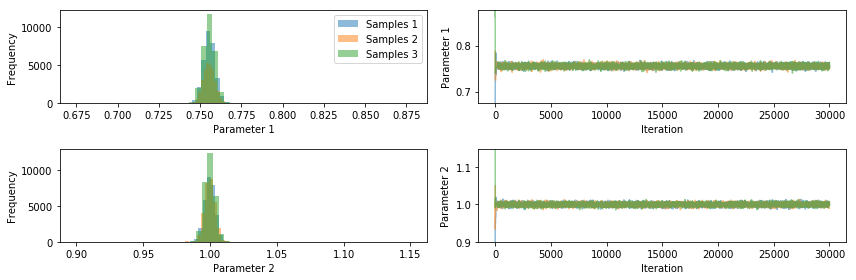

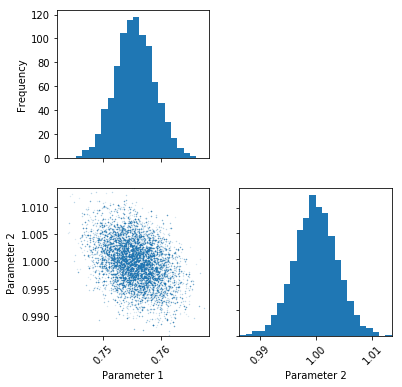

In [49]:
# Choose starting points for 3 mcmc chains
x0s = [
    np.array(start_parameters) * 0.9,
    np.array(start_parameters) * 1.05, #1.1
    np.array(start_parameters) * 1.15,
]
# Choose a covariance matrix for the proposal step
sigma0 = [0.01, 0.01] #np.abs(true_parameters) * 5e-5

# Create mcmc routine
mcmc = pints.MCMCController(log_posterior, 3, x0s)

# Add stopping criterion
mcmc.set_max_iterations(30000)

# Disable logging mode
#mcmc.set_log_to_screen(False)

# Run!
print('Running...')
metropolis_chains = mcmc.run()
print('Done!')

# Show traces and histograms
pints.plot.trace(metropolis_chains)

# Discard warm up
metropolis_chains_thinned = metropolis_chains[:, 10000:, :]

# Check convergence using rhat criterion
print('R-hat:')
print(pints.rhat_all_params(metropolis_chains_thinned))

# Look at distribution in chain 0
pints.plot.pairwise(metropolis_chains_thinned[0])

# Show graphs
plt.show()

In [46]:
metropolis_chains.shape

(3, 30000, 2)

In [47]:
metropolis_chains[0][:10]

array([[0.675, 0.9  ],
       [0.675, 0.9  ],
       [0.675, 0.9  ],
       [0.675, 0.9  ],
       [0.675, 0.9  ],
       [0.675, 0.9  ],
       [0.675, 0.9  ],
       [0.675, 0.9  ],
       [0.675, 0.9  ],
       [0.675, 0.9  ]])

In [48]:
emulated_chains[0][:10]

array([[0.675     , 0.9       ],
       [0.675     , 0.9       ],
       [0.66357105, 1.03079459],
       [0.74175732, 1.07656601],
       [0.74175732, 1.07656601],
       [0.74175732, 1.07656601],
       [0.74175732, 1.07656601],
       [0.74175732, 1.07656601],
       [0.74175732, 1.07656601],
       [0.74175732, 1.07656601]])

Running...
Using Emulated Metropolis MCMC
Generating 3 chains.
Running in sequential mode.
Iter. Eval. Accept.   Accept.   Accept.   Time m:s
0     3      0         0         0          0:00.0
1     6      0.5       0         0.5        0:00.0
2     9      0.333     0.333     0.667      0:00.0
3     12     0.25      0.25      0.5        0:00.0
20    63     0.143     0.19      0.333      0:00.1
40    123    0.171     0.22      0.22       0:00.1
60    183    0.197     0.197     0.213      0:00.2
80    243    0.222     0.21      0.222      0:00.3
100   303    0.208     0.178     0.228      0:00.4
120   363    0.198     0.214876  0.231405   0:00.4
140   423    0.199     0.206     0.241      0:00.5
160   483    0.186     0.205     0.236      0:00.6
180   543    0.166     0.204     0.249      0:00.7
200   603    0.164     0.194     0.244      0:00.7
220   663    0.158371  0.217     0.235      0:00.8
240   723    0.162     0.212     0.253112   0:00.9
260   783    0.169     0.207     0.249    

3100  9303   0.184     0.178     0.173      0:19.2
3120  9363   0.184     0.178     0.174      0:19.4
3140  9423   0.184     0.178     0.17383    0:19.5
3160  9483   0.185068  0.178     0.174      0:19.7
3180  9543   0.185     0.179     0.174      0:19.8
3200  9603   0.184005  0.179     0.173      0:20.0
3220  9663   0.184     0.178     0.173      0:20.2
3240  9723   0.184     0.178     0.172      0:20.3
3260  9783   0.185     0.177     0.172      0:20.5
3280  9843   0.184     0.176     0.173      0:20.7
3300  9903   0.184     0.176     0.172      0:20.9
3320  9963   0.184583  0.176     0.171635   0:21.1
3340  10023  0.184     0.177     0.171      0:21.3
3360  10083  0.185     0.177     0.17108    0:21.5
3380  10143  0.185     0.176     0.171      0:21.8
3400  10203  0.185     0.176     0.171      0:22.0
3420  10263  0.184     0.175095  0.170418   0:22.2
3440  10323  0.184     0.175     0.17       0:22.5
3460  10383  0.185     0.174516  0.170182   0:22.7
3480  10443  0.184     0.174   

6320  18963  0.184     0.172     0.172      0:44.4
6340  19023  0.184     0.172     0.172      0:44.5
6360  19083  0.184405  0.172     0.172      0:44.7
6380  19143  0.184     0.172     0.172      0:44.9
6400  19203  0.184     0.172     0.172      0:45.1
6420  19263  0.184     0.172     0.171      0:45.3
6440  19323  0.184     0.172023  0.172      0:45.4
6460  19383  0.184     0.172     0.1718     0:45.6
6480  19443  0.183     0.173     0.172      0:45.8
6500  19503  0.183     0.172     0.172      0:45.9
6520  19563  0.182794  0.172     0.172      0:46.1
6540  19623  0.183     0.172     0.172      0:46.3
6560  19683  0.183     0.172     0.172      0:46.4
6580  19743  0.182647  0.172     0.172      0:46.6
6600  19803  0.183     0.172     0.173      0:46.8
6620  19863  0.183     0.172     0.172      0:47.0
6640  19923  0.183     0.172     0.173      0:47.2
6660  19983  0.183     0.172     0.173      0:47.3
6680  20043  0.182308  0.172     0.173      0:47.4
6700  20103  0.182     0.172   

c:\users\plagl\pints\pints\_mcmc\_emulated_metropolis.py:154: RuntimeWarning: invalid value encountered in double_scalars
  if ((self._f(self._proposed) * alpha2) / (self._f(self._current) * alpha1)) > u2:


9240  27723  0.179     0.173     0.172925   1:07.9
9260  27783  0.179     0.173     0.173      1:08.1
9280  27843  0.179     0.173     0.172934   1:08.4
9300  27903  0.179013  0.173     0.173      1:08.6
9320  27963  0.179     0.173     0.173      1:08.8
9340  28023  0.179     0.173     0.173      1:09.0
9360  28083  0.18      0.173     0.172738   1:09.2
9380  28143  0.179     0.173     0.173      1:09.5
9400  28203  0.179449  0.173     0.172854   1:09.7
9420  28263  0.179     0.173     0.173      1:09.9
9440  28323  0.179     0.172863  0.172863   1:10.0
9460  28383  0.179     0.173     0.172709   1:10.2
9480  28443  0.179306  0.173     0.173      1:10.3
9500  28503  0.179139  0.173     0.172      1:10.4
9520  28563  0.179     0.172776  0.172      1:10.6
9540  28623  0.179     0.172833  0.172      1:10.8
9560  28683  0.18      0.173     0.172      1:11.0
9580  28743  0.179     0.173     0.171694   1:11.1
9600  28803  0.18      0.173     0.172      1:11.3
9620  28863  0.179815  0.173   

12460 37383  0.179     0.174     0.167964   1:34.4
12480 37443  0.179     0.173704  0.168      1:34.5
12500 37503  0.179     0.174     0.168      1:34.7
12520 37563  0.179     0.173788  0.168      1:34.9
12540 37623  0.179     0.174     0.168      1:35.1
12560 37683  0.179     0.174     0.167821   1:35.4
12580 37743  0.179477  0.174     0.168      1:35.6
12600 37803  0.179     0.174     0.168      1:35.8
12620 37863  0.179     0.173     0.168      1:36.0
12640 37923  0.179258  0.174     0.168      1:36.2
12660 37983  0.179     0.174     0.168      1:36.4
12680 38043  0.179     0.174     0.168      1:36.7
12700 38103  0.179041  0.174002  0.168      1:36.9
12720 38163  0.179     0.174     0.168      1:37.1
12740 38223  0.179     0.174     0.168      1:37.3
12760 38283  0.179     0.174     0.168      1:37.5
12780 38343  0.179094  0.174     0.168      1:37.8
12800 38403  0.179     0.174     0.168      1:38.0
12820 38463  0.179     0.174     0.168      1:38.2
12840 38523  0.179     0.174   

c:\users\plagl\pints\pints\_mcmc\_emulated_metropolis.py:154: RuntimeWarning: invalid value encountered in double_scalars
  if ((self._f(self._proposed) * alpha2) / (self._f(self._current) * alpha1)) > u2:


14720 44163  0.177     0.173     0.167      1:48.2
14740 44223  0.177     0.173     0.167      1:48.3
14760 44283  0.177     0.173     0.167      1:48.3
14780 44343  0.176984  0.173     0.167      1:48.4
14800 44403  0.177     0.173     0.167286   1:48.5
14820 44463  0.177     0.173     0.168      1:48.6
14840 44523  0.177     0.173     0.168      1:48.7
14860 44583  0.176906  0.173     0.168      1:48.9
14880 44643  0.176937  0.173     0.168      1:49.0
14900 44703  0.177     0.173     0.167774   1:49.0
14920 44763  0.177     0.174     0.168      1:49.1
14940 44823  0.177     0.174     0.168      1:49.2
14960 44883  0.177     0.174     0.168      1:49.3
14980 44943  0.177     0.174     0.168      1:49.3
15000 45003  0.177     0.174     0.168      1:49.4
15020 45063  0.177     0.174     0.168      1:49.4
15040 45123  0.177     0.174     0.168      1:49.5
15060 45183  0.177     0.174     0.168      1:49.6
15080 45243  0.176     0.174     0.168      1:49.6
15100 45303  0.176     0.173366

17980 53943  0.177     0.175     0.17       1:59.0
18000 54003  0.177     0.175     0.169      1:59.1
18020 54063  0.177     0.175     0.17       1:59.1
18040 54123  0.176764  0.175     0.17       1:59.2
18060 54183  0.177     0.175018  0.17       1:59.2
18080 54243  0.177     0.174935  0.17       1:59.3
18100 54303  0.177     0.175     0.17       1:59.3
18120 54363  0.177     0.175     0.169803   1:59.4
18140 54423  0.177     0.175     0.17       1:59.5
18160 54483  0.177     0.17466   0.17       1:59.5
18180 54543  0.176778  0.175     0.17       1:59.6
18200 54603  0.177     0.174441  0.17       1:59.6
18220 54663  0.177     0.174469  0.17       1:59.7
18240 54723  0.177     0.174     0.17       1:59.7
18260 54783  0.177     0.174     0.17       1:59.8
18280 54843  0.176905  0.174     0.17       1:59.9
18300 54903  0.177     0.174     0.17       2:00.0
18320 54963  0.177     0.174     0.17       2:00.0
18340 55023  0.177     0.174     0.17       2:00.1
18360 55083  0.177     0.174   

c:\users\plagl\pints\pints\_mcmc\_emulated_metropolis.py:154: RuntimeWarning: invalid value encountered in double_scalars
  if ((self._f(self._proposed) * alpha2) / (self._f(self._current) * alpha1)) > u2:


20540 61623  0.176     0.174     0.172      2:06.2
20560 61683  0.176     0.174     0.172      2:06.2
20580 61743  0.175696  0.174     0.172      2:06.3
20600 61803  0.176     0.174409  0.172      2:06.3
20620 61863  0.176     0.174     0.172      2:06.4
20640 61923  0.176     0.174     0.172      2:06.5
20660 61983  0.176     0.174     0.172      2:06.5
20680 62043  0.175     0.174     0.172      2:06.6
20700 62103  0.175     0.174     0.172      2:06.6
20720 62163  0.175     0.174     0.172      2:06.7
20740 62223  0.175     0.174     0.172      2:06.7
20760 62283  0.175     0.174     0.172      2:06.8
20780 62343  0.175     0.174     0.172      2:06.8
20800 62403  0.175     0.174     0.171      2:06.9
20820 62463  0.175     0.173911  0.171      2:06.9
20840 62523  0.175     0.173888  0.172      2:07.0
20860 62583  0.175     0.173961  0.172      2:07.1
20880 62643  0.175     0.174     0.171      2:07.1
20900 62703  0.175     0.174     0.171      2:07.2
20920 62763  0.175     0.174   

23800 71403  0.175     0.175     0.171      2:14.7
23820 71463  0.175     0.175     0.171      2:14.8
23840 71523  0.175     0.175     0.171      2:14.8
23860 71583  0.175     0.175     0.171      2:14.9
23880 71643  0.175     0.176     0.171      2:14.9
23900 71703  0.175     0.176     0.171      2:15.0
23920 71763  0.175     0.175     0.171      2:15.0
23940 71823  0.175     0.175     0.171      2:15.1
23960 71883  0.175     0.175     0.171      2:15.1
23980 71943  0.175     0.175     0.171      2:15.2
24000 72003  0.175     0.175     0.171      2:15.2
24020 72063  0.175     0.175     0.171      2:15.3
24040 72123  0.175     0.175     0.171      2:15.4
24060 72183  0.175     0.175     0.171      2:15.4
24080 72243  0.175     0.175     0.171      2:15.4
24100 72303  0.174889  0.175     0.171      2:15.5
24120 72363  0.175     0.176     0.171      2:15.5
24140 72423  0.175     0.176     0.171      2:15.6
24160 72483  0.175     0.175     0.171      2:15.6
24180 72543  0.175     0.176   

27080 81243  0.174     0.174     0.171744   2:23.2
27100 81303  0.174     0.174     0.172      2:23.3
27120 81363  0.173998  0.174     0.172      2:23.3
27140 81423  0.174054  0.174     0.172      2:23.4
27160 81483  0.174     0.174     0.172      2:23.5
27180 81543  0.174     0.174     0.172      2:23.5
27200 81603  0.174     0.174     0.172      2:23.6
27220 81663  0.174     0.174     0.172      2:23.6
27240 81723  0.174     0.174     0.172      2:23.7
27260 81783  0.174     0.174     0.172      2:23.7
27280 81843  0.174     0.174     0.172      2:23.8
27300 81903  0.173913  0.174     0.172      2:23.9
27320 81963  0.174     0.175     0.172      2:23.9
27340 82023  0.174     0.174     0.172      2:24.0
27360 82083  0.174     0.174     0.172      2:24.0
27380 82143  0.174     0.175     0.172      2:24.1
27400 82203  0.174     0.174     0.171928   2:24.2
27420 82263  0.174     0.174     0.172      2:24.2
27440 82323  0.174     0.174     0.172      2:24.3
27460 82383  0.174     0.174   

c:\users\plagl\pints\pints\_mcmc\_emulated_metropolis.py:154: RuntimeWarning: invalid value encountered in double_scalars
  if ((self._f(self._proposed) * alpha2) / (self._f(self._current) * alpha1)) > u2:


28460 85383  0.174     0.175     0.171      2:27.0
28480 85443  0.174     0.175     0.171      2:27.1
28500 85503  0.174     0.175     0.171      2:27.1
28520 85563  0.174     0.175064  0.171102   2:27.2
28540 85623  0.173715  0.175     0.171      2:27.2
28560 85683  0.174     0.175     0.171      2:27.3
28580 85743  0.174     0.175     0.171      2:27.3
28600 85803  0.174     0.174854  0.171      2:27.4
28620 85863  0.174     0.175     0.171168   2:27.4
28640 85923  0.174     0.175     0.171      2:27.5
28660 85983  0.174     0.175     0.171      2:27.5
28680 86043  0.174     0.175     0.171      2:27.6
28700 86103  0.174     0.174872  0.171      2:27.6
28720 86163  0.174     0.175     0.171      2:27.7
28740 86223  0.174     0.175     0.171      2:27.7
28760 86283  0.174     0.175     0.171      2:27.8
28780 86343  0.174     0.175     0.171      2:27.8
28800 86403  0.174     0.175     0.171      2:27.9
28820 86463  0.173901  0.175     0.171      2:27.9
28840 86523  0.174     0.175   

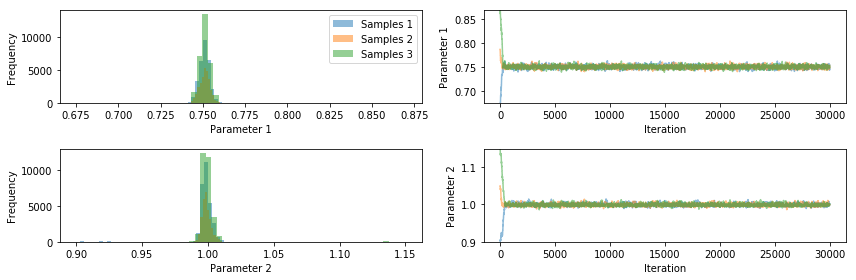

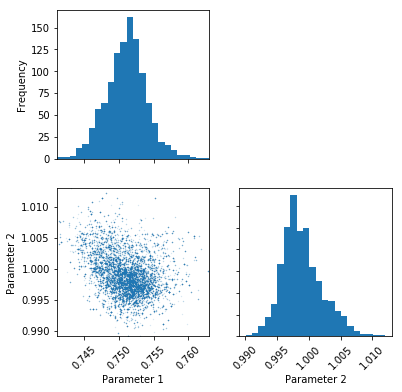

In [53]:
# Choose starting points for 3 mcmc chains
x0s = [
    np.array(start_parameters) * 0.9,
    np.array(start_parameters) * 1.05, #1.1
    np.array(start_parameters) * 1.15,
]
# Choose a covariance matrix for the proposal step
#sigma0 = [0.01, 0.01] #np.abs(true_parameters) * 5e-3
#sigma0 = [0.1*0.75, 0.1] #np.abs(true_parameters) * 5e-3
sigma0 = [[ 1.01547594e-05, -2.58358260e-06], [-2.58358260e-06,  1.22093040e-05]]

# Create mcmc routine
mcmc = pints.MCMCController(log_posterior_emu, 3, x0s, sigma0=sigma0, method=pints.EmulatedMetropolisMCMC, f=log_posterior)

# Add stopping criterion
mcmc.set_max_iterations(30000)

# Disable logging mode
#mcmc.set_log_to_screen(False)

# Run!
print('Running...')
emulated_chains = mcmc.run()
print('Done!')

# Show traces and histograms
pints.plot.trace(emulated_chains)

# Discard warm up
emulated_chains_thinned = emulated_chains[:, 10000:, :]

# Check convergence using rhat criterion
print('R-hat:')
print(pints.rhat_all_params(emulated_chains_thinned))

# Look at distribution in chain 0
pints.plot.pairwise(emulated_chains_thinned[0])

# Show graphs
plt.show()